<a href="https://colab.research.google.com/github/khaled1109/Data-Mining-Algorithmen-und-Feature-Engineering-zur-Vorhersage-von-Retouren-im-Onlinehandel/blob/main/DATA_MINING_CUP_2014_Last_version.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 📚 Importing Libraries & Data

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

In [ ]:
import pandas as pd

# Laden der Datei aus dem Colab-Upload-Verzeichnis
file_path = '/content/orders_train.txt'
df_loaded = pd.read_csv(file_path, sep=';', na_values=['?'])
df_loaded


,orderItemID,orderDate,deliveryDate,itemID,size,color,manufacturerID,price,customerID,salutation,dateOfBirth,state,creationDate,returnShipment
0,1,2012-04-01,2012-04-03,186,m,denim,25,69.90,794,Mrs,1965-01-06,Baden-Wuerttemberg,2011-04-25,0
1,2,2012-04-01,2012-04-03,71,9+,ocher,21,69.95,794,Mrs,1965-01-06,Baden-Wuerttemberg,2011-04-25,1
2,3,2012-04-01,2012-04-03,71,9+,curry,21,69.95,794,Mrs,1965-01-06,Baden-Wuerttemberg,2011-04-25,1
3,4,2012-04-02,NaN,22,m,green,14,39.90,808,Mrs,1959-11-09,Saxony,2012-01-04,0
4,5,2012-04-02,1990-12-31,151,39,black,53,29.90,825,Mrs,1964-07-11,Rhineland-Palatinate,2011-02-16,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
481087,481088,2013-03-31,2013-04-09,2561,39+,blue,1,139.90,7032,Mr,1962-12-17,Lower Saxony,2011-03-12,1
481088,481089,2013-03-31,2013-04-02,2669,39,grey,18,130.00,86610,Mrs,NaN,Berlin,2012-03-24,0
481089,481090,2013-03-31,1990-12-31,2458,XXL,black,5,99.90,86611,Mr,1973-05-16,Berlin,2013-03-31,0
481090,481091,2013-03-31,1990-12-31,2659,XXL,black,49,99.90,86611,Mr,1973-05-16,Berlin,2013-03-31,0


In [ ]:
df_loaded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 481092 entries, 0 to 481091
Data columns (total 14 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   orderItemID     481092 non-null  int64  
 1   orderDate       481092 non-null  object 
 2   deliveryDate    441673 non-null  object 
 3   itemID          481092 non-null  int64  
 4   size            481092 non-null  object 
 5   color           480949 non-null  object 
 6   manufacturerID  481092 non-null  int64  
 7   price           481092 non-null  float64
 8   customerID      481092 non-null  int64  
 9   salutation      481092 non-null  object 
 10  dateOfBirth     432203 non-null  object 
 11  state           481092 non-null  object 
 12  creationDate    481092 non-null  object 
 13  returnShipment  481092 non-null  int64  
dtypes: float64(1), int64(5), object(8)
memory usage: 51.4+ MB


In [ ]:
# Anzahl der Zeilen mit deliveryDate = NaN und returnShipment = 0
nan_delivery_return_0 = df_loaded[(df_loaded['deliveryDate'].isna()) & (df_loaded['returnShipment'] == 0)].shape[0]

# Anzahl der Zeilen mit deliveryDate = NaN und returnShipment = 1
nan_delivery_return_1 = df_loaded[(df_loaded['deliveryDate'].isna()) & (df_loaded['returnShipment'] == 1)].shape[0]

print(f"Anzahl von deliveryDate = NaN und returnShipment = 0: {nan_delivery_return_0}")
print(f"Anzahl von deliveryDate = NaN und returnShipment = 1: {nan_delivery_return_1}")


Anzahl von deliveryDate = NaN und returnShipment = 0: 39419
Anzahl von deliveryDate = NaN und returnShipment = 1: 0


In [ ]:
df_loaded.describe()

,orderItemID,itemID,manufacturerID,price,customerID,returnShipment
count,481092.000000,481092.000000,481092.000000,481092.000000,481092.000000,481092.000000
mean,240546.500000,1399.764779,29.726109,70.440229,33369.968376,0.482425
std,138879.442189,931.075227,30.064934,45.502854,23972.075259,0.499692
min,1.000000,1.000000,1.000000,0.000000,6.000000,0.000000
25%,120273.750000,332.000000,5.000000,34.900000,12891.000000,0.000000
50%,240546.500000,1569.000000,21.000000,59.900000,28426.000000,0.000000
75%,360819.250000,2342.000000,43.000000,89.900000,51141.000000,1.000000
max,481092.000000,3071.000000,166.000000,999.000000,86611.000000,1.000000


In [ ]:
import pandas as pd

# Define the output file path
output_file_path = r'C:\Users\khale\OneDrive - informatik.hs-fulda.de\Desktop\Bacholer Arbeit\Data Mining\DMC_task_2014\orders_train_cleaned.csv'

# Save the DataFrame to a CSV file at the specified path
df_loaded.to_csv(output_file_path, index=False)

# Confirm the file path
print(f"File saved as: {output_file_path}")

# Read the saved file back into a new DataFrame
df = pd.read_csv(output_file_path)

# Print the loaded DataFrame
#df = df.sort_values(by=['customerID'])

df  # Print only the first few rows for readability


File saved as: C:\Users\khale\OneDrive - informatik.hs-fulda.de\Desktop\Bacholer Arbeit\Data Mining\DMC_task_2014\orders_train_cleaned.csv


,orderItemID,orderDate,deliveryDate,itemID,size,color,manufacturerID,price,customerID,salutation,dateOfBirth,state,creationDate,returnShipment
0,1,2012-04-01,2012-04-03,186,m,denim,25,69.90,794,Mrs,1965-01-06,Baden-Wuerttemberg,2011-04-25,0
1,2,2012-04-01,2012-04-03,71,9+,ocher,21,69.95,794,Mrs,1965-01-06,Baden-Wuerttemberg,2011-04-25,1
2,3,2012-04-01,2012-04-03,71,9+,curry,21,69.95,794,Mrs,1965-01-06,Baden-Wuerttemberg,2011-04-25,1
3,4,2012-04-02,NaN,22,m,green,14,39.90,808,Mrs,1959-11-09,Saxony,2012-01-04,0
4,5,2012-04-02,1990-12-31,151,39,black,53,29.90,825,Mrs,1964-07-11,Rhineland-Palatinate,2011-02-16,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
481087,481088,2013-03-31,2013-04-09,2561,39+,blue,1,139.90,7032,Mr,1962-12-17,Lower Saxony,2011-03-12,1
481088,481089,2013-03-31,2013-04-02,2669,39,grey,18,130.00,86610,Mrs,NaN,Berlin,2012-03-24,0
481089,481090,2013-03-31,1990-12-31,2458,XXL,black,5,99.90,86611,Mr,1973-05-16,Berlin,2013-03-31,0
481090,481091,2013-03-31,1990-12-31,2659,XXL,black,49,99.90,86611,Mr,1973-05-16,Berlin,2013-03-31,0


In [ ]:
# Größe für jede Produktkategorie drucken
for state in df['state'].unique():
    #sizes = df13[df13['product_category'] == category]['size'].unique()

    # Sortiere Größen numerisch, wenn möglich, sonst alphanumerisch
    #sorted_sizes = sorted(sizes, key=lambda x: (not x.isdigit(), x if not x.isdigit() else int(x)))

    print( {state})
    #print(f"Eindeutige Größen: {sorted_sizes}\n")

{'Baden-Wuerttemberg'}
{'Saxony'}
{'Rhineland-Palatinate'}
{'North Rhine-Westphalia'}
{'Berlin'}
{'Bavaria'}
{'Hesse'}
{'Bremen'}
{'Schleswig-Holstein'}
{'Brandenburg'}
{'Hamburg'}
{'Lower Saxony'}
{'Saxony-Anhalt'}
{'Saarland'}
{'Thuringia'}
{'Mecklenburg-Western Pomerania'}


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 481092 entries, 0 to 481091
Data columns (total 14 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   orderItemID     481092 non-null  int64  
 1   orderDate       481092 non-null  object 
 2   deliveryDate    441673 non-null  object 
 3   itemID          481092 non-null  int64  
 4   size            481092 non-null  object 
 5   color           480949 non-null  object 
 6   manufacturerID  481092 non-null  int64  
 7   price           481092 non-null  float64
 8   customerID      481092 non-null  int64  
 9   salutation      481092 non-null  object 
 10  dateOfBirth     432203 non-null  object 
 11  state           481092 non-null  object 
 12  creationDate    481092 non-null  object 
 13  returnShipment  481092 non-null  int64  
dtypes: float64(1), int64(5), object(8)
memory usage: 51.4+ MB


# 🛠️ Data Preprocessing

## Convert 'Date' columns to datetime format

In [ ]:
# Step 1: Convert 'orderDate' and 'deliveryDate' columns to datetime format
df['orderDate'] = pd.to_datetime(df['orderDate'])
df['deliveryDate'] = pd.to_datetime(df['deliveryDate'])
df['dateOfBirth'] = pd.to_datetime(df['dateOfBirth'], errors='coerce')
df['creationDate'] = pd.to_datetime(df['creationDate'], errors='coerce')



In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 481092 entries, 0 to 481091
Data columns (total 14 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   orderItemID     481092 non-null  int64         
 1   orderDate       481092 non-null  datetime64[ns]
 2   deliveryDate    441673 non-null  datetime64[ns]
 3   itemID          481092 non-null  int64         
 4   size            481092 non-null  object        
 5   color           480949 non-null  object        
 6   manufacturerID  481092 non-null  int64         
 7   price           481092 non-null  float64       
 8   customerID      481092 non-null  int64         
 9   salutation      481092 non-null  object        
 10  dateOfBirth     432200 non-null  datetime64[ns]
 11  state           481092 non-null  object        
 12  creationDate    481092 non-null  datetime64[ns]
 13  returnShipment  481092 non-null  int64         
dtypes: datetime64[ns](4), float64(1), in

## Categorical Columns

In [ ]:
df['salutation'] = df['salutation'].astype('category')
df['size'] = df['size'].astype('category')
df['color'] = df['color'].astype('category')
df['state'] = df['state'].astype('category')


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 481092 entries, 0 to 481091
Data columns (total 14 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   orderItemID     481092 non-null  int64         
 1   orderDate       481092 non-null  datetime64[ns]
 2   deliveryDate    441673 non-null  datetime64[ns]
 3   itemID          481092 non-null  int64         
 4   size            481092 non-null  category      
 5   color           480949 non-null  category      
 6   manufacturerID  481092 non-null  int64         
 7   price           481092 non-null  float64       
 8   customerID      481092 non-null  int64         
 9   salutation      481092 non-null  category      
 10  dateOfBirth     432200 non-null  datetime64[ns]
 11  state           481092 non-null  category      
 12  creationDate    481092 non-null  datetime64[ns]
 13  returnShipment  481092 non-null  int64         
dtypes: category(4), datetime64[ns](4), f

In [ ]:
# Summary statistics
df.describe()

,orderItemID,orderDate,deliveryDate,itemID,manufacturerID,price,customerID,dateOfBirth,creationDate,returnShipment
count,481092.000000,481092,441673,481092.000000,481092.000000,481092.000000,481092.000000,432200,481092,481092.000000
mean,240546.500000,2012-10-11 13:01:35.452845312,2012-08-01 03:44:53.660694528,1399.764779,29.726109,70.440229,33369.968376,1964-04-12 01:19:59.378065696,2011-12-28 14:59:09.983786752,0.482425
min,1.000000,2012-04-01 00:00:00,1990-12-31 00:00:00,1.000000,1.000000,0.000000,6.000000,1900-11-19 00:00:00,2011-02-16 00:00:00,0.000000
25%,120273.750000,2012-06-30 00:00:00,2012-07-04 00:00:00,332.000000,5.000000,34.900000,12891.000000,1959-05-19 00:00:00,2011-02-16 00:00:00,0.000000
50%,240546.500000,2012-10-07 00:00:00,2012-10-22 00:00:00,1569.000000,21.000000,59.900000,28426.000000,1965-01-15 00:00:00,2012-02-14 00:00:00,0.000000
75%,360819.250000,2013-01-23 00:00:00,2013-02-05 00:00:00,2342.000000,43.000000,89.900000,51141.000000,1970-05-07 00:00:00,2012-08-05 00:00:00,1.000000
max,481092.000000,2013-03-31 00:00:00,2013-07-22 00:00:00,3071.000000,166.000000,999.000000,86611.000000,2013-06-27 00:00:00,2013-03-31 00:00:00,1.000000
std,138879.442189,NaN,NaN,931.075227,30.064934,45.502854,23972.075259,NaN,NaN,0.499692


## delivery_date null löschen

In [ ]:
# Entfernen der Zeilen mit null-Werten in der Spalte "deliveryDate"
df = df.dropna(subset=['deliveryDate'])

# Überprüfen, ob die Zeilen entfernt wurden
df.info()


<class 'pandas.core.frame.DataFrame'>
Index: 441673 entries, 0 to 481091
Data columns (total 14 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   orderItemID     441673 non-null  int64         
 1   orderDate       441673 non-null  datetime64[ns]
 2   deliveryDate    441673 non-null  datetime64[ns]
 3   itemID          441673 non-null  int64         
 4   size            441673 non-null  category      
 5   color           441535 non-null  category      
 6   manufacturerID  441673 non-null  int64         
 7   price           441673 non-null  float64       
 8   customerID      441673 non-null  int64         
 9   salutation      441673 non-null  category      
 10  dateOfBirth     396619 non-null  datetime64[ns]
 11  state           441673 non-null  category      
 12  creationDate    441673 non-null  datetime64[ns]
 13  returnShipment  441673 non-null  int64         
dtypes: category(4), datetime64[ns](4), float6

## 1. deliveryDate and Calculate deliveryTime

In [ ]:
# Define the placeholder date
placeholder_date = pd.to_datetime("1990-12-31")

# Count the rows where deliveryDate is equal to the placeholder date
placeholder_count = df[df['deliveryDate'] == placeholder_date].shape[0]

# Display the count
print(f"Number of rows with placeholder date 1990-12-31: {placeholder_count}")


Number of rows with placeholder date 1990-12-31: 4660


In [ ]:
# Count the rows where deliveryDate is equal to orderDate
matching_count = df[df['deliveryDate'] == df['orderDate']].shape[0]

# Display the count
print(f"Number of rows where deliveryDate is equal to orderDate: {matching_count}")


Number of rows where deliveryDate is equal to orderDate: 1349


In [ ]:
# Filtern der Fälle, bei denen deliveryDate gleich orderDate ist
matching_rows = df[df['deliveryDate'] == df['orderDate']]

# Auswahl der gewünschten Spalten
matching_cases = matching_rows[['customerID', 'itemID', 'orderDate', 'deliveryDate']]

# Anzeigen der Fälle
print(matching_cases)

# Optional: Anzahl der Fälle
print(f"Anzahl der Fälle, bei denen deliveryDate gleich orderDate ist: {matching_cases.shape[0]}")


        customerID  itemID  orderDate deliveryDate
1207           644     402 2012-04-03   2012-04-03
3752          1545     334 2012-04-05   2012-04-05
5110           239     300 2012-04-06   2012-04-06
5111           239     301 2012-04-06   2012-04-06
5112           239     271 2012-04-06   2012-04-06
...            ...     ...        ...          ...
471827       48532    2598 2013-03-26   2013-03-26
474965       69812    2439 2013-03-28   2013-03-28
477363       40699    3034 2013-03-29   2013-03-29
477364       40699    2640 2013-03-29   2013-03-29
477365       40699    2362 2013-03-29   2013-03-29

[1349 rows x 4 columns]
Anzahl der Fälle, bei denen deliveryDate gleich orderDate ist: 1349


In [ ]:

#filtered_df12 = df13[(df13['deliveryDate'] == 'nan') ]
#df13_missing_delivery = df13[df13['deliveryDate'].isnull()]
#filtered_df12 = df13[(df13['customerID'] == 1317)& (df13['orderDate'] == '2012-04-01')]
#filtered_df12 = df13[(df13['customerID'] == 7824)& (df13['orderDate'] == '2013-03-31')]
#filtered_df12 = df13[(df13['customerID'] == 1360)& (df13['orderDate'] == '2012-04-01')]
#filtered_df12 = df13[(df13['customerID'] == 4390)& (df13['orderDate'] == '2013-03-31')]
filtered_df12 = df[(df['customerID'] == 239)& (df['orderDate'] == '2012-04-06')]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['customerID', 'itemID', 'orderDate','deliveryDate']]



,customerID,itemID,orderDate,deliveryDate
5110,239,300,2012-04-06,2012-04-06
5111,239,301,2012-04-06,2012-04-06
5112,239,271,2012-04-06,2012-04-06


In [ ]:
import numpy as np

# Setzen von deliveryDate auf NaN, wenn deliveryDate gleich orderDate ist
df.loc[df['deliveryDate'] == df['orderDate'], 'deliveryDate'] = np.nan

# Überprüfen, ob die Änderungen vorgenommen wurden
print("Alle deliveryDate-Werte, die gleich orderDate waren, wurden auf NaN gesetzt.")
print(df[['customerID', 'itemID', 'orderDate', 'deliveryDate']].head())


Alle deliveryDate-Werte, die gleich orderDate waren, wurden auf NaN gesetzt.
   customerID  itemID  orderDate deliveryDate
0         794     186 2012-04-01   2012-04-03
1         794      71 2012-04-01   2012-04-03
2         794      71 2012-04-01   2012-04-03
4         825     151 2012-04-02   1990-12-31
5         825     598 2012-04-02   1990-12-31


In [ ]:

#filtered_df12 = df13[(df13['deliveryDate'] == 'nan') ]
#df13_missing_delivery = df13[df13['deliveryDate'].isnull()]
#filtered_df12 = df13[(df13['customerID'] == 1317)& (df13['orderDate'] == '2012-04-01')]
#filtered_df12 = df13[(df13['customerID'] == 7824)& (df13['orderDate'] == '2013-03-31')]
#filtered_df12 = df13[(df13['customerID'] == 1360)& (df13['orderDate'] == '2012-04-01')]
#filtered_df12 = df13[(df13['customerID'] == 4390)& (df13['orderDate'] == '2013-03-31')]
filtered_df12 = df[(df['customerID'] == 825)& (df['orderDate'] == '2012-04-02')]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['customerID', 'itemID', 'orderDate','deliveryDate']]



,customerID,itemID,orderDate,deliveryDate
4,825,151,2012-04-02,1990-12-31
5,825,598,2012-04-02,1990-12-31
6,825,15,2012-04-02,1990-12-31


In [ ]:
# Check for any missing values
df.isnull().sum()

,0
orderItemID,0
orderDate,0
deliveryDate,1349
itemID,0
size,0
color,138
manufacturerID,0
price,0
customerID,0
salutation,0


In [ ]:
# Define placeholder date
placeholder_date = pd.to_datetime("1990-12-31")

# Convert placeholder date to NaN
df['deliveryDate'] = df['deliveryDate'].replace(placeholder_date, pd.NaT)

# Check if the conversion was successful
print(df['deliveryDate'].isna().sum())


6009


In [ ]:
# Check for any missing values
df.isnull().sum()

,0
orderItemID,0
orderDate,0
deliveryDate,6009
itemID,0
size,0
color,138
manufacturerID,0
price,0
customerID,0
salutation,0


## PackageID

In [ ]:
# Kopieren von df13 in df14
#df14 = df13.copy()

# Erstellen einer neuen Spalte, um die Anzahl der `deliveryDate`, die nicht null sind, pro Bestellung zu zählen
df['non_null_delivery_count'] = df.groupby(['customerID', 'orderDate'])['deliveryDate'].transform(lambda x: x.notnull().sum())

# Fälle, bei denen `deliveryDate` null ist, aber keine nicht-null Werte in derselben Bestellung existieren
df_missing_elsewhere = df[(df['deliveryDate'].isnull()) & (df['non_null_delivery_count'] == 0)]

# Anzeigen der relevanten Spalten
df_missing_elsewhere_result = df_missing_elsewhere[['customerID', 'itemID', 'orderDate', 'deliveryDate']]

# Ergebnis anzeigen
print(f"Anzahl der Fälle: {df_missing_elsewhere_result.shape[0]}")
df_missing_elsewhere_result


Anzahl der Fälle: 4568


,customerID,itemID,orderDate,deliveryDate
4,825,151,2012-04-02,NaT
5,825,598,2012-04-02,NaT
6,825,15,2012-04-02,NaT
272,1174,243,2012-04-02,NaT
273,1174,80,2012-04-02,NaT
...,...,...,...,...
480836,86530,2728,2013-03-31,NaT
480943,46616,1480,2013-03-31,NaT
481089,86611,2458,2013-03-31,NaT
481090,86611,2659,2013-03-31,NaT


In [ ]:

#filtered_df12 = df13[(df13['deliveryDate'] == 'nan') ]
#df13_missing_delivery = df13[df13['deliveryDate'].isnull()]
#filtered_df12 = df13[(df13['customerID'] == 1317)& (df13['orderDate'] == '2012-04-01')]
#filtered_df12 = df13[(df13['customerID'] == 7824)& (df13['orderDate'] == '2013-03-31')]
#filtered_df12 = df13[(df13['customerID'] == 1360)& (df13['orderDate'] == '2012-04-01')]
#filtered_df12 = df13[(df13['customerID'] == 4390)& (df13['orderDate'] == '2013-03-31')]
filtered_df12 = df[(df['customerID'] == 1710)& (df['orderDate'] == '2012-04-01')]
#filtered_df12 = df[(df['customerID'] == 808)& (df['orderDate'] == '2012-04-02')]
# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['customerID', 'itemID', 'orderDate','deliveryDate']]



,customerID,itemID,orderDate,deliveryDate


In [ ]:

#filtered_df12 = df13[(df13['deliveryDate'] == 'nan') ]
#df13_missing_delivery = df13[df13['deliveryDate'].isnull()]
#filtered_df12 = df13[(df13['customerID'] == 1317)& (df13['orderDate'] == '2012-04-01')]
#filtered_df12 = df13[(df13['customerID'] == 7824)& (df13['orderDate'] == '2013-03-31')]
#filtered_df12 = df13[(df13['customerID'] == 1360)& (df13['orderDate'] == '2012-04-01')]
#filtered_df12 = df13[(df13['customerID'] == 4390)& (df13['orderDate'] == '2013-03-31')]
filtered_df12 = df[(df['customerID'] == 6)]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['customerID', 'itemID', 'orderDate','deliveryDate']]



,customerID,itemID,orderDate,deliveryDate
24723,6,261,2012-04-19,2012-04-24
31011,6,96,2012-04-25,2012-04-26
31012,6,96,2012-04-25,2012-04-26
31013,6,96,2012-04-25,2012-05-07
226242,6,1475,2012-09-23,2012-09-27
226243,6,250,2012-09-23,2012-09-27
226244,6,320,2012-09-23,2012-09-27
226245,6,1404,2012-09-23,2012-09-27
226246,6,1404,2012-09-23,2012-09-27
226247,6,1404,2012-09-23,2012-09-27


In [ ]:
# Kopieren von df13 in df14
#df = df.copy()

# Erstellen einer neuen Spalte, um die Anzahl der `deliveryDate`, die nicht null sind, pro Bestellung zu zählen
df['non_null_delivery_count'] = df.groupby(['customerID', 'orderDate'])['deliveryDate'].transform(lambda x: x.notnull().sum())

# Filtern der Zeilen, bei denen `deliveryDate` null ist, aber in der gleichen Bestellung (customerID + orderDate) andere Zeilen mit nicht-null existieren
df_missing_but_present_elsewhere = df[(df['deliveryDate'].isnull()) & (df['non_null_delivery_count'] > 0)]

# Anzeigen der relevanten Spalten
df_result = df_missing_but_present_elsewhere[['customerID', 'itemID', 'orderDate', 'deliveryDate']]

# Ergebnis anzeigen (optional)
df_result


,customerID,itemID,orderDate,deliveryDate
215,1152,51,2012-04-02,NaT
868,1484,11,2012-04-01,NaT
1606,1820,254,2012-04-02,NaT
2210,2060,194,2012-04-02,NaT
3049,2408,229,2012-04-03,NaT
...,...,...,...,...
480766,86522,2368,2013-03-31,NaT
480790,86523,2482,2013-03-31,NaT
480791,86523,2608,2013-03-31,NaT
480792,86523,2349,2013-03-31,NaT


In [ ]:

#filtered_df12 = df13[(df13['deliveryDate'] == 'nan') ]
#df13_missing_delivery = df13[df13['deliveryDate'].isnull()]
#filtered_df12 = df13[(df13['customerID'] == 1317)& (df13['orderDate'] == '2012-04-01')]
filtered_df12 = df[(df['customerID'] == 7824)& (df['orderDate'] == '2013-03-31')]
#filtered_df12 = df13[(df13['customerID'] == 1360)& (df13['orderDate'] == '2012-04-01')]
#filtered_df12 = df13[(df13['customerID'] == 4390)& (df13['orderDate'] == '2013-03-31')]
# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['customerID', 'itemID', 'orderDate','deliveryDate']]



,customerID,itemID,orderDate,deliveryDate
479815,7824,2478,2013-03-31,2013-04-02
479816,7824,2452,2013-03-31,2013-05-03
479817,7824,2452,2013-03-31,2013-05-30
479818,7824,2478,2013-03-31,2013-06-04


In [ ]:
# Kopieren von df13 in df14
#df14 = df13.copy()

# Hinzufügen einer Spalte, die die Anzahl der eindeutigen nicht-null deliveryDate pro Bestellung zählt
df['unique_delivery_dates'] = df.groupby(['customerID', 'orderDate'])['deliveryDate'].transform(lambda x: x.dropna().nunique())

# Hinzufügen einer Spalte mit der Anzahl der nicht-null deliveryDate pro Bestellung
df['non_null_delivery_count'] = df.groupby(['customerID', 'orderDate'])['deliveryDate'].transform(lambda x: x.notnull().sum())

# Filtern der Zeilen, bei denen deliveryDate null ist und die Bestellung nicht vollständig leer ist
df_missing_but_present_elsewhere = df[(df['deliveryDate'].isnull()) & (df['non_null_delivery_count'] > 0)]

# Identifikation der Use Cases
def identify_use_case(group):
    if group['unique_delivery_dates'].iloc[0] == 1:
        group['use_case'] = 'Use Case 1'  # Alle nicht-null deliveryDate-Werte sind gleich
    else:
        group['use_case'] = 'Use Case 2'  # Nicht-null deliveryDate-Werte sind nicht gleich
    return group

# Anwenden der Logik auf die gefilterten Daten
df_with_use_cases = (
    df_missing_but_present_elsewhere
    .groupby(['customerID', 'orderDate'])
    .apply(identify_use_case)
    .reset_index(drop=True)  # Index zurücksetzen
)

# Aufteilen in Use Case 1 und Use Case 2
use_case_1 = df_with_use_cases[df_with_use_cases['use_case'] == 'Use Case 1']
use_case_2 = df_with_use_cases[df_with_use_cases['use_case'] == 'Use Case 2']

# Ergebnisse anzeigen
use_case_1_count = use_case_1.shape[0]
use_case_2_count = use_case_2.shape[0]

print(f"Use Case 1: {use_case_1_count} rows")
print(f"Use Case 2: {use_case_2_count} rows")

# Ergebnisse speichern (optional)
use_case_1_result = use_case_1[['customerID', 'itemID', 'orderDate', 'deliveryDate', 'use_case']]
use_case_2_result = use_case_2[['customerID', 'itemID', 'orderDate', 'deliveryDate', 'use_case']]

# Optional: Rückgabe der Ergebnisse
use_case_1_result, use_case_2_result


Use Case 1: 776 rows
Use Case 2: 665 rows


(      customerID  itemID  orderDate deliveryDate    use_case
 0             63    1484 2012-09-25          NaT  Use Case 1
 1            273    1669 2012-08-04          NaT  Use Case 1
 2            294     657 2012-04-18          NaT  Use Case 1
 3            442    2692 2013-02-21          NaT  Use Case 1
 5            598    1414 2012-09-02          NaT  Use Case 1
 ...          ...     ...        ...          ...         ...
 1428       85356    2778 2013-03-25          NaT  Use Case 1
 1429       85386    2373 2013-03-25          NaT  Use Case 1
 1431       85727    2694 2013-03-27          NaT  Use Case 1
 1433       86094    1504 2013-03-29          NaT  Use Case 1
 1436       86522    2368 2013-03-31          NaT  Use Case 1
 
 [776 rows x 5 columns],
       customerID  itemID  orderDate deliveryDate    use_case
 4            590     660 2012-06-20          NaT  Use Case 2
 7            598    2345 2013-02-18          NaT  Use Case 2
 24           824    1492 2012-10-16       

In [ ]:
use_case_1_result

,customerID,itemID,orderDate,deliveryDate,use_case
0,63,1484,2012-09-25,NaT,Use Case 1
1,273,1669,2012-08-04,NaT,Use Case 1
2,294,657,2012-04-18,NaT,Use Case 1
3,442,2692,2013-02-21,NaT,Use Case 1
5,598,1414,2012-09-02,NaT,Use Case 1
...,...,...,...,...,...
1428,85356,2778,2013-03-25,NaT,Use Case 1
1429,85386,2373,2013-03-25,NaT,Use Case 1
1431,85727,2694,2013-03-27,NaT,Use Case 1
1433,86094,1504,2013-03-29,NaT,Use Case 1


In [ ]:

#filtered_df12 = df13[(df13['deliveryDate'] == 'nan') ]
#df13_missing_delivery = df13[df13['deliveryDate'].isnull()]
#filtered_df12 = df13[(df13['customerID'] == 1317)& (df13['orderDate'] == '2012-04-01')]
#filtered_df12 = df13[(df13['customerID'] == 7824)& (df13['orderDate'] == '2013-03-31')]
#filtered_df12 = df13[(df13['customerID'] == 1360)& (df13['orderDate'] == '2012-04-01')]
#filtered_df12 = df13[(df13['customerID'] == 4390)& (df13['orderDate'] == '2013-03-31')]
filtered_df12 = df[(df['customerID'] == 26)& (df['orderDate'] == '2012-10-18')]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['customerID', 'itemID', 'orderDate','deliveryDate']]



,customerID,itemID,orderDate,deliveryDate
254260,26,1556,2012-10-18,2012-10-19
254261,26,1664,2012-10-18,2012-10-19


In [ ]:
use_case_2_result

,customerID,itemID,orderDate,deliveryDate,use_case
4,590,660,2012-06-20,NaT,Use Case 2
7,598,2345,2013-02-18,NaT,Use Case 2
24,824,1492,2012-10-16,NaT,Use Case 2
25,825,2609,2013-03-05,NaT,Use Case 2
26,825,2419,2013-03-05,NaT,Use Case 2
...,...,...,...,...,...
1435,86472,2396,2013-03-31,NaT,Use Case 2
1437,86523,2482,2013-03-31,NaT,Use Case 2
1438,86523,2608,2013-03-31,NaT,Use Case 2
1439,86523,2349,2013-03-31,NaT,Use Case 2


In [ ]:

#filtered_df12 = df13[(df13['deliveryDate'] == 'nan') ]
#df13_missing_delivery = df13[df13['deliveryDate'].isnull()]
#filtered_df12 = df13[(df13['customerID'] == 1317)& (df13['orderDate'] == '2012-04-01')]
#filtered_df12 = df13[(df13['customerID'] == 7824)& (df13['orderDate'] == '2013-03-31')]
#filtered_df12 = df13[(df13['customerID'] == 1360)& (df13['orderDate'] == '2012-04-01')]
#filtered_df12 = df13[(df13['customerID'] == 4390)& (df13['orderDate'] == '2013-03-31')]
#filtered_df12 = df13[(df13['customerID'] == 6)& (df13['orderDate'] == '2012-10-06')]
filtered_df12 = df[(df['customerID'] == 86524)& (df['orderDate'] == '2013-03-31')]
# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['customerID', 'itemID', 'orderDate','deliveryDate']]



,customerID,itemID,orderDate,deliveryDate
480794,86524,2459,2013-03-31,2013-04-03
480795,86524,2341,2013-03-31,2013-04-03
480796,86524,2509,2013-03-31,2013-04-03
480797,86524,2342,2013-03-31,2013-04-04
480798,86524,2560,2013-03-31,2013-04-11


In [ ]:
# 1. Alle eindeutigen nicht-null deliveryDates pro Bestellung (customerID, orderDate) speichern
delivery_info = (
    df[['customerID', 'orderDate', 'deliveryDate']]
    .dropna(subset=['deliveryDate'])  # Entfernen von NaT-Werten
    .groupby(['customerID', 'orderDate'])
    .agg(unique_dates=('deliveryDate', lambda x: list(x.dropna().unique())))
    .reset_index()  # Zurücksetzen des Indexes, um einfacher zu mergen
)

# 2. Mappen Sie die eindeutigen Werte zurück in das ursprüngliche DataFrame mit eindeutigen Suffixen
df = df.merge(delivery_info, on=['customerID', 'orderDate'], how='left', suffixes=('', '_unique'))

# 3. Sicherstellen, dass 'unique_dates' immer eine Liste ist, auch wenn sie leer ist
df['unique_dates'] = df['unique_dates'].apply(lambda x: x if isinstance(x, list) else [])

# 4. Use Case 1: Wenn alle Werte gleich sind, fülle NaT-Werte
df['deliveryDate'] = df.apply(
    lambda row: row['unique_dates'][0] if pd.isnull(row['deliveryDate']) and len(row['unique_dates']) == 1 else row['deliveryDate'],
    axis=1
)

# 5. Use Case 2: Basierend auf itemID auffüllen
item_based_fills = (
    df[['customerID', 'orderDate', 'itemID', 'deliveryDate']]
    .groupby(['customerID', 'orderDate', 'itemID'])
    .agg(item_based_date=('deliveryDate', lambda x: list(x.dropna())[0] if not x.dropna().empty else None))
    .reset_index()
)

# Mergen Sie die itemID-basierten Werte zurück mit eindeutigen Suffixen
df = df.merge(item_based_fills, on=['customerID', 'orderDate', 'itemID'], how='left', suffixes=('', '_item'))

# Füllen Sie die NaT-Werte mit den itemID-basierten Werten
df['deliveryDate'] = df['deliveryDate'].combine_first(df['item_based_date'])

# 6. Verbleibende NaT-Werte mit dem frühesten Datum auffüllen
df['deliveryDate'] = df.apply(
    lambda row: min(row['unique_dates']) if pd.isnull(row['deliveryDate']) and row['unique_dates'] else row['deliveryDate'],
    axis=1
)

# 7. Entfernen der Hilfsspalten
df = df.drop(columns=['unique_dates', 'item_based_date'])

# Überprüfung auf verbleibende NaT-Werte
remaining_nats = df['deliveryDate'].isnull().sum()
print(f"Anzahl der verbleibenden fehlenden Werte: {remaining_nats}")


Anzahl der verbleibenden fehlenden Werte: 4568


In [ ]:

#filtered_df12 = df13[(df13['deliveryDate'] == 'nan') ]
#df13_missing_delivery = df13[df13['deliveryDate'].isnull()]
#filtered_df12 = df13[(df13['customerID'] == 1317)& (df13['orderDate'] == '2012-04-01')]
#filtered_df12 = df13[(df13['customerID'] == 7824)& (df13['orderDate'] == '2013-03-31')]
#filtered_df12 = df13[(df13['customerID'] == 1360)& (df13['orderDate'] == '2012-04-01')]
#filtered_df12 = df13[(df13['customerID'] == 4390)& (df13['orderDate'] == '2013-03-31')]
#filtered_df12 = df13[(df13['customerID'] == 6)& (df13['orderDate'] == '2012-10-06')]
filtered_df12 = df[(df['customerID'] == 86524)& (df['orderDate'] == '2013-03-31')]
# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['customerID', 'itemID', 'orderDate','deliveryDate']]



,customerID,itemID,orderDate,deliveryDate
441399,86524,2459,2013-03-31,2013-04-03
441400,86524,2341,2013-03-31,2013-04-03
441401,86524,2509,2013-03-31,2013-04-03
441402,86524,2342,2013-03-31,2013-04-04
441403,86524,2560,2013-03-31,2013-04-11


In [ ]:

#filtered_df12 = df13[(df13['deliveryDate'] == 'nan') ]
#df13_missing_delivery = df13[df13['deliveryDate'].isnull()]
#filtered_df12 = df13[(df13['customerID'] == 1317)& (df13['orderDate'] == '2012-04-01')]
#filtered_df12 = df13[(df13['customerID'] == 7824)& (df13['orderDate'] == '2013-03-31')]
#filtered_df12 = df13[(df13['customerID'] == 1360)& (df13['orderDate'] == '2012-04-01')]
#filtered_df12 = df13[(df13['customerID'] == 4390)& (df13['orderDate'] == '2013-03-31')]
#filtered_df12 = df13[(df13['customerID'] == 6)& (df13['orderDate'] == '2012-10-06')]
filtered_df12 = df[(df['customerID'] == 86524)& (df['orderDate'] == '2013-03-31')]
# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['customerID', 'itemID', 'orderDate','deliveryDate']]



,customerID,itemID,orderDate,deliveryDate
441399,86524,2459,2013-03-31,2013-04-03
441400,86524,2341,2013-03-31,2013-04-03
441401,86524,2509,2013-03-31,2013-04-03
441402,86524,2342,2013-03-31,2013-04-04
441403,86524,2560,2013-03-31,2013-04-11


In [ ]:
# Check for any missing values
df.isnull().sum()

,0
orderItemID,0
orderDate,0
deliveryDate,4568
itemID,0
size,0
color,138
manufacturerID,0
price,0
customerID,0
salutation,0


## deliveryTime

In [ ]:


# Step 2: Calculate median deliveryTime for valid entries
df['deliveryTime'] = (df['deliveryDate'] - df['orderDate']).dt.days

# Check the DataFrame to ensure the erroneous dates are handled
print(df[['orderDate', 'deliveryDate', 'deliveryTime','customerID']].head())


   orderDate deliveryDate  deliveryTime  customerID
0 2012-04-01   2012-04-03           2.0         794
1 2012-04-01   2012-04-03           2.0         794
2 2012-04-01   2012-04-03           2.0         794
3 2012-04-02          NaT           NaN         825
4 2012-04-02          NaT           NaN         825


In [ ]:
df.deliveryTime.describe()

,deliveryTime
count,437105.000000
mean,10.773862
std,17.982183
min,1.000000
25%,2.000000
50%,3.000000
75%,8.000000
max,175.000000


## Outlier detection and removal using percentile | Feature engineering

### 1. Price

In [ ]:
df.price.describe()


,price
count,441673.000000
mean,70.133408
std,45.340828
min,0.000000
25%,34.900000
50%,59.900000
75%,89.900000
max,999.000000


In [ ]:
df.price.info()

<class 'pandas.core.series.Series'>
RangeIndex: 441673 entries, 0 to 441672
Series name: price
Non-Null Count   Dtype  
--------------   -----  
441673 non-null  float64
dtypes: float64(1)
memory usage: 3.4 MB


In [ ]:
zero_price_count = df[df['price'] == 0].shape[0]
print(f"Number of 0 €-Preise: {zero_price_count}")


Number of 0 €-Preise: 1581


In [ ]:
zero_price_count = df[df['price'] > 90].shape[0]
print(f"Number of 0 €-Preise: {zero_price_count}")

Number of 0 €-Preise: 105804


In [ ]:
# Convert 0 € prices to NaN
df['price'] = df['price'].replace(0, np.nan)


In [ ]:
df.price.info()

<class 'pandas.core.series.Series'>
RangeIndex: 441673 entries, 0 to 441672
Series name: price
Non-Null Count   Dtype  
--------------   -----  
440092 non-null  float64
dtypes: float64(1)
memory usage: 3.4 MB


In [ ]:
df.price.describe()


,price
count,440092.000000
mean,70.385357
std,45.226568
min,3.400000
25%,34.900000
50%,59.900000
75%,89.900000
max,999.000000


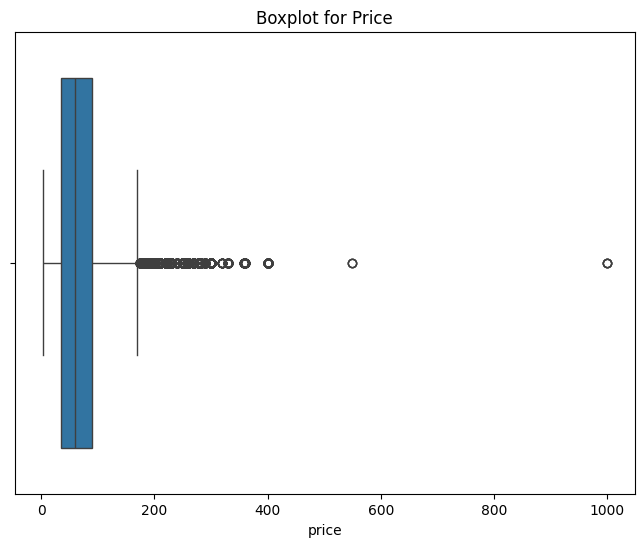

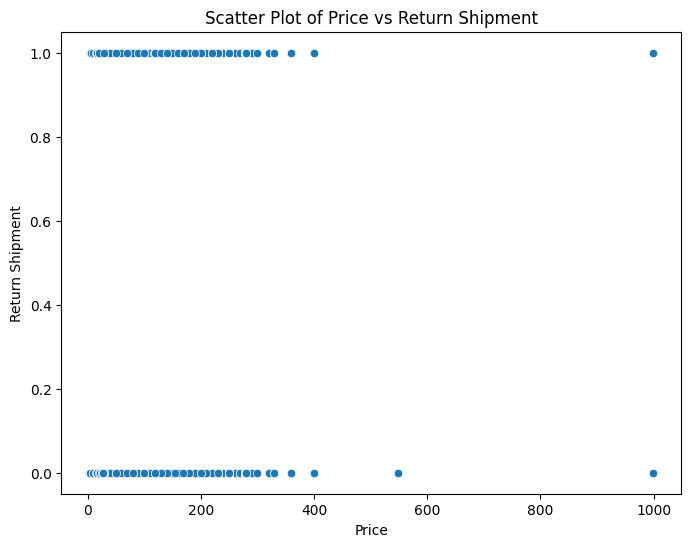

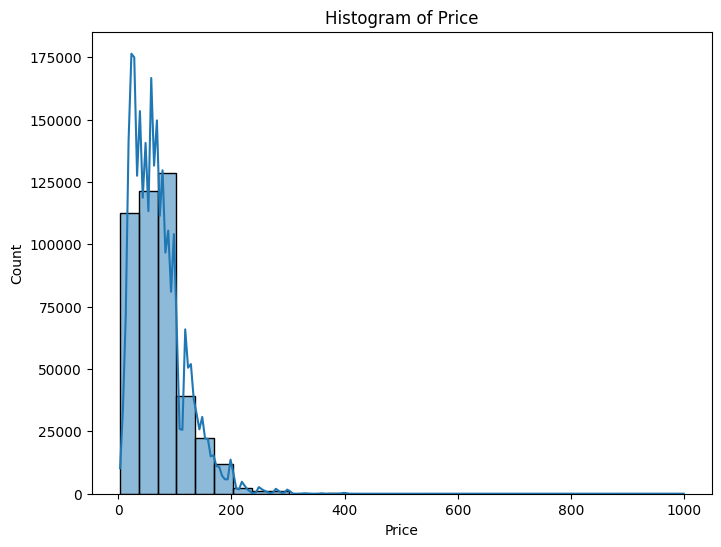

In [ ]:
# Boxplot for "price"
plt.figure(figsize=(8, 6))
sns.boxplot(x=df['price'])
plt.title("Boxplot for Price")
plt.show()

# Scatterplot für "price" vs "returnShipment"
plt.figure(figsize=(8, 6))
sns.scatterplot(x=df['price'], y=df['returnShipment'])
plt.title("Scatter Plot of Price vs Return Shipment")
plt.xlabel("Price")
plt.ylabel("Return Shipment")
plt.show()

# Histogramm für "price" mit Count auf der y-Achse
plt.figure(figsize=(8, 6))
sns.histplot(df['price'], bins=30, kde=True)
plt.title("Histogram of Price")
plt.xlabel("Price")
plt.ylabel("Count")
plt.show()

#plt.hist(df.price, bins=20, rwidth=0.8)
#plt.xlabel( 'price')
#plt. ylabel( 'Count' )
#plt.show()

In [ ]:
# Check for any missing values
df.isnull().sum()

,0
orderItemID,0
orderDate,0
deliveryDate,4568
itemID,0
size,0
color,138
manufacturerID,0
price,1581
customerID,0
salutation,0


In [ ]:
import numpy as np

# Beispiel: Outlier in der Spalte 'price' finden und durch NaN ersetzen
Q1 = df['price'].quantile(0.10)
Q3 = df['price'].quantile(0.90)
IQR = Q3 - Q1

# Definiere die Grenzen für Ausreißer
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Werte außerhalb der Grenzen durch NaN ersetzen
df['price'] = df['price'].apply(lambda x: np.nan if x < lower_bound or x > upper_bound else x)


In [ ]:
df.price.describe()

,price
count,439442.000000
mean,70.007470
std,44.106417
min,3.400000
25%,34.900000
50%,59.900000
75%,89.900000
max,289.900000


In [ ]:
# Check for any missing values
df.isnull().sum()

,0
orderItemID,0
orderDate,0
deliveryDate,4568
itemID,0
size,0
color,138
manufacturerID,0
price,2231
customerID,0
salutation,0


In [ ]:
# Fehlende Werte in 'price' mit dem Median auffüllen
median_price = df['price'].median()
df['price'].fillna(median_price, inplace=True)


In [ ]:
# Check for any missing values
df.isnull().sum()

,0
orderItemID,0
orderDate,0
deliveryDate,4568
itemID,0
size,0
color,138
manufacturerID,0
price,0
customerID,0
salutation,0


In [ ]:
df


,orderItemID,orderDate,deliveryDate,itemID,size,color,manufacturerID,price,customerID,salutation,dateOfBirth,state,creationDate,returnShipment,non_null_delivery_count,unique_delivery_dates,deliveryTime
0,1,2012-04-01,2012-04-03,186,m,denim,25,69.90,794,Mrs,1965-01-06,Baden-Wuerttemberg,2011-04-25,0,3,1,2.0
1,2,2012-04-01,2012-04-03,71,9+,ocher,21,69.95,794,Mrs,1965-01-06,Baden-Wuerttemberg,2011-04-25,1,3,1,2.0
2,3,2012-04-01,2012-04-03,71,9+,curry,21,69.95,794,Mrs,1965-01-06,Baden-Wuerttemberg,2011-04-25,1,3,1,2.0
3,5,2012-04-02,NaT,151,39,black,53,29.90,825,Mrs,1964-07-11,Rhineland-Palatinate,2011-02-16,0,0,0,NaN
4,6,2012-04-02,NaT,598,xxl,brown,87,89.90,825,Mrs,1964-07-11,Rhineland-Palatinate,2011-02-16,0,0,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
441668,481088,2013-03-31,2013-04-09,2561,39+,blue,1,139.90,7032,Mr,1962-12-17,Lower Saxony,2011-03-12,1,2,1,9.0
441669,481089,2013-03-31,2013-04-02,2669,39,grey,18,130.00,86610,Mrs,NaT,Berlin,2012-03-24,0,1,1,2.0
441670,481090,2013-03-31,NaT,2458,XXL,black,5,99.90,86611,Mr,1973-05-16,Berlin,2013-03-31,0,0,0,NaN
441671,481091,2013-03-31,NaT,2659,XXL,black,49,99.90,86611,Mr,1973-05-16,Berlin,2013-03-31,0,0,0,NaN


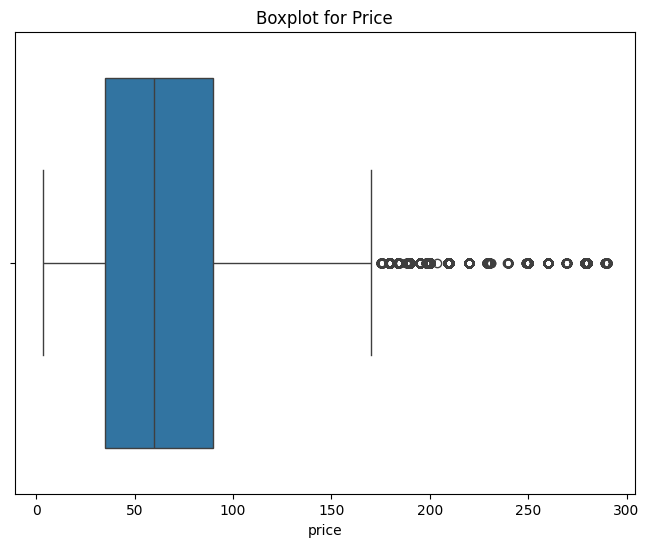

In [ ]:
# Boxplot for "price"
plt.figure(figsize=(8, 6))
sns.boxplot(x=df['price'])
plt.title("Boxplot for Price")
plt.show()

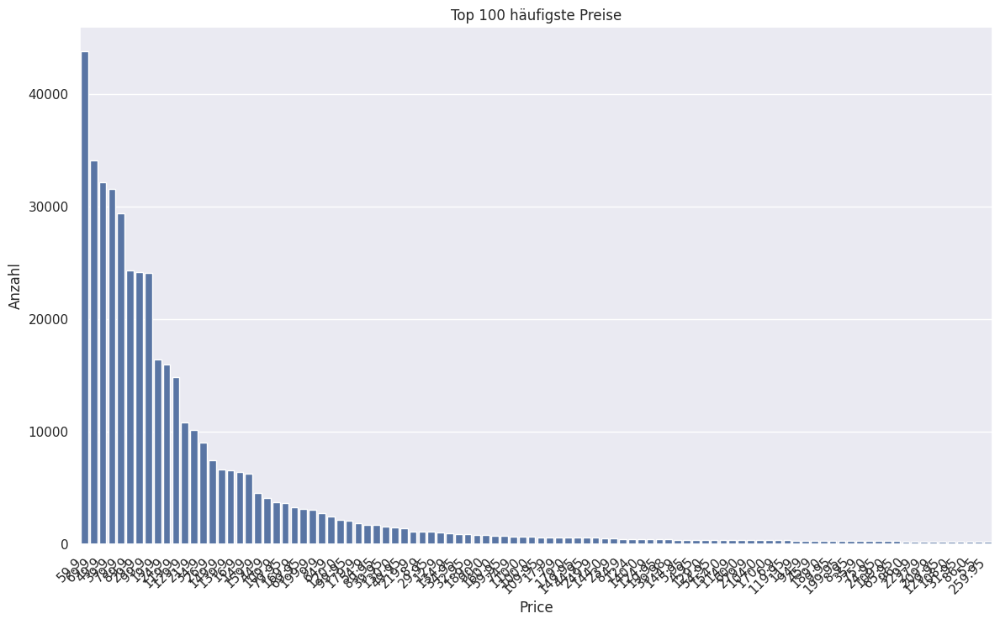

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt


# Top 100 häufigste Preise auswählen
top_100_prices = df['price'].value_counts().reset_index().head(100)
top_100_prices.columns = ['price', 'count']

# Diagramm erstellen
sns.set(rc={'figure.figsize': (14, 8)})
g = sns.barplot(x='price', y='count', data=top_100_prices, order=top_100_prices['price'])

# X-Achsenticks anpassen
g.set_xticklabels(g.get_xticklabels(), rotation=45, horizontalalignment='right')

# Titel und Achsenbeschriftungen hinzufügen
plt.title('Top 100 häufigste Preise')
plt.xlabel('Price')
plt.ylabel('Anzahl')

# Diagramm anzeigen
plt.show()


In [ ]:
unique_prices = df['price'].nunique()
print(f"Anzahl der einzigartigen Preise: {unique_prices}")


Anzahl der einzigartigen Preise: 364


In [ ]:
unique_price_list = df['price'].unique()
sorted_price_list = sorted(unique_price_list)
print(sorted_price_list)


[3.4, 3.95, 4.4, 4.5, 4.9, 4.95, 5.5, 5.95, 6.5, 6.9, 6.95, 7.4, 7.45, 7.9, 7.95, 8.0, 8.23, 8.5, 8.9, 8.95, 9.4, 9.9, 9.95, 10.0, 10.95, 11.9, 12.4, 12.45, 12.57, 12.9, 12.95, 13.45, 13.78, 13.9, 13.95, 14.9, 14.95, 15.63, 15.9, 15.91, 15.95, 16.4, 16.9, 16.95, 17.4, 17.45, 17.9, 18.41, 18.9, 18.91, 19.0, 19.9, 19.95, 20.0, 20.66, 20.95, 21.9, 22.4, 22.45, 22.9, 22.95, 23.03, 23.9, 24.9, 24.95, 25.0, 25.45, 25.9, 25.95, 26.25, 26.9, 27.45, 27.48, 27.66, 27.9, 28.41, 28.9, 28.95, 29.9, 29.94, 29.95, 30.45, 30.48, 30.9, 31.95, 32.33, 32.4, 32.45, 32.48, 32.9, 32.95, 33.0, 33.16, 34.9, 34.95, 35.0, 35.45, 35.9, 35.95, 36.91, 36.95, 37.4, 37.45, 37.9, 37.95, 39.0, 39.9, 39.95, 39.98, 40.0, 40.95, 42.0, 42.4, 42.9, 42.95, 44.9, 44.95, 45.0, 45.9, 45.95, 46.16, 46.2, 46.25, 46.91, 47.4, 47.41, 47.9, 47.95, 48.0, 48.95, 49.9, 49.95, 49.98, 50.0, 50.83, 51.91, 52.95, 53.9, 53.95, 54.0, 54.1, 54.9, 54.95, 55.41, 55.45, 55.9, 55.95, 56.41, 56.91, 56.95, 57.5, 57.95, 58.95, 59.9, 59.95, 60.0, 60

### 2. deliveryTime

In [ ]:
df.deliveryTime.describe()

,deliveryTime
count,437105.000000
mean,10.773862
std,17.982183
min,1.000000
25%,2.000000
50%,3.000000
75%,8.000000
max,175.000000


In [ ]:
df.deliveryTime.info()

<class 'pandas.core.series.Series'>
RangeIndex: 441673 entries, 0 to 441672
Series name: deliveryTime
Non-Null Count   Dtype  
--------------   -----  
437105 non-null  float64
dtypes: float64(1)
memory usage: 3.4 MB


In [ ]:

# Check for any missing values
df.isnull().sum()

,0
orderItemID,0
orderDate,0
deliveryDate,4568
itemID,0
size,0
color,138
manufacturerID,0
price,0
customerID,0
salutation,0


In [ ]:
zero_deliveryTime_count = df[df['deliveryTime'] == 0].shape[0]
print(f"Anzahl der 0 day-deliveryTime: {zero_deliveryTime_count}")


Anzahl der 0 day-deliveryTime: 0


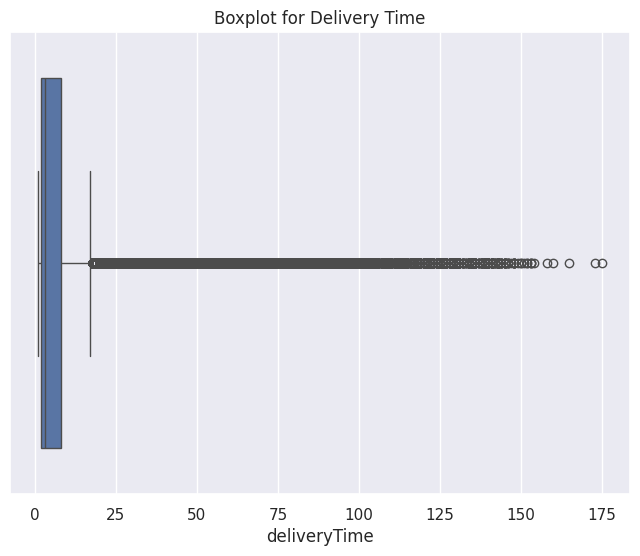

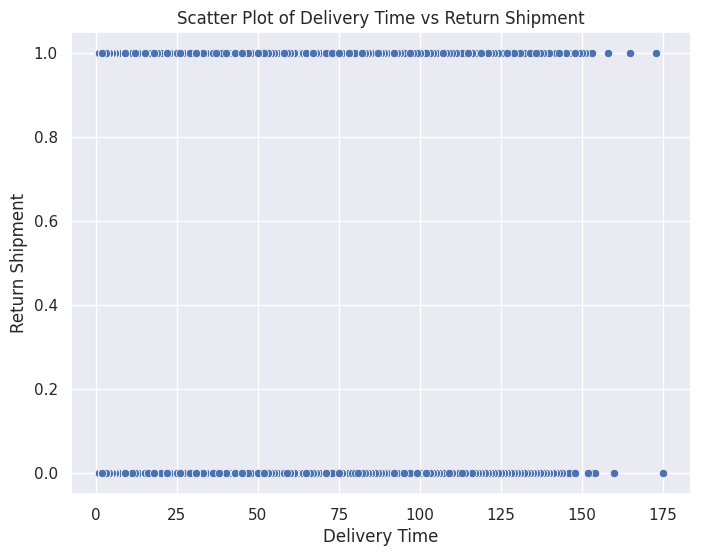

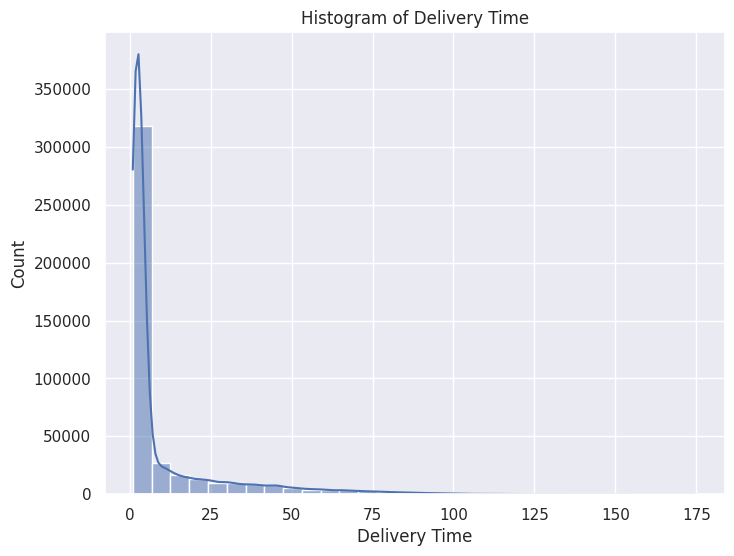

In [ ]:
# Boxplot for "deliveryTime"
plt.figure(figsize=(8, 6))
sns.boxplot(x=df['deliveryTime'])
plt.title("Boxplot for Delivery Time")
plt.show()
# Scatterplot für "deliveryTime" vs "returnShipment"
plt.figure(figsize=(8, 6))
sns.scatterplot(x=df['deliveryTime'], y=df['returnShipment'])
plt.title("Scatter Plot of Delivery Time vs Return Shipment")
plt.xlabel("Delivery Time")
plt.ylabel("Return Shipment")
plt.show()
# Histogramm für "deliveryTime"
plt.figure(figsize=(8, 6))
sns.histplot(df['deliveryTime'], bins=30, kde=True)
plt.title("Histogram of Delivery Time")
plt.xlabel("Delivery Time")
plt.ylabel("Count")
plt.show()

In [ ]:
# Check for any missing values
df.isnull().sum()

,0
orderItemID,0
orderDate,0
deliveryDate,4568
itemID,0
size,0
color,138
manufacturerID,0
price,0
customerID,0
salutation,0


#### Find outlier in column 'price' and replace with NaN


In [ ]:
import numpy as np

# Calculate the interquartile range (IQR) for 'deliveryTime'
Q1 = df['deliveryTime'].quantile(0.25)
Q3 = df['deliveryTime'].quantile(0.75)
IQR = Q3 - Q1

# Define the limits for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Replace values ​​outside the limits with NaN
df['deliveryTime'] = df['deliveryTime'].apply(lambda x: np.nan if x < lower_bound or x > upper_bound else x)


In [ ]:
# Check for any missing values
df.isnull().sum()

,0
orderItemID,0
orderDate,0
deliveryDate,4568
itemID,0
size,0
color,138
manufacturerID,0
price,0
customerID,0
salutation,0


In [ ]:
df.deliveryTime.describe()

,deliveryTime
count,359094.000000
mean,3.687642
std,3.160591
min,1.000000
25%,2.000000
50%,3.000000
75%,4.000000
max,17.000000


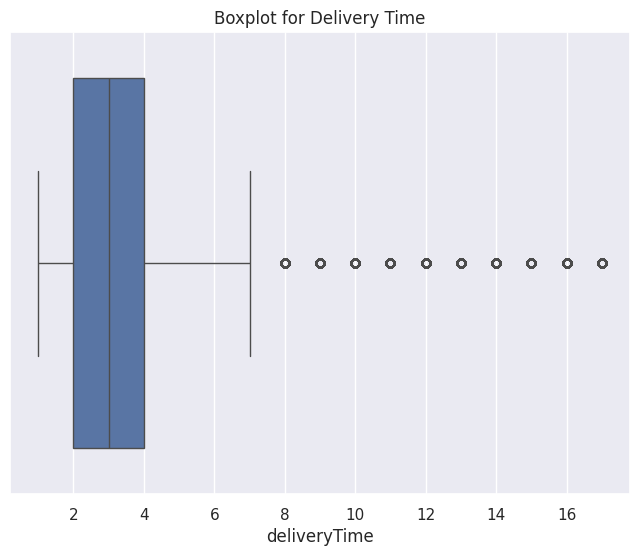

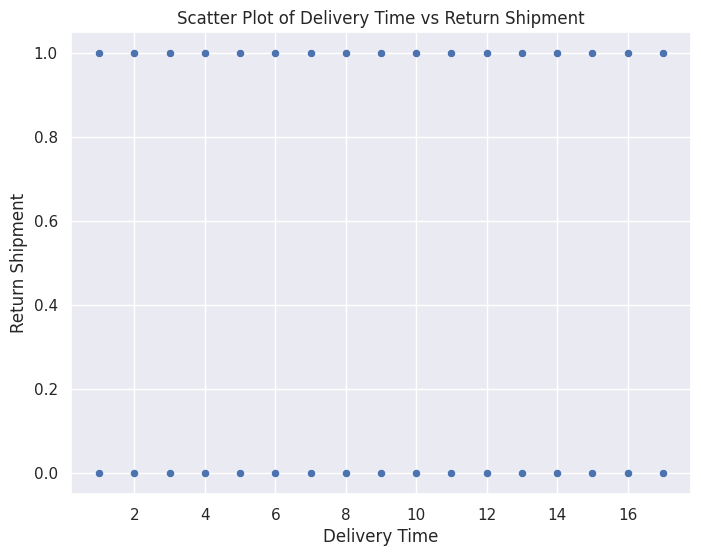

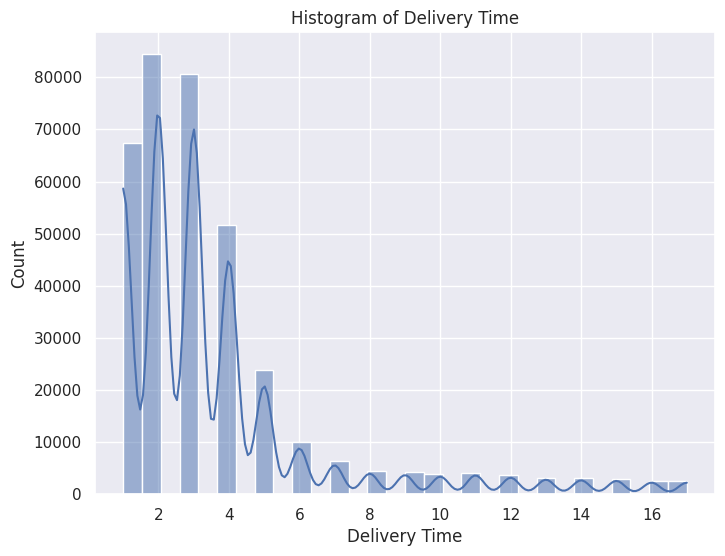

In [ ]:
# Boxplot for "deliveryTime"
plt.figure(figsize=(8, 6))
sns.boxplot(x=df['deliveryTime'])
plt.title("Boxplot for Delivery Time")
plt.show()
# Scatterplot für "deliveryTime" vs "returnShipment"
plt.figure(figsize=(8, 6))
sns.scatterplot(x=df['deliveryTime'], y=df['returnShipment'])
plt.title("Scatter Plot of Delivery Time vs Return Shipment")
plt.xlabel("Delivery Time")
plt.ylabel("Return Shipment")
plt.show()
# Histogramm für "deliveryTime"
plt.figure(figsize=(8, 6))
sns.histplot(df['deliveryTime'], bins=30, kde=True)
plt.title("Histogram of Delivery Time")
plt.xlabel("Delivery Time")
plt.ylabel("Count")
plt.show()

In [ ]:
# Fill missing values ​​in 'deliveryTime' with the median
median_deliveryTime = df['deliveryTime'].median()
df['deliveryTime'].fillna(median_deliveryTime, inplace=True)

In [ ]:
# Check for any missing values
df.isnull().sum()

,0
orderItemID,0
orderDate,0
deliveryDate,4568
itemID,0
size,0
color,138
manufacturerID,0
price,0
customerID,0
salutation,0


In [ ]:
df.deliveryTime.describe()

,deliveryTime
count,441673.000000
mean,3.559074
std,2.862432
min,1.000000
25%,2.000000
50%,3.000000
75%,4.000000
max,17.000000


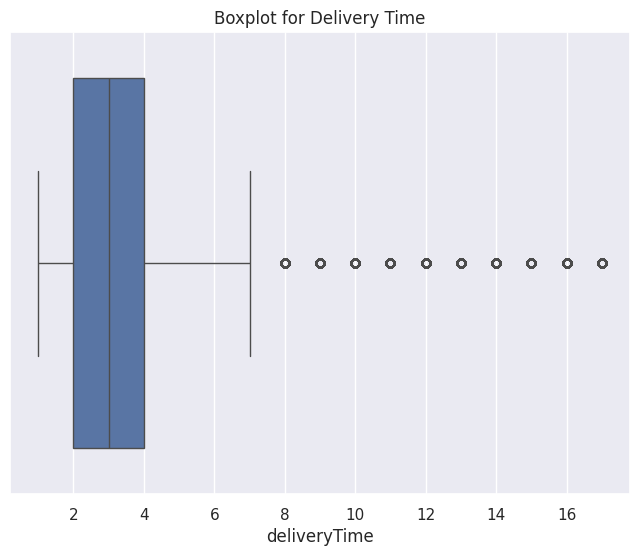

In [ ]:
# Boxplot for "deliveryTime"
plt.figure(figsize=(8, 6))
sns.boxplot(x=df['deliveryTime'])
plt.title("Boxplot for Delivery Time")
plt.show()

In [ ]:
df.deliveryTime.describe()

,deliveryTime
count,441673.000000
mean,3.559074
std,2.862432
min,1.000000
25%,2.000000
50%,3.000000
75%,4.000000
max,17.000000


In [ ]:
import numpy as np
"""
# Calculate again the interquartile range (IQR) for 'deliveryTime'
Q1_delivery = df['deliveryTime'].quantile(0.25)
Q3_delivery = df['deliveryTime'].quantile(0.75)
IQR_delivery = Q3_delivery - Q1_delivery

# Set the limits for acceptable values
lower_bound_delivery = Q1_delivery - 1.5 * IQR_delivery
upper_bound_delivery = Q3_delivery + 1.5 * IQR_delivery

# Replace values ​​outside the limits with NaN
df['deliveryTime'] = df['deliveryTime'].apply(lambda x: np.nan if x < lower_bound_delivery or x > upper_bound_delivery else x)


# Ausgabe der aktualisierten Statistik, um zu überprüfen, ob die Ausreißer entfernt wurden
df.deliveryTime.describe()
"""

"\n# Calculate again the interquartile range (IQR) for 'deliveryTime'\nQ1_delivery = df['deliveryTime'].quantile(0.25)\nQ3_delivery = df['deliveryTime'].quantile(0.75)\nIQR_delivery = Q3_delivery - Q1_delivery\n\n# Set the limits for acceptable values\nlower_bound_delivery = Q1_delivery - 1.5 * IQR_delivery\nupper_bound_delivery = Q3_delivery + 1.5 * IQR_delivery\n\n# Replace values \u200b\u200boutside the limits with NaN\ndf['deliveryTime'] = df['deliveryTime'].apply(lambda x: np.nan if x < lower_bound_delivery or x > upper_bound_delivery else x)\n\n\n# Ausgabe der aktualisierten Statistik, um zu überprüfen, ob die Ausreißer entfernt wurden\ndf.deliveryTime.describe()\n"

In [ ]:

# Fill missing values ​​in 'deliveryTime' with the median
#median_deliveryTime = df['deliveryTime'].median()
#df['deliveryTime'].fillna(median_deliveryTime, inplace=True)

In [ ]:
#df.deliveryTime.info()

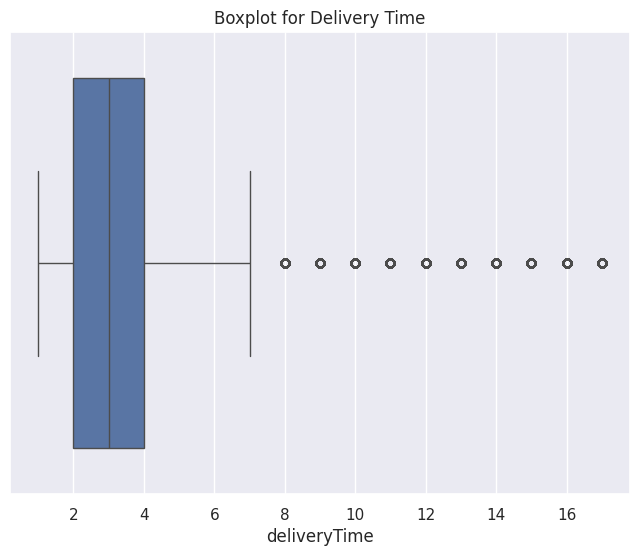

In [ ]:
# Boxplot for "deliveryTime"
plt.figure(figsize=(8, 6))
sns.boxplot(x=df['deliveryTime'])
plt.title("Boxplot for Delivery Time")
plt.show()

In [ ]:
# Sicherstellen, dass deliveryTime und orderDate korrekt formatiert sind
df['orderDate'] = pd.to_datetime(df['orderDate'], errors='coerce')
df['deliveryTime'] = pd.to_numeric(df['deliveryTime'], errors='coerce')

# Füllen der fehlenden Werte in deliveryDate
df['deliveryDate'] = df.apply(
    lambda row: row['orderDate'] + pd.to_timedelta(row['deliveryTime'], unit='D')
    if pd.isnull(row['deliveryDate']) and not pd.isnull(row['orderDate']) and not pd.isnull(row['deliveryTime'])
    else row['deliveryDate'],
    axis=1
)

# Überprüfen, ob die fehlenden Werte gefüllt wurden
remaining_nan = df['deliveryDate'].isnull().sum()
print(f"Anzahl der verbleibenden fehlenden Werte in deliveryDate: {remaining_nan}")

# Anzeige der aktualisierten Daten (optional)
print(df[['customerID', 'itemID', 'orderDate', 'deliveryTime', 'deliveryDate']].head())


Anzahl der verbleibenden fehlenden Werte in deliveryDate: 0
   customerID  itemID  orderDate  deliveryTime deliveryDate
0         794     186 2012-04-01           2.0   2012-04-03
1         794      71 2012-04-01           2.0   2012-04-03
2         794      71 2012-04-01           2.0   2012-04-03
3         825     151 2012-04-02           3.0   2012-04-05
4         825     598 2012-04-02           3.0   2012-04-05


In [ ]:

#filtered_df12 = df13[(df13['deliveryDate'] == 'nan') ]
#df13_missing_delivery = df13[df13['deliveryDate'].isnull()]
#filtered_df12 = df13[(df13['customerID'] == 1317)& (df13['orderDate'] == '2012-04-01')]
#filtered_df12 = df13[(df13['customerID'] == 7824)& (df13['orderDate'] == '2013-03-31')]
#filtered_df12 = df13[(df13['customerID'] == 1360)& (df13['orderDate'] == '2012-04-01')]
#filtered_df12 = df13[(df13['customerID'] == 4390)& (df13['orderDate'] == '2013-03-31')]
filtered_df12 = df[(df['customerID'] == 1710)& (df['orderDate'] == '2012-04-01')]
#filtered_df12 = df[(df['customerID'] == 808)& (df['orderDate'] == '2012-04-02')]
#86558 2013-03-31
# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['customerID', 'itemID', 'orderDate','deliveryDate']]



,itemID,price,highest_price_item,discount_percentage,price_rank
73711,346,69.9,69.9,0.000000,10.0
73712,568,59.9,59.9,0.000000,6.0
73713,568,59.9,59.9,0.000000,6.0
73714,28,24.9,39.9,0.375940,2.0
73715,2,24.9,39.9,0.375940,2.0
73716,32,12.9,24.9,0.481928,1.0
73717,28,24.9,39.9,0.375940,2.0
73720,28,39.9,39.9,0.000000,5.0
73721,33,59.9,69.9,0.143062,6.0
73722,33,59.9,69.9,0.143062,6.0


### 2. dateOfBirth and Calculate Age
https://www.destatis.de/DE/Themen/Gesellschaft-Umwelt/Einkommen-Konsum-Lebensbedingungen/IT-Nutzung/Tabellen/onlineeinkaeufe-privatezwecke-alter-mz-ikt.html

In [ ]:
# Count the rows where deliveryDate is equal to orderDate
matching_count = df[df['dateOfBirth'] == df['orderDate']].shape[0]

# Display the count
print(f"Number of rows where dateOfBirth is equal to orderDate: {matching_count}")


Number of rows where dateOfBirth is equal to orderDate: 0


In [ ]:

# Assuming your DataFrame is named df and 'orderDate' and 'dateOfBirth' are in datetime format

# Convert 'dateOfBirth' to datetime if not already in datetime format

# Step 1: Calculate the average age in years
# Create a temporary column 'age' by subtracting dateOfBirth from orderDate and converting to years
df['age'] = (df['orderDate'] - df['dateOfBirth']).dt.days / 365.25

# Calculate the mean age, ignoring NaN values
mean_age = df['age'].mean()

# Step 2: Fill NaN values in 'age' column with the mean age
df['age'].fillna(mean_age, inplace=True)

# Step 3: Convert 'age' to integer
df['age'] = df['age'].astype(int)

# Step 4: Fill missing 'dateOfBirth' using the mean age
# Replace missing dateOfBirth with an estimated birth date calculated as orderDate - mean_age in days
df.loc[df['dateOfBirth'].isna(), 'dateOfBirth'] = df['orderDate'] - pd.to_timedelta(mean_age * 365.25, unit='D')

# Check the result
df


,orderItemID,orderDate,deliveryDate,itemID,size,color,manufacturerID,price,customerID,salutation,dateOfBirth,state,creationDate,returnShipment,non_null_delivery_count,unique_delivery_dates,deliveryTime,age
0,1,2012-04-01,2012-04-03,186,m,denim,25,69.90,794,Mrs,1965-01-06 00:00:00.000000000,Baden-Wuerttemberg,2011-04-25,0,3,1,2.0,47
1,2,2012-04-01,2012-04-03,71,9+,ocher,21,69.95,794,Mrs,1965-01-06 00:00:00.000000000,Baden-Wuerttemberg,2011-04-25,1,3,1,2.0,47
2,3,2012-04-01,2012-04-03,71,9+,curry,21,69.95,794,Mrs,1965-01-06 00:00:00.000000000,Baden-Wuerttemberg,2011-04-25,1,3,1,2.0,47
3,5,2012-04-02,2012-04-05,151,39,black,53,29.90,825,Mrs,1964-07-11 00:00:00.000000000,Rhineland-Palatinate,2011-02-16,0,0,0,3.0,47
4,6,2012-04-02,2012-04-05,598,xxl,brown,87,89.90,825,Mrs,1964-07-11 00:00:00.000000000,Rhineland-Palatinate,2011-02-16,0,0,0,3.0,47
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
441668,481088,2013-03-31,2013-04-09,2561,39+,blue,1,139.90,7032,Mr,1962-12-17 00:00:00.000000000,Lower Saxony,2011-03-12,1,2,1,9.0,50
441669,481089,2013-03-31,2013-04-02,2669,39,grey,18,130.00,86610,Mrs,1964-09-21 19:31:16.258071839,Berlin,2012-03-24,0,1,1,2.0,48
441670,481090,2013-03-31,2013-04-03,2458,XXL,black,5,99.90,86611,Mr,1973-05-16 00:00:00.000000000,Berlin,2013-03-31,0,0,0,3.0,39
441671,481091,2013-03-31,2013-04-03,2659,XXL,black,49,99.90,86611,Mr,1973-05-16 00:00:00.000000000,Berlin,2013-03-31,0,0,0,3.0,39


In [ ]:
# Check for any missing values
df.isnull().sum()

,0
orderItemID,0
orderDate,0
deliveryDate,0
itemID,0
size,0
color,138
manufacturerID,0
price,0
customerID,0
salutation,0


In [ ]:
df.age.describe()

,age
count,441673.000000
mean,48.022512
std,10.461917
min,0.000000
25%,43.000000
50%,48.000000
75%,52.000000
max,112.000000


In [ ]:
df.age.describe()

,age
count,441673.000000
mean,48.022512
std,10.461917
min,0.000000
25%,43.000000
50%,48.000000
75%,52.000000
max,112.000000


In [ ]:
zero_price_count = df[df['age'] == 0].shape[0]
print(f"number of 0 year age: {zero_price_count}")

number of 0 year age: 23


In [ ]:
# Convert 0 € prices to NaN
df['age'] = df['age'].replace(0, np.nan)


In [ ]:
# Check for any missing values
df.isnull().sum()

,0
orderItemID,0
orderDate,0
deliveryDate,0
itemID,0
size,0
color,138
manufacturerID,0
price,0
customerID,0
salutation,0


In [ ]:
df.age.describe()

,age
count,441650.000000
mean,48.025013
std,10.456448
min,1.000000
25%,43.000000
50%,48.000000
75%,52.000000
max,112.000000


In [ ]:
zero_price_count = df[df['age'] <= 15].shape[0]
print(f"number of age <= 18 year : {zero_price_count}")

number of age <= 18 year : 244


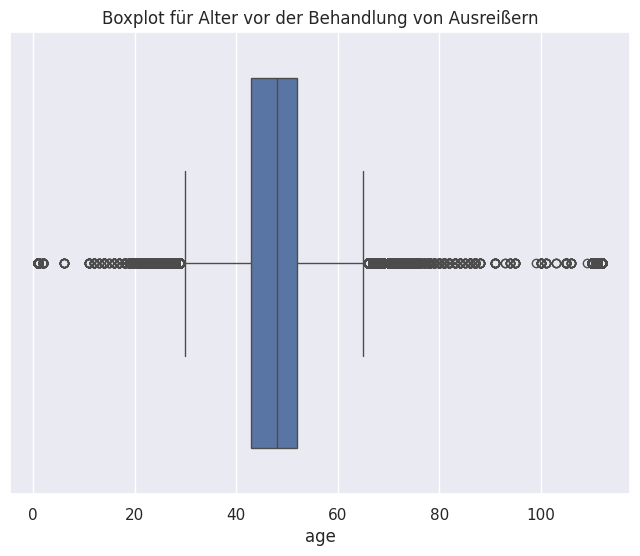

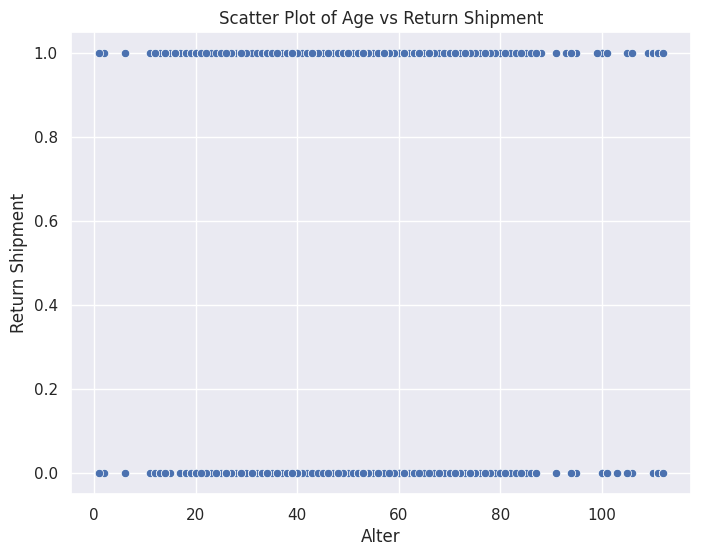

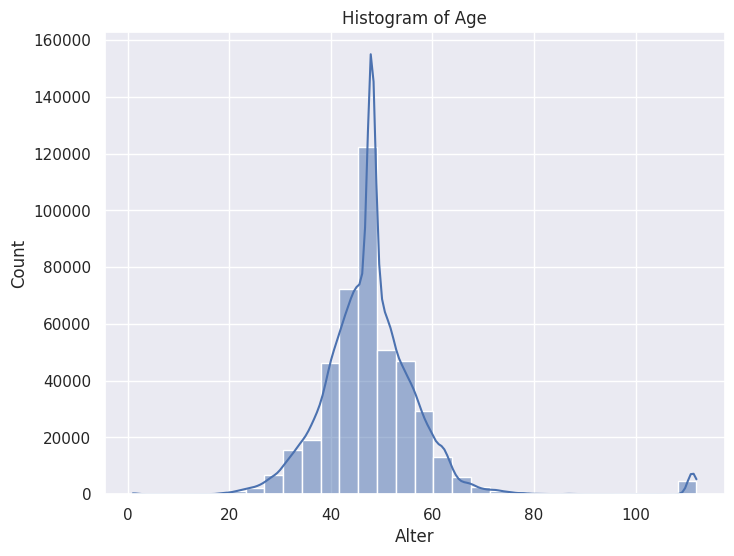

In [ ]:
# Boxplot for "age"
plt.figure(figsize=(8, 6))
sns.boxplot(x=df['age'])
plt.title("Boxplot für Alter vor der Behandlung von Ausreißern")
plt.show()

# Scatterplot für "age" vs "returnShipment"
plt.figure(figsize=(8, 6))
sns.scatterplot(x=df['age'], y=df['returnShipment'])
plt.title("Scatter Plot of Age vs Return Shipment")
plt.xlabel("Alter")
plt.ylabel("Return Shipment")
plt.show()

# Histogramm fo "age" mit Count auf der y-Achse
plt.figure(figsize=(8, 6))
sns.histplot(df['age'], bins=30, kde=True)
plt.title("Histogram of Age")
plt.xlabel("Alter")
plt.ylabel("Count")
plt.show()

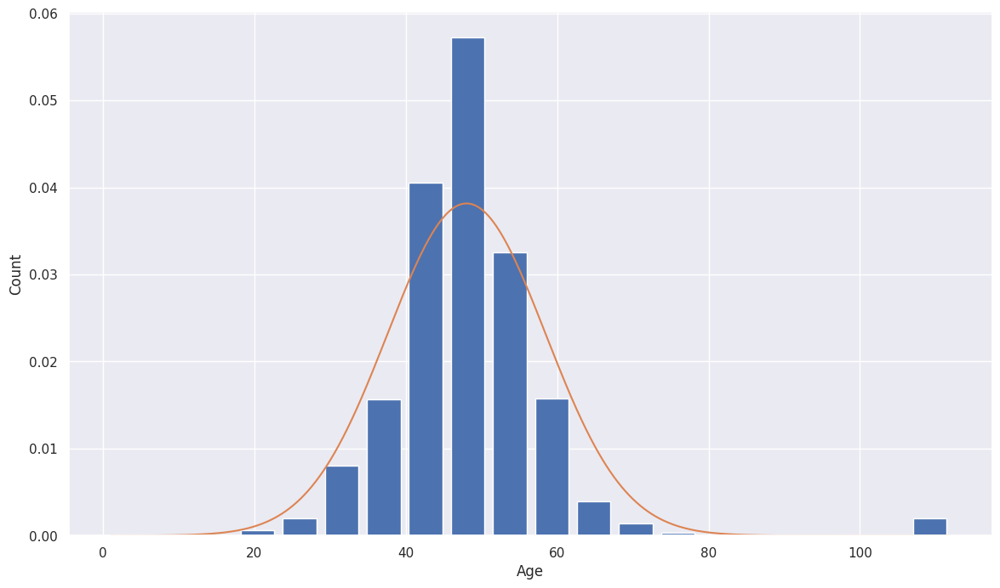

In [ ]:
from scipy.stats import norm
import numpy as np
plt.hist(df.age, bins=20, rwidth=0.8, density=True)
plt.xlabel('Age')
plt.ylabel('Count')

rng = np.arange(df.age.min(), df.age.max(), 0.1)
plt.plot(rng, norm.pdf(rng,df.age.mean(),df.age.std()))

In [ ]:
upper_limit = df.age.mean() + 3*df.age.std()
upper_limit

79.39435681270962

In [ ]:
lower_limit = df.age.mean() -3*df.age.std()
lower_limit

16.655669226008825

In [ ]:
df[(df.age>upper_limit) | (df.age<lower_limit)]

,orderItemID,orderDate,deliveryDate,itemID,size,color,manufacturerID,price,customerID,salutation,dateOfBirth,state,creationDate,returnShipment,non_null_delivery_count,unique_delivery_dates,deliveryTime,age
74,80,2012-04-02,2012-04-26,239,unsized,brown,60,59.90,50,Mrs,1900-11-19,Baden-Wuerttemberg,2011-11-06,0,1,1,3.0,111.0
346,375,2012-04-01,2012-04-03,116,xl,brown,5,99.90,1214,Mr,1927-04-10,North Rhine-Westphalia,2011-03-18,0,1,1,2.0,84.0
534,571,2012-04-01,2012-04-04,287,38,blue,61,49.90,1317,Mrs,1900-11-19,Bavaria,2011-11-03,0,5,3,3.0,111.0
535,572,2012-04-01,2012-04-04,287,37,blue,61,49.90,1317,Mrs,1900-11-19,Bavaria,2011-11-03,1,5,3,3.0,111.0
536,573,2012-04-01,2012-04-04,54,l,denim,30,32.95,1317,Mrs,1900-11-19,Bavaria,2011-11-03,0,5,3,3.0,111.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
441262,480649,2013-03-31,2013-05-22,2414,M,black,14,69.90,41216,Mrs,1900-11-19,Berlin,2011-10-06,1,5,4,3.0,112.0
441499,480904,2013-03-31,2013-05-22,2720,36,blue,14,59.90,39508,Mrs,1900-11-19,Schleswig-Holstein,2011-09-23,1,4,4,3.0,112.0
441500,480905,2013-03-31,2013-06-21,2430,S,olive,11,79.90,39508,Mrs,1900-11-19,Schleswig-Holstein,2011-09-23,1,4,4,3.0,112.0
441501,480906,2013-03-31,2013-07-01,2423,S,denim,28,89.90,39508,Mrs,1900-11-19,Schleswig-Holstein,2011-09-23,1,4,4,3.0,112.0


In [ ]:
# Define the limits for acceptable values ​​in 'age'
upper_limit_age = df['age'].mean() + 3 * df['age'].std()
lower_limit_age = df['age'].mean() - 3 * df['age'].std()

# Replace outliers with NaN
df['age'] = df['age'].apply(lambda x: np.nan if x > upper_limit_age or x < lower_limit_age else x)  #df[(df.age>upper_limit) | (df.age<lower_limit)]

# Check
print(f"Number of NaN values ​​in 'age' after outlier treatment: {df['age'].isna().sum()}")


Number of NaN values ​​in 'age' after outlier treatment: 5374


In [ ]:
df.age.info()


<class 'pandas.core.series.Series'>
RangeIndex: 441673 entries, 0 to 441672
Series name: age
Non-Null Count   Dtype  
--------------   -----  
436299 non-null  float64
dtypes: float64(1)
memory usage: 3.4 MB


In [ ]:
# Fill missing values ​​in 'deliveryTime' with the median
median_age = df['age'].median()
df['age'].fillna(median_age, inplace=True)


In [ ]:
# Check if all missing values ​​have been filled
df.age.isna().sum()

0

In [ ]:
df.describe()

,orderItemID,orderDate,deliveryDate,itemID,manufacturerID,price,customerID,dateOfBirth,creationDate,returnShipment,non_null_delivery_count,unique_delivery_dates,deliveryTime,age
count,441673.000000,441673,441673,441673.000000,441673.000000,441673.000000,441673.000000,441673,441673,441673.000000,441673.000000,441673.000000,441673.000000,441673.000000
mean,243054.113817,2012-10-13 15:23:30.883617536,2012-10-24 08:02:05.913968128,1416.248546,29.907321,69.956415,33503.744512,1964-04-06 10:54:47.141688896,2011-12-28 03:12:59.520595456,0.525482,6.035087,1.957763,3.559074,47.336896
min,1.000000,2012-04-01 00:00:00,2012-04-03 00:00:00,1.000000,1.000000,3.400000,6.000000,1900-11-19 00:00:00,2011-02-16 00:00:00,0.000000,0.000000,0.000000,1.000000,17.000000
25%,124597.000000,2012-07-02 00:00:00,2012-07-16 00:00:00,346.000000,5.000000,34.900000,12930.000000,1960-02-27 00:00:00,2011-02-16 00:00:00,0.000000,3.000000,1.000000,2.000000,43.000000
50%,243225.000000,2012-10-09 00:00:00,2012-10-24 00:00:00,1581.000000,23.000000,59.900000,28547.000000,1964-07-14 19:31:16.258071840,2012-02-12 00:00:00,1.000000,5.000000,1.000000,3.000000,48.000000
75%,363836.000000,2013-01-25 00:00:00,2013-02-06 00:00:00,2345.000000,43.000000,89.900000,51284.000000,1969-08-25 00:00:00,2012-08-06 00:00:00,1.000000,8.000000,3.000000,4.000000,52.000000
max,481092.000000,2013-03-31 00:00:00,2013-07-22 00:00:00,3070.000000,166.000000,289.900000,86611.000000,2013-06-27 00:00:00,2013-03-31 00:00:00,1.000000,73.000000,9.000000,17.000000,79.000000
std,138860.622352,NaN,NaN,928.640630,30.165522,44.000714,24025.817923,NaN,NaN,0.499351,5.199948,1.284599,2.862432,7.955460


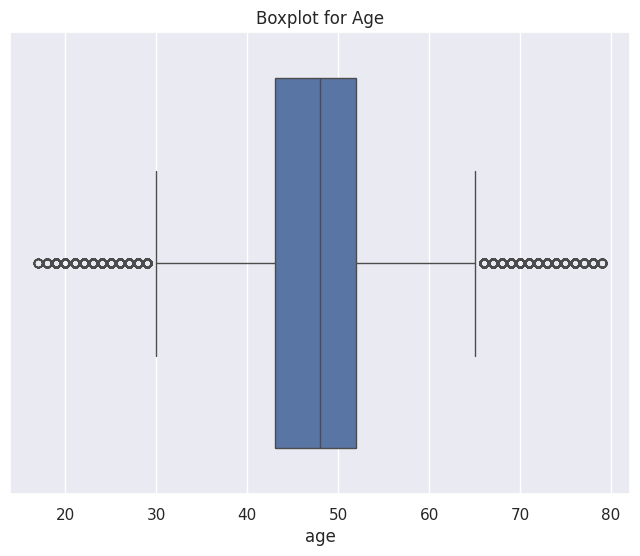

In [ ]:
# Boxplot for "age"
plt.figure(figsize=(8, 6))
sns.boxplot(x=df['age'])
plt.title("Boxplot for Age")
plt.show()

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 441673 entries, 0 to 441672
Data columns (total 18 columns):
 #   Column                   Non-Null Count   Dtype         
---  ------                   --------------   -----         
 0   orderItemID              441673 non-null  int64         
 1   orderDate                441673 non-null  datetime64[ns]
 2   deliveryDate             441673 non-null  datetime64[ns]
 3   itemID                   441673 non-null  int64         
 4   size                     441673 non-null  category      
 5   color                    441535 non-null  category      
 6   manufacturerID           441673 non-null  int64         
 7   price                    441673 non-null  float64       
 8   customerID               441673 non-null  int64         
 9   salutation               441673 non-null  category      
 10  dateOfBirth              441673 non-null  datetime64[ns]
 11  state                    441673 non-null  category      
 12  creationDate    

In [ ]:
df.age.describe()

,age
count,441673.000000
mean,47.336896
std,7.955460
min,17.000000
25%,43.000000
50%,48.000000
75%,52.000000
max,79.000000


### Color

In [ ]:
df.color.value_counts()

,count
color,
black,79834
blue,44353
grey,38876
red,35493
green,29958
...,...
lemon,4
cortina mocca,3
perlmutt,3


In [ ]:
df.color.isna().sum()

138

In [ ]:
# Replace missing values in 'color' with the standard value "black"
df['color'] = df['color'].fillna("black")

# Check the result
df['color'].unique()


['denim', 'ocher', 'curry', 'black', 'brown', ..., 'oliv', 'bronze', 'crimson', 'lemon', 'perlmutt']
Length: 87
Categories (87, object): ['almond', 'amethyst', 'ancient', 'anthracite', ..., 'turquoise',
                          'vanille', 'white', 'yellow']

In [ ]:
# Check for any missing values
df.isnull().sum()

,0
orderItemID,0
orderDate,0
deliveryDate,0
itemID,0
size,0
color,0
manufacturerID,0
price,0
customerID,0
salutation,0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 441673 entries, 0 to 441672
Data columns (total 18 columns):
 #   Column                   Non-Null Count   Dtype         
---  ------                   --------------   -----         
 0   orderItemID              441673 non-null  int64         
 1   orderDate                441673 non-null  datetime64[ns]
 2   deliveryDate             441673 non-null  datetime64[ns]
 3   itemID                   441673 non-null  int64         
 4   size                     441673 non-null  category      
 5   color                    441673 non-null  category      
 6   manufacturerID           441673 non-null  int64         
 7   price                    441673 non-null  float64       
 8   customerID               441673 non-null  int64         
 9   salutation               441673 non-null  category      
 10  dateOfBirth              441673 non-null  datetime64[ns]
 11  state                    441673 non-null  category      
 12  creationDate    

In [ ]:
print(df.isnull().sum())


orderItemID                0
orderDate                  0
deliveryDate               0
itemID                     0
size                       0
color                      0
manufacturerID             0
price                      0
customerID                 0
salutation                 0
dateOfBirth                0
state                      0
creationDate               0
returnShipment             0
non_null_delivery_count    0
unique_delivery_dates      0
deliveryTime               0
age                        0
dtype: int64


In [ ]:
# Überprüfen Sie, ob df13 ein DataFrame ist
if isinstance(df, pd.DataFrame):
    # Überprüfen, ob die Spalte 'color' in df13 vorhanden ist
    if 'color' in df.columns:
        # Einzigartige Farben sortieren und anzeigen
        unique_colors = sorted(df['color'].dropna().unique())
        print("Alphabetisch sortierte Farben:")
        for color in unique_colors:
            print(color)
    else:
        print("Die Spalte 'color' ist in df13 nicht vorhanden.")
else:
    print(f"df13 ist kein DataFrame, sondern ein {type(df)}.")


Alphabetisch sortierte Farben:
almond
amethyst
ancient
anthracite
antique pink
apricot
aqua
aquamarine
ash
aubergine
aviator
avocado
azure
baltic blue
basalt
beige
berry
black
blau
blue
bordeaux
bronze
brown
brwon
caramel
champagner
cobalt blue
cognac
copper coin
coral
cortina mocca
creme
crimson
curled
currant purple
curry
dark denim
dark garnet
dark grey
dark navy
dark oliv
darkblue
denim
ebony
ecru
floral
fuchsia
gold
graphite
green
grey
habana
hibiscus
ingwer
iron
ivory
jade
kanel
khaki
lemon
leopard
magenta
mahagoni
mango
mint
mocca
nature
navy
ocher
oliv
olive
opal
orange
pallid
perlmutt
petrol
pink
purple
red
silver
stained
striped
terracotta
turquoise
vanille
white
yellow


In [ ]:
# Sicherstellen, dass die Spalte 'color' Strings enthält
df['color'] = df['color'].astype(str)

# Dictionary mit falsch geschriebenen Farben als Schlüssel und den Korrekturen als Werte
color_corrections = {
    'blau': 'blue',
    'brwon': 'brown',
    'darkblue': 'dark blue',
    'dark oliv': 'dark olive',
    'oliv': 'olive',
    'perlmutt': 'pearl',
    'mocca': 'mocha',
    'habana': 'havana',
    'dark garnet': 'garnet',
    'creme': 'cream',
    'champagner': 'champagne',
    'cortina mocca': 'mocha',
    'currant purple': 'currant violet',
    'cobalt blue': 'dark cobalt blue',
    'kanel': 'cinnamon',
    'mahagoni': 'mahogany',
    'floral': 'floral white',
    'vanille': 'vanilla',
    'ingwer': 'ginger',
    'pallid': 'pallid blue',
    'stained': 'stained glass',
    'curled': 'curlew'
}

# Eine Funktion, um die Farben basierend auf dem Dictionary zu korrigieren
def correct_colors(color):
    return color_corrections.get(color.lower(), color)

# Originale Spalte 'color' kopieren, um sie als 'color_miss' zu speichern
df['color_miss'] = df['color']

# Neue Spalte 'color' mit korrigierten Farben hinzufügen
df['color'] = df['color_miss'].apply(correct_colors)

# Alle einzigartigen, korrigierten Farben anzeigen
unique_colors_corrected = sorted(df['color'].dropna().unique())
print("Alphabetisch sortierte, korrigierte Farben:")
for color in unique_colors_corrected:
    print(color)

# Ergebnis prüfen
print(df[['color_miss', 'color']].head())


Alphabetisch sortierte, korrigierte Farben:
almond
amethyst
ancient
anthracite
antique pink
apricot
aqua
aquamarine
ash
aubergine
aviator
avocado
azure
baltic blue
basalt
beige
berry
black
blue
bordeaux
bronze
brown
caramel
champagne
cinnamon
cognac
copper coin
coral
cream
crimson
curlew
currant violet
curry
dark blue
dark cobalt blue
dark denim
dark grey
dark navy
dark olive
denim
ebony
ecru
floral white
fuchsia
garnet
ginger
gold
graphite
green
grey
havana
hibiscus
iron
ivory
jade
khaki
lemon
leopard
magenta
mahogany
mango
mint
mocha
nature
navy
ocher
olive
opal
orange
pallid blue
pearl
petrol
pink
purple
red
silver
stained glass
striped
terracotta
turquoise
vanilla
white
yellow
  color_miss  color
0      denim  denim
1      ocher  ocher
2      curry  curry
3      black  black
4      brown  brown


In [ ]:
# Ensures all columns are shown
pd.set_option('display.max_columns', None)
# Now print all columns with their names
print(df.columns)


Index(['orderItemID', 'orderDate', 'deliveryDate', 'itemID', 'size', 'color',
       'manufacturerID', 'price', 'customerID', 'salutation', 'dateOfBirth',
       'state', 'creationDate', 'returnShipment', 'non_null_delivery_count',
       'unique_delivery_dates', 'deliveryTime', 'age', 'color_miss'],
      dtype='object')


In [ ]:
import pandas as pd
import matplotlib.colors as mcolors

# Lade die Farbnamen aus der CSV-Datei
url = "https://raw.githubusercontent.com/meodai/color-names/master/dist/colornames.csv"
color_names_df = pd.read_csv(url)

# Konvertiere Hex-Werte in RGB
def hex_to_rgb(hex_color):
    rgb = mcolors.hex2color(hex_color)  # Normalisierte Werte zwischen 0 und 1
    return tuple(int(c * 255) for c in rgb)  # Werte auf 0–255 skalieren

# Füge Spalten für RGB-Werte hinzu
color_names_df['rgb'] = color_names_df['hex'].apply(hex_to_rgb)

# Abgleich der Farbnamen
color_mapping_rgb = dict(zip(color_names_df['name'].str.lower(), color_names_df['rgb']))
color_mapping_hex = dict(zip(color_names_df['name'].str.lower(), color_names_df['hex']))

# Neue Spalten für Hex und RGB-Werte
df['color_hex'] = df['color'].str.lower().map(color_mapping_hex)
df['color_rgb'] = df['color'].str.lower().map(color_mapping_rgb)

# Fehlende Werte mit Fallbacks behandeln
default_hex = "#000000"  # Standardwert für Hex (Schwarz)
default_rgb = (0, 0, 0)  # Standardwert für RGB (Schwarz)

df['color_hex'] = df['color_hex'].fillna(default_hex)
df['color_rgb'] = df['color_rgb'].apply(lambda x: default_rgb if pd.isna(x) else x)

# Extrahiere R, G, B-Werte in separate Spalten
df['r'] = df['color_rgb'].apply(lambda x: x[0])
df['g'] = df['color_rgb'].apply(lambda x: x[1])
df['b'] = df['color_rgb'].apply(lambda x: x[2])

# Ergebnis prüfen
print(df[['color', 'color_hex', 'color_rgb', 'r', 'g', 'b']].head())


   color color_hex       color_rgb    r    g    b
0  denim   #2243b6   (34, 67, 182)   34   67  182
1  ocher   #bf9b0c  (191, 155, 12)  191  155   12
2  curry   #d6a332  (214, 163, 50)  214  163   50
3  black   #000000       (0, 0, 0)    0    0    0
4  brown   #653700    (101, 55, 0)  101   55    0


In [ ]:
df[['color', 'color_hex', 'color_rgb', 'r', 'g', 'b']].drop_duplicates()

,color,color_hex,color_rgb,r,g,b
0,denim,#2243b6,"(34, 67, 182)",34,67,182
1,ocher,#bf9b0c,"(191, 155, 12)",191,155,12
2,curry,#d6a332,"(214, 163, 50)",214,163,50
3,black,#000000,"(0, 0, 0)",0,0,0
4,brown,#653700,"(101, 55, 0)",101,55,0
...,...,...,...,...,...,...
291215,leopard,#d09800,"(208, 152, 0)",208,152,0
309376,bronze,#a87900,"(168, 121, 0)",168,121,0
325150,crimson,#8c000f,"(140, 0, 15)",140,0,15
334109,lemon,#fff700,"(255, 247, 0)",255,247,0


In [ ]:
"""
import pandas as pd
import matplotlib.colors as mcolors

# Lade die Farbnamen aus der CSV-Datei
url = "https://raw.githubusercontent.com/meodai/color-names/master/dist/colornames.csv"
color_names_df = pd.read_csv(url)

# Konvertiere Hex-Werte in RGB
def hex_to_rgb(hex_color):
    rgb = mcolors.hex2color(hex_color)  # Normalisierte Werte zwischen 0 und 1
    return tuple(int(c * 255) for c in rgb)  # Werte auf 0–255 skalieren

# Füge eine Spalte für RGB-Werte hinzu
color_names_df['rgb'] = color_names_df['hex'].apply(hex_to_rgb)

# Lade deinen DataFrame
# Beispiel: df13 mit einer Spalte `color` (Farbnamen, die abgeglichen werden sollen)
# df13 = pd.read_csv('your_dataset.csv')  # Beispiel-Datensatz
df['color_rgb'] = None  # Neue Spalte für die RGB-Werte

# Abgleich der Farbnamen
color_mapping = dict(zip(color_names_df['name'].str.lower(), color_names_df['rgb']))

# Zuordnung der RGB-Werte zu den Farbnamen in df13
df['color_rgb'] = df['color'].str.lower().map(color_mapping)

# Ergebnis prüfen
print(df[['color', 'color_rgb']].head())
"""

'\nimport pandas as pd\nimport matplotlib.colors as mcolors\n\n# Lade die Farbnamen aus der CSV-Datei\nurl = "https://raw.githubusercontent.com/meodai/color-names/master/dist/colornames.csv"\ncolor_names_df = pd.read_csv(url)\n\n# Konvertiere Hex-Werte in RGB\ndef hex_to_rgb(hex_color):\n    rgb = mcolors.hex2color(hex_color)  # Normalisierte Werte zwischen 0 und 1\n    return tuple(int(c * 255) for c in rgb)  # Werte auf 0–255 skalieren\n\n# Füge eine Spalte für RGB-Werte hinzu\ncolor_names_df[\'rgb\'] = color_names_df[\'hex\'].apply(hex_to_rgb)\n\n# Lade deinen DataFrame\n# Beispiel: df13 mit einer Spalte `color` (Farbnamen, die abgeglichen werden sollen)\n# df13 = pd.read_csv(\'your_dataset.csv\')  # Beispiel-Datensatz\ndf[\'color_rgb\'] = None  # Neue Spalte für die RGB-Werte\n\n# Abgleich der Farbnamen\ncolor_mapping = dict(zip(color_names_df[\'name\'].str.lower(), color_names_df[\'rgb\']))\n\n# Zuordnung der RGB-Werte zu den Farbnamen in df13\ndf[\'color_rgb\'] = df[\'color\'].st

In [ ]:
#df[['color', 'color_rgb']].drop_duplicates()
#df[['color', 'color_rgb']]

## striped checken

In [ ]:
"""

filtered_df12 = df[df['color'] == 'striped'] #shoes

filtered_df12[['color', 'color_rgb']]

"""

"\n\nfiltered_df12 = df[df['color'] == 'striped'] #shoes\n\nfiltered_df12[['color', 'color_rgb']]\n\n"

## State

In [ ]:
# Überprüfen, ob df13 ein DataFrame ist
if isinstance(df, pd.DataFrame):
    # Überprüfen, ob die Spalte 'state' in df13 vorhanden ist
    if 'state' in df.columns:
        # Einzigartige Zustände sortieren und anzeigen
        unique_states = sorted(df['state'].dropna().unique())
        print("Alphabetisch sortierte Zustände:")
        for state in unique_states:
            print(state)
    else:
        print("Die Spalte 'state' ist in df13 nicht vorhanden.")
else:
    print(f"df13 ist kein DataFrame, sondern ein {type(df)}.")


Alphabetisch sortierte Zustände:
Baden-Wuerttemberg
Bavaria
Berlin
Brandenburg
Bremen
Hamburg
Hesse
Lower Saxony
Mecklenburg-Western Pomerania
North Rhine-Westphalia
Rhineland-Palatinate
Saarland
Saxony
Saxony-Anhalt
Schleswig-Holstein
Thuringia


## Size

In [ ]:
# Erstellen einer neuen Spalte, um die ursprünglichen Werte zu speichern
df['size_false'] = df['size']

# Konvertierung der Spalte "size" in einheitliches Großbuchstabenformat
df['size'] = df['size_false'].str.upper()

# Ergebnis anzeigen
print(df[['size_false', 'size']].drop_duplicates())


       size_false  size
0               m     M
1              9+    9+
3              39    39
4             xxl   XXL
13             37    37
...           ...   ...
246690         XS    XS
289688         92    92
293021         96    96
296188       3334  3334
417264        105   105

[122 rows x 2 columns]


## Feature Engineering RTO percentage


### customer_return_rate

In [ ]:
# Make a copy of df3 to initialize df4
df4 = df.copy()

# Calculating the number of returns and the total number of orders per customer
customer_return_counts = df4.groupby('customerID')['returnShipment'].sum()  # Summe der Rücksendungen pro Kunde
customer_total_orders = df4.groupby('customerID')['returnShipment'].count()  # Gesamtanzahl der Bestellungen pro Kunde

# Calculating the return rate per customer
customer_return_rate = (customer_return_counts / customer_total_orders).fillna(0)

# Add return rate as a new column to df4
df4['customer_return_rate'] = df4['customerID'].map(customer_return_rate)

# Checking the first lines of df4 with the new feature
df4[['customerID', 'returnShipment', 'customer_return_rate']]


,customerID,returnShipment,customer_return_rate
0,794,0,0.454545
1,794,1,0.454545
2,794,1,0.454545
3,825,0,0.111111
4,825,0,0.111111
...,...,...,...
441668,7032,1,0.918367
441669,86610,0,0.000000
441670,86611,0,0.000000
441671,86611,0,0.000000


In [ ]:
# Filter the DataFrame for customerID = 6
#filtered_df12 = df12[df12['customerID'] == 18]
#filtered_df12 = df12[df12['customerID'] == 794]
#filtered_df1 = df4[df4['customerID'] == 18]
filtered_df1 = df4[df4['customerID'] == 6]
#filtered_df12 = df12[df12['customerID'] == 26]
#filtered_df12 = df12[df12['customerID'] == 1775]

# Display the filtered results
filtered_df1[['customerID', 'orderDate', 'itemID', 'size', 'returnShipment','customer_return_rate']]


,customerID,orderDate,itemID,size,returnShipment,customer_return_rate
22612,6,2012-04-19,261,M,0,0.416667
28252,6,2012-04-25,96,M,1,0.416667
28253,6,2012-04-25,96,M,0,0.416667
28254,6,2012-04-25,96,M,0,0.416667
205239,6,2012-09-23,1475,40,0,0.416667
205240,6,2012-09-23,250,40,0,0.416667
205241,6,2012-09-23,320,38,1,0.416667
205242,6,2012-09-23,1404,M,1,0.416667
205243,6,2012-09-23,1404,M,0,0.416667
205244,6,2012-09-23,1404,M,1,0.416667


### item_rto_percentage

In [ ]:
# Calculate the number of returns and the total number of orders per item
item_rto_counts = df4.groupby('itemID')['returnShipment'].sum()  # Total returns per item
item_total_orders = df4.groupby('itemID')['returnShipment'].count()  # Total orders per item

# Calculate the return-to-order (RTO) percentage for each item
item_rto_percentage = (item_rto_counts / item_total_orders).fillna(0)

# Add the RTO percentage as a new column in df8
df4['item_rto_percentage'] = df4['itemID'].map(item_rto_percentage)

# Display the first few rows of df8 with the new feature
df4[['itemID', 'returnShipment', 'item_rto_percentage']]


,itemID,returnShipment,item_rto_percentage
0,186,0,0.666667
1,71,1,0.650262
2,71,1,0.650262
3,151,0,0.612245
4,598,0,0.796992
...,...,...,...
441668,2561,1,0.689076
441669,2669,0,0.651429
441670,2458,0,0.643678
441671,2659,0,0.720339


### manufacturer_rto_percentage


In [ ]:
# Step 1: Calculate the number of returns and total orders per manufacturer
# Group by 'manufacturerID' to get the sum of returns for each manufacturer
manufacturer_rto_counts = df4.groupby('manufacturerID')['returnShipment'].sum()  # Total returns per manufacturer

# Group by 'manufacturerID' to get the total count of orders for each manufacturer
manufacturer_total_orders = df4.groupby('manufacturerID')['returnShipment'].count()  # Total orders per manufacturer

# Step 2: Calculate the RTO percentage per manufacturer
# Divide returns by total orders, fill missing values with 0
manufacturer_rto_percentage = (manufacturer_rto_counts / manufacturer_total_orders).fillna(0)

# Step 3: Map the calculated RTO percentage back to the main DataFrame
# Add the RTO percentage for each manufacturer as a new column in df4
df4['manufacturer_rto_percentage'] = df4['manufacturerID'].map(manufacturer_rto_percentage)

# Display the first rows of df4 with the new feature for verification
df4[['manufacturerID', 'returnShipment', 'manufacturer_rto_percentage']].head()


,manufacturerID,returnShipment,manufacturer_rto_percentage
0,25,0,0.650101
1,21,1,0.624155
2,21,1,0.624155
3,53,0,0.635931
4,87,0,0.712963


### Filter orders where the same customer ordered the same item on the same date (duplicate_item_return_rate)

In [ ]:
# Step 1: Filter orders where the same customer ordered the same item on the same date
# Group by 'customerID', 'orderDate', and 'itemID', then count occurrences and sum returnShipment
duplicate_orders = (
    df4.groupby(['customerID', 'orderDate', 'itemID'])
    .agg(order_count=('orderItemID', 'size'),  # Count orders
         return_count=('returnShipment', 'sum'))  # Sum returnShipment to see total returns for each group
    .reset_index()
)

# Step 2: Filter to see only rows where order_count > 1 (indicating duplicate orders of the same item by the same customer on the same date)
duplicate_orders = duplicate_orders[duplicate_orders['order_count'] > 1]

# Step 3: Calculate return rate for these duplicate orders
duplicate_orders['duplicate_item_return_rate'] = duplicate_orders['return_count'] / duplicate_orders['order_count']

# Display results
print("Analysis of returnShipment for same itemID ordered by same customer on the same date:")
duplicate_orders[['customerID', 'orderDate', 'itemID', 'order_count', 'return_count', 'duplicate_item_return_rate']]


Analysis of returnShipment for same itemID ordered by same customer on the same date:


,customerID,orderDate,itemID,order_count,return_count,duplicate_item_return_rate
1,6,2012-04-25,96,3,1,0.333333
4,6,2012-09-23,1404,3,2,0.666667
13,6,2013-01-11,2349,3,1,0.333333
27,9,2013-01-09,1665,2,1,0.500000
34,13,2012-10-14,1415,2,0,0.000000
...,...,...,...,...,...,...
361217,86555,2013-03-31,2509,2,2,1.000000
361229,86606,2013-03-31,2334,2,0,0.000000
361230,86606,2013-03-31,2593,2,1,0.500000
361232,86606,2013-03-31,3033,2,1,0.500000


#### Merge duplicate orders information into df


In [ ]:
# Merge duplicate orders information into df
# This will add 'order_count', 'return_count', and 'return_rate' columns to df8
df4 = df4.merge(
    duplicate_orders[['customerID', 'orderDate', 'itemID', 'order_count', 'return_count', 'duplicate_item_return_rate']],
    on=['customerID', 'orderDate', 'itemID'],
    how='left'  # Use left join to keep all rows in df8 and add matching rows from duplicate_orders
)

# Fill NaN values with 0 for cases where there were no duplicate orders
df4['order_count'].fillna(1, inplace=True)  # Set single orders to 1
df4['return_count'].fillna(0, inplace=True)  # No return for single orders
df4['duplicate_item_return_rate'].fillna(0, inplace=True)   # No return rate for single orders

# Display the first few rows of df8 to verify
print("Updated df8 with duplicate order information:")
print(df4[['customerID', 'orderDate', 'itemID', 'order_count', 'return_count', 'duplicate_item_return_rate']].head())


Updated df8 with duplicate order information:
   customerID  orderDate  itemID  order_count  return_count  \
0         794 2012-04-01     186          1.0           0.0   
1         794 2012-04-01      71          2.0           2.0   
2         794 2012-04-01      71          2.0           2.0   
3         825 2012-04-02     151          1.0           0.0   
4         825 2012-04-02     598          1.0           0.0   

   duplicate_item_return_rate  
0                         0.0  
1                         1.0  
2                         1.0  
3                         0.0  
4                         0.0  


### multiple_order_flag

In [ ]:
# Step 1: Identifiziere Bestellungen mit denselben itemID, customerID und orderDate
# Füge eine Spalte 'duplicate_count' hinzu, die die Anzahl der Bestellungen pro itemID, customerID und orderDate zählt
df4['duplicate_count'] = df4.groupby(['customerID', 'orderDate', 'itemID'])['orderItemID'].transform('count')

# Step 2: Erstelle das 'multiple_order_flag'
# Wenn 'duplicate_count' größer als 1 ist, markiere es mit 1 (Duplikat), sonst mit 0
df4['multiple_order_flag'] = df4['duplicate_count'].apply(lambda x: 1 if x > 1 else 0)

# Step 3: Entferne die Hilfsspalte 'duplicate_count', falls nicht mehr benötigt
df4.drop(columns=['duplicate_count'], inplace=True)

# Anzeige der ersten Zeilen, um die neue Spalte zu prüfen
df4[['customerID', 'orderDate', 'itemID', 'multiple_order_flag']].head()


,customerID,orderDate,itemID,multiple_order_flag
0,794,2012-04-01,186,0
1,794,2012-04-01,71,1
2,794,2012-04-01,71,1
3,825,2012-04-02,151,0
4,825,2012-04-02,598,0


# df12:
1. similar_product_count_size

## similar_product_count_size (die Anzahl ähnlicher Produkte zählt (basierend auf der gleichen item-ID, aber mit unterschiedlichen Größen), die am selben orderDate und von demselben customerID bestellt wurden)

In [ ]:
# Step 1: Erstelle df12 als Kopie von df9
df12 = df4.copy()

# Step 2: Entferne 'customerID' aus dem Index, falls es als Index gesetzt ist
if 'customerID' in df12.index.names:
    df12.reset_index(inplace=True)

# Step 3: Erstelle das neue Feature 'similar_product_count_size'
df12['similar_product_count_size'] = df12.groupby(['customerID', 'orderDate', 'itemID'])['size'].transform('count') - 1

# Step 4: Überprüfe das Ergebnis
print(df12[['customerID', 'orderDate', 'itemID', 'size', 'similar_product_count_size']].head())


   customerID  orderDate  itemID size  similar_product_count_size
0         794 2012-04-01     186    M                           0
1         794 2012-04-01      71   9+                           1
2         794 2012-04-01      71   9+                           1
3         825 2012-04-02     151   39                           0
4         825 2012-04-02     598  XXL                           0


In [ ]:
# Filter the DataFrame for customerID = 6
filtered_df12 = df12[df12['customerID'] == 794]
#filtered_df12 = df12[df12['customerID'] == 6]

# Display the filtered results
filtered_df12[['customerID', 'orderDate', 'itemID', 'size', 'similar_product_count_size','returnShipment']]


,customerID,orderDate,itemID,size,similar_product_count_size,returnShipment
0,794,2012-04-01,186,M,0,0
1,794,2012-04-01,71,9+,1,1
2,794,2012-04-01,71,9+,1,1
51453,794,2012-05-17,553,UNSIZED,0,0
68269,794,2012-06-01,42,L,0,0
212158,794,2012-09-29,273,M,1,0
212159,794,2012-09-29,273,L,1,1
225293,794,2012-10-14,1847,40,1,0
225294,794,2012-10-14,1847,40,1,0
374134,794,2013-02-28,238,M,1,1


In [ ]:
df12

,orderItemID,orderDate,deliveryDate,itemID,size,color,manufacturerID,price,customerID,salutation,dateOfBirth,state,creationDate,returnShipment,non_null_delivery_count,unique_delivery_dates,deliveryTime,age,color_miss,color_hex,color_rgb,r,g,b,size_false,customer_return_rate,item_rto_percentage,manufacturer_rto_percentage,order_count,return_count,duplicate_item_return_rate,multiple_order_flag,similar_product_count_size
0,1,2012-04-01,2012-04-03,186,M,denim,25,69.90,794,Mrs,1965-01-06 00:00:00.000000000,Baden-Wuerttemberg,2011-04-25,0,3,1,2.0,47.0,denim,#2243b6,"(34, 67, 182)",34,67,182,m,0.454545,0.666667,0.650101,1.0,0.0,0.0,0,0
1,2,2012-04-01,2012-04-03,71,9+,ocher,21,69.95,794,Mrs,1965-01-06 00:00:00.000000000,Baden-Wuerttemberg,2011-04-25,1,3,1,2.0,47.0,ocher,#bf9b0c,"(191, 155, 12)",191,155,12,9+,0.454545,0.650262,0.624155,2.0,2.0,1.0,1,1
2,3,2012-04-01,2012-04-03,71,9+,curry,21,69.95,794,Mrs,1965-01-06 00:00:00.000000000,Baden-Wuerttemberg,2011-04-25,1,3,1,2.0,47.0,curry,#d6a332,"(214, 163, 50)",214,163,50,9+,0.454545,0.650262,0.624155,2.0,2.0,1.0,1,1
3,5,2012-04-02,2012-04-05,151,39,black,53,29.90,825,Mrs,1964-07-11 00:00:00.000000000,Rhineland-Palatinate,2011-02-16,0,0,0,3.0,47.0,black,#000000,"(0, 0, 0)",0,0,0,39,0.111111,0.612245,0.635931,1.0,0.0,0.0,0,0
4,6,2012-04-02,2012-04-05,598,XXL,brown,87,89.90,825,Mrs,1964-07-11 00:00:00.000000000,Rhineland-Palatinate,2011-02-16,0,0,0,3.0,47.0,brown,#653700,"(101, 55, 0)",101,55,0,xxl,0.111111,0.796992,0.712963,1.0,0.0,0.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
441668,481088,2013-03-31,2013-04-09,2561,39+,blue,1,139.90,7032,Mr,1962-12-17 00:00:00.000000000,Lower Saxony,2011-03-12,1,2,1,9.0,50.0,blue,#0000ff,"(0, 0, 255)",0,0,255,39+,0.918367,0.689076,0.576651,2.0,2.0,1.0,1,1
441669,481089,2013-03-31,2013-04-02,2669,39,grey,18,130.00,86610,Mrs,1964-09-21 19:31:16.258071839,Berlin,2012-03-24,0,1,1,2.0,48.0,grey,#808080,"(128, 128, 128)",128,128,128,39,0.000000,0.651429,0.629266,1.0,0.0,0.0,0,0
441670,481090,2013-03-31,2013-04-03,2458,XXL,black,5,99.90,86611,Mr,1973-05-16 00:00:00.000000000,Berlin,2013-03-31,0,0,0,3.0,39.0,black,#000000,"(0, 0, 0)",0,0,0,XXL,0.000000,0.643678,0.519195,1.0,0.0,0.0,0,0
441671,481091,2013-03-31,2013-04-03,2659,XXL,black,49,99.90,86611,Mr,1973-05-16 00:00:00.000000000,Berlin,2013-03-31,0,0,0,3.0,39.0,black,#000000,"(0, 0, 0)",0,0,0,XXL,0.000000,0.720339,0.630498,1.0,0.0,0.0,0,0


## similar_product_count_color

In [ ]:
# Step 2: Define a new feature 'similar_product_count_color'
df12['similar_product_count_color'] = (
    df12.groupby(['customerID', 'orderDate', 'itemID'])['color']
    .transform('nunique') - 1
)

# Step 3: Ensure the feature is non-negative
df12['similar_product_count_color'] = df12['similar_product_count_color'].clip(lower=0)

# Step 4: Verify the results
print(df12[['customerID', 'orderDate', 'itemID', 'color', 'similar_product_count_color']].head())

   customerID  orderDate  itemID  color  similar_product_count_color
0         794 2012-04-01     186  denim                            0
1         794 2012-04-01      71  ocher                            1
2         794 2012-04-01      71  curry                            1
3         825 2012-04-02     151  black                            0
4         825 2012-04-02     598  brown                            0


In [ ]:
# Filter the DataFrame for customerID = 6
filtered_df12 = df12[df12['customerID'] == 6]

# Display the filtered results
filtered_df12[['customerID', 'orderDate', 'itemID', 'size', 'similar_product_count_size','color','returnShipment']]


,customerID,orderDate,itemID,size,similar_product_count_size,color,returnShipment
22612,6,2012-04-19,261,M,0,turquoise,0
28252,6,2012-04-25,96,M,2,olive,1
28253,6,2012-04-25,96,M,2,purple,0
28254,6,2012-04-25,96,M,2,blue,0
205239,6,2012-09-23,1475,40,0,blue,0
205240,6,2012-09-23,250,40,0,black,0
205241,6,2012-09-23,320,38,0,black,1
205242,6,2012-09-23,1404,M,2,green,1
205243,6,2012-09-23,1404,M,2,aquamarine,0
205244,6,2012-09-23,1404,M,2,coral,1


## similar_product_return_rate

In [ ]:
import pandas as pd

# Step 1: Kopiere df9 in df12
#df12 = df9.copy()

# Step 2: Berechne die Anzahl der ähnlichen Produkte basierend auf size innerhalb einer Bestellung
df12['similar_product_count_size'] = df12.groupby(['customerID', 'orderDate', 'itemID'])['size'].transform('count') - 1

# Step 3: Berechne die Rücksendequote für ähnliche Produkte
# Zuerst gruppieren und die Rücksendungen ähnlicher Produkte summieren
df12['similar_product_return_sum'] = df12.groupby(['customerID', 'orderDate', 'itemID'])['returnShipment'].transform('sum')

# Berechne die Rücksendequote für ähnliche Produkte
# Wenn keine ähnlichen Produkte existieren, setze den Wert auf 0
df12['similar_product_return_rate'] = df12.apply(
    lambda row: (row['similar_product_return_sum'] - row['returnShipment']) / row['similar_product_count_size']
    if row['similar_product_count_size'] > 0 else 0.0, axis=1
)

# Step 4: Entferne die temporäre Spalte 'similar_product_return_sum', falls nicht mehr benötigt
df12.drop(columns=['similar_product_return_sum'], inplace=True)

# Überprüfe die Ergebnisse
print(df12[['customerID', 'orderDate', 'itemID', 'size', 'similar_product_count_size', 'returnShipment', 'similar_product_return_rate']].head(10))


   customerID  orderDate  itemID size  similar_product_count_size  \
0         794 2012-04-01     186    M                           0   
1         794 2012-04-01      71   9+                           1   
2         794 2012-04-01      71   9+                           1   
3         825 2012-04-02     151   39                           0   
4         825 2012-04-02     598  XXL                           0   
5         825 2012-04-02      15   39                           0   
6         850 2012-04-02      32  XXL                           1   
7         850 2012-04-02      32  XXL                           1   
8         850 2012-04-02      57  XXL                           0   
9         850 2012-04-02       2  XXL                           0   

   returnShipment  similar_product_return_rate  
0               0                          0.0  
1               1                          1.0  
2               1                          1.0  
3               0                          0

In [ ]:
# Ensures all columns are shown
pd.set_option('display.max_columns', None)

# Now print all columns with their names
print(df12.columns)


Index(['orderItemID', 'orderDate', 'deliveryDate', 'itemID', 'size', 'color',
       'manufacturerID', 'price', 'customerID', 'salutation', 'dateOfBirth',
       'state', 'creationDate', 'returnShipment', 'non_null_delivery_count',
       'unique_delivery_dates', 'deliveryTime', 'age', 'color_miss',
       'color_hex', 'color_rgb', 'r', 'g', 'b', 'size_false',
       'customer_return_rate', 'item_rto_percentage',
       'manufacturer_rto_percentage', 'order_count', 'return_count',
       'duplicate_item_return_rate', 'multiple_order_flag',
       'similar_product_count_size', 'similar_product_count_color',
       'similar_product_return_rate'],
      dtype='object')


# Product level

In [ ]:

import pandas as pd

# Dateipfad definieren
output_file_path = 'df13_ohne_deliveryDate_with_all_feature.parquet'

# Parquet-Datei einlesen
df13 = pd.read_parquet(output_file_path)

# Optional: Sortieren nach customerID
# df13 = df13.sort_values(by=['customerID'])

# Anzeigen der Daten (nur die ersten Zeilen zur Übersicht)
print(df13.head())


   orderItemID  orderDate deliveryDate  itemID size  color  manufacturerID  \
0            1 2012-04-01   2012-04-03     186    M  denim              25   
1          291 2012-04-01   2012-04-04     306    L  khaki              28   
2          292 2012-04-01   2012-04-09     204    M    red               5   
3          293 2012-04-01   2012-05-11      33    L    red               5   
4          294 2012-04-01   2012-05-11      84    L    red               5   

   price  customerID dateOfBirth  ... return_rate_region total_kept_region  \
0   69.9         794  1965-01-06  ...           0.527575             57007   
1   79.9        1185  1951-03-25  ...           0.539402             26986   
2   59.9        1185  1951-03-25  ...           0.539402             26986   
3   59.9        1185  1951-03-25  ...           0.539402             26986   
4   59.9        1185  1951-03-25  ...           0.539402             26986   

   total_orders_region_customer  total_returns_region_customer

In [ ]:

import pandas as pd

# Dateipfad definieren
output_file_path = 'orders_class2_with_all_feature.parquet'

# Parquet-Datei einlesen
orders_class2 = pd.read_parquet(output_file_path)

# Optional: Sortieren nach customerID
# df13 = df13.sort_values(by=['customerID'])

# Anzeigen der Daten (nur die ersten Zeilen zur Übersicht)
print(orders_class2.head())


   orderItemID  orderDate deliveryDate  itemID size    color  manufacturerID  \
0            1 2013-04-01   2013-04-03    2347   43  magenta               1   
1            2 2013-04-01   2013-04-03    2741   43     grey               1   
2            3 2013-04-01   2013-04-03    2514    9     ecru              19   
3            4 2013-04-01   2013-05-06    2347   42    brown               1   
4            5 2013-04-01   2013-04-03    2690   43     grey               1   

   price  customerID salutation  ... total_kept_region total_orders_region  \
0   89.9       12489        Mrs  ...             77856              162410   
1   99.9       12489        Mrs  ...             77856              162410   
2   79.9       12489        Mrs  ...             77856              162410   
3   89.9       12489        Mrs  ...             77856              162410   
4  119.9       12489        Mrs  ...             77856              162410   

  total_returns_region  return_rate_region  total_

## product_category

In [ ]:
"""
import re

# Create a copy of df12
#df13 = df12.copy()

# Replace the '+' sign with '.5' in the 'size' column
df13['size'] = df13['size'].str.replace('+', '.5', regex=False)

def categorize_size(item_id, size):
    sizes_for_item_id = df13[df13['itemID'] == item_id]['size'].unique()

    # Regex patterns
    clothing_letters_pattern = re.compile(r"^(L|M|S|XL|XS|XXL|XXXL|l|m|s|unsized|xl|xs|xxl|xxxl|17|18|19|20|21|22)$")
    accessories_pattern = re.compile(r"^(70|75|80|85|90|95|100|105|110|115)$")
    shoes_pattern_1_50 = re.compile(r"^(1[0-4](\.5)?|[1-4]?[0-9](\.5)?)$")  # Sizes 1-50 including .5 sizes

    # Rule 1: Clothing for specific letters and sizes 17-22
    if any(clothing_letters_pattern.match(str(s)) for s in sizes_for_item_id):
        return 'Clothing'

    # Rule 2: Shoes for sizes 1-50 (including .5 sizes)
    if all(shoes_pattern_1_50.match(str(s)) for s in sizes_for_item_id):
        return 'Shoes'

    # Rule 3: Shoes for sizes 23, 24, 25 if odd numbers follow
    if any(str(s) in ['23', '24', '25'] for s in sizes_for_item_id):
        has_odd = any(int(float(s)) % 2 == 1 for s in sizes_for_item_id if s.replace('.', '').isdigit())
        if has_odd:
            return 'Shoes'
        else:
            has_even = all(int(float(s)) % 2 == 0 for s in sizes_for_item_id if s.replace('.', '').isdigit())
            if has_even:
                return 'Clothing'

    # Rule 4: Accessories
    if all(accessories_pattern.match(str(s)) for s in sizes_for_item_id):
        return 'Accessories'

    # Rule 5: Clothing if all sizes are even numbers (excluding Shoes range)
    has_even = all(int(float(s)) % 2 == 0 for s in sizes_for_item_id if s.replace('.', '').isdigit())
    all_greater_than_14 = all(int(float(s)) > 14 for s in sizes_for_item_id if s.replace('.', '').isdigit())
    if has_even and all_greater_than_14:
        return 'Clothing'

    # Rule 6: Check "Other" conditions
    has_odd = any(int(float(s)) % 2 == 1 for s in sizes_for_item_id if s.replace('.', '').isdigit())
    if has_odd and has_even or has_odd:
        return 'Shoes'

    # Default: Other
    return 'Other'

# Add a new column product_category
df13['product_category'] = df13.apply(
    lambda row: categorize_size(row['itemID'], row['size']), axis=1
)

# Verify the results: Display the first few rows
print("\nFinal Output:")
print(df13[['itemID', 'size', 'product_category']].drop_duplicates().sort_values(by=['itemID', 'size']))
"""

'\nimport re\n\n# Create a copy of df12\n#df13 = df12.copy()\n\n# Replace the \'+\' sign with \'.5\' in the \'size\' column\ndf13[\'size\'] = df13[\'size\'].str.replace(\'+\', \'.5\', regex=False)\n\ndef categorize_size(item_id, size):\n    sizes_for_item_id = df13[df13[\'itemID\'] == item_id][\'size\'].unique()\n\n    # Regex patterns\n    clothing_letters_pattern = re.compile(r"^(L|M|S|XL|XS|XXL|XXXL|l|m|s|unsized|xl|xs|xxl|xxxl|17|18|19|20|21|22)$")\n    accessories_pattern = re.compile(r"^(70|75|80|85|90|95|100|105|110|115)$")\n    shoes_pattern_1_50 = re.compile(r"^(1[0-4](\\.5)?|[1-4]?[0-9](\\.5)?)$")  # Sizes 1-50 including .5 sizes\n\n    # Rule 1: Clothing for specific letters and sizes 17-22\n    if any(clothing_letters_pattern.match(str(s)) for s in sizes_for_item_id):\n        return \'Clothing\'\n\n    # Rule 2: Shoes for sizes 1-50 (including .5 sizes)\n    if all(shoes_pattern_1_50.match(str(s)) for s in sizes_for_item_id):\n        return \'Shoes\'\n\n    # Rule 3: Shoe

In [ ]:

import re
import numpy as np

# Create a copy of df12
df13 = df12.copy()

# Replace the '+' sign with '.5' in the 'size' column
df13['size'] = df13['size'].str.replace('+', '.5', regex=False)

# Convert all sizes to uppercase for consistency
df13['size'] = df13['size'].str.upper()

# Define regex patterns
clothing_letters_pattern = re.compile(r"^(L|M|S|XL|XS|XXL|XXXL|17|18|19|20|21|22)$")
accessories_pattern = re.compile(r"^(70|75|80|85|90|95|100|105|110|115|UNSIZED)$")

# Step 1: Handle UNSIZED for itemIDs with other sizes
def handle_unsized():
    for item_id in df13['itemID'].unique():
        sizes_for_item_id = df13[df13['itemID'] == item_id]['size'].unique()
        # Check if UNSIZED is present with other non-accessory sizes
        if 'UNSIZED' in sizes_for_item_id:
            non_accessory_sizes = [
                s for s in sizes_for_item_id if not accessories_pattern.match(str(s)) and s != 'UNSIZED'
            ]
            if non_accessory_sizes:
                # Set UNSIZED to NaN for this itemID
                df13.loc[(df13['itemID'] == item_id) & (df13['size'] == 'UNSIZED'), 'size'] = np.nan

# Apply UNSIZED handling
handle_unsized()

# Step 2: Define categorize_size function
def categorize_size(item_id, size):
    sizes_for_item_id = df13[df13['itemID'] == item_id]['size'].dropna().unique()

    # Regex patterns
    shoes_pattern_1_50 = re.compile(r"^(1[0-4](\.5)?|[1-4]?[0-9](\.5)?)$")  # Sizes 1-50 including .5 sizes

    # Rule 1: Ensure size 33 is always Shoes
    if any(str(s) == '33' for s in sizes_for_item_id):
        return 'Shoes'

    # Rule 2: Clothing for specific letters and sizes 17-22
    if any(clothing_letters_pattern.match(str(s)) for s in sizes_for_item_id):
        return 'Clothing'

    # Rule 3: Shoes for sizes 1-50 (including .5 sizes)
    if all(shoes_pattern_1_50.match(str(s)) for s in sizes_for_item_id):
        return 'Shoes'

    # Rule 4: Shoes for sizes 23, 24, 25 if odd numbers follow
    if any(str(s) in ['23', '24', '25'] for s in sizes_for_item_id):
        has_odd = any(int(float(s)) % 2 == 1 for s in sizes_for_item_id if s.replace('.', '').isdigit())
        if has_odd:
            return 'Shoes'
        else:
            has_even = all(int(float(s)) % 2 == 0 for s in sizes_for_item_id if s.replace('.', '').isdigit())
            if has_even:
                return 'Clothing'

    # Rule 5: Accessories
    if all(accessories_pattern.match(str(s)) for s in sizes_for_item_id):
        return 'Accessories'

    # Rule 6: Clothing if all sizes are even numbers (excluding Shoes range)
    has_even = all(int(float(s)) % 2 == 0 for s in sizes_for_item_id if s.replace('.', '').isdigit())
    all_greater_than_14 = all(int(float(s)) > 14 for s in sizes_for_item_id if s.replace('.', '').isdigit())
    if has_even and all_greater_than_14:
        return 'Clothing'

    # Rule 7: Check "Other" conditions
    has_odd = any(int(float(s)) % 2 == 1 for s in sizes_for_item_id if s.replace('.', '').isdigit())
    if has_odd and has_even or has_odd:
        return 'Shoes'

    # Default: Other
    return 'Other'

# Step 3: Add a new column product_category
df13['product_category'] = df13.apply(
    lambda row: categorize_size(row['itemID'], row['size']), axis=1
)

# Verify the results: Display the first few rows
print("\nFinal Output:")
print(df13[['itemID', 'size', 'product_category']].drop_duplicates().sort_values(by=['itemID', 'size']))



Final Output:
        itemID     size product_category
420          1       36            Shoes
421          1     36.5            Shoes
3254         1       37            Shoes
3453         1     37.5            Shoes
863          1       38            Shoes
...        ...      ...              ...
417458    3067       38            Shoes
429518    3068       39            Shoes
421638    3068       40            Shoes
425056    3069  UNSIZED      Accessories
429519    3070       39            Shoes

[15221 rows x 3 columns]


In [ ]:
# NaN-Werte in der Spalte 'size' durch 'false-size' ersetzen
df13['size'] = df13['size'].fillna('false-size')

In [ ]:

# Größe für jede Produktkategorie drucken
for category in df13['product_category'].unique():
    sizes = df13[df13['product_category'] == category]['size'].unique()

    # Sortiere Größen numerisch, wenn möglich, sonst alphanumerisch
    sorted_sizes = sorted(sizes, key=lambda x: (not x.isdigit(), x if not x.isdigit() else int(x)))

    print(f"Produktkategorie: {category}")
    print(f"Eindeutige Größen: {sorted_sizes}\n")


Produktkategorie: Clothing
Eindeutige Größen: ['18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '36', '38', '40', '42', '44', '46', '48', '50', '52', '54', '56', '58', '76', '80', '84', '88', '92', '96', '104', '116', '122', '128', '140', '152', '164', '176', '2932', '3132', '3332', '3334', '3432', '3434', '3632', '3634', '3832', '3834', '4032', '4034', '4232', 'L', 'M', 'S', 'XL', 'XS', 'XXL', 'XXXL', 'false-size']

Produktkategorie: Shoes
Eindeutige Größen: ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '50', '10.5', '11.5', '12.5', '13.5', '2.5', '3.5', '36.5', '37.5', '38.5', '39.5', '4.5', '40.5', '41.5', '42.5', '43.5', '44.5', '45.5', '46.5', '5.5', '6.5', '7.5', '8.5', '9.5']

Produktkategorie: Accessories
Eindeutige Größen: ['80', '85', '90', '95', '100',

In [ ]:
# Größe für jede Produktkategorie drucken
for category in df13['product_category'].unique():
    sizes = df13[df13['product_category'] == category]['size'].dropna().unique()  # NaN-Werte entfernen

    # Sortiere Größen numerisch, wenn möglich, sonst alphanumerisch
    sorted_sizes = sorted(
        sizes,
        key=lambda x: (not str(x).isdigit(), str(x) if not str(x).isdigit() else int(float(x)))
    )

    print(f"Produktkategorie: {category}")
    print(f"Eindeutige Größen: {sorted_sizes}\n")


Produktkategorie: Clothing
Eindeutige Größen: ['18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '36', '38', '40', '42', '44', '46', '48', '50', '52', '54', '56', '58', '76', '80', '84', '88', '92', '96', '104', '116', '122', '128', '140', '152', '164', '176', '2932', '3132', '3332', '3334', '3432', '3434', '3632', '3634', '3832', '3834', '4032', '4034', '4232', 'L', 'M', 'S', 'XL', 'XS', 'XXL', 'XXXL', 'false-size']

Produktkategorie: Shoes
Eindeutige Größen: ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '50', '10.5', '11.5', '12.5', '13.5', '2.5', '3.5', '36.5', '37.5', '38.5', '39.5', '4.5', '40.5', '41.5', '42.5', '43.5', '44.5', '45.5', '46.5', '5.5', '6.5', '7.5', '8.5', '9.5']

Produktkategorie: Accessories
Eindeutige Größen: ['80', '85', '90', '95', '100',

In [ ]:
filtered_df12 = df13[(df13['itemID'] == 473) ] # erst fall
#filtered_df12 = df14[(df14['customerID'] == 3632) ]
#filtered_df12 = df14[(df14['customerID'] == 27) ]


#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['itemID','product_category', 'size']].drop_duplicates()


,itemID,product_category,size
2390,473,Clothing,M
3960,473,Clothing,L
5133,473,Clothing,XL
31297,473,Clothing,XXL
44923,473,Clothing,S
186192,473,Clothing,false-size


In [ ]:
df13[['size', 'product_category']].drop_duplicates()

In [ ]:
import re

test_sizes = ['L', 'M', 'S', 'XL', 'XXL', '80', '85', 'UNSIZED']
accessories_pattern = re.compile(r"^(70|75|80|85|90|95|100|105|110|115|UNSIZED)$")

for size in test_sizes:
    if accessories_pattern.match(size):
        print(f"DEBUG: {size} matches accessories_pattern")
    else:
        print(f"DEBUG: {size} does NOT match accessories_pattern")


In [ ]:
accessories_data = df13[df13['product_category'] == 'Accessories']
print("Accessories Data:")
print(accessories_data[['itemID', 'size', 'product_category']].drop_duplicates())


In [ ]:
accessories_data[['itemID', 'size', 'product_category']].drop_duplicates()

## Size category without handling NaN values

In [ ]:
import pandas as pd

# Defining the data
data = {
    "Typ": ["Damen", "Herren"],
    "Normalgrößen": [
        "36, 38, 40, 42, 44, 46, 48, 50, 52",
        "48, 50, 52, 54, 56, 58, 60, 62, 2932, 3132, 3332, 3432, 3632, 3832, 4034, 4234, 4434, 4634"
    ],
    "Kurzgrößen": [
        "18, 19, 20, 21, 22, 23, 24, 25",
        "24, 25, 26, 27, 28, 29, 30, 3430, 3630, 3830, 4032, 4232, 4432, 4632"
    ],
    "Langgrößen": [
        "76, 80, 84, 88, 92, 96",
        "98, 102, 106, 3434, 3634, 3834"
    ]
}

# Creating the DataFrame
sizes_df = pd.DataFrame(data)

# Displaying the DataFrame
print(sizes_df)


      Typ                                       Normalgrößen  \
0   Damen                 36, 38, 40, 42, 44, 46, 48, 50, 52   
1  Herren  48, 50, 52, 54, 56, 58, 60, 62, 2932, 3132, 33...   

                                          Kurzgrößen  \
0                     18, 19, 20, 21, 22, 23, 24, 25   
1  24, 25, 26, 27, 28, 29, 30, 3430, 3630, 3830, ...   

                       Langgrößen  
0          76, 80, 84, 88, 92, 96  
1  98, 102, 106, 3434, 3634, 3834  


In [ ]:
sizes_df

,Typ,Normalgrößen,Kurzgrößen,Langgrößen
0,Damen,"36, 38, 40, 42, 44, 46, 48, 50, 52","18, 19, 20, 21, 22, 23, 24, 25","76, 80, 84, 88, 92, 96"
1,Herren,"48, 50, 52, 54, 56, 58, 60, 62, 2932, 3132, 33...","24, 25, 26, 27, 28, 29, 30, 3430, 3630, 3830, ...","98, 102, 106, 3434, 3634, 3834"


In [ ]:

import pandas as pd
import re

# Definition der Größentabellen
# Damen
women_normal_sizes = [36, 38, 40, 42, 44, 46, 48, 50, 52]
women_short_sizes = [18, 19, 20, 21, 22, 23, 24, 25]
women_long_sizes = [76, 80, 84, 88, 92, 96]

# Herren
men_normal_sizes = [48, 50, 52, 54, 56, 58, 60, 62, 2932, 3132, 3332, 3432, 3632, 3832, 4034, 4234, 4434, 4634]
men_short_sizes = [24, 25, 26, 27, 28, 29, 30, 3430, 3630, 3830, 4032, 4232, 4432, 4632]
men_long_sizes = [98, 102, 106, 3434, 3634, 3834]

# Funktion zur Zuordnung der Größenkategorie
def assign_category_size(row):
    size = row['size']
    product_category = row['product_category']

    # Wenn Größe "UNSIZED", bleibt es unverändert
    if size == 'UNSIZED':
        return 'UNSIZED'

    # Wenn Größe internationale Bezeichnungen enthält
    if re.match(r'^(L|M|S|XL|XS|XXL|XXXL|l|m|s|xl|xs|xxl|xxxl)$', size, re.IGNORECASE):
        return 'international'

    try:
        # Konvertiere Größe in Ganzzahl oder Float
        size_num = float(size) if '.' in size else int(size)

        if product_category == 'Clothing':
            # Damen
            if size_num in women_normal_sizes:
                return 'normal size'
            elif size_num in women_short_sizes:
                return 'short size'
            elif size_num in women_long_sizes:
                return 'long size'

            # Herren
            if size_num in men_normal_sizes:
                return 'normal size'
            elif size_num in men_short_sizes:
                return 'short size'
            elif size_num in men_long_sizes:
                return 'long size'

            # Größen zwischen 104 und 176 für "Clothing" sind normal size
            if 104 <= size_num <= 176:
                return 'normal size'

            # Wenn Größe eine vierstellige Zahl ist, dann "normal size"
            if re.match(r'^\d{4}$', size):
                return 'normal size'

        elif product_category == 'Shoes':
            # Schuhgrößen: EU oder UK
            if 18 <= size_num <= 50:
                return 'EU'
            elif 1 <= size_num <= 15:
                return 'UK'

        elif product_category == 'Accessories':
            # Accessories: Wenn Größe numerisch, dann normal size
            if size.isdigit():
                return 'normal size'

        return 'Unclassified'  # Für nicht erkannte Größen
    except ValueError:
        return 'Unclassified'  # Für Größen, die keine Ganzzahlen sind


# Neue Spalte category_size hinzufügen
df13['size_category'] = df13.apply(assign_category_size, axis=1)

# Ergebnisse anzeigen
df13[['product_category', 'size', 'size_category']].drop_duplicates()

# Kopiere df13 zu df14
#df14 = df13.copy()

# Neue Spalte category_size hinzufügen
#df14['size_category'] = df14.apply(assign_category_size, axis=1)


# Ergebnisse anzeigen
#df14[['customerID', 'itemID', 'product_category', 'size', 'size_category']].drop_duplicates()

,product_category,size,size_category
0,Clothing,M,international
1,Shoes,9.5,UK
4,Shoes,39,EU
5,Clothing,XXL,international
14,Shoes,37,EU
...,...,...,...
283986,Shoes,50,EU
320059,Clothing,92,long size
323565,Clothing,96,long size
326905,Clothing,3334,normal size


In [ ]:
df13[['product_category', 'size', 'size_category']].drop_duplicates().head()


,product_category,size,size_category
0,Clothing,M,international
1,Shoes,9.5,UK
4,Shoes,39,EU
5,Clothing,XXL,international
14,Shoes,37,EU


In [ ]:
df13['size_category'] = df13['size_category'].astype('category')



## Handling the first case of size category

In [ ]:
filtered_df12 = df13[(df13['customerID'] == 71664) ] # erst fall
#filtered_df12 = df14[(df14['customerID'] == 3632) ]
#filtered_df12 = df14[(df14['customerID'] == 27) ]


#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['customerID','itemID','product_category', 'size', 'size_category']]


,customerID,itemID,product_category,size,size_category
363337,71664,2456,Clothing,44,normal size
363338,71664,2520,Clothing,L,international
363339,71664,2592,Clothing,23,short size
363340,71664,473,Clothing,false-size,Unclassified


In [ ]:

# Funktion zur Behandlung von "false-size"
def handle_false_size(df):
    false_size_indices = df[df['size_category'] == 'Unclassified'].index

    for idx in false_size_indices:
        customer_id = df.loc[idx, 'customerID']
        product_category = df.loc[idx, 'product_category']
        item_id = df.loc[idx, 'itemID']

        # Mögliche Größen basierend auf der itemID und product_category ermitteln
        possible_sizes = df[(df['itemID'] == item_id) & (df['product_category'] == product_category) & (df['size_category'] != 'Unclassified')]['size']

        if not possible_sizes.empty:
            # Häufigste Größe aus "possible_sizes" für den customerID ermitteln
            most_common_size = (
                df[(df['customerID'] == customer_id) & (df['size'].isin(possible_sizes))]
                ['size']
                .mode()
            )
            if not most_common_size.empty:
                df.loc[idx, 'size'] = most_common_size[0]  # Fehlende Größe auffüllen
                df.loc[idx, 'size_category'] = df[df['size'] == most_common_size[0]].iloc[0]['size_category']

    return df

# Kopiere df13 zu df14
#df14 = df13.copy()

# Neue Spalte category_size hinzufügen
#df14['size_category'] = df14.apply(assign_category_size, axis=1)

# Behandlung von "false-size"
#df14 = handle_false_size(df14)

# Ergebnisse anzeigen
#df14[[ 'product_category', 'size', 'size_category']].drop_duplicates()

# Neue Spalte category_size hinzufügen
df13['size_category'] = df13.apply(assign_category_size, axis=1)

# Behandlung von "false-size"
df13 = handle_false_size(df13)

# Ergebnisse anzeigen
df13[[ 'product_category', 'size', 'size_category']].drop_duplicates()


,product_category,size,size_category
0,Clothing,M,international
1,Shoes,9.5,UK
4,Shoes,39,EU
5,Clothing,XXL,international
14,Shoes,37,EU
...,...,...,...
283986,Shoes,50,EU
320059,Clothing,92,long size
323565,Clothing,96,long size
326905,Clothing,3334,normal size


In [ ]:
filtered_df12 = df13[(df13['customerID'] == 71664) ] # erst fall
#filtered_df12 = df14[(df14['customerID'] == 3632) ]
#filtered_df12 = df14[(df14['customerID'] == 27) ]


#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['customerID','itemID','product_category', 'size', 'size_category']]


,customerID,itemID,product_category,size,size_category
363337,71664,2456,Clothing,44,normal size
363338,71664,2520,Clothing,L,international
363339,71664,2592,Clothing,23,short size
363340,71664,473,Clothing,L,international


## Handling the second case of size category

In [ ]:
#filtered_df12 = df14[(df14['customerID'] == 71664) ]#erste fal
filtered_df12 = df13[(df13['customerID'] == 3632) ]# zweite fall
#filtered_df12 = df14[(df14['customerID'] == 271) ] #erste fall


#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['customerID','itemID','product_category', 'size', 'size_category']]


,customerID,itemID,product_category,size,size_category
205762,3632,2149,Shoes,42,EU
205763,3632,473,Clothing,false-size,Unclassified
205796,3632,2149,Shoes,42,EU
205797,3632,473,Clothing,false-size,Unclassified
205798,3632,2149,Shoes,42,EU
205799,3632,473,Clothing,false-size,Unclassified


In [ ]:
# Funktion zur Behandlung von "false-size"
def handle_false_size(df):
    false_size_indices = df[df['size_category'] == 'Unclassified'].index

    for idx in false_size_indices:
        customer_id = df.loc[idx, 'customerID']
        product_category = df.loc[idx, 'product_category']
        item_id = df.loc[idx, 'itemID']

        # Eigenschaften des itemID in der Kategorie prüfen
        item_properties = df[(df['itemID'] == item_id) & (df['product_category'] == product_category)]
        if not item_properties.empty:
            target_size_category = item_properties['size_category'].mode()[0] if not item_properties['size_category'].mode().empty else 'Unclassified'

            # Suche nach Kunden mit ähnlichen Eigenschaften
            similar_customers = df[(df['customerID'] != customer_id) & (df['size_category'] != 'Unclassified')]['customerID'].unique()

            if len(similar_customers) > 0:
                # Suche nach häufigsten Größen in der Zielkategorie und Zielgröße
                similar_sizes = df[(df['customerID'].isin(similar_customers)) & (df['product_category'] == product_category) & (df['size_category'] == target_size_category) & (df['returnShipment'] == 0)]['size']

                if not similar_sizes.empty:
                    most_common_size = similar_sizes.mode()
                    if not most_common_size.empty:
                        print(f"Updating size for customerID={customer_id}, itemID={item_id} to {most_common_size.iloc[0]}")
                        df.loc[idx, 'size'] = most_common_size.iloc[0]  # Fehlende Größe auffüllen
                        df.loc[idx, 'size_category'] = target_size_category
                    else:
                        print(f"No common size found for customerID={customer_id}, itemID={item_id}")
                else:
                    print(f"No similar sizes found for customerID={customer_id}, itemID={item_id}")
            else:
                print(f"No similar customers found for customerID={customer_id}, itemID={item_id}")

    return df

# Kopiere df13 zu df14
#df14 = df13.copy()

# Neue Spalte category_size hinzufügen
#df14['size_category'] = df14.apply(assign_category_size, axis=1)

# Behandlung von "false-size"
#df14 = handle_false_size(df14)

# Ergebnisse anzeigen
#df14[[ 'product_category', 'size', 'size_category']].drop_duplicates()
# Neue Spalte category_size hinzufügen
df13['size_category'] = df13.apply(assign_category_size, axis=1)

# Behandlung von "false-size"
df13 = handle_false_size(df13)

# Ergebnisse anzeigen
df13[[ 'product_category', 'size', 'size_category']].drop_duplicates()

Updating size for customerID=3632, itemID=473 to L
Updating size for customerID=3632, itemID=473 to L
Updating size for customerID=3632, itemID=473 to L
Updating size for customerID=64112, itemID=473 to L
Updating size for customerID=31776, itemID=473 to L
Updating size for customerID=66112, itemID=473 to L
Updating size for customerID=66226, itemID=473 to L
Updating size for customerID=66226, itemID=473 to L
Updating size for customerID=66226, itemID=473 to L
Updating size for customerID=69808, itemID=473 to L
Updating size for customerID=46532, itemID=473 to L
Updating size for customerID=72930, itemID=473 to L
Updating size for customerID=80226, itemID=473 to L


,product_category,size,size_category
0,Clothing,M,international
1,Shoes,9.5,UK
4,Shoes,39,EU
5,Clothing,XXL,international
14,Shoes,37,EU
...,...,...,...
283986,Shoes,50,EU
320059,Clothing,92,long size
323565,Clothing,96,long size
326905,Clothing,3334,normal size


In [ ]:
#filtered_df12 = df14[(df14['customerID'] == 71664) ]#erste fal
filtered_df12 = df13[(df13['customerID'] == 3632) ]# zweite fall
#filtered_df12 = df14[(df14['customerID'] == 271) ] #erste fall


#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['customerID','itemID','product_category', 'size', 'size_category']]


,customerID,itemID,product_category,size,size_category
205762,3632,2149,Shoes,42,EU
205763,3632,473,Clothing,L,international
205796,3632,2149,Shoes,42,EU
205797,3632,473,Clothing,L,international
205798,3632,2149,Shoes,42,EU
205799,3632,473,Clothing,L,international


In [ ]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
df13['size_category_encoded'] = label_encoder.fit_transform(df13['size_category'])


In [ ]:
df13[['size_category_encoded', 'size_category']].drop_duplicates()

,size_category_encoded,size_category
0,3,international
1,1,UK
4,0,EU
31,5,normal size
45,2,UNSIZED
99,6,short size
14513,4,long size


## Mapping and Normalizing Size Values by Product Category

In [ ]:
import pandas as pd
import re

# Damengrößen-Mapping
size_mapping_women = {
    'XS': [16, 17, 32, 34, 64, 68],
    'S': [18, 19, 36, 38, 72, 76],
    'M': [20, 21, 40, 42, 80, 84],
    'L': [22, 23, 44, 46, 88, 92],
    'XL': [24, 25, 48, 50, 96],
}

# Herrengrößen-Mapping
size_mapping_men = {
    'S': [24, 25, 48, 98],
    'M': [26, 27, 50, 52, 102],
    'L': [28, 29, 54, 56, 106],
    'XL': [30, 58, 60],
    'XXL': [62],
}

# Jeansgrößen-Mapping
size_mapping_jeans = {
    'S': range(28, 32),
    'M': range(32, 36),
    'L': range(36, 40),
    'XL': range(40, 44),
    'XXL': range(44, 48),
}

# Schuhgrößen-Mapping
shoes_mapping = {
    '35': '2', '36': '3', '36.5': '3.5', '37': '4', '37.5': '4.5', '38': '5',
    '38.5': '5.5', '39': '6', '39.5': '6', '40': '6.5', '40.5': '6.5',
    '41': '7', '41.5': '7.5', '42': '8', '42.5': '8.5', '43': '9',
    '43.5': '9.5', '44': '10', '44.5': '10', '45': '10.5', '45.5': '10.5','46': '11',
    '46.5': '11.5','47': '12', '47.5': '12.5','48': '13', '48.5': '13.5','49': '14', '50': '15'
}

shoes_mapping_kids = {
    '18': '3-kids', '19': '3.5-kids', '20': '4-kids', '21': '4.5-kids', '22': '5-kids', '22.5': '5.5-kids',
    '23': '6-kids', '23.5': '6.5-kids', '24': '7-kids', '25': '7.5-kids', '25.5': '8-kids', '26': '8.5-kids',
    '26.5': '9-kids', '27': '9.5-kids', '27.5': '10-kids', '28': '10.5-kids', '29': '11-kids', '29.5': '11.5-kids',
    '30': '12-kids', '31': '12.5-kids', '31.5': '13-kids', '32': '13.5-kids', '33': '1', '33.5': '1.5-kids', '34': '2-kids'
}

# Funktion zur Konvertierung von Schuhgrößen
def convert_shoes_size(size, product_category):
    if product_category == 'Shoes':
        if size in shoes_mapping:
            return shoes_mapping[size]
        if size in shoes_mapping_kids:
            return shoes_mapping_kids[size]
    return size

# Funktion zur Zuordnung von Damengrößen
def map_women_size_to_text(size):
    try:
        size_int = int(size)
        for category, sizes in size_mapping_women.items():
            if size_int in sizes:
                return category
        return 'Unclassified'
    except ValueError:
        size_upper = size.upper() if isinstance(size, str) else size
        if size_upper in ['XS', 'S', 'M', 'L', 'XL', 'XXL', 'XXXL', 'UNSIZED']:
            return size_upper
        return 'Unclassified'

# Funktion zur Zuordnung von Herrengrößen
def map_men_size_to_text(size):
    try:
        size_int = int(size)
        for category, sizes in size_mapping_men.items():
            if size_int in sizes:
                return category
        return 'Unclassified'
    except ValueError:
        return 'Unclassified'

# Funktion zur Zuordnung von Jeansgrößen
def map_jeans_size_to_text(size):
    match = re.match(r'(\d{2})(\d{2})', size)
    if match:
        waist_size = int(match.group(1))
        for category, sizes in size_mapping_jeans.items():
            if waist_size in sizes:
                return category
    return 'Unclassified'

# Kombinierte Funktion zur Zuordnung
def map_size_to_text(row):
    size = row['size']
    product_category = row['product_category']

    # Bedingung für "Clothing": Wenn Größe zwischen 104 und 176, füge "-kids" hinzu
    if product_category == 'Clothing':
        try:
            size_int = int(size)
            if 104 <= size_int <= 176:
                return f"{size}-kids"
        except ValueError:
            pass

    # Bedingung für "Accessories": Größe mit "-Accessories" markieren
    if product_category == 'Accessories':
        return f"{size}-Accessories"

    # Wenn die Kategorie "Shoes" ist, konvertiere die Schuhgröße
    if product_category == 'Shoes':
        return convert_shoes_size(size, product_category)

    if size == 'UNSIZED':  # Wenn Größe 'unsized', bleibt es unverändert
        return 'UNSIZED'

    # Damengrößen zuordnen
    category = map_women_size_to_text(size)
    if category != 'Unclassified':
        return category

    # Herrengrößen zuordnen
    category = map_men_size_to_text(size)
    if category != 'Unclassified':
        return category

    # Jeansgrößen zuordnen
    category = map_jeans_size_to_text(size)
    if category != 'Unclassified':
        return category

    return 'Unclassified'

# Kopie von df13 erstellen
df13['international_UK_size'] = df13.apply(map_size_to_text, axis=1)

# Ergebnisse anzeigen
df13[['product_category', 'size', 'international_UK_size']]


,product_category,size,international_UK_size
0,Clothing,M,M
1,Shoes,9.5,9.5
2,Shoes,9.5,9.5
3,Clothing,M,M
4,Shoes,39,6
...,...,...,...
481087,Shoes,39.5,6
481088,Shoes,39,6
481089,Clothing,XXL,XXL
481090,Clothing,XXL,XXL


In [ ]:
df13[['product_category', 'size', 'international_UK_size']].drop_duplicates()

,product_category,size,international_UK_size
0,Clothing,M,M
1,Shoes,9.5,9.5
4,Shoes,39,6
5,Clothing,XXL,XXL
14,Shoes,37,4
...,...,...,...
283986,Shoes,50,15
320059,Clothing,92,L
323565,Clothing,96,XL
326905,Clothing,3334,M


## sub_category and	target_group

In [ ]:
"""
import re

# Funktion zur Zuordnung von Jeansgrößen
def is_jeans_size(size):
    #Prüfe, ob die Größe eine Jeansgröße ist (vierstellig und passend zu Jeans-Logik).
    return re.match(r'^\d{4}$', size)

# Funktion zur Zuordnung von under_product_category
def map_to_under_product_category(row):
    product_category = row['product_category']
    size = row['size']

    try:
        size_int = int(size)  # Versuche, die Größe in einen Integer zu konvertieren
    except ValueError:
        size_int = None  # Falls nicht möglich, setze size_int auf None

    # Rule 1: Clothing - Tops-Adult
    if product_category == 'Clothing' and not size.isdigit():
        return 'Tops-Adult'

    # Rule 2: Clothing - Clothes-Adult
    if product_category == 'Clothing' and size.isdigit() and size_int and not is_jeans_size(size) and size_int not in range(104, 177):
        return 'Clothes-Adult'

    # Rule 3: Clothing - Clothing-Kids
    if product_category == 'Clothing' and size_int and 104 <= size_int <= 176:
        return 'Clothing-Kids'

    # Rule 4: Shoes - Shoes-Kids
    if product_category == 'Shoes' and size in ['1', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34']:
        return 'Shoes-Kids'

    # Rule 5: Shoes - Shoes-Adult
    shoes_adult_sizes = {
        '35': '2', '36': '3', '36.5': '3.5', '37': '4', '37.5': '4.5', '38': '5',
        '38.5': '5.5', '39': '6', '39.5': '6', '40': '6.5', '40.5': '6.5',
        '41': '7', '41.5': '7.5', '42': '8', '42.5': '8.5', '43': '9',
        '43.5': '9.5', '44': '10', '44.5': '10', '45': '10.5', '45.5': '10.5',
        '46': '11', '46.5': '11.5', '47': '12', '47.5': '12.5', '48': '13',
        '48.5': '13.5', '49': '14', '50': '15'
    }
    if product_category == 'Shoes' and size in shoes_adult_sizes.keys():
        return 'Shoes-Adult'

    # Rule 6: Clothing - Jeans (ohne Größenangabe)
    if product_category == 'Clothing' and is_jeans_size(size):
        return 'Jeans'

    # Rule 7: Accessories - Belts
    if product_category == 'Accessories':
        return 'Belts'

    # Default: Not Classified
    return 'Not Classified'

# Neue Spalte für die spezifische Unterkategorie hinzufügen
df13['under_product_category'] = df13.apply(map_to_under_product_category, axis=1)

# Ergebnisse anzeigen
print(df13[['product_category', 'size', 'under_product_category']].drop_duplicates())
"""

"\nimport re\n\n# Funktion zur Zuordnung von Jeansgrößen\ndef is_jeans_size(size):\n    #Prüfe, ob die Größe eine Jeansgröße ist (vierstellig und passend zu Jeans-Logik).\n    return re.match(r'^\\d{4}$', size)\n\n# Funktion zur Zuordnung von under_product_category\ndef map_to_under_product_category(row):\n    product_category = row['product_category']\n    size = row['size']\n\n    try:\n        size_int = int(size)  # Versuche, die Größe in einen Integer zu konvertieren\n    except ValueError:\n        size_int = None  # Falls nicht möglich, setze size_int auf None\n\n    # Rule 1: Clothing - Tops-Adult\n    if product_category == 'Clothing' and not size.isdigit():\n        return 'Tops-Adult'\n\n    # Rule 2: Clothing - Clothes-Adult\n    if product_category == 'Clothing' and size.isdigit() and size_int and not is_jeans_size(size) and size_int not in range(104, 177):\n        return 'Clothes-Adult'\n\n    # Rule 3: Clothing - Clothing-Kids\n    if product_category == 'Clothing' and 

In [ ]:
"""
def assign_specific_category(row):
    product_category = row['product_category']
    size = row['size']

    # Versuche, die Größe in eine Zahl zu konvertieren
    try:
        size_num = float(size) if '.' in size else int(size)
    except ValueError:
        size_num = None

    # Kleidung: Unterscheidung nach Größe
    if product_category == 'Clothing':
        if size_num is not None:
            # Prüfe, ob die Größe eine vierstellige Zahl ist
            if len(str(size)) == 4 and size.isdigit():
                return 'men_Clothes'

            # Damen
            if size_num in women_normal_sizes or size_num in women_short_sizes or size_num in women_long_sizes:
                if size_num in men_normal_sizes or size_num in men_short_sizes or size_num in men_long_sizes:
                    return 'unisex_Clothes'  # Größe kommt bei beiden Geschlechtern vor
                return 'women_Clothes'
            # Herren
            if size_num in men_normal_sizes or size_num in men_short_sizes or size_num in men_long_sizes:
                return 'men_Clothes'
            # Kindergrößen
            if size_num >= 100:
                return 'kids_Clothes'
        else:
            # Internationale Größen (z. B. M, XXL)
            if size in ['M', 'L', 'S', 'XL', 'XS', 'XXL', 'XXXL']:
                return 'unisex_Clothes'

        # Unbekannte Größen oder wenn keine Regel zutrifft
        return 'unisex_Clothes'

    # Schuhe: Unterscheidung nach Größe
    elif product_category == 'Shoes':
        if size_num is not None:
            # Kindergrößen
            if (18 <= size_num <= 35) or (1 <= size_num <= 2.5):  # EU und UK
                return 'kids_Shoes'
            # Frauenschuhe
            elif (36 <= size_num <= 38.5) or (3 <= size_num <= 5.5):  # EU und UK
                return 'women_Shoes'
            # Herrenschuhe
            elif (42 <= size_num <= 50) or (8 <= size_num <= 15):  # EU und UK
                return 'men_Shoes'
            # Unisex-Schuhe
            elif (39 <= size_num <= 41.5) or (6 <= size_num <= 7.5):  # EU und UK
                return 'unisex_Shoes'

    # Accessories: Prüfe, ob die Größe numerisch ist
    elif product_category == 'Accessories':
        if size.isdigit():  # Wenn die Größe aus Ziffern besteht
            return 'Belts'

    # Standardwert für andere Kategorien
    return None

# Spalte 'sub_category' hinzufügen
df13['sub_category'] = df13.apply(assign_specific_category, axis=1)
"""

"\ndef assign_specific_category(row):\n    product_category = row['product_category']\n    size = row['size']\n\n    # Versuche, die Größe in eine Zahl zu konvertieren\n    try:\n        size_num = float(size) if '.' in size else int(size)\n    except ValueError:\n        size_num = None\n\n    # Kleidung: Unterscheidung nach Größe\n    if product_category == 'Clothing':\n        if size_num is not None:\n            # Prüfe, ob die Größe eine vierstellige Zahl ist\n            if len(str(size)) == 4 and size.isdigit():\n                return 'men_Clothes'\n\n            # Damen\n            if size_num in women_normal_sizes or size_num in women_short_sizes or size_num in women_long_sizes:\n                if size_num in men_normal_sizes or size_num in men_short_sizes or size_num in men_long_sizes:\n                    return 'unisex_Clothes'  # Größe kommt bei beiden Geschlechtern vor\n                return 'women_Clothes'\n            # Herren\n            if size_num in men_normal

In [ ]:
"""
import pandas as pd

def assign_specific_category_and_target_group(row):
    product_category = row['product_category']
    size = row['size']
    size_category = row['size_category']

    # Initialisiere Rückgabewerte
    sub_category = None
    target_group = None

    # Versuche, die Größe in eine Zahl zu konvertieren
    try:
        size_num = float(size) if '.' in size else int(size)
    except ValueError:
        size_num = None

    # Kleidung: Unterscheidung nach Größe
    if product_category == 'Clothing':
        if size_category == 'international':
            # Wenn size_category 'international', setze beide Felder auf None
            return sub_category, target_group

        if size_num is not None:
            # Prüfe, ob die Größe eine vierstellige Zahl ist
            if len(str(size)) == 4 and size.isdigit():
                sub_category = 'men_Clothes'
                target_group = 'men'
                return sub_category, target_group

            # Damen
            if size_num in women_normal_sizes or size_num in women_short_sizes or size_num in women_long_sizes:
                if size_num in men_normal_sizes or size_num in men_short_sizes or size_num in men_long_sizes:
                    sub_category = 'unisex_Clothes'
                    target_group = 'unisex'
                    return sub_category, target_group
                sub_category = 'women_Clothes'
                target_group = 'women'
                return sub_category, target_group

            # Herren
            if size_num in men_normal_sizes or size_num in men_short_sizes or size_num in men_long_sizes:
                sub_category = 'men_Clothes'
                target_group = 'men'
                return sub_category, target_group

            # Kindergrößen
            if size_num >= 100:
                sub_category = 'kids_Clothes'
                target_group = 'kids'
                return sub_category, target_group

        # Unbekannte Größen oder wenn keine Regel zutrifft
        sub_category = 'unisex_Clothes'
        target_group = 'unisex'
        return sub_category, target_group

    # Schuhe: Unterscheidung nach Größe
    elif product_category == 'Shoes':
        if size_num is not None:
            # Kindergrößen
            if (18 <= size_num <= 35) or (1 <= size_num <= 2.5):  # EU und UK
                sub_category = 'kids_Shoes'
                target_group = 'kids'
                return sub_category, target_group

            # Frauenschuhe
            elif (36 <= size_num <= 38.5) or (3 <= size_num <= 5.5):  # EU und UK
                sub_category = 'women_Shoes'
                target_group = 'women'
                return sub_category, target_group

            # Herrenschuhe
            elif (42 <= size_num <= 50) or (8 <= size_num <= 15):  # EU und UK
                sub_category = 'men_Shoes'
                target_group = 'men'
                return sub_category, target_group

            # Unisex-Schuhe
            elif (39 <= size_num <= 41.5) or (6 <= size_num <= 7.5):  # EU und UK
                sub_category = 'unisex_Shoes'
                target_group = 'unisex'
                return sub_category, target_group

    # Accessories: Prüfe, ob die Größe numerisch ist
    elif product_category == 'Accessories':
        if size.isdigit():  # Wenn die Größe aus Ziffern besteht
            sub_category = 'Belts'
            target_group = 'unisex'
            return sub_category, target_group

    # Standardwert für andere Kategorien
    return sub_category, target_group

# Wende die Funktion an, um die Spalten 'sub_category' und 'target_group' zu erstellen
df13[['sub_category', 'target_group']] = df13.apply(assign_specific_category_and_target_group, axis=1, result_type='expand')
df13[['product_category', 'size', 'size_category','sub_category','target_group']].drop_duplicates()
# Aktualisiere Subkategorien und Zielgruppen basierend auf Bestellungen
#df13 = update_clothing_subcategories(df13)
"""

"\nimport pandas as pd\n\ndef assign_specific_category_and_target_group(row):\n    product_category = row['product_category']\n    size = row['size']\n    size_category = row['size_category']\n\n    # Initialisiere Rückgabewerte\n    sub_category = None\n    target_group = None\n\n    # Versuche, die Größe in eine Zahl zu konvertieren\n    try:\n        size_num = float(size) if '.' in size else int(size)\n    except ValueError:\n        size_num = None\n\n    # Kleidung: Unterscheidung nach Größe\n    if product_category == 'Clothing':\n        if size_category == 'international':\n            # Wenn size_category 'international', setze beide Felder auf None\n            return sub_category, target_group\n\n        if size_num is not None:\n            # Prüfe, ob die Größe eine vierstellige Zahl ist\n            if len(str(size)) == 4 and size.isdigit():\n                sub_category = 'men_Clothes'\n                target_group = 'men'\n                return sub_category, target_gr

In [ ]:
# Drop 'order_count' and 'return_count' columns from df9
#df13 = df13.drop(columns=['sub_category'])


In [ ]:

import pandas as pd

def assign_specific_category_and_target_group(row):
    product_category = row['product_category']
    size = row['size']
    size_category = row['size_category']

    # Initialisiere Rückgabewerte
    sub_category = None
    target_group = None

    # Versuche, die Größe in eine Zahl zu konvertieren
    try:
        size_num = float(size) if '.' in size else int(size)
    except ValueError:
        size_num = None

    # Kleidung: Unterscheidung nach Größe
    if product_category == 'Clothing':
        if size_category == 'international':
            # Wenn size_category 'international', setze beide Felder auf None
            return sub_category, target_group

        if size_num is not None:
            # Prüfe, ob die Größe eine vierstellige Zahl ist
            if len(str(size)) == 4 and size.isdigit():
                sub_category = 'men_Clothes'
                target_group = 'men'
                return sub_category, target_group

            # Damen
            if size_num in women_normal_sizes or size_num in women_short_sizes or size_num in women_long_sizes:
                if size_num in men_normal_sizes or size_num in men_short_sizes or size_num in men_long_sizes:
                    sub_category = 'unisex_Clothes'
                    target_group = 'unisex'
                    return sub_category, target_group
                sub_category = 'women_Clothes'
                target_group = 'women'
                return sub_category, target_group

            # Herren
            if size_num in men_normal_sizes or size_num in men_short_sizes or size_num in men_long_sizes:
                sub_category = 'men_Clothes'
                target_group = 'men'
                return sub_category, target_group

            # Kindergrößen
            if size_num >= 100:
                sub_category = 'kids_Clothes'
                target_group = 'kids'
                return sub_category, target_group

        # Unbekannte Größen oder wenn keine Regel zutrifft
        sub_category = 'unisex_Clothes'
        target_group = 'unisex'
        return sub_category, target_group

    # Schuhe: Unterscheidung nach Größe
    elif product_category == 'Shoes':
        if size_num is not None:
            # Kindergrößen
            if (18 <= size_num <= 35) or (1 <= size_num <= 2.5):  # EU und UK
                sub_category = 'kids_Shoes'
                target_group = 'kids'
                return sub_category, target_group

            # Frauenschuhe
            #elif (36 <= size_num <= 38.5) or (3 <= size_num <= 5.5):  # EU und UK
                #sub_category = 'women_Shoes'
                #target_group = 'women'
                #return sub_category, target_group
            elif (36 <= size_num <= 41.5) or (3 <= size_num <= 7.5):  # EU und UK
                sub_category = 'women_Shoes'
                target_group = 'women'
                return sub_category, target_group
            # Herrenschuhe
            elif (42 <= size_num <= 50) or (8 <= size_num <= 15):  # EU und UK
                sub_category = 'men_Shoes'
                target_group = 'men'
                return sub_category, target_group

            # Unisex-Schuhe
            #elif (39 <= size_num <= 41.5) or (6 <= size_num <= 7.5):  # EU und UK
                #sub_category = 'unisex_Shoes'
                #target_group = 'unisex'
                #return sub_category, target_group

    # Accessories: Prüfe, ob die Größe numerisch ist
    elif product_category == 'Accessories':
        if size.isdigit():  # Wenn die Größe aus Ziffern besteht
            sub_category = 'Belts'
            target_group = 'unisex'
            return sub_category, target_group

    # Standardwert für andere Kategorien
    return sub_category, target_group

# Wende die Funktion an, um die Spalten 'sub_category' und 'target_group' zu erstellen
df13[['sub_category', 'target_group']] = df13.apply(assign_specific_category_and_target_group, axis=1, result_type='expand')
df13[['product_category', 'size', 'size_category','sub_category','target_group']].drop_duplicates()
# Aktualisiere Subkategorien und Zielgruppen basierend auf Bestellungen
#df13 = update_clothing_subcategories(df13)


,product_category,size,size_category,sub_category,target_group
0,Clothing,M,international,None,None
1,Shoes,9.5,UK,men_Shoes,men
4,Shoes,39,EU,women_Shoes,women
5,Clothing,XXL,international,None,None
14,Shoes,37,EU,women_Shoes,women
...,...,...,...,...,...
283986,Shoes,50,EU,men_Shoes,men
320059,Clothing,92,long size,women_Clothes,women
323565,Clothing,96,long size,women_Clothes,women
326905,Clothing,3334,normal size,men_Clothes,men


## To check for unique itemIDs where product_category is 'Clothing' and the assigned size category is in the international(S, M, L, XL, XXL)

In [ ]:
import pandas as pd

def get_unique_items_clothing_international(df):
    # Filter für Clothing und international size category
    clothing_international = df[
        (df['product_category'] == 'Clothing') &
        (df['size_category'] == 'international')
    ]

    # Extrahiere eindeutige itemIDs
    unique_items = sorted(clothing_international['itemID'].unique())

    return unique_items, len(unique_items)

# Abrufen der eindeutigen itemIDs und ihrer Anzahl
unique_item_ids, total_count = get_unique_items_clothing_international(df13)

# Ausgabe der Ergebnisse
print("Eindeutige itemIDs mit product_category 'Clothing' und size_category 'international':")
print(unique_item_ids)
print(f"Gesamtanzahl eindeutiger itemIDs: {total_count}")


Eindeutige itemIDs mit product_category 'Clothing' und size_category 'international':
[2, 3, 5, 12, 19, 22, 25, 28, 29, 32, 33, 38, 42, 45, 46, 47, 48, 51, 54, 57, 58, 60, 61, 63, 67, 68, 69, 73, 75, 76, 82, 84, 86, 87, 89, 91, 92, 93, 94, 96, 97, 98, 99, 108, 116, 118, 120, 124, 125, 128, 135, 138, 139, 141, 142, 143, 144, 146, 154, 155, 171, 173, 175, 183, 184, 186, 187, 190, 191, 194, 195, 198, 204, 207, 209, 210, 212, 213, 214, 215, 216, 217, 218, 222, 226, 233, 234, 235, 238, 242, 252, 254, 255, 258, 261, 263, 268, 269, 270, 271, 273, 275, 277, 279, 282, 293, 295, 298, 300, 301, 306, 309, 310, 313, 326, 328, 329, 332, 339, 343, 345, 346, 352, 357, 358, 359, 360, 362, 369, 370, 378, 379, 385, 388, 389, 392, 400, 401, 402, 406, 407, 409, 413, 414, 423, 424, 425, 434, 444, 449, 465, 468, 469, 472, 473, 478, 487, 491, 498, 516, 523, 529, 532, 533, 545, 546, 548, 554, 561, 566, 568, 570, 571, 572, 573, 579, 580, 585, 586, 587, 588, 589, 594, 597, 598, 601, 611, 612, 618, 619, 623, 624,

In [ ]:
def analyze_item_category(df, item_id):
    # Filter für die spezifische itemID
    item_data = df[df['itemID'] == item_id]

    if item_data.empty:
        return f"ItemID {item_id} nicht im Datensatz gefunden."

    print(f"Analyse für ItemID {item_id}:")

    # Zeige die zugewiesene Sub-Kategorie und Zielgruppe
    print("\nZugewiesene Sub-Kategorie und Zielgruppe:")
    print(item_data[['sub_category', 'target_group']].drop_duplicates())

    # Finde Bestellungen mit dieser itemID
    order_keys = item_data['customerID'].astype(str) + '_' + item_data['orderDate'].astype(str)
    print("\nBestellungen mit diesem Item:")
    print(order_keys.unique())

    # Analysiere, wie oft die itemID mit anderen Zielgruppen auftritt
    related_data = df[
        (df['customerID'].astype(str) + '_' + df['orderDate'].astype(str)).isin(order_keys) &
        (df['itemID'] != item_id)  # Ignoriere die ursprüngliche itemID
    ]

    # Zielgruppenanalyse
    target_group_counts = related_data['target_group'].value_counts()
    print("\nWie oft tritt diese ItemID mit anderen Zielgruppen auf:")
    print(target_group_counts)

    # Kategorienanalyse
    category_counts = related_data['product_category'].value_counts()
    print("\nIn welchen Produktkategorien tritt diese ItemID auf:")
    print(category_counts)

    return None

# Beispiel: Analysiere ItemID = 2
analyze_item_category(df13, 444)


Analyse für ItemID 444:

Zugewiesene Sub-Kategorie und Zielgruppe:
     sub_category target_group
2850         None         None

Bestellungen mit diesem Item:
['2332_2012-04-03' '2568_2012-04-04' '2748_2012-04-05' '2802_2012-04-04'
 '2820_2012-04-05' '3657_2012-04-06' '4655_2012-04-07' '4784_2012-04-07'
 '5743_2012-04-08' '7212_2012-04-11' '7532_2012-04-11' '8028_2012-04-13'
 '8063_2012-04-13' '2200_2012-04-14' '9239_2012-04-15' '9721_2012-04-17'
 '11517_2012-04-21' '12002_2012-04-22' '13309_2012-04-25'
 '13325_2012-04-25' '14669_2012-04-29' '15282_2012-05-01'
 '15819_2012-05-02' '2103_2012-05-04' '4097_2012-05-07' '17500_2012-05-08'
 '18598_2012-05-12' '18812_2012-05-12' '19278_2012-05-13'
 '18653_2012-05-15' '19892_2012-05-15' '20906_2012-05-18'
 '4192_2012-05-19' '21708_2012-05-21' '2926_2012-05-24' '22828_2012-05-24'
 '21479_2012-05-24' '18812_2012-05-25']

Wie oft tritt diese ItemID mit anderen Zielgruppen auf:
target_group
women     57
men       13
kids       3
unisex     1
Name

In [ ]:
import pandas as pd

def analyze_target_group_dominance(df, item_id):
    # Erstelle eine Spalte 'order_key', falls sie nicht existiert
    if 'order_key' not in df.columns:
        df['order_key'] = df['customerID'].astype(str) + '_' + df['orderDate'].astype(str)

    # Filter für die gewünschte itemID
    item_orders = df[df['itemID'] == item_id].copy()

    # Filter für alle Bestellungen, die diese itemID enthalten
    relevant_orders = df[df['order_key'].isin(item_orders['order_key'])]

    # Gruppiere nach Bestellung und zähle Zielgruppen
    order_target_group_counts = (
        relevant_orders.groupby('order_key')['target_group']
        .value_counts()
        .unstack(fill_value=0)
    )

    # Dominante Zielgruppe je Bestellung bestimmen
    order_target_group_counts['dominant_target_group'] = order_target_group_counts.idxmax(axis=1)

    # Zähle die Häufigkeit der Dominanz je Zielgruppe über alle Bestellungen
    dominant_counts = order_target_group_counts['dominant_target_group'].value_counts()

    return order_target_group_counts, dominant_counts

# Aufruf der Funktion für itemID = 2
order_group_counts, overall_dominant_counts = analyze_target_group_dominance(df13, item_id=444)

# Ausgabe der Ergebnisse
print("Dominanz pro Bestellung:")
print(order_group_counts)

print("\nGesamthäufigkeit der dominanten Zielgruppen:")
print(overall_dominant_counts)


Dominanz pro Bestellung:
target_group      kids  men  unisex  women dominant_target_group
order_key                                                       
11517_2012-04-21     0    0       0      1                 women
12002_2012-04-22     0    5       1      0                   men
13309_2012-04-25     0    1       0      2                 women
13325_2012-04-25     0    1       0      4                 women
14669_2012-04-29     0    0       0      2                 women
15819_2012-05-02     0    0       0      3                 women
17500_2012-05-08     0    1       0      2                 women
18598_2012-05-12     0    1       0      3                 women
18812_2012-05-12     0    1       0      0                   men
19278_2012-05-13     0    0       0      4                 women
19892_2012-05-15     0    0       0      2                 women
21479_2012-05-24     0    0       0      1                 women
2748_2012-04-05      0    0       0      1                 women


In [ ]:
order_group_counts

target_group,kids,men,unisex,women,dominant_target_group
order_key,,,,,
11517_2012-04-21,0,0,0,1,women
12002_2012-04-22,0,5,1,0,men
13309_2012-04-25,0,1,0,2,women
13325_2012-04-25,0,1,0,4,women
14669_2012-04-29,0,0,0,2,women
15819_2012-05-02,0,0,0,3,women
17500_2012-05-08,0,1,0,2,women
18598_2012-05-12,0,1,0,3,women
18812_2012-05-12,0,1,0,0,men


In [ ]:
import pandas as pd

def analyze_target_group_dominance(df):
    # Erstelle eine Spalte 'order_key', falls sie nicht existiert
    if 'order_key' not in df.columns:
        df['order_key'] = df['customerID'].astype(str) + '_' + df['orderDate'].astype(str)

    # Filter für Clothing und international size category
    clothing_international = df[
        (df['product_category'] == 'Clothing') &
        (df['size_category'] == 'international')
    ]

    # Extrahiere die itemIDs aus diesem Filter
    item_ids = clothing_international['itemID'].unique()

    # Ergebnis-Datenstruktur
    result_summary = []

    # Für jede itemID, analysiere die Dominanz
    for item_id in item_ids:
        # Filter für Bestellungen mit der itemID
        item_orders = df[df['itemID'] == item_id].copy()

        # Filter für alle Bestellungen, die diese itemID enthalten
        relevant_orders = df[df['order_key'].isin(item_orders['order_key'])]

        # Gruppiere nach Bestellung und zähle Zielgruppen
        order_target_group_counts = (
            relevant_orders.groupby('order_key')['target_group']
            .value_counts()
            .unstack(fill_value=0)
        )

        # Dominante Zielgruppe je Bestellung bestimmen
        order_target_group_counts['dominant_target_group'] = order_target_group_counts.idxmax(axis=1)

        # Zähle die Häufigkeit der Dominanz je Zielgruppe über alle Bestellungen
        dominant_counts = order_target_group_counts['dominant_target_group'].value_counts()

        # Speichere das Ergebnis für diese itemID
        result_summary.append({
            'itemID': item_id,
            'dominant_counts': dominant_counts.to_dict(),
            'total_orders': len(order_target_group_counts)
        })

    # Sortiere die Ergebnisse nach itemID
    result_summary = sorted(result_summary, key=lambda x: x['itemID'])

    return result_summary

# Analyse durchführen
dominance_summary = analyze_target_group_dominance(df13)

# Ergebnisse anzeigen
for result in dominance_summary:
    print(f"ItemID: {result['itemID']}")
    print(f"Dominant Target Groups: {result['dominant_counts']}")
    print(f"Total Orders: {result['total_orders']}")
    print("-" * 50)


ItemID: 2
Dominant Target Groups: {'women': 121, 'men': 48, 'unisex': 4, 'kids': 3}
Total Orders: 176
--------------------------------------------------
ItemID: 3
Dominant Target Groups: {'women': 113, 'men': 48, 'unisex': 7, 'kids': 1}
Total Orders: 169
--------------------------------------------------
ItemID: 5
Dominant Target Groups: {'women': 220, 'men': 77, 'unisex': 21, 'kids': 6}
Total Orders: 324
--------------------------------------------------
ItemID: 12
Dominant Target Groups: {'men': 27, 'women': 15, 'unisex': 2}
Total Orders: 44
--------------------------------------------------
ItemID: 19
Dominant Target Groups: {'men': 38, 'women': 37, 'unisex': 5, 'kids': 5}
Total Orders: 85
--------------------------------------------------
ItemID: 22
Dominant Target Groups: {'women': 585, 'men': 144, 'unisex': 13, 'kids': 11}
Total Orders: 753
--------------------------------------------------
ItemID: 25
Dominant Target Groups: {'women': 195, 'men': 72, 'unisex': 31}
Total Orders: 2

In [ ]:
import pandas as pd

def count_dominant_target_groups(df):
    # Erstelle eine Spalte 'order_key', falls sie nicht existiert
    if 'order_key' not in df.columns:
        df['order_key'] = df['customerID'].astype(str) + '_' + df['orderDate'].astype(str)

    # Filter für Clothing und international size category
    clothing_international = df[
        (df['product_category'] == 'Clothing') &
        (df['size_category'] == 'international')
    ]

    # Extrahiere die itemIDs aus diesem Filter
    item_ids = clothing_international['itemID'].unique()

    # Ergebnis-Datenstruktur
    dominant_group_counts = {'men': 0, 'women': 0, 'kids': 0, 'unisex': 0}

    # Für jede itemID, analysiere die Dominanz
    for item_id in item_ids:
        # Filter für Bestellungen mit der itemID
        item_orders = df[df['itemID'] == item_id].copy()

        # Filter für alle Bestellungen, die diese itemID enthalten
        relevant_orders = df[df['order_key'].isin(item_orders['order_key'])]

        # Gruppiere nach Bestellung und zähle Zielgruppen
        order_target_group_counts = (
            relevant_orders.groupby('order_key')['target_group']
            .value_counts()
            .unstack(fill_value=0)
        )

        # Dominante Zielgruppe je Bestellung bestimmen
        if not order_target_group_counts.empty:
            order_target_group_counts['dominant_target_group'] = order_target_group_counts.idxmax(axis=1)

            # Dominante Zielgruppe über alle Bestellungen
            mode_group = order_target_group_counts['dominant_target_group'].mode()
            if not mode_group.empty:
                overall_dominant_group = mode_group.iloc[0]
                dominant_group_counts[overall_dominant_group] += 1

    return dominant_group_counts

# Aufruf der Funktion
dominant_counts = count_dominant_target_groups(df13)

# Ergebnisse anzeigen
print(f"Anzahl der ItemIDs mit dominanter Zielgruppe:")
for group, count in dominant_counts.items():
    print(f"{group.capitalize()}: {count}")


Anzahl der ItemIDs mit dominanter Zielgruppe:
Men: 100
Women: 617
Kids: 1
Unisex: 1


In [ ]:

filtered_df12 = df13[(df13['itemID'] == 626) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['customerID', 'orderDate','itemID', 'product_category','size','sub_category','target_group']]


,customerID,orderDate,itemID,product_category,size,sub_category,target_group
3910,2788,2012-04-04,626,Clothing,XL,None,None
3911,2788,2012-04-04,626,Clothing,XXL,None,None
4430,2995,2012-04-05,626,Clothing,L,None,None
5608,3543,2012-04-06,626,Clothing,XXL,None,None
16776,7747,2012-04-12,626,Clothing,M,None,None
23125,2649,2012-04-18,626,Clothing,L,None,None
24207,7747,2012-04-19,626,Clothing,M,None,None
32067,12979,2012-04-24,626,Clothing,XL,None,None
33543,13483,2012-04-26,626,Clothing,M,None,None
39388,15345,2012-05-01,626,Clothing,L,None,None


## To check for unique itemIDs where product_category is 'Accessories' and the assigned size category is unsized

In [ ]:
import pandas as pd

def get_unique_items_clothing_international(df):
    # Filter für Clothing und international size category
    clothing_international = df[
        (df['product_category'] == 'Accessories') &
        (df['size_category'] == 'UNSIZED')
    ]

    # Extrahiere eindeutige itemIDs
    unique_items = sorted(clothing_international['itemID'].unique())

    return unique_items, len(unique_items)

# Abrufen der eindeutigen itemIDs und ihrer Anzahl
unique_item_ids, total_count = get_unique_items_clothing_international(df13)

# Ausgabe der Ergebnisse
print("Eindeutige itemIDs mit product_category 'Clothing' und size_category 'international':")
print(unique_item_ids)
print(f"Gesamtanzahl eindeutiger itemIDs: {total_count}")


Eindeutige itemIDs mit product_category 'Clothing' und size_category 'international':
[11, 40, 44, 59, 62, 66, 88, 123, 157, 174, 232, 237, 239, 240, 241, 253, 256, 280, 312, 314, 331, 333, 350, 365, 368, 411, 432, 433, 466, 476, 477, 513, 515, 527, 536, 553, 578, 582, 599, 609, 610, 620, 640, 669, 683, 686, 694, 745, 747, 781, 784, 789, 807, 815, 818, 821, 833, 844, 861, 882, 893, 899, 906, 948, 954, 957, 961, 964, 998, 1014, 1046, 1067, 1069, 1087, 1104, 1123, 1126, 1128, 1145, 1187, 1198, 1235, 1269, 1279, 1312, 1328, 1394, 1436, 1439, 1443, 1446, 1459, 1472, 1481, 1482, 1505, 1506, 1507, 1509, 1515, 1519, 1528, 1573, 1586, 1587, 1602, 1603, 1604, 1605, 1616, 1629, 1631, 1646, 1649, 1650, 1663, 1668, 1707, 1723, 1725, 1754, 1773, 1774, 1776, 1783, 1784, 1785, 1787, 1805, 1806, 1818, 1820, 1830, 1841, 1846, 1858, 1868, 1873, 1901, 1904, 1909, 1910, 1911, 1914, 1919, 1923, 1927, 1934, 1935, 1945, 1951, 1952, 1955, 1959, 1960, 1961, 1985, 1995, 1996, 2002, 2006, 2007, 2013, 2025, 2036,

In [ ]:
import pandas as pd

def analyze_target_group_dominance(df, item_id):
    # Erstelle eine Spalte 'order_key', falls sie nicht existiert
    if 'order_key' not in df.columns:
        df['order_key'] = df['customerID'].astype(str) + '_' + df['orderDate'].astype(str)

    # Filter für die gewünschte itemID
    item_orders = df[df['itemID'] == item_id].copy()

    # Filter für alle Bestellungen, die diese itemID enthalten
    relevant_orders = df[df['order_key'].isin(item_orders['order_key'])]

    # Gruppiere nach Bestellung und zähle Zielgruppen
    order_target_group_counts = (
        relevant_orders.groupby('order_key')['target_group']
        .value_counts()
        .unstack(fill_value=0)
    )

    # Dominante Zielgruppe je Bestellung bestimmen
    order_target_group_counts['dominant_target_group'] = order_target_group_counts.idxmax(axis=1)

    # Zähle die Häufigkeit der Dominanz je Zielgruppe über alle Bestellungen
    dominant_counts = order_target_group_counts['dominant_target_group'].value_counts()

    return order_target_group_counts, dominant_counts

# Aufruf der Funktion für itemID = 2
order_group_counts, overall_dominant_counts = analyze_target_group_dominance(df13, item_id=11)

# Ausgabe der Ergebnisse
print("Dominanz pro Bestellung:")
print(order_group_counts)

print("\nGesamthäufigkeit der dominanten Zielgruppen:")
print(overall_dominant_counts)


Dominanz pro Bestellung:
target_group      kids  men  unisex  women dominant_target_group
order_key                                                       
10039_2012-04-18     0    0       0      3                 women
10135_2012-04-18     0    0       0      3                 women
11457_2012-06-26     0    0       0      3                 women
1162_2012-06-27      4    1       0      1                  kids
11693_2012-04-21     0    2       0      1                   men
...                ...  ...     ...    ...                   ...
9098_2012-04-15      0    0       0      1                 women
9388_2012-04-16      0    2       0      0                   men
963_2012-05-03       0    2       0      0                   men
963_2012-05-13       0    2       0      0                   men
9989_2012-04-17      0    1       0      1                   men

[97 rows x 5 columns]

Gesamthäufigkeit der dominanten Zielgruppen:
dominant_target_group
women     75
men       19
unisex     2


In [ ]:
order_group_counts

target_group,kids,men,unisex,women,dominant_target_group
order_key,,,,,
10039_2012-04-18,0,0,0,3,women
10135_2012-04-18,0,0,0,3,women
11457_2012-06-26,0,0,0,3,women
1162_2012-06-27,4,1,0,1,kids
11693_2012-04-21,0,2,0,1,men
...,...,...,...,...,...
9098_2012-04-15,0,0,0,1,women
9388_2012-04-16,0,2,0,0,men
963_2012-05-03,0,2,0,0,men


In [ ]:
import pandas as pd

def count_dominant_target_groups(df):
    # Erstelle eine Spalte 'order_key', falls sie nicht existiert
    if 'order_key' not in df.columns:
        df['order_key'] = df['customerID'].astype(str) + '_' + df['orderDate'].astype(str)

    # Filter für Clothing und international size category
    clothing_international = df[
        (df['product_category'] == 'Accessories') &
        (df['size_category'] == 'UNSIZED')
    ]

    # Extrahiere die itemIDs aus diesem Filter
    item_ids = clothing_international['itemID'].unique()

    # Ergebnis-Datenstruktur
    dominant_group_counts = {'men': 0, 'women': 0, 'kids': 0, 'unisex': 0}

    # Für jede itemID, analysiere die Dominanz
    for item_id in item_ids:
        # Filter für Bestellungen mit der itemID
        item_orders = df[df['itemID'] == item_id].copy()

        # Filter für alle Bestellungen, die diese itemID enthalten
        relevant_orders = df[df['order_key'].isin(item_orders['order_key'])]

        # Gruppiere nach Bestellung und zähle Zielgruppen
        order_target_group_counts = (
            relevant_orders.groupby('order_key')['target_group']
            .value_counts()
            .unstack(fill_value=0)
        )

        # Dominante Zielgruppe je Bestellung bestimmen
        if not order_target_group_counts.empty:
            order_target_group_counts['dominant_target_group'] = order_target_group_counts.idxmax(axis=1)

            # Dominante Zielgruppe über alle Bestellungen
            mode_group = order_target_group_counts['dominant_target_group'].mode()
            if not mode_group.empty:
                overall_dominant_group = mode_group.iloc[0]
                dominant_group_counts[overall_dominant_group] += 1

    return dominant_group_counts

# Aufruf der Funktion
dominant_counts = count_dominant_target_groups(df13)

# Ergebnisse anzeigen
print(f"Anzahl der ItemIDs mit dominanter Zielgruppe:")
for group, count in dominant_counts.items():
    print(f"{group.capitalize()}: {count}")


Anzahl der ItemIDs mit dominanter Zielgruppe:
Men: 42
Women: 265
Kids: 5
Unisex: 0


## Dynamic Assignment of Sub-Categories and Target Groups from Purchase Behavior

**Ohne**

Spezielle Regel für 'unisex' und 'women'
            if ('unisex' in dominant_counts.index) and ('women' in dominant_counts.index):
                if dominant_counts['unisex'] == 1 and dominant_counts['women'] == 1:
                    dominant_target = 'women'

In [ ]:
"""
import pandas as pd

def fill_sub_category_and_target_group(df):
    # Erstelle eine Spalte 'order_key', falls sie nicht existiert
    if 'order_key' not in df.columns:
        df['order_key'] = df['customerID'].astype(str) + '_' + df['orderDate'].astype(str)

    # Filter für Clothing und international size category
    clothing_international = df[
        (df['product_category'] == 'Clothing') &
        (df['size_category'] == 'international')
    ]

    # Extrahiere die itemIDs aus diesem Filter
    item_ids = clothing_international['itemID'].unique()

    # Ergebnisse speichern
    results = []

    for item_id in item_ids:
        # Filter für Bestellungen mit der itemID
        item_orders = df[df['itemID'] == item_id].copy()

        if item_orders.empty:
            continue

        # Filter für alle Bestellungen, die diese itemID enthalten
        relevant_orders = df[df['order_key'].isin(item_orders['order_key'])]

        # Gruppiere nach Bestellung und zähle Zielgruppen
        order_target_group_counts = (
            relevant_orders.groupby('order_key')['target_group']
            .value_counts()
            .unstack(fill_value=0)
        )

        if order_target_group_counts.empty:
            continue

        # Dominante Zielgruppe je Bestellung bestimmen
        order_target_group_counts['dominant_target_group'] = order_target_group_counts.idxmax(axis=1)

        # Zähle die Häufigkeit der Dominanz je Zielgruppe über alle Bestellungen
        dominant_counts = order_target_group_counts['dominant_target_group'].value_counts()

        # Bestimme die Hauptzielgruppe
        if not dominant_counts.empty:
            dominant_target = dominant_counts.idxmax()
            unisex_count = dominant_counts.get('unisex', 0)
            women_count = dominant_counts.get('women', 0)
            men_count = dominant_counts.get('men', 0)
            kids_count = dominant_counts.get('kids', 0)

            # Regeln für Unisex-Dominanz
            if dominant_target == 'unisex':
                if women_count >= 0.8 * unisex_count:
                    dominant_target = 'women'
                elif men_count >= 0.8 * unisex_count:
                    dominant_target = 'men'
                elif kids_count >= 0.8 * unisex_count:
                    dominant_target = 'kids'

            # Sub-Kategorie bestimmen
            sub_category = f"{dominant_target}_Tops"

            # Ergebnisse speichern
            results.append({
                'itemID': item_id,
                'dominant_target_group': dominant_target,
                'sub_category': sub_category,
                'total_orders': len(order_target_group_counts)
            })

    # Ergebnisse in DataFrame konvertieren
    result_df = pd.DataFrame(results)

    if not result_df.empty:
        # Aktualisiere die Original-Daten
        for _, row in result_df.iterrows():
            df.loc[df['itemID'] == row['itemID'], ['sub_category', 'target_group']] = row['sub_category'], row['dominant_target_group']

    return df, result_df

# Anwendung der Funktion
df13, analysis_results = fill_sub_category_and_target_group(df13)

# Ergebnisse anzeigen
if not analysis_results.empty:
    print(analysis_results)
else:
    print("Keine Ergebnisse zu zeigen.")
"""

Mit

Spezielle Regel für 'unisex' und 'women'
            if ('unisex' in dominant_counts.index) and ('women' in dominant_counts.index):
                if dominant_counts['unisex'] == 1 and dominant_counts['women'] == 1:
                    dominant_target = 'women'

In [ ]:
"""
import pandas as pd

def fill_sub_category_and_target_group(df):
    # Erstelle eine Spalte 'order_key', falls sie nicht existiert
    if 'order_key' not in df.columns:
        df['order_key'] = df['customerID'].astype(str) + '_' + df['orderDate'].astype(str)

    # Filter für Clothing und international size category
    clothing_international = df[
        (df['product_category'] == 'Clothing') &
        (df['size_category'] == 'international')
    ]

    # Extrahiere die itemIDs aus diesem Filter
    item_ids = clothing_international['itemID'].unique()

    # Ergebnisse speichern
    results = []

    for item_id in item_ids:
        # Filter für Bestellungen mit der itemID
        item_orders = df[df['itemID'] == item_id].copy()

        if item_orders.empty:
            continue

        # Filter für alle Bestellungen, die diese itemID enthalten
        relevant_orders = df[df['order_key'].isin(item_orders['order_key'])]

        # Gruppiere nach Bestellung und zähle Zielgruppen
        order_target_group_counts = (
            relevant_orders.groupby('order_key')['target_group']
            .value_counts()
            .unstack(fill_value=0)
        )

        if order_target_group_counts.empty:
            continue

        # Dominante Zielgruppe je Bestellung bestimmen
        order_target_group_counts['dominant_target_group'] = order_target_group_counts.idxmax(axis=1)

        # Zähle die Häufigkeit der Dominanz je Zielgruppe über alle Bestellungen
        dominant_counts = order_target_group_counts['dominant_target_group'].value_counts()

        # Bestimme die Hauptzielgruppe
        if not dominant_counts.empty:
            dominant_target = dominant_counts.idxmax()
            unisex_count = dominant_counts.get('unisex', 0)
            women_count = dominant_counts.get('women', 0)
            men_count = dominant_counts.get('men', 0)
            kids_count = dominant_counts.get('kids', 0)

            # Regeln für Unisex-Dominanz
            if dominant_target == 'unisex':
                if women_count >= 0.8 * unisex_count:
                    dominant_target = 'women'
                elif men_count >= 0.8 * unisex_count:
                    dominant_target = 'men'
                elif kids_count >= 0.8 * unisex_count:
                    dominant_target = 'kids'

            # Spezielle Regel für 'unisex' und 'women'
            if ('unisex' in dominant_counts.index) and ('women' in dominant_counts.index):
                if dominant_counts['unisex'] == 1 and dominant_counts['women'] == 1:
                    dominant_target = 'women'

            # Sub-Kategorie bestimmen
            sub_category = f"{dominant_target}_Tops"

            # Ergebnisse speichern
            results.append({
                'itemID': item_id,
                'dominant_target_group': dominant_target,
                'sub_category': sub_category,
                'total_orders': len(order_target_group_counts)
            })

    # Ergebnisse in DataFrame konvertieren
    result_df = pd.DataFrame(results)

    if not result_df.empty:
        # Aktualisiere die Original-Daten
        for _, row in result_df.iterrows():
            df.loc[df['itemID'] == row['itemID'], ['sub_category', 'target_group']] = row['sub_category'], row['dominant_target_group']

    return df, result_df

# Anwendung der Funktion
df13, analysis_results = fill_sub_category_and_target_group(df13)

# Ergebnisse anzeigen
if not analysis_results.empty:
    print(analysis_results)
else:
    print("Keine Ergebnisse zu zeigen.")
"""

internatinal size und Accessories

In [ ]:

import pandas as pd

def fill_sub_category_and_target_group(df):
    # Erstelle eine Spalte 'order_key', falls sie nicht existiert
    if 'order_key' not in df.columns:
        df['order_key'] = df['customerID'].astype(str) + '_' + df['orderDate'].astype(str)

    # Ergebnisse speichern
    results = []

    # Iteriere über die zwei Produktkategorien
    for category, size_category_filter in [
        ('Clothing', 'international'),
        ('Accessories', 'UNSIZED')
    ]:
        # Filter für die jeweilige Kategorie und Größe
        filtered_data = df[
            (df['product_category'] == category) &
            (df['size_category'] == size_category_filter)
        ]

        # Extrahiere die itemIDs aus diesem Filter
        item_ids = filtered_data['itemID'].unique()

        for item_id in item_ids:
            # Filter für Bestellungen mit der itemID
            item_orders = df[df['itemID'] == item_id].copy()

            if item_orders.empty:
                continue

            # Filter für alle Bestellungen, die diese itemID enthalten
            relevant_orders = df[df['order_key'].isin(item_orders['order_key'])]

            # Gruppiere nach Bestellung und zähle Zielgruppen
            order_target_group_counts = (
                relevant_orders.groupby('order_key')['target_group']
                .value_counts()
                .unstack(fill_value=0)
            )

            if order_target_group_counts.empty:
                continue

            # Dominante Zielgruppe je Bestellung bestimmen
            order_target_group_counts['dominant_target_group'] = order_target_group_counts.idxmax(axis=1)

            # Zähle die Häufigkeit der Dominanz je Zielgruppe über alle Bestellungen
            dominant_counts = order_target_group_counts['dominant_target_group'].value_counts()

            # Bestimme die Hauptzielgruppe
            if not dominant_counts.empty:
                dominant_target = dominant_counts.idxmax()
                unisex_count = dominant_counts.get('unisex', 0)
                women_count = dominant_counts.get('women', 0)
                men_count = dominant_counts.get('men', 0)
                kids_count = dominant_counts.get('kids', 0)

                # Regeln für Unisex-Dominanz
                if dominant_target == 'unisex':
                    if women_count >= 0.8 * unisex_count:
                        dominant_target = 'women'
                    elif men_count >= 0.8 * unisex_count:
                        dominant_target = 'men'
                    elif kids_count >= 0.8 * unisex_count:
                        dominant_target = 'kids'

                # Spezielle Regel für 'unisex' und 'women'
                if ('unisex' in dominant_counts.index) and ('women' in dominant_counts.index):
                    if dominant_counts['unisex'] == 1 and dominant_counts['women'] == 1:
                        dominant_target = 'women'

                # Sub-Kategorie bestimmen
                if category == 'Clothing':
                    sub_category = f"{dominant_target}_Tops"
                elif category == 'Accessories':
                    sub_category = f"{dominant_target}_Accessories"

                # Ergebnisse speichern
                results.append({
                    'itemID': item_id,
                    'dominant_target_group': dominant_target,
                    'sub_category': sub_category,
                    'total_orders': len(order_target_group_counts)
                })

    # Ergebnisse in DataFrame konvertieren
    result_df = pd.DataFrame(results)

    if not result_df.empty:
        # Aktualisiere die Original-Daten
        for _, row in result_df.iterrows():
            df.loc[df['itemID'] == row['itemID'], ['sub_category', 'target_group']] = row['sub_category'], row['dominant_target_group']

    return df, result_df

# Anwendung der Funktion
df13, analysis_results = fill_sub_category_and_target_group(df13)

# Ergebnisse anzeigen
if not analysis_results.empty:
    print(analysis_results)
else:
    print("Keine Ergebnisse zu zeigen.")


      itemID dominant_target_group       sub_category  total_orders
0        186                 women         women_Tops           154
1         22                 women         women_Tops           753
2        598                   men           men_Tops            73
3         32                 women         women_Tops           948
4         57                 women         women_Tops           658
...      ...                   ...                ...           ...
1026    2980                 women  women_Accessories             7
1027    3041                   men    men_Accessories             1
1028    3052                 women  women_Accessories             3
1029    3053                 women  women_Accessories             6
1030    3069                 women  women_Accessories            66

[1031 rows x 4 columns]


In [ ]:
import pandas as pd

def count_dominant_target_groups(analysis_results):
    """
    Zählt die Anzahl der ItemIDs für jede dominante Zielgruppe aus den Analyseergebnissen.

    Parameters:
        analysis_results (pd.DataFrame): DataFrame mit Spalten 'itemID' und 'dominant_target_group'.

    Returns:
        dict: Anzahl der ItemIDs für jede Zielgruppe.
    """
    # Gruppiere die Daten nach der dominanten Zielgruppe und zähle die eindeutigen itemIDs
    target_group_counts = analysis_results['dominant_target_group'].value_counts().to_dict()

    # Ergebnisse anzeigen
    print("Anzahl der ItemIDs mit dominanter Zielgruppe:")
    for target_group, count in target_group_counts.items():
        print(f"{target_group.capitalize()}: {count}")

    return target_group_counts

# Vorausgesetzt, dass `analysis_results` bereits generiert wurde
if not analysis_results.empty:
    dominant_counts = count_dominant_target_groups(analysis_results)
else:
    print("Keine Analyseergebnisse verfügbar.")


Anzahl der ItemIDs mit dominanter Zielgruppe:
Women: 907
Men: 116
Kids: 3


## Accessoris Handling

In [ ]:
"""
import pandas as pd

def fill_accessories_sub_category_and_target_group(df):
    # Erstelle eine Spalte 'order_key', falls sie nicht existiert
    if 'order_key' not in df.columns:
        df['order_key'] = df['customerID'].astype(str) + '_' + df['orderDate'].astype(str)

    # Filter für Accessories und UNSIZED size category
    accessories_unsized = df[
        (df['product_category'] == 'Accessories') &
        (df['size_category'] == 'UNSIZED')
    ]

    # Extrahiere die itemIDs aus diesem Filter
    item_ids = accessories_unsized['itemID'].unique()

    # Ergebnisse speichern
    results = []

    for item_id in item_ids:
        # Filter für Bestellungen mit der itemID
        item_orders = df[df['itemID'] == item_id].copy()

        if item_orders.empty:
            continue

        # Filter für alle Bestellungen, die diese itemID enthalten
        relevant_orders = df[
            (df['order_key'].isin(item_orders['order_key'])) &
            ~((df['product_category'] == 'Clothing') & (df['size_category'] == 'international'))
        ]

        # Gruppiere nach Bestellung und zähle Zielgruppen
        order_target_group_counts = (
            relevant_orders.groupby('order_key')['target_group']
            .value_counts()
            .unstack(fill_value=0)
        )

        if order_target_group_counts.empty:
            continue

        # Dominante Zielgruppe je Bestellung bestimmen
        order_target_group_counts['dominant_target_group'] = order_target_group_counts.idxmax(axis=1)

        # Zähle die Häufigkeit der Dominanz je Zielgruppe über alle Bestellungen
        dominant_counts = order_target_group_counts['dominant_target_group'].value_counts()

        # Bestimme die Hauptzielgruppe
        if not dominant_counts.empty:
            dominant_target = dominant_counts.idxmax()
            unisex_count = dominant_counts.get('unisex', 0)
            women_count = dominant_counts.get('women', 0)
            men_count = dominant_counts.get('men', 0)
            kids_count = dominant_counts.get('kids', 0)

            # Regeln für Unisex-Dominanz
            if dominant_target == 'unisex':
                if women_count >= 0.8 * unisex_count:
                    dominant_target = 'women'
                elif men_count >= 0.8 * unisex_count:
                    dominant_target = 'men'
                elif kids_count >= 0.8 * unisex_count:
                    dominant_target = 'kids'

            # Spezielle Regel für 'unisex' und 'women'
            if ('unisex' in dominant_counts.index) and ('women' in dominant_counts.index):
                if dominant_counts['unisex'] == 1 and dominant_counts['women'] == 1:
                    dominant_target = 'women'

            # Sub-Kategorie bestimmen
            sub_category = f"{dominant_target}_Accessories"

            # Ergebnisse speichern
            results.append({
                'itemID': item_id,
                'dominant_target_group': dominant_target,
                'sub_category': sub_category,
                'total_orders': len(order_target_group_counts)
            })

    # Ergebnisse in DataFrame konvertieren
    result_df = pd.DataFrame(results)

    if not result_df.empty:
        # Aktualisiere die Original-Daten
        for _, row in result_df.iterrows():
            df.loc[df['itemID'] == row['itemID'], ['sub_category', 'target_group']] = row['sub_category'], row['dominant_target_group']

    return df, result_df

# Anwendung der Funktion
df13, accessories_analysis_results = fill_accessories_sub_category_and_target_group(df13)

# Ergebnisse anzeigen
if not accessories_analysis_results.empty:
    print(accessories_analysis_results)
else:
    print("Keine Ergebnisse zu zeigen.")
"""

In [ ]:
import pandas as pd

def count_dominant_target_groups(df, analysis_results, category, size_category):
    """
    Zählt die Anzahl der ItemIDs für jede dominante Zielgruppe aus den Analyseergebnissen
    für eine spezifische Produktkategorie und Größenkategorie.

    Parameters:
        df (pd.DataFrame): Ursprünglicher DataFrame mit allen Spalten.
        analysis_results (pd.DataFrame): DataFrame mit Spalten 'itemID' und 'dominant_target_group'.
        category (str): Die Produktkategorie (z. B. 'Clothing' oder 'Accessories').
        size_category (str): Die Größenkategorie (z. B. 'international' oder 'UNSIZED').

    Returns:
        dict: Anzahl der ItemIDs für jede Zielgruppe.
    """
    # Mische die zusätzlichen Spalten von `df` in die Analyseergebnisse
    enriched_results = pd.merge(
        analysis_results,
        df[['itemID', 'product_category', 'size_category']].drop_duplicates(),
        on='itemID',
        how='left'
    )

    # Filter für die gewünschte Produkt- und Größenkategorie
    filtered_results = enriched_results[
        (enriched_results['product_category'] == category) &
        (enriched_results['size_category'] == size_category)
    ]

    # Gruppiere die Daten nach der dominanten Zielgruppe und zähle die eindeutigen itemIDs
    target_group_counts = filtered_results['dominant_target_group'].value_counts().to_dict()

    # Ergebnisse anzeigen
    print(f"{category} mit {size_category}-Size:")
    for target_group, count in target_group_counts.items():
        print(f"{target_group.capitalize()}: {count}")

    return target_group_counts

# Anwendung der Funktion
if not analysis_results.empty:
    print("\nAnalyse der dominanten Zielgruppen:")
    clothing_counts = count_dominant_target_groups(df13, analysis_results, 'Clothing', 'international')
    accessories_counts = count_dominant_target_groups(df13, analysis_results, 'Accessories', 'UNSIZED')
else:
    print("Keine Analyseergebnisse verfügbar.")



Analyse der dominanten Zielgruppen:
Clothing mit international-Size:
Women: 634
Men: 83
Accessories mit UNSIZED-Size:
Women: 273
Men: 33
Kids: 3


In [ ]:
df13[['itemID','product_category', 'size', 'size_category','sub_category','target_group']].drop_duplicates()


In [ ]:

#filtered_df12 = df13[(df13['itemID'] == 626) ] #men
#filtered_df12 = df13[(df13['itemID'] == 688) ] #women
#filtered_df12 = df13[(df13['itemID'] == 2165) ] #kids
#filtered_df12 = df13[(df13['itemID'] == 2192) ] #women
#filtered_df12 = df13[(df13['itemID'] == 3000) ] #women
#filtered_df12 = df13[(df13['itemID'] == 718) ] #women
filtered_df12 = df13[(df13['itemID'] == 214) ] #women

#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['customerID', 'orderDate','itemID', 'product_category','size','sub_category','target_group']]


In [ ]:
# Filtere die Daten auf size_category = international
international_items = df13[df13['size_category'] == 'international']

# Zähle die eindeutigen itemIDs
unique_item_count = international_items['itemID'].nunique()

# Ausgabe der Anzahl
print(f"Anzahl der eindeutigen itemIDs mit size_category = 'international': {unique_item_count}")


Anzahl der eindeutigen itemIDs mit size_category = 'international': 731


In [ ]:
# Filtern der ItemIDs ohne Zuweisung
unfilled_items = df13[
    (df13['product_category'] == 'Clothing') &
    (df13['size_category'] == 'international') &
    (df13['sub_category'].isna()) &
    (df13['target_group'].isna())
]['itemID'].unique()

print(f"Unfilled ItemIDs: {len(unfilled_items)}")
print(unfilled_items)


Unfilled ItemIDs: 16
[ 718  904 1200 1205 1277 1278 1280 1353 1432 1449 1451 2032 2069 2316
 1462 3071]


In [ ]:
# Aktualisiere sub_category und target_group für itemID = 2069
df13.loc[df13['itemID'] == 2069, ['sub_category', 'target_group']] = ['men_Tops', 'men']

# Fülle den Rest der unfilled_items mit Standardwerten nur bei spezifischen Bedingungen
condition = (
    (df13['product_category'] == 'Clothing') &
    (df13['size_category'] == 'international') &
    (df13['sub_category'].isna()) &
    (df13['target_group'].isna())
)

# Wende Standardwerte nur auf Zeilen an, die die Bedingung erfüllen
df13.loc[condition, ['sub_category', 'target_group']] = ['unisex_Tops', 'unisex']

# Ergebnisse überprüfen
print("Eintrag für itemID = 2069:")
print(df13[df13['itemID'] == 2069][['itemID', 'sub_category', 'target_group']])

print("\nEinträge, die die Bedingung erfüllen und aktualisiert wurden:")
print(df13[condition][['itemID', 'sub_category', 'target_group']].drop_duplicates())


Eintrag für itemID = 2069:
        itemID sub_category target_group
146643    2069     men_Tops          men
205978    2069     men_Tops          men
219356    2069     men_Tops          men

Einträge, die die Bedingung erfüllen und aktualisiert wurden:
        itemID sub_category target_group
1136       718  unisex_Tops       unisex
6840       904  unisex_Tops       unisex
37277     1200  unisex_Tops       unisex
38103     1205  unisex_Tops       unisex
54991     1277  unisex_Tops       unisex
54992     1278  unisex_Tops       unisex
54994     1280  unisex_Tops       unisex
86566     1353  unisex_Tops       unisex
132341    1432  unisex_Tops       unisex
134035    1449  unisex_Tops       unisex
134314    1451  unisex_Tops       unisex
144564    2032  unisex_Tops       unisex
293442    2316  unisex_Tops       unisex
380810    1462  unisex_Tops       unisex
472466    3071  unisex_Tops       unisex


In [ ]:
# Filtern der ItemIDs ohne Zuweisung
unfilled_items = df13[
    (df13['product_category'] == 'Accessories') &
    (df13['size_category'] == 'UNSIZED') &
    (df13['sub_category'].isna()) &
    (df13['target_group'].isna())
]['itemID'].unique()

print(f"Unfilled ItemIDs: {len(unfilled_items)}")
print(unfilled_items)


Unfilled ItemIDs: 15
[ 553  312  807 1279 1725 1904 2120 2147 2376 2649 2862 2983 2917 2944
  477]


In [ ]:
df13.loc[
    (df13['itemID'].isin(unfilled_items)),
    ['sub_category', 'target_group']
] = ['unisex_Accessories', 'unisex']


In [ ]:
#df13[['product_category', 'size', 'size_category','sub_category','target_group']].drop_duplicates()
df13[['product_category', 'size', 'size_category','sub_category']].drop_duplicates()


,product_category,size,size_category,sub_category
0,Clothing,M,international,women_Tops
1,Shoes,9.5,UK,men_Shoes
4,Shoes,39,EU,women_Shoes
5,Clothing,XXL,international,men_Tops
7,Clothing,XXL,international,women_Tops
...,...,...,...,...
283986,Shoes,50,EU,men_Shoes
320059,Clothing,92,long size,women_Clothes
323565,Clothing,96,long size,women_Clothes
326905,Clothing,3334,normal size,men_Clothes


In [ ]:
#df13[['product_category', 'size', 'size_category','sub_category','target_group']].drop_duplicates()
df13[['product_category', 'size_category', 'sub_category', 'target_group']].drop_duplicates().sort_values(by='product_category')

,product_category,size_category,sub_category,target_group
3378,Accessories,normal size,Belts,unisex
1356,Accessories,UNSIZED,kids_Accessories,kids
44,Accessories,UNSIZED,women_Accessories,women
598,Accessories,UNSIZED,men_Accessories,men
66,Accessories,UNSIZED,unisex_Accessories,unisex
0,Clothing,international,women_Tops,women
13257,Clothing,short size,men_Clothes,men
10425,Clothing,normal size,men_Clothes,men
6340,Clothing,international,unisex_Tops,unisex
358,Clothing,normal size,unisex_Clothes,unisex


In [ ]:
import pandas as pd

def calculate_favorite_sizes(df):
    """
    Berechnet die Lieblingsgröße (Mode) pro Kunde und Produktkategorie für spezifische Größenkategorien.
    Berücksichtigt nur Einträge mit `returnShipment = 0`.

    Parameters:
        df (pd.DataFrame): Originaler DataFrame mit den notwendigen Spalten.

    Returns:
        pd.DataFrame: DataFrame mit den Lieblingsgrößen je Kunde und Produktkategorie.
    """
    # Filter für `returnShipment = 0`
    df = df[df['returnShipment'] == 0]

    # Lieblingsgrößen pro Kunde und Produktkategorie berechnen
    favourite_sizes = (
        df.groupby(['customerID', 'product_category', 'size_category'])
        ['size']
        .agg(lambda x: x.mode()[0] if not x.mode().empty else None)  # Modus (häufigster Wert)
        .reset_index(name='favourite_size')
    )

    # Merge mit dem Original-DataFrame
    df = df.merge(favourite_sizes, on=['customerID', 'product_category', 'size_category'], how='left')

    # Ergebnis: Nur relevante Spalten behalten
    result_df = df[['customerID', 'product_category', 'size_category', 'size', 'favourite_size']].drop_duplicates()

    return result_df

# Anwendung der Funktion
favourite_size_df = calculate_favorite_sizes(df13)

# Ergebnisse anzeigen
print(favourite_size_df.head())

# Optional: Exportieren als CSV
# favourite_size_df.to_csv("customer_favourite_sizes.csv", index=False)


In [ ]:
favourite_size_df.drop_duplicates()

In [ ]:
#filtered_df12 = df13[df13['itemID'] == 134] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

#filtered_df12 = df13[df13['itemID'] == 134]
#filtered_df12 = df13[df13['itemID'] == 156] # 23,24 36 38 40 Clothing
filtered_df12 = favourite_size_df[(favourite_size_df['customerID'] == 6) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12


In [ ]:
df13

In [ ]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
df13['sub_category_encoded'] = label_encoder.fit_transform(df13['sub_category'])


In [ ]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
df13['target_group_encoded'] = label_encoder.fit_transform(df13['target_group'])


In [ ]:
df13.target_group_encoded.describe()

In [ ]:
df13.sub_category_encoded.describe()

## check false_size

In [ ]:
# Anzahl der Zeilen und itemIDs mit "false-size" oder "Unclassified"
def count_false_size(df):
    # Zähle Zeilen mit "false-size" oder "Unclassified"
    false_size_rows = df[df['size'].isin(['false-size', 'Unclassified'])]

    # Anzahl der Zeilen
    row_count = len(false_size_rows)

    # Einzigartige itemIDs
    unique_item_ids = false_size_rows['itemID'].nunique()

    return row_count, unique_item_ids

# Aufruf der Funktion und Ausgabe der Ergebnisse
row_count, unique_item_ids = count_false_size(df13)
print(f"Anzahl der Zeilen mit 'false-size': {row_count}")
print(f"Anzahl der einzigartigen itemIDs mit 'false-size': {unique_item_ids}")


Anzahl der Zeilen mit 'false-size': 12
Anzahl der einzigartigen itemIDs mit 'false-size': 1


In [ ]:
item_properties = df13[(df13['itemID'] == item_id) & (df13['product_category'] == product_category)]
print("Item Properties for itemID=473:")
print(item_properties[['size', 'size_category']].drop_duplicates())


NameError: name 'item_id' is not defined

In [ ]:
similar_sizes = df13[(df13['customerID'].isin(shoe_customers)) &
                   (df13['product_category'] == product_category) &
                   (df13['size_category'] == target_size_category) &
                   (df13['returnShipment'] == 0)]['size']
print("Similar sizes found:", similar_sizes)


NameError: name 'shoe_customers' is not defined

In [ ]:
if not similar_sizes.empty:
    most_common_size = similar_sizes.mode()
    print("Most common size:", most_common_size)


NameError: name 'similar_sizes' is not defined

In [ ]:
item_id = 473  # Beispiel
product_category = 'Clothing'

item_properties = df13[(df13['itemID'] == item_id) & (df13['product_category'] == product_category)]
print("Item Properties für itemID=473:")
print(item_properties)


Item Properties für itemID=473:
        orderItemID  orderDate deliveryDate  itemID size  color  \
2390           2570 2012-04-03   2012-04-06     473    M  olive   
3960           4296 2012-04-05   2012-04-06     473    L  olive   
5133           5561 2012-04-06   2012-04-09     473   XL  olive   
6079           6562 2012-04-06   2012-04-10     473   XL  olive   
15623         17025 2012-04-12   2012-04-18     473    L  olive   
...             ...        ...          ...     ...  ...    ...   
397113       433301 2013-03-07   2013-03-11     473    L  ocher   
407802       444635 2013-03-12   2013-03-14     473    M  ocher   
421476       459295 2013-03-19   2013-03-22     473   XL  ocher   
433661       472420 2013-03-26   2013-03-27     473   XL    ash   
439620       478896 2013-03-30   2013-04-02     473    M    ash   

        manufacturerID  price  customerID salutation dateOfBirth  \
2390                 9   29.9        2210     Family  1973-10-31   
3960                 9   29

In [ ]:
shoe_customers = df13[(df13['product_category'] == 'Shoes') &
                      (df13['size'] == '42') &
                      (df13['size_category'] == 'EU')]['customerID'].unique()

print("Ähnliche Kunden basierend auf Shoes-Eigenschaften:")
print(shoe_customers)


Ähnliche Kunden basierend auf Shoes-Eigenschaften:
[  896  1012  1016 ... 69489 46513 86559]


In [ ]:
target_size_category = 'international'  # Beispielwert

similar_sizes = df13[(df13['customerID'].isin(shoe_customers)) &
                     (df13['product_category'] == 'Clothing') &
                     (df13['size_category'] == target_size_category) &
                     (df13['returnShipment'] == 0)]['size']

print("Mögliche ähnliche Größen für Clothing:")
print(similar_sizes)


Mögliche ähnliche Größen für Clothing:
33          M
34          M
35          M
46        XXL
156        XL
         ... 
441514      L
441518      M
441519      M
441521      M
441524      M
Name: size, Length: 24351, dtype: object


In [ ]:
most_common_size = similar_sizes.mode()
print("Häufigste Größe:")
print(most_common_size)


Häufigste Größe:
0    L
Name: size, dtype: object


In [ ]:
# Filtere Kunden, die die Bedingung für Shoes erfüllen
shoes_condition = (df13['product_category'] == 'Shoes') & (df13['size'] == '42') & (df13['size_category'] == 'EU')
shoes_customers = df13[shoes_condition]['customerID'].unique()

# Suche nach diesen Kunden in der Clothing-Kategorie
clothing_condition = (df13['customerID'].isin(shoes_customers)) & (df13['product_category'] == 'Clothing') & (df13['size_category'] == 'international')
clothing_data = df13[clothing_condition]

# Zeige die Daten für diese Kunden in beiden Kategorien
result = df13[df13['customerID'].isin(clothing_data['customerID'].unique())]

# Ausgabe der Ergebnisse
result[['customerID','itemID','product_category', 'size', 'size_category']]

,customerID,itemID,product_category,size,size_category
33,878,57,Clothing,M,international
34,878,57,Clothing,M,international
35,878,57,Clothing,M,international
39,896,182,Shoes,42,EU
42,905,108,Clothing,XXL,international
...,...,...,...,...,...
441526,86547,2341,Clothing,M,international
441534,69489,1703,Shoes,42,EU
441535,69489,1624,Clothing,L,international
441667,7032,2561,Shoes,39,EU


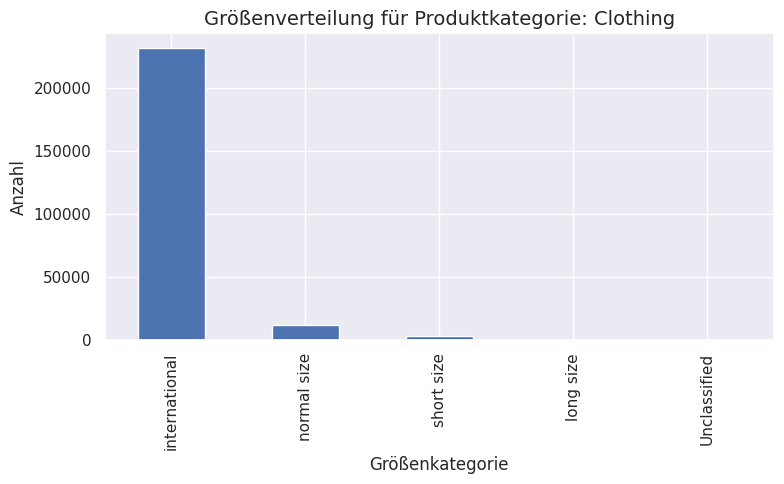

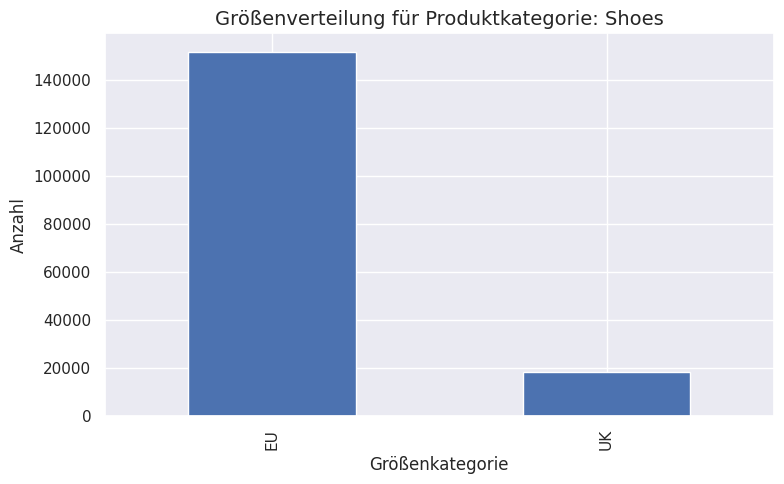

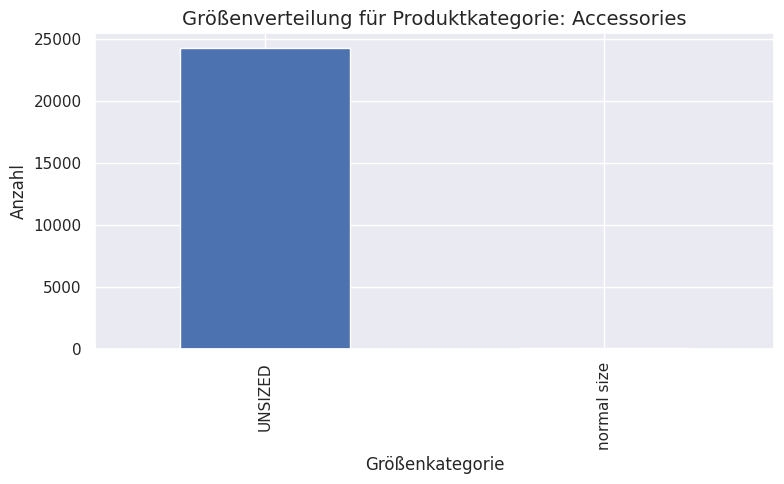

In [ ]:
import matplotlib.pyplot as plt

# Einzelne Diagramme für jede Produktkategorie erstellen
unique_categories = df13['product_category'].unique()

for category in unique_categories:
    # Filtern nach Produktkategorie
    category_data = df13[df13['product_category'] == category]

    # Gruppieren nach Größe
    size_counts = category_data['size_category'].value_counts()

    # Balkendiagramm erstellen
    plt.figure(figsize=(8, 5))
    size_counts.plot(kind='bar')

    # Titel und Achsenbeschriftungen hinzufügen
    plt.title(f'Größenverteilung für Produktkategorie: {category}', fontsize=14)
    plt.xlabel('Größenkategorie', fontsize=12)
    plt.ylabel('Anzahl', fontsize=12)

    # Layout anpassen und Diagramm anzeigen
    plt.tight_layout()
    plt.show()


## welche Produktkategorien (category_variation)

 **welche Produktkategorien** sich für unterschiedliche Kunden und Zeitpunkte (z. B. Bestellungen) unterscheiden und nicht immer denselben Wert annehmen, kann eine Aggregation auf Kundenebene erfolgen. Damit können wir Variationen innerhalb einer Produktkategorie untersuchen.

Schritte:
1. **Gruppierung nach Kunden und Bestellungen**:
   - Überprüfen, ob Kunden mehrere Produktkategorien bestellen.
2. **Einzigartige Kategorien zählen**:
   - Pro Kunde und Bestellung die Anzahl der verschiedenen Produktkategorien ermitteln.
3. **Identifikation von Variationen**:
   - Kunden identifizieren, die mehr als eine Kategorie bestellt haben.

Hier ist der Python-Code:



Ergebnis:
Der DataFrame `df13` enthält jetzt eine neue Spalte `category_variation`, die anzeigt, ob die Bestellung eines Kunden mehrere Produktkategorien umfasst.

Beispielausgabe:

| customerID | orderDate   | product_category | category_variation |
|------------|-------------|------------------|--------------------|
| 1          | 2023-01-01  | Clothing         | 1                  |
| 1          | 2023-01-01  | Shoes            | 1                  |
| 2          | 2023-01-02  | Accessories      | 0                  |
| 2          | 2023-01-02  | Accessories      | 0                  |

Erklärung:
1. **`unique_categories`**:
   - Zählt die Anzahl der verschiedenen Produktkategorien pro Kunde und Bestellung.
2. **`category_variation`**:
   - Markiert Bestellungen mit mehr als einer Kategorie als `1` und andere als `0`.
3. **Rückmerge**:
   - Die Ergebnisse werden zurück in den ursprünglichen DataFrame gemergt, um diese Information für jedes Produkt verfügbar zu machen.

Nutzen:
- Identifiziert Kunden oder Bestellungen mit diversifizierten Käufen.
- Liefert Erkenntnisse über Kundenverhalten, z. B. Vorlieben für gemischte Kategorien.

In [ ]:
import pandas as pd

# Gruppiere nach customerID und orderDate und berechne die Anzahl eindeutiger Produktkategorien
customer_category_variation = (
    df13.groupby(['customerID', 'orderDate'])
    .agg(unique_categories=('product_category', 'nunique'))  # Anzahl eindeutiger Kategorien
    .reset_index()
)

# Markiere Bestellungen mit mehr als einer Produktkategorie
customer_category_variation['category_variation'] = customer_category_variation['unique_categories'].apply(lambda x: 1 if x > 1 else 0)

# Merge die Variation zurück in df13
df13 = df13.merge(
    customer_category_variation[['customerID', 'orderDate', 'category_variation']],
    on=['customerID', 'orderDate'],
    how='left'
)

# Ergebnisse anzeigen
print(df13.head())


   orderItemID  orderDate deliveryDate  itemID size  color  manufacturerID  \
0            1 2012-04-01   2012-04-03     186    M  denim              25   
1            2 2012-04-01   2012-04-03      71  9.5  ocher              21   
2            3 2012-04-01   2012-04-03      71  9.5  curry              21   
3            5 2012-04-02   2012-04-05     151   39  black              53   
4            6 2012-04-02   2012-04-05     598  XXL  brown              87   

   price  customerID salutation dateOfBirth                 state  \
0  69.90         794        Mrs  1965-01-06    Baden-Wuerttemberg   
1  69.95         794        Mrs  1965-01-06    Baden-Wuerttemberg   
2  69.95         794        Mrs  1965-01-06    Baden-Wuerttemberg   
3  29.90         825        Mrs  1964-07-11  Rhineland-Palatinate   
4  89.90         825        Mrs  1964-07-11  Rhineland-Palatinate   

  creationDate  returnShipment  non_null_delivery_count  \
0   2011-04-25               0                        3  

## preferred_product_category

In [ ]:
def integrate_features_into_df(df):
    # Erstelle eine Spalte 'order_key', falls nicht vorhanden
    if 'order_key' not in df.columns:
        df['order_key'] = df['customerID'].astype(str) + '_' + df['orderDate'].astype(str)

    # 1. Häufigkeitsbasierte Features pro Kunde
    preferred_features = df.groupby('customerID').agg({
        'product_category': lambda x: x.mode()[0] if not x.mode().empty else None,
        'size_category': lambda x: x.mode()[0] if not x.mode().empty else None,
        'sub_category': lambda x: x.mode()[0] if not x.mode().empty else None,
        'target_group': lambda x: x.mode()[0] if not x.mode().empty else None
    }).reset_index()

    preferred_features.columns = [
        'customerID',
        'preferred_product_category',
        'preferred_size_category',
        'preferred_sub_category',
        'preferred_target_group'
    ]

    # 2. Proportionale Features pro Kunde
    proportion_features = df.groupby(['customerID', 'target_group']).size().unstack(fill_value=0)
    for col in proportion_features.columns:
        proportion_features[f'proportion_{col}'] = proportion_features[col] / proportion_features.sum(axis=1)

    proportion_features = proportion_features.filter(like='proportion').reset_index()

    # 3. Diversitäts-Features pro Kunde
    diversity_features = df.groupby('customerID').agg({
        'product_category': lambda x: x.nunique(),
        'size_category': lambda x: x.nunique(),
        'sub_category': lambda x: x.nunique(),
        'target_group': lambda x: x.nunique()
    }).reset_index()

    diversity_features.columns = [
        'customerID',
        'product_category_diversity',
        'size_category_diversity',
        'sub_category_diversity',
        'target_group_diversity'
    ]

    # 4. Zusammenführen der neuen Features
    customer_features = pd.merge(preferred_features, proportion_features, on='customerID', how='left')
    customer_features = pd.merge(customer_features, diversity_features, on='customerID', how='left')

    # 5. Integration der Features in `df`
    df = pd.merge(df, customer_features, on='customerID', how='left')

    return df

# Anwenden der Funktion auf df13
df13 = integrate_features_into_df(df13)

# Prüfen, ob die neuen Features hinzugefügt wurden
print(df13.head())


In [ ]:

filtered_df12 = df13[(df13['customerID'] == 6) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['orderDate','itemID','size','product_category','sub_category','preferred_target_group','product_category_diversity','size_category_diversity','sub_category_diversity','target_group_diversity']]

#

#,'preferred_product_category', 'preferred_size_category', 'preferred_sub_category'


# Warenkorb level

## exact_product_count


In [ ]:
# Create a copy of the original DataFrame


# Remove '+' sign from the 'size' column for consistency
df13['size'] = df13['size'].str.replace('+', '', regex=False)

# Add a column to uniquely identify each product with all relevant attributes
df13['unique_product'] = df13['itemID'].astype(str) + '_' + df13['size'].astype(str) + '_' + df13['color'].astype(str)

# Count the exact occurrences of each unique product per customer and order date
exact_counts = df13.groupby(['customerID', 'orderDate', 'unique_product']).size().reset_index(name='exact_product_count')

# Merge the counts back into the original DataFrame
df13 = df13.merge(exact_counts, on=['customerID', 'orderDate', 'unique_product'], how='left')

# Drop the helper column 'unique_product' to clean up
df13.drop(columns=['unique_product'], inplace=True)

# Verify the result
print(df13[['customerID', 'orderDate', 'itemID', 'size', 'color', 'exact_product_count']].head())


   customerID  orderDate  itemID size  color  exact_product_count
0         794 2012-04-01     186    M  denim                    1
1         794 2012-04-01      71  9.5  ocher                    1
2         794 2012-04-01      71  9.5  curry                    1
3         825 2012-04-02     151   39  black                    1
4         825 2012-04-02     598  XXL  brown                    1


In [ ]:
df13[['customerID', 'orderDate', 'itemID', 'size', 'color', 'exact_product_count','returnShipment']]


,customerID,orderDate,itemID,size,color,exact_product_count,returnShipment
0,794,2012-04-01,186,M,denim,1,0
1,794,2012-04-01,71,9.5,ocher,1,1
2,794,2012-04-01,71,9.5,curry,1,1
3,825,2012-04-02,151,39,black,1,0
4,825,2012-04-02,598,XXL,brown,1,0
...,...,...,...,...,...,...,...
441668,7032,2013-03-31,2561,39.5,blue,1,1
441669,86610,2013-03-31,2669,39,grey,1,0
441670,86611,2013-03-31,2458,XXL,black,1,0
441671,86611,2013-03-31,2659,XXL,black,1,0


## category_count

In [ ]:
# Count the occurrences of products with the same category per customer and order date
category_counts = df13.groupby(['customerID', 'orderDate', 'product_category']).size().reset_index(name='category_count')

# Merge the counts back into the original DataFrame
df13 = df13.merge(category_counts, on=['customerID', 'orderDate', 'product_category'], how='left')

# Verify the result
print(df13[['customerID', 'orderDate', 'product_category', 'category_count']].head())


   customerID   orderDate product_category  category_count
0         794  2012-04-01         Clothing               1
1         794  2012-04-01            Shoes               2
2         794  2012-04-01            Shoes               2
3         808  2012-04-02         Clothing               1
4         825  2012-04-02            Shoes               2


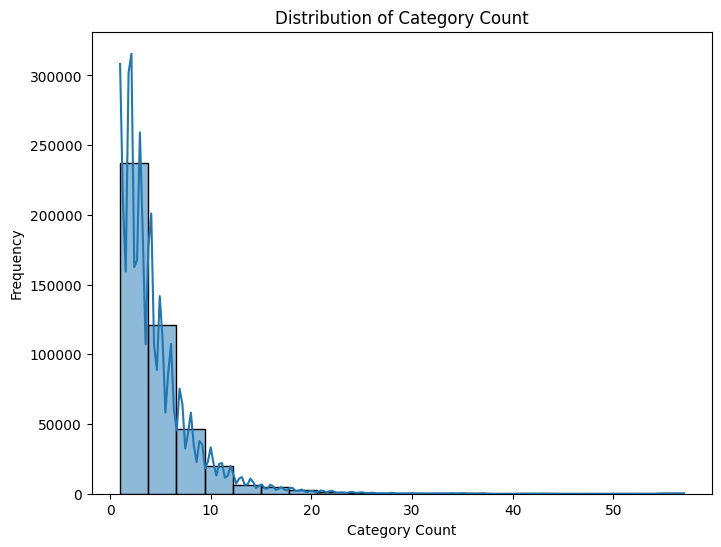

count    441673.000000
mean          4.345357
std           3.927525
min           1.000000
25%           2.000000
50%           3.000000
75%           6.000000
max          57.000000
Name: category_count, dtype: float64


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Verteilung von category_count
plt.figure(figsize=(8, 6))
sns.histplot(df13['category_count'], bins=20, kde=True)
plt.title('Distribution of Category Count')
plt.xlabel('Category Count')
plt.ylabel('Frequency')
plt.show()

# Grundlegende Statistiken
print(df13['category_count'].describe())


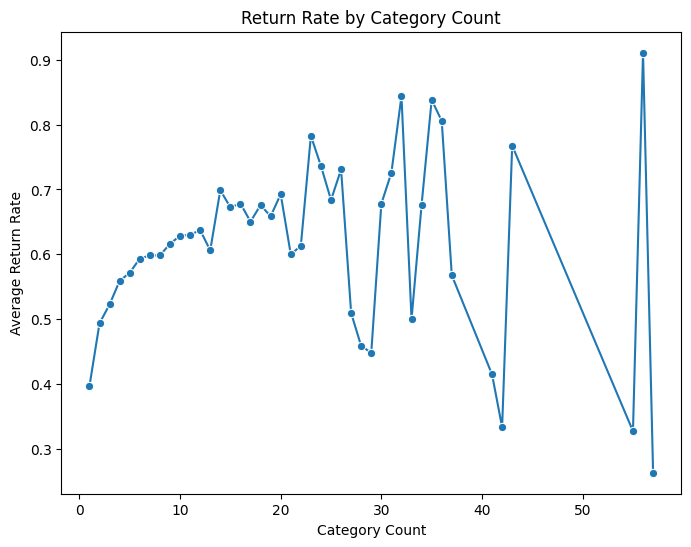

In [ ]:
# Durchschnittliche Rücksendequote pro category_count
return_rate_by_category_count = df13.groupby('category_count')['returnShipment'].mean().reset_index()

# Visualisieren
plt.figure(figsize=(8, 6))
sns.lineplot(data=return_rate_by_category_count, x='category_count', y='returnShipment', marker='o')
plt.title('Return Rate by Category Count')
plt.xlabel('Category Count')
plt.ylabel('Average Return Rate')
plt.show()


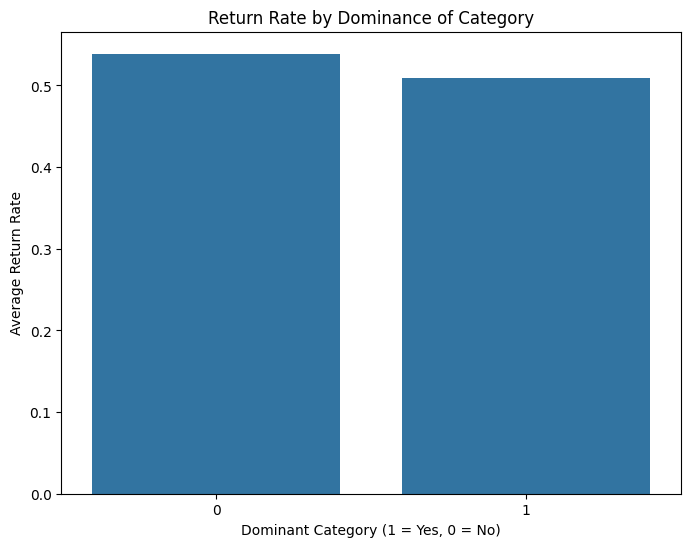

In [ ]:
# Berechne den Anteil der dominiert-kategorisierten Bestellungen
total_products_by_order = df13.groupby(['customerID', 'orderDate'])['itemID'].count().reset_index(name='total_products')
df13 = df13.merge(total_products_by_order, on=['customerID', 'orderDate'], how='left')
df13['dominant_category_flag'] = (df13['category_count'] == df13['total_products']).astype(int)

# Analyse der Rücksendequote nach Dominanz
dominance_return_rate = df13.groupby('dominant_category_flag')['returnShipment'].mean().reset_index()

# Visualisieren
plt.figure(figsize=(8, 6))
sns.barplot(data=dominance_return_rate, x='dominant_category_flag', y='returnShipment')
plt.title('Return Rate by Dominance of Category')
plt.xlabel('Dominant Category (1 = Yes, 0 = No)')
plt.ylabel('Average Return Rate')
plt.show()


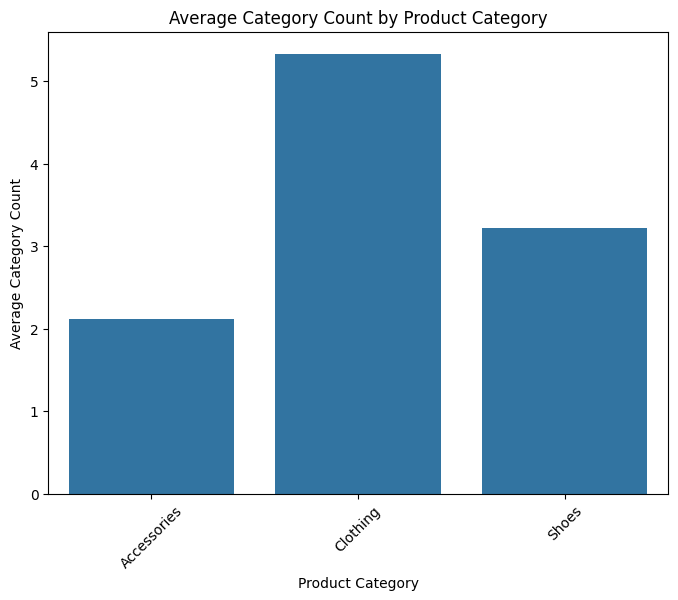

In [ ]:
# Durchschnittliches category_count nach Produktkategorie
avg_category_count_by_product = df13.groupby('product_category')['category_count'].mean().reset_index()

# Visualisieren
plt.figure(figsize=(8, 6))
sns.barplot(data=avg_category_count_by_product, x='product_category', y='category_count')
plt.title('Average Category Count by Product Category')
plt.xlabel('Product Category')
plt.ylabel('Average Category Count')
plt.xticks(rotation=45)
plt.show()


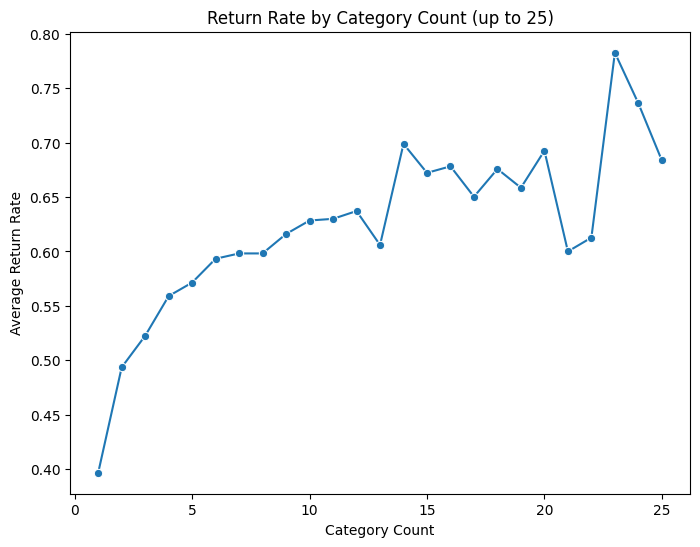

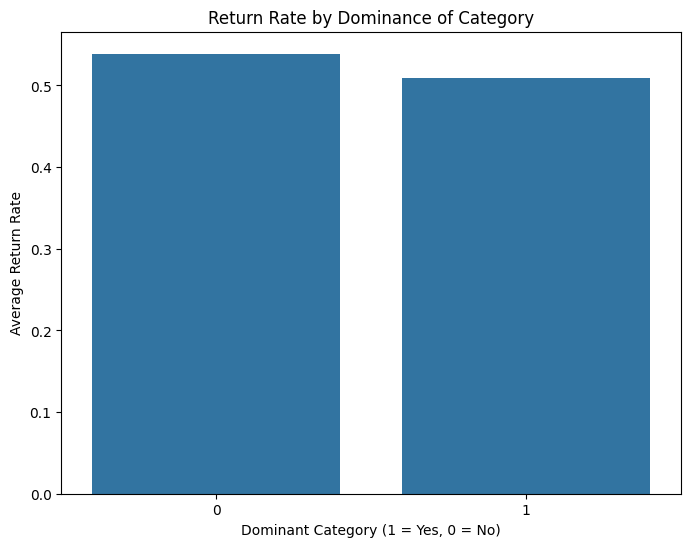

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Schritt 1: Durchschnittliche Rücksendequote pro category_count (begrenzen auf <= 25)
return_rate_by_category_count = df13[df13['category_count'] <= 25].groupby('category_count')['returnShipment'].mean().reset_index()

# Visualisieren der Rücksendequote nach category_count
plt.figure(figsize=(8, 6))
sns.lineplot(data=return_rate_by_category_count, x='category_count', y='returnShipment', marker='o')
plt.title('Return Rate by Category Count (up to 25)')
plt.xlabel('Category Count')
plt.ylabel('Average Return Rate')
plt.show()

# Schritt 2: Berechne den Anteil der dominiert-kategorisierten Bestellungen
# Berechne die Gesamtanzahl der Produkte in jeder Bestellung
total_products_by_order = (
    df13.groupby(['customerID', 'orderDate'])
    .size()  # Zählt die Anzahl der Produkte pro Bestellung
    .reset_index(name='total_products')  # Speichert das Ergebnis in der Spalte 'total_products'
)

# Merge die Gesamtanzahl der Produkte zurück in df13
df13 = df13.merge(total_products_by_order, on=['customerID', 'orderDate'], how='left')

# Erstelle die Flag-Spalte, um zu prüfen, ob die Kategorie dominiert
df13['dominant_category_flag'] = (df13['category_count'] == df13['total_products']).astype(int)

# Analyse der Rücksendequote nach Dominanz
dominance_return_rate = df13.groupby('dominant_category_flag')['returnShipment'].mean().reset_index()

# Visualisieren der Rücksendequote nach Dominanz
plt.figure(figsize=(8, 6))
sns.barplot(data=dominance_return_rate, x='dominant_category_flag', y='returnShipment')
plt.title('Return Rate by Dominance of Category')
plt.xlabel('Dominant Category (1 = Yes, 0 = No)')
plt.ylabel('Average Return Rate')
plt.show()


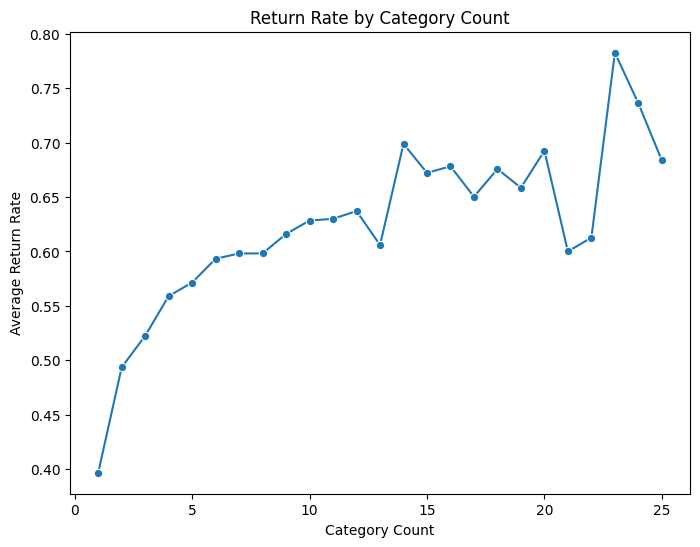

In [ ]:
# Schritt 1: Durchschnittliche Rücksendequote pro category_count (begrenzen auf <= 25)
return_rate_by_category_count = df13[df13['category_count'] <= 25].groupby('category_count')['returnShipment'].mean().reset_index()

# Visualisieren der Rücksendequote nach category_count
plt.figure(figsize=(8, 6))
sns.lineplot(data=return_rate_by_category_count, x='category_count', y='returnShipment', marker='o')
plt.title('Return Rate by Category Count')
plt.xlabel('Category Count')
plt.ylabel('Average Return Rate')
plt.show()

In [ ]:

#filtered_df12 = df13[(df13['deliveryDate'] == 'nan') ]
#df13_missing_delivery = df13[df13['deliveryDate'].isnull()]
#filtered_df12 = df13[(df13['customerID'] == 1317)& (df13['orderDate'] == '2012-04-01')]
#filtered_df12 = df13[(df13['customerID'] == 7824)& (df13['orderDate'] == '2013-03-31')]
#filtered_df12 = df13[(df13['customerID'] == 1360)& (df13['orderDate'] == '2012-04-01')]
#filtered_df12 = df13[(df13['customerID'] == 4390)& (df13['orderDate'] == '2013-03-31')]
filtered_df12 = df13[(df13['customerID'] == 491)& (df13['orderDate'] == '2012-04-02')]
#filtered_df12 = df[(df['customerID'] == 808)& (df['orderDate'] == '2012-04-02')]
#86558 2013-03-31
# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['orderDate','itemID'	,'customerID','product_category'	,'category_count','returnShipment']]



,orderDate,itemID,customerID,product_category,category_count,returnShipment
1626,2012-04-02,103,491,Shoes,2,1
1629,2012-04-02,103,491,Shoes,2,1
1630,2012-04-02,33,491,Clothing,2,0
1631,2012-04-02,33,491,Clothing,2,0


## manufacturer_count


In [ ]:
# Count the occurrences of products with the same manufacturerID per customer and order date
manufacturer_counts = df13.groupby(['customerID', 'orderDate', 'manufacturerID']).size().reset_index(name='manufacturer_count')

# Merge the counts back into the original DataFrame
df13 = df13.merge(manufacturer_counts, on=['customerID', 'orderDate', 'manufacturerID'], how='left')

# Verify the result
print(df13[['customerID', 'orderDate', 'manufacturerID', 'manufacturer_count']].head())


   customerID   orderDate  manufacturerID  manufacturer_count
0         794  2012-04-01              25                   1
1         794  2012-04-01              21                   2
2         794  2012-04-01              21                   2
3         808  2012-04-02              14                   1
4         825  2012-04-02              53                   1


## product_without_size




In [ ]:
# Create a unique identifier for products, excluding the 'size' attribute
df13['product_without_size'] = df13['itemID'].astype(str) + '_' + df13['color'].astype(str) + '_' + df13['product_category'].astype(str)

# Count occurrences of products with the same attributes, excluding size, per customer and order date
without_size_counts = df13.groupby(['customerID', 'orderDate', 'product_without_size']).size().reset_index(name='count_without_size')

# Merge the counts back into the original DataFrame
df13 = df13.merge(without_size_counts, on=['customerID', 'orderDate', 'product_without_size'], how='left')

# Drop the helper column 'product_without_size' to clean up
df13.drop(columns=['product_without_size'], inplace=True)

# Verify the result
print(df13[['customerID', 'orderDate', 'itemID', 'color', 'product_category', 'size', 'count_without_size']].head())


   customerID   orderDate  itemID  color product_category size  \
0         794  2012-04-01     186  denim         Clothing    M   
1         794  2012-04-01      71  ocher            Shoes  9.5   
2         794  2012-04-01      71  curry            Shoes  9.5   
3         808  2012-04-02      22  green         Clothing    M   
4         825  2012-04-02     151  black            Shoes   39   

   count_without_size  
0                   1  
1                   1  
2                   1  
3                   1  
4                   1  


In [ ]:

#filtered_df12 = df13[(df13['deliveryDate'] == 'nan') ]
#df13_missing_delivery = df13[df13['deliveryDate'].isnull()]
#filtered_df12 = df13[(df13['customerID'] == 1317)& (df13['orderDate'] == '2012-04-01')]
#filtered_df12 = df13[(df13['customerID'] == 7824)& (df13['orderDate'] == '2013-03-31')]
#filtered_df12 = df13[(df13['customerID'] == 1360)& (df13['orderDate'] == '2012-04-01')]
#filtered_df12 = df13[(df13['customerID'] == 4390)& (df13['orderDate'] == '2013-03-31')]
#filtered_df12 = df13[(df13['customerID'] == 491)& (df13['orderDate'] == '2012-04-02')]
filtered_df12 = df13[(df13['customerID'] == 1317)& (df13['orderDate'] == '2012-04-01')]

#filtered_df12 = df[(df['customerID'] == 808)& (df['orderDate'] == '2012-04-02')]
#86558 2013-03-31
# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['orderDate','itemID'	,'customerID','color','size','product_category'	,'count_without_size','count_without_color']]



,orderDate,itemID,customerID,color,size,product_category,count_without_size,count_without_color
237,2012-04-01,32,1317,blue,XL,Clothing,1,1
238,2012-04-01,592,1317,olive,48,Clothing,1,1
262,2012-04-01,54,1317,denim,L,Clothing,1,1
263,2012-04-01,287,1317,blue,37,Shoes,2,1
264,2012-04-01,287,1317,blue,38,Shoes,2,1


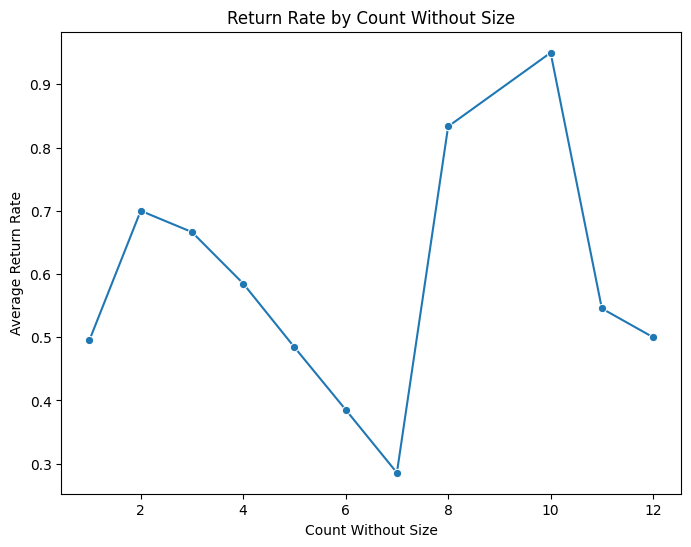

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Berechnung der durchschnittlichen Rücksendequote basierend auf 'count_without_size'
return_rate_by_without_size = df13.groupby('count_without_size')['returnShipment'].mean().reset_index()

# Visualisierung mit einem Liniendiagramm
plt.figure(figsize=(8, 6))
sns.lineplot(data=return_rate_by_without_size, x='count_without_size', y='returnShipment', marker='o')
plt.title('Return Rate by Count Without Size')
plt.xlabel('Count Without Size')
plt.ylabel('Average Return Rate')
plt.show()


## product_without_color


In [ ]:
# Drop 'order_count' and 'return_count' columns from df9
#df13 = df13.drop(columns=['count_without_color_x','count_without_color_y'])


In [ ]:
# Create a unique identifier for products, excluding the 'color' attribute
df13['product_without_color'] = df13['itemID'].astype(str) + '_' + df13['size'].astype(str) + '_' + df13['product_category'].astype(str)

# Count occurrences of products with the same attributes, excluding color, per customer and order date
without_color_counts = df13.groupby(['customerID', 'orderDate', 'product_without_color']).size().reset_index(name='count_without_color')

# Merge the counts back into the original DataFrame
df13 = df13.merge(without_color_counts, on=['customerID', 'orderDate', 'product_without_color'], how='left')

# Drop the helper column 'product_without_color' to clean up
df13.drop(columns=['product_without_color'], inplace=True)

# Verify the result
print(df13[['customerID', 'orderDate', 'itemID', 'size', 'product_category', 'color', 'count_without_color']].head())


   customerID   orderDate  itemID size product_category  color  \
0         794  2012-04-01     186    M         Clothing  denim   
1         794  2012-04-01      71  9.5            Shoes  ocher   
2         794  2012-04-01      71  9.5            Shoes  curry   
3         808  2012-04-02      22    M         Clothing  green   
4         825  2012-04-02     151   39            Shoes  black   

   count_without_color  
0                    1  
1                    2  
2                    2  
3                    1  
4                    1  


## similar_product_count_size_color and similar_product_count_size


In [ ]:
# Add a helper column to group by relevant attributes excluding size and color
df13['similar_product_key'] = df13['itemID'].astype(str) + '_' + df13['customerID'].astype(str) + '_' + df13['orderDate'].astype(str)

# Count occurrences of similar products that differ only in size or color
similar_product_counts = df13.groupby(['similar_product_key'])['itemID'].transform('count')

# Assign the count to a new column
df13['similar_product_count_size_color'] = similar_product_counts - 1  # Exclude the current row itself

# Drop the helper column for cleanup
df13.drop(columns=['similar_product_key'], inplace=True)

# Display the resulting DataFrame for verification
print(df13[['customerID', 'orderDate', 'itemID', 'size', 'color', 'similar_product_count_size_color']].head())


   customerID   orderDate  itemID size  color  \
0         794  2012-04-01     186    M  denim   
1         794  2012-04-01      71  9.5  ocher   
2         794  2012-04-01      71  9.5  curry   
3         808  2012-04-02      22    M  green   
4         825  2012-04-02     151   39  black   

   similar_product_count_size_color  
0                                 0  
1                                 1  
2                                 1  
3                                 0  
4                                 0  


In [ ]:

#filtered_df12 = df13[(df13['deliveryDate'] == 'nan') ]
#df13_missing_delivery = df13[df13['deliveryDate'].isnull()]
#filtered_df12 = df13[(df13['customerID'] == 1317)& (df13['orderDate'] == '2012-04-01')]
#filtered_df12 = df13[(df13['customerID'] == 7824)& (df13['orderDate'] == '2013-03-31')]
#filtered_df12 = df13[(df13['customerID'] == 1360)& (df13['orderDate'] == '2012-04-01')]
#filtered_df12 = df13[(df13['customerID'] == 4390)& (df13['orderDate'] == '2013-03-31')]
#filtered_df12 = df13[(df13['customerID'] == 491)& (df13['orderDate'] == '2012-04-02')]
#filtered_df12 = df13[(df13['customerID'] == 794)& (df13['orderDate'] == '2012-10-14')]
filtered_df12 = df13[(df13['customerID'] == 1317) &
                      (df13['orderDate'].isin(['2012-04-01', '2012-08-19']))]
#filtered_df12 = df13[(df13['customerID'] == 1317)]

#filtered_df12 = df[(df['customerID'] == 808)& (df['orderDate'] == '2012-04-02')]
#86558 2013-03-31
# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['orderDate','itemID'	,'customerID','color','size','product_category'	,'count_without_size','count_without_color','similar_product_count_size_color']]



<ipython-input-29-058529b5f53d>:10: FutureWarning: The behavior of 'isin' with dtype=datetime64[ns] and castable values (e.g. strings) is deprecated. In a future version, these will not be considered matching by isin. Explicitly cast to the appropriate dtype before calling isin instead.
  (df13['orderDate'].isin(['2012-04-01', '2012-08-19']))]


,orderDate,itemID,customerID,color,size,product_category,count_without_size,count_without_color,similar_product_count_size_color
237,2012-04-01,32,1317,blue,XL,Clothing,1,1,0
238,2012-04-01,592,1317,olive,48,Clothing,1,1,0
262,2012-04-01,54,1317,denim,L,Clothing,1,1,0
263,2012-04-01,287,1317,blue,37,Shoes,2,1,1
264,2012-04-01,287,1317,blue,38,Shoes,2,1,1
156184,2012-08-19,1750,1317,navy,M,Clothing,1,1,0
156185,2012-08-19,1532,1317,blue,XL,Clothing,1,2,1
156186,2012-08-19,1532,1317,white,XL,Clothing,1,2,1
156187,2012-08-19,1802,1317,mocha,M,Clothing,1,1,0
156194,2012-08-19,1622,1317,black,48,Clothing,1,1,0


In [ ]:

#filtered_df12 = df13[(df13['deliveryDate'] == 'nan') ]
#df13_missing_delivery = df13[df13['deliveryDate'].isnull()]
#filtered_df12 = df13[(df13['customerID'] == 1317)& (df13['orderDate'] == '2012-04-01')]
#filtered_df12 = df13[(df13['customerID'] == 7824)& (df13['orderDate'] == '2013-03-31')]
#filtered_df12 = df13[(df13['customerID'] == 1360)& (df13['orderDate'] == '2012-04-01')]
#filtered_df12 = df13[(df13['customerID'] == 4390)& (df13['orderDate'] == '2013-03-31')]
#filtered_df12 = df13[(df13['customerID'] == 491)& (df13['orderDate'] == '2012-04-02')]
filtered_df12 = df13[(df13['customerID'] == 794)& (df13['orderDate'] == '2012-10-14')]
#filtered_df12 = df13[(df13['customerID'] == 1317)& (df13['orderDate'] == '2012-04-01')]

#filtered_df12 = df[(df['customerID'] == 808)& (df['orderDate'] == '2012-04-02')]
#86558 2013-03-31
# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['orderDate','itemID'	,'customerID','color','size','product_category'	,'count_without_size','count_without_color','similar_product_count_size_color']]



,orderDate,itemID,customerID,color,size,product_category,count_without_size,count_without_color,similar_product_count_size_color
225345,2012-10-14,1847,794,ocher,40,Shoes,1,2,1
225395,2012-10-14,1847,794,petrol,40,Shoes,1,2,1


In [ ]:

#filtered_df12 = df13[(df13['deliveryDate'] == 'nan') ]
#df13_missing_delivery = df13[df13['deliveryDate'].isnull()]
#filtered_df12 = df13[(df13['customerID'] == 1317)& (df13['orderDate'] == '2012-04-01')]
#filtered_df12 = df13[(df13['customerID'] == 7824)& (df13['orderDate'] == '2013-03-31')]
#filtered_df12 = df13[(df13['customerID'] == 1360)& (df13['orderDate'] == '2012-04-01')]
#filtered_df12 = df13[(df13['customerID'] == 4390)& (df13['orderDate'] == '2013-03-31')]
#filtered_df12 = df13[(df13['customerID'] == 491)& (df13['orderDate'] == '2012-04-02')]
filtered_df12 = df13[(df13['customerID'] == 794)& (df13['orderDate'] == '2012-09-29')]
#filtered_df12 = df13[(df13['customerID'] == 1317)& (df13['orderDate'] == '2012-04-01')]

#filtered_df12 = df[(df['customerID'] == 808)& (df['orderDate'] == '2012-04-02')]
#86558 2013-03-31
# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['orderDate','itemID'	,'customerID','color','size','product_category'	,'count_without_size','count_without_color','similar_product_count_size_color']]



,orderDate,itemID,customerID,color,size,product_category,count_without_size,count_without_color,similar_product_count_size_color
212113,2012-09-29,273,794,white,M,Clothing,2,1,1
212114,2012-09-29,273,794,white,L,Clothing,2,1,1


## Gesamtanzahl der Produkte im Warenkorb



In [ ]:
# Count the total number of products in the cart per customer and order date
total_products_in_cart = df13.groupby(['customerID', 'orderDate']).size().reset_index(name='total_products_in_cart')

# Merge the total product counts back into the original DataFrame
df13 = df13.merge(total_products_in_cart, on=['customerID', 'orderDate'], how='left')

# Verify the result
print(df13[['customerID', 'orderDate', 'itemID', 'size', 'color', 'product_category', 'total_products_in_cart']].head())


   customerID   orderDate  itemID size  color product_category  \
0         794  2012-04-01     186    M  denim         Clothing   
1         794  2012-04-01      71  9.5  ocher            Shoes   
2         794  2012-04-01      71  9.5  curry            Shoes   
3         808  2012-04-02      22    M  green         Clothing   
4         825  2012-04-02     151   39  black            Shoes   

   total_products_in_cart  
0                       3  
1                       3  
2                       3  
3                       1  
4                       3  


## cart_size_flag > 5 ist '1' sonst '0'


In [ ]:
# Erstelle das Feature 'cart_size_flag' basierend auf der Gesamtanzahl der Produkte im Warenkorb
df13['cart_size_flag'] = (df13['total_products_in_cart'] > 5).astype(int)

# Überprüfe das Ergebnis
print(df13[['customerID', 'orderDate', 'total_products_in_cart', 'cart_size_flag']].drop_duplicates().head())


    customerID  orderDate  total_products_in_cart  cart_size_flag
0          794 2012-04-01                       3               0
3          825 2012-04-02                       3               0
6          850 2012-04-02                       7               1
13         858 2012-04-02                       1               0
14         860 2012-04-02                      16               1


## previous_purchases



In [ ]:
# Sortiere die Daten nach 'customerID' und 'orderDate', um eine chronologische Reihenfolge sicherzustellen
df13 = df13.sort_values(by=['customerID', 'orderDate'])

# Erstelle ein kumulatives Feature, das die Gesamtanzahl der zuvor gekauften Produkte zählt
df13['previous_purchases'] = df13.groupby('customerID').cumcount()

# Überprüfe das Ergebnis
print(df13[['customerID', 'orderDate', 'itemID', 'previous_purchases']].head())


        customerID  orderDate  itemID  previous_purchases
22612            6 2012-04-19     261                   0
28252            6 2012-04-25      96                   1
28253            6 2012-04-25      96                   2
28254            6 2012-04-25      96                   3
205239           6 2012-09-23    1475                   4


## free_return

In [ ]:
# Annahme: Die Spalte 'price' enthält die Produktpreise in Euro.

# Erstelle die Spalte 'free_return' basierend auf der Bedingung
df13['free_return'] = df13['price'].apply(lambda x: 1 if x >= 40 else 0)

# Ergebnisse anzeigen
print(df13[['price', 'free_return']].head())


   price  free_return
0  69.90            1
1  69.95            1
2  69.95            1
3  39.90            0
4  29.90            0


## durchschnittlichen Warenwerts

In [ ]:
# Annahme: Spalte 'price' enthält den Preis pro Produkt, und wir berechnen pro Kunde und Bestellung.

# Berechnung des Gesamtwerts und der Anzahl der Produkte pro Kunde und Bestellung
cart_stats = (
    df13.groupby(['customerID', 'orderDate'])
    .agg(total_cart_value=('price', 'sum'), product_count=('itemID', 'size'))
    .reset_index()
)

# Berechnung des durchschnittlichen Warenwerts
cart_stats['average_cart_value'] = cart_stats['total_cart_value'] / cart_stats['product_count']

# Den durchschnittlichen Warenwert wieder in den Original-DataFrame mergen
df13 = df13.merge(cart_stats[['customerID', 'orderDate', 'average_cart_value']], on=['customerID', 'orderDate'], how='left')

# Überprüfen der Ergebnisse
print(df13[['customerID', 'orderDate', 'average_cart_value']].drop_duplicates())


        customerID  orderDate  average_cart_value
0                6 2012-04-19           99.900000
1                6 2012-04-25           16.900000
4                6 2012-09-23           31.900000
11               6 2012-10-06           83.066667
17               6 2013-01-11           44.328571
...            ...        ...                 ...
441657       86604 2013-03-30          126.566667
441660       86606 2013-03-31           42.757143
441667       86609 2013-03-31           26.900000
441669       86610 2013-03-31          130.000000
441670       86611 2013-03-31          106.566667

[132346 rows x 3 columns]


## Preis- und Rabatt-bezogenen Features

In [ ]:
# Ensures all columns are shown
pd.set_option('display.max_columns', None)

# Now print all columns with their names
print(df13.columns)


Index(['orderItemID', 'orderDate', 'deliveryDate', 'itemID', 'size', 'color',
       'manufacturerID', 'price', 'customerID', 'salutation', 'dateOfBirth',
       'state', 'creationDate', 'returnShipment', 'non_null_delivery_count',
       'unique_delivery_dates', 'deliveryTime', 'age', 'color_miss',
       'color_hex', 'color_rgb', 'r', 'g', 'b', 'size_false',
       'customer_return_rate', 'item_rto_percentage',
       'manufacturer_rto_percentage', 'order_count', 'return_count',
       'duplicate_item_return_rate', 'multiple_order_flag',
       'similar_product_count_size', 'similar_product_count_color',
       'similar_product_return_rate', 'product_category', 'international_size',
       'size_category', 'size_category_encoded', 'international_UK_size',
       'sub_category', 'target_group', 'order_key', 'category_count',
       'manufacturer_count', 'count_without_size', 'count_without_color',
       'similar_product_count_size_color', 'total_products_in_cart',
       'free_return

In [ ]:
import pandas as pd

# Annahme: Verwende den höchsten bekannten Preis eines Artikels als ursprünglichen Preis
price_stats = (
    df13.groupby('itemID')
    .agg(highest_price_item=('price', 'max'))  # Höchster Preis als Proxy für 'original_price'
    .reset_index()
)

# Merge den geschätzten 'original_price' in den Hauptdatensatz
df13 = df13.merge(price_stats, on='itemID', how='left')

# Rabattprozentsatz (discount_percentage): Rabattprozentsatz im Vergleich zum geschätzten ursprünglichen Preis
df13['discount_percentage'] = 1 - (df13['price'] / df13['highest_price_item'])
df13['discount_percentage'] = df13['discount_percentage'].fillna(0)  # Setze NaN-Werte auf 0 (falls kein Rabatt vorhanden)

# Rang des Rabatts innerhalb eines Batches (discount_rank)
df13['discount_rank'] = df13.groupby(['customerID', 'orderDate'])['discount_percentage'].rank(method='min')

# Rang des Preises innerhalb eines Batches (price_rank)
df13['price_rank'] = df13.groupby(['customerID', 'orderDate'])['price'].rank(method='min')

# Minimaler, maximaler und durchschnittlicher Rabatt eines Artikels (min_discount_item, max_discount_item, mean_discount_item)
discount_stats = (
    df13.groupby('itemID')
    .agg(
        min_discount_item=('discount_percentage', lambda x: x[x > 0].min()),  # min_discount_item größer als 0
        max_discount_item=('discount_percentage', 'max'),                     # max_discount_item
        mean_discount_item=('discount_percentage', 'mean')                    # mean_discount_item
    )
    .reset_index()
)
df13 = df13.merge(discount_stats, on='itemID', how='left')

# Minimaler, maximaler und durchschnittlicher Preis eines Artikels (min_price_item, max_price_item, mean_price_item)
price_stats = (
    df13.groupby('itemID')
    .agg(
        min_price_item=('price', 'min'),
        max_price_item=('price', 'max'),
        mean_price_item=('price', 'mean')
    )
    .reset_index()
)
df13 = df13.merge(price_stats, on='itemID', how='left')

# Ergebnisse überprüfen
print(df13[['customerID', 'orderDate', 'itemID', 'price', 'highest_price_item', 'discount_percentage',
            'discount_rank', 'price_rank', 'min_discount_item', 'max_discount_item',
            'mean_discount_item', 'min_price_item', 'max_price_item', 'mean_price_item']].head())


   customerID   orderDate  itemID  price  highest_price_item  \
0         794  2012-04-01     186  69.90               69.90   
1         794  2012-04-01      71  69.95               69.95   
2         794  2012-04-01      71  69.95               69.95   
3         808  2012-04-02      22  39.90               39.90   
4         825  2012-04-02     151  29.90               49.90   

   discount_percentage  discount_rank  price_rank  min_discount_item  \
0             0.000000            1.0         1.0           0.049928   
1             0.000000            1.0         2.0           0.285919   
2             0.000000            1.0         2.0           0.285919   
3             0.000000            1.0         1.0           0.250627   
4             0.400802            3.0         1.0           0.400802   

   max_discount_item  mean_discount_item  min_price_item  max_price_item  \
0           0.429185            0.006082           39.90           69.90   
1           0.500357          

In [ ]:


#filtered_df12 = df13[df13['itemID'] == 134] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

#filtered_df12 = df13[df13['itemID'] == 134]
#filtered_df12 = df13[df13['itemID'] == 156] # 23,24 36 38 40 Clothing
##filtered_df12 = df13[(df13['customerID'] == 5991) ]
filtered_df12 = df13[(df13['customerID'] == 491) ]
#filtered_df12 = df13[(df13['customerID'] == 348) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'price', 'highest_price_item', 'discount_percentage', 'discount_rank', 'price_rank', 'min_discount_item', 'max_discount_item','mean_discount_item', 'min_price_item', 'max_price_item', 'mean_price_item']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
#filtered_df12[['customerID', 'orderDate', 'itemID','product_category', 'size', 'duplicate_flag_by_cust_date_cat_size']]
filtered_df12[['customerID', 'orderDate', 'itemID', 'price', 'highest_price_item', 'discount_percentage', 'discount_rank', 'price_rank','returnShipment']]




,customerID,orderDate,itemID,price,highest_price_item,discount_percentage,discount_rank,price_rank,returnShipment
1802,491,2012-04-02,33,59.9,69.9,0.143062,3.0,1.0,0
1803,491,2012-04-02,33,59.9,69.9,0.143062,3.0,1.0,0
1804,491,2012-04-02,103,139.9,139.9,0.000000,1.0,3.0,1
1805,491,2012-04-02,103,139.9,139.9,0.000000,1.0,3.0,1
23080,491,2012-04-18,96,16.9,19.9,0.150754,8.0,3.0,1
...,...,...,...,...,...,...,...,...,...
289455,491,2012-11-27,1749,99.9,99.9,0.000000,1.0,1.0,0
293203,491,2012-12-03,1437,69.9,69.9,0.000000,1.0,1.0,0
293204,491,2012-12-03,1500,69.9,69.9,0.000000,1.0,1.0,1
407067,491,2013-02-27,2384,59.9,59.9,0.000000,1.0,1.0,1


In [ ]:
filtered_df12 = df13[df13['itemID'] == 2] #shoes
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
filtered_df12[['customerID', 'orderDate', 'itemID', 'price', 'highest_price_item', 'discount_percentage', 'discount_rank', 'price_rank', 'min_discount_item', 'mean_discount_item', 'min_price_item', 'max_price_item', 'mean_price_item']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
#filtered_df12[['customerID', 'orderDate', 'itemID','product_category', 'size', 'duplicate_flag_by_cust_date_cat_size']]


,customerID,orderDate,itemID,price,highest_price_item,discount_percentage,discount_rank,price_rank,min_discount_item,mean_discount_item,min_price_item,max_price_item,mean_price_item
10,850,2012-04-02,2,39.9,39.9,0.00000,1.0,3.0,0.37594,0.236774,19.9,39.9,30.452699
850,1477,2012-04-03,2,39.9,39.9,0.00000,1.0,2.0,0.37594,0.236774,19.9,39.9,30.452699
851,1477,2012-04-03,2,39.9,39.9,0.00000,1.0,2.0,0.37594,0.236774,19.9,39.9,30.452699
1372,1735,2012-04-03,2,39.9,39.9,0.00000,1.0,1.0,0.37594,0.236774,19.9,39.9,30.452699
1515,1795,2012-04-04,2,39.9,39.9,0.00000,1.0,3.0,0.37594,0.236774,19.9,39.9,30.452699
...,...,...,...,...,...,...,...,...,...,...,...,...,...
315819,38128,2013-01-01,2,24.9,39.9,0.37594,3.0,3.0,0.37594,0.236774,19.9,39.9,30.452699
317565,67313,2013-01-03,2,24.9,39.9,0.37594,4.0,1.0,0.37594,0.236774,19.9,39.9,30.452699
343671,20552,2013-01-15,2,24.9,39.9,0.37594,3.0,2.0,0.37594,0.236774,19.9,39.9,30.452699
368064,8831,2013-01-27,2,24.9,39.9,0.37594,1.0,1.0,0.37594,0.236774,19.9,39.9,30.452699


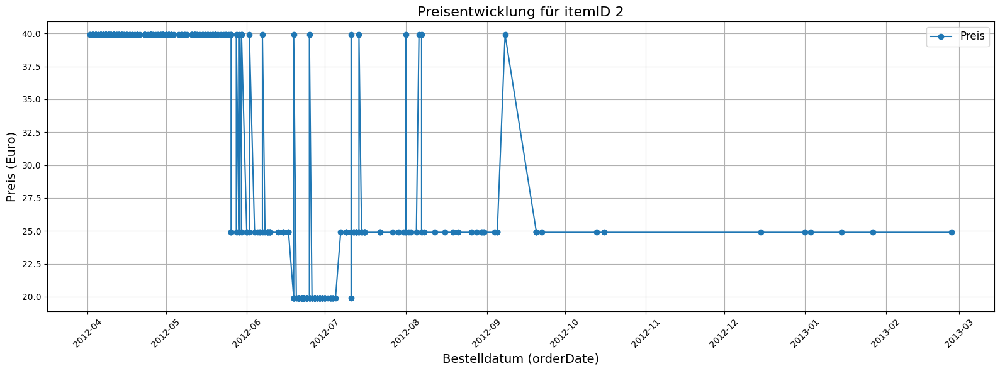

In [ ]:
import matplotlib.pyplot as plt

# Daten filtern: Nur für itemID 2
item_134_data = df13[df13['itemID'] == 2]

# Überprüfen, ob Daten für itemID 2 vorhanden sind
if item_134_data.empty:
    print("Keine Daten für itemID = 2 vorhanden.")
else:
    # Sortieren nach orderDate, falls nötig
    item_134_data = item_134_data.sort_values(by='orderDate')

    # Visualisierung der Preisentwicklung
    plt.figure(figsize=(16, 6))  # Breiteres Diagramm durch Erhöhen des ersten Werts in figsize
    plt.plot(item_134_data['orderDate'], item_134_data['price'], marker='o', linestyle='-', label='Preis')
    plt.title('Preisentwicklung für itemID 2', fontsize=16)
    plt.xlabel('Bestelldatum (orderDate)', fontsize=14)
    plt.ylabel('Preis (Euro)', fontsize=14)
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.legend(fontsize=12)
    plt.tight_layout()
    plt.show()


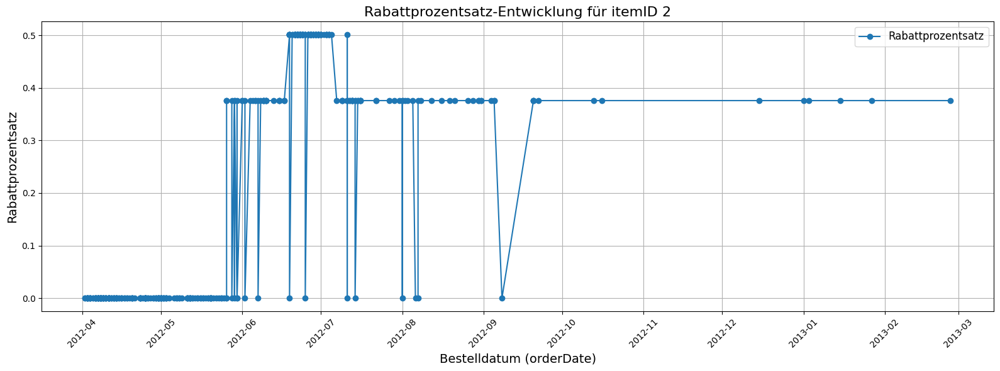

In [ ]:
import matplotlib.pyplot as plt

# Daten filtern: Nur für itemID 2
item_2_data = df13[df13['itemID'] == 2]

# Überprüfen, ob Daten für itemID 2 vorhanden sind
if item_2_data.empty:
    print("Keine Daten für itemID = 2 vorhanden.")
else:
    # Sortieren nach orderDate, falls nötig
    item_2_data = item_2_data.sort_values(by='orderDate')

    # Visualisierung der Rabattprozentsatz-Entwicklung
    plt.figure(figsize=(16, 6))  # Breiteres Diagramm durch Erhöhen des ersten Werts in figsize
    plt.plot(item_2_data['orderDate'], item_2_data['discount_percentage'], marker='o', linestyle='-', label='Rabattprozentsatz')
    plt.title('Rabattprozentsatz-Entwicklung für itemID 2', fontsize=16)
    plt.xlabel('Bestelldatum (orderDate)', fontsize=14)
    plt.ylabel('Rabattprozentsatz', fontsize=14)
    plt.xticks(rotation=45)
    plt.grid(True)
    plt.legend(fontsize=12)
    plt.tight_layout()
    plt.show()


In [ ]:
# Einzigartige Werte der Spalte discount_percentage
unique_values = df13['discount_percentage'].unique()

# Werte sortieren und anzeigen
unique_values_sorted = sorted(unique_values)
print("Einzigartige Werte in discount_percentage:")
print(unique_values_sorted)


Einzigartige Werte in discount_percentage:
[0.0, 0.00038476337052695264, 0.0006253908692932519, 0.0012515644555696204, 0.003334568358651313, 0.004524886877828038, 0.004739336492891044, 0.005297233666862855, 0.016680567139282787, 0.017889087656529523, 0.020010005002501274, 0.025015634771732298, 0.026684456304202797, 0.027797081306462856, 0.030627871362940318, 0.030792917628945315, 0.032284100080710254, 0.03290322580645155, 0.03336113427856546, 0.03472222222222221, 0.035739814152966454, 0.03639672429481344, 0.038486209108402836, 0.040000000000000036, 0.04112405757368065, 0.04446914952751524, 0.04449388209121241, 0.045475216007276, 0.04618937644341803, 0.04764173415912343, 0.04765687053216838, 0.04809523809523808, 0.049748743718592836, 0.04983277591973234, 0.04985673352435538, 0.049899799599198436, 0.04991652754590992, 0.049928469241774076, 0.0499374217772216, 0.0499443826473861, 0.04994994994995006, 0.049954504094631536, 0.04995829858215184, 0.04996150885296391, 0.0499736703528173, 0.050

In [ ]:
# Angepasste Bins für Rabatt
discount_bins = [-0.01, 0, 0.05, 0.2, 0.5, 1]  # Bereiche basieren auf der Verteilung
labels = ['No Discount', 'Low', 'Medium', 'High', 'Very High']

# Diskretisierung durchführen
df13['discount_bins_custom'] = pd.cut(
    df13['discount_percentage'],
    bins=discount_bins,
    labels=labels
)

# Ergebnis überprüfen
print(df13[['discount_percentage', 'discount_bins_custom']].head())


   discount_percentage discount_bins_custom
0             0.000000          No Discount
1             0.000000          No Discount
2             0.000000          No Discount
3             0.000000          No Discount
4             0.400802                 High


In [ ]:
# Label-Encoding
discount_encoding = {'No Discount': 0, 'Low': 1, 'Medium': 2, 'High': 3, 'Very High': 4}
df13['discount_bins_encoded'] = df13['discount_bins_custom'].map(discount_encoding)

# Ergebnis überprüfen
print(df13[['discount_bins_custom', 'discount_bins_encoded']].head())


  discount_bins_custom discount_bins_encoded
0          No Discount                     0
1          No Discount                     0
2          No Discount                     0
3          No Discount                     0
4                 High                     3


In [ ]:

#filtered_df12 = df13[(df13['deliveryDate'] == 'nan') ]
#df13_missing_delivery = df13[df13['deliveryDate'].isnull()]
#filtered_df12 = df13[(df13['customerID'] == 1317)& (df13['orderDate'] == '2012-04-01')]
#filtered_df12 = df13[(df13['customerID'] == 7824)& (df13['orderDate'] == '2013-03-31')]
#filtered_df12 = df13[(df13['customerID'] == 1360)& (df13['orderDate'] == '2012-04-01')]
#filtered_df12 = df13[(df13['customerID'] == 4390)& (df13['orderDate'] == '2013-03-31')]
filtered_df12 = df13[(df13['customerID'] == 491)& (df13['orderDate'] == '2012-04-02')]
#filtered_df12 = df[(df['customerID'] == 808)& (df['orderDate'] == '2012-04-02')]
#86558 2013-03-31
# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['itemID'	,'customerID','product_category'	,'category_count']]



,itemID,customerID,product_category,category_count


In [ ]:
# Importiere Pandas
import pandas as pd

# Stelle sicher, dass alle Spalten angezeigt werden
pd.set_option('display.max_columns', None)

# Gib die Namen aller Spalten aus
print("Spaltennamen der DataFrame:")
for column in df13.columns:
    print(column)



## duplicate_flag_by_cust_date_item
Anzahl der Vorkommen pro Kombination aus Kunde, Datum und Artikel-ID
Um ein Feature zu erstellen, das überprüft, ob es doppelte Produkte innerhalb derselben Kombination aus customerID, orderDate, product_category und size gibt, können wir die Gruppierung auf diese Spalten erweitern.

In [ ]:
# Anzahl der Vorkommen pro Kombination aus Kunde, Datum und Artikel-ID
df13['duplicate_flag_by_cust_date_item'] = (
    df13.groupby(['customerID', 'orderDate', 'itemID'])['itemID']
    .transform('count') > 1
)

# Konvertiere das Flag in 0 und 1
df13['duplicate_flag_by_cust_date_item'] = df13['duplicate_flag_by_cust_date_item'].astype(int)

# Ergebnisse überprüfen
print(df13[['customerID', 'orderDate', 'itemID', 'duplicate_flag_by_cust_date_item']].drop_duplicates())


        customerID  orderDate  itemID  duplicate_flag_by_cust_date_item
0                6 2012-04-19     261                                 0
1                6 2012-04-25      96                                 1
4                6 2012-09-23    1475                                 0
5                6 2012-09-23     250                                 0
6                6 2012-09-23     320                                 0
...            ...        ...     ...                               ...
441667       86609 2013-03-31    2334                                 1
441669       86610 2013-03-31    2669                                 0
441670       86611 2013-03-31    2458                                 0
441671       86611 2013-03-31    2659                                 0
441672       86611 2013-03-31    2375                                 0

[361238 rows x 4 columns]


## duplicate_flag_by_cust_date_cat_size
Anzahl der Vorkommen pro Kombination aus Kunde, Datum, Kategorie und Größe

In [ ]:
import pandas as pd


# Anzahl der Vorkommen pro Kombination aus Kunde, Datum, Kategorie und Größe
df13['duplicate_flag_by_cust_date_cat_size'] = (
    df13.groupby(['customerID', 'orderDate', 'product_category', 'size'])['itemID']
    .transform('count') > 1
)

# Konvertiere das Flag in 0 und 1
df13['duplicate_flag_by_cust_date_cat_size'] = df13['duplicate_flag_by_cust_date_cat_size'].astype(int)

# Ergebnisse überprüfen
print(df13[['customerID', 'orderDate', 'product_category', 'size', 'duplicate_flag_by_cust_date_cat_size']].drop_duplicates())


        customerID  orderDate product_category size  \
0                6 2012-04-19         Clothing    M   
1                6 2012-04-25         Clothing    M   
4                6 2012-09-23            Shoes   40   
6                6 2012-09-23            Shoes   38   
7                6 2012-09-23         Clothing    M   
...            ...        ...              ...  ...   
441660       86606 2013-03-31         Clothing    M   
441661       86606 2013-03-31         Clothing    L   
441667       86609 2013-03-31         Clothing  XXL   
441669       86610 2013-03-31            Shoes   39   
441670       86611 2013-03-31         Clothing  XXL   

        duplicate_flag_by_cust_date_cat_size  
0                                          0  
1                                          1  
4                                          1  
6                                          0  
7                                          1  
...                                      ...  
441660    

## count_by_cust_date_cat_size

In [ ]:
import pandas as pd

# Berechnung der Anzahl der Produkte pro Kombination aus Kunde, Datum, Kategorie und Größe
df13['count_by_cust_date_cat_size'] = (
    df13.groupby(['customerID', 'orderDate', 'product_category', 'size'])['itemID']
    .transform('count')
)

# Ergebnisse überprüfen
print(df13[['customerID', 'orderDate', 'product_category', 'size', 'count_by_cust_date_cat_size']].drop_duplicates())


        customerID  orderDate product_category size  \
0                6 2012-04-19         Clothing    M   
1                6 2012-04-25         Clothing    M   
4                6 2012-09-23            Shoes   40   
6                6 2012-09-23            Shoes   38   
7                6 2012-09-23         Clothing    M   
...            ...        ...              ...  ...   
441660       86606 2013-03-31         Clothing    M   
441661       86606 2013-03-31         Clothing    L   
441667       86609 2013-03-31         Clothing  XXL   
441669       86610 2013-03-31            Shoes   39   
441670       86611 2013-03-31         Clothing  XXL   

        count_by_cust_date_cat_size  
0                                 1  
1                                 3  
4                                 2  
6                                 1  
7                                 4  
...                             ...  
441660                            4  
441661                            3

## count_by_cust_date_itemID

In [ ]:
import pandas as pd

# Berechnung der Anzahl der Produkte pro Kombination aus Kunde, Datum, Kategorie und Größe
df13['count_by_cust_date_itemID'] = (
    df13.groupby(['customerID', 'orderDate', 'itemID'])['itemID']
    .transform('count')
)

# Ergebnisse überprüfen
print(df13[['customerID', 'orderDate', 'product_category', 'size', 'count_by_cust_date_itemID']].drop_duplicates())


        customerID  orderDate product_category size  count_by_cust_date_itemID
0                6 2012-04-19         Clothing    M                          1
1                6 2012-04-25         Clothing    M                          3
4                6 2012-09-23            Shoes   40                          1
6                6 2012-09-23            Shoes   38                          1
7                6 2012-09-23         Clothing    M                          3
...            ...        ...              ...  ...                        ...
441661       86606 2013-03-31         Clothing    L                          2
441662       86606 2013-03-31         Clothing    L                          1
441667       86609 2013-03-31         Clothing  XXL                          2
441669       86610 2013-03-31            Shoes   39                          1
441670       86611 2013-03-31         Clothing  XXL                          1

[282136 rows x 5 columns]


# Return-Rate

## Return Rate pro Größe und Produktkategorie

In [ ]:
# Gruppiere nach 'size' und 'product_category' und berechne die Gesamtanzahl und Rücksendeanzahl
return_rate = (
    df13.groupby(['product_category', 'size'])
    .agg(total_orders=('returnShipment', 'size'), total_returns=('returnShipment', 'sum'))
    .reset_index()
)

# Berechne die Return Rate
return_rate['return_rate_size_product_category'] = (return_rate['total_returns'] / return_rate['total_orders'])

# Sortiere nach 'product_category' und 'return_rate' absteigend
return_rate = return_rate.sort_values(by=['product_category', 'return_rate_size_product_category'], ascending=[True, False])

# Ergebnisse anzeigen
print(return_rate)

    product_category     size  total_orders  total_returns  \
2        Accessories      110             1              1   
6        Accessories       95             3              2   
0        Accessories      100            23             11   
3        Accessories       80             3              1   
7        Accessories  UNSIZED         25952           7249   
..               ...      ...           ...            ...   
80             Shoes       23            13              4   
121            Shoes       49             7              2   
119            Shoes       47           195             54   
73             Shoes     12.5             4              1   
79             Shoes       22             3              0   

     return_rate_size_product_category  
2                             1.000000  
6                             0.666667  
0                             0.478261  
3                             0.333333  
7                             0.279323  
..       

### merge return_rate_size_product_category with df13

In [ ]:
# Berechne die Return Rate
return_rate = (
    df13.groupby(['product_category', 'size'])
    .agg(total_orders=('returnShipment', 'size'), total_returns=('returnShipment', 'sum'))
    .reset_index()
)

# Berechne die Return Rate
return_rate['return_rate_size_product_category'] = (return_rate['total_returns'] / return_rate['total_orders'])

# Sortiere nach 'product_category' und 'return_rate' absteigend (optional)
return_rate = return_rate.sort_values(by=['product_category', 'return_rate_size_product_category'], ascending=[True, False])

# Merge die Return Rate mit df13
df13 = df13.merge(return_rate[['product_category', 'size', 'return_rate_size_product_category']], on=['product_category', 'size'], how='left')

# Ergebnisse anzeigen
print(df13.head())


   orderItemID   orderDate deliveryDate  itemID size  color  manufacturerID  \
0            1  2012-04-01   2012-04-03     186    M  denim              25   
1            2  2012-04-01   2012-04-03      71  9.5  ocher              21   
2            3  2012-04-01   2012-04-03      71  9.5  curry              21   
3            4  2012-04-02   2012-04-05      22    M  green              14   
4            5  2012-04-02   2012-04-05     151   39  black              53   

   price  customerID salutation dateOfBirth                 state  \
0  69.90         794        Mrs  1965-01-06    Baden-Wuerttemberg   
1  69.95         794        Mrs  1965-01-06    Baden-Wuerttemberg   
2  69.95         794        Mrs  1965-01-06    Baden-Wuerttemberg   
3  39.90         808        Mrs  1959-11-09                Saxony   
4  29.90         825        Mrs  1964-07-11  Rhineland-Palatinate   

  creationDate  returnShipment  non_null_delivery_count  \
0   2011-04-25               0                     

## Return Rate nach 'color' und 'product_category'

In [ ]:
# Berechne die Return Rate nach 'color' und 'product_category'
return_rate_color = (
    df13.groupby(['product_category', 'color'])
    .agg(total_orders=('returnShipment', 'size'), total_returns=('returnShipment', 'sum'))
    .reset_index()
)

# Berechne die Return Rate
return_rate_color['return_rate_color'] = (return_rate_color['total_returns'] / return_rate_color['total_orders'])

# Sortiere nach 'product_category' und 'return_rate' absteigend (optional)
return_rate_color = return_rate_color.sort_values(by=['product_category', 'return_rate_color'], ascending=[True, False])

# Merge die Return Rate nach 'color' mit df13
df13 = df13.merge(return_rate_color[['product_category', 'color', 'return_rate_color']], on=['product_category', 'color'], how='left', suffixes=('', '_color'))

# Ergebnisse anzeigen
print(df13.head())


   orderItemID   orderDate deliveryDate  itemID size  color  manufacturerID  \
0            1  2012-04-01   2012-04-03     186    M  denim              25   
1            2  2012-04-01   2012-04-03      71  9.5  ocher              21   
2            3  2012-04-01   2012-04-03      71  9.5  curry              21   
3            4  2012-04-02   2012-04-05      22    M  green              14   
4            5  2012-04-02   2012-04-05     151   39  black              53   

   price  customerID salutation dateOfBirth                 state  \
0  69.90         794        Mrs  1965-01-06    Baden-Wuerttemberg   
1  69.95         794        Mrs  1965-01-06    Baden-Wuerttemberg   
2  69.95         794        Mrs  1965-01-06    Baden-Wuerttemberg   
3  39.90         808        Mrs  1959-11-09                Saxony   
4  29.90         825        Mrs  1964-07-11  Rhineland-Palatinate   

  creationDate  returnShipment  non_null_delivery_count  \
0   2011-04-25               0                     

## duplicate_flag_by_cust_date_cat_size_return_rate

In [ ]:
# Schritt 1: Gruppierung und Berechnung der Werte für Duplikate
duplicate_orders = (
    df13[df13['duplicate_flag_by_cust_date_cat_size'] == 1]  # Nur Duplikate auswählen
    .groupby(['customerID', 'orderDate', 'product_category', 'size'])
    .agg(order_count=('itemID', 'size'),  # Anzahl der Bestellungen
         return_count=('returnShipment', 'sum'))  # Summe der Rücksendungen
    .reset_index()
)

# Schritt 2: Berechnung der Rücksendequote
duplicate_orders['duplicate_flag_by_cust_date_cat_size_return_rate'] = duplicate_orders['return_count'] / duplicate_orders['order_count']

# Schritt 3: Merge der berechneten Werte zurück in df13
df13 = df13.merge(
    duplicate_orders,
    on=['customerID', 'orderDate', 'product_category', 'size'],  # Verknüpfungskriterien
    how='left'  # Nutze 'left', um die Struktur von df13 zu behalten
)

# Schritt 4: Nach dem Merge: Fehlende Werte auffüllen und unnötige Spalten entfernen
df13['duplicate_flag_by_cust_date_cat_size_return_rate'] = df13['duplicate_flag_by_cust_date_cat_size_return_rate'].fillna(0)
df13.loc[df13['duplicate_flag_by_cust_date_cat_size'] == 0, 'duplicate_flag_by_cust_date_cat_size_return_rate'] = 0

# Entferne die Spalten 'order_count' und 'return_count', da sie nicht benötigt werden
df13 = df13.drop(columns=['order_count', 'return_count'], errors='ignore')




KeyError: 'duplicate_flag_by_cust_date_cat_size'

In [ ]:
# Ensures all columns are shown
pd.set_option('display.max_columns', None)

# Now print all columns with their names
print(df13.columns)


Index(['orderItemID', 'orderDate', 'deliveryDate', 'itemID', 'size', 'color',
       'manufacturerID', 'price', 'customerID', 'salutation', 'dateOfBirth',
       'state', 'creationDate', 'returnShipment', 'non_null_delivery_count',
       'unique_delivery_dates', 'deliveryTime', 'age', 'color_miss',
       'color_hex', 'color_rgb', 'r', 'g', 'b', 'size_false',
       'customer_return_rate', 'item_rto_percentage',
       'manufacturer_rto_percentage', 'order_count', 'return_count',
       'duplicate_item_return_rate', 'multiple_order_flag',
       'similar_product_count_size', 'similar_product_count_color',
       'similar_product_return_rate', 'product_category', 'international_size',
       'size_category', 'size_category_encoded', 'international_UK_size',
       'sub_category', 'target_group', 'order_key', 'category_count',
       'manufacturer_count', 'count_without_size', 'count_without_color',
       'similar_product_count_size_color', 'total_products_in_cart',
       'free_return

## check 'duplicate_flag_by_cust_date_item', 'duplicate_item_return_rate', count_by_cust_date_itemID

In [ ]:

#filtered_df1 = df13[(df13['price'] == 289) ]
filtered_df12 = df13[(df13['customerID'] == 6) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]
#filtered_df12 = df13[(df13['duplicate_flag_by_cust_date_cat_size'] == 1)& (df13['count_by_cust_date_cat_size'] == 4) &(df13['customerID'] == 1331) ]
#filtered_df12 = df13[(df13['duplicate_flag_by_cust_date_cat_size'] == 1)& (df13['count_by_cust_date_cat_size'] == 34)& (df13['customerID'] == 85913)]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
#filtered_df12[['customerID', 'orderDate','itemID','product_category', 'size', 'duplicate_flag_by_cust_date_cat_size','duplicate_flag_by_cust_date_cat_size_return_rate','category_count','duplicate_flag_by_cust_date_cat_size','count_by_cust_date_cat_size','returnShipment']]
filtered_df12[['customerID', 'orderDate','itemID', 'duplicate_flag_by_cust_date_cat_size_return_rate','duplicate_flag_by_cust_date_cat_size','count_by_cust_date_cat_size','duplicate_item_return_rate','duplicate_flag_by_cust_date_item','returnShipment']]


,customerID,orderDate,itemID,duplicate_flag_by_cust_date_cat_size_return_rate,duplicate_flag_by_cust_date_cat_size,count_by_cust_date_cat_size,duplicate_item_return_rate,duplicate_flag_by_cust_date_item,returnShipment
0,6,2012-04-19,261,0.000000,0,1,0.000000,0,0
1,6,2012-04-25,96,0.333333,1,3,0.333333,1,1
2,6,2012-04-25,96,0.333333,1,3,0.333333,1,0
3,6,2012-04-25,96,0.333333,1,3,0.333333,1,0
4,6,2012-09-23,1475,0.000000,1,2,0.000000,0,0
5,6,2012-09-23,250,0.000000,1,2,0.000000,0,0
6,6,2012-09-23,320,0.000000,0,1,0.000000,0,1
7,6,2012-09-23,1404,0.500000,1,4,0.666667,1,1
8,6,2012-09-23,1404,0.500000,1,4,0.666667,1,0
9,6,2012-09-23,1404,0.500000,1,4,0.666667,1,1


In [ ]:
df13[['itemID', 'count_by_cust_date_cat_size','duplicate_item_return_rate','duplicate_flag_by_cust_date_item','returnShipment']].drop_duplicates()


,itemID,count_by_cust_date_cat_size,duplicate_item_return_rate,duplicate_flag_by_cust_date_item,returnShipment
0,261,1,0.000000,0,0
1,96,3,0.333333,1,1
2,96,3,0.333333,1,0
4,1475,2,0.000000,0,0
5,250,2,0.000000,0,0
...,...,...,...,...,...
441403,2344,1,0.666667,1,1
441404,2344,2,0.666667,1,0
441430,2419,13,1.000000,1,1
441531,2831,3,0.000000,0,1


In [ ]:
# Filter von df13 für die spezifischen Bedingungen
filtered_df13 = df13[
    #(df13['itemID'] == 2592) &
    (df13['count_by_cust_date_itemID'] == 6) &
    (df13['returnShipment'] == 1) &
    (df13['duplicate_flag_by_cust_date_item'] == 1)
]

# Berechnung des Durchschnittswerts für 'duplicate_flag_by_cust_date_cat_size_return_rate'
average_return_rate = filtered_df13['duplicate_item_return_rate'].mean()

# Ausgabe der gefilterten Daten und des Durchschnittswerts
print("Gefilterte Daten aus df13:")
print(filtered_df13[['itemID', 'count_by_cust_date_itemID', 'duplicate_flag_by_cust_date_item', 'duplicate_item_return_rate']].drop_duplicates())

print(f"\nBerechneter Durchschnittswert für 'duplicate_flag_by_cust_date_cat_size_return_rate': {average_return_rate}")


Gefilterte Daten aus df13:
        itemID  count_by_cust_date_itemID  duplicate_flag_by_cust_date_item  \
1248        32                          6                                 1   
2198       156                          6                                 1   
4610      3044                          6                                 1   
6125      2465                          6                                 1   
8413      2408                          6                                 1   
...        ...                        ...                               ...   
432046    3044                          6                                 1   
432126    2377                          6                                 1   
435972    2505                          6                                 1   
437918    2417                          6                                 1   
438749    2547                          6                                 1   

        duplicate_item_r

In [ ]:
filtered_df13[['itemID', 'count_by_cust_date_itemID', 'duplicate_flag_by_cust_date_item', 'duplicate_item_return_rate']].drop_duplicates()
#filtered_df13[['itemID', 'count_by_cust_date_itemID', 'duplicate_flag_by_cust_date_item', 'duplicate_item_return_rate']]

,itemID,count_by_cust_date_itemID,duplicate_flag_by_cust_date_item,duplicate_item_return_rate
1248,32,6,1,0.666667
2198,156,6,1,0.833333
4610,3044,6,1,1.000000
6125,2465,6,1,0.333333
8413,2408,6,1,0.500000
...,...,...,...,...
432046,3044,6,1,0.500000
432126,2377,6,1,0.833333
435972,2505,6,1,0.666667
437918,2417,6,1,0.500000


## return_rate_product_category_size

In [ ]:
# Gruppierung nach Produktkategorie, Artikel und Größe
category_analysis = df13.groupby(['product_category', 'size']).agg(
    total_orders=('returnShipment', 'count'),
    total_returns=('returnShipment', 'sum')
).reset_index()

# Rücksendequote berechnen
category_analysis['return_rate_product_category_size'] = (category_analysis['total_returns'] / category_analysis['total_orders'])

# Sortieren nach Rücksendequote
category_analysis_sorted = category_analysis.sort_values(by='return_rate_product_category_size', ascending=False)

# Ergebnisse anzeigen
category_analysis_sorted

# Merge category_analysis_sorted with df13
df13 = df13.merge(
    category_analysis_sorted[['product_category', 'size', 'return_rate_product_category_size']],
    on=['product_category', 'size'],
    how='left'
)
df13[['customerID', 'orderDate','product_category',	'size',		'return_rate_product_category_size']]

,customerID,orderDate,product_category,size,return_rate_product_category_size
0,794,2012-04-01,Clothing,M,0.471924
1,794,2012-04-01,Shoes,9.5,0.494505
2,794,2012-04-01,Shoes,9.5,0.494505
3,808,2012-04-02,Clothing,M,0.471924
4,825,2012-04-02,Shoes,39,0.504912
...,...,...,...,...,...
481087,7032,2013-03-31,Shoes,39.5,0.506410
481088,86610,2013-03-31,Shoes,39,0.504912
481089,86611,2013-03-31,Clothing,XXL,0.456408
481090,86611,2013-03-31,Clothing,XXL,0.456408


## 'order_count', 'return_count', 'order_diff'

In [ ]:
# Ensures all columns are shown
pd.set_option('display.max_columns', None)
# Now print all columns with their names
print(df13.columns)


Index(['orderItemID', 'orderDate', 'deliveryDate', 'itemID', 'size', 'color',
       'manufacturerID', 'price', 'customerID', 'salutation', 'dateOfBirth',
       'state', 'creationDate', 'returnShipment', 'non_null_delivery_count',
       'unique_delivery_dates', 'deliveryTime', 'age', 'color_miss',
       'color_hex', 'color_rgb', 'r', 'g', 'b', 'size_false',
       'customer_return_rate', 'item_rto_percentage',
       'manufacturer_rto_percentage', 'order_count', 'return_count',
       'duplicate_item_return_rate', 'multiple_order_flag',
       'similar_product_count_size', 'similar_product_count_color',
       'similar_product_return_rate', 'product_category', 'international_size',
       'size_category', 'size_category_encoded', 'international_UK_size',
       'sub_category', 'target_group', 'order_key', 'category_count',
       'manufacturer_count', 'count_without_size', 'count_without_color',
       'similar_product_count_size_color', 'total_products_in_cart',
       'free_return

In [ ]:
# Drop 'order_count' and 'return_count' columns from df9
#df13 = df13.drop(columns=['order_count_x', 'return_count_x',
      # 'order_count_y',
      # 'return_count_y'])


KeyError: "['order_count_x', 'return_count_x', 'order_count_y', 'return_count_y'] not found in axis"

In [ ]:
# Step 1: Group by 'customerID' and 'orderDate' to calculate total orders and returns
# For each unique customer and order date, calculate:
# 1. Total number of items ordered (order_count)
# 2. Total number of items returned (return_count)
customer_order_summary = (
    df13.groupby(['customerID', 'orderDate'])
    .agg(order_count=('orderItemID', 'size'),         # Count of total orders (number of unique items)
         return_count=('returnShipment', 'sum'))      # Sum of returns for each order date
    .reset_index()
)

# Step 2: Calculate the difference between order_count and return_count
# This difference indicates how many items were ordered but not returned
customer_order_summary['order_diff'] = customer_order_summary['order_count'] - customer_order_summary['return_count']

# Step 3: Merge the summary back into the main DataFrame
# Add these calculated fields back to the main DataFrame for each customer and date
df13 = df13.merge(customer_order_summary[['customerID', 'orderDate', 'order_count', 'return_count', 'order_diff']],
              on=['customerID', 'orderDate'],
              how='left')

# Display the resulting DataFrame to check the new features
print(df13[['customerID', 'orderDate', 'order_count', 'return_count', 'order_diff']].head())


In [ ]:


filtered_df12 = df13[df13['itemID'] == 96] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

#filtered_df12 = df13[df13['itemID'] == 134]
#filtered_df12 = df13[df13['itemID'] == 156] # 23,24 36 38 40 Clothing
##filtered_df12 = df13[(df13['customerID'] == 5991) ]
#filtered_df12 = df13[(df13['customerID'] == 491) ]
#filtered_df12 = df13[(df13['customerID'] == 348) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]
#filtered_df12 = df13[(df13['customerID'] == 6) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'price', 'highest_price_item', 'discount_percentage', 'discount_rank', 'price_rank', 'min_discount_item', 'max_discount_item','mean_discount_item', 'min_price_item', 'max_price_item', 'mean_price_item']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
#filtered_df12[['customerID', 'orderDate', 'itemID','product_category', 'size', 'duplicate_flag_by_cust_date_cat_size']]
filtered_df12[['customerID', 'itemID','orderDate', 'order_count', 'return_count', 'order_diff']]






**Spalte: `category_count`**
- **Regel**: Zählt, wie viele Produkte in derselben Kategorie (`product_category`) im Warenkorb (gleicher `customerID` und `orderDate`) sind.
- **Überprüfung**:
  - Beispiel: Zeile 24723:
    - `customerID`: 6
    - `orderDate`: 2012-04-19
    - `product_category`: Clothing
    - Es gibt nur **1 Produkt** in der Kategorie Clothing für diesen Kunden und dieses Datum.
    - **Wert korrekt**: 1.

  - Beispiel: Zeilen 226242 bis 226248:
    - `customerID`: 6
    - `orderDate`: 2012-09-23
    - Kategorien:
      - Shoes: 3 Produkte (Zeilen 226242, 226243, 226244)
      - Clothing: 4 Produkte (Zeilen 226245, 226246, 226247, 226248)
    - **Werte korrekt**.

---

**Spalte: `manufacturer_count`**
- **Regel**: Zählt, wie viele Produkte desselben Herstellers (`manufacturerID`) im Warenkorb (gleicher `customerID` und `orderDate`) sind.
- **Überprüfung**:
  - Beispiel: Zeile 240277:
    - `manufacturerID`: 50
    - `customerID`: 6
    - `orderDate`: 2012-10-06
    - Es gibt **1 Produkt** des Herstellers 50 für diesen Kunden und dieses Datum.
    - **Wert korrekt**: 1.

  - Beispiel: Zeilen 240281 und 240282:
    - `manufacturerID`: 6
    - `customerID`: 6
    - `orderDate`: 2012-10-06
    - Es gibt **2 Produkte** des Herstellers 6 für diesen Kunden und dieses Datum.
    - **Werte korrekt**.

---

**Spalte: `exact_product_count`**
- **Regel**: Zählt, wie oft ein identisches Produkt (gleiche `itemID`, `size`, `color`) im Warenkorb (gleicher `customerID` und `orderDate`) vorkommt.
- **Überprüfung**:
  - Beispiel: Zeile 240282:
    - `itemID`: 1498
    - `size`: 36
    - `color`: green
    - Es gibt **1 identisches Produkt** im Warenkorb.
    - **Wert korrekt**: 1.

  - Beispiel: Zeilen 240281 und 240282:
    - Beide Zeilen haben denselben `itemID` und `color`, aber unterschiedliche Größen.
    - Deshalb wird jede Kombination als einzigartig betrachtet.
    - **Werte korrekt**.

---

**Spalte: `count_without_size`**
- **Regel**: Zählt, wie viele Produkte dieselben Eigenschaften aufweisen, mit Ausnahme der Größe (`size`).
- **Überprüfung**:
  - Beispiel: Zeilen 240281 und 240282:
    - `itemID`: 1498
    - `color`: green
    - Produkte haben identische Eigenschaften, außer der Größe.
    - Es gibt **2 Produkte**, die dieselben Eigenschaften aufweisen, außer der Größe.
    - **Wert korrekt**: 2.

  - Beispiel: Zeile 331324:
    - `itemID`: 2440
    - `color`: aquamarine
    - Es gibt nur **1 Produkt**, das dieselben Eigenschaften hat (ohne Größe).
    - **Wert korrekt**: 1.

---

**Fazit:**
Alle Berechnungen für die Spalten `category_count`, `manufacturer_count`, `exact_product_count` und `count_without_size` scheinen korrekt zu sein. Die Werte entsprechen den Regeln und den bereitgestellten Daten.

## Calculate summary statistics for each product category
## Calculate return rate for each product category


In [ ]:
import pandas as pd

# Calculate summary statistics for each product category
category_analysis = df13.groupby('product_category').agg(
    total_orders=('returnShipment', 'count'),
    total_returns=('returnShipment', 'sum')
).reset_index()

# Calculate return rate for each product category
category_analysis['return_rate'] = (category_analysis['total_returns'] / category_analysis['total_orders']) * 100

# Display the results
print(category_analysis)

# Optionally, sort the data for better readability
category_analysis = category_analysis.sort_values(by='return_rate', ascending=False)

# Save the analysis to a CSV file if needed
category_analysis.to_csv('category_analysis.csv', index=False)


  product_category  total_orders  total_returns  return_rate
0      Accessories         26012           7267    27.937106
1         Clothing        267100         127476    47.725945
2            Shoes        187980          97348    51.786360


## number of orders pro size

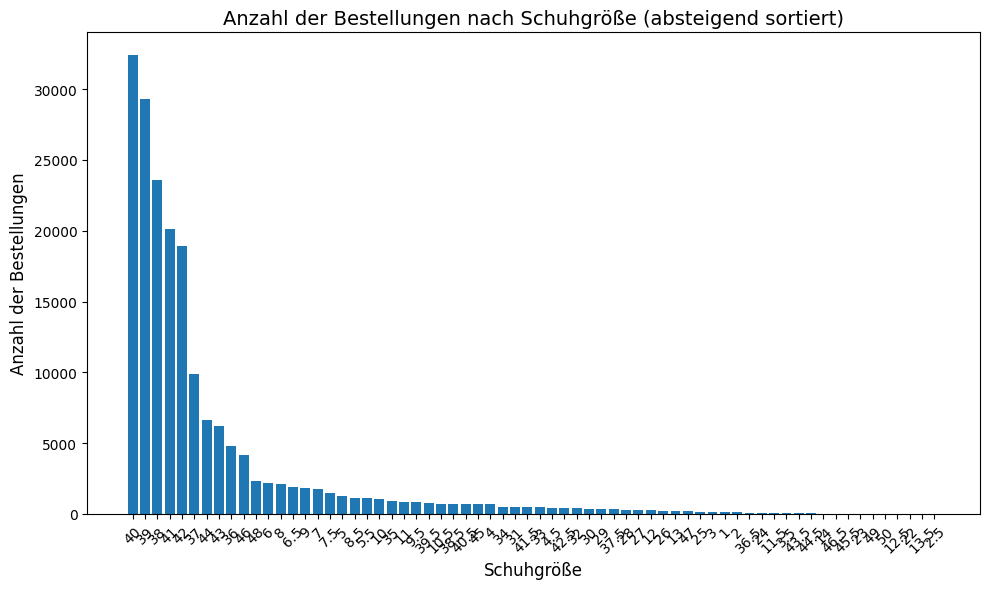

In [ ]:
import matplotlib.pyplot as plt

# Filtern der Daten für Schuhe
shoes_data = df13[df13['product_category'] == 'Shoes']

# Berechnung der Anzahl der Bestellungen pro Größe
size_counts = shoes_data.groupby('size').size().reset_index(name='total_orders')

# Sortieren nach der Anzahl der Bestellungen in absteigender Reihenfolge
size_counts = size_counts.sort_values(by='total_orders', ascending=False)

# Diagramm erstellen
plt.figure(figsize=(10, 6))
plt.bar(size_counts['size'], size_counts['total_orders'])
plt.xlabel('Schuhgröße', fontsize=12)
plt.ylabel('Anzahl der Bestellungen', fontsize=12)
plt.title('Anzahl der Bestellungen nach Schuhgröße (absteigend sortiert)', fontsize=14)
plt.xticks(rotation=45, fontsize=10)
plt.tight_layout()
plt.show()


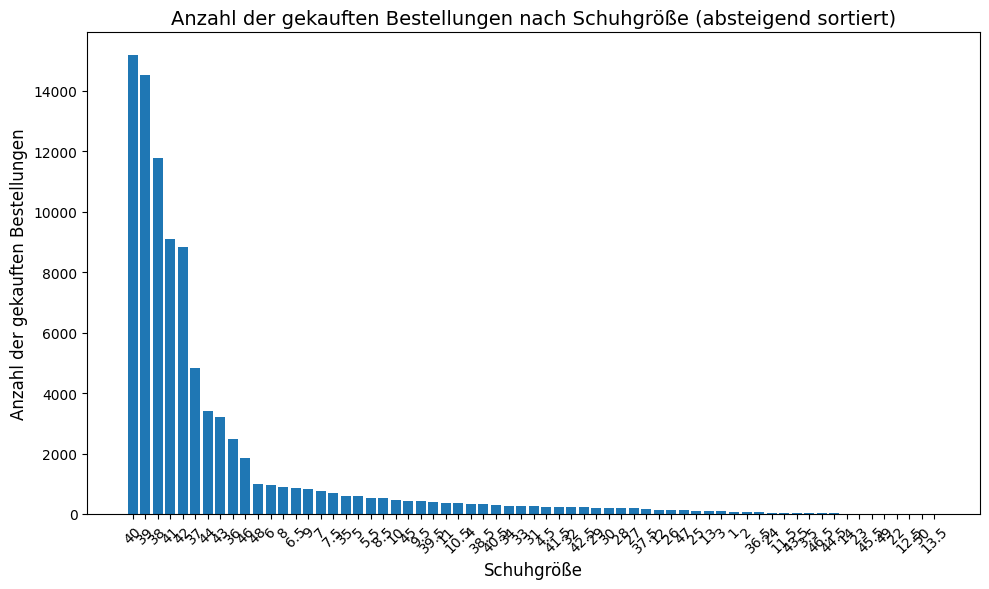

In [ ]:
import matplotlib.pyplot as plt

# Filtern der Daten für Schuhe, die nicht zurückgegeben wurden
purchased_shoes_data = df13[(df13['product_category'] == 'Shoes') & (df13['returnShipment'] == 0)]

# Berechnung der Anzahl der Bestellungen pro Größe
purchased_size_counts = purchased_shoes_data.groupby('size').size().reset_index(name='total_purchased')

# Sortieren nach der Anzahl der Bestellungen in absteigender Reihenfolge
purchased_size_counts = purchased_size_counts.sort_values(by='total_purchased', ascending=False)

# Diagramm erstellen
plt.figure(figsize=(10, 6))
plt.bar(purchased_size_counts['size'], purchased_size_counts['total_purchased'])
plt.xlabel('Schuhgröße', fontsize=12)
plt.ylabel('Anzahl der gekauften Bestellungen', fontsize=12)
plt.title('Anzahl der gekauften Bestellungen nach Schuhgröße (absteigend sortiert)', fontsize=14)
plt.xticks(rotation=45, fontsize=10)
plt.tight_layout()
plt.show()


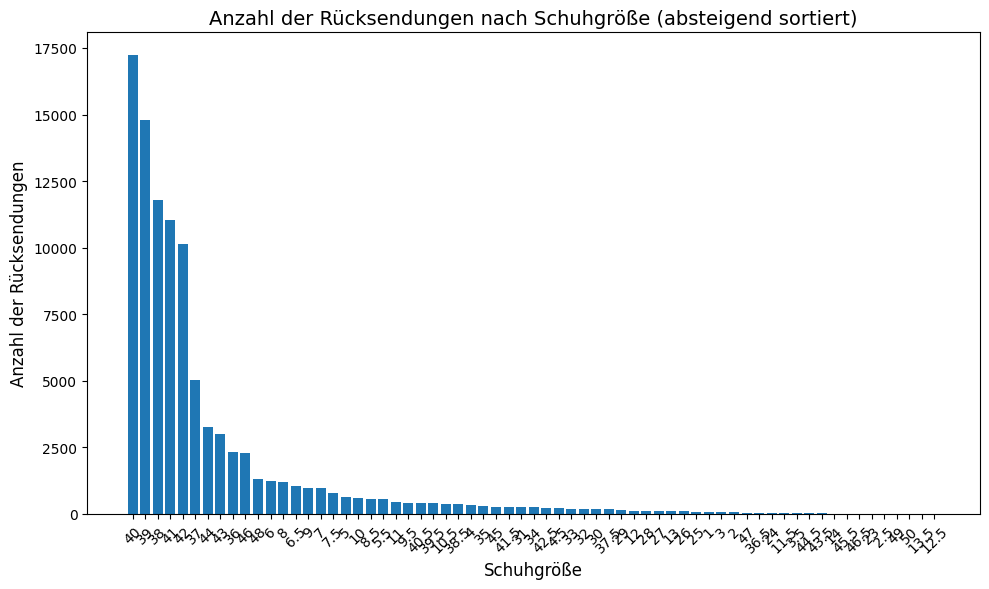

In [ ]:
import matplotlib.pyplot as plt

# Filtern der Daten für Schuhe, die zurückgesendet wurden
returned_shoes_data = df13[(df13['product_category'] == 'Shoes') & (df13['returnShipment'] == 1)]

# Berechnung der Anzahl der Rücksendungen pro Größe
returned_size_counts = returned_shoes_data.groupby('size').size().reset_index(name='total_returns')

# Sortieren nach der Anzahl der Rücksendungen in absteigender Reihenfolge
returned_size_counts = returned_size_counts.sort_values(by='total_returns', ascending=False)

# Diagramm erstellen
plt.figure(figsize=(10, 6))
plt.bar(returned_size_counts['size'], returned_size_counts['total_returns'])
plt.xlabel('Schuhgröße', fontsize=12)
plt.ylabel('Anzahl der Rücksendungen', fontsize=12)
plt.title('Anzahl der Rücksendungen nach Schuhgröße (absteigend sortiert)', fontsize=14)
plt.xticks(rotation=45, fontsize=10)
plt.tight_layout()
plt.show()


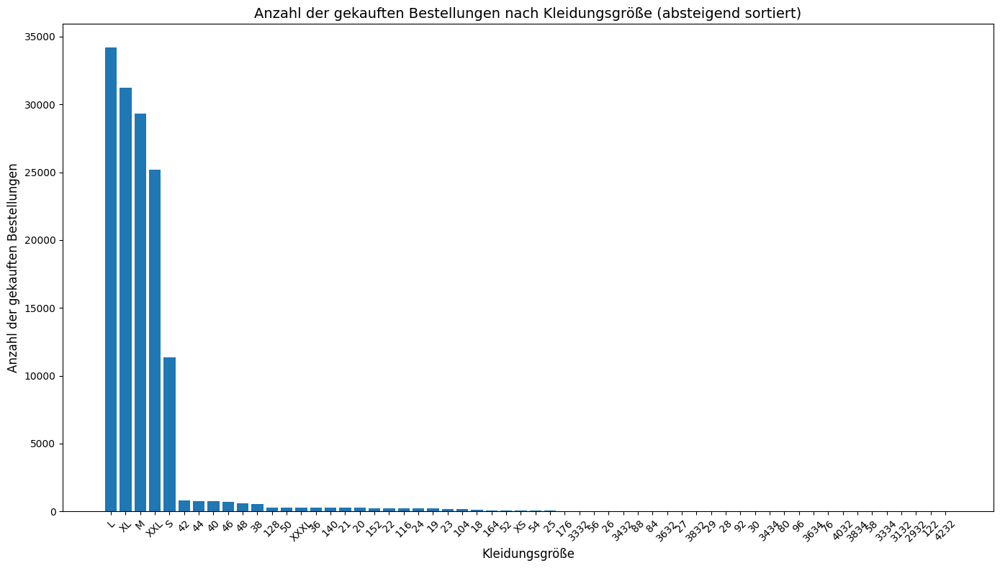

In [ ]:
# Filtern der Daten für Kleidung, die zurückgesendet wurde
returned_clothing_data = df13[(df13['product_category'] == 'Clothing') & (df13['returnShipment'] == 0)]

# Berechnung der Anzahl der Rücksendungen pro Größe
returned_clothing_size_counts = returned_clothing_data.groupby('size').size().reset_index(name='total_returns')

# Sortieren nach der Anzahl der Rücksendungen in absteigender Reihenfolge
returned_clothing_size_counts = returned_clothing_size_counts.sort_values(by='total_returns', ascending=False)

plt.figure(figsize=(14, 8))  # Erhöhe die Breite (14) und die Höhe (8)
plt.bar(returned_clothing_size_counts['size'], returned_clothing_size_counts['total_returns'])
plt.xlabel('Kleidungsgröße', fontsize=12)
plt.ylabel('Anzahl der gekauften Bestellungen', fontsize=12)
plt.title('Anzahl der gekauften Bestellungen nach Kleidungsgröße (absteigend sortiert)', fontsize=14)
plt.xticks(rotation=45, fontsize=10)
plt.tight_layout()
plt.show()



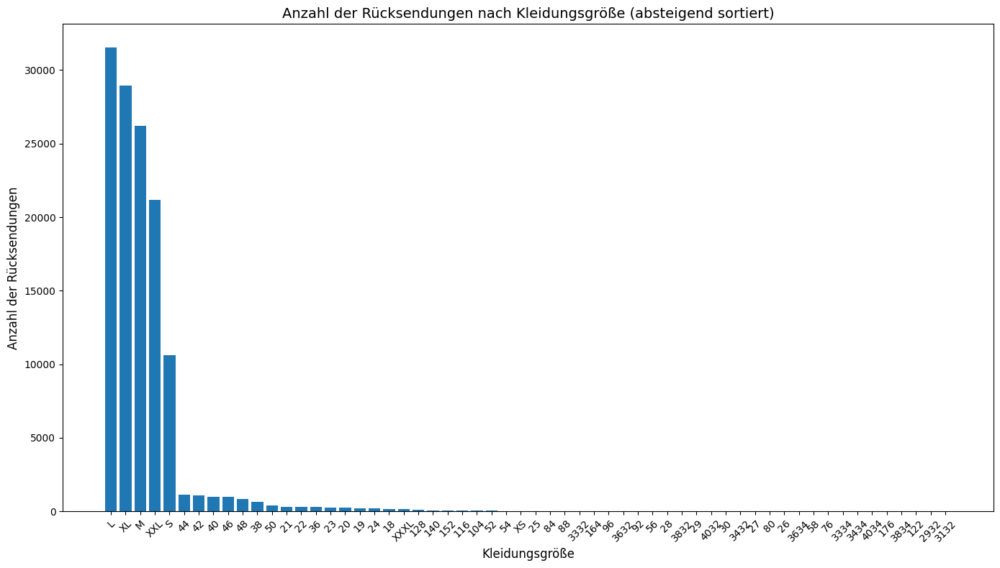

In [ ]:
# Filtern der Daten für Kleidung, die zurückgesendet wurde
returned_clothing_data = df13[(df13['product_category'] == 'Clothing') & (df13['returnShipment'] == 1)]

# Berechnung der Anzahl der Rücksendungen pro Größe
returned_clothing_size_counts = returned_clothing_data.groupby('size').size().reset_index(name='total_returns')

# Sortieren nach der Anzahl der Rücksendungen in absteigender Reihenfolge
returned_clothing_size_counts = returned_clothing_size_counts.sort_values(by='total_returns', ascending=False)

plt.figure(figsize=(14, 8))  # Erhöhe die Breite (14) und die Höhe (8)
plt.bar(returned_clothing_size_counts['size'], returned_clothing_size_counts['total_returns'])
plt.xlabel('Kleidungsgröße', fontsize=12)
plt.ylabel('Anzahl der Rücksendungen', fontsize=12)
plt.title('Anzahl der Rücksendungen nach Kleidungsgröße (absteigend sortiert)', fontsize=14)
plt.xticks(rotation=45, fontsize=10)
plt.tight_layout()
plt.show()



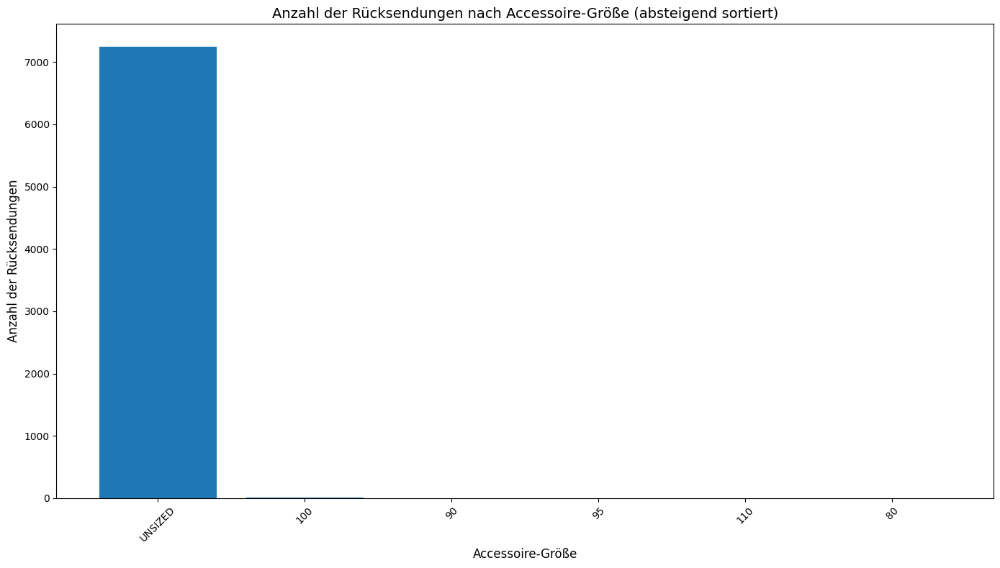

In [ ]:
# Filtern der Daten für Accessoires, die zurückgesendet wurden
returned_accessories_data = df13[(df13['product_category'] == 'Accessories') & (df13['returnShipment'] == 1)]

# Berechnung der Anzahl der Rücksendungen pro Größe
returned_accessories_size_counts = returned_accessories_data.groupby('size').size().reset_index(name='total_returns')

# Sortieren nach der Anzahl der Rücksendungen in absteigender Reihenfolge
returned_accessories_size_counts = returned_accessories_size_counts.sort_values(by='total_returns', ascending=False)

# Diagramm erstellen
plt.figure(figsize=(14, 8))  # Breiteres Diagramm für bessere Lesbarkeit
plt.bar(returned_accessories_size_counts['size'], returned_accessories_size_counts['total_returns'])
plt.xlabel('Accessoire-Größe', fontsize=12)
plt.ylabel('Anzahl der Rücksendungen', fontsize=12)
plt.title('Anzahl der Rücksendungen nach Accessoire-Größe (absteigend sortiert)', fontsize=14)
plt.xticks(rotation=45, fontsize=10)
plt.tight_layout()
plt.show()


## return_rate_product_category


In [ ]:
# Rücksendequote pro Produktkategorie berechnen
category_summary = df13.groupby('product_category').agg(
    total_returns=('returnShipment', 'sum'),
    total_orders=('returnShipment', 'count')
).reset_index()

# Rücksendequote berechnen
category_summary['return_rate_product_category'] = (category_summary['total_returns'] / category_summary['total_orders'])

# Rücksendequote mit dem Haupt-Dataset verbinden
df13 = df13.merge(category_summary[['product_category', 'return_rate_product_category']], on='product_category', how='left')


In [ ]:
df13[['itemID', 'size', 'return_rate_product_category']]

,itemID,size,return_rate_product_category
0,186,M,0.477259
1,71,9.5,0.517864
2,71,9.5,0.517864
3,22,M,0.477259
4,151,39,0.517864
...,...,...,...
481087,2561,39.5,0.517864
481088,2669,39,0.517864
481089,2458,XXL,0.477259
481090,2659,XXL,0.477259


## return_rate_size_itemid


In [ ]:
# Importiere Pandas
import pandas as pd

# Stelle sicher, dass alle Spalten angezeigt werden
pd.set_option('display.max_columns', None)

# Gib die Namen aller Spalten aus
print("Spaltennamen der DataFrame:")
for column in df13.columns:
    print(column)


Spaltennamen der DataFrame:
orderItemID
orderDate
deliveryDate
itemID
size
color
manufacturerID
price
customerID
salutation
dateOfBirth
state
creationDate
returnShipment
non_null_delivery_count
unique_delivery_dates
deliveryTime
age
color_miss
color_hex
color_rgb
r
g
b
size_false
customer_return_rate
item_rto_percentage
manufacturer_rto_percentage
order_count
return_count
duplicate_item_return_rate
multiple_order_flag
similar_product_count_size
similar_product_count_color
similar_product_return_rate
product_category
international_size
size_category
size_category_encoded
international_UK_size
sub_category
target_group
order_key
category_count
manufacturer_count
count_without_size
count_without_color
similar_product_count_size_color
total_products_in_cart
free_return
highest_price_item
discount_percentage
discount_rank
price_rank
min_discount_item
max_discount_item
mean_discount_item
min_price_item
max_price_item
mean_price_item
discount_bins_custom
discount_bins_encoded
return_rate_size

In [ ]:
# Drop 'order_count' and 'return_count' columns from df9
#df13 = df13.drop(columns=['return_rate_size_itemid_y','return_rate_size_itemid_x'])


In [ ]:
# Rücksendequote pro Artikel und Größe berechnen
item_size_return_rate = df13.groupby(['itemID', 'size']).agg(
    total_orders=('returnShipment', 'count'),
    total_returns=('returnShipment', 'sum')
).reset_index()

item_size_return_rate['return_rate_size_itemid'] = (item_size_return_rate['total_returns'] / item_size_return_rate['total_orders'])

# Feature hinzufügen
df13 = df13.merge(item_size_return_rate[['itemID', 'size', 'return_rate_size_itemid']], on=['itemID', 'size'], how='left')


In [ ]:
df13[['itemID', 'size', 'return_rate_size_itemid']]

,itemID,size,return_rate_size_itemid
0,186,M,0.573770
1,71,9.5,0.629630
2,71,9.5,0.629630
3,22,M,0.454690
4,151,39,0.619048
...,...,...,...
481087,2561,39.5,0.625000
481088,2669,39,0.612245
481089,2458,XXL,0.652174
481090,2659,XXL,0.615385


In [ ]:


#filtered_df12 = df13[df13['itemID'] == 134] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

filtered_df12 = df13[df13['itemID'] == 134]
#filtered_df12 = df13[df13['itemID'] == 156] # 23,24 36 38 40 Clothing
#filtered_df12 = df13[(df13['price'] == 289) ]
#filtered_df12 = df13[(df13['customerID'] == 348) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['itemID', 'size', 'return_rate_size_itemid','returnShipment']]


,itemID,size,return_rate_size_itemid,returnShipment
363,134,34,0.285714,1
1087,134,35,0.000000,0
1088,134,36,0.250000,1
11953,134,29,0.285714,0
12050,134,33,0.333333,1
13294,134,33,0.333333,0
13559,134,37,0.400000,1
15478,134,28,0.200000,0
16769,134,37,0.400000,0
16914,134,36,0.250000,0


## return_rate_size_category_itemid

In [ ]:
# Importiere Pandas
import pandas as pd

# Stelle sicher, dass alle Spalten angezeigt werden
pd.set_option('display.max_columns', None)

# Gib die Namen aller Spalten aus
print("Spaltennamen der DataFrame:")
for column in df13.columns:
    print(column)


Spaltennamen der DataFrame:
orderItemID
orderDate
deliveryDate
itemID
size
color
manufacturerID
price
customerID
salutation
dateOfBirth
state
creationDate
returnShipment
non_null_delivery_count
unique_delivery_dates
deliveryTime
age
color_miss
color_hex
color_rgb
r
g
b
size_false
customer_return_rate
item_rto_percentage
manufacturer_rto_percentage
order_count
return_count
duplicate_item_return_rate
multiple_order_flag
similar_product_count_size
similar_product_count_color
similar_product_return_rate
product_category
international_size
size_category
size_category_encoded
international_UK_size
sub_category
target_group
order_key
category_count
manufacturer_count
count_without_size
count_without_color
similar_product_count_size_color
total_products_in_cart
free_return
highest_price_item
discount_percentage
discount_rank
price_rank
min_discount_item
max_discount_item
mean_discount_item
min_price_item
max_price_item
mean_price_item
discount_bins_custom
discount_bins_encoded
return_rate_size

In [ ]:
# Rücksendequote pro Artikel und size_category berechnen
item_size_category_return_rate = df13.groupby(['itemID', 'size_category']).agg(
    total_orders_size_category=('returnShipment', 'count'),
    total_returns_size_category=('returnShipment', 'sum')
).reset_index()

item_size_category_return_rate['return_rate_size_category_itemid'] = (
    item_size_category_return_rate['total_returns_size_category'] / item_size_category_return_rate['total_orders_size_category']
)

# Feature hinzufügen
df13 = df13.merge(
    item_size_category_return_rate[['itemID', 'size_category', 'return_rate_size_category_itemid']],
    on=['itemID', 'size_category'],
    how='left'
)

# Ergebnisse überprüfen
print(df13[['itemID', 'size_category', 'return_rate_size_category_itemid']].drop_duplicates().head())


   itemID  size_category  return_rate_size_category_itemid
0     186  international                          0.643087
1      71             UK                          0.610020
3      22  international                          0.447011
4     151             EU                          0.588235
5     598  international                          0.768116


## return_rate_color_itemid

In [ ]:
# Rücksendequote pro Artikel (itemID) und Farbe (color) berechnen
item_color_return_rate = df13.groupby(['itemID', 'color']).agg(
    total_orders=('returnShipment', 'count'),  # Gesamtanzahl der Bestellungen
    total_returns=('returnShipment', 'sum')   # Gesamtanzahl der Rücksendungen
).reset_index()

# Rücksendequote berechnen
item_color_return_rate['return_rate_color_itemid'] = (
    item_color_return_rate['total_returns'] / item_color_return_rate['total_orders']
)

# Feature hinzufügen
df13 = df13.merge(
    item_color_return_rate[['itemID', 'color', 'return_rate_color_itemid']],
    on=['itemID', 'color'],
    how='left'
)

# Ergebnisse überprüfen
print(df13[['itemID', 'color', 'return_rate_color_itemid']].drop_duplicates().head())


   itemID  color  return_rate_color_itemid
0     186  denim                  0.655172
1      71  ocher                  0.572816
2      71  curry                  0.630252
3      22  green                  0.448171
4     151  black                  0.714286


## return_rate_cutomer_product

In [ ]:
# Berechne die Rückgabequote (return rate) pro Kunde und Produkt
customer_item_interaction = df13.groupby(['customerID', 'itemID'])['returnShipment'].agg(
    total_purchases='count',       # Anzahl der Käufe für diese Kombination
    total_returns='sum'            # Anzahl der Rücksendungen für diese Kombination
).reset_index()

# Rückgabequote berechnen
customer_item_interaction['return_rate_cutomer_product'] = (
    customer_item_interaction['total_returns'] / customer_item_interaction['total_purchases']
)

# Merge die neuen Features zurück in df13
df13 = df13.merge(customer_item_interaction[['customerID', 'itemID', 'return_rate_cutomer_product']],
                  on=['customerID', 'itemID'], how='left')

# Ergebnis überprüfen
print(df13[['customerID', 'itemID', 'return_rate_cutomer_product']].head())


   customerID  itemID  return_rate_cutomer_product
0         794     186                          0.0
1         794      71                          1.0
2         794      71                          1.0
3         808      22                          0.0
4         825     151                          0.0


## return_rate_size_manufacturer

In [ ]:
# Rücksendequote pro Hersteller (manufacturerID) und Größe (size) berechnen
manufacturer_size_return_rate = df13.groupby(['manufacturerID', 'size']).agg(
    total_orders=('returnShipment', 'count'),  # Gesamtanzahl der Bestellungen
    total_returns=('returnShipment', 'sum')   # Gesamtanzahl der Rücksendungen
).reset_index()

# Rücksendequote berechnen
manufacturer_size_return_rate['return_rate_size_manufacturer'] = (
    manufacturer_size_return_rate['total_returns'] / manufacturer_size_return_rate['total_orders']
)

# Feature hinzufügen
df13 = df13.merge(
    manufacturer_size_return_rate[['manufacturerID', 'size', 'return_rate_size_manufacturer']],
    on=['manufacturerID', 'size'],
    how='left'
)

# Ergebnisse überprüfen
print(df13[['manufacturerID', 'size', 'return_rate_size_manufacturer']].drop_duplicates().head())


   manufacturerID size  return_rate_size_manufacturer
0              25    M                       0.558824
1              21  9.5                       0.529740
3              14    M                       0.496732
4              53   39                       0.581022
5              87  XXL                       0.630303


## target_group_return_rate

In [ ]:
def calculate_return_rate(df):
    # Überprüfen, ob die Spalte 'returnShipment' existiert
    if 'returnShipment' not in df.columns:
        raise ValueError("Die Spalte 'returnShipment' fehlt. Sie wird benötigt, um die Rücksendequote zu berechnen.")

    # Berechnung der Rücksendequote pro `target_group`
    return_rates = df.groupby('target_group').agg(
        total_orders=('returnShipment', 'count'),
        total_returns=('returnShipment', 'sum')
    )
    return_rates['return_rate'] = return_rates['total_returns'] / return_rates['total_orders']

    # Mapping der Rücksendequote zurück in das Haupt-Dataset
    df['target_group_return_rate'] = df['target_group'].map(return_rates['return_rate'])

    return df, return_rates

# Anwenden der Funktion auf df13
df13, return_rates_summary = calculate_return_rate(df13)

# Ergebnisse anzeigen
print("Rücksendequote für jede Zielgruppe:")
print(return_rates_summary)

# Zeige die ersten Zeilen mit dem neuen Feature
print(df13.head())


Rücksendequote für jede Zielgruppe:
              total_orders  total_returns  return_rate
target_group                                          
kids                  6678           2458     0.368074
men                  54718          27797     0.508005
unisex                3029           1514     0.499835
women               416667         200322     0.480772
   orderItemID   orderDate deliveryDate  itemID size  color  manufacturerID  \
0            1  2012-04-01   2012-04-03     186    M  denim              25   
1            2  2012-04-01   2012-04-03      71  9.5  ocher              21   
2            3  2012-04-01   2012-04-03      71  9.5  curry              21   
3            4  2012-04-02   2012-04-05      22    M  green              14   
4            5  2012-04-02   2012-04-05     151   39  black              53   

   price  customerID salutation dateOfBirth                 state  \
0  69.90         794        Mrs  1965-01-06    Baden-Wuerttemberg   
1  69.95         794 

## customer_size_category_return_rate

In [ ]:
def calculate_customer_size_category_return_rate(df):
    # Überprüfen, ob die Spalte 'returnShipment' existiert
    if 'returnShipment' not in df.columns:
        raise ValueError("Die Spalte 'returnShipment' fehlt. Sie wird benötigt, um die Rücksendequote zu berechnen.")

    # Berechnung der Rücksendequote pro Kunde und size_category
    return_rates = df.groupby(['customerID', 'size_category']).agg(
        total_orders=('returnShipment', 'count'),
        total_returns=('returnShipment', 'sum')
    )
    return_rates['return_rate'] = return_rates['total_returns'] / return_rates['total_orders']

    # Zurück in das Haupt-Dataset mappen
    df = df.merge(
        return_rates[['return_rate']],
        on=['customerID', 'size_category'],
        how='left',
        suffixes=('', '_customer_size_category')
    )

    # Spalte umbenennen
    df.rename(columns={'return_rate': 'customer_size_category_return_rate'}, inplace=True)

    return df, return_rates

# Anwenden der Funktion auf df13
df13, customer_size_category_return_rates = calculate_customer_size_category_return_rate(df13)

# Ergebnisse anzeigen
print("Rücksendequote pro Kunde und size_category:")
print(customer_size_category_return_rates)

# Zeige die ersten Zeilen mit dem neuen Feature
#print(df13.head())


Rücksendequote pro Kunde und size_category:
                          total_orders  total_returns  return_rate
customerID size_category                                          
6          EU                        7              4     0.571429
           UNSIZED                   2              0     0.000000
           international            16              6     0.375000
9          EU                       10              7     0.700000
           UK                        4              3     0.750000
...                                ...            ...          ...
86604      EU                        3              1     0.333333
86606      international             7              2     0.285714
86609      international             2              0     0.000000
86610      EU                        1              0     0.000000
86611      international             3              0     0.000000

[116017 rows x 3 columns]


In [ ]:
df13

,orderItemID,orderDate,deliveryDate,itemID,size,color,manufacturerID,price,customerID,salutation,dateOfBirth,state,creationDate,returnShipment,non_null_delivery_count,unique_delivery_dates,deliveryTime,age,color_miss,color_hex,color_rgb,r,g,b,size_false,customer_return_rate,item_rto_percentage,manufacturer_rto_percentage,order_count,return_count,duplicate_item_return_rate,multiple_order_flag,similar_product_count_size,similar_product_count_color,similar_product_return_rate,product_category,international_size,size_category,size_category_encoded,international_UK_size,sub_category,target_group,order_key,category_count,manufacturer_count,count_without_size,count_without_color,similar_product_count_size_color,total_products_in_cart,free_return,highest_price_item,discount_percentage,discount_rank,price_rank,min_discount_item,max_discount_item,mean_discount_item,min_price_item,max_price_item,mean_price_item,discount_bins_custom,discount_bins_encoded,return_rate_size_product_category,return_rate_color,return_rate_product_category_size,return_rate_product_category,return_rate_size_itemid,return_rate_size_category_itemid,return_rate_color_itemid,return_rate_cutomer_product,return_rate_size_manufacturer,target_group_return_rate,customer_size_category_return_rate
0,1,2012-04-01,2012-04-03,186,M,denim,25,69.90,794,Mrs,1965-01-06 00:00:00.000,Baden-Wuerttemberg,2011-04-25,0,3,1,2,47,denim,#2243b6,"(34, 67, 182)",34,67,182,m,0.454545,0.643087,0.629746,1,0,0.0,0,0,0,0.0,Clothing,M,international,3,M,women_Tops,women,794_2012-04-01,1,1,1,1,0,3,1,69.90,0.000000,1.0,1.0,0.049928,0.429185,0.006082,39.90,69.90,69.474855,No Discount,0,0.471924,0.547246,0.471924,0.477259,0.573770,0.643087,0.655172,0.0,0.558824,0.480772,0.500000
1,2,2012-04-01,2012-04-03,71,9.5,ocher,21,69.95,794,Mrs,1965-01-06 00:00:00.000,Baden-Wuerttemberg,2011-04-25,1,3,1,2,47,ocher,#bf9b0c,"(191, 155, 12)",191,155,12,9+,0.454545,0.610020,0.572734,2,2,1.0,1,1,1,1.0,Shoes,9.5,UK,1,9.5,men_Shoes,men,794_2012-04-01,2,2,1,2,1,3,1,69.95,0.000000,1.0,2.0,0.285919,0.500357,0.171331,34.95,69.95,57.965422,No Discount,0,0.494505,0.562449,0.494505,0.517864,0.629630,0.610020,0.572816,1.0,0.529740,0.508005,1.000000
2,3,2012-04-01,2012-04-03,71,9.5,curry,21,69.95,794,Mrs,1965-01-06 00:00:00.000,Baden-Wuerttemberg,2011-04-25,1,3,1,2,47,curry,#d6a332,"(214, 163, 50)",214,163,50,9+,0.454545,0.610020,0.572734,2,2,1.0,1,1,1,1.0,Shoes,9.5,UK,1,9.5,men_Shoes,men,794_2012-04-01,2,2,1,2,1,3,1,69.95,0.000000,1.0,2.0,0.285919,0.500357,0.171331,34.95,69.95,57.965422,No Discount,0,0.494505,0.553517,0.494505,0.517864,0.629630,0.610020,0.630252,1.0,0.529740,0.508005,1.000000
3,4,2012-04-02,2012-04-05,22,M,green,14,39.90,808,Mrs,1959-11-09 00:00:00.000,Saxony,2012-01-04,0,0,0,3,52,green,#00ff00,"(0, 255, 0)",0,255,0,m,0.000000,0.447011,0.521854,1,0,0.0,0,0,0,0.0,Clothing,M,international,3,M,women_Tops,women,808_2012-04-02,1,1,1,1,0,1,0,39.90,0.000000,1.0,1.0,0.250627,0.501253,0.220547,19.90,39.90,31.100181,No Discount,0,0.471924,0.456041,0.471924,0.477259,0.454690,0.447011,0.448171,0.0,0.496732,0.480772,0.000000
4,5,2012-04-02,2012-04-05,151,39,black,53,29.90,825,Mrs,1964-07-11 00:00:00.000,Rhineland-Palatinate,2011-02-16,0,0,0,3,47,black,#000000,"(0, 0, 0)",0,0,0,39,0.111111,0.588235,0.611319,1,0,0.0,0,0,0,0.0,Shoes,6,EU,0,6,women_Shoes,women,825_2012-04-02,2,1,1,1,0,3,0,49.90,0.400802,3.0,1.0,0.400802,0.501002,0.445990,24.90,49.90,27.645098,High,3,0.504912,0.540322,0.504912,0.517864,0.619048,0.588235,0.714286,0.0,0.581022,0.480772,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
481087,481088,2013-03-31,2013-04-09,2561,39.5,blue,1,139.90,7032,Mr,1962-12-17 00:00:00.000,Lower Saxony,2011-03-12,1,2,1,9,50,blue,#0000ff,"(0, 0, 255)",0,0,255,39+,0.762712,0.6612

## customer_sub_category_return_rate

In [ ]:
def calculate_customer_sub_category_return_rate(df):
    # Überprüfen, ob die Spalte 'returnShipment' existiert
    if 'returnShipment' not in df.columns:
        raise ValueError("Die Spalte 'returnShipment' fehlt. Sie wird benötigt, um die Rücksendequote zu berechnen.")

    # Berechnung der Rücksendequote pro Kunde und sub_category
    return_rates = df.groupby(['customerID', 'sub_category']).agg(
        total_orders=('returnShipment', 'count'),
        total_returns=('returnShipment', 'sum')
    )
    return_rates['return_rate'] = return_rates['total_returns'] / return_rates['total_orders']

    # Zurück in das Haupt-Dataset mappen
    df = df.merge(
        return_rates[['return_rate']],
        on=['customerID', 'sub_category'],
        how='left',
        suffixes=('', '_customer_sub_category')
    )

    # Spalte umbenennen
    df.rename(columns={'return_rate': 'customer_sub_category_return_rate'}, inplace=True)

    return df, return_rates

# Anwenden der Funktion auf df13
df13, customer_sub_category_return_rates = calculate_customer_sub_category_return_rate(df13)

# Ergebnisse anzeigen
print("Rücksendequote pro Kunde und sub_category:")
print(customer_sub_category_return_rates)

# Zeige die ersten Zeilen mit dem neuen Feature
print(df13.head())


Rücksendequote pro Kunde und sub_category:
                              total_orders  total_returns  return_rate
customerID sub_category                                               
6          women_Accessories             2              0     0.000000
           women_Shoes                   7              4     0.571429
           women_Tops                   16              6     0.375000
9          kids_Shoes                    3              3     1.000000
           men_Shoes                     3              2     0.666667
...                                    ...            ...          ...
86604      women_Shoes                   3              1     0.333333
86606      women_Tops                    7              2     0.285714
86609      women_Tops                    2              0     0.000000
86610      women_Shoes                   1              0     0.000000
86611      women_Tops                    3              0     0.000000

[122129 rows x 3 columns]
   orde

## customer_international_UK_return_rate

In [ ]:
def calculate_customer_international_UK_return_rate(df):
    # Überprüfen, ob die Spalte 'returnShipment' existiert
    if 'returnShipment' not in df.columns:
        raise ValueError("Die Spalte 'returnShipment' fehlt. Sie wird benötigt, um die Rücksendequote zu berechnen.")

    # Berechnung der Rücksendequote pro Kunde und international_UK_size
    return_rates = df.groupby(['customerID', 'international_UK_size']).agg(
        total_orders=('returnShipment', 'count'),
        total_returns=('returnShipment', 'sum')
    )
    return_rates['return_rate'] = return_rates['total_returns'] / return_rates['total_orders']

    # Zurück in das Haupt-Dataset mappen
    df = df.merge(
        return_rates[['return_rate']],
        on=['customerID', 'international_UK_size'],
        how='left',
        suffixes=('', '_customer_international_UK_size')
    )

    # Spalte umbenennen
    df.rename(columns={'return_rate': 'customer_international_UK_return_rate'}, inplace=True)

    return df, return_rates

# Anwenden der Funktion auf df13
df13, customer_international_UK_return_rates = calculate_customer_international_UK_return_rate(df13)

# Ergebnisse anzeigen
print("Rücksendequote pro Kunde und international_UK_size:")
print(customer_international_UK_return_rates)

# Zeige die ersten Zeilen mit dem neuen Feature
print(df13.head())


Rücksendequote pro Kunde und international_UK_size:
                                  total_orders  total_returns  return_rate
customerID international_UK_size                                          
6          3                                 1              1     1.000000
           5                                 4              3     0.750000
           6.5                               2              0     0.000000
           L                                 1              1     1.000000
           M                                15              5     0.333333
...                                        ...            ...          ...
86606      L                                 3              2     0.666667
           M                                 4              0     0.000000
86609      XXL                               2              0     0.000000
86610      6                                 1              0     0.000000
86611      XXL                               3  

In [ ]:
df13[['customerID','product_category', 'size', 'international_UK_size']].drop_duplicates()

,customerID,product_category,size,international_UK_size
0,794,Clothing,M,M
1,794,Shoes,9.5,9.5
3,808,Clothing,M,M
4,825,Shoes,39,6
5,825,Clothing,XXL,XXL
...,...,...,...,...
481077,86606,Clothing,M,M
481078,86606,Clothing,L,L
481084,86609,Clothing,XXL,XXL
481088,86610,Shoes,39,6


In [ ]:

#filtered_df12 = df13[(df13['customerID'] == 6) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = orders_class2[(orders_class2['customerID'] == 6) ]
#filtered_df12 = orders_class2[(orders_class2['size'] == 'M') ]


# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
#filtered_df12[['customerID','product_category', 'size', 'international_UK_size','customer_international_UK_return_rate']]



## sub_category_size_return_rate

In [ ]:
def calculate_return_rate_by_sub_category_and_size(df):
    # Überprüfen, ob die Spalte 'returnShipment' existiert
    if 'returnShipment' not in df.columns:
        raise ValueError("Die Spalte 'returnShipment' fehlt. Sie wird benötigt, um die Rücksendequote zu berechnen.")

    # Berechnung der Rücksendequote pro sub_category und international_UK_size
    return_rates = df.groupby(['sub_category', 'international_UK_size']).agg(
        total_orders=('returnShipment', 'count'),
        total_returns=('returnShipment', 'sum')
    )
    return_rates['return_rate'] = return_rates['total_returns'] / return_rates['total_orders']

    # Zurück in das Haupt-Dataset mappen
    df = df.merge(
        return_rates[['return_rate']],
        on=['sub_category', 'international_UK_size'],
        how='left',
        suffixes=('', '_sub_category_size')
    )

    # Spalte umbenennen
    df.rename(columns={'return_rate': 'sub_category_size_return_rate'}, inplace=True)

    return df, return_rates

# Anwenden der Funktion auf df13
df13, sub_category_size_return_rates = calculate_return_rate_by_sub_category_and_size(df13)

# Ergebnisse anzeigen
print("Rücksendequote pro sub_category und international_UK_size:")
print(sub_category_size_return_rates)

# Zeige die ersten Zeilen mit dem neuen Feature
print(df13.head())


Rücksendequote pro sub_category und international_UK_size:
                                    total_orders  total_returns  return_rate
sub_category international_UK_size                                          
Belts        100-Accessories                  20             11     0.550000
             105-Accessories                   1              0     0.000000
             110-Accessories                   1              1     1.000000
             80-Accessories                    3              1     0.333333
             85-Accessories                    1              0     0.000000
...                                          ...            ...          ...
women_Tops   S                             20004          10576     0.528694
             XL                            54676          28433     0.520027
             XS                               71             32     0.450704
             XXL                           42094          20798     0.494085
             XXXL

## item_internationalsize_return_rate

In [ ]:
def calculate_return_rate_by_item_and_size(df):
    # Überprüfen, ob die Spalte 'returnShipment' existiert
    if 'returnShipment' not in df.columns:
        raise ValueError("Die Spalte 'returnShipment' fehlt. Sie wird benötigt, um die Rücksendequote zu berechnen.")

    # Berechnung der Rücksendequote pro itemID und international_UK_size
    return_rates = df.groupby(['itemID', 'international_UK_size']).agg(
        total_orders=('returnShipment', 'count'),
        total_returns=('returnShipment', 'sum')
    )
    return_rates['return_rate'] = return_rates['total_returns'] / return_rates['total_orders']

    # Zurück in das Haupt-Dataset mappen
    df = df.merge(
        return_rates[['return_rate']],
        on=['itemID', 'international_UK_size'],
        how='left',
        suffixes=('', '_item_size')
    )

    # Spalte umbenennen
    df.rename(columns={'return_rate': 'item_internationalsize_return_rate'}, inplace=True)

    return df, return_rates

# Anwenden der Funktion auf df13
df13, item_size_return_rates = calculate_return_rate_by_item_and_size(df13)

# Ergebnisse anzeigen
print("Rücksendequote pro itemID und international_UK_size:")
print(item_size_return_rates)

# Zeige die ersten Zeilen mit dem neuen Feature
print(df13.head())


Rücksendequote pro itemID und international_UK_size:
                              total_orders  total_returns  return_rate
itemID international_UK_size                                          
1      3                                14              8     0.571429
       3.5                               8              5     0.625000
       4                                27             15     0.555556
       4.5                              34             22     0.647059
       5                                58             34     0.586207
...                                    ...            ...          ...
3067   5                                 1              0     0.000000
3068   6                                 1              0     0.000000
       6.5                               1              1     1.000000
3069   UNSIZED-Accessories              76              9     0.118421
3070   6                                 1              0     0.000000

[14676 rows x 3 columns

# Saisonale Features

## availability_season/ first_availability_date


In [ ]:
import pandas as pd

# Annahme: df13 enthält die Spalten 'itemID' und 'orderDate'
# Sicherstellen, dass 'orderDate' als Datumsformat vorliegt
df13['orderDate'] = pd.to_datetime(df13['orderDate'])

# 1. first_availability_date: Erster Tag, an dem ein Artikel verfügbar war
first_availability_date = df13.groupby('itemID')['orderDate'].min().reset_index()
first_availability_date.rename(columns={'orderDate': 'first_availability_date'}, inplace=True)

# 2. availability_season: Saison des Artikels basierend auf 'first_availability_date'
def determine_season(month):
    if month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    elif month in [9, 10, 11]:
        return 'Autumn'
    else:
        return 'Winter'

first_availability_date['availability_season'] = first_availability_date['first_availability_date'].dt.month.apply(determine_season)

# Merge die saisonalen Features zurück in den Hauptdatensatz
df13 = df13.merge(first_availability_date, on='itemID', how='left')

# Ergebnisse anzeigen
print(df13[['itemID', 'first_availability_date', 'availability_season']].drop_duplicates())


        itemID first_availability_date availability_season
0          186              2012-04-01              Spring
1           71              2012-04-01              Spring
3           22              2012-04-01              Spring
4          151              2012-04-02              Spring
5          598              2012-04-01              Spring
...        ...                     ...                 ...
454958    3067              2013-03-17              Spring
459459    3068              2013-03-19              Spring
463150    3069              2013-03-21              Spring
467960    3070              2013-03-24              Spring
472466    3071              2013-03-26              Spring

[3007 rows x 3 columns]


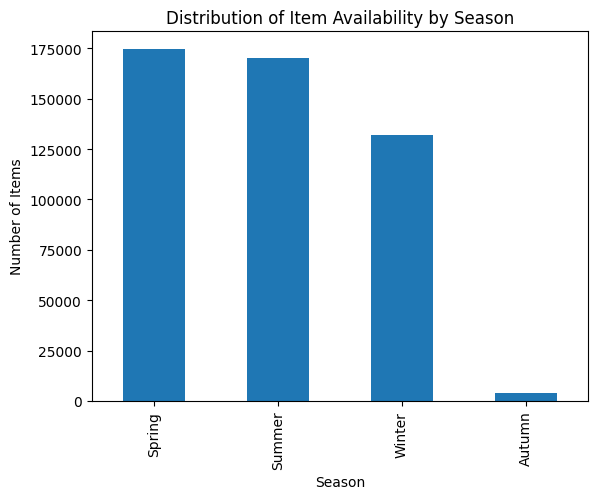

In [ ]:
# Zähle die Anzahl der Artikel pro Saison
season_distribution = df13['availability_season'].value_counts()

# Visualisierung (z. B. Balkendiagramm)
import matplotlib.pyplot as plt

season_distribution.plot(kind='bar')
plt.title('Distribution of Item Availability by Season')
plt.xlabel('Season')
plt.ylabel('Number of Items')
plt.show()


availability_season
Autumn    66.525257
Spring    58.203362
Summer    82.513285
Winter    70.445777
Name: price, dtype: float64


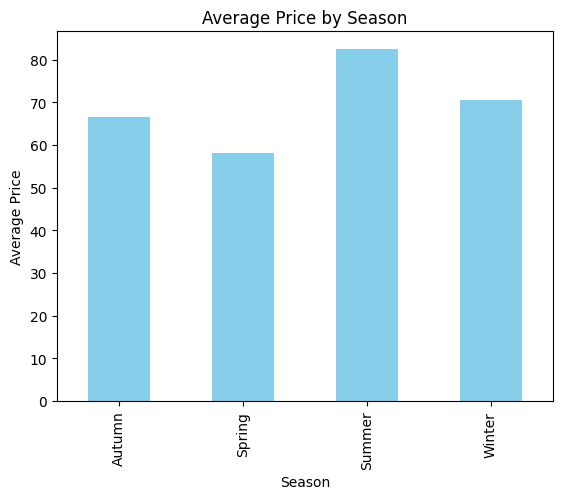

In [ ]:
avg_price_per_season = df13.groupby('availability_season')['price'].mean()
print(avg_price_per_season)

# Visualisierung
avg_price_per_season.plot(kind='bar', color='skyblue')
plt.title('Average Price by Season')
plt.xlabel('Season')
plt.ylabel('Average Price')
plt.show()


availability_season
Autumn    0.484086
Spring    0.473742
Summer    0.471511
Winter    0.507941
Name: returnShipment, dtype: float64


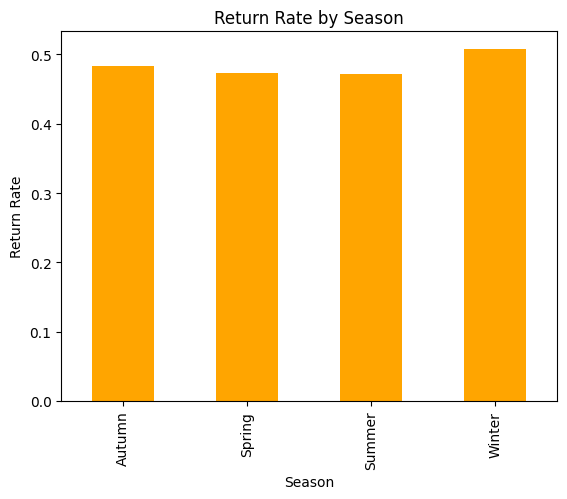

In [ ]:
# Rücksendequote pro Saison berechnen
return_rate_per_season = df13.groupby('availability_season')['returnShipment'].mean()
print(return_rate_per_season)

# Visualisierung
return_rate_per_season.plot(kind='bar', color='orange')
plt.title('Return Rate by Season')
plt.xlabel('Season')
plt.ylabel('Return Rate')
plt.show()


availability_season
Autumn      3896
Spring    174690
Summer    170414
Winter    132092
Name: sales, dtype: int64


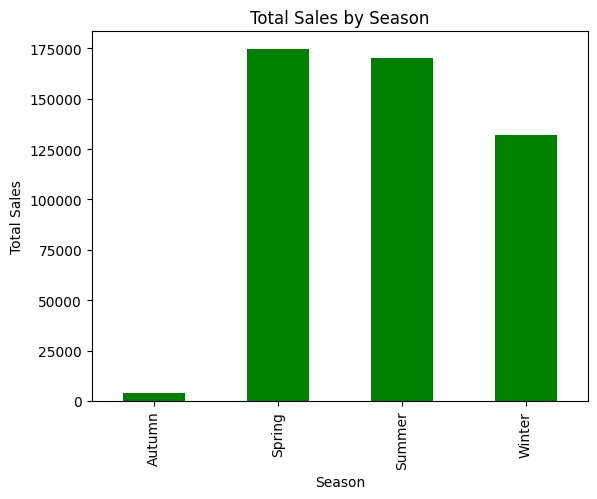

In [ ]:
# Erstelle eine Spalte für Verkäufe (angenommen, jede Zeile entspricht einem Verkauf)
df13['sales'] = 1

# Durchschnittliche Verkaufszahlen pro Saison
avg_sales_per_season = df13.groupby('availability_season')['sales'].sum()
print(avg_sales_per_season)

# Visualisierung
avg_sales_per_season.plot(kind='bar', color='green')
plt.title('Total Sales by Season')
plt.xlabel('Season')
plt.ylabel('Total Sales')
plt.show()


availability_year
2012    2288
2013     719
Name: itemID, dtype: int64


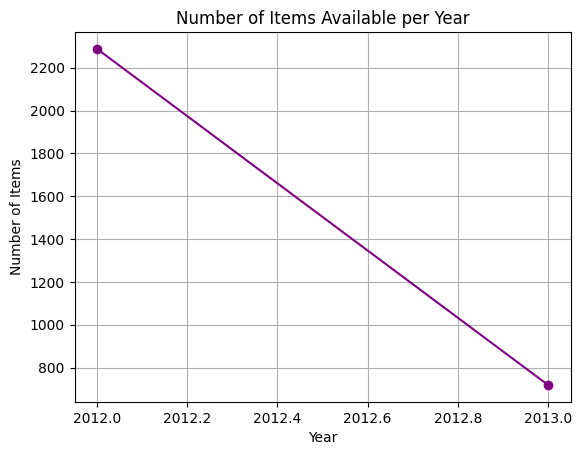

In [ ]:
# Extrahiere das Jahr aus dem Verfügbarkeitsdatum
df13['availability_year'] = df13['first_availability_date'].dt.year

# Anzahl der Artikel pro Jahr
items_per_year = df13.groupby('availability_year')['itemID'].nunique()
print(items_per_year)

# Visualisierung
items_per_year.plot(kind='line', marker='o', color='purple')
plt.title('Number of Items Available per Year')
plt.xlabel('Year')
plt.ylabel('Number of Items')
plt.grid()
plt.show()


## Holiday

In [ ]:
import requests
import pandas as pd

# Mapping von Bundeslandnamen zu API-Abkürzungen
state_abbreviations = {
    'Baden-Wuerttemberg': 'BW',
    'Bavaria': 'BY',
    'Berlin': 'BE',
    'Brandenburg': 'BB',
    'Bremen': 'HB',
    'Hamburg': 'HH',
    'Hesse': 'HE',
    'Mecklenburg-Western Pomerania': 'MV',
    'Lower Saxony': 'NI',
    'North Rhine-Westphalia': 'NW',
    'Rhineland-Palatinate': 'RP',
    'Saarland': 'SL',
    'Saxony': 'SN',
    'Saxony-Anhalt': 'ST',
    'Schleswig-Holstein': 'SH',
    'Thuringia': 'TH'
}

# Feiertage für ein Jahr und Bundesland abrufen
def fetch_feiertage(year, state_abbr):
    url = f"https://feiertage-api.de/api/?jahr={year}&nur_land={state_abbr}"
    response = requests.get(url)
    if response.status_code == 200:
        data = response.json()
        if isinstance(data, dict):
            return pd.DataFrame([
                {"datum": pd.to_datetime(v['datum']), "name": k}  # Key ist Feiertagsname
                for k, v in data.items() if 'datum' in v
            ])
    return pd.DataFrame(columns=["datum", "name"])

# Feiertage für 2012 und 2013 abrufen und kombinieren
feiertage = pd.concat([
    fetch_feiertage(2012, abbr).assign(state=state)
    for state, abbr in state_abbreviations.items()
] + [
    fetch_feiertage(2013, abbr).assign(state=state)
    for state, abbr in state_abbreviations.items()
], ignore_index=True)

# Sicherstellen, dass dein DataFrame 'orderDate' als datetime hat
df13['orderDate'] = pd.to_datetime(df13['orderDate'])

# Neue Spalte mit Bundesland-Abkürzungen hinzufügen
df13['state_abbr'] = df13['state'].map(state_abbreviations)

# Feature "is_holiday" erstellen
def is_holiday(row):
    holidays = feiertage[(feiertage['state'] == row['state'])]['datum']
    return 1 if row['orderDate'] in holidays.values else 0

# Wende die Funktion auf dein Dataset df13 an
df13['is_holiday'] = df13.apply(is_holiday, axis=1)

# Ergebnis anzeigen
print(df13)


        orderItemID  orderDate deliveryDate  itemID size       color  \
0             24724 2012-04-19   2012-04-24     261    M   turquoise   
1             31012 2012-04-25   2012-04-26      96    M       olive   
2             31013 2012-04-25   2012-04-26      96    M      purple   
3             31014 2012-04-25   2012-05-07      96    M        blue   
4            226243 2012-09-23   2012-09-27    1475   40        blue   
...             ...        ...          ...     ...  ...         ...   
481087       481086 2013-03-31   2013-05-01    2334  XXL  terracotta   
481088       481089 2013-03-31   2013-04-02    2669   39        grey   
481089       481090 2013-03-31   2013-04-03    2458  XXL       black   
481090       481091 2013-03-31   2013-04-03    2659  XXL       black   
481091       481092 2013-03-31   2013-04-03    2375  XXL         red   

        manufacturerID  price  customerID salutation             dateOfBirth  \
0                   42   99.9           6        Mrs 19

In [ ]:


#filtered_df12 = df13[df13['itemID'] == 134] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

#filtered_df12 = df13[df13['itemID'] == 251]
#filtered_df12 = df13[df13['itemID'] == 156] # 23,24 36 38 40 Clothing
#filtered_df12 = df13[(df13['customerID'] == 6) ]
#filtered_df12 = df13[(df13['customerID'] == 348) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 12107) ]
filtered_df12 = df13[(df13['orderDate'] == '2012-12-25') ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
filtered_df12[['customerID','orderDate','itemID', 'state_abbr','state','is_holiday','returnShipment']]


,customerID,orderDate,itemID,state_abbr,state,is_holiday,returnShipment
2579,359,2012-12-25,1518,MV,Mecklenburg-Western Pomerania,1,0
2580,359,2012-12-25,1518,MV,Mecklenburg-Western Pomerania,1,1
2581,359,2012-12-25,1630,MV,Mecklenburg-Western Pomerania,1,1
3041,411,2012-12-25,1660,NW,North Rhine-Westphalia,1,1
3042,411,2012-12-25,1660,NW,North Rhine-Westphalia,1,1
...,...,...,...,...,...,...,...
418009,66502,2012-12-25,1548,BW,Baden-Wuerttemberg,1,0
418010,66502,2012-12-25,1518,BW,Baden-Wuerttemberg,1,0
418011,66502,2012-12-25,1512,BW,Baden-Wuerttemberg,1,0
418049,66515,2012-12-25,2174,SH,Schleswig-Holstein,1,0


Analyse der Rücksendungen an Feiertagen vs. Nicht-Feiertagen:
       is_holiday  returnShipment
0  Nicht-Feiertag          224977
1        Feiertag            7114


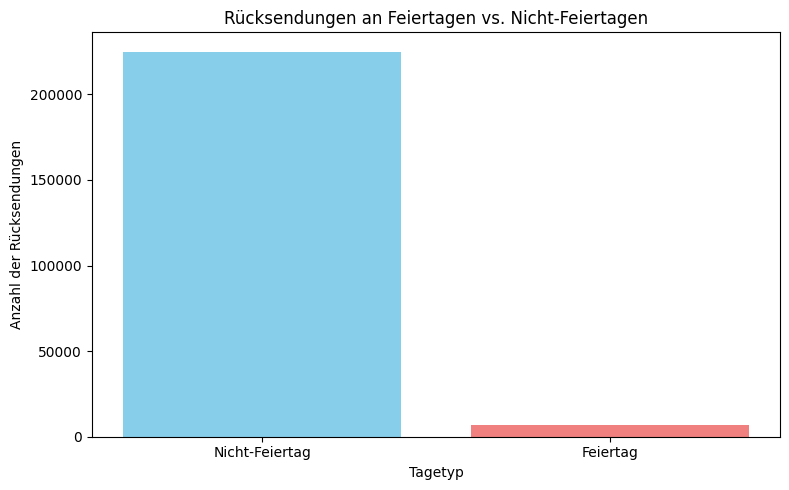

In [ ]:
# Analyse: Gruppieren nach Feiertag und Nicht-Feiertag
holiday_analysis = df13.groupby('is_holiday')['returnShipment'].sum().reset_index()
holiday_analysis['is_holiday'] = holiday_analysis['is_holiday'].map({0: 'Nicht-Feiertag', 1: 'Feiertag'})

# Ergebnisse anzeigen
print("Analyse der Rücksendungen an Feiertagen vs. Nicht-Feiertagen:")
print(holiday_analysis)

# Visualisierung der Ergebnisse
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
plt.bar(holiday_analysis['is_holiday'], holiday_analysis['returnShipment'], color=['skyblue', 'lightcoral'])
plt.title('Rücksendungen an Feiertagen vs. Nicht-Feiertagen')
plt.xlabel('Tagetyp')
plt.ylabel('Anzahl der Rücksendungen')
plt.tight_layout()
plt.show()

In [ ]:
"""
import pandas as pd
from datetime import timedelta

# Hilfsfunktion, um ein Datum in einem Intervall zu prüfen
def date_within(date, interval):
    start, end = interval
    return start <= date <= end

# Neue Funktion zum Klassifizieren von Tagen relativ zu Feiertagen
def classify_holiday(row):
    holidays = feiertage[(feiertage['state'] == row['state'])]['datum']
    for holiday in holidays:
        interval = (holiday - timedelta(days=7), holiday + timedelta(days=7))
        before_int = (holiday - timedelta(days=14), holiday - timedelta(days=7))
        after_int = (holiday + timedelta(days=7), holiday + timedelta(days=14))
        if date_within(row['orderDate'], interval):
            return "during"
        elif date_within(row['orderDate'], before_int):
            return "before"
        elif date_within(row['orderDate'], after_int):
            return "after"
    return "other"

# Wende die Funktion auf df13 an
df13['holiday_class'] = df13.apply(classify_holiday, axis=1)

# Ergebnis anzeigen
"""

'\nimport pandas as pd\nfrom datetime import timedelta\n\n# Hilfsfunktion, um ein Datum in einem Intervall zu prüfen\ndef date_within(date, interval):\n    start, end = interval\n    return start <= date <= end\n\n# Neue Funktion zum Klassifizieren von Tagen relativ zu Feiertagen\ndef classify_holiday(row):\n    holidays = feiertage[(feiertage[\'state\'] == row[\'state\'])][\'datum\']\n    for holiday in holidays:\n        interval = (holiday - timedelta(days=7), holiday + timedelta(days=7))\n        before_int = (holiday - timedelta(days=14), holiday - timedelta(days=7))\n        after_int = (holiday + timedelta(days=7), holiday + timedelta(days=14))\n        if date_within(row[\'orderDate\'], interval):\n            return "during"\n        elif date_within(row[\'orderDate\'], before_int):\n            return "before"\n        elif date_within(row[\'orderDate\'], after_int):\n            return "after"\n    return "other"\n\n# Wende die Funktion auf df13 an\ndf13[\'holiday_class\'] =

## days_since_launch

In [ ]:
import pandas as pd

# Sicherstellen, dass `orderDate` und `first_availability_date` im datetime-Format sind
df13['orderDate'] = pd.to_datetime(df13['orderDate'])
df13['first_availability_date'] = pd.to_datetime(df13['first_availability_date'])

# Berechne `days_since_launch`
df13['days_since_launch'] = (df13['orderDate'] - df13['first_availability_date']).dt.days

# Ergebnis ansehen
print(df13[['itemID', 'orderDate', 'first_availability_date', 'days_since_launch','returnShipment']].head())


   itemID  orderDate first_availability_date  days_since_launch  \
0     186 2012-04-01              2012-04-01                  0   
1      71 2012-04-01              2012-04-01                  0   
2      71 2012-04-01              2012-04-01                  0   
3      22 2012-04-02              2012-04-01                  1   
4     151 2012-04-02              2012-04-02                  0   

   returnShipment  
0               0  
1               1  
2               1  
3               0  
4               0  


In [ ]:

#filtered_df12 = df13[(df13['deliveryDate'] == 'nan') ]
#df13_missing_delivery = df13[df13['deliveryDate'].isnull()]
#filtered_df12 = df13[(df13['customerID'] == 1317)& (df13['orderDate'] == '2012-04-01')]
#filtered_df12 = df13[(df13['customerID'] == 7824)& (df13['orderDate'] == '2013-03-31')]
#filtered_df12 = df13[(df13['customerID'] == 1360)& (df13['orderDate'] == '2012-04-01')]
#filtered_df12 = df13[(df13['customerID'] == 4390)& (df13['orderDate'] == '2013-03-31')]
filtered_df12 = df13[(df13['itemID'] == 180)]
#filtered_df12 = df[(df['customerID'] == 808)& (df['orderDate'] == '2012-04-02')]
#86558 2013-03-31
# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['orderDate','itemID'	,'first_availability_date','days_since_launch']]



,orderDate,itemID,first_availability_date,days_since_launch
618,2012-04-01,180,2012-04-01,0
2103,2012-04-03,180,2012-04-01,2
3188,2012-04-04,180,2012-04-01,3
5920,2012-04-06,180,2012-04-01,5
7002,2012-04-07,180,2012-04-01,6
13064,2012-04-10,180,2012-04-01,9
14748,2012-04-11,180,2012-04-01,10
14871,2012-04-11,180,2012-04-01,10
16639,2012-04-13,180,2012-04-01,12
17909,2012-04-15,180,2012-04-01,14


<Axes: title={'center': 'Rückgabewahrscheinlichkeit vs. Tage seit Verfügbarkeit'}, xlabel='days_since_launch', ylabel='Rückgabewahrscheinlichkeit'>

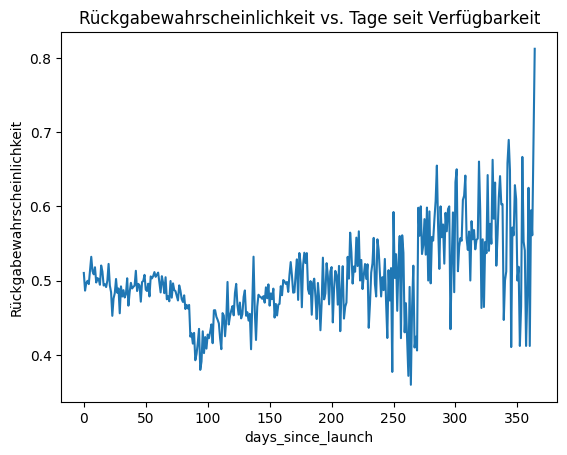

In [ ]:
df13.groupby('days_since_launch')['returnShipment'].mean().plot(title='Rückgabewahrscheinlichkeit vs. Tage seit Verfügbarkeit', ylabel='Rückgabewahrscheinlichkeit')


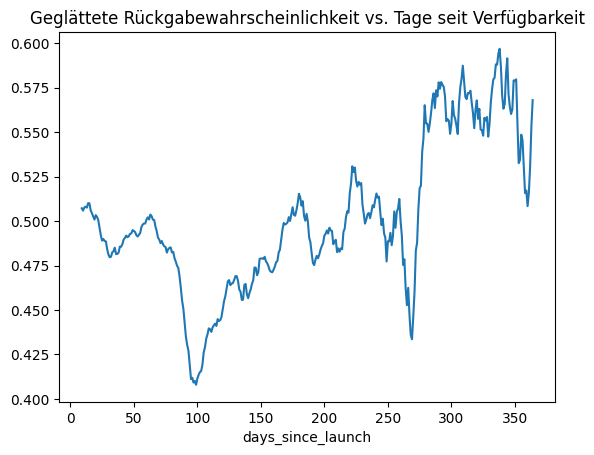

In [ ]:
import matplotlib.pyplot as plt
df_grouped = df13.groupby('days_since_launch')['returnShipment'].mean()
smoothed = df_grouped.rolling(window=10).mean()
smoothed.plot(title='Geglättete Rückgabewahrscheinlichkeit vs. Tage seit Verfügbarkeit')
plt.show()


In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
df13['days_since_launch_scaled'] = scaler.fit_transform(df13[['days_since_launch']])


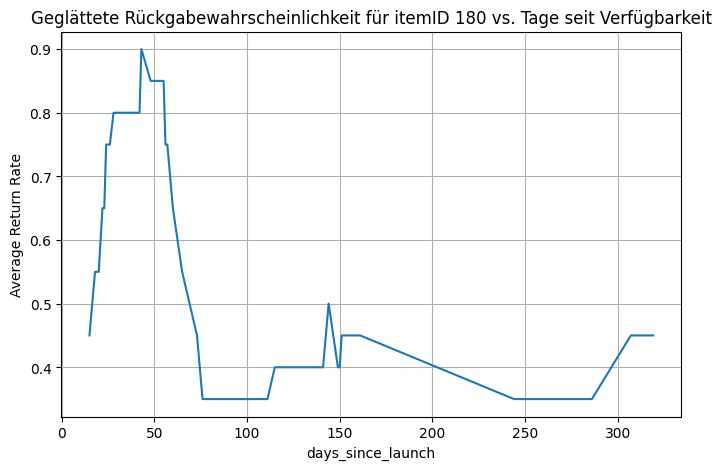

In [ ]:
import matplotlib.pyplot as plt

# Filtere nur itemID = 180
df_item_180 = df13[df13['itemID'] == 180]

# Berechne die durchschnittliche Rücksendequote pro "days_since_launch"
df_grouped = df_item_180.groupby('days_since_launch')['returnShipment'].mean()

# Glätten mit gleitendem Durchschnitt (Rolling Window)
smoothed = df_grouped.rolling(window=10).mean()

# Plot
plt.figure(figsize=(8, 5))
smoothed.plot(title='Geglättete Rückgabewahrscheinlichkeit für itemID 180 vs. Tage seit Verfügbarkeit')
plt.xlabel('days_since_launch')
plt.ylabel('Average Return Rate')
plt.grid(True)
plt.show()


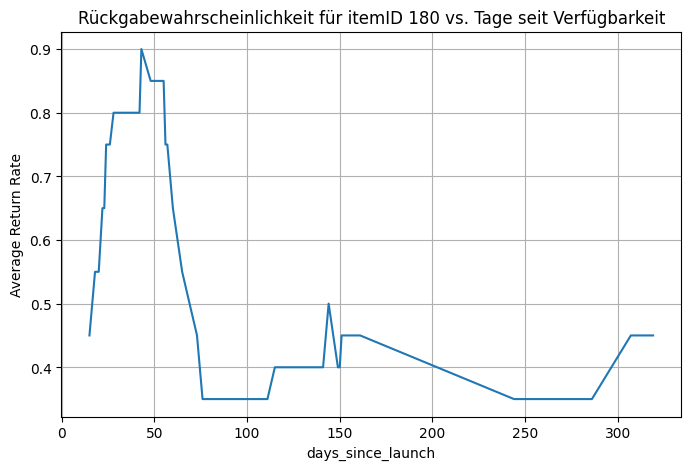

In [ ]:
import matplotlib.pyplot as plt

# Filtere nur itemID = 180
df_item_180 = df13[df13['itemID'] == 180]

# Berechne die durchschnittliche Rücksendequote pro "days_since_launch"
df_grouped = df_item_180.groupby('days_since_launch')['returnShipment'].mean()

# Glätten mit gleitendem Durchschnitt (Rolling Window)
smoothed = df_grouped.rolling(window=10).mean()

# Plot
plt.figure(figsize=(8, 5))
smoothed.plot(title='Rückgabewahrscheinlichkeit für itemID 180 vs. Tage seit Verfügbarkeit')
plt.xlabel('days_since_launch')
plt.ylabel('Average Return Rate')
plt.grid(True)
plt.show()


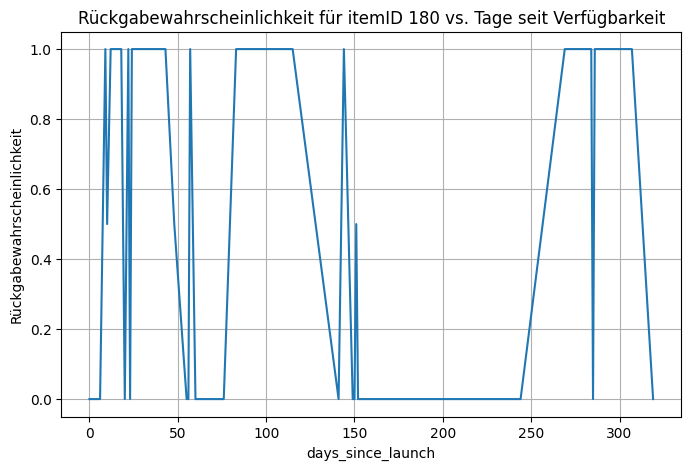

In [ ]:
import matplotlib.pyplot as plt

# Filtere nur itemID = 180
df_item_180 = df13[df13['itemID'] == 180]

# Berechne die durchschnittliche Rücksendequote pro "days_since_launch" und plotte sie
df_item_180.groupby('days_since_launch')['returnShipment'].mean().plot(
    title='Rückgabewahrscheinlichkeit für itemID 180 vs. Tage seit Verfügbarkeit',
    ylabel='Rückgabewahrscheinlichkeit',
    xlabel='days_since_launch',
    grid=True,
    figsize=(8,5)
)

# Diagramm anzeigen
plt.show()


## cluster

In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

# Berechne Rückgabewahrscheinlichkeit und Schwankungen pro Produkt
product_stats = df13.groupby('itemID')['returnShipment'].agg(
    average_return_rate='mean',
    return_rate_std='std'
).reset_index()

# Fülle NaN-Werte (z. B. wenn nur eine Bestellung vorliegt) mit 0
product_stats['return_rate_std'] = product_stats['return_rate_std'].fillna(0)

# Features für das Clustering
X = product_stats[['average_return_rate', 'return_rate_std']]


In [ ]:
# k-Means Clustering
kmeans = KMeans(n_clusters=3, random_state=42)  # Wähle 3 Cluster, passe ggf. an
product_stats['cluster'] = kmeans.fit_predict(X)

# Cluster-Zentren anzeigen
print("Cluster-Zentren:")
print(kmeans.cluster_centers_)


Cluster-Zentren:
[[0.44056635 0.50351267]
 [0.72672335 0.40730791]
 [0.0361162  0.10517226]]


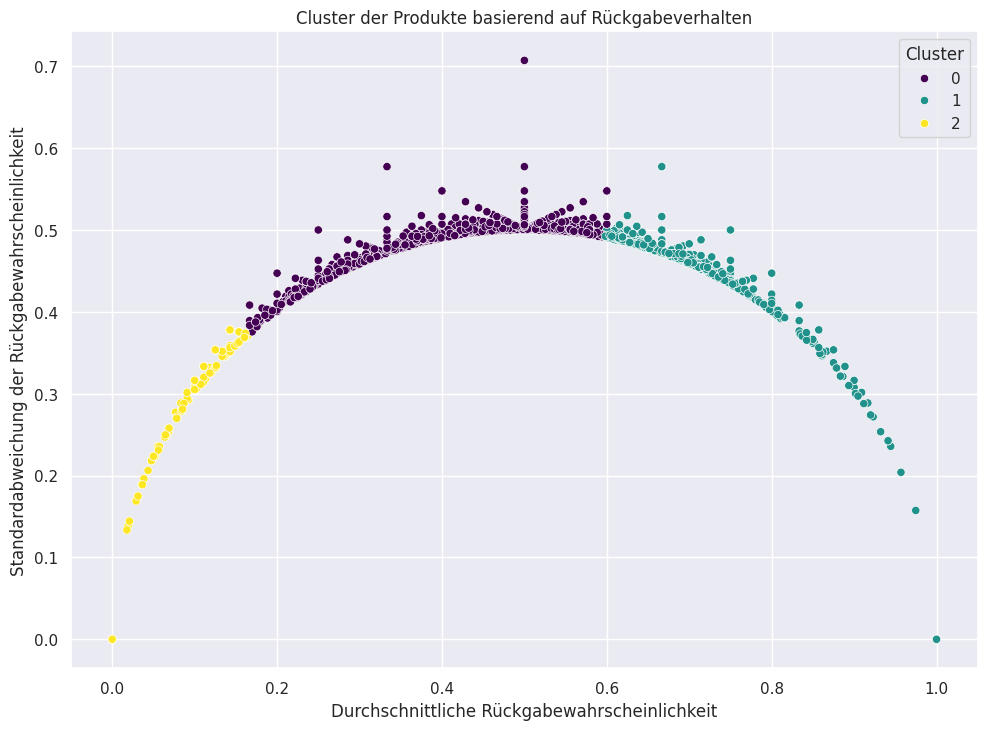

In [ ]:
# Streudiagramm der Cluster
sns.scatterplot(
    x='average_return_rate',
    y='return_rate_std',
    hue='cluster',
    data=product_stats,
    palette='viridis'
)
plt.title('Cluster der Produkte basierend auf Rückgabeverhalten')
plt.xlabel('Durchschnittliche Rückgabewahrscheinlichkeit')
plt.ylabel('Standardabweichung der Rückgabewahrscheinlichkeit')
plt.legend(title='Cluster')
plt.show()


In [ ]:
df13 = df13.merge(product_stats[['itemID', 'cluster','average_return_rate', 'return_rate_std']], on='itemID', how='left')


## Cluster manfacturerID

In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

# Berechne Rückgabewahrscheinlichkeit und Schwankungen pro Hersteller
manufacturer_stats = df13.groupby('manufacturerID')['returnShipment'].agg(
    average_return_rate_manufacturerID='mean',
    return_rate_std_manufacturerID='std'
).reset_index()

# Fülle NaN-Werte (z. B. wenn nur eine Bestellung vorliegt) mit 0
manufacturer_stats['return_rate_std_manufacturerID'] = manufacturer_stats['return_rate_std_manufacturerID'].fillna(0)

# Features für das Clustering
X = manufacturer_stats[['average_return_rate_manufacturerID', 'return_rate_std_manufacturerID']]

# k-Means Clustering
kmeans = KMeans(n_clusters=3, random_state=42)  # Wähle 3 Cluster, passe ggf. an
manufacturer_stats['cluster_manufacturerID'] = kmeans.fit_predict(X)

# Cluster-Zentren anzeigen
print("Cluster-Zentren:")
print(kmeans.cluster_centers_)

# Ergebnis anzeigen
print(manufacturer_stats.head())


Cluster-Zentren:
[[0.01875148 0.07649965]
 [0.28084324 0.44600012]
 [0.564344   0.48053686]]
   manufacturerID  average_return_rate_manufacturerID  \
0               1                            0.518587   
1               2                            0.474854   
2               3                            0.389253   
3               4                            0.488950   
4               5                            0.462308   

   return_rate_std_manufacturerID  cluster_manufacturerID  
0                        0.499661                       2  
1                        0.499437                       2  
2                        0.487585                       1  
3                        0.499935                       2  
4                        0.498584                       2  


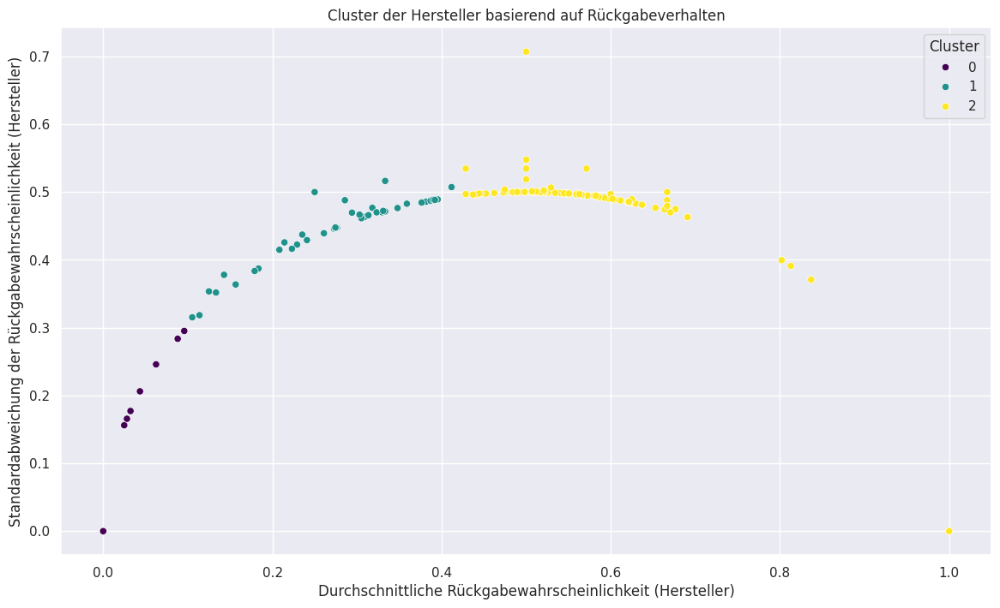

In [ ]:
# Streudiagramm der Cluster basierend auf Hersteller
sns.scatterplot(
    x='average_return_rate_manufacturerID',
    y='return_rate_std_manufacturerID',
    hue='cluster_manufacturerID',
    data=manufacturer_stats,
    palette='viridis'
)
plt.title('Cluster der Hersteller basierend auf Rückgabeverhalten')
plt.xlabel('Durchschnittliche Rückgabewahrscheinlichkeit (Hersteller)')
plt.ylabel('Standardabweichung der Rückgabewahrscheinlichkeit (Hersteller)')
plt.legend(title='Cluster')
plt.show()


In [ ]:
df13 = df13.merge(manufacturer_stats[['manufacturerID', 'cluster_manufacturerID','average_return_rate_manufacturerID', 'return_rate_std_manufacturerID']], on='manufacturerID', how='left')


## cluster Customer ID

In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

# Berechne Rückgabewahrscheinlichkeit und Schwankungen pro Kunde
customer_stats = df13.groupby('customerID')['returnShipment'].agg(
    average_return_rate_customerID='mean',
    return_rate_std_customerID='std'
).reset_index()

# Fülle NaN-Werte (z. B. wenn nur eine Bestellung vorliegt) mit 0
customer_stats['return_rate_std_customerID'] = customer_stats['return_rate_std_customerID'].fillna(0)

# Features für das Clustering
X = customer_stats[['average_return_rate_customerID', 'return_rate_std_customerID']]

# k-Means Clustering
kmeans = KMeans(n_clusters=3, random_state=42)  # Wähle 3 Cluster, passe ggf. an
customer_stats['cluster_customerID'] = kmeans.fit_predict(X)

# Cluster-Zentren anzeigen
print("Cluster-Zentren:")
print(kmeans.cluster_centers_)

# Ergebnis anzeigen
print(customer_stats.head())


Cluster-Zentren:
[[0.50610927 0.5233121 ]
 [0.01079064 0.03132158]
 [0.980533   0.05512516]]
   customerID  average_return_rate_customerID  return_rate_std_customerID  \
0           6                        0.400000                    0.500000   
1           9                        0.733333                    0.457738   
2          11                        0.000000                    0.000000   
3          13                        0.333333                    0.500000   
4          15                        0.500000                    0.527046   

   cluster_customerID  
0                   0  
1                   0  
2                   1  
3                   0  
4                   0  


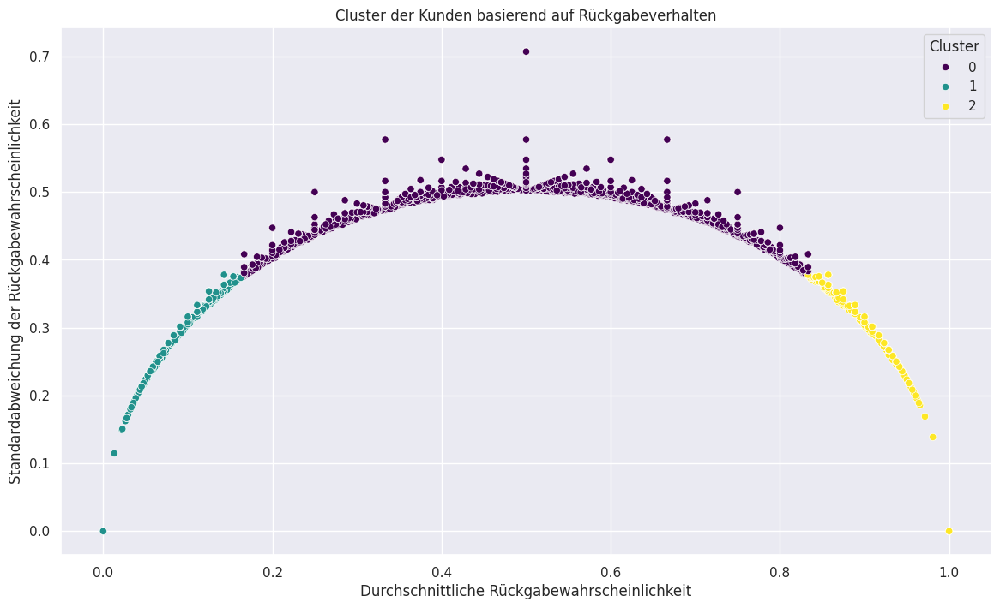

In [ ]:
# Streudiagramm der Cluster
sns.scatterplot(
    x='average_return_rate_customerID',
    y='return_rate_std_customerID',
    hue='cluster_customerID',
    data=customer_stats,
    palette='viridis'
)
plt.title('Cluster der Kunden basierend auf Rückgabeverhalten')
plt.xlabel('Durchschnittliche Rückgabewahrscheinlichkeit')
plt.ylabel('Standardabweichung der Rückgabewahrscheinlichkeit')
plt.legend(title='Cluster')
plt.show()


In [ ]:
df13 = df13.merge(customer_stats[['customerID', 'cluster_customerID','average_return_rate_customerID', 'return_rate_std_customerID']], on='customerID', how='left')


## Label-Encoding:

Alternativ können Sie product_category in numerische Labels umwandeln.

In [ ]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
df13['product_category_encoded'] = label_encoder.fit_transform(df13['product_category'])


In [ ]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
df13['state_encoded'] = label_encoder.fit_transform(df13['state'])
orders_class2['state_encoded'] = label_encoder.fit_transform(orders_class2['state'])
orders_class2['size_encoded'] = label_encoder.fit_transform(orders_class2['size'])


In [ ]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
df13['availability_season_category_encoded'] = label_encoder.fit_transform(df13['availability_season'])


In [ ]:
from sklearn.preprocessing import LabelEncoder

#label_encoder = LabelEncoder()
#df13['holiday_class_category_encoded'] = label_encoder.fit_transform(df13['holiday_class'])


In [ ]:
# Convert the boolean columns to integers
df13 = pd.get_dummies(df13, columns=['availability_season','salutation'], drop_first=True, dtype=int)


In [ ]:
# Convert the boolean columns to integers
#orders_class2 = pd.get_dummies(orders_class2, columns=['salutation'], drop_first=True, dtype=int)


In [ ]:
# Convert the boolean columns to integers
#df13 = pd.get_dummies(df13, columns=['holiday_class'], drop_first=True, dtype=int)


In [ ]:
# One-Hot-Encoding nur für die Spalte 'size_category'
size_category_dummies = pd.get_dummies(df13['size_category'], prefix='size_category', drop_first=True, dtype=int)

# Die Dummy-Variable separat speichern
print(size_category_dummies.head())

# Optional: Integration in ein Modell
# Hier kannst du nur `size_category_dummies` als Feature in dein Modell einfügen
X = size_category_dummies  # Features
y = df13['product_category']  # Zielvariable (Beispiel)

# Zeige X und y an, um sicherzustellen, dass die Daten korrekt vorbereitet sind
print("Features (X):")
print(X.head())

print("\nZielvariable (y):")
print(y.head())


   size_category_UK  size_category_UNSIZED  size_category_international  \
0                 0                      0                            1   
1                 1                      0                            0   
2                 1                      0                            0   
3                 0                      0                            1   
4                 0                      0                            0   

   size_category_long size  size_category_normal size  \
0                        0                          0   
1                        0                          0   
2                        0                          0   
3                        0                          0   
4                        0                          0   

   size_category_short size  
0                         0  
1                         0  
2                         0  
3                         0  
4                         0  
Features (X):
   size_cate

In [ ]:
df13.region_encoded.describe()

,region_encoded
count,441673.000000
mean,1.875987
std,1.053267
min,0.000000
25%,1.000000
50%,2.000000
75%,3.000000
max,3.000000


In [ ]:
df13.availability_season_category_encoded.describe()

,availability_season_category_encoded
count,481092.000000
mean,1.895259
std,0.811851
min,0.000000
25%,1.000000
50%,2.000000
75%,3.000000
max,3.000000


In [ ]:
#df13.holiday_class_category_encoded.describe()

In [ ]:
# Größe für jede Produktkategorie drucken
for category in df13['product_category'].unique():
    sizes = df13[df13['product_category'] == category]['size'].unique()
    print(f"Produktkategorie: {category}")
    print(f"Eindeutige Größen: {sorted(sizes)}\n")


Produktkategorie: Clothing
Eindeutige Größen: ['104', '116', '122', '128', '140', '152', '164', '176', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '2932', '30', '3132', '3332', '3334', '3432', '3434', '36', '3632', '3634', '38', '3832', '3834', '40', '4032', '4034', '42', '4232', '44', '46', '48', '50', '52', '54', '56', '58', '76', '80', '84', '88', '92', '96', 'L', 'M', 'S', 'XL', 'XS', 'XXL', 'XXXL']

Produktkategorie: Shoes
Eindeutige Größen: ['1', '10', '10.5', '11', '11.5', '12', '12.5', '13', '13.5', '14', '2', '2.5', '22', '23', '24', '25', '26', '27', '28', '29', '3', '3.5', '30', '31', '32', '33', '34', '35', '36', '36.5', '37', '37.5', '38', '38.5', '39', '39.5', '4', '4.5', '40', '40.5', '41', '41.5', '42', '42.5', '43', '43.5', '44', '44.5', '45', '45.5', '46', '46.5', '47', '48', '49', '5', '5.5', '50', '6', '6.5', '7', '7.5', '8', '8.5', '9', '9.5']

Produktkategorie: Accessories
Eindeutige Größen: ['100', '105', '110', '80', '85', '90', '95',

In [ ]:
# Filter für Preis = 100
filtered_price = df13[df13['price'] == 100]
print(filtered_price)


        orderItemID  orderDate deliveryDate  itemID size  color  \
8111           8112 2012-04-07   2012-04-13     926   38  black   
17952         17953 2012-04-13   2012-04-16     926   39  brown   
18315         18316 2012-04-13   2012-04-16     725   36   ecru   
21459         21460 2012-04-16   2012-05-07     725   40  black   
38390         38391 2012-04-30   2012-05-02     725   40   ecru   
...             ...        ...          ...     ...  ...    ...   
466859       466860 2013-03-23   2013-03-27    1699   42    red   
473130       473131 2013-03-26   2013-04-09    1699   42  green   
473417       473418 2013-03-27   2013-03-28    1699   40  green   
477961       477962 2013-03-29   2013-04-04    1699   38  black   
479251       479252 2013-03-30   2013-04-03    1699   39  brown   

        manufacturerID  price  customerID             dateOfBirth  \
8111                44  100.0        4556 1982-01-06 00:00:00.000   
17952               44  100.0        8245 1964-07-10 00:0

## log_delivery time

<ipython-input-191-c77370567d73>:17: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=45, horizontalalignment='right')


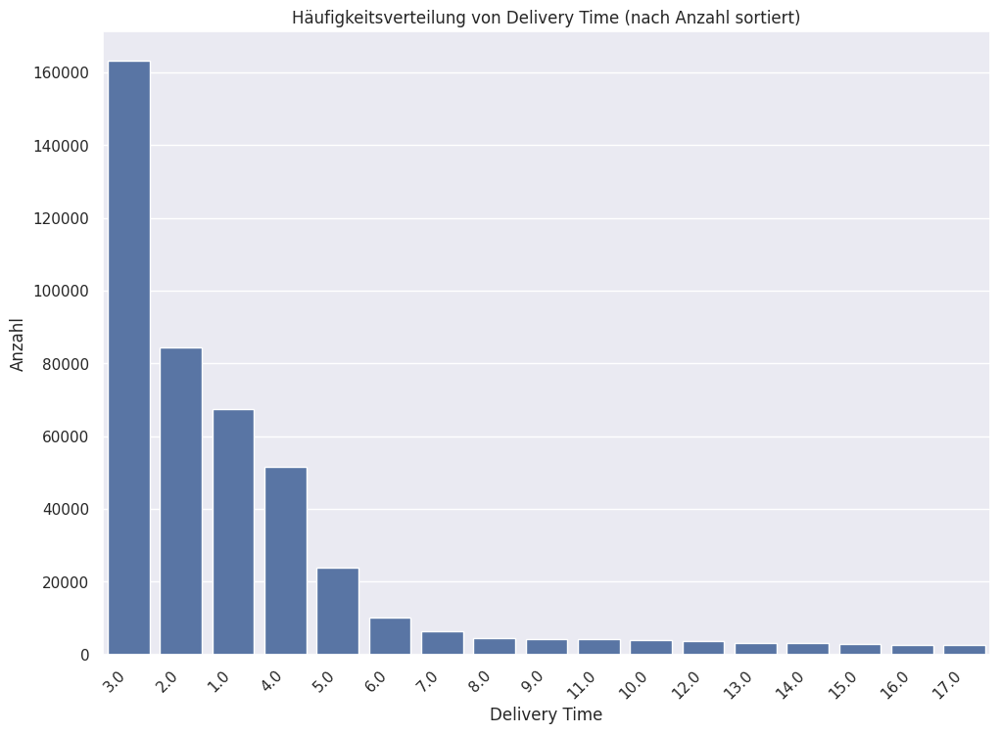

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Schritt 1: Häufigkeiten von deliveryTime berechnen und sortieren
delivery_counts = df13['deliveryTime'].value_counts().reset_index()
delivery_counts.columns = ['deliveryTime', 'count']

# Sortierung der X-Achse explizit festlegen nach Anzahl
delivery_counts = delivery_counts.sort_values(by='count', ascending=False)

# Schritt 2: Balkendiagramm erstellen
sns.set(rc={'figure.figsize': (11.7, 8.27)})
g = sns.barplot(x='deliveryTime', y='count', data=delivery_counts, order=delivery_counts['deliveryTime'])

# X-Achsenticks drehen
g.set_xticklabels(g.get_xticklabels(), rotation=45, horizontalalignment='right')

# Titel und Achsenbeschriftungen hinzufügen
plt.title('Häufigkeitsverteilung von Delivery Time (nach Anzahl sortiert)')
plt.xlabel('Delivery Time')
plt.ylabel('Anzahl')

# Diagramm anzeigen
plt.show()


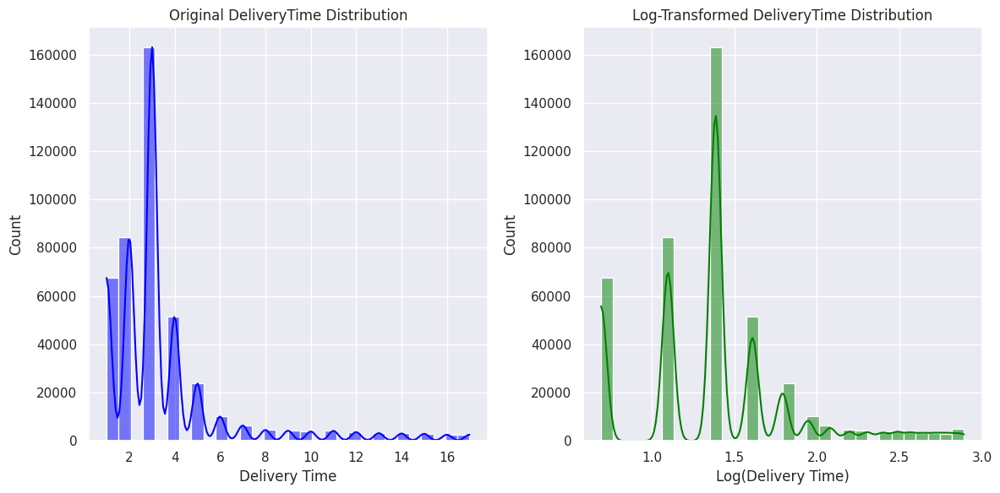

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Log-Transformation der deliveryTime-Daten
df13['deliveryTime_log'] = np.log1p(df13['deliveryTime'])  # log1p für log(1+x), um 0-Werte zu vermeiden

# Originaldaten visualisieren
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.histplot(df13['deliveryTime'], kde=True, bins=30, color='blue')
plt.title('Original DeliveryTime Distribution')
plt.xlabel('Delivery Time')

# Log-transformierte Daten visualisieren
plt.subplot(1, 2, 2)
sns.histplot(df13['deliveryTime_log'], kde=True, bins=30, color='green')
plt.title('Log-Transformed DeliveryTime Distribution')
plt.xlabel('Log(Delivery Time)')

plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd

# Annahme: df13 enthält die Spalte 'Delivery_Time'
def categorize_delivery_time(x):
    if x <= 3:
        return 'short'  # 1-3 Tage
    elif 4 <= x <= 6:
        return 'medium'  # 4-6 Tage
    else:
        return 'long'  # > 6 Tage

# Neue Spalte hinzufügen
df13['delivery_time_category'] = df13['deliveryTime'].apply(categorize_delivery_time)

# Kontrolle
print(df13[['deliveryTime', 'delivery_time_category']].head())


   deliveryTime delivery_time_category
0           2.0                  short
1           2.0                  short
2           2.0                  short
3           3.0                  short
4           3.0                  short


In [ ]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
df13['delivery_time_category_category_encoded'] = label_encoder.fit_transform(df13['delivery_time_category'])


In [ ]:
import pandas as pd

# Neue Kategorisierungsfunktion
def categorize_delivery_time_v2(x):
    if x <= 2:
        return 'very_short'
    elif 3 <= x <= 4:
        return 'short'
    elif 5 <= x <= 6:
        return 'medium'
    else:
        return 'long'

# Neue Kategorie-Spalte erstellen
df13['delivery_time_category_v2'] = df13['deliveryTime'].apply(categorize_delivery_time_v2)

# Kodierung der neuen Kategorie
df13['delivery_time_category_v2_encoded'] = df13['delivery_time_category_v2'].astype('category').cat.codes

# Kontrolle
print(df13[['deliveryTime', 'delivery_time_category_v2', 'delivery_time_category_v2_encoded']].head())


   deliveryTime delivery_time_category_v2  delivery_time_category_v2_encoded
0           2.0                very_short                                  3
1           2.0                very_short                                  3
2           2.0                very_short                                  3
3           3.0                     short                                  2
4           3.0                     short                                  2


## log_Price

In [ ]:
import numpy as np # Import the NumPy library

df13['price_log'] = np.log1p(df13['price']) # Now np.log1p is accessible

In [ ]:
import pandas as pd

# Neue Preisgrenzen und Labels definieren
bins = [0, 20, 50, 100, 150, 200, float('inf')]
labels = ['very_cheap', 'cheap', 'mid_price', 'high_price', 'very_high_price', 'luxury']

# Preise kategorisieren für df13
df13['price_category'] = pd.cut(df13['price'], bins=bins, labels=labels)


# Kodierung der Kategorien
df13['price_category_encoded'] = df13['price_category'].cat.codes

# Ergebnisse überprüfen
print(df13[['price', 'price_category', 'price_category_encoded']].head())


   price price_category  price_category_encoded
0   69.9      mid_price                       2
1   29.9          cheap                       1
2   39.9          cheap                       1
3   79.9      mid_price                       2
4   59.9      mid_price                       2


In [ ]:
# Preise in 4 Quartile aufteilen
df13['price_category_quantile'] = pd.qcut(df13['price'], q=4, labels=['Q1', 'Q2', 'Q3', 'Q4'])

# Kodierung der Kategorien
df13['price_category_quantile_encoded'] = df13['price_category_quantile'].cat.codes

# Ergebnis überprüfen
print(df13[['price', 'price_category_quantile', 'price_category_quantile_encoded']].head())


   price price_category_quantile  price_category_quantile_encoded
0   69.9                      Q3                                2
1   29.9                      Q1                                0
2   39.9                      Q2                                1
3   79.9                      Q3                                2
4   59.9                      Q2                                1


In [ ]:


#filtered_df12 = df13[df13['itemID'] == 134] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

#filtered_df12 = df13[df13['itemID'] == 134]
#filtered_df12 = df13[df13['itemID'] == 156] # 23,24 36 38 40 Clothing
filtered_df12 = df13[(df13['price'] == 289) ]
#filtered_df12 = df13[(df13['customerID'] == 348) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['price', 'price_category', 'price_category_encoded']]


,price,price_category,price_category_encoded
295968,289.0,luxury,5
296921,289.0,luxury,5
297326,289.0,luxury,5
297439,289.0,luxury,5
297733,289.0,luxury,5
297734,289.0,luxury,5
298121,289.0,luxury,5
298224,289.0,luxury,5
298448,289.0,luxury,5
298686,289.0,luxury,5


In [ ]:
filtered_df12 = df13[(df13['customerID'] == 491) & (df13['orderDate'] == '2012-06-05')]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]

# Display the filtered results
filtered_df12[['itemID', 'price',	'price_rank',	'highest_price_item',	'discount_percentage'	,'discount_bins_custom', 'price_category']]

,itemID,price,price_rank,highest_price_item,discount_percentage,discount_bins_custom,price_category
73711,346,69.9,10.0,69.9,0.000000,No Discount,mid_price
73712,568,59.9,6.0,59.9,0.000000,No Discount,mid_price
73713,568,59.9,6.0,59.9,0.000000,No Discount,mid_price
73714,28,24.9,2.0,39.9,0.375940,High,cheap
73715,2,24.9,2.0,39.9,0.375940,High,cheap
73716,32,12.9,1.0,24.9,0.481928,High,very_cheap
73717,28,24.9,2.0,39.9,0.375940,High,cheap
73720,28,39.9,5.0,39.9,0.000000,No Discount,cheap
73721,33,59.9,6.0,69.9,0.143062,Medium,mid_price
73722,33,59.9,6.0,69.9,0.143062,Medium,mid_price


## die Anzahl der Bestellungen mit einem Preis unter 100 für jeden Kunden

In [ ]:
# Anzahl der Bestellungen mit niedrigem Preis (< 100) pro Kunde und Bestelldatum
df13['num_low_price'] = df13.groupby(['customerID', 'orderDate'])['price'].transform(lambda x: (x < 100).sum())

# Ergebnisse überprüfen
print(df13[['customerID', 'orderDate', 'price', 'num_low_price']].drop_duplicates(subset=['customerID', 'orderDate']).head())


    customerID  orderDate  price  num_low_price
0          794 2012-04-01   69.9              3
3          825 2012-04-02   29.9              2
6          850 2012-04-02   21.9              4
13         858 2012-04-02   89.9              1
14         860 2012-04-02  199.9             10


In [ ]:


#filtered_df12 = df13[df13['itemID'] == 134] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

#filtered_df12 = df13[df13['itemID'] == 134]
#filtered_df12 = df13[df13['itemID'] == 156] # 23,24 36 38 40 Clothing
##filtered_df12 = df13[(df13['customerID'] == 5991) ]
#filtered_df12 = df13[(df13['customerID'] == 491) ]
#filtered_df12 = df13[(df13['customerID'] == 348) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]
filtered_df12 = df13[(df13['customerID'] == 6) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'price', 'highest_price_item', 'discount_percentage', 'discount_rank', 'price_rank', 'min_discount_item', 'max_discount_item','mean_discount_item', 'min_price_item', 'max_price_item', 'mean_price_item']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
#filtered_df12[['customerID', 'orderDate', 'itemID','product_category', 'size', 'duplicate_flag_by_cust_date_cat_size']]
filtered_df12[['customerID', 'orderDate', 'itemID', 'price', 'num_low_price']]




,customerID,orderDate,itemID,price,num_low_price
22612,6,2012-04-19,261,99.9,1
28252,6,2012-04-25,96,16.9,3
28253,6,2012-04-25,96,16.9,3
28254,6,2012-04-25,96,16.9,3
205239,6,2012-09-23,1475,19.9,7
205240,6,2012-09-23,250,12.9,7
205241,6,2012-09-23,320,39.9,7
205242,6,2012-09-23,1404,16.9,7
205243,6,2012-09-23,1404,16.9,7
205244,6,2012-09-23,1404,16.9,7


## die Anzahl der Bestellungen mit einem Rabatt kleiner als 0.8 pro Kunde

In [ ]:
# Anzahl der Bestellungen mit niedrigem Discount (< 0.8) pro Kunde und Bestelldatum
df13['num_low_disc'] = df13.groupby(['customerID', 'orderDate'])['discount_percentage'].transform(lambda x: (x < 0.8).sum())

# Ergebnisse überprüfen
print(df13[['customerID', 'orderDate', 'discount_percentage', 'num_low_disc']].drop_duplicates(subset=['customerID', 'orderDate']).head())

    customerID  orderDate  discount_percentage  num_low_disc
0          794 2012-04-01             0.000000             3
3          825 2012-04-02             0.000000             3
6          850 2012-04-02             0.120482             7
13         858 2012-04-02             0.000000             1
14         860 2012-04-02             0.000000            16


In [ ]:


#filtered_df12 = df13[df13['itemID'] == 134] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

#filtered_df12 = df13[df13['itemID'] == 134]
#filtered_df12 = df13[df13['itemID'] == 156] # 23,24 36 38 40 Clothing
##filtered_df12 = df13[(df13['customerID'] == 5991) ]
#filtered_df12 = df13[(df13['customerID'] == 491) ]
#filtered_df12 = df13[(df13['customerID'] == 348) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]
filtered_df12 = df13[(df13['customerID'] == 6) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'price', 'highest_price_item', 'discount_percentage', 'discount_rank', 'price_rank', 'min_discount_item', 'max_discount_item','mean_discount_item', 'min_price_item', 'max_price_item', 'mean_price_item']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
#filtered_df12[['customerID', 'orderDate', 'itemID','product_category', 'size', 'duplicate_flag_by_cust_date_cat_size']]
filtered_df12[['customerID', 'orderDate', 'itemID', 'price', 'discount_percentage', 'num_low_disc']]




,customerID,orderDate,itemID,price,discount_percentage,num_low_disc
22612,6,2012-04-19,261,99.9,0.000000,1
28252,6,2012-04-25,96,16.9,0.150754,3
28253,6,2012-04-25,96,16.9,0.150754,3
28254,6,2012-04-25,96,16.9,0.150754,3
205239,6,2012-09-23,1475,19.9,0.000000,7
205240,6,2012-09-23,250,12.9,0.351759,7
205241,6,2012-09-23,320,39.9,0.429185,7
205242,6,2012-09-23,1404,16.9,0.150754,7
205243,6,2012-09-23,1404,16.9,0.150754,7
205244,6,2012-09-23,1404,16.9,0.150754,7


## Gesamtanzahl der Bestellungen pro Kunde

In [ ]:
# Gesamtanzahl der Bestellungen pro Kunde
df13['num_order_pro_customer'] = df13.groupby('customerID')['customerID'].transform('count')

# Ergebnisse überprüfen
print(df13[['customerID', 'num_order_pro_customer']].drop_duplicates(subset=['customerID']).head())


    customerID  num_order_pro_customer
0          794                      11
3          825                       9
6          850                       7
13         858                      13
14         860                      17


In [ ]:


#filtered_df12 = df13[df13['itemID'] == 134] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

#filtered_df12 = df13[df13['itemID'] == 134]
#filtered_df12 = df13[df13['itemID'] == 156] # 23,24 36 38 40 Clothing
##filtered_df12 = df13[(df13['customerID'] == 5991) ]
#filtered_df12 = df13[(df13['customerID'] == 491) ]
#filtered_df12 = df13[(df13['customerID'] == 348) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]
filtered_df12 = df13[(df13['customerID'] == 6) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'price', 'highest_price_item', 'discount_percentage', 'discount_rank', 'price_rank', 'min_discount_item', 'max_discount_item','mean_discount_item', 'min_price_item', 'max_price_item', 'mean_price_item']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
#filtered_df12[['customerID', 'orderDate', 'itemID','product_category', 'size', 'duplicate_flag_by_cust_date_cat_size']]
filtered_df12[['customerID', 'orderDate', 'itemID', 'price', 'num_order_pro_customer']]




,customerID,orderDate,itemID,price,num_order_pro_customer
22612,6,2012-04-19,261,99.9,24
28252,6,2012-04-25,96,16.9,24
28253,6,2012-04-25,96,16.9,24
28254,6,2012-04-25,96,16.9,24
205239,6,2012-09-23,1475,19.9,24
205240,6,2012-09-23,250,12.9,24
205241,6,2012-09-23,320,39.9,24
205242,6,2012-09-23,1404,16.9,24
205243,6,2012-09-23,1404,16.9,24
205244,6,2012-09-23,1404,16.9,24


## Gesamtausgaben eines Kunden


In [ ]:
# Gesamtausgaben eines Kunden
df13['total_spend_pro_customer'] = df13.groupby('customerID')['price'].transform('sum')

# Ergebnisse überprüfen
print(df13[['customerID', 'total_spend_pro_customer']].drop_duplicates(subset=['customerID']).head())


    customerID  total_spend_pro_customer
0          794                    749.00
3          825                    714.10
6          850                    533.30
13         858                    818.65
14         860                   1593.30


In [ ]:


#filtered_df12 = df13[df13['itemID'] == 134] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

#filtered_df12 = df13[df13['itemID'] == 134]
#filtered_df12 = df13[df13['itemID'] == 156] # 23,24 36 38 40 Clothing
##filtered_df12 = df13[(df13['customerID'] == 5991) ]
#filtered_df12 = df13[(df13['customerID'] == 491) ]
#filtered_df12 = df13[(df13['customerID'] == 348) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]
filtered_df12 = df13[(df13['customerID'] == 6) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'price', 'highest_price_item', 'discount_percentage', 'discount_rank', 'price_rank', 'min_discount_item', 'max_discount_item','mean_discount_item', 'min_price_item', 'max_price_item', 'mean_price_item']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
#filtered_df12[['customerID', 'orderDate', 'itemID','product_category', 'size', 'duplicate_flag_by_cust_date_cat_size']]
filtered_df12[['customerID', 'orderDate', 'itemID', 'price', 'total_spend_pro_customer']]




,customerID,orderDate,itemID,price,total_spend_pro_customer
22612,6,2012-04-19,261,99.9,1182.6
28252,6,2012-04-25,96,16.9,1182.6
28253,6,2012-04-25,96,16.9,1182.6
28254,6,2012-04-25,96,16.9,1182.6
205239,6,2012-09-23,1475,19.9,1182.6
205240,6,2012-09-23,250,12.9,1182.6
205241,6,2012-09-23,320,39.9,1182.6
205242,6,2012-09-23,1404,16.9,1182.6
205243,6,2012-09-23,1404,16.9,1182.6
205244,6,2012-09-23,1404,16.9,1182.6


## Durchschnittliche Ausgaben eines Kunden


In [ ]:
# Durchschnittliche Ausgaben eines Kunden
df13['mean_spend_customer'] = df13.groupby('customerID')['price'].transform('mean')

# Ergebnisse überprüfen
print(df13[['customerID', 'mean_spend_customer']].drop_duplicates(subset=['customerID']).head())


    customerID  mean_spend_customer
0          794            68.090909
3          825            79.344444
6          850            76.185714
13         858            62.973077
14         860            93.723529


## Saisonabhängigkeit eines Artikels basierend auf Verkaufsdatum


In [ ]:
# Konvertiere das Datum in den Tag des Jahres
df13['first_availability_day_of_year'] = df13['first_availability_date'].dt.day_of_year

# Funktion zur Bestimmung der Saison basierend auf dem Tag des Jahres
def determine_season(day_of_year):
    if day_of_year < 61:
        return 1  # Winter
    elif 61 <= day_of_year <= 152:
        return 2  # Frühling
    elif 153 <= day_of_year <= 244:
        return 3  # Sommer
    elif 245 <= day_of_year <= 336:
        return 4  # Herbst
    else:
        return 5  # Winter (Rest des Jahres)

# Berechnung der Saisonabhängigkeit
df13['outseason.by.iid'] = df13['first_availability_day_of_year'].apply(determine_season)

# Ergebnisse überprüfen
print(df13[['itemID', 'first_availability_date', 'first_availability_day_of_year', 'outseason.by.iid']].head())


   itemID first_availability_date  first_availability_day_of_year  \
0     261              2012-04-01                              92   
1      96              2012-04-01                              92   
2      96              2012-04-01                              92   
3      96              2012-04-01                              92   
4    1475              2012-07-29                             211   

   outseason.by.iid  
0                 2  
1                 2  
2                 2  
3                 2  
4                 3  


## Retouren für Artikel mit gleichem Preis in der Vergangenheit

In [ ]:
# Feature-Set basierend auf itemID und price in df13
features_by_item_price = df13.groupby(['itemID', 'price']).agg(
    past_returns=('returnShipment', 'sum')  # Gesamte Retouren für Artikel und Preis
).reset_index()
# Berechnung der Retouren für Artikel und Preis in df13
df13['past_returns'] = df13.groupby(['itemID', 'price'])['returnShipment'].transform('sum')
# Ergebnisse überprüfen: Features aus df13
print("Features aus df13:")
print(features_by_item_price.head())




Features aus df13:
   itemID   price  past_returns
0       1   59.90            15
1       1   69.90            11
2       1   79.90            16
3       1   89.90             8
4       1  113.91             1


In [ ]:


#filtered_df12 = df13[df13['itemID'] == 134] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

#filtered_df12 = df13[df13['itemID'] == 134]
#filtered_df12 = df13[df13['itemID'] == 156] # 23,24 36 38 40 Clothing
##filtered_df12 = df13[(df13['customerID'] == 5991) ]
#filtered_df12 = df13[(df13['customerID'] == 491) ]
#filtered_df12 = df13[(df13['customerID'] == 348) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]
filtered_df12 = df13[(df13['customerID'] == 6) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'price', 'highest_price_item', 'discount_percentage', 'discount_rank', 'price_rank', 'min_discount_item', 'max_discount_item','mean_discount_item', 'min_price_item', 'max_price_item', 'mean_price_item']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
#filtered_df12[['customerID', 'orderDate', 'itemID','product_category', 'size', 'duplicate_flag_by_cust_date_cat_size']]
filtered_df12[['customerID', 'orderDate', 'itemID', 'price', 'past_returns']]




,customerID,orderDate,itemID,price,past_returns
0,6,2012-04-19,261,99.9,25
1,6,2012-04-25,96,16.9,338
2,6,2012-04-25,96,16.9,338
3,6,2012-04-25,96,16.9,338
4,6,2012-09-23,1475,19.9,65
5,6,2012-09-23,250,12.9,21
6,6,2012-09-23,320,39.9,66
7,6,2012-09-23,1404,16.9,215
8,6,2012-09-23,1404,16.9,215
9,6,2012-09-23,1404,16.9,215


## das Verhältnis von Bestellungen mit niedrigem Preis zu allen Bestellungen eines Kunden



In [ ]:
# Markiere Bestellungen mit niedrigem Preis (< 100)
df13['low_price'] = (df13['price'] < 150).astype(int)

# Berechne die Anzahl der Bestellungen mit niedrigem Preis pro Kunde
df13['nlowprice.by.cid'] = df13.groupby('customerID')['low_price'].transform('sum')

# Berechne die Gesamtanzahl der Bestellungen pro Kunde
df13['norder.by.cid'] = df13.groupby('customerID')['price'].transform('count')

# Berechne das Verhältnis von niedrigen Preisen zu allen Bestellungen
df13['rlowprice.by.cid'] = df13['nlowprice.by.cid'] / df13['norder.by.cid']

# Ergebnisse überprüfen
print(df13[['customerID', 'price', 'low_price', 'nlowprice.by.cid', 'norder.by.cid', 'rlowprice.by.cid']].head())


   customerID  price  low_price  nlowprice.by.cid  norder.by.cid  \
0           6   99.9          1                23             24   
1           6   16.9          1                23             24   
2           6   16.9          1                23             24   
3           6   16.9          1                23             24   
4           6   19.9          1                23             24   

   rlowprice.by.cid  
0          0.958333  
1          0.958333  
2          0.958333  
3          0.958333  
4          0.958333  


In [ ]:


#filtered_df12 = df13[df13['itemID'] == 134] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

#filtered_df12 = df13[df13['itemID'] == 134]
#filtered_df12 = df13[df13['itemID'] == 156] # 23,24 36 38 40 Clothing
##filtered_df12 = df13[(df13['customerID'] == 5991) ]
#filtered_df12 = df13[(df13['customerID'] == 491) ]
#filtered_df12 = df13[(df13['customerID'] == 348) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]
filtered_df12 = df13[(df13['customerID'] == 6) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'price', 'highest_price_item', 'discount_percentage', 'discount_rank', 'price_rank', 'min_discount_item', 'max_discount_item','mean_discount_item', 'min_price_item', 'max_price_item', 'mean_price_item']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
#filtered_df12[['customerID', 'orderDate', 'itemID','product_category', 'size', 'duplicate_flag_by_cust_date_cat_size']]
filtered_df12[['customerID', 'price', 'low_price', 'nlowprice.by.cid', 'norder.by.cid', 'rlowprice.by.cid']]




,customerID,price,low_price,nlowprice.by.cid,norder.by.cid,rlowprice.by.cid
0,6,99.9,1,23,24,0.958333
1,6,16.9,1,23,24,0.958333
2,6,16.9,1,23,24,0.958333
3,6,16.9,1,23,24,0.958333
4,6,19.9,1,23,24,0.958333
5,6,12.9,1,23,24,0.958333
6,6,39.9,1,23,24,0.958333
7,6,16.9,1,23,24,0.958333
8,6,16.9,1,23,24,0.958333
9,6,16.9,1,23,24,0.958333


## isdisc ist ein Indikator, der angibt, ob ein Artikel rabattiert wurde



In [ ]:
# Berechne den maximalen Preis pro Artikel (highest_price_item)
df13['highest_price_item'] = df13.groupby('itemID')['price'].transform('max')

# Erstelle den Indikator, ob ein Artikel rabattiert wurde
df13['is_discount'] = (df13['price'] < df13['highest_price_item']).astype(int)

# Ergebnisse überprüfen
print(df13[['itemID', 'price', 'highest_price_item', 'is_discount']].head())


   itemID  price  highest_price_item  is_discount
0     261   99.9                99.9            0
1      96   16.9                19.9            1
2      96   16.9                19.9            1
3      96   16.9                19.9            1
4    1475   19.9                19.9            0


In [ ]:


#filtered_df12 = df13[df13['itemID'] == 134] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

filtered_df12 = df13[df13['itemID'] == 2347]
#filtered_df12 = df13[df13['itemID'] == 156] # 23,24 36 38 40 Clothing
##filtered_df12 = df13[(df13['customerID'] == 5991) ]
#filtered_df12 = df13[(df13['customerID'] == 491) ]
#filtered_df12 = df13[(df13['customerID'] == 348) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]
#filtered_df12 = df13[(df13['customerID'] == 6) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'price', 'highest_price_item', 'discount_percentage', 'discount_rank', 'price_rank', 'min_discount_item', 'max_discount_item','mean_discount_item', 'min_price_item', 'max_price_item', 'mean_price_item']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
#filtered_df12[['customerID', 'orderDate', 'itemID','product_category', 'size', 'duplicate_flag_by_cust_date_cat_size']]
filtered_df12[['itemID', 'price', 'highest_price_item', 'is_discount']]




,itemID,price,highest_price_item,is_discount
2259,2347,89.9,89.9,0
2576,2347,89.9,89.9,0
2871,2347,89.9,89.9,0
4240,2347,89.9,89.9,0
4241,2347,89.9,89.9,0
...,...,...,...,...
441140,2347,89.9,89.9,0
441486,2347,89.9,89.9,0
441517,2347,89.9,89.9,0
441630,2347,89.9,89.9,0


##  Gewichtete durchschnittliche Retourenrate pro Kunde **batch_rrate cbat.wavg.rrate batch_size**

In [ ]:
# Gewichtete Retourenrate = Summe(Retourenrate pro Batch * Anzahl der Bestellungen im Batch) / Summe(Anzahl der Bestellungen pro Batch)
df13['batch_size'] = df13.groupby(['customerID', 'orderDate'])['returnShipment'].transform('count')
df13['batch_rrate'] = df13.groupby(['customerID', 'orderDate'])['returnShipment'].transform('mean')

weighted_rrate = df13.groupby('customerID').apply(
    lambda x: (x['batch_rrate'] * x['batch_size']).sum() / x['batch_size'].sum()
).reset_index(name='cbat.wavg.rrate')

# Merge mit df13
df13 = df13.merge(weighted_rrate, on='customerID', how='left')

# Ergebnisse überprüfen
print(df13[['customerID', 'cbat.wavg.rrate']].drop_duplicates().head())


<ipython-input-124-8d9ffad9ef31>:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  weighted_rrate = df13.groupby('customerID').apply(


    customerID  cbat.wavg.rrate
0            6         0.420382
25           9         0.755102
40          11         0.000000
42          13         0.207547
51          15         0.500000


## total_purchases  total_returns  total_kept  kept_percentage  

In [ ]:
# Berechne die Anzahl der Käufe, Rücksendungen und Behalte für jede itemID
item_stats = df13.groupby('itemID')['returnShipment'].agg(
    total_purchases='count',                  # 1. Anzahl der Käufe
    total_returns='sum'                       # 2. Anzahl der Rücksendungen
).reset_index()

# Anzahl der Behalte (Käufe - Rücksendungen)
item_stats['total_kept'] = item_stats['total_purchases'] - item_stats['total_returns']

# Prozent der Behalte
item_stats['kept_percentage'] = (item_stats['total_kept'] / item_stats['total_purchases']) * 100

# Merge die neuen Features zurück in df13
df13 = df13.merge(item_stats, on='itemID', how='left')

# Ergebnis anzeigen
print(df13.head())


   orderItemID  orderDate deliveryDate  itemID size      color  \
0        24724 2012-04-19   2012-04-24     261    M  turquoise   
1        31012 2012-04-25   2012-04-26      96    M      olive   
2        31013 2012-04-25   2012-04-26      96    M     purple   
3        31014 2012-04-25   2012-05-07      96    M       blue   
4       226243 2012-09-23   2012-09-27    1475   40       blue   

   manufacturerID  price  customerID dateOfBirth         state creationDate  \
0              42   99.9           6  1970-01-08  Lower Saxony   2012-02-22   
1               3   16.9           6  1970-01-08  Lower Saxony   2012-02-22   
2               3   16.9           6  1970-01-08  Lower Saxony   2012-02-22   
3               3   16.9           6  1970-01-08  Lower Saxony   2012-02-22   
4               7   19.9           6  1970-01-08  Lower Saxony   2012-02-22   

   returnShipment  non_null_delivery_count  unique_delivery_dates  \
0               0                        1                 

In [ ]:


#filtered_df12 = df13[df13['itemID'] == 96] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

#filtered_df12 = df13[df13['itemID'] == 134]
#filtered_df12 = df13[df13['itemID'] == 156] # 23,24 36 38 40 Clothing
##filtered_df12 = df13[(df13['customerID'] == 5991) ]
#filtered_df12 = df13[(df13['customerID'] == 491) ]
#filtered_df12 = df13[(df13['customerID'] == 348) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]
filtered_df12 = df13[(df13['customerID'] == 6) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'price', 'highest_price_item', 'discount_percentage', 'discount_rank', 'price_rank', 'min_discount_item', 'max_discount_item','mean_discount_item', 'min_price_item', 'max_price_item', 'mean_price_item']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
#filtered_df12[['customerID', 'orderDate', 'itemID','product_category', 'size', 'duplicate_flag_by_cust_date_cat_size']]
filtered_df12[['customerID', 'itemID','orderDate','total_purchases' , 'total_returns'  ,'total_kept' , 'kept_percentage' ,'order_count', 'return_count', 'order_diff']]




KeyError: "['order_count', 'return_count', 'order_diff'] not in index"

## total_purchases_per_order  total_returns_per_order

In [ ]:
# Berechne die Anzahl der Käufe, Rücksendungen und Behalte pro `itemID` und `orderDate`
item_order_stats_df13 = df13.groupby(['itemID', 'orderDate'])['returnShipment'].agg(
    total_purchases_per_order='count',                  # Anzahl der Käufe
    total_returns_per_order='sum'                       # Anzahl der Rücksendungen
).reset_index()

# Anzahl der Behalte (Käufe - Rücksendungen) pro Bestellung
item_order_stats_df13['total_kept_per_order'] = item_order_stats_df13['total_purchases_per_order'] - item_order_stats_df13['total_returns_per_order']

# Prozent der Behalte pro Bestellung
item_order_stats_df13['kept_percentage_per_order'] = (item_order_stats_df13['total_kept_per_order'] / item_order_stats_df13['total_purchases_per_order']) * 100

# Merge die neuen Features in `df13`
df13 = df13.merge(item_order_stats_df13, on=['itemID', 'orderDate'], how='left')

# Fehlende Werte (falls vorhanden) behandeln
df13[['total_purchases_per_order', 'total_returns_per_order', 'total_kept_per_order']] = df13[
    ['total_purchases_per_order', 'total_returns_per_order', 'total_kept_per_order']
].fillna(0).astype(int)
df13['kept_percentage_per_order'] = df13['kept_percentage_per_order'].fillna(0)

# Ergebnis anzeigen
print(df13.head())


   orderItemID  orderDate deliveryDate  itemID size      color  \
0        24724 2012-04-19   2012-04-24     261    M  turquoise   
1        31012 2012-04-25   2012-04-26      96    M      olive   
2        31013 2012-04-25   2012-04-26      96    M     purple   
3        31014 2012-04-25   2012-05-07      96    M       blue   
4       226243 2012-09-23   2012-09-27    1475   40       blue   

   manufacturerID  price  customerID dateOfBirth         state creationDate  \
0              42   99.9           6  1970-01-08  Lower Saxony   2012-02-22   
1               3   16.9           6  1970-01-08  Lower Saxony   2012-02-22   
2               3   16.9           6  1970-01-08  Lower Saxony   2012-02-22   
3               3   16.9           6  1970-01-08  Lower Saxony   2012-02-22   
4               7   19.9           6  1970-01-08  Lower Saxony   2012-02-22   

   returnShipment  non_null_delivery_count  unique_delivery_dates  \
0               0                        1                 

In [ ]:


#filtered_df12 = df13[df13['itemID'] == 96] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

#filtered_df12 = df13[df13['itemID'] == 134]
filtered_df12 = df13[df13['itemID'] == 156] # 23,24 36 38 40 Clothing
##filtered_df12 = df13[(df13['customerID'] == 5991) ]
#filtered_df12 = df13[(df13['customerID'] == 491) ]
#filtered_df12 = df13[(df13['customerID'] == 348) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]
#filtered_df12 = df13[(df13['customerID'] == 6) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'price', 'highest_price_item', 'discount_percentage', 'discount_rank', 'price_rank', 'min_discount_item', 'max_discount_item','mean_discount_item', 'min_price_item', 'max_price_item', 'mean_price_item']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
#filtered_df12[['customerID', 'orderDate', 'itemID','product_category', 'size', 'duplicate_flag_by_cust_date_cat_size']]
filtered_df12[['customerID', 'itemID','orderDate','total_purchases' , 'total_returns'  ,'total_kept' , 'kept_percentage' ,'total_purchases_per_order' , 'total_returns_per_order' , 'total_kept_per_order','kept_percentage_per_order','returnShipment']]
#filtered_df12[['customerID', 'itemID','orderDate','total_purchases_per_order' , 'total_returns_per_order' , 'total_kept_per_order','kept_percentage_per_order','returnShipment']]




,customerID,itemID,orderDate,total_purchases,total_returns,total_kept,kept_percentage,total_purchases_per_order,total_returns_per_order,total_kept_per_order,kept_percentage_per_order,returnShipment
167,48,156,2012-05-08,833,449,384,46.098439,2,1,1,50.0,1
887,129,156,2012-06-28,833,449,384,46.098439,25,7,18,72.0,1
888,129,156,2012-06-28,833,449,384,46.098439,25,7,18,72.0,1
1908,281,156,2012-04-16,833,449,384,46.098439,5,5,0,0.0,1
1910,281,156,2012-04-16,833,449,384,46.098439,5,5,0,0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
442248,74066,156,2013-02-09,833,449,384,46.098439,3,0,3,100.0,0
446511,75485,156,2013-02-18,833,449,384,46.098439,1,1,0,0.0,1
447112,75665,156,2013-02-19,833,449,384,46.098439,1,0,1,100.0,0
451234,77014,156,2013-02-27,833,449,384,46.098439,1,1,0,0.0,1


In [ ]:


#filtered_df12 = df13[df13['itemID'] == 96] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

#filtered_df12 = orders_class2[orders_class2['itemID'] == 2455]
#filtered_df12 = df13[df13['itemID'] == 156] # 23,24 36 38 40 Clothing
##filtered_df12 = df13[(df13['customerID'] == 5991) ]
#filtered_df12 = df13[(df13['customerID'] == 491) ]
#filtered_df12 = df13[(df13['customerID'] == 348) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]
#filtered_df12 = df13[(df13['customerID'] == 6) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'price', 'highest_price_item', 'discount_percentage', 'discount_rank', 'price_rank', 'min_discount_item', 'max_discount_item','mean_discount_item', 'min_price_item', 'max_price_item', 'mean_price_item']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
#filtered_df12[['customerID', 'orderDate', 'itemID','product_category', 'size', 'duplicate_flag_by_cust_date_cat_size']]
#filtered_df12[['customerID', 'itemID','orderDate','total_purchases' , 'total_returns'  ,'total_kept' , 'kept_percentage' ,'total_purchases_per_order' , 'total_returns_per_order' , 'total_kept_per_order','kept_percentage_per_order','returnShipment']]
#filtered_df12[['customerID', 'itemID','orderDate','total_purchases_per_order' , 'total_returns_per_order' , 'total_kept_per_order','kept_percentage_per_order','returnShipment']]
#filtered_df12[['customerID', 'itemID','orderDate']]




## total_purchases: Anzahl der Käufe pro manufacturerID.
## total_returns: Anzahl der Rücksendungen pro manufacturerID.
## total_kept: Anzahl der Behalte (Käufe - Rücksendungen) pro manufacturerID.
## kept_percentage: Prozentsatz der Behalte pro manufacturerID.

In [ ]:
# Berechne die Anzahl der Käufe, Rücksendungen und Behalte für jeden manufacturerID
manufacturer_stats = df13.groupby('manufacturerID')['returnShipment'].agg(
    total_purchases_manufacturer='count',                  # 1. Anzahl der Käufe
    total_returns_manufacturer='sum'                       # 2. Anzahl der Rücksendungen
).reset_index()

# Anzahl der Behalte (Käufe - Rücksendungen)
manufacturer_stats['total_kept_manufacturer'] = manufacturer_stats['total_purchases_manufacturer'] - manufacturer_stats['total_returns_manufacturer']

# Prozent der Behalte
manufacturer_stats['kept_percentage_manufacturer'] = (
    (manufacturer_stats['total_kept_manufacturer'] / manufacturer_stats['total_purchases_manufacturer']) * 100
)

# Merge die neuen Features zurück in df13
df13 = df13.merge(manufacturer_stats, on='manufacturerID', how='left')

# Ergebnis anzeigen
print(df13.head())


   orderItemID  orderDate deliveryDate  itemID size      color  \
0        24724 2012-04-19   2012-04-24     261    M  turquoise   
1        31012 2012-04-25   2012-04-26      96    M      olive   
2        31013 2012-04-25   2012-04-26      96    M     purple   
3        31014 2012-04-25   2012-05-07      96    M       blue   
4       226243 2012-09-23   2012-09-27    1475   40       blue   

   manufacturerID  price  customerID dateOfBirth         state creationDate  \
0              42   99.9           6  1970-01-08  Lower Saxony   2012-02-22   
1               3   16.9           6  1970-01-08  Lower Saxony   2012-02-22   
2               3   16.9           6  1970-01-08  Lower Saxony   2012-02-22   
3               3   16.9           6  1970-01-08  Lower Saxony   2012-02-22   
4               7   19.9           6  1970-01-08  Lower Saxony   2012-02-22   

   returnShipment  non_null_delivery_count  unique_delivery_dates  \
0               0                        1                 

## popularity_score

In [ ]:
# Berechne die Gesamtanzahl der Käufe in df13
total_purchases = df13['itemID'].count()

# Berechne die Anzahl der Käufe pro itemID
product_purchases = df13.groupby('itemID')['itemID'].count().reset_index(name='purchases')

# Berechne den Beliebtheitsscore (popularity_score) als Anteil der Käufe eines Produkts an den Gesamtkäufen
product_purchases['popularity_score'] = product_purchases['purchases'] / total_purchases

# Merge den popularity_score zurück in df13
df13 = df13.merge(product_purchases[['itemID', 'popularity_score']], on='itemID', how='left')

# Ergebnis anzeigen
print(df13.head())


   orderItemID  orderDate deliveryDate  itemID size      color  \
0        24724 2012-04-19   2012-04-24     261    M  turquoise   
1        31012 2012-04-25   2012-04-26      96    M      olive   
2        31013 2012-04-25   2012-04-26      96    M     purple   
3        31014 2012-04-25   2012-05-07      96    M       blue   
4       226243 2012-09-23   2012-09-27    1475   40       blue   

   manufacturerID  price  customerID dateOfBirth         state creationDate  \
0              42   99.9           6  1970-01-08  Lower Saxony   2012-02-22   
1               3   16.9           6  1970-01-08  Lower Saxony   2012-02-22   
2               3   16.9           6  1970-01-08  Lower Saxony   2012-02-22   
3               3   16.9           6  1970-01-08  Lower Saxony   2012-02-22   
4               7   19.9           6  1970-01-08  Lower Saxony   2012-02-22   

   returnShipment  non_null_delivery_count  unique_delivery_dates  \
0               0                        1                 

In [ ]:
# Berechne die Gesamtanzahl der Käufe und Rücksendungen in df13
total_kept = df13[df13['returnShipment'] == 0]['itemID'].count()
total_returns = df13[df13['returnShipment'] == 1]['itemID'].count()

# Berechne die Anzahl der Käufe pro itemID, getrennt nach `returnShipment`
item_kept = df13[df13['returnShipment'] == 0].groupby('itemID')['itemID'].count().reset_index(name='kept_count')
item_returns = df13[df13['returnShipment'] == 1].groupby('itemID')['itemID'].count().reset_index(name='return_count')

# Berechne die Beliebtheitsscores
item_kept['popularity_score_kept'] = item_kept['kept_count'] / total_kept
item_returns['popularity_score_returned'] = item_returns['return_count'] / total_returns

# Merge die Scores zurück in df13
df13 = df13.merge(item_kept[['itemID', 'popularity_score_kept']], on='itemID', how='left')
df13 = df13.merge(item_returns[['itemID', 'popularity_score_returned']], on='itemID', how='left')

# Fehlende Werte auffüllen (z. B. wenn ein Produkt keine Rücksendungen hatte)
df13['popularity_score_kept'] = df13['popularity_score_kept'].fillna(0)
df13['popularity_score_returned'] = df13['popularity_score_returned'].fillna(0)

# Ergebnis anzeigen
print(df13.head())


   orderItemID  orderDate deliveryDate  itemID size      color  \
0        24724 2012-04-19   2012-04-24     261    M  turquoise   
1        31012 2012-04-25   2012-04-26      96    M      olive   
2        31013 2012-04-25   2012-04-26      96    M     purple   
3        31014 2012-04-25   2012-05-07      96    M       blue   
4       226243 2012-09-23   2012-09-27    1475   40       blue   

   manufacturerID  price  customerID dateOfBirth         state creationDate  \
0              42   99.9           6  1970-01-08  Lower Saxony   2012-02-22   
1               3   16.9           6  1970-01-08  Lower Saxony   2012-02-22   
2               3   16.9           6  1970-01-08  Lower Saxony   2012-02-22   
3               3   16.9           6  1970-01-08  Lower Saxony   2012-02-22   
4               7   19.9           6  1970-01-08  Lower Saxony   2012-02-22   

   returnShipment  non_null_delivery_count  unique_delivery_dates  \
0               0                        1                 

In [ ]:


#filtered_df12 = df13[df13['itemID'] == 96] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

filtered_df12 = df13[df13['itemID'] == 134]
#filtered_df12 = df13[df13['itemID'] == 156] # 23,24 36 38 40 Clothing
##filtered_df12 = df13[(df13['customerID'] == 5991) ]
#filtered_df12 = df13[(df13['customerID'] == 491) ]
#filtered_df12 = df13[(df13['customerID'] == 348) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]
#filtered_df12 = df13[(df13['customerID'] == 6) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'price', 'highest_price_item', 'discount_percentage', 'discount_rank', 'price_rank', 'min_discount_item', 'max_discount_item','mean_discount_item', 'min_price_item', 'max_price_item', 'mean_price_item']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
#filtered_df12[['customerID', 'orderDate', 'itemID','product_category', 'size', 'duplicate_flag_by_cust_date_cat_size']]
filtered_df12[['customerID', 'itemID','orderDate','total_purchases' , 'popularity_score','returnShipment']]
#filtered_df12[['customerID', 'itemID','orderDate','total_purchases_per_order' , 'total_returns_per_order' , 'total_kept_per_order','kept_percentage_per_order','returnShipment']]




,customerID,itemID,orderDate,total_purchases,popularity_score,returnShipment
3093,432,134,2012-05-07,51,0.000106,0
3094,432,134,2012-05-07,51,0.000106,0
10179,1207,134,2012-04-01,51,0.000106,1
13554,1580,134,2012-04-01,51,0.000106,0
13555,1580,134,2012-04-01,51,0.000106,1
57292,5966,134,2012-04-09,51,0.000106,0
57583,5991,134,2012-04-09,51,0.000106,1
61463,6395,134,2012-04-10,51,0.000106,0
62123,6481,134,2012-04-10,51,0.000106,1
68974,7173,134,2012-04-11,51,0.000106,0


## avg_quantity_per_item

In [ ]:
# Berechne die Anzahl der Bestellungen pro itemID und orderDate
df13['quantity'] = df13.groupby(['itemID', 'orderDate'])['itemID'].transform('count')

# Berechne die durchschnittliche Bestellmenge pro Produkt
avg_quantity_per_item = df13.groupby('itemID')['quantity'].mean().reset_index(name='avg_quantity_per_item')

# Merge die neuen Features zurück in df13
df13 = df13.merge(avg_quantity_per_item, on='itemID', how='left')

# Ergebnis anzeigen
print(df13[['itemID', 'quantity', 'avg_quantity_per_item']].head())


   itemID  quantity  avg_quantity_per_item
0     261         2               8.264000
1      96        20              22.025672
2      96        20              22.025672
3      96        20              22.025672
4    1475         8               4.863135


## return_rate_cutomer_size

In [ ]:
# Berechne die Rückgabequote (return rate) pro Kunde und Produkt
customer_item_interaction = df13.groupby(['customerID', 'size'])['returnShipment'].agg(
    total_purchases='count',       # Anzahl der Käufe für diese Kombination
    total_returns='sum'            # Anzahl der Rücksendungen für diese Kombination
).reset_index()

# Rückgabequote berechnen
customer_item_interaction['return_rate_cutomer_size'] = (
    customer_item_interaction['total_returns'] / customer_item_interaction['total_purchases']
)

# Merge die neuen Features zurück in df13
df13 = df13.merge(customer_item_interaction[['customerID', 'size', 'return_rate_cutomer_size']],
                  on=['customerID', 'size'], how='left')

# Ergebnis überprüfen
print(df13[['customerID', 'size', 'return_rate_cutomer_size']].head())


   customerID size  return_rate_cutomer_size
0           6    M                  0.333333
1           6    M                  0.333333
2           6    M                  0.333333
3           6    M                  0.333333
4           6   40                  0.000000


## Package ID

In [ ]:
df13.groupby(['customerID', 'orderDate'])

In [ ]:
# Sicherstellen, dass 'orderDate' und 'deliveryDate' korrekt formatiert sind
df13['orderDate'] = pd.to_datetime(df13['orderDate'], errors='coerce')
df13['deliveryDate'] = pd.to_datetime(df13['deliveryDate'], errors='coerce')

# Berechnung der maximalen und minimalen Lieferdaten pro Bestellung (customerID und orderDate)
df13['min_delivery_date'] = df13.groupby(['customerID', 'orderDate'])['deliveryDate'].transform('min')
df13['max_delivery_date'] = df13.groupby(['customerID', 'orderDate'])['deliveryDate'].transform('max')

# Berechnung der maximalen zeitlichen Differenz in Tagen innerhalb der gleichen Bestellung
df13['delivery_time_diff'] = (df13['max_delivery_date'] - df13['min_delivery_date']).dt.days

# Erstellen eines binären Features: 1 = Bestellung wurde in mehreren Paketen geliefert, 0 = Bestellung wurde in einem Paket geliefert
df13['multiple_packages_flag'] = df13['delivery_time_diff'].apply(lambda x: 1 if x > 0 else 0)

# Optional: Auswahl der relevanten Spalten zur Überprüfung
df13[['customerID', 'orderDate', 'deliveryDate', 'delivery_time_diff', 'multiple_packages_flag']].drop_duplicates()




,customerID,orderDate,deliveryDate,delivery_time_diff,multiple_packages_flag
0,794,2012-04-01,2012-04-03,0,0
288,1185,2012-04-01,2012-04-04,47,1
291,1185,2012-04-01,2012-04-09,47,1
292,1185,2012-04-01,2012-05-11,47,1
295,1185,2012-04-01,2012-05-21,47,1
...,...,...,...,...,...
481080,86606,2013-03-31,2013-04-11,58,1
481082,86606,2013-03-31,2013-05-22,58,1
481083,86606,2013-03-31,2013-06-06,58,1
481084,86609,2013-03-31,2013-04-18,13,1


In [ ]:
# Drop 'order_count' and 'return_count' columns from df9
#df13 = df13.drop(columns=['multi_package_flag'])


In [ ]:
#filtered_df12 = df13[df13['itemID'] == 134] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

#filtered_df12 = df13[df13['itemID'] == 134]
#filtered_df12 = df13[df13['itemID'] == 156] # 23,24 36 38 40 Clothing
#filtered_df12 = df13[(df13['price'] == 289) ]
filtered_df12 = df13[(df13['customerID'] == 26) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['customerID', 'orderDate', 'deliveryDate', 'delivery_time_diff', 'multiple_packages_flag']]


,customerID,orderDate,deliveryDate,delivery_time_diff,multiple_packages_flag
12069,26,2012-04-09,2012-05-02,15,1
12070,26,2012-04-09,2012-05-11,15,1
12071,26,2012-04-09,2012-05-17,15,1
53931,26,2012-05-15,2012-05-16,0,0
254263,26,2012-10-18,2012-10-19,0,0
254260,26,2012-10-18,2012-10-19,0,0
254261,26,2012-10-18,2012-10-19,0,0
254262,26,2012-10-18,2012-10-19,0,0
276920,26,2012-11-09,2012-11-12,0,0
276919,26,2012-11-09,2012-11-12,0,0


## age cluster

Cluster-Zentren:
[[59.18235767  0.11620104]
 [36.29503768  0.07749274]
 [47.83189548  0.08163838]]
   customerID  average_age   age_std  cluster_age
0           6    42.280000  0.458258            2
1           9    39.000000  0.000000            1
2          11    39.000000  0.000000            1
3          13    49.222222  0.440959            2
4          15    43.000000  0.000000            2


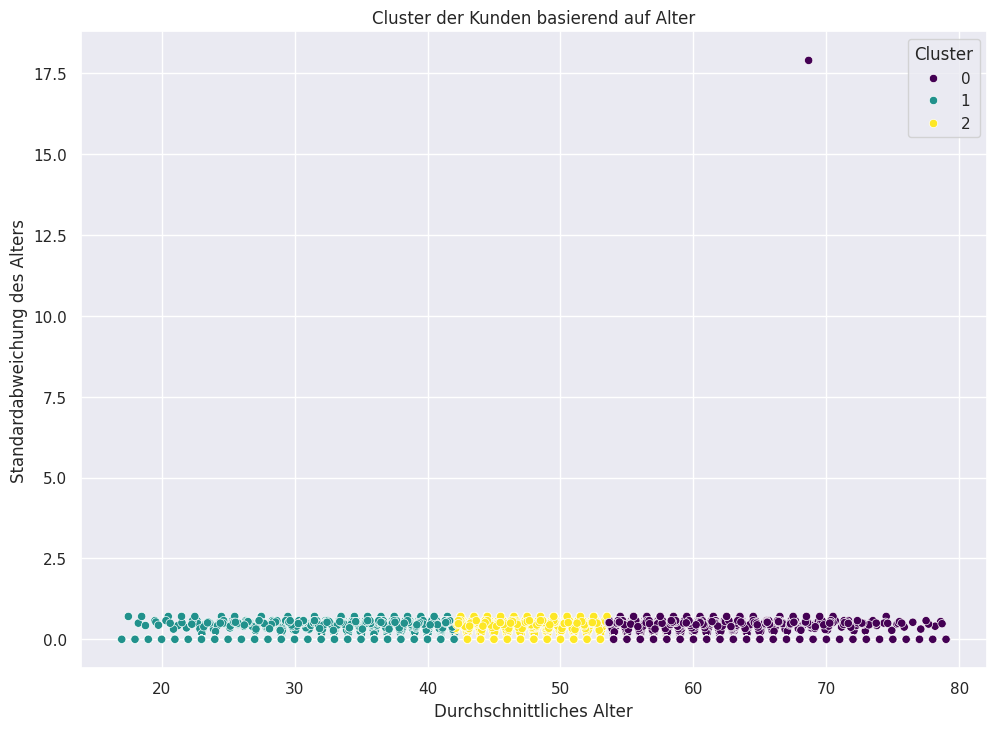

In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

# Berechne Durchschnitt und Standardabweichung des Alters pro Gruppe (oder insgesamt)
age_stats = df13.groupby('customerID')['age'].agg(
    average_age='mean',
    age_std='std'
).reset_index()

# Fülle NaN-Werte (z. B. wenn nur eine Altersangabe vorliegt) mit 0
age_stats['age_std'] = age_stats['age_std'].fillna(0)

# Features für das Clustering
X = age_stats[['average_age', 'age_std']]

# k-Means Clustering
kmeans = KMeans(n_clusters=3, random_state=42)  # Passe die Anzahl der Cluster an, falls nötig
age_stats['cluster_age'] = kmeans.fit_predict(X)

# Cluster-Zentren anzeigen
print("Cluster-Zentren:")
print(kmeans.cluster_centers_)

# Ergebnis anzeigen
print(age_stats.head())

# Streudiagramm der Cluster basierend auf Altersgruppen
sns.scatterplot(
    x='average_age',
    y='age_std',
    hue='cluster_age',
    data=age_stats,
    palette='viridis'
)
plt.title('Cluster der Kunden basierend auf Alter')
plt.xlabel('Durchschnittliches Alter')
plt.ylabel('Standardabweichung des Alters')
plt.legend(title='Cluster')
plt.show()


In [ ]:
# Merge der Cluster-Zuordnung zurück in df13
df13 = df13.merge(age_stats[['customerID', 'cluster_age']], on='customerID', how='left')

# Überprüfen, ob die Cluster erfolgreich hinzugefügt wurden
print(df13[['customerID', 'age', 'cluster_age']].head())


KeyError: "['cluster_age'] not in index"

In [ ]:
#df13.drop(columns=['cluster_age'], inplace=True)
df13.cluster_age.describe()

In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

# Berechne Rückgabewahrscheinlichkeit und Schwankungen pro Altersgruppe
age_stats = df13.groupby('age')['returnShipment'].agg(
    average_return_rate_age='mean',          # Durchschnittliche Rückgabewahrscheinlichkeit
    return_rate_std_age='std'                # Standardabweichung der Rückgabewahrscheinlichkeit
).reset_index()

# Fülle NaN-Werte (z. B. wenn nur eine Bestellung vorliegt) mit 0
age_stats['return_rate_std_age'] = age_stats['return_rate_std_age'].fillna(0)

# Features für das Clustering
X = age_stats[['average_return_rate_age', 'return_rate_std_age']]

# k-Means Clustering
kmeans = KMeans(n_clusters=3, random_state=42)  # Passe n_clusters an, falls nötig
age_stats['cluster_age_return'] = kmeans.fit_predict(X)

# Cluster-Zentren anzeigen
print("Cluster-Zentren:")
print(kmeans.cluster_centers_)

# Ergebnis anzeigen
print(age_stats.head())

# Streudiagramm der Cluster basierend auf Alter
sns.scatterplot(
    x='average_return_rate_age',
    y='return_rate_std_age',
    hue='cluster_age_return',
    data=age_stats,
    palette='viridis'
)
plt.title('Cluster basierend auf Rückgabeverhalten nach Alter')
plt.xlabel('Durchschnittliche Rückgabewahrscheinlichkeit (Alter)')
plt.ylabel('Standardabweichung der Rückgabewahrscheinlichkeit (Alter)')
plt.legend(title='Cluster')
plt.show()

# Merge der Alters-Cluster zurück in df13
df13 = df13.merge(age_stats[['age', 'cluster_age_return']], on='age', how='left')

# Fehlende Werte behandeln (falls notwendig)
df13['cluster_age_return'] = df13['cluster_age_return'].fillna(-1).astype(int)

# Ergebnis überprüfen
print(df13[['age', 'cluster_age_return']].head())


In [ ]:
df13 = df13.merge(age_stats[['age', 'average_return_rate_age','return_rate_std_age']], on='age', how='left')

In [ ]:
# Definieren der Bins und Labels
age_bins = [0, 25, 35, 50, 65, 80]  # Altersgrenzen
age_labels = ['<25', '25-35', '35-50', '50-65', '65+']  # Kategorien

# Diskretisierung durchführen
df13['age_bins'] = pd.cut(df13['age'], bins=age_bins, labels=age_labels)

# Ergebnis überprüfen
print(df13[['age', 'age_bins']].head())


In [ ]:
# Label-Encoding für Altersgruppen
age_encoding = {'<25': 0, '25-35': 1, '35-50': 2, '50-65': 3, '65+': 4}
df13['age_bins_encoded'] = df13['age_bins'].map(age_encoding)

# Ergebnis überprüfen
print(df13[['age_bins', 'age_bins_encoded']].head())


## similar_product_Category_count_size

In [ ]:
# Step 1: Erstelle df12 als Kopie von df9


# Step 2: Entferne 'customerID' aus dem Index, falls es als Index gesetzt ist
if 'customerID' in df13.index.names:
    df13.reset_index(inplace=True)

# Step 3: Erstelle das neue Feature 'similar_product_count_size'
df13['similar_product_category_count_size'] = df13.groupby(['customerID', 'orderDate', 'product_category'])['size'].transform('count') - 1

# Step 4: Überprüfe das Ergebnis
print(df13[['customerID', 'orderDate', 'product_category', 'size', 'similar_product_category_count_size']].head())


   customerID  orderDate product_category size  \
0         794 2012-04-01         Clothing    M   
1         794 2012-04-01            Shoes  9.5   
2         794 2012-04-01            Shoes  9.5   
3         825 2012-04-02            Shoes   39   
4         825 2012-04-02         Clothing  XXL   

   similar_product_category_count_size  
0                                    0  
1                                    1  
2                                    1  
3                                    1  
4                                    0  


In [ ]:
#filtered_df12 = df13[df13['itemID'] == 134] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

#filtered_df12 = df13[df13['itemID'] == 134]
#filtered_df12 = df13[df13['itemID'] == 156] # 23,24 36 38 40 Clothing
#filtered_df12 = df13[(df13['price'] == 289) ]
filtered_df12 = df13[(df13['customerID'] == 794) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['customerID', 'orderDate', 'itemID','product_category', 'size', 'similar_product_count_size','similar_product_category_count_size','category_count','similar_product_count_size_color']]


,customerID,orderDate,itemID,product_category,size,similar_product_count_size,similar_product_category_count_size,category_count,similar_product_count_size_color
0,794,2012-04-01,186,Clothing,M,0,0,1,0
1,794,2012-04-01,71,Shoes,9.5,1,1,2,1
2,794,2012-04-01,71,Shoes,9.5,1,1,2,1
51453,794,2012-05-17,553,Accessories,UNSIZED,0,0,1,0
68269,794,2012-06-01,42,Clothing,L,0,0,1,0
212158,794,2012-09-29,273,Clothing,M,1,1,2,1
212159,794,2012-09-29,273,Clothing,L,1,1,2,1
225293,794,2012-10-14,1847,Shoes,40,1,1,2,1
225294,794,2012-10-14,1847,Shoes,40,1,1,2,1
374134,794,2013-02-28,238,Clothing,M,1,1,2,1


## similar_product_category_return_rate

In [ ]:
import pandas as pd

# Step 1: Kopiere df9 in df12
#df12 = df9.copy()

# Step 2: Berechne die Anzahl der ähnlichen Produkte basierend auf size innerhalb einer Bestellung
df13['similar_product_category_count_size'] = df13.groupby(['customerID', 'orderDate', 'product_category'])['size'].transform('count') - 1

# Step 3: Berechne die Rücksendequote für ähnliche Produkte
# Zuerst gruppieren und die Rücksendungen ähnlicher Produkte summieren
df13['similar_product_return_sum'] = df13.groupby(['customerID', 'orderDate', 'product_category'])['returnShipment'].transform('sum')

# Berechne die Rücksendequote für ähnliche Produkte
# Wenn keine ähnlichen Produkte existieren, setze den Wert auf 0
df13['similar_product_category_return_rate'] = df13.apply(
    lambda row: (row['similar_product_return_sum'] - row['returnShipment']) / row['similar_product_category_count_size']
    if row['similar_product_category_count_size'] > 0 else 0.0, axis=1
)

# Step 4: Entferne die temporäre Spalte 'similar_product_return_sum', falls nicht mehr benötigt
df13.drop(columns=['similar_product_return_sum'], inplace=True)

# Überprüfe die Ergebnisse
print(df13[['customerID', 'orderDate', 'product_category', 'size', 'similar_product_category_count_size', 'returnShipment', 'similar_product_category_return_rate']].head(10))


   customerID  orderDate product_category size  \
0         794 2012-04-01         Clothing    M   
1         794 2012-04-01            Shoes  9.5   
2         794 2012-04-01            Shoes  9.5   
3         825 2012-04-02            Shoes   39   
4         825 2012-04-02         Clothing  XXL   
5         825 2012-04-02            Shoes   39   
6         850 2012-04-02         Clothing  XXL   
7         850 2012-04-02         Clothing  XXL   
8         850 2012-04-02         Clothing  XXL   
9         850 2012-04-02         Clothing  XXL   

   similar_product_category_count_size  returnShipment  \
0                                    0               0   
1                                    1               1   
2                                    1               1   
3                                    1               0   
4                                    0               0   
5                                    1               0   
6                                    3     

In [ ]:
#filtered_df12 = df13[df13['itemID'] == 134] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

#filtered_df12 = df13[df13['itemID'] == 134]
#filtered_df12 = df13[df13['itemID'] == 156] # 23,24 36 38 40 Clothing
#filtered_df12 = df13[(df13['price'] == 289) ]
filtered_df12 = df13[(df13['customerID'] == 6) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
#filtered_df12[['orderDate', 'itemID','product_category', 'size', 'similar_product_count_size','similar_product_category_count_size','category_count','similar_product_count_size_color','similar_product_category_return_rate','similar_product_return_rate','returnShipment']]
filtered_df12[['customerID','orderDate', 'itemID','product_category', 'size','similar_product_category_count_size','similar_product_category_return_rate','returnShipment']]


,customerID,orderDate,itemID,product_category,size,similar_product_category_count_size,similar_product_category_return_rate,returnShipment
22612,6,2012-04-19,261,Clothing,M,0,0.000000,0
28252,6,2012-04-25,96,Clothing,M,2,0.000000,1
28253,6,2012-04-25,96,Clothing,M,2,0.500000,0
28254,6,2012-04-25,96,Clothing,M,2,0.500000,0
205239,6,2012-09-23,1475,Shoes,40,2,0.500000,0
205240,6,2012-09-23,250,Shoes,40,2,0.500000,0
205241,6,2012-09-23,320,Shoes,38,2,0.000000,1
205242,6,2012-09-23,1404,Clothing,M,3,0.333333,1
205243,6,2012-09-23,1404,Clothing,M,3,0.666667,0
205244,6,2012-09-23,1404,Clothing,M,3,0.333333,1


## Durchschnittlicher Preis pro Kategorie in der Bestellung


In [ ]:
df13['avg_price_per_category_in_order'] = df13.groupby(['customerID', 'orderDate', 'product_category'])['price'].transform('mean')


## Rücksendequote pro Größe innerhalb der Bestellung


In [ ]:
df13['return_rate_per_size_in_order'] = df13.groupby(['customerID', 'orderDate', 'size'])['returnShipment'].transform('mean')


In [ ]:
#filtered_df12 = df13[df13['itemID'] == 134] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

#filtered_df12 = df13[df13['itemID'] == 134]
#filtered_df12 = df13[df13['itemID'] == 156] # 23,24 36 38 40 Clothing
#filtered_df12 = df13[(df13['price'] == 289) ]
filtered_df12 = df13[(df13['customerID'] == 6) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['orderDate','itemID','size','return_rate_per_size_in_order','return_rate_size_manufacturer','return_rate_size_itemid']]




,orderDate,itemID,size,return_rate_per_size_in_order,return_rate_size_manufacturer,return_rate_size_itemid
0,2012-04-19,261,M,0.000000,0.463335,0.250000
1,2012-04-25,96,M,0.333333,0.391931,0.220207
2,2012-04-25,96,M,0.333333,0.391931,0.220207
3,2012-04-25,96,M,0.333333,0.391931,0.220207
4,2012-09-23,1475,40,0.000000,0.212121,0.093023
5,2012-09-23,250,40,0.000000,0.212121,0.212121
6,2012-09-23,320,38,1.000000,0.670290,0.714286
7,2012-09-23,1404,M,0.500000,0.391931,0.199115
8,2012-09-23,1404,M,0.500000,0.391931,0.199115
9,2012-09-23,1404,M,0.500000,0.391931,0.199115


## Um zu analysieren, ob ein Kunde (customerID) denselben Artikel (itemID) an unterschiedlichen orderDate-Werten gekauft hat

In [ ]:
# Anzahl eindeutiger Kunden
unique_customers = df13['customerID'].nunique()

# Anzahl eindeutiger Artikel
unique_items = df13['itemID'].nunique()

# Ergebnisse ausgeben
print(f"Anzahl eindeutiger Kunden: {unique_customers}")
print(f"Anzahl eindeutiger Artikel: {unique_items}")


Anzahl eindeutiger Kunden: 59754
Anzahl eindeutiger Artikel: 3007


In [ ]:
# Anzahl eindeutiger Kunden
#unique_customers = orders_class2['customerID'].nunique()

# Anzahl eindeutiger Artikel
#unique_items = orders_class2['itemID'].nunique()

# Ergebnisse ausgeben
#print(f"Anzahl eindeutiger Kunden: {unique_customers}")
#print(f"Anzahl eindeutiger Artikel: {unique_items}")


In [ ]:
# Gruppieren nach customerID und itemID, und die Anzahl der eindeutigen orderDate berechnen
customer_item_orders = (
    df13.groupby(['customerID', 'itemID'])
    .agg(unique_order_dates=('orderDate', 'nunique'))  # Anzahl eindeutiger Bestelldaten
    .reset_index()
)

# Filtern von Kunden, die denselben Artikel an mehreren verschiedenen Bestelldaten gekauft haben
multiple_orders = customer_item_orders[customer_item_orders['unique_order_dates'] > 1]

# Ergebnisse überprüfen
print("Kunden mit Artikeln, die an mehreren unterschiedlichen Bestelldaten gekauft wurden:")
print(multiple_orders.head())

# Gesamtanzahl solcher Fälle
total_cases = len(multiple_orders)
print(f"Gesamtanzahl der Fälle: {total_cases}")


Kunden mit Artikeln, die an mehreren unterschiedlichen Bestelldaten gekauft wurden:
    customerID  itemID  unique_order_dates
4            6    1404                   2
17           9    1613                   2
18           9    1665                   2
23           9    2081                   2
46          16     410                   2
Gesamtanzahl der Fälle: 31835


In [ ]:
most_common_items = multiple_orders['itemID'].value_counts().head(10)
print("Am häufigsten mehrfach gekaufte Artikel:")
print(most_common_items)


Am häufigsten mehrfach gekaufte Artikel:
itemID
1532    274
32      233
1415    217
1470    208
1546    202
2334    195
22      186
1607    179
57      172
2345    154
Name: count, dtype: int64


In [ ]:
customer_analysis = multiple_orders['customerID'].value_counts().head(10)
print("Kunden mit den meisten mehrfachen Bestellungen:")
print(customer_analysis)


Kunden mit den meisten mehrfachen Bestellungen:
customerID
2649     61
744      50
2046     45
824      43
878      41
18912    36
25129    36
7983     34
27390    32
9366     30
Name: count, dtype: int64


In [ ]:
df13['orders_per_item_customer'] = df13.groupby(['customerID', 'itemID'])['orderDate'].transform('count')


In [ ]:
#filtered_df12 = df13[df13['itemID'] == 134] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

#filtered_df12 = df13[df13['itemID'] == 134]
#filtered_df12 = df13[df13['itemID'] == 156] # 23,24 36 38 40 Clothing
#filtered_df12 = df13[(df13['price'] == 289) ]
filtered_df12 = df13[(df13['customerID'] == 9) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['customerID','orderDate','itemID','orders_per_item_customer']]


,customerID,orderDate,itemID,orders_per_item_customer
147258,9,2012-08-01,2081,2
147259,9,2012-08-01,1922,1
147260,9,2012-08-01,1613,2
162929,9,2012-08-10,1613,2
162930,9,2012-08-10,2081,2
314412,9,2012-12-31,1669,1
314413,9,2012-12-31,1762,1
314414,9,2012-12-31,1665,3
314415,9,2012-12-31,2056,1
323349,9,2013-01-09,1665,3


In [ ]:
df13['unique_order_dates_per_item_customer'] = df13.groupby(['customerID', 'itemID'])['orderDate'].transform('nunique')


In [ ]:
#filtered_df12 = df13[df13['itemID'] == 134] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

#filtered_df12 = df13[df13['itemID'] == 134]
#filtered_df12 = df13[df13['itemID'] == 156] # 23,24 36 38 40 Clothing
#filtered_df12 = df13[(df13['price'] == 289) ]
filtered_df12 = df13[(df13['customerID'] == 9) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['customerID','orderDate','itemID','orders_per_item_customer','unique_order_dates_per_item_customer']]


,customerID,orderDate,itemID,orders_per_item_customer,unique_order_dates_per_item_customer
147258,9,2012-08-01,2081,2,2
147259,9,2012-08-01,1922,1,1
147260,9,2012-08-01,1613,2,2
162929,9,2012-08-10,1613,2,2
162930,9,2012-08-10,2081,2,2
314412,9,2012-12-31,1669,1,1
314413,9,2012-12-31,1762,1,1
314414,9,2012-12-31,1665,3,2
314415,9,2012-12-31,2056,1,1
323349,9,2013-01-09,1665,3,2


## multiple_orders_flag

In [ ]:
# Count the number of unique order dates per item and customer
df13['unique_order_dates_per_item_customer'] = df13.groupby(['customerID', 'itemID'])['orderDate'].transform('nunique')

# Create a flag indicating whether a customer has ordered the same item on multiple different dates
df13['multiple_orders_flag'] = (df13['unique_order_dates_per_item_customer'] > 1).astype(int)


In [ ]:
df13['multiple_orders_flag'] = (df13['unique_order_dates_per_item_customer'] > 1).astype(int)


In [ ]:
#filtered_df12 = df13[df13['itemID'] == 134] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

#filtered_df12 = df13[df13['itemID'] == 134]
#filtered_df12 = df13[df13['itemID'] == 156] # 23,24 36 38 40 Clothing
#filtered_df12 = df13[(df13['price'] == 289) ]
filtered_df12 = df13[(df13['customerID'] == 9) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['customerID','orderDate','itemID','orders_per_item_customer','multiple_orders_flag']]


,customerID,orderDate,itemID,orders_per_item_customer,multiple_orders_flag
147258,9,2012-08-01,2081,2,1
147259,9,2012-08-01,1922,1,0
147260,9,2012-08-01,1613,2,1
162929,9,2012-08-10,1613,2,1
162930,9,2012-08-10,2081,2,1
314412,9,2012-12-31,1669,1,0
314413,9,2012-12-31,1762,1,0
314414,9,2012-12-31,1665,3,1
314415,9,2012-12-31,2056,1,0
323349,9,2013-01-09,1665,3,1


In [ ]:
df13['first_order_date'] = df13.groupby(['customerID', 'itemID'])['orderDate'].transform('min')
df13['last_order_date'] = df13.groupby(['customerID', 'itemID'])['orderDate'].transform('max')
df13['days_between_first_last_order'] = (df13['last_order_date'] - df13['first_order_date']).dt.days


In [ ]:
#filtered_df12 = df13[df13['itemID'] == 134] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

#filtered_df12 = df13[df13['itemID'] == 134]
#filtered_df12 = df13[df13['itemID'] == 156] # 23,24 36 38 40 Clothing
#filtered_df12 = df13[(df13['price'] == 289) ]
filtered_df12 = df13[(df13['customerID'] == 9) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['customerID','orderDate','itemID','orders_per_item_customer','multiple_orders_flag','days_between_first_last_order']]


,customerID,orderDate,itemID,orders_per_item_customer,multiple_orders_flag,days_between_first_last_order
147258,9,2012-08-01,2081,2,1,9
147259,9,2012-08-01,1922,1,0,0
147260,9,2012-08-01,1613,2,1,9
162929,9,2012-08-10,1613,2,1,9
162930,9,2012-08-10,2081,2,1,9
314412,9,2012-12-31,1669,1,0,0
314413,9,2012-12-31,1762,1,0,0
314414,9,2012-12-31,1665,3,1,9
314415,9,2012-12-31,2056,1,0,0
323349,9,2013-01-09,1665,3,1,9


## repeat_rate_per_customer

In [ ]:
# Schritt 1: Berechnung der Anzahl eindeutiger orderDate pro Kunde
unique_order_dates_per_customer = (
    df13.groupby('customerID')['orderDate']
    .nunique()  # Anzahl der eindeutigen Bestelldaten
    .reset_index(name='unique_order_dates')
)

# Schritt 2: Berechnung der Wiederkaufrate
# Wiederkaufrate = 1 - (1 / Anzahl der eindeutigen orderDate), falls > 1
unique_order_dates_per_customer['repeat_rate_per_customer'] = (
    unique_order_dates_per_customer['unique_order_dates']
    .apply(lambda x: 1 - (1 / x) if x > 1 else 0)
)

# Schritt 3: Merge mit df13
df13 = df13.merge(unique_order_dates_per_customer[['customerID', 'repeat_rate_per_customer']], on='customerID', how='left')

# Ergebnisse überprüfen
print(df13[['customerID', 'orderDate', 'repeat_rate_per_customer']].drop_duplicates().head())

# Durchschnittliche Wiederkaufrate berechnen
avg_repeat_rate = unique_order_dates_per_customer['repeat_rate_per_customer'].mean()
print(f"Durchschnittliche Wiederkaufrate pro Kunde: {avg_repeat_rate:.2f}")


    customerID  orderDate  repeat_rate_per_customer
0          794 2012-04-01                  0.833333
3          808 2012-04-02                  0.000000
4          825 2012-04-02                  0.500000
7          850 2012-04-02                  0.000000
14         858 2012-04-02                  0.833333
Durchschnittliche Wiederkaufrate pro Kunde: 0.32


In [ ]:
"""
customer_repeat_rate = (
    df13.groupby(['customerID', 'itemID'])['orderDate'].nunique()
    .reset_index()
    .groupby('customerID')['orderDate'].apply(lambda x: (x > 1).mean())
    .reset_index(name='repeat_rate_per_customer')
)

df13 = df13.merge(customer_repeat_rate, on='customerID', how='left')
"""

"\ncustomer_repeat_rate = (\n    df13.groupby(['customerID', 'itemID'])['orderDate'].nunique()\n    .reset_index()\n    .groupby('customerID')['orderDate'].apply(lambda x: (x > 1).mean())\n    .reset_index(name='repeat_rate_per_customer')\n)\n\ndf13 = df13.merge(customer_repeat_rate, on='customerID', how='left')\n"

In [ ]:
#filtered_df12 = df13[df13['itemID'] == 134] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

#filtered_df12 = df13[df13['itemID'] == 134]
#filtered_df12 = df13[df13['itemID'] == 156] # 23,24 36 38 40 Clothing
#filtered_df12 = df13[(df13['price'] == 289) ]
filtered_df12 = df13[(df13['customerID'] == 6) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['customerID','orderDate','itemID','repeat_rate_per_customer']]


,customerID,orderDate,itemID,repeat_rate_per_customer
24723,6,2012-04-19,261,0.8
31011,6,2012-04-25,96,0.8
31012,6,2012-04-25,96,0.8
31013,6,2012-04-25,96,0.8
226242,6,2012-09-23,1475,0.8
226243,6,2012-09-23,250,0.8
226244,6,2012-09-23,320,0.8
226245,6,2012-09-23,1404,0.8
226246,6,2012-09-23,1404,0.8
226247,6,2012-09-23,1404,0.8


## same_day_as_creation

In [ ]:
from sklearn.tree import DecisionTreeClassifier
# Decision Tree Model
dt_model = DecisionTreeClassifier(random_state=42)
# Fit model
dt_model.fit(X_train, y_train)
# Make predictions
y_pred_dt = dt_model.predict(X_test)


In [ ]:
df13['orderDate'] = pd.to_datetime(df13['orderDate'], errors='coerce')
df13['creationDate'] = pd.to_datetime(df13['creationDate'], errors='coerce')


In [ ]:
# Schritt 1: Überprüfung, ob orderDate und creationDate am selben Tag liegen
df13['same_day_as_creation'] = (df13['orderDate'].dt.date == df13['creationDate'].dt.date).astype(int)

# Ergebnisse überprüfen
print(df13[['customerID', 'orderDate', 'creationDate', 'same_day_as_creation']].head())

# Anzahl der Fälle, bei denen die Bestellung am selben Tag wie die Kontoerstellung erfolgt ist
same_day_count = df13['same_day_as_creation'].sum()
total_orders = len(df13)
print(f"Bestellungen am selben Tag wie die Kontoerstellung: {same_day_count} von {total_orders} ({same_day_count / total_orders:.2%})")


   customerID  orderDate creationDate  same_day_as_creation
0         794 2012-04-01   2011-04-25                     0
1         794 2012-04-01   2011-04-25                     0
2         794 2012-04-01   2011-04-25                     0
3         808 2012-04-02   2012-01-04                     0
4         825 2012-04-02   2011-02-16                     0
Bestellungen am selben Tag wie die Kontoerstellung: 116982 von 481092 (24.32%)


## is_weekday

In [ ]:
# Schritt 1: Überprüfung, ob orderDate ein Wochentag ist (Montag bis Freitag)
df13['is_weekday'] = df13['orderDate'].dt.weekday < 5  # Montag=0, Sonntag=6
df13['is_weekday'] = df13['is_weekday'].astype(int)  # Codierung in 1 (Wochentag) oder 0 (Wochenende)

# Ergebnisse überprüfen
print(df13[['customerID', 'orderDate', 'is_weekday']].head())

# Analyse der Verteilung von Bestellungen nach Wochentagen
weekday_count = df13['is_weekday'].sum()
weekend_count = len(df13) - weekday_count

print(f"Anzahl der Bestellungen an Wochentagen: {weekday_count}")
print(f"Anzahl der Bestellungen am Wochenende: {weekend_count}")


   customerID  orderDate  is_weekday
0           6 2012-04-19           1
1           6 2012-04-25           1
2           6 2012-04-25           1
3           6 2012-04-25           1
4           6 2012-09-23           0
Anzahl der Bestellungen an Wochentagen: 314786
Anzahl der Bestellungen am Wochenende: 126887


## region_encoded

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Definition der Regionen basierend auf den Bundesländern
region_mapping = {
    'Mecklenburg-Western Pomerania': 'East',
    'Brandenburg': 'East',
    'Berlin': 'East',
    'Thuringia': 'East',
    'Saxony-Anhalt': 'East',
    'Saxony': 'East',
    'North Rhine-Westphalia': 'West',
    'Saarland': 'West',
    'Rhineland-Palatinate': 'West',
    'Hesse': 'West',
    'Bavaria': 'South',
    'Baden-Wuerttemberg': 'South',
    'Hamburg': 'North',
    'Schleswig-Holstein': 'North',
    'Lower Saxony': 'North',
    'Bremen': 'North'
}

# Neues Feature 'region' basierend auf der Spalte 'state' erstellen
df13['region'] = df13['state'].map(region_mapping)

# Label Encoding der Regionen
label_encoder = LabelEncoder()
df13['region_encoded'] = label_encoder.fit_transform(df13['region'])

# Überprüfung der Ergebnisse
print(df13[['state', 'region', 'region_encoded']].drop_duplicates().sort_values(by='region_encoded'))

# Mapping der Label-Codes zu den Regionen ausgeben
region_label_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
print("\nRegion-Label-Mapping:")
print(region_label_mapping)


                             state region  region_encoded
3                           Saxony   East               0
14                          Berlin   East               0
84                     Brandenburg   East               0
203                  Saxony-Anhalt   East               0
432                      Thuringia   East               0
723  Mecklenburg-Western Pomerania   East               0
43                          Bremen  North               1
77              Schleswig-Holstein  North               1
93                         Hamburg  North               1
106                   Lower Saxony  North               1
0               Baden-Wuerttemberg  South               2
31                         Bavaria  South               2
4             Rhineland-Palatinate   West               3
7           North Rhine-Westphalia   West               3
40                           Hesse   West               3
283                       Saarland   West               3

Region-Label-

## region_return_rate

Rücksendequote pro Region:
  region  total_orders_region  total_returns_region  return_rate_region
0   East                63882                 31603            0.494709
1  North               109087                 52272            0.479177
2  South               131730                 63662            0.483276
3   West               176393                 84554            0.479350


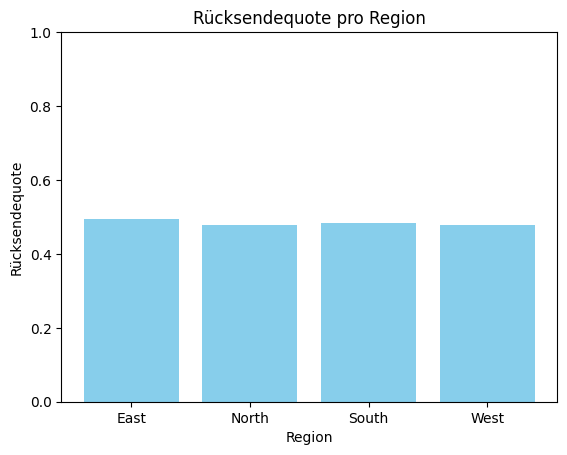

In [ ]:
# Schritt 1: Rücksendequote pro Region berechnen
region_return_rate = df13.groupby('region').agg(
    total_orders_region=('returnShipment', 'count'),   # Gesamtanzahl der Bestellungen
    total_returns_region=('returnShipment', 'sum')    # Gesamtanzahl der Rücksendungen
).reset_index()

# Berechnung der Rücksendequote
region_return_rate['return_rate_region'] = region_return_rate['total_returns_region'] / region_return_rate['total_orders_region']

# Ergebnisse ausgeben
print("Rücksendequote pro Region:")
print(region_return_rate)

# Optional: Verteilung visualisieren
import matplotlib.pyplot as plt

plt.bar(region_return_rate['region'], region_return_rate['return_rate_region'], color='skyblue')
plt.title('Rücksendequote pro Region')
plt.xlabel('Region')
plt.ylabel('Rücksendequote')
plt.ylim(0, 1)  # Rücksendequote ist ein Anteil (0 bis 1)
plt.show()


In [ ]:
# Schritt 1: Rücksendequote und aggregierte Werte pro Region berechnen
region_return_rate = df13.groupby('region').agg(
    total_orders_region=('returnShipment', 'count'),   # Gesamtanzahl der Bestellungen
    total_returns_region=('returnShipment', 'sum')    # Gesamtanzahl der Rücksendungen
).reset_index()

# Berechnung der Rücksendequote pro Region
region_return_rate['return_rate_region'] = (
    region_return_rate['total_returns_region'] / region_return_rate['total_orders_region']
)

# Berechnung der behaltenen Bestellungen pro Region
region_return_rate['total_kept_region'] = (
    region_return_rate['total_orders_region'] - region_return_rate['total_returns_region']
)

# Schritt 2: Merge mit df13, um die berechneten Features hinzuzufügen
df13 = df13.merge(region_return_rate, on='region', how='left')

# Ergebnisse überprüfen
print(df13[['region', 'total_kept_region', 'total_orders_region', 'total_returns_region', 'return_rate_region']].drop_duplicates().head())


   region  total_kept_region  total_orders_region  total_returns_region  \
0   South              68068               131730                 63662   
3    East              32279                63882                 31603   
4    West              91839               176393                 84554   
43  North              56815               109087                 52272   

    return_rate_region  
0             0.483276  
3             0.494709  
4             0.479350  
43            0.479177  


## average_customer_region_return_rate

In [ ]:
# Schritt 1: Rücksendequote und aggregierte Werte pro Kunde innerhalb einer Region berechnen
customer_region_return_rate = (
    df13.groupby(['customerID', 'region'])
    .agg(
        total_orders_region_customer=('returnShipment', 'count'),
        total_returns_region_customer=('returnShipment', 'sum')
    )
    .reset_index()
)

# Berechnung der Rücksendequote pro Kunde
customer_region_return_rate['customer_region_return_rate'] = (
    customer_region_return_rate['total_returns_region_customer'] / customer_region_return_rate['total_orders_region_customer']
)

# Berechnung der behaltenen Bestellungen pro Kunde
customer_region_return_rate['total_kept_region_customer'] = (
    customer_region_return_rate['total_orders_region_customer'] - customer_region_return_rate['total_returns_region_customer']
)

# Schritt 2: Merge der kundenbasierten Daten in df13
df13 = df13.merge(
    customer_region_return_rate[['customerID', 'region', 'total_orders_region_customer', 'total_returns_region_customer', 'total_kept_region_customer', 'customer_region_return_rate']],
    on=['customerID', 'region'],
    how='left'
)

# Schritt 3: Durchschnittliche Rücksendequote pro Region berechnen
region_customer_return_rate = (
    customer_region_return_rate.groupby('region')
    .agg(average_customer_region_return_rate=('customer_region_return_rate', 'mean'))
    .reset_index()
)

# Merge der regionbasierten Daten in df13
df13 = df13.merge(region_customer_return_rate, on='region', how='left')

# Ergebnisse überprüfen
print(df13[['region', 'average_customer_region_return_rate', 'total_kept_region_customer', 'total_orders_region_customer', 'total_returns_region_customer']].drop_duplicates().head())

# Gesamtübersicht der Rücksendequote pro Region
print("\nDurchschnittliche Kunden-Rücksendequote pro Region:")
print(region_customer_return_rate)


   region  average_customer_region_return_rate  total_kept_region_customer  \
0   South                             0.430344                           6   
1    East                             0.448423                           9   
9    East                             0.448423                          24   
12  South                             0.430344                          11   
15   West                             0.429054                           2   

    total_orders_region_customer  total_returns_region_customer  
0                             11                              5  
1                             14                              5  
9                             54                             30  
12                            22                             11  
15                             3                              1  

Durchschnittliche Kunden-Rücksendequote pro Region:
  region  average_customer_region_return_rate
0   East                            

In [ ]:


filtered_df12 = df13[(df13['customerID'] == 6) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['region', 'average_customer_region_return_rate', 'customer_region_return_rate','total_kept_region_customer', 'total_orders_region_customer', 'total_returns_region_customer','total_kept_region', 'total_orders_region', 'total_returns_region', 'return_rate_region','customer_return_rate']]



,region,average_customer_region_return_rate,customer_region_return_rate,total_kept_region_customer,total_orders_region_customer,total_returns_region_customer,total_kept_region,total_orders_region,total_returns_region,return_rate_region,customer_return_rate
24719,North,0.423984,0.4,15,25,10,56815,109087,52272,0.479177,0.4
32280,North,0.423984,0.4,15,25,10,56815,109087,52272,0.479177,0.4
32334,North,0.423984,0.4,15,25,10,56815,109087,52272,0.479177,0.4
32336,North,0.423984,0.4,15,25,10,56815,109087,52272,0.479177,0.4
225027,North,0.423984,0.4,15,25,10,56815,109087,52272,0.479177,0.4
225028,North,0.423984,0.4,15,25,10,56815,109087,52272,0.479177,0.4
225029,North,0.423984,0.4,15,25,10,56815,109087,52272,0.479177,0.4
225047,North,0.423984,0.4,15,25,10,56815,109087,52272,0.479177,0.4
225048,North,0.423984,0.4,15,25,10,56815,109087,52272,0.479177,0.4
225049,North,0.423984,0.4,15,25,10,56815,109087,52272,0.479177,0.4


In [ ]:


filtered_df12 = df13[(df13['customerID'] == 6) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['customerID','state','region','total_kept_region_customer', 'total_orders_region_customer', 'total_returns_region_customer']]



,customerID,state,region,total_kept_region_customer,total_orders_region_customer,total_returns_region_customer
22608,6,Lower Saxony,North,14,24,10
29403,6,Lower Saxony,North,14,24,10
29404,6,Lower Saxony,North,14,24,10
29405,6,Lower Saxony,North,14,24,10
204078,6,Lower Saxony,North,14,24,10
204079,6,Lower Saxony,North,14,24,10
204087,6,Lower Saxony,North,14,24,10
204100,6,Lower Saxony,North,14,24,10
204101,6,Lower Saxony,North,14,24,10
204121,6,Lower Saxony,North,14,24,10


## produces_multiple_categories

In [ ]:
# Schritt 1: Anzahl eindeutiger `product_category` pro `manufacturerID` berechnen
manufacturer_category_analysis = (
    df13.groupby('manufacturerID')['product_category']
    .nunique()
    .reset_index(name='unique_categories_per_manufacturer')
)

# Schritt 2: Hinzufügen eines Flags, ob eine `manufacturerID` mehrere Kategorien produziert
manufacturer_category_analysis['produces_multiple_categories'] = (
    manufacturer_category_analysis['unique_categories_per_manufacturer'] > 1
).astype(int)

# Schritt 3: Merge der berechneten Werte in df13
df13 = df13.merge(manufacturer_category_analysis, on='manufacturerID', how='left')

# Ergebnisse überprüfen
print(df13[['manufacturerID', 'unique_categories_per_manufacturer', 'produces_multiple_categories']].drop_duplicates().head())

# Analyse: Verteilung der Hersteller nach der Anzahl der produzierten Kategorien
category_distribution = manufacturer_category_analysis['unique_categories_per_manufacturer'].value_counts()
print("\nVerteilung der Hersteller nach Anzahl der produzierten Kategorien:")
print(category_distribution)


    manufacturerID  unique_categories_per_manufacturer  \
0               42                                   2   
1                3                                   1   
4                7                                   1   
6               25                                   2   
10              36                                   2   

    produces_multiple_categories  
0                              1  
1                              0  
4                              0  
6                              1  
10                             1  

Verteilung der Hersteller nach Anzahl der produzierten Kategorien:
unique_categories_per_manufacturer
1    128
2     29
3      8
Name: count, dtype: int64


## return_rate_category_manufacturer

In [ ]:
# Schritt 1: Rücksendequote pro `product_category` und `manufacturerID` berechnen
manufacturer_category_return_rate = (
    df13.groupby(['manufacturerID', 'product_category'])
    .agg(
        total_orders=('returnShipment', 'count'),   # Gesamtanzahl der Bestellungen
        total_returns=('returnShipment', 'sum')    # Gesamtanzahl der Rücksendungen
    )
    .reset_index()
)

# Berechnung der Rücksendequote
manufacturer_category_return_rate['return_rate_category_manufacturer'] = (
    manufacturer_category_return_rate['total_returns'] / manufacturer_category_return_rate['total_orders']
)

# Schritt 2: Merge der berechneten Rücksendequote in df13
df13 = df13.merge(
    manufacturer_category_return_rate[['manufacturerID', 'product_category', 'return_rate_category_manufacturer']],
    on=['manufacturerID', 'product_category'],
    how='left'
)

# Ergebnisse überprüfen
print(df13[['manufacturerID', 'product_category', 'return_rate_category_manufacturer']].drop_duplicates().head())


    manufacturerID product_category  return_rate_category_manufacturer
0               42         Clothing                           0.519206
1                3         Clothing                           0.417418
4                7            Shoes                           0.196182
6               25            Shoes                           0.690180
10              36         Clothing                           0.527651


In [ ]:
df13[['manufacturerID', 'product_category', 'return_rate_category_manufacturer']].drop_duplicates()

,manufacturerID,product_category,return_rate_category_manufacturer
0,42,Clothing,0.519206
1,3,Clothing,0.417418
4,7,Shoes,0.196182
6,25,Shoes,0.690180
10,36,Clothing,0.527651
...,...,...,...
210382,164,Accessories,0.000000
211746,108,Clothing,0.583333
219877,109,Shoes,0.000000
268264,121,Accessories,0.000000


## return_rate_size_category_manufacturer

In [ ]:
# Schritt 1: Rücksendequote pro `size`, `product_category`, und `manufacturerID` berechnen
manufacturer_category_size_return_rate = (
    df13.groupby(['manufacturerID', 'product_category', 'size'])
    .agg(
        total_orders=('returnShipment', 'count'),   # Gesamtanzahl der Bestellungen
        total_returns=('returnShipment', 'sum')    # Gesamtanzahl der Rücksendungen
    )
    .reset_index()
)

# Berechnung der Rücksendequote
manufacturer_category_size_return_rate['return_rate_size_category_manufacturer'] = (
    manufacturer_category_size_return_rate['total_returns'] / manufacturer_category_size_return_rate['total_orders']
)

# Schritt 2: Merge der berechneten Rücksendequote in df13
df13 = df13.merge(
    manufacturer_category_size_return_rate[['manufacturerID', 'product_category', 'size', 'return_rate_size_category_manufacturer']],
    on=['manufacturerID', 'product_category', 'size'],
    how='left'
)

# Ergebnisse überprüfen
print(df13[['manufacturerID', 'product_category', 'size', 'return_rate_size_category_manufacturer']].drop_duplicates().head())


    manufacturerID product_category size  \
0               42         Clothing    M   
1                3         Clothing    M   
4                7            Shoes   40   
6               25            Shoes   38   
10              36         Clothing    M   

    return_rate_size_category_manufacturer  
0                                 0.514475  
1                                 0.420387  
4                                 0.221441  
6                                 0.702247  
10                                0.512874  


## Favourite Color

In [ ]:
# Berechnung der Lieblingsfarbe pro Kunde und Produktkategorie
favourite_color_by_category = (
    df13.groupby(['customerID', 'product_category'])['color']
    .agg(lambda x: x.mode()[0] if not x.mode().empty else None)  # Modus (häufigster Wert)
    .reset_index(name='favourite_color')
)

# Merge mit df13
df13 = df13.merge(favourite_color_by_category, on=['customerID', 'product_category'], how='left')

# Ergebnisse anzeigen
print(df13[['customerID', 'product_category', 'color', 'favourite_color']].drop_duplicates().head())


   customerID product_category      color favourite_color
0           6         Clothing  turquoise           green
1           6         Clothing      olive           green
2           6         Clothing     purple           green
3           6         Clothing       blue           green
4           6            Shoes       blue           green


In [ ]:
"""
# Berechnung der Lieblingsfarbe pro Kunde
favourite_color = (
    df13.groupby('customerID')['color']
    .agg(lambda x: x.mode()[0] if not x.mode().empty else None)  # Modus (häufigster Wert)
    .reset_index(name='favourite_color')
)

# Merge in df13
df13 = df13.merge(favourite_color, on='customerID', how='left')

# Ergebnisse anzeigen
print(df13[['customerID', 'color', 'favourite_color']].drop_duplicates().head())
"""

"\n# Berechnung der Lieblingsfarbe pro Kunde\nfavourite_color = (\n    df13.groupby('customerID')['color']\n    .agg(lambda x: x.mode()[0] if not x.mode().empty else None)  # Modus (häufigster Wert)\n    .reset_index(name='favourite_color')\n)\n\n# Merge in df13\ndf13 = df13.merge(favourite_color, on='customerID', how='left')\n\n# Ergebnisse anzeigen\nprint(df13[['customerID', 'color', 'favourite_color']].drop_duplicates().head())\n"

In [ ]:

filtered_df12 = df13[(df13['customerID'] == 115) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['customerID','orderDate','itemID' ,'product_category',  'color', 'favourite_color','returnShipment']]



,customerID,orderDate,itemID,product_category,color,favourite_color,returnShipment
745,115,2012-04-21,20,Shoes,brown,black,1
746,115,2012-04-21,20,Shoes,brown,black,0
747,115,2012-05-06,138,Clothing,blue,blue,1
748,115,2012-05-06,138,Clothing,blue,blue,1
749,115,2012-05-06,425,Clothing,blue,blue,1
750,115,2012-05-06,425,Clothing,blue,blue,1
751,115,2012-05-06,96,Clothing,blue,blue,1
752,115,2012-05-06,96,Clothing,blue,blue,0
753,115,2012-05-06,82,Clothing,red,blue,1
754,115,2012-05-06,82,Clothing,dark denim,blue,1


## Favourite Size

In [ ]:
# Berechnung der Lieblingsgröße pro Kunde und Produktkategorie
favourite_size_by_category = (
    df13.groupby(['customerID', 'product_category'])['size']
    .agg(lambda x: x.mode()[0] if not x.mode().empty else None)  # Modus (häufigster Wert)
    .reset_index(name='favourite_size')
)

# Merge mit df13
df13 = df13.merge(favourite_size_by_category, on=['customerID', 'product_category'], how='left')

# Ergebnisse anzeigen
print(df13[['customerID', 'product_category', 'size', 'favourite_size']].drop_duplicates().head())


    customerID product_category size favourite_size
0            6         Clothing    M              M
4            6            Shoes   40             38
6            6            Shoes   38             38
15           6         Clothing    L              M
17           6            Shoes   36             38


In [ ]:
"""
# Berechnung der Lieblingsgröße pro Kunde
favourite_size = (
    df13.groupby('customerID')['size']
    .agg(lambda x: x.mode()[0] if not x.mode().empty else None)  # Modus (häufigster Wert)
    .reset_index(name='favourite_size')
)

# Merge in df13
df13 = df13.merge(favourite_size, on='customerID', how='left')

# Ergebnisse anzeigen
print(df13[['customerID', 'size', 'favourite_size']].drop_duplicates().head())
"""

"\n# Berechnung der Lieblingsgröße pro Kunde\nfavourite_size = (\n    df13.groupby('customerID')['size']\n    .agg(lambda x: x.mode()[0] if not x.mode().empty else None)  # Modus (häufigster Wert)\n    .reset_index(name='favourite_size')\n)\n\n# Merge in df13\ndf13 = df13.merge(favourite_size, on='customerID', how='left')\n\n# Ergebnisse anzeigen\nprint(df13[['customerID', 'size', 'favourite_size']].drop_duplicates().head())\n"

In [ ]:
df13[['customerID', 'product_category', 'size', 'favourite_size']].drop_duplicates()

,customerID,product_category,size,favourite_size
0,6,Clothing,M,M
4,6,Shoes,40,38
6,6,Shoes,38,38
15,6,Clothing,L,M
17,6,Shoes,36,38
...,...,...,...,...
481079,86606,Clothing,M,M
481080,86606,Clothing,L,M
481086,86609,Clothing,XXL,XXL
481088,86610,Shoes,39,39


In [ ]:

filtered_df12 = df13[(df13['customerID'] == 115) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['customerID','orderDate','itemID' ,'product_category', 'size', 'favourite_size','returnShipment']]



,customerID,orderDate,itemID,product_category,size,favourite_size,returnShipment
745,115,2012-04-21,20,Shoes,42,44,1
746,115,2012-04-21,20,Shoes,43,44,0
747,115,2012-05-06,138,Clothing,M,L,1
748,115,2012-05-06,138,Clothing,L,L,1
749,115,2012-05-06,425,Clothing,M,L,1
750,115,2012-05-06,425,Clothing,L,L,1
751,115,2012-05-06,96,Clothing,M,L,1
752,115,2012-05-06,96,Clothing,L,L,0
753,115,2012-05-06,82,Clothing,M,L,1
754,115,2012-05-06,82,Clothing,L,L,1


In [ ]:
df13['favourite_size'] = df13['favourite_size'].astype('category')
df13['favourite_color'] = df13['favourite_color'].astype('category')


## print column

In [ ]:
# Importiere Pandas
import pandas as pd

# Stelle sicher, dass alle Spalten angezeigt werden
pd.set_option('display.max_columns', None)

# Gib die Namen aller Spalten aus
print("Spaltennamen der DataFrame:")
for column in df13.columns:
    print(column)


Spaltennamen der DataFrame:
orderItemID
orderDate
deliveryDate
itemID
size
color
manufacturerID
price
customerID
dateOfBirth
state
creationDate
returnShipment
non_null_delivery_count
unique_delivery_dates
deliveryTime
age
color_miss
color_hex
color_rgb
r
g
b
size_false
customer_return_rate
item_rto_percentage
manufacturer_rto_percentage
duplicate_item_return_rate
multiple_order_flag
similar_product_count_size
similar_product_count_color
similar_product_return_rate
product_category
size_category
exact_product_count
category_count
manufacturer_count
count_without_size
count_without_color
similar_product_count_size_color
total_products_in_cart
cart_size_flag
previous_purchases
return_rate_size_product_category
return_rate_color
category_variation
free_return
average_cart_value
highest_price_item
discount_percentage
discount_rank
price_rank
min_discount_item
max_discount_item
mean_discount_item
min_price_item
max_price_item
mean_price_item
discount_bins_custom
discount_bins_encoded
first_a

In [ ]:
"""
'age', 'delivery_time_category_v2_encoded','price_category_encoded','category_count', 'manufacturer_count',
                   'count_without_size', 'similar_product_count_size_color', 'count_without_color',
                   'total_products_in_cart', 'num_low_price','num_low_disc','num_order_pro_customer',
                   'total_spend_pro_kund',
                   'total_spend_pro_customer','mean_spend_customer','outseason.by.iid','past_returns','low_price'
"""

"\n'age', 'delivery_time_category_v2_encoded','price_category_encoded','category_count', 'manufacturer_count',\n                   'count_without_size', 'similar_product_count_size_color', 'count_without_color',\n                   'total_products_in_cart', 'num_low_price','num_low_disc','num_order_pro_customer',\n                   'total_spend_pro_kund',\n                   'total_spend_pro_customer','mean_spend_customer','outseason.by.iid','past_returns','low_price'\n"

### main

#### Xgboost

##### feutreu engniering

In [ ]:
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from xgboost import XGBClassifier

# Sicherstellen, dass alle Features vorhanden sind
feature_columns = ['category_count', 'count_without_size', 'similar_product_count_size_color', 'count_without_color',
                   'total_products_in_cart', 'price_rank', 'product_category_encoded', 'customer_return_rate',
                    'multiple_packages_flag', 'discount_bins_encoded','return_rate_size_itemid',
                   'return_rate_color_itemid','multiple_orders_flag','repeat_rate_per_customer',
                   'same_day_as_creation','region_encoded','return_rate_region','total_kept_region_customer','size_category_encoded','free_return'
                    ,'days_since_launch_scaled','target_group_encoded','sub_category_encoded','price_category_encoded'

]

#'category_count', 'count_without_size', 'similar_product_count_size_color', 'count_without_color',
                #   'total_products_in_cart', 'price_rank', 'product_category_encoded', 'customer_return_rate',
                 #  'return_rate_size_itemid', 'multiple_packages_flag', 'discount_bins_encoded'
#return_rate_size_itemid
#discount_bins_encoded
                   #,'duplicate_item_return_rate'
#batch_rrate 79%
# Sortiere die Daten nach `orderDate`
df13 = df13.sort_values(by='orderDate')

# Definiere den ersten und letzten Monat als Testset
first_month = df13['orderDate'].dt.to_period('M').min()
last_month = df13['orderDate'].dt.to_period('M').max()

# Erstelle Test- und Trainingssets
test_data = df13[df13['orderDate'].dt.to_period('M').isin([first_month, last_month])]
train_data = df13[~df13['orderDate'].dt.to_period('M').isin([first_month, last_month])]

# Features und Zielvariable definieren
X_train = train_data[feature_columns]
y_train = train_data['returnShipment']

X_test = test_data[feature_columns]
y_test = test_data['returnShipment']

# XGBoost-Classifier initialisieren
xgb_model = XGBClassifier(random_state=42, enable_categorical=True, eval_metric='logloss')

# Modell trainieren
xgb_model.fit(X_train, y_train)

# Vorhersagen auf dem Testdatensatz
y_pred_xgb = xgb_model.predict(X_test)

# Modellbewertung
print("XGBoost Performance:")
print("Accuracy:", accuracy_score(y_test, y_pred_xgb))
print("Precision:", precision_score(y_test, y_pred_xgb))
print("Recall:", recall_score(y_test, y_pred_xgb))
print("F1 Score:", f1_score(y_test, y_pred_xgb))


XGBoost Performance:
Accuracy: 0.7787541846006696
Precision: 0.7716092879672505
Recall: 0.8425729151399678
F1 Score: 0.8055312292009669


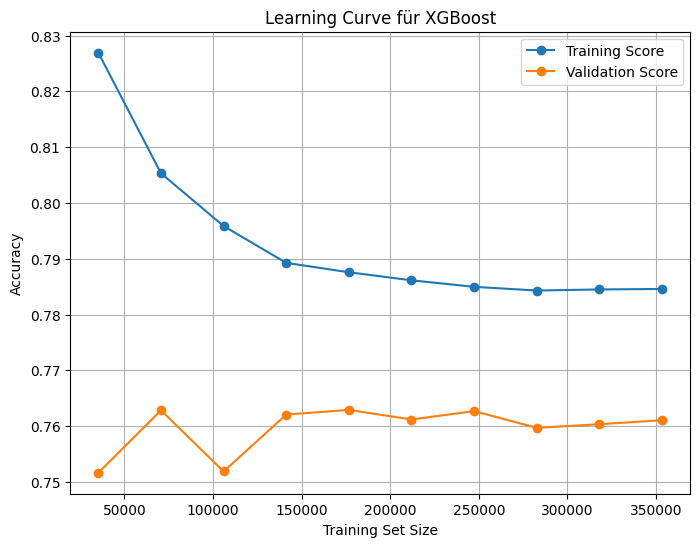

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
from xgboost import XGBClassifier

# Sicherstellen, dass die Features und Zielvariable definiert sind
X = df13[feature_columns]
y = df13['returnShipment']

# Berechnung der Learning Curve
train_sizes, train_scores, test_scores = learning_curve(
    XGBClassifier(random_state=42, enable_categorical=True, eval_metric='logloss'),
    X, y, cv=5, scoring='accuracy', n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10)
)

# Mittelwerte über die Cross-Validation-Splits berechnen
train_mean = np.mean(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)

# Learning Curve plotten
plt.figure(figsize=(8, 6))
plt.plot(train_sizes, train_mean, label='Training Score', marker='o', linestyle='-')
plt.plot(train_sizes, test_mean, label='Validation Score', marker='o', linestyle='-')
plt.xlabel('Training Set Size')
plt.ylabel('Accuracy')
plt.title('Learning Curve für XGBoost')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
from sklearn.metrics import accuracy_score, f1_score

# Modell ohne Hyperparameter-Tuning
xgb_model_default = XGBClassifier(random_state=42, enable_categorical=True, eval_metric='logloss')
xgb_model_default.fit(X_train, y_train)

# Vorhersagen
y_train_pred = xgb_model_default.predict(X_train)
y_test_pred = xgb_model_default.predict(X_test)

# Berechnung der Fehler (Bias)
train_accuracy_default = accuracy_score(y_train, y_train_pred)
test_accuracy_default = accuracy_score(y_test, y_test_pred)
train_f1_default = f1_score(y_train, y_train_pred)
test_f1_default = f1_score(y_test, y_test_pred)

print("Vor der Optimierung:")
print(f"Training Accuracy: {train_accuracy_default:.4f}, Test Accuracy: {test_accuracy_default:.4f}")
print(f"Training F1-Score: {train_f1_default:.4f}, Test F1-Score: {test_f1_default:.4f}")
print(f"Bias (Differenz Train-Test Accuracy): {abs(train_accuracy_default - test_accuracy_default):.4f}")
print(f"Variance (Differenz Train-Test F1): {abs(train_f1_default - test_f1_default):.4f}")


Vor der Optimierung:
Training Accuracy: 0.7824, Test Accuracy: 0.7788
Training F1-Score: 0.7974, Test F1-Score: 0.8055
Bias (Differenz Train-Test Accuracy): 0.0036
Variance (Differenz Train-Test F1): 0.0081


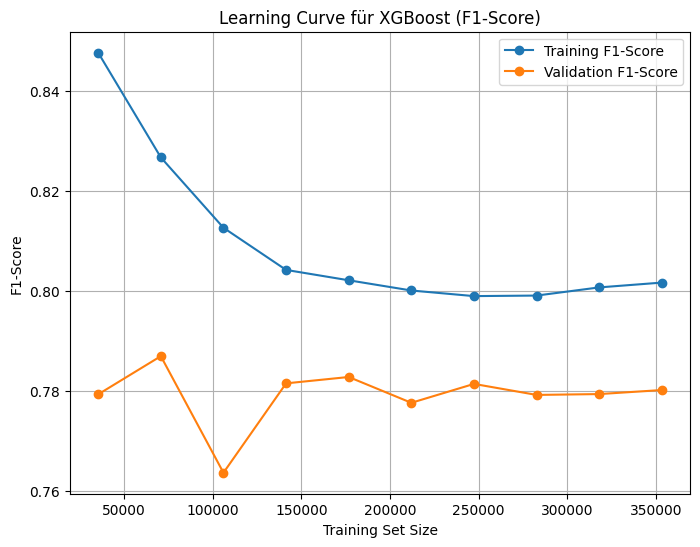

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
from xgboost import XGBClassifier
from sklearn.metrics import make_scorer, f1_score

# Custom Scorer für F1-Score (statt Accuracy)
f1_scorer = make_scorer(f1_score)

# Learning Curve berechnen
train_sizes, train_scores, test_scores = learning_curve(
    XGBClassifier(random_state=42, enable_categorical=True, eval_metric='logloss'),
    X, y, cv=5, scoring=f1_scorer, n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10)
)

# Mittelwerte berechnen
train_mean = np.mean(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)

# Learning Curve für F1-Score plotten
plt.figure(figsize=(8, 6))
plt.plot(train_sizes, train_mean, label='Training F1-Score', marker='o', linestyle='-')
plt.plot(train_sizes, test_mean, label='Validation F1-Score', marker='o', linestyle='-')
plt.xlabel('Training Set Size')
plt.ylabel('F1-Score')
plt.title('Learning Curve für XGBoost (F1-Score)')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, mean_squared_error
from sklearn.model_selection import ShuffleSplit
from xgboost import XGBClassifier

# Sicherstellen, dass alle Features vorhanden sind
feature_columns = ['category_count', 'count_without_size', 'similar_product_count_size_color', 'count_without_color',
                   'total_products_in_cart', 'price_rank', 'product_category_encoded', 'customer_return_rate',
                   'multiple_packages_flag', 'discount_bins_encoded', 'return_rate_size_itemid',
                   'return_rate_color_itemid', 'multiple_orders_flag', 'repeat_rate_per_customer',
                   'same_day_as_creation', 'region_encoded', 'return_rate_region', 'total_kept_region_customer',
                   'size_category_encoded', 'free_return', 'days_since_launch_scaled', 'target_group_encoded',
                   'sub_category_encoded', 'price_category_encoded']

# Sortiere die Daten nach `orderDate`
df13 = df13.sort_values(by='orderDate')

# Definiere den ersten und letzten Monat als Testset
first_month = df13['orderDate'].dt.to_period('M').min()
last_month = df13['orderDate'].dt.to_period('M').max()

# Erstelle Test- und Trainingssets
test_data = df13[df13['orderDate'].dt.to_period('M').isin([first_month, last_month])]
train_data = df13[~df13['orderDate'].dt.to_period('M').isin([first_month, last_month])]

# Features und Zielvariable definieren
X_train = train_data[feature_columns]
y_train = train_data['returnShipment']
X_test = test_data[feature_columns]
y_test = test_data['returnShipment']

# XGBoost-Classifier initialisieren
xgb_model = XGBClassifier(random_state=42, enable_categorical=True, eval_metric='logloss')

# Modell trainieren
xgb_model.fit(X_train, y_train)

# Vorhersagen auf Testdaten
y_pred_xgb = xgb_model.predict(X_test)
y_train_pred_xgb = xgb_model.predict(X_train)

# Bias-Berechnung (Mean Squared Error auf Testdaten)
bias = mean_squared_error(y_test, y_pred_xgb)

# Varianz-Berechnung mit Bootstrapping
n_splits = 10  # Anzahl der Bootstrapping-Samples
varianz_scores = []

cv = ShuffleSplit(n_splits=n_splits, test_size=0.2, random_state=42)

for train_idx, _ in cv.split(X_train):
    X_train_sample, y_train_sample = X_train.iloc[train_idx], y_train.iloc[train_idx]

    # Neues Modell für jede Iteration trainieren
    model = XGBClassifier(random_state=42, enable_categorical=True, eval_metric='logloss')
    model.fit(X_train_sample, y_train_sample)

    # Vorhersagen auf Testdaten
    y_test_pred_sample = model.predict(X_test)
    varianz_scores.append(mean_squared_error(y_test, y_test_pred_sample))

varianz = np.var(varianz_scores)  # Berechnung der Streuung (Varianz)

# Modellbewertung
print("XGBoost Performance:")
print(f"Accuracy: {accuracy_score(y_test, y_pred_xgb):.4f}")
print(f"Precision: {precision_score(y_test, y_pred_xgb):.4f}")
print(f"Recall: {recall_score(y_test, y_pred_xgb):.4f}")
print(f"F1 Score: {f1_score(y_test, y_pred_xgb):.4f}")

# Bias und Varianz ausgeben
print(f"\nBias (Mean Squared Error auf Testdaten): {bias:.4f}")
print(f"Varianz (Streuung der Modellvorhersagen über Bootstrapping): {varianz:.4f}")


XGBoost Performance:
Accuracy: 0.7788
Precision: 0.7716
Recall: 0.8426
F1 Score: 0.8055

Bias (Mean Squared Error auf Testdaten): 0.2212
Varianz (Streuung der Modellvorhersagen über Bootstrapping): 0.0000


   customerID  orderDate  return_prediction_2
0       12489 2013-04-01                    1
1       12489 2013-04-01                    1
2       12489 2013-04-01                    1
3       12489 2013-04-01                    1
4       12489 2013-04-01                    1
Vergleich von tatsächlicher Lösung und Vorhersagen:
   orderItemID  returnShipment  return_prediction_2
0            1               1                    1
1            2               1                    1
2            3               1                    1
3            4               0                    1
4            5               0                    1

Performance des Modells auf den Unseen Data:
Accuracy: 0.6292
Precision: 0.5977
Recall: 0.7897
F1 Score: 0.6804


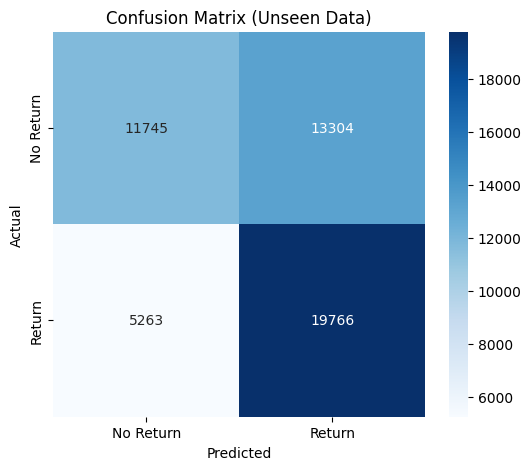

In [ ]:
import joblib  # Import joblib for loading the model

# Load the XGBoost model from the .pkl file
model_path = 'xgb_model.pkl'  # Replace with the correct path to your model file
loaded_model = joblib.load(model_path)

X_orders_class2 = orders_class2[['category_count', 'count_without_size', 'similar_product_count_size_color', 'count_without_color',
                   'total_products_in_cart', 'price_rank', 'product_category_encoded', 'customer_return_rate',
                    'multiple_packages_flag', 'discount_bins_encoded','return_rate_size_itemid',
                   'return_rate_color_itemid','multiple_orders_flag','repeat_rate_per_customer',
                   'same_day_as_creation','region_encoded','return_rate_region','total_kept_region_customer','size_category_encoded','free_return'
                    ,'days_since_launch_scaled','target_group_encoded','sub_category_encoded','price_category_encoded'


]]
#'customer_return_rate',
# return_rate_size_itemid
# Vorhersagen generieren
predictions = loaded_model.predict(X_orders_class2)

# Ergebnisse in `orders_class2` speichern
orders_class2['return_prediction_2'] = predictions

# Ergebnisse überprüfen
print(orders_class2[['customerID', 'orderDate', 'return_prediction_2']].head())
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Tatsächliche Lösung laden
actual_solution = pd.read_csv("DMC 2014_realclass.txt", sep=";", dtype={'orderItemID': int, 'returnShipment': int})

# Vorhersagen vorbereiten (Zusammenführen der Dateien)
comparison_df = actual_solution.merge(
    orders_class2[['orderItemID', 'return_prediction_2']],
    on='orderItemID',
    how='left'
)

# Überprüfung der Vorhersagen
print("Vergleich von tatsächlicher Lösung und Vorhersagen:")
print(comparison_df.head())

# Tatsächliche und vorhergesagte Werte extrahieren
y_true = comparison_df['returnShipment']
y_pred = comparison_df['return_prediction_2']

# Performance-Metriken berechnen
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = f1_score(y_true, y_pred)

# Ergebnisse anzeigen
print("\nPerformance des Modells auf den Unseen Data:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Confusion Matrix plotten
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Return', 'Return'], yticklabels=['No Return', 'Return'])
plt.title('Confusion Matrix (Unseen Data)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


<ipython-input-10-5b4a979fce57>:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_orders_class2['return_prediction_2'] = valid_predictions


Erste Zeilen mit NaT in deliveryDate (sollten return_prediction_2 = 0 haben):
       customerID  orderDate deliveryDate  return_prediction_2
4           12489 2013-04-01   2013-04-03                    0
9           22284 2013-04-01   2013-04-02                    0
11          22026 2013-04-01   2013-04-09                    0
12          22026 2013-04-01   2013-04-09                    0
14          38315 2013-04-01   2013-05-02                    0
...           ...        ...          ...                  ...
50056       91911 2013-04-29   2013-05-03                    0
50064       89065 2013-04-28   2013-06-19                    0
50065       89065 2013-04-28   2013-06-19                    0
50076       91922 2013-04-28   2013-05-02                    0
50077       91922 2013-04-28   2013-05-02                    0

[4268 rows x 4 columns]

Erste Zeilen mit gültigem deliveryDate (Vorhersagen vom Modell):
   customerID  orderDate deliveryDate  return_prediction_2
0       12489 20

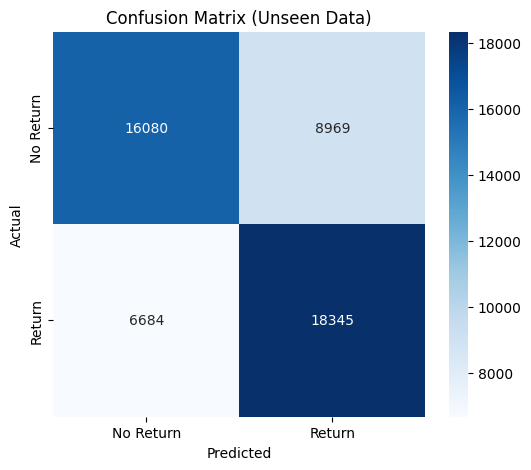

In [ ]:
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Sicherstellen, dass deliveryDate im orders_class korrekt erkannt wird
orders_class['deliveryDate'] = pd.to_datetime(orders_class['deliveryDate'], errors='coerce')

# Identifizieren der orderItemID mit deliveryDate = NaT
nat_order_ids = orders_class[orders_class['deliveryDate'].isna()]['orderItemID']

# Setzen von `return_prediction_2 = 0` für diese orderItemIDs in orders_class2
orders_class2.loc[orders_class2['orderItemID'].isin(nat_order_ids), 'return_prediction_2'] = 0

# Filtern der Daten: Nur orderItemIDs mit gültigem deliveryDate werden vom Modell verwendet
valid_orders_class2 = orders_class2[~orders_class2['orderItemID'].isin(nat_order_ids)]

# Features für Vorhersagen extrahieren (nur gültige Zeilen)
X_valid_orders_class2 = valid_orders_class2[['category_count', 'count_without_size', 'similar_product_count_size_color', 'count_without_color',
                   'total_products_in_cart', 'price_rank', 'product_category_encoded', 'customer_return_rate',
                    'multiple_packages_flag', 'discount_bins_encoded','return_rate_size_itemid',
                   'return_rate_color_itemid','multiple_orders_flag','repeat_rate_per_customer',
                   'same_day_as_creation','region_encoded','return_rate_region','total_kept_region_customer','size_category_encoded','free_return'
                    ,'days_since_launch_scaled','target_group_encoded','sub_category_encoded','price_category_encoded']]

# Vorhersagen mit dem Modell generieren (nur für gültige orderItemIDs)
valid_predictions = loaded_model.predict(X_valid_orders_class2)

# Speichern der Vorhersagen in `return_prediction_2` (nur für gültige Zeilen)
valid_orders_class2['return_prediction_2'] = valid_predictions

# Kombinieren der Vorhersagen mit den ursprünglichen Daten
orders_class2.update(valid_orders_class2)

# Überprüfung der Ergebnisse
print("Erste Zeilen mit NaT in deliveryDate (sollten return_prediction_2 = 0 haben):")
print(orders_class2[orders_class2['orderItemID'].isin(nat_order_ids)][['customerID', 'orderDate', 'deliveryDate', 'return_prediction_2']])

print("\nErste Zeilen mit gültigem deliveryDate (Vorhersagen vom Modell):")
print(orders_class2[~orders_class2['orderItemID'].isin(nat_order_ids)][['customerID', 'orderDate', 'deliveryDate', 'return_prediction_2']].head())

# Tatsächliche Lösung laden
actual_solution = pd.read_csv("DMC 2014_realclass.txt", sep=";", dtype={'orderItemID': int, 'returnShipment': int})

# Vorhersagen vorbereiten (Zusammenführen der Dateien)
comparison_df = actual_solution.merge(
    orders_class2[['orderItemID', 'return_prediction_2']],
    on='orderItemID',
    how='left'
)

# Überprüfung der Vorhersagen
print("Vergleich von tatsächlicher Lösung und Vorhersagen:")
print(comparison_df.head())

# Tatsächliche und vorhergesagte Werte extrahieren
y_true = comparison_df['returnShipment']
y_pred = comparison_df['return_prediction_2']

# Performance-Metriken berechnen
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = f1_score(y_true, y_pred)

# Ergebnisse anzeigen
print("\nPerformance des Modells auf den Unseen Data:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Confusion Matrix plotten
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Return', 'Return'], yticklabels=['No Return', 'Return'])
plt.title('Confusion Matrix (Unseen Data)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


In [ ]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.tree import DecisionTreeClassifier

# Label-Encoding für 'size', aber NICHT für 'size_category' oder 'size_category_encoded'
#label_encoder = LabelEncoder()
#df13['size_encoded'] = label_encoder.fit_transform(df13['size'])

# Feature-Liste anpassen (statt One-Hot-Encoding wird 'size_encoded' verwendet)
feature_columns = [
    'category_count', 'count_without_size', 'similar_product_count_size_color', 'count_without_color',
                   'total_products_in_cart', 'price_rank', 'product_category_encoded', 'customer_return_rate',
                    'multiple_packages_flag', 'discount_bins_encoded','return_rate_size_itemid',
                   'return_rate_color_itemid','multiple_orders_flag','repeat_rate_per_customer',
                   'same_day_as_creation','region_encoded','return_rate_region','total_kept_region_customer','size_category_encoded','free_return'
                    ,'days_since_launch_scaled','target_group_encoded','sub_category_encoded','price_category_encoded'
]

# Sortiere die Daten nach `orderDate`
df13 = df13.sort_values(by='orderDate')

# Definiere den ersten und letzten Monat als Testset
first_month = df13['orderDate'].dt.to_period('M').min()
last_month = df13['orderDate'].dt.to_period('M').max()

# Erstelle Test- und Trainingssets
test_data = df13[df13['orderDate'].dt.to_period('M').isin([first_month, last_month])]
train_data = df13[~df13['orderDate'].dt.to_period('M').isin([first_month, last_month])]

# Features und Zielvariable definieren
X_train = train_data[feature_columns]
y_train = train_data['returnShipment']

X_test = test_data[feature_columns]
y_test = test_data['returnShipment']

# DecisionTreeClassifier initialisieren
dt_model = DecisionTreeClassifier(random_state=42)

# Modell trainieren
dt_model.fit(X_train, y_train)

# Vorhersagen auf dem Testdatensatz
y_pred_dt = dt_model.predict(X_test)

# Modellbewertung
print("Decision Tree Performance:")
print("Accuracy:", accuracy_score(y_test, y_pred_dt))
print("Precision:", precision_score(y_test, y_pred_dt))
print("Recall:", recall_score(y_test, y_pred_dt))
print("F1 Score:", f1_score(y_test, y_pred_dt))


Decision Tree Performance:
Accuracy: 0.6795155403163367
Precision: 0.6813605242924614
Recall: 0.6818848014070057
F1 Score: 0.6816225620364436


   customerID  orderDate  return_prediction_2
0       12489 2013-04-01                    1
1       12489 2013-04-01                    1
2       12489 2013-04-01                    1
3       12489 2013-04-01                    1
4       12489 2013-04-01                    1
Vergleich von tatsächlicher Lösung und Vorhersagen:
   orderItemID  returnShipment  return_prediction_2
0            1               1                    1
1            2               1                    1
2            3               1                    1
3            4               0                    1
4            5               0                    1

Performance des Modells auf den Unseen Data:
Accuracy: 0.5742
Precision: 0.5680
Recall: 0.6186
F1 Score: 0.5922


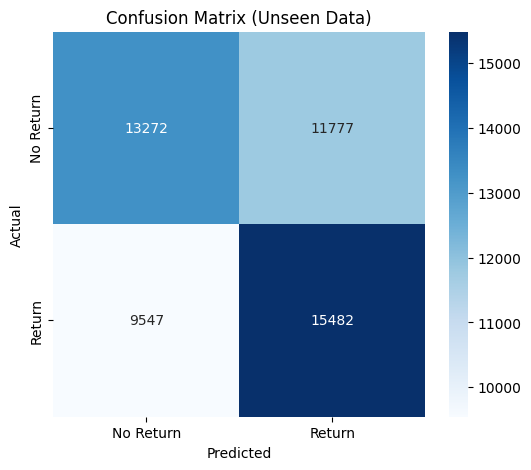

In [ ]:
import joblib  # Import für das Laden des Modells
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# Modellpfad (ändere den Dateinamen entsprechend)
model_path = 'dt_model.pkl'  # DecisionTree-Modell statt XGBoost
loaded_model = joblib.load(model_path)

# Label-Encoding für 'size', aber NICHT für 'size_category', 'size_category_encoded' oder 'size_false'
label_encoder = LabelEncoder()
orders_class2['size_encoded'] = label_encoder.fit_transform(orders_class2['size'])

# Feature-Liste definieren (ohne `size_category`, `size_category_encoded`, `size_false`)
feature_columns = [
    'category_count', 'count_without_size', 'similar_product_count_size_color', 'count_without_color',
                   'total_products_in_cart', 'price_rank', 'product_category_encoded', 'customer_return_rate',
                    'multiple_packages_flag', 'discount_bins_encoded','return_rate_size_itemid',
                   'return_rate_color_itemid','multiple_orders_flag','repeat_rate_per_customer',
                   'same_day_as_creation','region_encoded','return_rate_region','total_kept_region_customer','size_category_encoded','free_return'
                    ,'days_since_launch_scaled','target_group_encoded','sub_category_encoded','price_category_encoded'
]



# Sicherstellen, dass nur relevante Features enthalten sind
X_orders_class2 = orders_class2[feature_columns]

# Vorhersagen mit dem geladenen DecisionTree-Modell
predictions = loaded_model.predict(X_orders_class2)

# Ergebnisse in `orders_class2` speichern
orders_class2['return_prediction_2'] = predictions

# Ergebnisse überprüfen
print(orders_class2[['customerID', 'orderDate', 'return_prediction_2']].head())


import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Tatsächliche Lösung laden
actual_solution = pd.read_csv("DMC 2014_realclass.txt", sep=";", dtype={'orderItemID': int, 'returnShipment': int})

# Vorhersagen vorbereiten (Zusammenführen der Dateien)
comparison_df = actual_solution.merge(
    orders_class2[['orderItemID', 'return_prediction_2']],
    on='orderItemID',
    how='left'
)

# Überprüfung der Vorhersagen
print("Vergleich von tatsächlicher Lösung und Vorhersagen:")
print(comparison_df.head())

# Tatsächliche und vorhergesagte Werte extrahieren
y_true = comparison_df['returnShipment']
y_pred = comparison_df['return_prediction_2']

# Performance-Metriken berechnen
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = f1_score(y_true, y_pred)

# Ergebnisse anzeigen
print("\nPerformance des Modells auf den Unseen Data:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Confusion Matrix plotten
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Return', 'Return'], yticklabels=['No Return', 'Return'])
plt.title('Confusion Matrix (Unseen Data)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


<ipython-input-189-45d007c8d704>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_orders_class2['return_prediction_2'] = valid_predictions


Erste Zeilen mit NaT in deliveryDate (sollten return_prediction_2 = 0 haben):
       customerID  orderDate deliveryDate  return_prediction_2
4           12489 2013-04-01   2013-04-03                    0
9           22284 2013-04-01   2013-04-02                    0
11          22026 2013-04-01   2013-04-09                    0
12          22026 2013-04-01   2013-04-09                    0
14          38315 2013-04-01   2013-05-02                    0
...           ...        ...          ...                  ...
50056       91911 2013-04-29   2013-05-03                    0
50064       89065 2013-04-28   2013-06-19                    0
50065       89065 2013-04-28   2013-06-19                    0
50076       91922 2013-04-28   2013-05-02                    0
50077       91922 2013-04-28   2013-05-02                    0

[4268 rows x 4 columns]

Erste Zeilen mit gültigem deliveryDate (Vorhersagen vom Modell):
   customerID  orderDate deliveryDate  return_prediction_2
0       12489 20

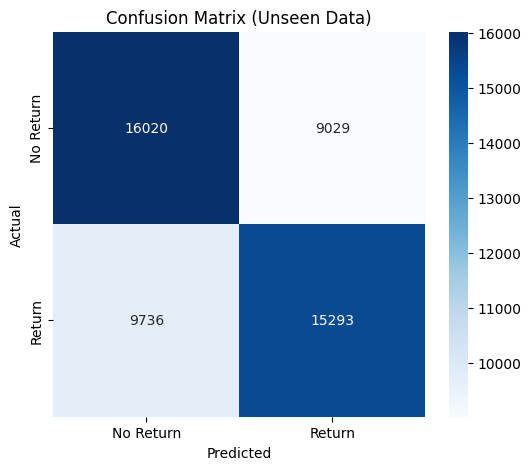

In [ ]:
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import joblib  # Import für das Laden des Modells
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# Modellpfad (ändere den Dateinamen entsprechend)
model_path = 'dt_model.pkl'  # DecisionTree-Modell statt XGBoost
loaded_model = joblib.load(model_path)
# Sicherstellen, dass deliveryDate im orders_class korrekt erkannt wird
orders_class['deliveryDate'] = pd.to_datetime(orders_class['deliveryDate'], errors='coerce')

# Identifizieren der orderItemID mit deliveryDate = NaT
nat_order_ids = orders_class[orders_class['deliveryDate'].isna()]['orderItemID']

# Setzen von `return_prediction_2 = 0` für diese orderItemIDs in orders_class2
orders_class2.loc[orders_class2['orderItemID'].isin(nat_order_ids), 'return_prediction_2'] = 0

# Filtern der Daten: Nur orderItemIDs mit gültigem deliveryDate werden vom Modell verwendet
valid_orders_class2 = orders_class2[~orders_class2['orderItemID'].isin(nat_order_ids)]

# Features für Vorhersagen extrahieren (nur gültige Zeilen)
X_valid_orders_class2 = valid_orders_class2[['category_count', 'count_without_size', 'similar_product_count_size_color', 'count_without_color',
                   'total_products_in_cart', 'price_rank', 'product_category_encoded', 'customer_return_rate',
                    'multiple_packages_flag', 'discount_bins_encoded','return_rate_size_itemid',
                   'return_rate_color_itemid','multiple_orders_flag','repeat_rate_per_customer',
                   'same_day_as_creation','region_encoded','return_rate_region','total_kept_region_customer','size_category_encoded','free_return'
                    ,'days_since_launch_scaled','target_group_encoded','sub_category_encoded','price_category_encoded']]

# Vorhersagen mit dem Modell generieren (nur für gültige orderItemIDs)
valid_predictions = loaded_model.predict(X_valid_orders_class2)

# Speichern der Vorhersagen in `return_prediction_2` (nur für gültige Zeilen)
valid_orders_class2['return_prediction_2'] = valid_predictions

# Kombinieren der Vorhersagen mit den ursprünglichen Daten
orders_class2.update(valid_orders_class2)

# Überprüfung der Ergebnisse
print("Erste Zeilen mit NaT in deliveryDate (sollten return_prediction_2 = 0 haben):")
print(orders_class2[orders_class2['orderItemID'].isin(nat_order_ids)][['customerID', 'orderDate', 'deliveryDate', 'return_prediction_2']])

print("\nErste Zeilen mit gültigem deliveryDate (Vorhersagen vom Modell):")
print(orders_class2[~orders_class2['orderItemID'].isin(nat_order_ids)][['customerID', 'orderDate', 'deliveryDate', 'return_prediction_2']].head())

# Tatsächliche Lösung laden
actual_solution = pd.read_csv("DMC 2014_realclass.txt", sep=";", dtype={'orderItemID': int, 'returnShipment': int})

# Vorhersagen vorbereiten (Zusammenführen der Dateien)
comparison_df = actual_solution.merge(
    orders_class2[['orderItemID', 'return_prediction_2']],
    on='orderItemID',
    how='left'
)

# Überprüfung der Vorhersagen
print("Vergleich von tatsächlicher Lösung und Vorhersagen:")
print(comparison_df.head())

# Tatsächliche und vorhergesagte Werte extrahieren
y_true = comparison_df['returnShipment']
y_pred = comparison_df['return_prediction_2']

# Performance-Metriken berechnen
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = f1_score(y_true, y_pred)

# Ergebnisse anzeigen
print("\nPerformance des Modells auf den Unseen Data:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Confusion Matrix plotten
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Return', 'Return'], yticklabels=['No Return', 'Return'])
plt.title('Confusion Matrix (Unseen Data)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


##### basilinemodel

In [ ]:
df13['size'] = df13['size'].astype('category')
orders_class2['size'] = orders_class2['size'].astype('category')


In [ ]:
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from xgboost import XGBClassifier

# Sicherstellen, dass alle Features vorhanden sind
feature_columns = ['size', 'r', 'g', 'b','deliveryTime', 'age', 'manufacturerID','customerID','itemID','salutation_Family',
'salutation_Mr','salutation_Mrs','state_encoded','price'

]

#'category_count', 'count_without_size', 'similar_product_count_size_color', 'count_without_color',
                #   'total_products_in_cart', 'price_rank', 'product_category_encoded', 'customer_return_rate',
                 #  'return_rate_size_itemid', 'multiple_packages_flag', 'discount_bins_encoded'
#return_rate_size_itemid
#discount_bins_encoded
                   #,'duplicate_item_return_rate'
#batch_rrate 79%
# Sortiere die Daten nach `orderDate`
df13 = df13.sort_values(by='orderDate')

# Definiere den ersten und letzten Monat als Testset
first_month = df13['orderDate'].dt.to_period('M').min()
last_month = df13['orderDate'].dt.to_period('M').max()

# Erstelle Test- und Trainingssets
test_data = df13[df13['orderDate'].dt.to_period('M').isin([first_month, last_month])]
train_data = df13[~df13['orderDate'].dt.to_period('M').isin([first_month, last_month])]

# Features und Zielvariable definieren
X_train = train_data[feature_columns]
y_train = train_data['returnShipment']

X_test = test_data[feature_columns]
y_test = test_data['returnShipment']

# XGBoost-Classifier initialisieren
xgb_model = XGBClassifier(random_state=42, enable_categorical=True, eval_metric='logloss')

# Modell trainieren
xgb_model.fit(X_train, y_train)

# Vorhersagen auf dem Testdatensatz
y_pred_xgb = xgb_model.predict(X_test)

# Modellbewertung
print("XGBoost Performance:")
print("Accuracy:", accuracy_score(y_test, y_pred_xgb))
print("Precision:", precision_score(y_test, y_pred_xgb))
print("Recall:", recall_score(y_test, y_pred_xgb))
print("F1 Score:", f1_score(y_test, y_pred_xgb))


XGBoost Performance:
Accuracy: 0.6076139805515702
Precision: 0.6151433895377904
Recall: 0.7438993111534515
F1 Score: 0.6734221720995415


basiline with parameter

In [ ]:
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from xgboost import XGBClassifier

# Sicherstellen, dass alle Features vorhanden sind
feature_columns = ['size', 'r', 'g', 'b','deliveryTime', 'age', 'manufacturerID','customerID','itemID','salutation_Family',
'salutation_Mr','salutation_Mrs','state_encoded','price']

# Sortiere die Daten nach `orderDate`
df13 = df13.sort_values(by='orderDate')

# Definiere den ersten und letzten Monat als Testset
first_month = df13['orderDate'].dt.to_period('M').min()
last_month = df13['orderDate'].dt.to_period('M').max()

# Erstelle Test- und Trainingssets
test_data = df13[df13['orderDate'].dt.to_period('M').isin([first_month, last_month])]
train_data = df13[~df13['orderDate'].dt.to_period('M').isin([first_month, last_month])]

# Features und Zielvariable definieren
X_train = train_data[feature_columns]
y_train = train_data['returnShipment']

X_test = test_data[feature_columns]
y_test = test_data['returnShipment']

# XGBoost-Classifier mit den besten Parametern initialisieren
xgb_model = XGBClassifier(
    random_state=42,
    enable_categorical=True,
    eval_metric='logloss',
    n_estimators=101,
    max_depth=4,
    learning_rate=0.011548760009813974,
    subsample=0.6239723071216094,
    colsample_bytree=0.994403644898695,
    gamma=2.0783697157718035,
    reg_alpha=2.576030134915148,
    reg_lambda=2.847912001910963
)

# Modell trainieren
xgb_model.fit(X_train, y_train)

# Vorhersagen auf dem Testdatensatz
y_pred_xgb = xgb_model.predict(X_test)

# Modellbewertung
print("XGBoost Performance:")
print("Accuracy:", accuracy_score(y_test, y_pred_xgb))
print("Precision:", precision_score(y_test, y_pred_xgb))
print("Recall:", recall_score(y_test, y_pred_xgb))
print("F1 Score:", f1_score(y_test, y_pred_xgb))


XGBoost Performance:
Accuracy: 0.5712587103196549
Precision: 0.5628769578430609
Recall: 0.6616774146269969
F1 Score: 0.6082914382436905


In [ ]:
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from xgboost import XGBClassifier

# Sicherstellen, dass alle Basis-Features (Group 1) vorhanden sind
group_1_features = ['size', 'r', 'g', 'b', 'deliveryTime', 'age', 'manufacturerID', 'customerID', 'itemID',
                    'salutation_Family', 'salutation_Mr', 'salutation_Mrs', 'state_encoded', 'price']

# Sortiere die Daten nach `orderDate`
df13 = df13.sort_values(by='orderDate')

# Definiere den ersten und letzten Monat als Testset
first_month = df13['orderDate'].dt.to_period('M').min()
last_month = df13['orderDate'].dt.to_period('M').max()

# Erstelle Test- und Trainingssets
test_data = df13[df13['orderDate'].dt.to_period('M').isin([first_month, last_month])]
train_data = df13[~df13['orderDate'].dt.to_period('M').isin([first_month, last_month])]

# Sicherstellen, dass nur existierende Features in den Trainingsdaten verwendet werden
group_1_features = [feat for feat in group_1_features if feat in train_data.columns]

# Features und Zielvariable definieren
X_train_group_1 = train_data[group_1_features]
y_train = train_data['returnShipment']

X_test_group_1 = test_data[group_1_features]
y_test = test_data['returnShipment']

# XGBoost-Classifier initialisieren
xgb_model = XGBClassifier(random_state=42, enable_categorical=True, eval_metric='logloss')

# Modell trainieren
xgb_model.fit(X_train_group_1, y_train)

# Vorhersagen auf dem Testdatensatz
y_pred_xgb = xgb_model.predict(X_test_group_1)

# Modellbewertung
print("XGBoost Performance (Group 1 - Basis-Features):")
print("Accuracy:", accuracy_score(y_test, y_pred_xgb))
print("Precision:", precision_score(y_test, y_pred_xgb))
print("Recall:", recall_score(y_test, y_pred_xgb))
print("F1 Score:", f1_score(y_test, y_pred_xgb))


XGBoost Performance (Group 1 - Basis-Features):
Accuracy: 0.6078331739199745
Precision: 0.6144431580688328
Recall: 0.7486809321412868
F1 Score: 0.6749523093820452


In [ ]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.tree import DecisionTreeClassifier

# Label-Encoding für 'size', aber NICHT für 'size_category' oder 'size_category_encoded'
label_encoder = LabelEncoder()
df13['size_encoded'] = label_encoder.fit_transform(df13['size'])

# Feature-Liste anpassen (statt One-Hot-Encoding wird 'size_encoded' verwendet)
feature_columns = [
    'r', 'g', 'b', 'deliveryTime', 'age', 'manufacturerID', 'customerID', 'itemID',
    'salutation_Family', 'salutation_Mr', 'salutation_Mrs', 'state_encoded', 'price',
    'size_encoded'  # Neue Spalte mit Label-Encoding für 'size'
]

# Sortiere die Daten nach `orderDate`
df13 = df13.sort_values(by='orderDate')

# Definiere den ersten und letzten Monat als Testset
first_month = df13['orderDate'].dt.to_period('M').min()
last_month = df13['orderDate'].dt.to_period('M').max()

# Erstelle Test- und Trainingssets
test_data = df13[df13['orderDate'].dt.to_period('M').isin([first_month, last_month])]
train_data = df13[~df13['orderDate'].dt.to_period('M').isin([first_month, last_month])]

# Features und Zielvariable definieren
X_train = train_data[feature_columns]
y_train = train_data['returnShipment']

X_test = test_data[feature_columns]
y_test = test_data['returnShipment']

# DecisionTreeClassifier initialisieren
dt_model = DecisionTreeClassifier(random_state=42)

# Modell trainieren
dt_model.fit(X_train, y_train)

# Vorhersagen auf dem Testdatensatz
y_pred_dt = dt_model.predict(X_test)

# Modellbewertung
print("Decision Tree Performance:")
print("Accuracy:", accuracy_score(y_test, y_pred_dt))
print("Precision:", precision_score(y_test, y_pred_dt))
print("Recall:", recall_score(y_test, y_pred_dt))
print("F1 Score:", f1_score(y_test, y_pred_dt))


Decision Tree Performance:
Accuracy: 0.5249880439980871
Precision: 0.5691187064756263
Recall: 0.5210318041917046
F1 Score: 0.5440146906920693


basiline with parameter

In [ ]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.tree import DecisionTreeClassifier

# Label-Encoding für 'size', aber NICHT für 'size_category' oder 'size_category_encoded'
label_encoder = LabelEncoder()
df13['size_encoded'] = label_encoder.fit_transform(df13['size'])

# Feature-Liste anpassen (statt One-Hot-Encoding wird 'size_encoded' verwendet)
feature_columns = [
    'r', 'g', 'b', 'deliveryTime', 'age', 'manufacturerID', 'customerID', 'itemID',
    'salutation_Family', 'salutation_Mr', 'salutation_Mrs', 'state_encoded', 'price',
    'size_encoded'  # Neue Spalte mit Label-Encoding für 'size'
]

# Sortiere die Daten nach `orderDate`
df13 = df13.sort_values(by='orderDate')

# Definiere den ersten und letzten Monat als Testset
first_month = df13['orderDate'].dt.to_period('M').min()
last_month = df13['orderDate'].dt.to_period('M').max()

# Erstelle Test- und Trainingssets
test_data = df13[df13['orderDate'].dt.to_period('M').isin([first_month, last_month])]
train_data = df13[~df13['orderDate'].dt.to_period('M').isin([first_month, last_month])]

# Features und Zielvariable definieren
X_train = train_data[feature_columns]
y_train = train_data['returnShipment']

X_test = test_data[feature_columns]
y_test = test_data['returnShipment']

# DecisionTreeClassifier mit den besten Parametern initialisieren
dt_model = DecisionTreeClassifier(
    random_state=42,
    max_depth=3,
    min_samples_split=16,
    min_samples_leaf=16,
    max_features='sqrt',
    criterion='entropy'
)

# Modell trainieren
dt_model.fit(X_train, y_train)

# Vorhersagen auf dem Testdatensatz
y_pred_dt = dt_model.predict(X_test)

# Modellbewertung
print("Decision Tree Performance:")
print("Accuracy:", accuracy_score(y_test, y_pred_dt))
print("Precision:", precision_score(y_test, y_pred_dt))
print("Recall:", recall_score(y_test, y_pred_dt))
print("F1 Score:", f1_score(y_test, y_pred_dt))


Decision Tree Performance:
Accuracy: 0.5533034693802308
Precision: 0.5451221489967122
Recall: 0.677377986223069
F1 Score: 0.604096037120847


test auf unseen data

In [ ]:
# Convert the boolean columns to integers
orders_class2 = pd.get_dummies(orders_class2, columns=['salutation'], drop_first=True, dtype=int)


   customerID  orderDate  return_prediction_2
0       12489 2013-04-01                    1
1       12489 2013-04-01                    1
2       12489 2013-04-01                    1
3       12489 2013-04-01                    1
4       12489 2013-04-01                    1
Vergleich von tatsächlicher Lösung und Vorhersagen:
   orderItemID  returnShipment  return_prediction_2
0            1               1                    1
1            2               1                    1
2            3               1                    1
3            4               0                    1
4            5               0                    1

Performance des Modells auf den Unseen Data:
Accuracy: 0.5469
Precision: 0.5509
Recall: 0.5055
F1 Score: 0.5272


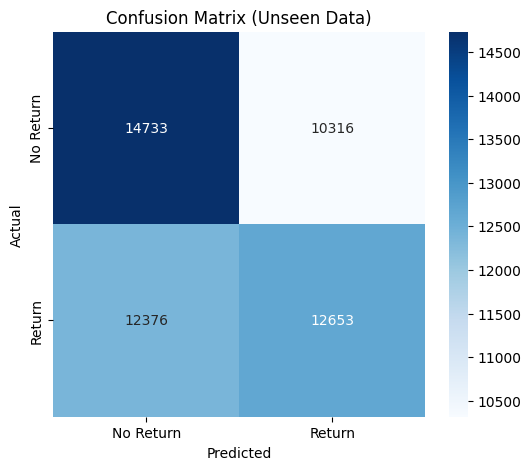

In [ ]:
import joblib  # Import joblib for loading the model

# Load the XGBoost model from the .pkl file
model_path = 'xgb_model.pkl'  # Replace with the correct path to your model file
loaded_model = joblib.load(model_path)

X_orders_class2 = orders_class2[['size', 'r', 'g', 'b','deliveryTime', 'age', 'manufacturerID','customerID','itemID','salutation_Family',
'salutation_Mr','salutation_Mrs','state_encoded','price'


]]
#'customer_return_rate',
# return_rate_size_itemid
# Vorhersagen generieren
predictions = loaded_model.predict(X_orders_class2)

# Ergebnisse in `orders_class2` speichern
orders_class2['return_prediction_2'] = predictions

# Ergebnisse überprüfen
print(orders_class2[['customerID', 'orderDate', 'return_prediction_2']].head())
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Tatsächliche Lösung laden
actual_solution = pd.read_csv("DMC 2014_realclass.txt", sep=";", dtype={'orderItemID': int, 'returnShipment': int})

# Vorhersagen vorbereiten (Zusammenführen der Dateien)
comparison_df = actual_solution.merge(
    orders_class2[['orderItemID', 'return_prediction_2']],
    on='orderItemID',
    how='left'
)

# Überprüfung der Vorhersagen
print("Vergleich von tatsächlicher Lösung und Vorhersagen:")
print(comparison_df.head())

# Tatsächliche und vorhergesagte Werte extrahieren
y_true = comparison_df['returnShipment']
y_pred = comparison_df['return_prediction_2']

# Performance-Metriken berechnen
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = f1_score(y_true, y_pred)

# Ergebnisse anzeigen
print("\nPerformance des Modells auf den Unseen Data:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Confusion Matrix plotten
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Return', 'Return'], yticklabels=['No Return', 'Return'])
plt.title('Confusion Matrix (Unseen Data)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


<ipython-input-24-50a0928b724f>:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_orders_class2['return_prediction_2'] = valid_predictions


Erste Zeilen mit NaT in deliveryDate (sollten return_prediction_2 = 0 haben):
       customerID  orderDate deliveryDate  return_prediction_2
4           12489 2013-04-01   2013-04-03                    0
9           22284 2013-04-01   2013-04-02                    0
11          22026 2013-04-01   2013-04-09                    0
12          22026 2013-04-01   2013-04-09                    0
14          38315 2013-04-01   2013-05-02                    0
...           ...        ...          ...                  ...
50056       91911 2013-04-29   2013-05-03                    0
50064       89065 2013-04-28   2013-06-19                    0
50065       89065 2013-04-28   2013-06-19                    0
50076       91922 2013-04-28   2013-05-02                    0
50077       91922 2013-04-28   2013-05-02                    0

[4268 rows x 4 columns]

Erste Zeilen mit gültigem deliveryDate (Vorhersagen vom Modell):
   customerID  orderDate deliveryDate  return_prediction_2
0       12489 20

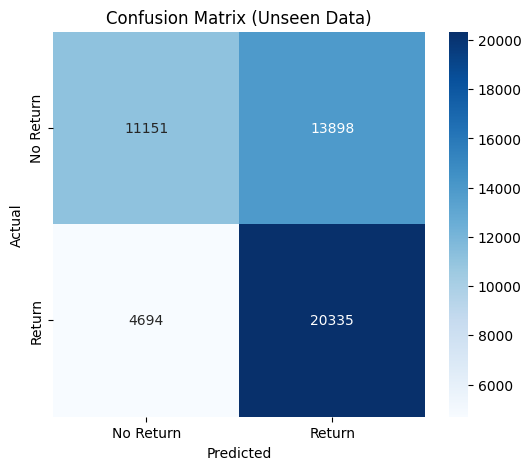

In [ ]:
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Sicherstellen, dass deliveryDate im orders_class korrekt erkannt wird
orders_class['deliveryDate'] = pd.to_datetime(orders_class['deliveryDate'], errors='coerce')

# Identifizieren der orderItemID mit deliveryDate = NaT
nat_order_ids = orders_class[orders_class['deliveryDate'].isna()]['orderItemID']

# Setzen von `return_prediction_2 = 0` für diese orderItemIDs in orders_class2
orders_class2.loc[orders_class2['orderItemID'].isin(nat_order_ids), 'return_prediction_2'] = 0

# Filtern der Daten: Nur orderItemIDs mit gültigem deliveryDate werden vom Modell verwendet
valid_orders_class2 = orders_class2[~orders_class2['orderItemID'].isin(nat_order_ids)]

# Features für Vorhersagen extrahieren (nur gültige Zeilen)
X_valid_orders_class2 = valid_orders_class2[['size', 'r', 'g', 'b','deliveryTime', 'age', 'manufacturerID','customerID','itemID','salutation_Family',
'salutation_Mr','salutation_Mrs','state_encoded','price']]

# Vorhersagen mit dem Modell generieren (nur für gültige orderItemIDs)
valid_predictions = loaded_model.predict(X_valid_orders_class2)

# Speichern der Vorhersagen in `return_prediction_2` (nur für gültige Zeilen)
valid_orders_class2['return_prediction_2'] = valid_predictions

# Kombinieren der Vorhersagen mit den ursprünglichen Daten
orders_class2.update(valid_orders_class2)

# Überprüfung der Ergebnisse
print("Erste Zeilen mit NaT in deliveryDate (sollten return_prediction_2 = 0 haben):")
print(orders_class2[orders_class2['orderItemID'].isin(nat_order_ids)][['customerID', 'orderDate', 'deliveryDate', 'return_prediction_2']])

print("\nErste Zeilen mit gültigem deliveryDate (Vorhersagen vom Modell):")
print(orders_class2[~orders_class2['orderItemID'].isin(nat_order_ids)][['customerID', 'orderDate', 'deliveryDate', 'return_prediction_2']].head())

# Tatsächliche Lösung laden
actual_solution = pd.read_csv("DMC 2014_realclass.txt", sep=";", dtype={'orderItemID': int, 'returnShipment': int})

# Vorhersagen vorbereiten (Zusammenführen der Dateien)
comparison_df = actual_solution.merge(
    orders_class2[['orderItemID', 'return_prediction_2']],
    on='orderItemID',
    how='left'
)

# Überprüfung der Vorhersagen
print("Vergleich von tatsächlicher Lösung und Vorhersagen:")
print(comparison_df.head())

# Tatsächliche und vorhergesagte Werte extrahieren
y_true = comparison_df['returnShipment']
y_pred = comparison_df['return_prediction_2']

# Performance-Metriken berechnen
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = f1_score(y_true, y_pred)

# Ergebnisse anzeigen
print("\nPerformance des Modells auf den Unseen Data:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Confusion Matrix plotten
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Return', 'Return'], yticklabels=['No Return', 'Return'])
plt.title('Confusion Matrix (Unseen Data)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


In [ ]:
# Modellpfad (ändere den Dateinamen entsprechend)
model_path = 'dt_model.pkl'  # DecisionTree-Modell statt XGBoost
loaded_model = joblib.load(model_path)

NameError: name 'joblib' is not defined

In [ ]:
import joblib  # Import für das Laden des Modells
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# Modellpfad (ändere den Dateinamen entsprechend)
model_path = 'dt_model.pkl'  # DecisionTree-Modell statt XGBoost
loaded_model = joblib.load(model_path)

# Label-Encoding für 'size', aber NICHT für 'size_category', 'size_category_encoded' oder 'size_false'
label_encoder = LabelEncoder()
orders_class2['size_encoded'] = label_encoder.fit_transform(orders_class2['size'])

# Feature-Liste definieren (ohne `size_category`, `size_category_encoded`, `size_false`)
feature_columns = [
    'r', 'g', 'b', 'deliveryTime', 'age', 'manufacturerID', 'customerID', 'itemID',
    'salutation_Family', 'salutation_Mr', 'salutation_Mrs', 'state_encoded', 'price',
    'size_encoded'  # Label-Encoded Version der 'size'-Spalte
]



# Sicherstellen, dass nur relevante Features enthalten sind
X_orders_class2 = orders_class2[feature_columns]

# Vorhersagen mit dem geladenen DecisionTree-Modell
predictions = loaded_model.predict(X_orders_class2)

# Ergebnisse in `orders_class2` speichern
orders_class2['return_prediction_2'] = predictions

# Ergebnisse überprüfen
print(orders_class2[['customerID', 'orderDate', 'return_prediction_2']].head())


   customerID  orderDate  return_prediction_2
0       12489 2013-04-01                    1
1       12489 2013-04-01                    1
2       12489 2013-04-01                    1
3       12489 2013-04-01                    1
4       12489 2013-04-01                    1


Vergleich von tatsächlicher Lösung und Vorhersagen:
   orderItemID  returnShipment  return_prediction_2
0            1               1                    1
1            2               1                    1
2            3               1                    1
3            4               0                    1
4            5               0                    1

Performance des Modells auf den Unseen Data:
Accuracy: 0.5532
Precision: 0.5319
Recall: 0.8829
F1 Score: 0.6639


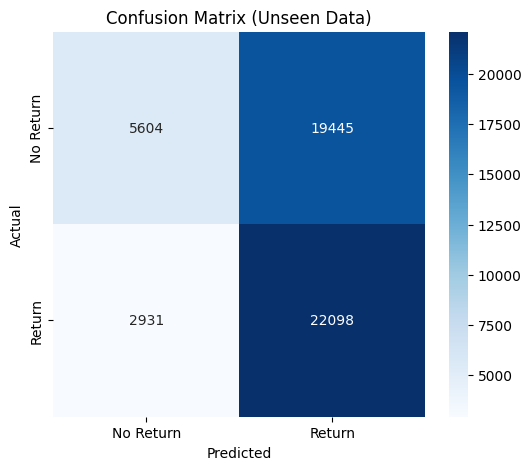

In [ ]:
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Tatsächliche Lösung laden
actual_solution = pd.read_csv("DMC 2014_realclass.txt", sep=";", dtype={'orderItemID': int, 'returnShipment': int})

# Vorhersagen vorbereiten (Zusammenführen der Dateien)
comparison_df = actual_solution.merge(
    orders_class2[['orderItemID', 'return_prediction_2']],
    on='orderItemID',
    how='left'
)

# Überprüfung der Vorhersagen
print("Vergleich von tatsächlicher Lösung und Vorhersagen:")
print(comparison_df.head())

# Tatsächliche und vorhergesagte Werte extrahieren
y_true = comparison_df['returnShipment']
y_pred = comparison_df['return_prediction_2']

# Performance-Metriken berechnen
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = f1_score(y_true, y_pred)

# Ergebnisse anzeigen
print("\nPerformance des Modells auf den Unseen Data:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Confusion Matrix plotten
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Return', 'Return'], yticklabels=['No Return', 'Return'])
plt.title('Confusion Matrix (Unseen Data)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


<ipython-input-15-48765935fde8>:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_orders_class2['return_prediction_2'] = valid_predictions
<ipython-input-15-48765935fde8>:29: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[1 1 1 ... 1 0 0]' has dtype incompatible with int32, please explicitly cast to a compatible dtype first.
  orders_class2.update(valid_orders_class2)


Erste Zeilen mit NaT in deliveryDate (sollten return_prediction_2 = 0 haben):
       customerID  orderDate deliveryDate  return_prediction_2
4           12489 2013-04-01   2013-04-03                    0
9           22284 2013-04-01   2013-04-02                    0
11          22026 2013-04-01   2013-04-09                    0
12          22026 2013-04-01   2013-04-09                    0
14          38315 2013-04-01   2013-05-02                    0
...           ...        ...          ...                  ...
50056       91911 2013-04-29   2013-05-03                    0
50064       89065 2013-04-28   2013-06-19                    0
50065       89065 2013-04-28   2013-06-19                    0
50076       91922 2013-04-28   2013-05-02                    0
50077       91922 2013-04-28   2013-05-02                    0

[4268 rows x 4 columns]

Erste Zeilen mit gültigem deliveryDate (Vorhersagen vom Modell):
   customerID  orderDate deliveryDate  return_prediction_2
0       12489 20

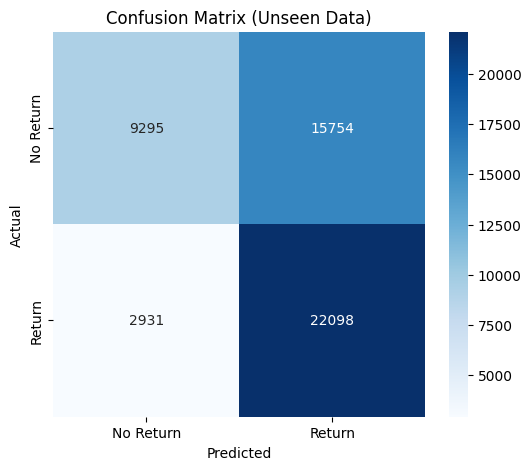

In [ ]:
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Sicherstellen, dass deliveryDate im orders_class korrekt erkannt wird
orders_class['deliveryDate'] = pd.to_datetime(orders_class['deliveryDate'], errors='coerce')

# Identifizieren der orderItemID mit deliveryDate = NaT
nat_order_ids = orders_class[orders_class['deliveryDate'].isna()]['orderItemID']

# Setzen von `return_prediction_2 = 0` für diese orderItemIDs in orders_class2
orders_class2.loc[orders_class2['orderItemID'].isin(nat_order_ids), 'return_prediction_2'] = 0

# Filtern der Daten: Nur orderItemIDs mit gültigem deliveryDate werden vom Modell verwendet
valid_orders_class2 = orders_class2[~orders_class2['orderItemID'].isin(nat_order_ids)]

# Features für Vorhersagen extrahieren (nur gültige Zeilen)
X_valid_orders_class2 = valid_orders_class2[['r', 'g', 'b','deliveryTime', 'age', 'manufacturerID','customerID','itemID','salutation_Family',
'salutation_Mr','salutation_Mrs','state_encoded','price','size_encoded']]

# Vorhersagen mit dem Modell generieren (nur für gültige orderItemIDs)
valid_predictions = loaded_model.predict(X_valid_orders_class2)

# Speichern der Vorhersagen in `return_prediction_2` (nur für gültige Zeilen)
valid_orders_class2['return_prediction_2'] = valid_predictions

# Kombinieren der Vorhersagen mit den ursprünglichen Daten
orders_class2.update(valid_orders_class2)

# Überprüfung der Ergebnisse
print("Erste Zeilen mit NaT in deliveryDate (sollten return_prediction_2 = 0 haben):")
print(orders_class2[orders_class2['orderItemID'].isin(nat_order_ids)][['customerID', 'orderDate', 'deliveryDate', 'return_prediction_2']])

print("\nErste Zeilen mit gültigem deliveryDate (Vorhersagen vom Modell):")
print(orders_class2[~orders_class2['orderItemID'].isin(nat_order_ids)][['customerID', 'orderDate', 'deliveryDate', 'return_prediction_2']].head())

# Tatsächliche Lösung laden
actual_solution = pd.read_csv("DMC 2014_realclass.txt", sep=";", dtype={'orderItemID': int, 'returnShipment': int})

# Vorhersagen vorbereiten (Zusammenführen der Dateien)
comparison_df = actual_solution.merge(
    orders_class2[['orderItemID', 'return_prediction_2']],
    on='orderItemID',
    how='left'
)

# Überprüfung der Vorhersagen
print("Vergleich von tatsächlicher Lösung und Vorhersagen:")
print(comparison_df.head())

# Tatsächliche und vorhergesagte Werte extrahieren
y_true = comparison_df['returnShipment']
y_pred = comparison_df['return_prediction_2']

# Performance-Metriken berechnen
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = f1_score(y_true, y_pred)

# Ergebnisse anzeigen
print("\nPerformance des Modells auf den Unseen Data:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Confusion Matrix plotten
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Return', 'Return'], yticklabels=['No Return', 'Return'])
plt.title('Confusion Matrix (Unseen Data)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


##### with Hyperparameter-Tuning

In [ ]:
#!pip install xgboost
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from xgboost import XGBClassifier

# Sicherstellen, dass alle Features vorhanden sind
feature_columns = ['category_count', 'count_without_size', 'similar_product_count_size_color', 'count_without_color',
                   'total_products_in_cart', 'price_rank', 'product_category_encoded', 'customer_return_rate',
                    'multiple_packages_flag', 'discount_bins_encoded','return_rate_size_itemid',
                   'return_rate_color_itemid','multiple_orders_flag','repeat_rate_per_customer',
                   'same_day_as_creation','region_encoded','return_rate_region','total_kept_region_customer','size_category_encoded','free_return'
                    ,'days_since_launch_scaled','target_group_encoded','sub_category_encoded','price_category_encoded'
                    #,'total_spend_pro_customer'
                   #,'category_variation'

                    #,'return_rate_size_product_category','delivery_time_diff'
                   #'log_likelihood_ratio_by_customer_and_discount_rank','return_rate_size_manufacturer'

]
#'customer_size_category_return_rate','customer_sub_category_return_rate
# 'return_rate_size_category_itemid'
#'customer_return_rate'
#,'manufacturer_rto_percentage','size_availability',
# Sortiere die Daten nach `orderDate`
df13 = df13.sort_values(by='orderDate')

# Definiere den ersten und letzten Monat als Testset
df13['orderDate'] = pd.to_datetime(df13['orderDate'])
first_month = df13['orderDate'].dt.to_period('M').min()
last_month = df13['orderDate'].dt.to_period('M').max()

# Erstelle Test- und Trainingssets
test_data = df13[df13['orderDate'].dt.to_period('M').isin([first_month, last_month])]
train_data = df13[~df13['orderDate'].dt.to_period('M').isin([first_month, last_month])]

# Features und Zielvariable definieren
X_train = train_data[feature_columns]
y_train = train_data['returnShipment']

X_test = test_data[feature_columns]
y_test = test_data['returnShipment']

# Beste Parameter aus Hyperparameter-Tuning
best_params =   {'n_estimators': 396, 'max_depth': 10, 'learning_rate': 0.02863064771462253, 'subsample': 0.9381968754324418, 'colsample_bytree': 0.8817577066562146, 'gamma': 4.496045409044606, 'reg_alpha': 3.696153669300062, 'reg_lambda': 1.3136263500488825}

 #{'n_estimators': 174, 'max_depth': 8, 'learning_rate': 0.12138450738244076, 'subsample': 0.5505103719217807, 'colsample_bytree': 0.6214577257717854, 'gamma': 3.8019886440097275, 'reg_alpha': 4.034377345458296, 'reg_lambda': 2.8447323549594246}

  #{'n_estimators': 455, 'max_depth': 7, 'learning_rate': 0.0535090691429229,'subsample': 0.6212896396319642, 'colsample_bytree': 0.9655597880651062, 'gamma': 0.002259034539446869, 'reg_alpha': 2.0048156370768075, 'reg_lambda': 3.7166709730639598}

  #{'n_estimators': 406, 'max_depth': 5, 'learning_rate': 0.05774920594933189, 'subsample': 0.7476080523469133,'colsample_bytree': 0.87742543235044, 'gamma': 2.1669780216096535, 'reg_alpha': 1.6259286889215419, 'reg_lambda': 4.98384847705904}


# XGBoost-Classifier initialisieren mit besten Parametern
xgb_model = XGBClassifier(
    random_state=42,
    enable_categorical=True,
    objective='binary:logistic',
    **best_params
)

# Modell trainieren
xgb_model.fit(X_train, y_train)

# Vorhersagen auf dem Testdatensatz
y_pred_xgb = xgb_model.predict(X_test)

# Modellbewertung
print("XGBoost Performance mit besten Parametern:")
print("Accuracy:", accuracy_score(y_test, y_pred_xgb))
print("Precision:", precision_score(y_test, y_pred_xgb))
print("Recall:", recall_score(y_test, y_pred_xgb))
print("F1 Score:", f1_score(y_test, y_pred_xgb))


XGBoost Performance mit besten Parametern:
Accuracy: 0.7800394548063128
Precision: 0.7716840785624739
Recall: 0.8457789828521178
F1 Score: 0.8070344116284558


In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, mean_squared_error
from sklearn.model_selection import ShuffleSplit
from xgboost import XGBClassifier

# Sicherstellen, dass alle Features vorhanden sind
feature_columns = ['category_count', 'count_without_size', 'similar_product_count_size_color', 'count_without_color',
                   'total_products_in_cart', 'price_rank', 'product_category_encoded', 'customer_return_rate',
                   'multiple_packages_flag', 'discount_bins_encoded', 'return_rate_size_itemid',
                   'return_rate_color_itemid', 'multiple_orders_flag', 'repeat_rate_per_customer',
                   'same_day_as_creation', 'region_encoded', 'return_rate_region', 'total_kept_region_customer',
                   'size_category_encoded', 'free_return', 'days_since_launch_scaled', 'target_group_encoded',
                   'sub_category_encoded', 'price_category_encoded']

# Sortiere die Daten nach `orderDate`
df13 = df13.sort_values(by='orderDate')

# Definiere den ersten und letzten Monat als Testset
first_month = df13['orderDate'].dt.to_period('M').min()
last_month = df13['orderDate'].dt.to_period('M').max()

# Erstelle Test- und Trainingssets
test_data = df13[df13['orderDate'].dt.to_period('M').isin([first_month, last_month])]
train_data = df13[~df13['orderDate'].dt.to_period('M').isin([first_month, last_month])]

# Features und Zielvariable definieren
X_train = train_data[feature_columns]
y_train = train_data['returnShipment']
X_test = test_data[feature_columns]
y_test = test_data['returnShipment']


best_params =   {'n_estimators': 396, 'max_depth': 10, 'learning_rate': 0.02863064771462253, 'subsample': 0.9381968754324418, 'colsample_bytree': 0.8817577066562146, 'gamma': 4.496045409044606, 'reg_alpha': 3.696153669300062, 'reg_lambda': 1.3136263500488825}


# XGBoost-Classifier initialisieren
xgb_model = XGBClassifier(random_state=42, enable_categorical=True, eval_metric='logloss')

# Modell trainieren
xgb_model.fit(X_train, y_train)

# Vorhersagen auf Testdaten
y_pred_xgb = xgb_model.predict(X_test)
y_train_pred_xgb = xgb_model.predict(X_train)

# Bias-Berechnung (Mean Squared Error auf Testdaten)
bias = mean_squared_error(y_test, y_pred_xgb)

# Varianz-Berechnung mit Bootstrapping
n_splits = 10  # Anzahl der Bootstrapping-Samples
varianz_scores = []

cv = ShuffleSplit(n_splits=n_splits, test_size=0.2, random_state=42)

for train_idx, _ in cv.split(X_train):
    X_train_sample, y_train_sample = X_train.iloc[train_idx], y_train.iloc[train_idx]

    # Neues Modell für jede Iteration trainieren
    model = XGBClassifier(random_state=42, enable_categorical=True, eval_metric='logloss',**best_params)
    model.fit(X_train_sample, y_train_sample)

    # Vorhersagen auf Testdaten
    y_test_pred_sample = model.predict(X_test)
    varianz_scores.append(mean_squared_error(y_test, y_test_pred_sample))

varianz = np.var(varianz_scores)  # Berechnung der Streuung (Varianz)

# Modellbewertung
print("XGBoost Performance:")
print(f"Accuracy: {accuracy_score(y_test, y_pred_xgb):.4f}")
print(f"Precision: {precision_score(y_test, y_pred_xgb):.4f}")
print(f"Recall: {recall_score(y_test, y_pred_xgb):.4f}")
print(f"F1 Score: {f1_score(y_test, y_pred_xgb):.4f}")

# Bias und Varianz ausgeben
print(f"\nBias (Mean Squared Error auf Testdaten): {bias:.4f}")
print(f"Varianz (Streuung der Modellvorhersagen über Bootstrapping): {varianz:.4f}")


XGBoost Performance:
Accuracy: 0.7788
Precision: 0.7716
Recall: 0.8426
F1 Score: 0.8055

Bias (Mean Squared Error auf Testdaten): 0.2212
Varianz (Streuung der Modellvorhersagen über Bootstrapping): 0.0000


ohne top 3 feautures

In [ ]:
#!pip install xgboost
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from xgboost import XGBClassifier

# Sicherstellen, dass alle Features vorhanden sind
feature_columns = ['category_count', 'count_without_size', 'similar_product_count_size_color', 'count_without_color',
                   'total_products_in_cart', 'price_rank', 'customer_return_rate',
                    'multiple_packages_flag', 'discount_bins_encoded','return_rate_size_itemid',
                   'return_rate_color_itemid','multiple_orders_flag','repeat_rate_per_customer',
                   'same_day_as_creation','region_encoded','return_rate_region','total_kept_region_customer','free_return'
                    ,'days_since_launch_scaled','price_category_encoded'
                    #,'total_spend_pro_customer'
                   #,'category_variation'

                    #,'return_rate_size_product_category','delivery_time_diff'
                   #'log_likelihood_ratio_by_customer_and_discount_rank','return_rate_size_manufacturer'

]
#'customer_size_category_return_rate','customer_sub_category_return_rate
# 'return_rate_size_category_itemid'
#'customer_return_rate'
#,'manufacturer_rto_percentage','size_availability',
# Sortiere die Daten nach `orderDate`
df13 = df13.sort_values(by='orderDate')

# Definiere den ersten und letzten Monat als Testset
df13['orderDate'] = pd.to_datetime(df13['orderDate'])
first_month = df13['orderDate'].dt.to_period('M').min()
last_month = df13['orderDate'].dt.to_period('M').max()

# Erstelle Test- und Trainingssets
test_data = df13[df13['orderDate'].dt.to_period('M').isin([first_month, last_month])]
train_data = df13[~df13['orderDate'].dt.to_period('M').isin([first_month, last_month])]

# Features und Zielvariable definieren
X_train = train_data[feature_columns]
y_train = train_data['returnShipment']

X_test = test_data[feature_columns]
y_test = test_data['returnShipment']

# Beste Parameter aus Hyperparameter-Tuning
best_params =   {'n_estimators': 396, 'max_depth': 10, 'learning_rate': 0.02863064771462253, 'subsample': 0.9381968754324418, 'colsample_bytree': 0.8817577066562146, 'gamma': 4.496045409044606, 'reg_alpha': 3.696153669300062, 'reg_lambda': 1.3136263500488825}

 #{'n_estimators': 174, 'max_depth': 8, 'learning_rate': 0.12138450738244076, 'subsample': 0.5505103719217807, 'colsample_bytree': 0.6214577257717854, 'gamma': 3.8019886440097275, 'reg_alpha': 4.034377345458296, 'reg_lambda': 2.8447323549594246}

  #{'n_estimators': 455, 'max_depth': 7, 'learning_rate': 0.0535090691429229,'subsample': 0.6212896396319642, 'colsample_bytree': 0.9655597880651062, 'gamma': 0.002259034539446869, 'reg_alpha': 2.0048156370768075, 'reg_lambda': 3.7166709730639598}

  #{'n_estimators': 406, 'max_depth': 5, 'learning_rate': 0.05774920594933189, 'subsample': 0.7476080523469133,'colsample_bytree': 0.87742543235044, 'gamma': 2.1669780216096535, 'reg_alpha': 1.6259286889215419, 'reg_lambda': 4.98384847705904}


# XGBoost-Classifier initialisieren mit besten Parametern
xgb_model = XGBClassifier(
    random_state=42,
    enable_categorical=True,
    objective='binary:logistic',
    **best_params
)

# Modell trainieren
xgb_model.fit(X_train, y_train)

# Vorhersagen auf dem Testdatensatz
y_pred_xgb = xgb_model.predict(X_test)

# Modellbewertung
print("XGBoost Performance mit besten Parametern:")
print("Accuracy:", accuracy_score(y_test, y_pred_xgb))
print("Precision:", precision_score(y_test, y_pred_xgb))
print("Recall:", recall_score(y_test, y_pred_xgb))
print("F1 Score:", f1_score(y_test, y_pred_xgb))


XGBoost Performance mit besten Parametern:
Accuracy: 0.7795612147297943
Precision: 0.7704150490694304
Recall: 0.847098050710831
F1 Score: 0.806938857427073


In [ ]:
# Modell mit den besten Parametern aus Optuna
xgb_model_tuned = XGBClassifier(**best_params, random_state=42, enable_categorical=True)
xgb_model_tuned.fit(X_train, y_train)

# Vorhersagen
y_train_pred_tuned = xgb_model_tuned.predict(X_train)
y_test_pred_tuned = xgb_model_tuned.predict(X_test)

# Berechnung der Fehler (Bias)
train_accuracy_tuned = accuracy_score(y_train, y_train_pred_tuned)
test_accuracy_tuned = accuracy_score(y_test, y_test_pred_tuned)
train_f1_tuned = f1_score(y_train, y_train_pred_tuned)
test_f1_tuned = f1_score(y_test, y_test_pred_tuned)

print("\nNach der Optimierung:")
print(f"Training Accuracy: {train_accuracy_tuned:.4f}, Test Accuracy: {test_accuracy_tuned:.4f}")
print(f"Training F1-Score: {train_f1_tuned:.4f}, Test F1-Score: {test_f1_tuned:.4f}")
print(f"Bias (Differenz Train-Test Accuracy): {abs(train_accuracy_tuned - test_accuracy_tuned):.4f}")
print(f"Variance (Differenz Train-Test F1): {abs(train_f1_tuned - test_f1_tuned):.4f}")



Nach der Optimierung:
Training Accuracy: 0.7803, Test Accuracy: 0.7801
Training F1-Score: 0.7960, Test F1-Score: 0.8070
Bias (Differenz Train-Test Accuracy): 0.0002
Variance (Differenz Train-Test F1): 0.0110


In [ ]:
# Modell mit den besten Parametern aus Optuna best_params =  {'n_estimators': 174, 'max_depth': 8, 'learning_rate': 0.12138450738244076, 'subsample': 0.5505103719217807, 'colsample_bytree': 0.6214577257717854, 'gamma': 3.8019886440097275, 'reg_alpha': 4.034377345458296, 'reg_lambda': 2.8447323549594246}

xgb_model_tuned = XGBClassifier(**best_params, random_state=42, enable_categorical=True)
xgb_model_tuned.fit(X_train, y_train)

# Vorhersagen
y_train_pred_tuned = xgb_model_tuned.predict(X_train)
y_test_pred_tuned = xgb_model_tuned.predict(X_test)

# Berechnung der Fehler (Bias)
train_accuracy_tuned = accuracy_score(y_train, y_train_pred_tuned)
test_accuracy_tuned = accuracy_score(y_test, y_test_pred_tuned)
train_f1_tuned = f1_score(y_train, y_train_pred_tuned)
test_f1_tuned = f1_score(y_test, y_test_pred_tuned)

print("\nNach der Optimierung:")
print(f"Training Accuracy: {train_accuracy_tuned:.4f}, Test Accuracy: {test_accuracy_tuned:.4f}")
print(f"Training F1-Score: {train_f1_tuned:.4f}, Test F1-Score: {test_f1_tuned:.4f}")
print(f"Bias (Differenz Train-Test Accuracy): {abs(train_accuracy_tuned - test_accuracy_tuned):.4f}")
print(f"Variance (Differenz Train-Test F1): {abs(train_f1_tuned - test_f1_tuned):.4f}")



Nach der Optimierung:
Training Accuracy: 0.7776, Test Accuracy: 0.7794
Training F1-Score: 0.7931, Test F1-Score: 0.8059
Bias (Differenz Train-Test Accuracy): 0.0018
Variance (Differenz Train-Test F1): 0.0128


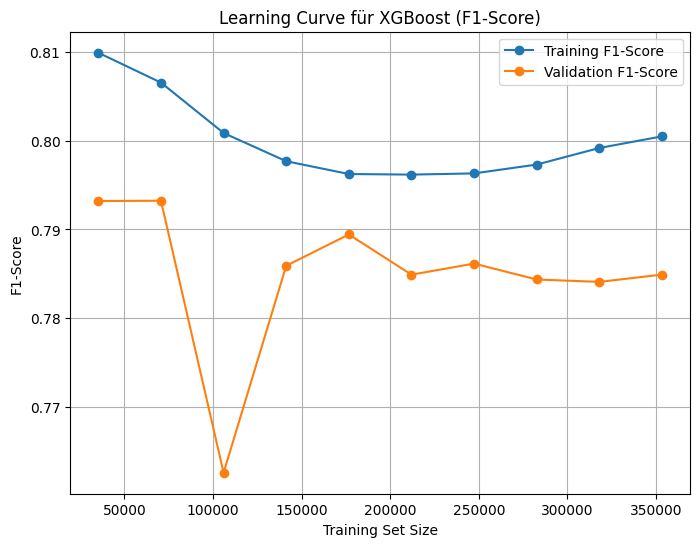

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
from xgboost import XGBClassifier
from sklearn.metrics import make_scorer, f1_score

# Custom Scorer für F1-Score (statt Accuracy)
f1_scorer = make_scorer(f1_score)

# Learning Curve berechnen
train_sizes, train_scores, test_scores = learning_curve(
    XGBClassifier(random_state=42, enable_categorical=True, eval_metric='logloss', **best_params),
    X, y, cv=5, scoring=f1_scorer, n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10)
)

# Mittelwerte berechnen
train_mean = np.mean(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)

# Learning Curve für F1-Score plotten
plt.figure(figsize=(8, 6))
plt.plot(train_sizes, train_mean, label='Training F1-Score', marker='o', linestyle='-')
plt.plot(train_sizes, test_mean, label='Validation F1-Score', marker='o', linestyle='-')
plt.xlabel('Training Set Size')
plt.ylabel('F1-Score')
plt.title('Learning Curve für XGBoost (F1-Score)')
plt.legend()
plt.grid(True)
plt.show()


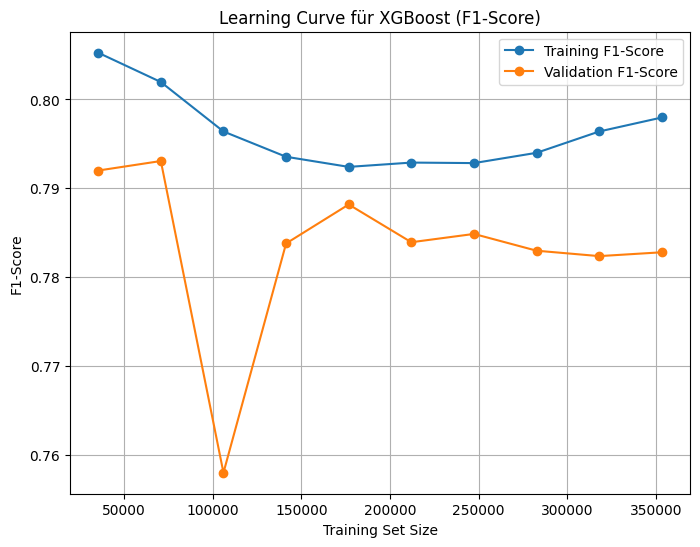

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve
from xgboost import XGBClassifier
from sklearn.metrics import make_scorer, f1_score

# Custom Scorer für F1-Score (statt Accuracy)
f1_scorer = make_scorer(f1_score)

# Learning Curve berechnen
train_sizes, train_scores, test_scores = learning_curve(
    XGBClassifier(random_state=42, enable_categorical=True, eval_metric='logloss', **best_params),
    X, y, cv=5, scoring=f1_scorer, n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10)
)

# Mittelwerte berechnen
train_mean = np.mean(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)

# Learning Curve für F1-Score plotten
plt.figure(figsize=(8, 6))
plt.plot(train_sizes, train_mean, label='Training F1-Score', marker='o', linestyle='-')
plt.plot(train_sizes, test_mean, label='Validation F1-Score', marker='o', linestyle='-')
plt.xlabel('Training Set Size')
plt.ylabel('F1-Score')
plt.title('Learning Curve für XGBoost (F1-Score)')
plt.legend()
plt.grid(True)
plt.show()


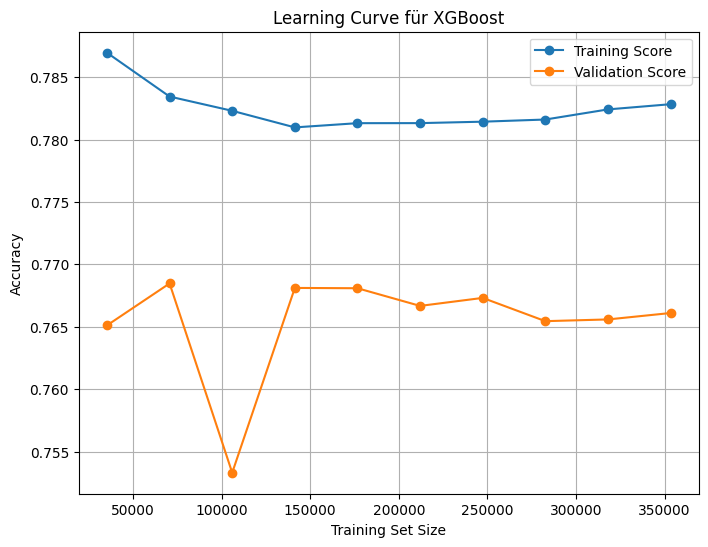

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve

# Sicherstellen, dass die Features und Zielvariable definiert sind
X = df13[feature_columns]
y = df13['returnShipment']

# Berechnung der Learning Curve
train_sizes, train_scores, test_scores = learning_curve(
    XGBClassifier(
        random_state=42,
        enable_categorical=True,
        objective='binary:logistic',
        **best_params  # Beste Hyperparameter verwenden
    ),
    X, y, cv=5, scoring='accuracy', n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10)
)

# Mittelwerte über die Cross-Validation-Splits berechnen
train_mean = np.mean(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)

# Learning Curve plotten
plt.figure(figsize=(8, 6))
plt.plot(train_sizes, train_mean, label='Training Score', marker='o', linestyle='-')
plt.plot(train_sizes, test_mean, label='Validation Score', marker='o', linestyle='-')
plt.xlabel('Training Set Size')
plt.ylabel('Accuracy')
plt.title('Learning Curve für XGBoost')
plt.legend()
plt.grid(True)
plt.show()


add thershold manuel

In [ ]:
#!pip install xgboost
import pandas as pd
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from xgboost import XGBClassifier

# Sicherstellen, dass alle Features vorhanden sind
feature_columns = ['category_count', 'count_without_size', 'similar_product_count_size_color', 'count_without_color',
                   'total_products_in_cart', 'price_rank', 'product_category_encoded', 'customer_return_rate',
                   'multiple_packages_flag', 'discount_bins_encoded', 'return_rate_size_itemid',
                   'return_rate_color_itemid', 'multiple_orders_flag', 'repeat_rate_per_customer',
                   'same_day_as_creation', 'region_encoded', 'return_rate_region', 'total_kept_region_customer',
                   'size_category_encoded', 'free_return', 'days_since_launch_scaled', 'target_group_encoded',
                   'sub_category_encoded', 'price_category_encoded']

# Sortiere die Daten nach `orderDate`
df13 = df13.sort_values(by='orderDate')

# Definiere den ersten und letzten Monat als Testset
df13['orderDate'] = pd.to_datetime(df13['orderDate'])
first_month = df13['orderDate'].dt.to_period('M').min()
last_month = df13['orderDate'].dt.to_period('M').max()

# Erstelle Test- und Trainingssets
test_data = df13[df13['orderDate'].dt.to_period('M').isin([first_month, last_month])]
train_data = df13[~df13['orderDate'].dt.to_period('M').isin([first_month, last_month])]

# Features und Zielvariable definieren
X_train = train_data[feature_columns]
y_train = train_data['returnShipment']

X_test = test_data[feature_columns]
y_test = test_data['returnShipment']

# Beste Parameter aus Hyperparameter-Tuning
best_params = {'n_estimators': 396, 'max_depth': 10, 'learning_rate': 0.0286, 'subsample': 0.938,
               'colsample_bytree': 0.881, 'gamma': 4.49, 'reg_alpha': 3.69, 'reg_lambda': 1.31}

# XGBoost-Classifier initialisieren mit besten Parametern
xgb_model = XGBClassifier(
    random_state=42,
    enable_categorical=True,
    objective='binary:logistic',
    **best_params
)

# Modell trainieren
xgb_model.fit(X_train, y_train)

# Vorhersagen mit Wahrscheinlichkeiten
y_pred_probs_xgb = xgb_model.predict_proba(X_test)[:, 1]

# Benutzer kann den Threshold manuell anpassen
manual_threshold = input("Geben Sie einen Threshold-Wert ein (Standard: 0.5): ")
manual_threshold = float(manual_threshold) if manual_threshold else 0.5

# Anwenden des manuellen Thresholds
y_pred_adjusted_xgb = (y_pred_probs_xgb >= manual_threshold).astype(int)

# Modellbewertung
print(f"\nXGBoost Performance mit manuellem Threshold ({manual_threshold}):")
print("Accuracy:", accuracy_score(y_test, y_pred_adjusted_xgb))
print("Precision:", precision_score(y_test, y_pred_adjusted_xgb))
print("Recall:", recall_score(y_test, y_pred_adjusted_xgb))
print("F1 Score:", f1_score(y_test, y_pred_adjusted_xgb))


Geben Sie einen Threshold-Wert ein (Standard: 0.5): 0.4701746106147766

XGBoost Performance mit manuellem Threshold (0.4701746106147766):
Accuracy: 0.7789235612944365
Precision: 0.7599794552429257
Recall: 0.8674520005862524
F1 Score: 0.8101670844490833


Warnung: 20207 Vorhersagen fehlen. Diese werden ignoriert.
Optimaler Threshold basierend auf ROC-AUC (Youden's Index): 0.5493422150611877


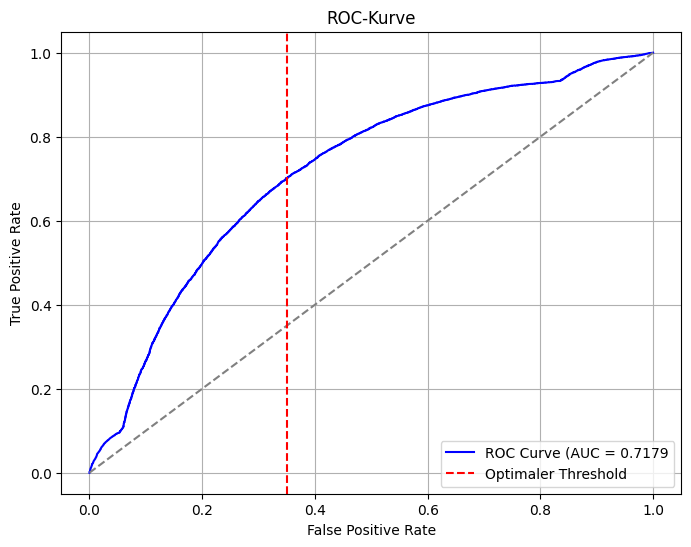

XGBoost Performance mit optimalem ROC-AUC Threshold:
Accuracy: 0.7785449545671927
Precision: 0.7927334575786635
Recall: 0.8026527920269676
F1 Score: 0.7976622880083022


In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import roc_curve, auc, accuracy_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
from xgboost import XGBClassifier

# Sicherstellen, dass deliveryDate korrekt erkannt wird
orders_class['deliveryDate'] = pd.to_datetime(orders_class['deliveryDate'], errors='coerce')

# Identifizieren der orderItemID mit deliveryDate = NaT
nat_order_ids = orders_class[orders_class['deliveryDate'].isna()]['orderItemID']

# Gemeinsame customerID zwischen df13 und orders_class2 identifizieren
common_customer_ids = set(df13['customerID']).intersection(set(orders_class2['customerID']))

# Filterung von orders_class2 auf gemeinsame customerID
filtered_orders_class2 = orders_class2[orders_class2['customerID'].isin(list(common_customer_ids))].copy()

# Setzen von `return_prediction_probs = 0` für orderItemIDs mit deliveryDate = NaT
filtered_orders_class2.loc[filtered_orders_class2['orderItemID'].isin(nat_order_ids), 'return_prediction_probs'] = 0

# Filtern der gültigen Daten (ohne NaT orderItemIDs für Modellvorhersagen)
valid_filtered_orders_class2 = filtered_orders_class2[~filtered_orders_class2['orderItemID'].isin(nat_order_ids)]

# Features für Vorhersagen extrahieren
features = [
    'category_count', 'count_without_size', 'similar_product_count_size_color', 'count_without_color',
    'total_products_in_cart', 'price_rank', 'product_category_encoded', 'customer_return_rate',
    'multiple_packages_flag', 'discount_bins_encoded', 'return_rate_size_itemid', 'return_rate_color_itemid',
    'multiple_orders_flag', 'repeat_rate_per_customer', 'same_day_as_creation', 'region_encoded', 'return_rate_region',
    'total_kept_region_customer', 'size_category_encoded', 'free_return', 'days_since_launch_scaled',
    'target_group_encoded', 'sub_category_encoded', 'price_category_encoded'
]

X_orders_class2_filtered = valid_filtered_orders_class2[features]

# Wahrscheinlichkeiten vorhersagen
y_pred_probs = xgb_model.predict_proba(X_orders_class2_filtered)[:, 1]

# Speichern der Wahrscheinlichkeiten
valid_filtered_orders_class2['return_prediction_probs'] = y_pred_probs

# Vergleich mit actual_solution
comparison_df = actual_solution.merge(
    valid_filtered_orders_class2[['orderItemID', 'return_prediction_probs']],
    on='orderItemID',
    how='left'
)

# Überprüfen auf fehlende Vorhersagen
missing_predictions = comparison_df['return_prediction_probs'].isnull().sum()
if missing_predictions > 0:
    print(f"Warnung: {missing_predictions} Vorhersagen fehlen. Diese werden ignoriert.")
    comparison_df = comparison_df.dropna(subset=['return_prediction_probs'])

# Tatsächliche Werte extrahieren
y_true = comparison_df['returnShipment']
y_pred_probs = comparison_df['return_prediction_probs'].astype(float)

# ROC-Kurve berechnen
fpr, tpr, roc_thresholds = roc_curve(y_true, y_pred_probs)
roc_auc = auc(fpr, tpr)

# Besten Threshold basierend auf Youden's J-Statistik berechnen (max TPR - FPR)
youden_index = np.argmax(tpr - fpr)
optimal_threshold_roc = roc_thresholds[youden_index]
print(f"Optimaler Threshold basierend auf ROC-AUC (Youden's Index): {optimal_threshold_roc}")

# ROC-Kurve visualisieren
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC Curve (AUC = {roc_auc:.4f}')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.axvline(x=fpr[youden_index], color='red', linestyle='--', label='Optimaler Threshold')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC-Kurve')
plt.legend()
plt.grid()
plt.show()

# **Integration des optimalen Thresholds in das XGBoost-Hauptmodell**
best_params = {'n_estimators': 396, 'max_depth': 10, 'learning_rate': 0.0286, 'subsample': 0.938,
               'colsample_bytree': 0.881, 'gamma': 4.49, 'reg_alpha': 3.69, 'reg_lambda': 1.31}

xgb_model = XGBClassifier(
    random_state=42,
    enable_categorical=True,
    objective='binary:logistic',
    **best_params
)

# Trainings- und Testdaten vorbereiten
df13 = df13.sort_values(by='orderDate')
df13['orderDate'] = pd.to_datetime(df13['orderDate'])
first_month = df13['orderDate'].dt.to_period('M').min()
last_month = df13['orderDate'].dt.to_period('M').max()

test_data = df13[df13['orderDate'].dt.to_period('M').isin([first_month, last_month])]
train_data = df13[~df13['orderDate'].dt.to_period('M').isin([first_month, last_month])]

X_train = train_data[features]
y_train = train_data['returnShipment']

X_test = test_data[features]
y_test = test_data['returnShipment']

# Modell trainieren
xgb_model.fit(X_train, y_train)

# Vorhersagen mit Wahrscheinlichkeiten
y_pred_probs_xgb = xgb_model.predict_proba(X_test)[:, 1]

# Anwenden des optimalen Thresholds
y_pred_adjusted_xgb = (y_pred_probs_xgb >= optimal_threshold_roc).astype(int)

# Modellbewertung mit angepasstem Threshold
print("XGBoost Performance mit optimalem ROC-AUC Threshold:")
print("Accuracy:", accuracy_score(y_test, y_pred_adjusted_xgb))
print("Precision:", precision_score(y_test, y_pred_adjusted_xgb))
print("Recall:", recall_score(y_test, y_pred_adjusted_xgb))
print("F1 Score:", f1_score(y_test, y_pred_adjusted_xgb))


deciontree mit beste prameter

In [ ]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.tree import DecisionTreeClassifier

# Feature-Liste (mit den ausgewählten Features aus deinem Code)
feature_columns = [
    'category_count', 'count_without_size', 'similar_product_count_size_color', 'count_without_color',
    'total_products_in_cart', 'price_rank', 'product_category_encoded', 'customer_return_rate',
    'multiple_packages_flag', 'discount_bins_encoded', 'return_rate_size_itemid',
    'return_rate_color_itemid', 'multiple_orders_flag', 'repeat_rate_per_customer',
    'same_day_as_creation', 'region_encoded', 'return_rate_region', 'total_kept_region_customer',
    'size_category_encoded', 'free_return', 'days_since_launch_scaled', 'target_group_encoded',
    'sub_category_encoded', 'price_category_encoded'
]

# Sortiere die Daten nach `orderDate`
df13 = df13.sort_values(by='orderDate')

# Definiere den ersten und letzten Monat als Testset
first_month = df13['orderDate'].dt.to_period('M').min()
last_month = df13['orderDate'].dt.to_period('M').max()

# Erstelle Test- und Trainingssets
test_data = df13[df13['orderDate'].dt.to_period('M').isin([first_month, last_month])]
train_data = df13[~df13['orderDate'].dt.to_period('M').isin([first_month, last_month])]

# Features und Zielvariable definieren
X_train = train_data[feature_columns]
y_train = train_data['returnShipment']

X_test = test_data[feature_columns]
y_test = test_data['returnShipment']

# **Optimierter DecisionTreeClassifier mit besten Parametern**
best_params= {
    'max_depth': 10,
    'min_samples_split': 15,
    'min_samples_leaf': 17,
    'max_features': None,
    'criterion': 'gini'
}

# {'max_depth': 10, 'min_samples_split': 14, 'min_samples_leaf': 3, 'max_features': None, 'criterion': 'entropy'}# df13
# Modell mit optimierten Parametern initialisieren
dt_model = DecisionTreeClassifier(**best_params, random_state=42)

# Modell trainieren
dt_model.fit(X_train, y_train)

# Vorhersagen auf dem Testdatensatz
y_pred_dt = dt_model.predict(X_test)

# Modellbewertung
print("Decision Tree Performance mit Optuna-Parametern:")
print("Accuracy:", accuracy_score(y_test, y_pred_dt))
print("Precision:", precision_score(y_test, y_pred_dt))
print("Recall:", recall_score(y_test, y_pred_dt))
print("F1 Score:", f1_score(y_test, y_pred_dt))


Decision Tree Performance mit Optuna-Parametern:
Accuracy: 0.7714112067591264
Precision: 0.7624981333687302
Recall: 0.8419133812106112
F1 Score: 0.8002403071752588


<ipython-input-4-45d007c8d704>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_orders_class2['return_prediction_2'] = valid_predictions


Erste Zeilen mit NaT in deliveryDate (sollten return_prediction_2 = 0 haben):
       customerID  orderDate deliveryDate  return_prediction_2
4           12489 2013-04-01   2013-04-03                  0.0
9           22284 2013-04-01   2013-04-02                  0.0
11          22026 2013-04-01   2013-04-09                  0.0
12          22026 2013-04-01   2013-04-09                  0.0
14          38315 2013-04-01   2013-05-02                  0.0
...           ...        ...          ...                  ...
50056       91911 2013-04-29   2013-05-03                  0.0
50064       89065 2013-04-28   2013-06-19                  0.0
50065       89065 2013-04-28   2013-06-19                  0.0
50076       91922 2013-04-28   2013-05-02                  0.0
50077       91922 2013-04-28   2013-05-02                  0.0

[4268 rows x 4 columns]

Erste Zeilen mit gültigem deliveryDate (Vorhersagen vom Modell):
   customerID  orderDate deliveryDate  return_prediction_2
0       12489 20

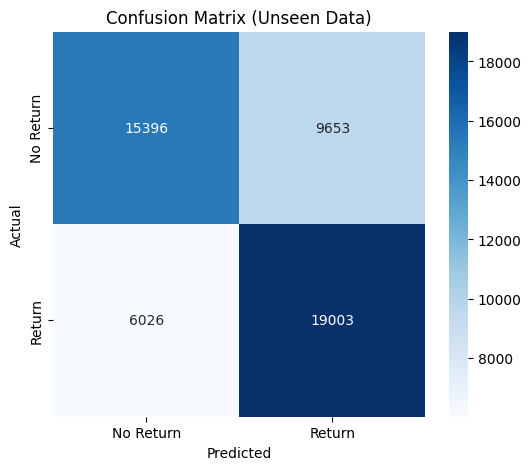

In [ ]:
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import joblib  # Import für das Laden des Modells
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# Modellpfad (ändere den Dateinamen entsprechend)
model_path = 'dt_model.pkl'  # DecisionTree-Modell statt XGBoost
loaded_model = joblib.load(model_path)
# Sicherstellen, dass deliveryDate im orders_class korrekt erkannt wird
orders_class['deliveryDate'] = pd.to_datetime(orders_class['deliveryDate'], errors='coerce')

# Identifizieren der orderItemID mit deliveryDate = NaT
nat_order_ids = orders_class[orders_class['deliveryDate'].isna()]['orderItemID']

# Setzen von `return_prediction_2 = 0` für diese orderItemIDs in orders_class2
orders_class2.loc[orders_class2['orderItemID'].isin(nat_order_ids), 'return_prediction_2'] = 0

# Filtern der Daten: Nur orderItemIDs mit gültigem deliveryDate werden vom Modell verwendet
valid_orders_class2 = orders_class2[~orders_class2['orderItemID'].isin(nat_order_ids)]

# Features für Vorhersagen extrahieren (nur gültige Zeilen)
X_valid_orders_class2 = valid_orders_class2[['category_count', 'count_without_size', 'similar_product_count_size_color', 'count_without_color',
                   'total_products_in_cart', 'price_rank', 'product_category_encoded', 'customer_return_rate',
                    'multiple_packages_flag', 'discount_bins_encoded','return_rate_size_itemid',
                   'return_rate_color_itemid','multiple_orders_flag','repeat_rate_per_customer',
                   'same_day_as_creation','region_encoded','return_rate_region','total_kept_region_customer','size_category_encoded','free_return'
                    ,'days_since_launch_scaled','target_group_encoded','sub_category_encoded','price_category_encoded']]

# Vorhersagen mit dem Modell generieren (nur für gültige orderItemIDs)
valid_predictions = loaded_model.predict(X_valid_orders_class2)

# Speichern der Vorhersagen in `return_prediction_2` (nur für gültige Zeilen)
valid_orders_class2['return_prediction_2'] = valid_predictions

# Kombinieren der Vorhersagen mit den ursprünglichen Daten
orders_class2.update(valid_orders_class2)

# Überprüfung der Ergebnisse
print("Erste Zeilen mit NaT in deliveryDate (sollten return_prediction_2 = 0 haben):")
print(orders_class2[orders_class2['orderItemID'].isin(nat_order_ids)][['customerID', 'orderDate', 'deliveryDate', 'return_prediction_2']])

print("\nErste Zeilen mit gültigem deliveryDate (Vorhersagen vom Modell):")
print(orders_class2[~orders_class2['orderItemID'].isin(nat_order_ids)][['customerID', 'orderDate', 'deliveryDate', 'return_prediction_2']].head())

# Tatsächliche Lösung laden
actual_solution = pd.read_csv("DMC 2014_realclass.txt", sep=";", dtype={'orderItemID': int, 'returnShipment': int})

# Vorhersagen vorbereiten (Zusammenführen der Dateien)
comparison_df = actual_solution.merge(
    orders_class2[['orderItemID', 'return_prediction_2']],
    on='orderItemID',
    how='left'
)

# Überprüfung der Vorhersagen
print("Vergleich von tatsächlicher Lösung und Vorhersagen:")
print(comparison_df.head())

# Tatsächliche und vorhergesagte Werte extrahieren
y_true = comparison_df['returnShipment']
y_pred = comparison_df['return_prediction_2']

# Performance-Metriken berechnen
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = f1_score(y_true, y_pred)

# Ergebnisse anzeigen
print("\nPerformance des Modells auf den Unseen Data:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Confusion Matrix plotten
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Return', 'Return'], yticklabels=['No Return', 'Return'])
plt.title('Confusion Matrix (Unseen Data)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


<ipython-input-202-45d007c8d704>:36: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_orders_class2['return_prediction_2'] = valid_predictions


Erste Zeilen mit NaT in deliveryDate (sollten return_prediction_2 = 0 haben):
       customerID  orderDate deliveryDate  return_prediction_2
4           12489 2013-04-01   2013-04-03                    0
9           22284 2013-04-01   2013-04-02                    0
11          22026 2013-04-01   2013-04-09                    0
12          22026 2013-04-01   2013-04-09                    0
14          38315 2013-04-01   2013-05-02                    0
...           ...        ...          ...                  ...
50056       91911 2013-04-29   2013-05-03                    0
50064       89065 2013-04-28   2013-06-19                    0
50065       89065 2013-04-28   2013-06-19                    0
50076       91922 2013-04-28   2013-05-02                    0
50077       91922 2013-04-28   2013-05-02                    0

[4268 rows x 4 columns]

Erste Zeilen mit gültigem deliveryDate (Vorhersagen vom Modell):
   customerID  orderDate deliveryDate  return_prediction_2
0       12489 20

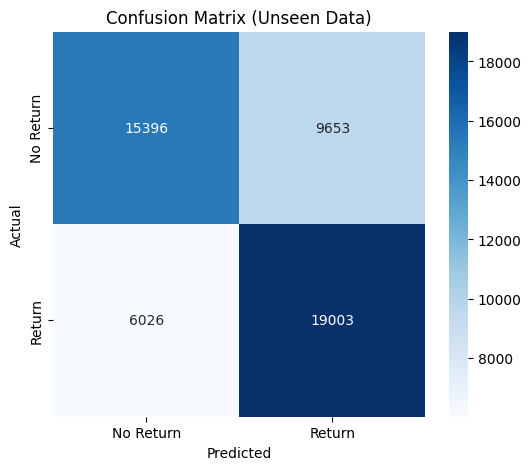

In [ ]:
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import joblib  # Import für das Laden des Modells
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# Modellpfad (ändere den Dateinamen entsprechend)
model_path = 'dt_model.pkl'  # DecisionTree-Modell statt XGBoost
loaded_model = joblib.load(model_path)
# Sicherstellen, dass deliveryDate im orders_class korrekt erkannt wird
orders_class['deliveryDate'] = pd.to_datetime(orders_class['deliveryDate'], errors='coerce')

# Identifizieren der orderItemID mit deliveryDate = NaT
nat_order_ids = orders_class[orders_class['deliveryDate'].isna()]['orderItemID']

# Setzen von `return_prediction_2 = 0` für diese orderItemIDs in orders_class2
orders_class2.loc[orders_class2['orderItemID'].isin(nat_order_ids), 'return_prediction_2'] = 0

# Filtern der Daten: Nur orderItemIDs mit gültigem deliveryDate werden vom Modell verwendet
valid_orders_class2 = orders_class2[~orders_class2['orderItemID'].isin(nat_order_ids)]

# Features für Vorhersagen extrahieren (nur gültige Zeilen)
X_valid_orders_class2 = valid_orders_class2[['category_count', 'count_without_size', 'similar_product_count_size_color', 'count_without_color',
                   'total_products_in_cart', 'price_rank', 'product_category_encoded', 'customer_return_rate',
                    'multiple_packages_flag', 'discount_bins_encoded','return_rate_size_itemid',
                   'return_rate_color_itemid','multiple_orders_flag','repeat_rate_per_customer',
                   'same_day_as_creation','region_encoded','return_rate_region','total_kept_region_customer','size_category_encoded','free_return'
                    ,'days_since_launch_scaled','target_group_encoded','sub_category_encoded','price_category_encoded']]

# Vorhersagen mit dem Modell generieren (nur für gültige orderItemIDs)
valid_predictions = loaded_model.predict(X_valid_orders_class2)

# Speichern der Vorhersagen in `return_prediction_2` (nur für gültige Zeilen)
valid_orders_class2['return_prediction_2'] = valid_predictions

# Kombinieren der Vorhersagen mit den ursprünglichen Daten
orders_class2.update(valid_orders_class2)

# Überprüfung der Ergebnisse
print("Erste Zeilen mit NaT in deliveryDate (sollten return_prediction_2 = 0 haben):")
print(orders_class2[orders_class2['orderItemID'].isin(nat_order_ids)][['customerID', 'orderDate', 'deliveryDate', 'return_prediction_2']])

print("\nErste Zeilen mit gültigem deliveryDate (Vorhersagen vom Modell):")
print(orders_class2[~orders_class2['orderItemID'].isin(nat_order_ids)][['customerID', 'orderDate', 'deliveryDate', 'return_prediction_2']].head())

# Tatsächliche Lösung laden
actual_solution = pd.read_csv("DMC 2014_realclass.txt", sep=";", dtype={'orderItemID': int, 'returnShipment': int})

# Vorhersagen vorbereiten (Zusammenführen der Dateien)
comparison_df = actual_solution.merge(
    orders_class2[['orderItemID', 'return_prediction_2']],
    on='orderItemID',
    how='left'
)

# Überprüfung der Vorhersagen
print("Vergleich von tatsächlicher Lösung und Vorhersagen:")
print(comparison_df.head())

# Tatsächliche und vorhergesagte Werte extrahieren
y_true = comparison_df['returnShipment']
y_pred = comparison_df['return_prediction_2']

# Performance-Metriken berechnen
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = f1_score(y_true, y_pred)

# Ergebnisse anzeigen
print("\nPerformance des Modells auf den Unseen Data:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Confusion Matrix plotten
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Return', 'Return'], yticklabels=['No Return', 'Return'])
plt.title('Confusion Matrix (Unseen Data)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


   customerID  orderDate  return_prediction_2
0       12489 2013-04-01                    1
1       12489 2013-04-01                    1
2       12489 2013-04-01                    1
3       12489 2013-04-01                    1
4       12489 2013-04-01                    1
Vergleich von tatsächlicher Lösung und Vorhersagen:
   orderItemID  returnShipment  return_prediction_2
0            1               1                    1
1            2               1                    1
2            3               1                    1
3            4               0                    1
4            5               0                    1

Performance des Modells auf den Unseen Data:
Accuracy: 0.6212
Precision: 0.5895
Recall: 0.7972
F1 Score: 0.6778


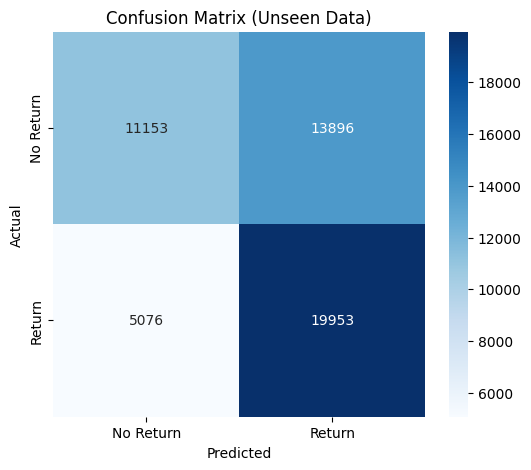

In [ ]:
import joblib  # Import für das Laden des Modells
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# Modellpfad (ändere den Dateinamen entsprechend)
model_path = 'dt_model.pkl'  # DecisionTree-Modell statt XGBoost
loaded_model = joblib.load(model_path)

# Label-Encoding für 'size', aber NICHT für 'size_category', 'size_category_encoded' oder 'size_false'
label_encoder = LabelEncoder()
orders_class2['size_encoded'] = label_encoder.fit_transform(orders_class2['size'])

# Feature-Liste definieren (ohne `size_category`, `size_category_encoded`, `size_false`)
feature_columns = [
    'category_count', 'count_without_size', 'similar_product_count_size_color', 'count_without_color',
                   'total_products_in_cart', 'price_rank', 'product_category_encoded', 'customer_return_rate',
                    'multiple_packages_flag', 'discount_bins_encoded','return_rate_size_itemid',
                   'return_rate_color_itemid','multiple_orders_flag','repeat_rate_per_customer',
                   'same_day_as_creation','region_encoded','return_rate_region','total_kept_region_customer','size_category_encoded','free_return'
                    ,'days_since_launch_scaled','target_group_encoded','sub_category_encoded','price_category_encoded'
]



# Sicherstellen, dass nur relevante Features enthalten sind
X_orders_class2 = orders_class2[feature_columns]

# Vorhersagen mit dem geladenen DecisionTree-Modell
predictions = loaded_model.predict(X_orders_class2)

# Ergebnisse in `orders_class2` speichern
orders_class2['return_prediction_2'] = predictions

# Ergebnisse überprüfen
print(orders_class2[['customerID', 'orderDate', 'return_prediction_2']].head())


import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Tatsächliche Lösung laden
actual_solution = pd.read_csv("DMC 2014_realclass.txt", sep=";", dtype={'orderItemID': int, 'returnShipment': int})

# Vorhersagen vorbereiten (Zusammenführen der Dateien)
comparison_df = actual_solution.merge(
    orders_class2[['orderItemID', 'return_prediction_2']],
    on='orderItemID',
    how='left'
)

# Überprüfung der Vorhersagen
print("Vergleich von tatsächlicher Lösung und Vorhersagen:")
print(comparison_df.head())

# Tatsächliche und vorhergesagte Werte extrahieren
y_true = comparison_df['returnShipment']
y_pred = comparison_df['return_prediction_2']

# Performance-Metriken berechnen
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = f1_score(y_true, y_pred)

# Ergebnisse anzeigen
print("\nPerformance des Modells auf den Unseen Data:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Confusion Matrix plotten
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Return', 'Return'], yticklabels=['No Return', 'Return'])
plt.title('Confusion Matrix (Unseen Data)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


##### modell speicher

In [ ]:
import pickle

# Modell speichern
with open('xgb_model.pkl', 'wb') as file:
    pickle.dump(xgb_model, file)
print("Modell wurde gespeichert.")

# Modell laden
with open('xgb_model.pkl', 'rb') as file:
    loaded_model = pickle.load(file)
print("Modell wurde geladen.")

# Vorhersagen mit dem geladenen Modell
y_pred_loaded = loaded_model.predict(X_test)

# Überprüfen, ob die Ergebnisse mit dem gespeicherten Modell übereinstimmen
print("Accuracy des geladenen Modells:", accuracy_score(y_test, y_pred_loaded))


Modell wurde gespeichert.
Modell wurde geladen.
Accuracy des geladenen Modells: 0.7795612147297943


In [ ]:
import pickle
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

# Modell speichern
with open('dt_model.pkl', 'wb') as file:
    pickle.dump(dt_model, file)
print("Decision Tree Modell wurde gespeichert.")

# Modell laden
with open('dt_model.pkl', 'rb') as file:
    loaded_dt_model = pickle.load(file)
print("Decision Tree Modell wurde geladen.")

# Vorhersagen mit dem geladenen Modell
y_pred_loaded_dt = loaded_dt_model.predict(X_test)

# Überprüfen, ob die Ergebnisse mit dem gespeicherten Modell übereinstimmen
print("Accuracy des geladenen Decision Tree Modells:", accuracy_score(y_test, y_pred_loaded_dt))


Decision Tree Modell wurde gespeichert.
Decision Tree Modell wurde geladen.
Accuracy des geladenen Decision Tree Modells: 0.5533034693802308


## ANOVA Test


📌 Bootstrap-Ergebnisse (Accuracy):
Group 1 (Basis-Features) - Mittelwert: 0.5438, Varianz: 0.000000
Group 2 (Feature Engineering) - Mittelwert: 0.7775, Varianz: 0.000000

📌 ANOVA Ergebnisse (Accuracy):
F-Statistik: 5118189.08
p-Wert: 0.0000

✅ Die Unterschiede zwischen den Feature-Gruppen sind signifikant (p < 0.05). Das Feature Engineering hat einen signifikanten Einfluss.


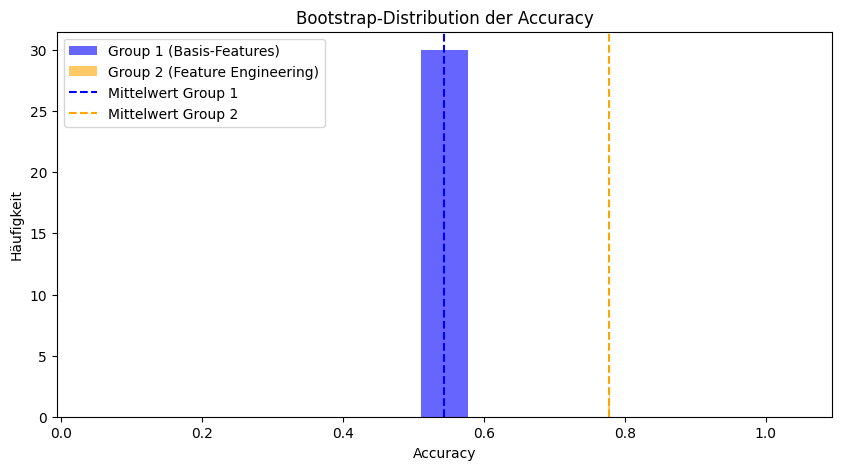

In [ ]:
from sklearn.utils import resample
from sklearn.metrics import accuracy_score
from scipy.stats import f_oneway
import numpy as np
import pandas as pd
from xgboost import XGBClassifier
import matplotlib.pyplot as plt

# Feature-Gruppen definieren
group_1_features = ['size', 'r', 'g', 'b','deliveryTime', 'age', 'manufacturerID','customerID','itemID',
                    'salutation_Family', 'salutation_Mr','salutation_Mrs','region_encoded','price']

group_2_features = ['category_count', 'count_without_size', 'similar_product_count_size_color', 'count_without_color',
                    'total_products_in_cart', 'price_rank', 'product_category_encoded', 'customer_return_rate',
                    'multiple_packages_flag', 'discount_bins_encoded','return_rate_size_itemid',
                    'return_rate_color_itemid','multiple_orders_flag','repeat_rate_per_customer',
                    'same_day_as_creation','region_encoded','return_rate_region','total_kept_region_customer',
                    'size_category_encoded','free_return', 'days_since_launch_scaled','target_group_encoded',
                    'sub_category_encoded','price_category_encoded']

# Überprüfung: Nur Features verwenden, die in X_train vorhanden sind
group_1_features = [feature for feature in group_1_features if feature in X_train.columns]
group_2_features = [feature for feature in group_2_features if feature in X_train.columns]

# Funktion zur Bootstrap-Modellbewertung
def evaluate_with_bootstrap(X_train, y_train, X_test, y_test, features, n_runs=30):
    accuracies = []

    for _ in range(n_runs):
        # Bootstrap-Sampling für X_train und y_train
        X_train_sample, y_train_sample = resample(X_train[features], y_train, replace=True, random_state=None)

        # Modell trainieren
        model = XGBClassifier(random_state=42, enable_categorical=True, eval_metric='logloss')
        model.fit(X_train_sample, y_train_sample)

        # Vorhersagen treffen und Accuracy speichern
        y_pred = model.predict(X_test[features])
        accuracies.append(accuracy_score(y_test, y_pred))

    return np.array(accuracies)

# Bootstrap-Analyse für beide Feature-Gruppen
n_runs = 30  # Mehr Durchläufe für stabilere Ergebnisse
accuracy_group_1 = evaluate_with_bootstrap(X_train, y_train, X_test, y_test, group_1_features, n_runs=n_runs)
accuracy_group_2 = evaluate_with_bootstrap(X_train, y_train, X_test, y_test, group_2_features, n_runs=n_runs)

# Varianzen berechnen
var_group_1 = np.var(accuracy_group_1)
var_group_2 = np.var(accuracy_group_2)

# ANOVA-Test durchführen
f_stat_acc, p_val_acc = f_oneway(accuracy_group_1, accuracy_group_2)

# Ergebnisse ausgeben
print("\n📌 Bootstrap-Ergebnisse (Accuracy):")
print(f"Group 1 (Basis-Features) - Mittelwert: {np.mean(accuracy_group_1):.4f}, Varianz: {var_group_1:.6f}")
print(f"Group 2 (Feature Engineering) - Mittelwert: {np.mean(accuracy_group_2):.4f}, Varianz: {var_group_2:.6f}")

print("\n📌 ANOVA Ergebnisse (Accuracy):")
print(f"F-Statistik: {f_stat_acc:.2f}")
print(f"p-Wert: {p_val_acc:.4f}")

# Interpretation der Ergebnisse
if p_val_acc < 0.05:
    print("\n✅ Die Unterschiede zwischen den Feature-Gruppen sind signifikant (p < 0.05). Das Feature Engineering hat einen signifikanten Einfluss.")
else:
    print("\n⚠️ Die Unterschiede zwischen den Gruppen sind nicht signifikant (p >= 0.05). Feature Engineering verbessert die Performance möglicherweise nicht erheblich.")

# Visualisierung der Bootstrap-Verteilungen
plt.figure(figsize=(10, 5))
plt.hist(accuracy_group_1, bins=15, alpha=0.6, label="Group 1 (Basis-Features)", color="blue")
plt.hist(accuracy_group_2, bins=15, alpha=0.6, label="Group 2 (Feature Engineering)", color="orange")
plt.axvline(np.mean(accuracy_group_1), color="blue", linestyle="dashed", label="Mittelwert Group 1")
plt.axvline(np.mean(accuracy_group_2), color="orange", linestyle="dashed", label="Mittelwert Group 2")
plt.xlabel("Accuracy")
plt.ylabel("Häufigkeit")
plt.title("Bootstrap-Distribution der Accuracy")
plt.legend()
plt.show()



📌 Bootstrap-Ergebnisse (Accuracy):
Group 1 (Basis-Features) - Mittelwert: 0.5192, Varianz: 0.000003
Group 2 (Feature Engineering) - Mittelwert: 0.7774, Varianz: 0.000000

📌 ANOVA Ergebnisse (Accuracy):
F-Statistik: 539391.53
p-Wert: 0.0000


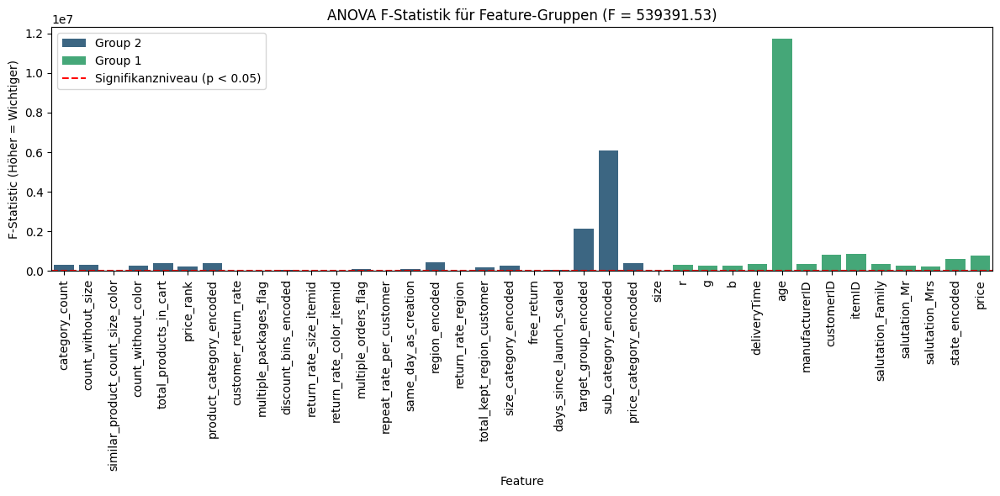

<ipython-input-10-17c6f1149c10>:112: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Feature Group", y="Accuracy", data=accuracy_df, palette="coolwarm")


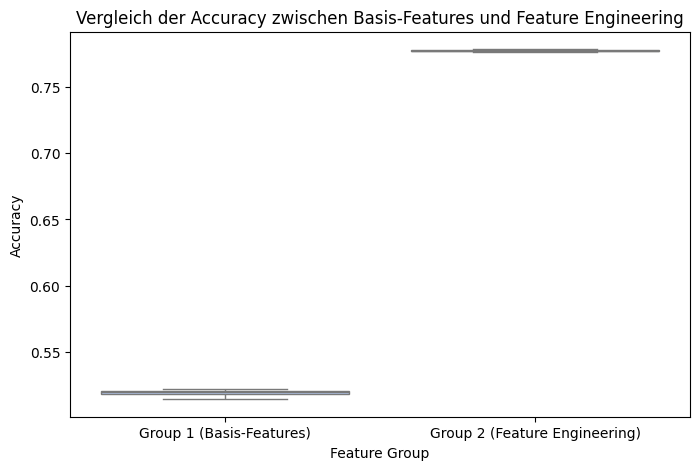

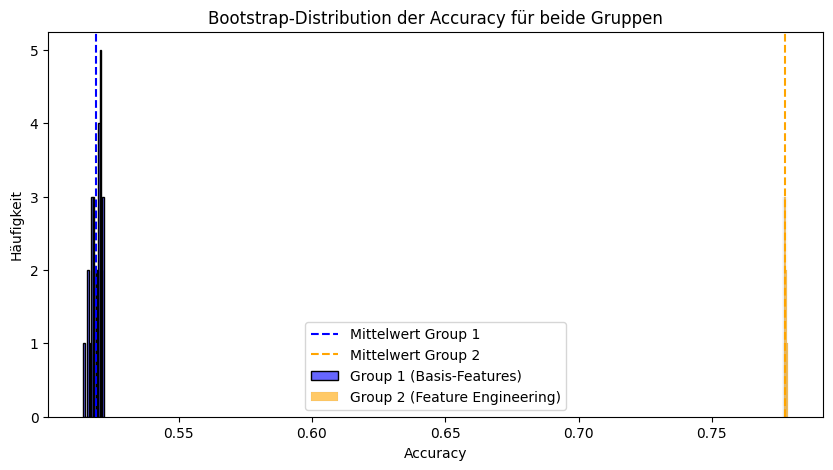

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import f_oneway
from sklearn.utils import resample
from sklearn.metrics import accuracy_score
from xgboost import XGBClassifier

# Basis-Features (Group 1)
group_1_features = ['size', 'r', 'g', 'b', 'deliveryTime', 'age', 'manufacturerID', 'customerID', 'itemID',
                    'salutation_Family', 'salutation_Mr', 'salutation_Mrs', 'state_encoded', 'price']

# Feature-Engineering-Features (Group 2)
group_2_features = ['category_count', 'count_without_size', 'similar_product_count_size_color', 'count_without_color',
                    'total_products_in_cart', 'price_rank', 'product_category_encoded', 'customer_return_rate',
                    'multiple_packages_flag', 'discount_bins_encoded', 'return_rate_size_itemid',
                    'return_rate_color_itemid', 'multiple_orders_flag', 'repeat_rate_per_customer',
                    'same_day_as_creation', 'region_encoded', 'return_rate_region', 'total_kept_region_customer',
                    'size_category_encoded', 'free_return', 'days_since_launch_scaled', 'target_group_encoded',
                    'sub_category_encoded', 'price_category_encoded']

# Sicherstellen, dass nur existierende Features verwendet werden
group_2_features = [feat for feat in group_2_features if feat in X_train.columns]

# Basis-Features aus X_train_group_1
try:
    X_train_group_1 = X_train_group_1[group_1_features]
    X_test_group_1 = X_test_group_1[group_1_features]
except NameError:
    print("⚠️ Warnung: Basis-Features nicht in X_train gefunden. Bitte prüfe, ob `X_train_group_1` existiert!")
    X_train_group_1, X_test_group_1 = None, None

# Trainings-Sets für Group 2
X_train_group_2, X_test_group_2 = X_train[group_2_features], X_test[group_2_features]

# Funktion zur Bootstrap-Modellbewertung
def evaluate_with_bootstrap(X_train, y_train, X_test, y_test, n_runs=30):
    accuracies = []
    for _ in range(n_runs):
        X_train_sample, y_train_sample = resample(X_train, y_train, replace=True, random_state=None)
        model = XGBClassifier(random_state=42, enable_categorical=True, eval_metric='logloss')
        model.fit(X_train_sample, y_train_sample)
        y_pred = model.predict(X_test)
        accuracies.append(accuracy_score(y_test, y_pred))
    return np.array(accuracies)

# Bootstrap-Analyse
n_runs = 30
if X_train_group_1 is not None:
    accuracy_group_1 = evaluate_with_bootstrap(X_train_group_1, y_train, X_test_group_1, y_test, n_runs)
else:
    accuracy_group_1 = None

accuracy_group_2 = evaluate_with_bootstrap(X_train_group_2, y_train, X_test_group_2, y_test, n_runs)

# Berechnung der Varianz
var_group_1 = np.var(accuracy_group_1) if accuracy_group_1 is not None else None
var_group_2 = np.var(accuracy_group_2)

# ANOVA-Test für Accuracy-Vergleich
if accuracy_group_1 is not None:
    f_stat_acc, p_val_acc = f_oneway(accuracy_group_1, accuracy_group_2)
else:
    f_stat_acc, p_val_acc = None, None

# Ergebnisse ausgeben
print("\n📌 Bootstrap-Ergebnisse (Accuracy):")
if accuracy_group_1 is not None:
    print(f"Group 1 (Basis-Features) - Mittelwert: {np.mean(accuracy_group_1):.4f}, Varianz: {var_group_1:.6f}")
print(f"Group 2 (Feature Engineering) - Mittelwert: {np.mean(accuracy_group_2):.4f}, Varianz: {var_group_2:.6f}")

if f_stat_acc is not None:
    print("\n📌 ANOVA Ergebnisse (Accuracy):")
    print(f"F-Statistik: {f_stat_acc:.2f}")
    print(f"p-Wert: {p_val_acc:.4f}")

# ANOVA-Test für jedes Feature (Feature-Wichtigkeit)
anova_results = []
for feature in group_2_features:
    f_stat, p_value = f_oneway(pd.to_numeric(X_train_group_2[feature], errors='coerce'), y_train)
    anova_results.append(["Group 2", str(feature), f_stat, p_value])

if X_train_group_1 is not None:
    for feature in group_1_features:
        f_stat, p_value = f_oneway(pd.to_numeric(X_train_group_1[feature], errors='coerce'), y_train)
        anova_results.append(["Group 1", str(feature), f_stat, p_value])

anova_df = pd.DataFrame(anova_results, columns=["Feature Group", "Feature", "F-Statistic", "p-Value"])
anova_df["Feature"] = anova_df["Feature"].astype(str)  # Sicherstellen, dass Feature-Namen Strings sind
anova_df["Feature Group"] = anova_df["Feature Group"].astype(str)  # Feature Group ebenfalls als String

plt.figure(figsize=(12, 6))
sns.barplot(x="Feature", y="F-Statistic", hue="Feature Group", data=anova_df, palette="viridis")
plt.axhline(y=3.84, color='r', linestyle='dashed', label="Signifikanzniveau (p < 0.05)")
plt.xticks(rotation=90)
plt.title(f"ANOVA F-Statistik für Feature-Gruppen (F = {f_stat_acc:.2f})")
plt.xlabel("Feature")
plt.ylabel("F-Statistic (Höher = Wichtiger)")
plt.legend()
plt.tight_layout()
plt.show()

# 📊 2️⃣ BOX-PLOT DER ACCURACY-VERTEILUNG
if accuracy_group_1 is not None:
    accuracy_df = pd.DataFrame({
        "Accuracy": np.concatenate([accuracy_group_1, accuracy_group_2]),
        "Feature Group": ["Group 1 (Basis-Features)"] * len(accuracy_group_1) + ["Group 2 (Feature Engineering)"] * len(accuracy_group_2)
    })

    plt.figure(figsize=(8, 5))
    sns.boxplot(x="Feature Group", y="Accuracy", data=accuracy_df, palette="coolwarm")
    plt.title("Vergleich der Accuracy zwischen Basis-Features und Feature Engineering")
    plt.xlabel("Feature Group")
    plt.ylabel("Accuracy")
    plt.show()

# 📊 3️⃣ HISTOGRAMM DER ACCURACY-VERTEILUNG
plt.figure(figsize=(10, 5))
if accuracy_group_1 is not None:
    sns.histplot(accuracy_group_1, bins=15, alpha=0.6, label="Group 1 (Basis-Features)", color="blue")
sns.histplot(accuracy_group_2, bins=15, alpha=0.6, label="Group 2 (Feature Engineering)", color="orange")
if accuracy_group_1 is not None:
    plt.axvline(np.mean(accuracy_group_1), color="blue", linestyle="dashed", label="Mittelwert Group 1")
plt.axvline(np.mean(accuracy_group_2), color="orange", linestyle="dashed", label="Mittelwert Group 2")
plt.xlabel("Accuracy")
plt.ylabel("Häufigkeit")
plt.title("Bootstrap-Distribution der Accuracy für beide Gruppen")
plt.legend()
plt.show()


In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import f_oneway

# ANOVA-Test für jedes Feature (Feature-Wichtigkeit)
anova_results = []
for feature in group_2_features:
    f_stat, p_value = f_oneway(pd.to_numeric(X_train_group_2[feature], errors='coerce'), y_train)
    anova_results.append(["Group 2", feature, f_stat, p_value])

if X_train_group_1 is not None:
    for feature in group_1_features:
        f_stat, p_value = f_oneway(pd.to_numeric(X_train_group_1[feature], errors='coerce'), y_train)
        anova_results.append(["Group 1", feature, f_stat, p_value])

# ANOVA-Ergebnisse als DataFrame formatieren
anova_df = pd.DataFrame(anova_results, columns=["Feature Group", "Feature", "F-Statistic", "p-Value"])

# Sortiere nach p-Wert (kleinster p-Wert zuerst, d.h. wichtigere Features oben)
anova_df = anova_df.sort_values(by="p-Value")

# ANOVA-Ergebnisse ausgeben als Tabelle
print("\n📌 ANOVA-Test Ergebnisse für Feature-Gruppen:")
print(anova_df.to_string(index=False))  # Gibt die Tabelle formatiert aus



📌 ANOVA-Test Ergebnisse für Feature-Gruppen:
Feature Group                          Feature  F-Statistic       p-Value
      Group 2                   category_count 3.111056e+05  0.000000e+00
      Group 2         days_since_launch_scaled 5.412378e+04  0.000000e+00
      Group 2             target_group_encoded 2.147275e+06  0.000000e+00
      Group 2             sub_category_encoded 6.068120e+06  0.000000e+00
      Group 2           price_category_encoded 3.720388e+05  0.000000e+00
      Group 1                                r 3.211684e+05  0.000000e+00
      Group 1                                g 2.743008e+05  0.000000e+00
      Group 1                                b 2.813122e+05  0.000000e+00
      Group 1                     deliveryTime 3.651708e+05  0.000000e+00
      Group 1                              age 1.173060e+07  0.000000e+00
      Group 1                   manufacturerID 3.476380e+05  0.000000e+00
      Group 1                       customerID 8.250383e+05  0.000

## feature_importances

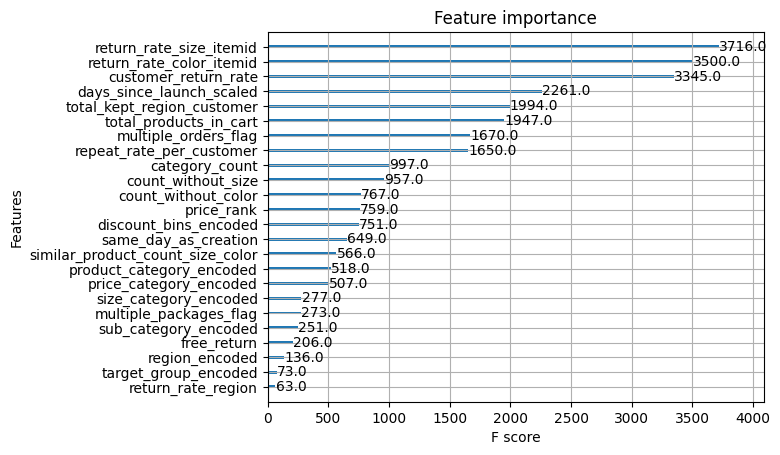

In [ ]:
import matplotlib.pyplot as plt
from xgboost import plot_importance

plot_importance(xgb_model)
plt.show()


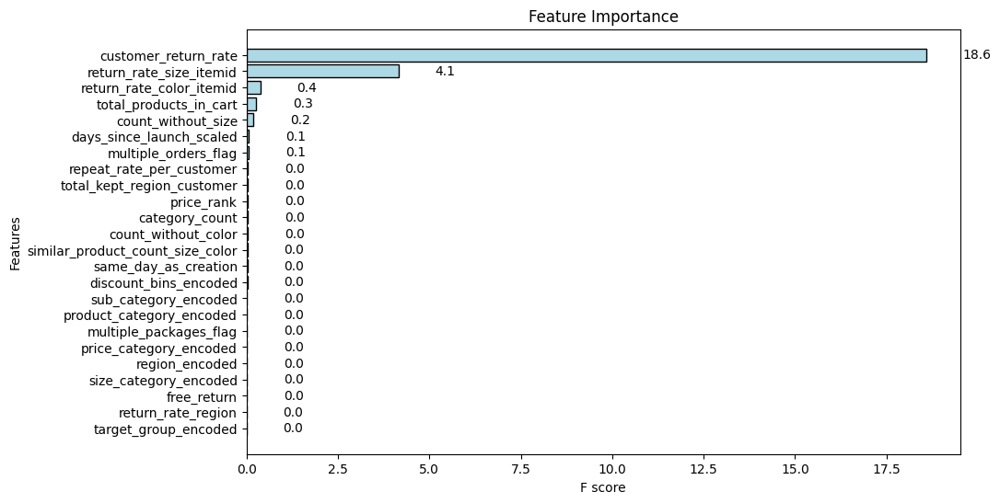

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Annahme: dt_model ist bereits trainiert
feature_importance = dt_model.feature_importances_
features = X_train.columns  # Falls du ein Pandas DataFrame als Eingabe hast

# Multipliziere die Feature-Importances mit der Gesamtanzahl der Features für den F-Score-Effekt
f_scores = feature_importance * len(feature_importance)

# Sortieren der Feature-Wichtigkeit
indices = np.argsort(f_scores)

# Balkendiagramm wie in deinem Beispiel
plt.figure(figsize=(10, 6))
plt.barh(np.array(features)[indices], f_scores[indices], color="lightblue", edgecolor="black")
plt.xlabel("F score")
plt.ylabel("Features")
plt.title("Feature Importance")

# Werte in die Balken einfügen
for i, v in enumerate(f_scores[indices]):
    plt.text(v + 1, i, f"{v:.1f}", va="center")

plt.show()


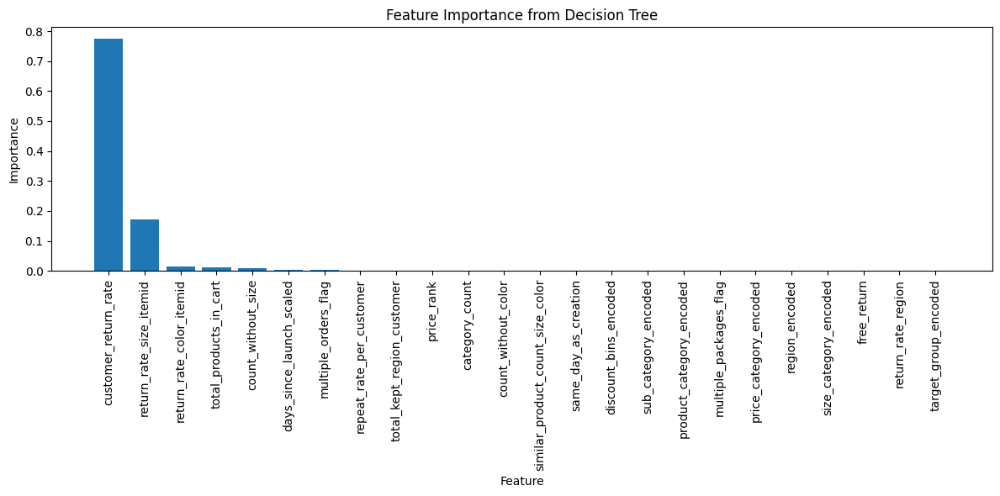

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

# Get feature importances from the decision tree model
importances = dt_model.feature_importances_

# Get feature names (assuming X_valid_orders_class2 is your DataFrame with features)
feature_names = X_valid_orders_class2.columns

# Create a DataFrame for plotting
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(12, 6))
plt.bar(importance_df['Feature'], importance_df['Importance'])
plt.xticks(rotation=90)
plt.title('Feature Importance from Decision Tree')
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.tight_layout()
plt.show()

## Beste Parameter (optuna)

In [ ]:
!pip install optuna

import optuna
from xgboost import XGBClassifier
from sklearn.metrics import f1_score

def objective(trial):
    # Definiere die Hyperparameter
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 500),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'gamma': trial.suggest_float('gamma', 0, 5),
        'reg_alpha': trial.suggest_float('reg_alpha', 0, 5),
        'reg_lambda': trial.suggest_float('reg_lambda', 2, 5),
    }

    # Trainiere das Modell
    model = XGBClassifier(**params, random_state=42, enable_categorical=True)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Evaluiere das Modell
    return f1_score(y_test, y_pred)

# Optuna-Studie
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)

# Beste Parameter
print("Beste Parameter:", study.best_params)


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 383.6/383.6 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.6/233.6 kB 14.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 kB 4.9 MB/s eta 0:00:00


[I 2025-02-21 14:44:12,001] A new study created in memory with name: no-name-84a3acb6-7455-46aa-8e3e-a42935fb06d3
[I 2025-02-21 14:44:36,531] Trial 0 finished with value: 0.7981298226495351 and parameters: {'n_estimators': 299, 'max_depth': 10, 'learning_rate': 0.16564504752635628, 'subsample': 0.5254030794687687, 'colsample_bytree': 0.8059388996634611, 'gamma': 0.11852713716597518, 'reg_alpha': 3.597432666671735, 'reg_lambda': 2.9149531854190744}. Best is trial 0 with value: 0.7981298226495351.
[I 2025-02-21 14:45:06,328] Trial 1 finished with value: 0.8007127746420766 and parameters: {'n_estimators': 430, 'max_depth': 9, 'learning_rate': 0.13033451959786466, 'subsample': 0.6727466827848263, 'colsample_bytree': 0.8661078066337942, 'gamma': 0.12380068627301233, 'reg_alpha': 2.0570505781319435, 'reg_lambda': 2.0988037422517665}. Best is trial 1 with value: 0.8007127746420766.
[I 2025-02-21 14:45:20,062] Trial 2 finished with value: 0.8055941610943578 and parameters: {'n_estimators': 133

Beste Parameter: {'n_estimators': 174, 'max_depth': 8, 'learning_rate': 0.12138450738244076, 'subsample': 0.5505103719217807, 'colsample_bytree': 0.6214577257717854, 'gamma': 3.8019886440097275, 'reg_alpha': 4.034377345458296, 'reg_lambda': 2.8447323549594246}


In [ ]:
!pip install optuna

import optuna
from xgboost import XGBClassifier
from sklearn.metrics import f1_score

def objective(trial):
    # Definiere die Hyperparameter
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 500),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'gamma': trial.suggest_float('gamma', 0, 5),
        'reg_alpha': trial.suggest_float('reg_alpha', 0, 5),
        'reg_lambda': trial.suggest_float('reg_lambda', 0, 5),
    }

    # Trainiere das Modell
    model = XGBClassifier(**params, random_state=42, enable_categorical=True)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Evaluiere das Modell
    return f1_score(y_test, y_pred)

# Optuna-Studie
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)

# Beste Parameter
print("Beste Parameter:", study.best_params)


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 383.6/383.6 kB 10.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.6/233.6 kB 14.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 kB 5.1 MB/s eta 0:00:00


[I 2025-03-01 13:21:54,310] A new study created in memory with name: no-name-5546ed69-1b73-4820-89a1-c9250816008a
[I 2025-03-01 13:22:02,002] Trial 0 finished with value: 0.6813634106431996 and parameters: {'n_estimators': 472, 'max_depth': 7, 'learning_rate': 0.28950579526039927, 'subsample': 0.8969245078626205, 'colsample_bytree': 0.7968478540040752, 'gamma': 3.7701856964937215, 'reg_alpha': 3.3738092896990626, 'reg_lambda': 2.1194246980108438}. Best is trial 0 with value: 0.6813634106431996.
[I 2025-03-01 13:22:08,779] Trial 1 finished with value: 0.6828053090903209 and parameters: {'n_estimators': 165, 'max_depth': 6, 'learning_rate': 0.2590020255057713, 'subsample': 0.7624229790666186, 'colsample_bytree': 0.6712069886377647, 'gamma': 4.010047984725612, 'reg_alpha': 3.9021987399551556, 'reg_lambda': 2.8159855177794557}. Best is trial 1 with value: 0.6828053090903209.
[I 2025-03-01 13:22:14,963] Trial 2 finished with value: 0.6831176598960564 and parameters: {'n_estimators': 222, 'm

Beste Parameter: {'n_estimators': 101, 'max_depth': 4, 'learning_rate': 0.011548760009813974, 'subsample': 0.6239723071216094, 'colsample_bytree': 0.994403644898695, 'gamma': 2.0783697157718035, 'reg_alpha': 2.576030134915148, 'reg_lambda': 2.847912001910963}


In [ ]:
!pip install optuna

import optuna
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import f1_score

def objective(trial):
    # Definiere die Hyperparameter für DecisionTreeClassifier
    params = {
        'max_depth': trial.suggest_int('max_depth', 3, 20),  # Maximale Tiefe des Baums
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),  # Mindestanzahl an Samples für einen Split
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 20),  # Mindestanzahl an Samples in einem Blatt
        'max_features': trial.suggest_categorical('max_features', ['sqrt', 'log2', None]),  # Anzahl der maximal verwendeten Features
        'criterion': trial.suggest_categorical('criterion', ['gini', 'entropy']),  # Kriterium für den Split
    }

    # Trainiere das Modell
    model = DecisionTreeClassifier(**params, random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Evaluiere das Modell mit F1-Score
    return f1_score(y_test, y_pred)

# Optuna-Studie zur Maximierung des F1-Scores
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)  # Anzahl der Versuche

# Beste gefundene Parameter ausgeben
print("Beste Parameter:", study.best_params)

# Bestes Modell mit den optimalen Parametern trainieren
best_params = study.best_params
best_dt_model = DecisionTreeClassifier(**best_params, random_state=42)
best_dt_model.fit(X_train, y_train)

# Vorhersagen mit dem optimierten Modell
y_pred_best_dt = best_dt_model.predict(X_test)

# Bewertung des optimierten Modells
print("\nOptimiertes Decision Tree Modell:")
print("Accuracy:", accuracy_score(y_test, y_pred_best_dt))
print("Precision:", precision_score(y_test, y_pred_best_dt))
print("Recall:", recall_score(y_test, y_pred_best_dt))
print("F1 Score:", f1_score(y_test, y_pred_best_dt))


[I 2025-01-31 00:33:34,568] A new study created in memory with name: no-name-552d88c5-8e67-497a-9c62-b87d752009f2
[I 2025-01-31 00:33:35,090] Trial 0 finished with value: 0.698165092723981 and parameters: {'max_depth': 3, 'min_samples_split': 14, 'min_samples_leaf': 10, 'max_features': 'sqrt', 'criterion': 'gini'}. Best is trial 0 with value: 0.698165092723981.
[I 2025-01-31 00:33:44,547] Trial 1 finished with value: 0.7584134404161468 and parameters: {'max_depth': 13, 'min_samples_split': 7, 'min_samples_leaf': 12, 'max_features': None, 'criterion': 'gini'}. Best is trial 1 with value: 0.7584134404161468.
[I 2025-01-31 00:33:45,142] Trial 2 finished with value: 0.6846274494232564 and parameters: {'max_depth': 4, 'min_samples_split': 13, 'min_samples_leaf': 1, 'max_features': 'log2', 'criterion': 'gini'}. Best is trial 1 with value: 0.7584134404161468.
[I 2025-01-31 00:33:46,989] Trial 3 finished with value: 0.7296491411913767 and parameters: {'max_depth': 3, 'min_samples_split': 5, 'm

Beste Parameter: {'max_depth': 10, 'min_samples_split': 14, 'min_samples_leaf': 3, 'max_features': None, 'criterion': 'entropy'}

Optimiertes Decision Tree Modell:
Accuracy: 0.7540279467610516
Precision: 0.7327859550749307
Recall: 0.8044481899457716
F1 Score: 0.7669467102160585


In [ ]:
!pip install optuna

import optuna
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import f1_score

def objective(trial):
    # Definiere die Hyperparameter für DecisionTreeClassifier
    params = {
        'max_depth': trial.suggest_int('max_depth', 3, 20),  # Maximale Tiefe des Baums
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),  # Mindestanzahl an Samples für einen Split
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 20),  # Mindestanzahl an Samples in einem Blatt
        'max_features': trial.suggest_categorical('max_features', ['sqrt', 'log2', None]),  # Anzahl der maximal verwendeten Features
        'criterion': trial.suggest_categorical('criterion', ['gini', 'entropy']),  # Kriterium für den Split
    }

    # Trainiere das Modell
    model = DecisionTreeClassifier(**params, random_state=42)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Evaluiere das Modell mit F1-Score
    return f1_score(y_test, y_pred)

# Optuna-Studie zur Maximierung des F1-Scores
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)  # Anzahl der Versuche

# Beste gefundene Parameter ausgeben
print("Beste Parameter:", study.best_params)

# Bestes Modell mit den optimalen Parametern trainieren
best_params = study.best_params
best_dt_model = DecisionTreeClassifier(**best_params, random_state=42)
best_dt_model.fit(X_train, y_train)

# Vorhersagen mit dem optimierten Modell
y_pred_best_dt = best_dt_model.predict(X_test)

# Bewertung des optimierten Modells
print("\nOptimiertes Decision Tree Modell:")
print("Accuracy:", accuracy_score(y_test, y_pred_best_dt))
print("Precision:", precision_score(y_test, y_pred_best_dt))
print("Recall:", recall_score(y_test, y_pred_best_dt))
print("F1 Score:", f1_score(y_test, y_pred_best_dt))


[I 2025-03-01 14:05:39,855] A new study created in memory with name: no-name-b2d75ff2-2b7d-456e-968b-bd2f76090bd9
[I 2025-03-01 14:05:45,109] Trial 0 finished with value: 0.6195118943817651 and parameters: {'max_depth': 16, 'min_samples_split': 8, 'min_samples_leaf': 7, 'max_features': None, 'criterion': 'gini'}. Best is trial 0 with value: 0.6195118943817651.
[I 2025-03-01 14:05:46,227] Trial 1 finished with value: 0.6557725698050195 and parameters: {'max_depth': 13, 'min_samples_split': 7, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'criterion': 'gini'}. Best is trial 1 with value: 0.6557725698050195.
[I 2025-03-01 14:05:47,656] Trial 2 finished with value: 0.6242065945164689 and parameters: {'max_depth': 20, 'min_samples_split': 4, 'min_samples_leaf': 13, 'max_features': 'sqrt', 'criterion': 'gini'}. Best is trial 1 with value: 0.6557725698050195.
[I 2025-03-01 14:05:48,215] Trial 3 finished with value: 0.686263162246056 and parameters: {'max_depth': 5, 'min_samples_split': 20, '

Beste Parameter: {'max_depth': 3, 'min_samples_split': 16, 'min_samples_leaf': 16, 'max_features': 'sqrt', 'criterion': 'entropy'}

Optimiertes Decision Tree Modell:
Accuracy: 0.5811314363143631
Precision: 0.5719926991379013
Recall: 0.9128682397772241
F1 Score: 0.7033035279504859


In [ ]:
!pip install optuna

import optuna
from xgboost import XGBClassifier
from sklearn.metrics import f1_score

def objective(trial):
    # Erweiterte Hyperparameter-Suchräume
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 1000, step=50),
        'max_depth': trial.suggest_int('max_depth', 2, 15),
        'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.5, log=True),
        'subsample': trial.suggest_float('subsample', 0.4, 1.0, step=0.05),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.4, 1.0, step=0.05),
        'gamma': trial.suggest_float('gamma', 0, 10, step=0.5),
        'reg_alpha': trial.suggest_float('reg_alpha', 0, 10, step=0.5),
        'reg_lambda': trial.suggest_float('reg_lambda', 0, 10, step=0.5),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
    }

    # Trainiere das Modell
    model = XGBClassifier(**params, random_state=42, enable_categorical=True, eval_metric='logloss')
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Evaluiere das Modell
    return f1_score(y_test, y_pred)

# Optuna-Studie
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100)  # Anzahl der Versuche erhöhen

# Beste Parameter
print("Beste Parameter:", study.best_params)


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 364.4/364.4 kB 28.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.5/233.5 kB 18.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 9.2 MB/s eta 0:00:00


[I 2024-12-28 20:59:25,917] A new study created in memory with name: no-name-c4b9f33f-98f6-49f8-ab3c-aa9c35a4816f
[I 2024-12-28 21:00:58,766] Trial 0 finished with value: 0.7881968325152392 and parameters: {'n_estimators': 1000, 'max_depth': 2, 'learning_rate': 0.0033379774269845903, 'subsample': 0.6000000000000001, 'colsample_bytree': 0.7000000000000001, 'gamma': 8.5, 'reg_alpha': 6.0, 'reg_lambda': 9.5, 'min_child_weight': 10}. Best is trial 0 with value: 0.7881968325152392.
[I 2024-12-28 21:01:09,257] Trial 1 finished with value: 0.8117154059206504 and parameters: {'n_estimators': 500, 'max_depth': 15, 'learning_rate': 0.010974679615878622, 'subsample': 0.9500000000000001, 'colsample_bytree': 0.45, 'gamma': 7.0, 'reg_alpha': 3.0, 'reg_lambda': 3.0, 'min_child_weight': 4}. Best is trial 1 with value: 0.8117154059206504.
[I 2024-12-28 21:01:12,297] Trial 2 finished with value: 0.8135371843157603 and parameters: {'n_estimators': 700, 'max_depth': 11, 'learning_rate': 0.4748584061099972

Beste Parameter: {'n_estimators': 850, 'max_depth': 9, 'learning_rate': 0.056385701697249616, 'subsample': 0.5, 'colsample_bytree': 0.65, 'gamma': 4.0, 'reg_alpha': 8.5, 'reg_lambda': 5.5, 'min_child_weight': 7}


In [ ]:
from bayes_opt import BayesianOptimization
from xgboost import XGBClassifier
from sklearn.model_selection import StratifiedKFold
import numpy as np

# Bewertungsfunktion für Bayesian Optimization
def xgb_evaluate(n_estimators, max_depth, learning_rate, subsample, colsample_bytree, gamma):
    """
    Bewertungsfunktion für Bayesian Optimization.
    """
    model = XGBClassifier(
        random_state=42,
        n_estimators=int(n_estimators),  # Ganzzahlig
        max_depth=int(max_depth),  # Ganzzahlig
        learning_rate=learning_rate,
        subsample=subsample,
        colsample_bytree=colsample_bytree,
        gamma=gamma,
        tree_method='auto',
        objective='binary:logistic'  # Zielvariable für binäre Klassifikation
    )

    # StratifiedKFold für konsistente Cross-Validation
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    scores = []

    for train_index, test_index in skf.split(X_train, y_train):
        # Indexbasiertes Extrahieren von DataFrame-Zeilen
        X_train_fold = X_train.iloc[train_index]
        X_test_fold = X_train.iloc[test_index]
        y_train_fold = y_train.iloc[train_index]
        y_test_fold = y_train.iloc[test_index]

        # Eval-Set für XGBoost
        eval_set = [(X_test_fold, y_test_fold)]

        # Trainiere das Modell (ohne `early_stopping_rounds`)
        model.fit(
            X_train_fold, y_train_fold,
            eval_set=eval_set,
            verbose=False
        )

        # Score berechnen und speichern
        scores.append(model.score(X_test_fold, y_test_fold))

    return np.mean(scores)

# Hyperparameter-Bereich
param_bounds = {
    'n_estimators': (100, 500),
    'max_depth': (3, 10),
    'learning_rate': (0.01, 0.2),
    'subsample': (0.5, 1.0),
    'colsample_bytree': (0.5, 1.0),
    'gamma': (0, 5)
}

# Bayesian Optimization
optimizer = BayesianOptimization(
    f=xgb_evaluate,  # Bewertungsfunktion
    pbounds=param_bounds,  # Parametergrenzen
    random_state=42,
    verbose=2
)

# Starte die Optimierung
optimizer.maximize(init_points=10, n_iter=30)

# Beste Parameter
print("Beste Parameter:", optimizer.max)


|   iter    |  target   | colsam... |   gamma   | learni... | max_depth | n_esti... | subsample |
-------------------------------------------------------------------------------------------------
| 1         | 0.9185    | 0.6873    | 4.754     | 0.1491    | 7.191     | 162.4     | 0.578     |
| 2         | 0.9194    | 0.529     | 4.331     | 0.1242    | 7.957     | 108.2     | 0.985     |
| 3         | 0.9198    | 0.9162    | 1.062     | 0.04455   | 4.284     | 221.7     | 0.7624    |
| 4         | 0.9196    | 0.716     | 1.456     | 0.1263    | 3.976     | 216.9     | 0.6832    |
| 5         | 0.9189    | 0.728     | 3.926     | 0.04794   | 6.6       | 337.0     | 0.5232    |
| 6         | 0.9151    | 0.8038    | 0.8526    | 0.02236   | 9.642     | 486.3     | 0.9042    |
| 7         | 0.9171    | 0.6523    | 0.4884    | 0.14      | 6.081     | 148.8     | 0.7476    |
| 8         | 0.9194    | 0.5172    | 4.547     | 0.05917   | 7.638     | 224.7     | 0.76      |
| 9         | 0.9095

KeyboardInterrupt: 

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from xgboost import XGBClassifier

# Sicherstellen, dass alle Features vorhanden sind
feature_columns = ['age', 'deliveryTime', 'price', 'category_count', 'manufacturer_count',
                   'count_without_size', 'similar_product_count_size_color', 'count_without_color',
                   'total_products_in_cart', 'return_rate_size_product_category', 'return_rate_color',
                   'category_variation', 'free_return', 'average_cart_value', 'discount_percentage',
                   'discount_rank', 'price_rank', 'product_category_encoded', 'availability_season_Summer',
                   'availability_season_Winter', 'availability_season_Spring',
                   'duplicate_flag_by_cust_date_cat_size', 'duplicate_flag_by_cust_date_item',
                   'return_count', 'order_diff', 'duplicate_item_return_rate',
                   'customer_return_rate', 'duplicate_flag_by_cust_date_cat_size_return_rate','log_likelihood_ratio_by_customer_and_price','log_likelihood_ratio_by_price']

# Fehlende Features hinzufügen, falls nötig
for feature in feature_columns:
    if feature not in df13.columns:
        df13[feature] = 0

# Features und Zielvariable definieren
X = df13[feature_columns]
y = df13['returnShipment']

# Daten in Trainings- und Testdatensatz aufteilen
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# XGBoost-Classifier initialisieren
xgb_model = XGBClassifier(random_state=42, enable_categorical=True, eval_metric='logloss')

# Modell trainieren
xgb_model.fit(X_train, y_train)

# Vorhersagen auf dem Testdatensatz
y_pred_xgb = xgb_model.predict(X_test)

# Modellbewertung
print("XGBoost Performance:")
print("Accuracy:", accuracy_score(y_test, y_pred_xgb))
print("Precision:", precision_score(y_test, y_pred_xgb))
print("Recall:", recall_score(y_test, y_pred_xgb))
print("F1 Score:", f1_score(y_test, y_pred_xgb))


XGBoost Performance:
Accuracy: 0.9114727860401792
Precision: 0.9067928138620176
Recall: 0.9116383456235974
F1 Score: 0.9092091238541888


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from xgboost import XGBClassifier

# Sicherstellen, dass alle Features vorhanden sind
feature_columns = ['age', 'category_count', 'manufacturer_count',
                   'count_without_size', 'similar_product_count_size_color', 'count_without_color',
                   'total_products_in_cart', 'return_rate_size_product_category', 'return_rate_color',
                   'category_variation', 'free_return', 'average_cart_value', 'discount_percentage',
                   'discount_rank', 'price_rank', 'product_category_encoded',
                   'duplicate_flag_by_cust_date_cat_size', 'duplicate_flag_by_cust_date_item',
                   'return_count', 'order_diff', 'duplicate_item_return_rate',
                    'duplicate_flag_by_cust_date_cat_size_return_rate','log_likelihood_ratio_by_customer_and_price','log_likelihood_ratio_by_price']

# Fehlende Features hinzufügen, falls nötig
for feature in feature_columns:
    if feature not in df13.columns:
        df13[feature] = 0

# Features und Zielvariable definieren
X = df13[feature_columns]
y = df13['returnShipment']

# Daten in Trainings- und Testdatensatz aufteilen
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# XGBoost-Classifier initialisieren
xgb_model = XGBClassifier(random_state=42, enable_categorical=True, eval_metric='logloss')

# Modell trainieren
xgb_model.fit(X_train, y_train)

# Vorhersagen auf dem Testdatensatz
y_pred_xgb = xgb_model.predict(X_test)

# Modellbewertung
print("XGBoost Performance:")
print("Accuracy:", accuracy_score(y_test, y_pred_xgb))
print("Precision:", precision_score(y_test, y_pred_xgb))
print("Recall:", recall_score(y_test, y_pred_xgb))
print("F1 Score:", f1_score(y_test, y_pred_xgb))


XGBoost Performance:
Accuracy: 0.9045095043598458
Precision: 0.8922800338409476
Recall: 0.9115206775852384
F1 Score: 0.9017977383980675


In [ ]:
import pickle

# Modell speichern
with open('xgb_model.pkl', 'wb') as file:
    pickle.dump(xgb_model, file)
print("Modell wurde gespeichert.")

# Modell laden
with open('xgb_model.pkl', 'rb') as file:
    loaded_model = pickle.load(file)
print("Modell wurde geladen.")

# Vorhersagen mit dem geladenen Modell
y_pred_loaded = loaded_model.predict(X_test)

# Überprüfen, ob die Ergebnisse mit dem gespeicherten Modell übereinstimmen
print("Accuracy des geladenen Modells:", accuracy_score(y_test, y_pred_loaded))


Modell wurde gespeichert.
Modell wurde geladen.
Accuracy des geladenen Modells: 0.9114727860401792


### with_prameter

In [ ]:
!pip install optuna
import optuna
import numpy as np
from xgboost import XGBClassifier
from sklearn.metrics import f1_score
import pickle

# Funktion zur Optimierung der Hyperparameter
def optimize_model(X_train, y_train, X_test, y_test, model_name):
    def objective(trial):
        # Definiere die Hyperparameter
        params = {
            'n_estimators': trial.suggest_categorical('n_estimators', [100, 200, 300, 400, 500]),
            'max_depth': trial.suggest_categorical('max_depth', [3, 5, 7, 9, 11]),
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.3, step=0.01),
            'subsample': trial.suggest_float('subsample', 0.5, 1.0, step=0.1),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0, step=0.1),
            'gamma': trial.suggest_categorical('gamma', [0, 0.1, 0.2, 0.3, 0.5]),
            'min_child_weight': trial.suggest_categorical('min_child_weight', [1, 3, 5, 7]),
            'reg_alpha': trial.suggest_categorical('reg_alpha', [0, 0.01, 0.1, 1]),
            'reg_lambda': trial.suggest_categorical('reg_lambda', [1, 1.5, 2]),
        }

        # Trainiere das Modell
        model = XGBClassifier(**params, random_state=42, enable_categorical=True)
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        # Evaluiere das Modell
        return f1_score(y_test, y_pred)

    # Optuna-Studie
    study = optuna.create_study(direction='maximize')
    study.optimize(objective, n_trials=50)

    # Beste Parameter ausgeben
    print(f"\nBeste Parameter für {model_name}:", study.best_params)
    return study.best_params

# Optimierung für Modell mit neuen Features
params_with = optimize_model(X_train_with, y_train_with, X_test_with, y_test_with, "Modell mit neuen Features")

# Optimierung für Modell ohne neue Features
params_without = optimize_model(X_train_without, y_train_without, X_test_without, y_test_without, "Modell ohne neue Features")

# Trainiere die finalen Modelle mit den besten Parametern
model_with_features = XGBClassifier(**params_with, random_state=42, enable_categorical=True)
model_with_features.fit(X_train_with, y_train_with)

model_without_features = XGBClassifier(**params_without, random_state=42, enable_categorical=True)
model_without_features.fit(X_train_without, y_train_without)

# Modelle speichern
with open("optimized_model_with_features.pkl", "wb") as f:
    pickle.dump(model_with_features, f)

with open("optimized_model_without_features.pkl", "wb") as f:
    pickle.dump(model_without_features, f)

print("\nOptimierte Modelle erfolgreich gespeichert!")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 364.4/364.4 kB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.5/233.5 kB 22.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 8.1 MB/s eta 0:00:00


[I 2024-12-26 14:44:50,343] A new study created in memory with name: no-name-a3b31ae5-1f12-44d6-9a71-4e88c2d6a3b0
[I 2024-12-26 14:46:14,513] Trial 0 finished with value: 0.7669225338897477 and parameters: {'n_estimators': 500, 'max_depth': 11, 'learning_rate': 0.04, 'subsample': 0.8, 'colsample_bytree': 0.6, 'gamma': 0.5, 'min_child_weight': 3, 'reg_alpha': 0.01, 'reg_lambda': 2}. Best is trial 0 with value: 0.7669225338897477.
[I 2024-12-26 14:46:16,307] Trial 1 finished with value: 0.7604333507297497 and parameters: {'n_estimators': 100, 'max_depth': 9, 'learning_rate': 0.02, 'subsample': 0.6, 'colsample_bytree': 0.5, 'gamma': 0.5, 'min_child_weight': 7, 'reg_alpha': 1, 'reg_lambda': 2}. Best is trial 0 with value: 0.7669225338897477.
[I 2024-12-26 14:46:24,205] Trial 2 finished with value: 0.7550784297898674 and parameters: {'n_estimators': 500, 'max_depth': 7, 'learning_rate': 0.29000000000000004, 'subsample': 0.9, 'colsample_bytree': 0.8, 'gamma': 0, 'min_child_weight': 1, 'reg_a


Beste Parameter für Modell mit neuen Features: {'n_estimators': 300, 'max_depth': 5, 'learning_rate': 0.060000000000000005, 'subsample': 0.9, 'colsample_bytree': 0.9, 'gamma': 0.5, 'min_child_weight': 1, 'reg_alpha': 0.01, 'reg_lambda': 1.5}


[I 2024-12-26 14:49:09,571] Trial 0 finished with value: 0.6369621095844814 and parameters: {'n_estimators': 200, 'max_depth': 11, 'learning_rate': 0.04, 'subsample': 0.7, 'colsample_bytree': 0.5, 'gamma': 0.2, 'min_child_weight': 1, 'reg_alpha': 0.1, 'reg_lambda': 1.5}. Best is trial 0 with value: 0.6369621095844814.
[I 2024-12-26 14:49:18,130] Trial 1 finished with value: 0.6314085267134377 and parameters: {'n_estimators': 400, 'max_depth': 11, 'learning_rate': 0.11, 'subsample': 0.9, 'colsample_bytree': 0.7, 'gamma': 0.2, 'min_child_weight': 3, 'reg_alpha': 0, 'reg_lambda': 2}. Best is trial 0 with value: 0.6369621095844814.
[I 2024-12-26 14:49:19,034] Trial 2 finished with value: 0.6378118258753249 and parameters: {'n_estimators': 100, 'max_depth': 5, 'learning_rate': 0.3, 'subsample': 0.8, 'colsample_bytree': 0.5, 'gamma': 0.5, 'min_child_weight': 3, 'reg_alpha': 0, 'reg_lambda': 1.5}. Best is trial 2 with value: 0.6378118258753249.
[I 2024-12-26 14:49:22,421] Trial 3 finished wit


Beste Parameter für Modell ohne neue Features: {'n_estimators': 300, 'max_depth': 7, 'learning_rate': 0.09, 'subsample': 0.6, 'colsample_bytree': 0.6, 'gamma': 0.1, 'min_child_weight': 1, 'reg_alpha': 1, 'reg_lambda': 1.5}

Optimierte Modelle erfolgreich gespeichert!


## lightgbm

Training until validation scores don't improve for 10 rounds
Early stopping, best iteration is:
[88]	valid_0's binary_logloss: 0.160714	valid_0's auc: 0.980639
LightGBM Performance auf Testdaten:
Accuracy: 0.9064
Precision: 0.8908
Recall: 0.9180
F1 Score: 0.9042


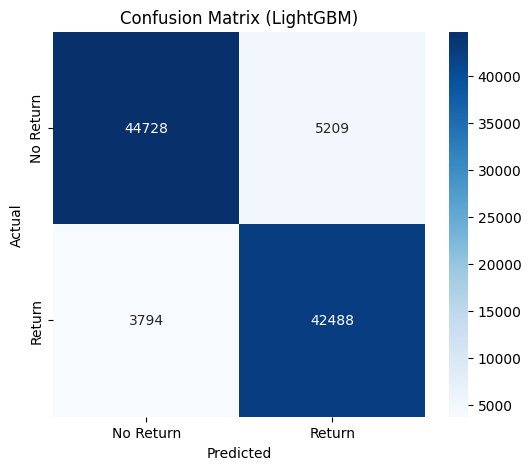

In [ ]:
import lightgbm as lgb
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# LightGBM Dataset vorbereiten
train_data = lgb.Dataset(X_train, label=y_train)
test_data = lgb.Dataset(X_test, label=y_test)

# LightGBM Parameter einstellen
params = {
    'objective': 'binary',            # Binäre Klassifikation
    'metric': ['binary_logloss', 'auc'],  # Logloss und AUC als Metriken
    'boosting_type': 'gbdt',          # Gradient Boosting
    'num_leaves': 31,                 # Maximale Anzahl der Blätter
    'learning_rate': 0.1,             # Lernrate
    'verbose': -1                     # Kein Logging
}

# Training mit Early Stopping über Callbacks
callbacks = [lgb.early_stopping(stopping_rounds=10, verbose=True)]

lgb_model = lgb.train(
    params,
    train_data,
    valid_sets=[test_data],
    num_boost_round=100,
    callbacks=callbacks
)

# Vorhersagen auf Testdaten
y_pred_proba = lgb_model.predict(X_test, num_iteration=lgb_model.best_iteration)
y_pred = (y_pred_proba >= 0.5).astype(int)

# Performance berechnen
print("LightGBM Performance auf Testdaten:")
print(f"Accuracy: {accuracy_score(y_test, y_pred):.4f}")
print(f"Precision: {precision_score(y_test, y_pred):.4f}")
print(f"Recall: {recall_score(y_test, y_pred):.4f}")
print(f"F1 Score: {f1_score(y_test, y_pred):.4f}")

# Confusion Matrix plotten
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Return', 'Return'], yticklabels=['No Return', 'Return'])
plt.title('Confusion Matrix (LightGBM)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


In [ ]:
# LightGBM-Modell speichern
lgb_model.save_model('lightgbm_model.txt')
print("LightGBM-Modell wurde erfolgreich gespeichert.")


LightGBM-Modell wurde erfolgreich gespeichert.


In [ ]:
import pickle

# LightGBM-Modell speichern
with open('lightgbm_model.pkl', 'wb') as file:
    pickle.dump(lgb_model, file)
print("LightGBM-Modell wurde als 'lightgbm_model.pkl' gespeichert.")

# LightGBM-Modell laden
with open('lightgbm_model.pkl', 'rb') as file:
    loaded_lgb_model = pickle.load(file)
print("LightGBM-Modell wurde erfolgreich geladen.")


LightGBM-Modell wurde als 'lightgbm_model.pkl' gespeichert.
LightGBM-Modell wurde erfolgreich geladen.


In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from xgboost import XGBClassifier
import numpy as np

# Parameterverteilung inkl. gamma
param_distributions = {
    'n_estimators': np.arange(100, 500, 50),    # Anzahl der Bäume
    'max_depth': np.arange(3, 10, 1),           # Maximale Tiefe der Bäume
    'learning_rate': np.linspace(0.01, 0.2, 10),# Lernrate
    'subsample': [0.7, 0.8, 0.9, 1.0],          # Anteil der Daten pro Baum
    'colsample_bytree': [0.7, 0.8, 0.9, 1.0],   # Anteil der Features pro Baum
    'scale_pos_weight': [1, 2, 3],              # Gewicht der positiven Klasse
    'gamma': np.linspace(0, 5, 10)              # Gamma-Werte zur Kontrolle von Splits
}

# RandomizedSearchCV
random_search = RandomizedSearchCV(
    estimator=XGBClassifier(random_state=42),
    param_distributions=param_distributions,
    n_iter=50,  # Anzahl der Iterationen
    scoring='f1',
    cv=3,
    verbose=2,
    random_state=42
)

# Training
random_search.fit(X_train, y_train)

# Beste Parameter und F1-Score ausgeben
print("Beste Parameter:", random_search.best_params_)
print("Beste F1-Score:", random_search.best_score_)


Fitting 3 folds for each of 50 candidates, totalling 150 fits
[CV] END colsample_bytree=0.8, gamma=4.444444444444445, learning_rate=0.03111111111111111, max_depth=6, n_estimators=250, scale_pos_weight=1, subsample=0.9; total time=  32.6s
[CV] END colsample_bytree=0.8, gamma=4.444444444444445, learning_rate=0.03111111111111111, max_depth=6, n_estimators=250, scale_pos_weight=1, subsample=0.9; total time=  32.5s
[CV] END colsample_bytree=0.8, gamma=4.444444444444445, learning_rate=0.03111111111111111, max_depth=6, n_estimators=250, scale_pos_weight=1, subsample=0.9; total time=  27.6s
[CV] END colsample_bytree=0.9, gamma=0.5555555555555556, learning_rate=0.1788888888888889, max_depth=6, n_estimators=400, scale_pos_weight=3, subsample=1.0; total time=  25.9s
[CV] END colsample_bytree=0.9, gamma=0.5555555555555556, learning_rate=0.1788888888888889, max_depth=6, n_estimators=400, scale_pos_weight=3, subsample=1.0; total time=   6.2s
[CV] END colsample_bytree=0.9, gamma=0.5555555555555556, l

In [ ]:
!pip install bayesian-optimization
  # Install the module
from bayes_opt import BayesianOptimization # Import after installation
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score
import numpy as np

# Definiere die Bewertungsfunktion
def xgb_evaluate(n_estimators, max_depth, learning_rate, subsample, colsample_bytree, gamma):
    model = XGBClassifier(
        random_state=42,
        n_estimators=int(n_estimators),
        max_depth=int(max_depth),
        learning_rate=learning_rate,
        subsample=subsample,
        colsample_bytree=colsample_bytree,
        gamma=gamma,
        eval_metric='logloss'
    )
    scores = cross_val_score(model, X_train, y_train, cv=5, scoring='f1')
    return np.mean(scores)

# Definiere den Hyperparameter-Bereich
param_bounds = {
    'n_estimators': (100, 500),
    'max_depth': (3, 10),
    'learning_rate': (0.01, 0.2),
    'subsample': (0.5, 1.0),
    'colsample_bytree': (0.5, 1.0),
    'gamma': (0, 5)
}

# Initialisiere Bayesian Optimization
optimizer = BayesianOptimization(
    f=xgb_evaluate,
    pbounds=param_bounds,
    random_state=42,
    verbose=2
)

# Starte die Optimierung
optimizer.maximize(init_points=10, n_iter=50)

# Zeige die besten Parameter an
print("Beste Parameter:", bayes_search.best_params_)
print("Beste F1-Score:", bayes_search.best_score_)

|   iter    |  target   | colsam... |   gamma   | learni... | max_depth | n_esti... | subsample |
-------------------------------------------------------------------------------------------------
| 1         | 0.8346    | 0.6873    | 4.754     | 0.1491    | 7.191     | 162.4     | 0.578     |
| 2         | 0.8342    | 0.529     | 4.331     | 0.1242    | 7.957     | 108.2     | 0.985     |
| 3         | 0.8298    | 0.9162    | 1.062     | 0.04455   | 4.284     | 221.7     | 0.7624    |
| 4         | 0.8336    | 0.716     | 1.456     | 0.1263    | 3.976     | 216.9     | 0.6832    |
| 5         | 0.8353    | 0.728     | 3.926     | 0.04794   | 6.6       | 337.0     | 0.5232    |
| 6         | 0.8356    | 0.8038    | 0.8526    | 0.02236   | 9.642     | 486.3     | 0.9042    |
| 7         | 0.8345    | 0.6523    | 0.4884    | 0.14      | 6.081     | 148.8     | 0.7476    |
| 8         | 0.8344    | 0.5172    | 4.547     | 0.05917   | 7.638     | 224.7     | 0.76      |
| 9         | 0.8271

NameError: name 'bayes_search' is not defined

In [ ]:
print("Beste Parameter:", optimizer.max['params'])
print("Beste F1-Score:", optimizer.max['target'])


Beste Parameter: {'colsample_bytree': 0.9589985949286824, 'gamma': 4.615054185696078, 'learning_rate': 0.05697918659879157, 'max_depth': 9.602083186274047, 'n_estimators': 232.5557387669319, 'subsample': 0.9474606884956508}
Beste F1-Score: 0.8359839709677631


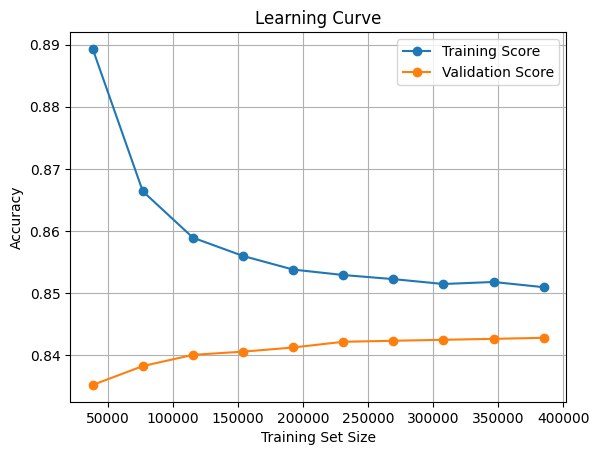

In [ ]:
from sklearn.model_selection import learning_curve
import matplotlib.pyplot as plt

train_sizes, train_scores, test_scores = learning_curve(
    xgb_model, X, y, cv=5, scoring='accuracy', n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10)
)

plt.figure()
plt.plot(train_sizes, np.mean(train_scores, axis=1), label='Training Score', marker='o')
plt.plot(train_sizes, np.mean(test_scores, axis=1), label='Validation Score', marker='o')
plt.xlabel('Training Set Size')
plt.ylabel('Accuracy')
plt.title('Learning Curve')
plt.legend()
plt.grid(True)
plt.show()
#item_rto

Bias: 0.0723
Variance: 0.0189


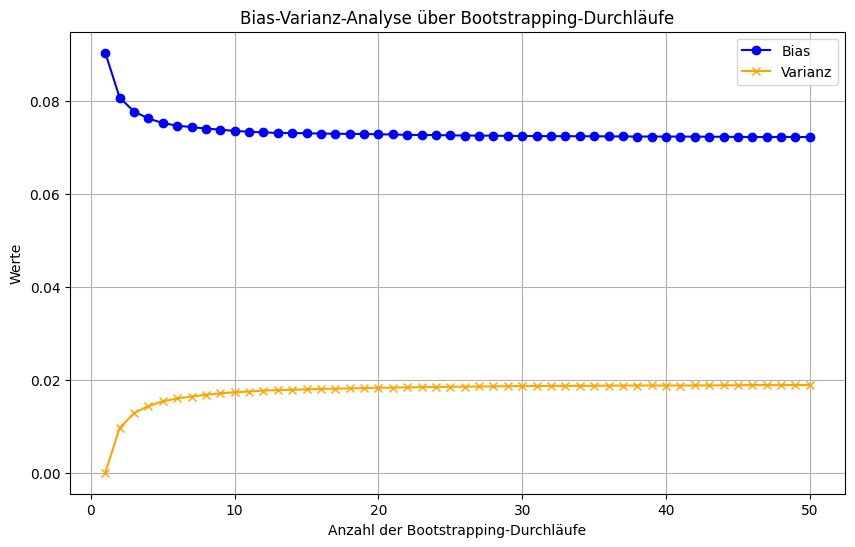

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier

# Definiere die Daten und das Ziel
X = df13[['age', 'deliveryTime', 'price', 'category_count', 'manufacturer_count',
                   'count_without_size', 'similar_product_count_size_color', 'count_without_color',
                   'total_products_in_cart', 'return_rate_size_product_category', 'return_rate_color',
                   'category_variation', 'free_return', 'average_cart_value', 'discount_percentage',
                   'discount_rank', 'price_rank', 'product_category_encoded', 'availability_season_Summer',
                   'availability_season_Winter', 'availability_season_Spring',
                   'duplicate_flag_by_cust_date_cat_size', 'duplicate_flag_by_cust_date_item',
                   'return_count', 'order_diff', 'duplicate_item_return_rate',
                   'customer_return_rate', 'duplicate_flag_by_cust_date_cat_size_return_rate','log_likelihood_ratio_by_price',
       'log_likelihood_ratio_by_customer_and_price']]
y = df13['returnShipment']

# Splitte die Daten in Training- und Testsets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialisiere das Modell
xgb_model = XGBClassifier(random_state=42)

# Liste, um Bootstrapping-Ergebnisse zu speichern
n_bootstrap = 50  # Anzahl der Bootstrapping-Durchläufe
predictions = np.zeros((n_bootstrap, len(y_test)))
actual = y_test.to_numpy()

# Listen zur Speicherung von Bias und Varianz
bias_list = []
variance_list = []

# Bootstrapping
for i in range(n_bootstrap):
    # Erstelle einen Bootstrap-Datensatz
    bootstrap_indices = np.random.choice(range(len(X_train)), size=len(X_train), replace=True)
    X_train_bootstrap = X_train.iloc[bootstrap_indices]
    y_train_bootstrap = y_train.iloc[bootstrap_indices]

    # Trainiere das Modell
    xgb_model.fit(X_train_bootstrap, y_train_bootstrap)

    # Vorhersagen auf dem Testset
    predictions[i] = xgb_model.predict(X_test)

    # Durchschnittliche Vorhersagen bis zur aktuellen Iteration
    avg_prediction = np.mean(predictions[:i+1], axis=0)

    # Berechne Bias und Varianz
    bias = np.mean((avg_prediction - actual) ** 2)
    variance = np.mean(np.var(predictions[:i+1], axis=0))

    # Speichere die Ergebnisse
    bias_list.append(bias)
    variance_list.append(variance)
# Zeige Bias und Varianz an
print(f"Bias: {bias:.4f}")
print(f"Variance: {variance:.4f}")

# -----------------
# Visualisierung
# -----------------

# Liniendiagramm für Bias und Varianz
plt.figure(figsize=(10, 6))
plt.plot(range(1, n_bootstrap + 1), bias_list, label='Bias', color='blue', marker='o')
plt.plot(range(1, n_bootstrap + 1), variance_list, label='Varianz', color='orange', marker='x')
plt.title('Bias-Varianz-Analyse über Bootstrapping-Durchläufe')
plt.xlabel('Anzahl der Bootstrapping-Durchläufe')
plt.ylabel('Werte')
plt.legend()
plt.grid()
plt.show()
#item_rto_percentage

Bias: 0.1331
Variance: 0.0286


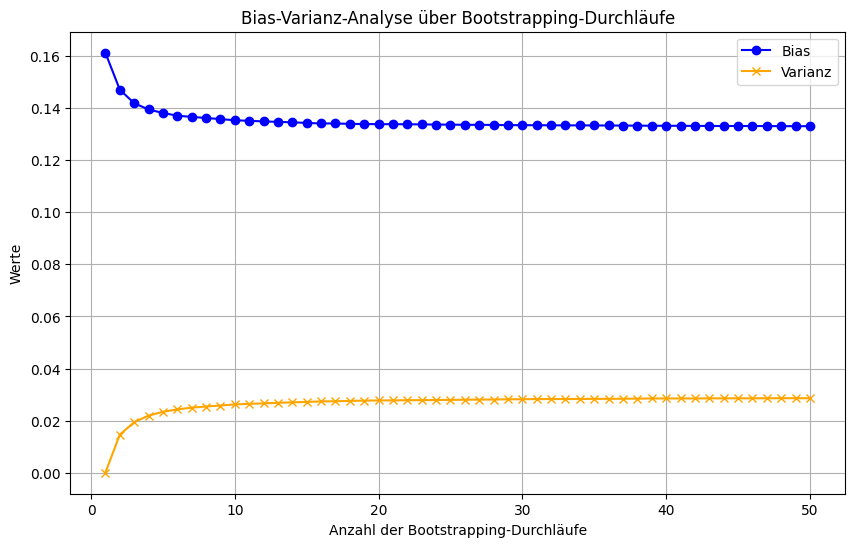

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier

# Definiere die Daten und das Ziel
X = df13[['age', 'deliveryTime', 'price','category_count','manufacturer_count','count_without_size','similar_product_count_size_color',
          'count_without_color','total_products_in_cart','return_rate_size_product_category','return_rate_color',
          'category_variation','free_return','average_cart_value', 'discount_percentage', 'discount_rank',
          'price_rank',	'product_category_encoded','availability_season_Summer',	'availability_season_Winter','availability_season_Spring',
          'duplicate_flag_by_cust_date_cat_size','duplicate_flag_by_cust_date_item','return_count','order_diff','duplicate_item_return_rate',
          'customer_return_rate','duplicate_flag_by_cust_date_cat_size_return_rate','holiday_class_category_encoded','is_holiday']]
y = df13['returnShipment']

# Splitte die Daten in Training- und Testsets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialisiere das Modell
xgb_model = XGBClassifier(random_state=42)

# Liste, um Bootstrapping-Ergebnisse zu speichern
n_bootstrap = 50  # Anzahl der Bootstrapping-Durchläufe
predictions = np.zeros((n_bootstrap, len(y_test)))
actual = y_test.to_numpy()

# Listen zur Speicherung von Bias und Varianz
bias_list = []
variance_list = []

# Bootstrapping
for i in range(n_bootstrap):
    # Erstelle einen Bootstrap-Datensatz
    bootstrap_indices = np.random.choice(range(len(X_train)), size=len(X_train), replace=True)
    X_train_bootstrap = X_train.iloc[bootstrap_indices]
    y_train_bootstrap = y_train.iloc[bootstrap_indices]

    # Trainiere das Modell
    xgb_model.fit(X_train_bootstrap, y_train_bootstrap)

    # Vorhersagen auf dem Testset
    predictions[i] = xgb_model.predict(X_test)

    # Durchschnittliche Vorhersagen bis zur aktuellen Iteration
    avg_prediction = np.mean(predictions[:i+1], axis=0)

    # Berechne Bias und Varianz
    bias = np.mean((avg_prediction - actual) ** 2)
    variance = np.mean(np.var(predictions[:i+1], axis=0))

    # Speichere die Ergebnisse
    bias_list.append(bias)
    variance_list.append(variance)
# Zeige Bias und Varianz an
print(f"Bias: {bias:.4f}")
print(f"Variance: {variance:.4f}")

# -----------------
# Visualisierung
# -----------------

# Liniendiagramm für Bias und Varianz
plt.figure(figsize=(10, 6))
plt.plot(range(1, n_bootstrap + 1), bias_list, label='Bias', color='blue', marker='o')
plt.plot(range(1, n_bootstrap + 1), variance_list, label='Varianz', color='orange', marker='x')
plt.title('Bias-Varianz-Analyse über Bootstrapping-Durchläufe')
plt.xlabel('Anzahl der Bootstrapping-Durchläufe')
plt.ylabel('Werte')
plt.legend()
plt.grid()
plt.show()
#item_rto_percentage

Bias: 0.1331
Variance: 0.0284


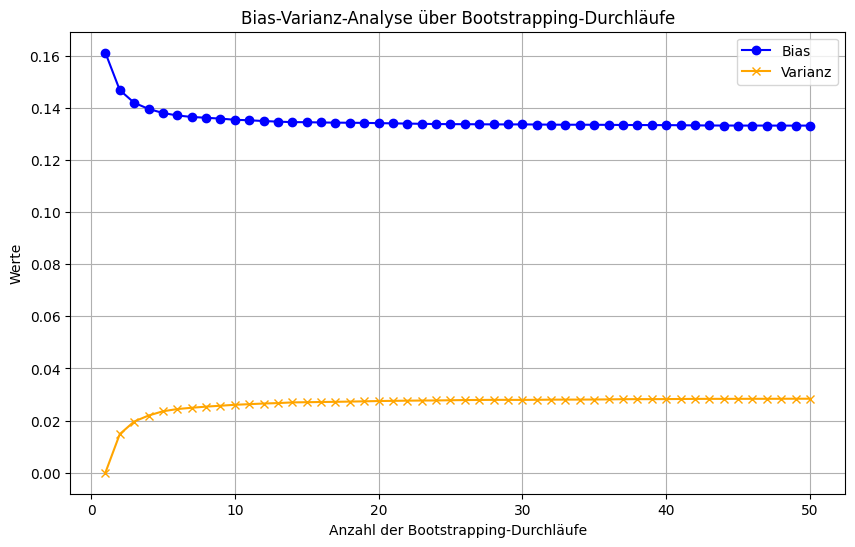

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier

# Definiere die Daten und das Ziel
X = df13[['age', 'deliveryTime', 'price','category_count','manufacturer_count','count_without_size','similar_product_count_size_color',
          'count_without_color','total_products_in_cart','return_rate_size_product_category','return_rate_color',
          'category_variation','free_return','average_cart_value', 'discount_percentage', 'discount_rank',
       'price_rank',	'product_category_encoded','availability_season_Summer',	'availability_season_Winter','availability_season_Spring',
          'duplicate_flag_by_cust_date_cat_size','duplicate_flag_by_cust_date_item','return_count','order_diff','duplicate_item_return_rate',
          'customer_return_rate','duplicate_flag_by_cust_date_cat_size_return_rate']]
y = df13['returnShipment']

# Splitte die Daten in Training- und Testsets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialisiere das Modell
xgb_model = XGBClassifier(random_state=42)

# Liste, um Bootstrapping-Ergebnisse zu speichern
n_bootstrap = 50  # Anzahl der Bootstrapping-Durchläufe
predictions = np.zeros((n_bootstrap, len(y_test)))
actual = y_test.to_numpy()

# Listen zur Speicherung von Bias und Varianz
bias_list = []
variance_list = []

# Bootstrapping
for i in range(n_bootstrap):
    # Erstelle einen Bootstrap-Datensatz
    bootstrap_indices = np.random.choice(range(len(X_train)), size=len(X_train), replace=True)
    X_train_bootstrap = X_train.iloc[bootstrap_indices]
    y_train_bootstrap = y_train.iloc[bootstrap_indices]

    # Trainiere das Modell
    xgb_model.fit(X_train_bootstrap, y_train_bootstrap)

    # Vorhersagen auf dem Testset
    predictions[i] = xgb_model.predict(X_test)

    # Durchschnittliche Vorhersagen bis zur aktuellen Iteration
    avg_prediction = np.mean(predictions[:i+1], axis=0)

    # Berechne Bias und Varianz
    bias = np.mean((avg_prediction - actual) ** 2)
    variance = np.mean(np.var(predictions[:i+1], axis=0))

    # Speichere die Ergebnisse
    bias_list.append(bias)
    variance_list.append(variance)
# Zeige Bias und Varianz an
print(f"Bias: {bias:.4f}")
print(f"Variance: {variance:.4f}")

# -----------------
# Visualisierung
# -----------------

# Liniendiagramm für Bias und Varianz
plt.figure(figsize=(10, 6))
plt.plot(range(1, n_bootstrap + 1), bias_list, label='Bias', color='blue', marker='o')
plt.plot(range(1, n_bootstrap + 1), variance_list, label='Varianz', color='orange', marker='x')
plt.title('Bias-Varianz-Analyse über Bootstrapping-Durchläufe')
plt.xlabel('Anzahl der Bootstrapping-Durchläufe')
plt.ylabel('Werte')
plt.legend()
plt.grid()
plt.show()
#item_rto_percentage

Bias: 0.1541
Variance: 0.0278


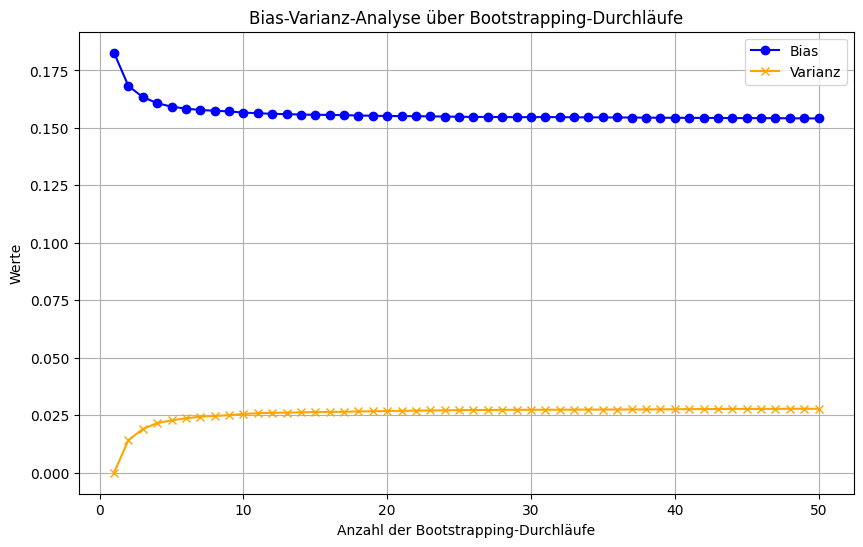

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier

# Definiere die Daten und das Ziel
X = df13[['age', 'deliveryTime', 'price','category_count','manufacturer_count','count_without_size','similar_product_count_size_color',
          'count_without_color','total_products_in_cart','return_rate_size_product_category','return_rate_color',
          'category_variation','free_return','average_cart_value','return_count','order_diff', 'discount_percentage', 'discount_rank',
       'price_rank',	'product_category_encoded','availability_season_Summer',	'availability_season_Winter','availability_season_Spring','duplicate_item_return_rate']]
y = df13['returnShipment']

# Splitte die Daten in Training- und Testsets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialisiere das Modell
xgb_model = XGBClassifier(random_state=42)

# Liste, um Bootstrapping-Ergebnisse zu speichern
n_bootstrap = 50  # Anzahl der Bootstrapping-Durchläufe
predictions = np.zeros((n_bootstrap, len(y_test)))
actual = y_test.to_numpy()

# Listen zur Speicherung von Bias und Varianz
bias_list = []
variance_list = []

# Bootstrapping
for i in range(n_bootstrap):
    # Erstelle einen Bootstrap-Datensatz
    bootstrap_indices = np.random.choice(range(len(X_train)), size=len(X_train), replace=True)
    X_train_bootstrap = X_train.iloc[bootstrap_indices]
    y_train_bootstrap = y_train.iloc[bootstrap_indices]

    # Trainiere das Modell
    xgb_model.fit(X_train_bootstrap, y_train_bootstrap)

    # Vorhersagen auf dem Testset
    predictions[i] = xgb_model.predict(X_test)

    # Durchschnittliche Vorhersagen bis zur aktuellen Iteration
    avg_prediction = np.mean(predictions[:i+1], axis=0)

    # Berechne Bias und Varianz
    bias = np.mean((avg_prediction - actual) ** 2)
    variance = np.mean(np.var(predictions[:i+1], axis=0))

    # Speichere die Ergebnisse
    bias_list.append(bias)
    variance_list.append(variance)
# Zeige Bias und Varianz an
print(f"Bias: {bias:.4f}")
print(f"Variance: {variance:.4f}")

# -----------------
# Visualisierung
# -----------------

# Liniendiagramm für Bias und Varianz
plt.figure(figsize=(10, 6))
plt.plot(range(1, n_bootstrap + 1), bias_list, label='Bias', color='blue', marker='o')
plt.plot(range(1, n_bootstrap + 1), variance_list, label='Varianz', color='orange', marker='x')
plt.title('Bias-Varianz-Analyse über Bootstrapping-Durchläufe')
plt.xlabel('Anzahl der Bootstrapping-Durchläufe')
plt.ylabel('Werte')
plt.legend()
plt.grid()
plt.show()
#item_rto_percentage

Bias Werte:
[0.18205344058865713, 0.16814246666458807, 0.16267750305726172, 0.16024641702782194, 0.15882684293122978, 0.1578537272033359, 0.15716803355270956, 0.15686058626674565, 0.15654694107667708, 0.15634593999106206, 0.15606589272629526, 0.15574662719652274, 0.15560692997501815, 0.1553458723307862, 0.15526224319290138, 0.1550883027910288, 0.15498568343101096, 0.15488470938018326, 0.1548322402446473, 0.15476501522568306, 0.15474190244246055, 0.15473857889100961, 0.15469489291825236, 0.15467602624683735, 0.15462723994221517, 0.15458436132907108, 0.15455059503532256, 0.15446463170433267, 0.15442086454109302, 0.15441395843509773, 0.15442384356905023, 0.15439886604711647, 0.15437364435247106, 0.1542925378815218, 0.15431462791832662, 0.15426497314061965, 0.15423389169935267, 0.15420989352573145, 0.15418741320710147, 0.15418653020713166, 0.15415916863608886, 0.15414658156884595, 0.1541442121306434, 0.1541305210762741, 0.15408816230566613, 0.1541056426668125, 0.15406660745456605, 0.154042

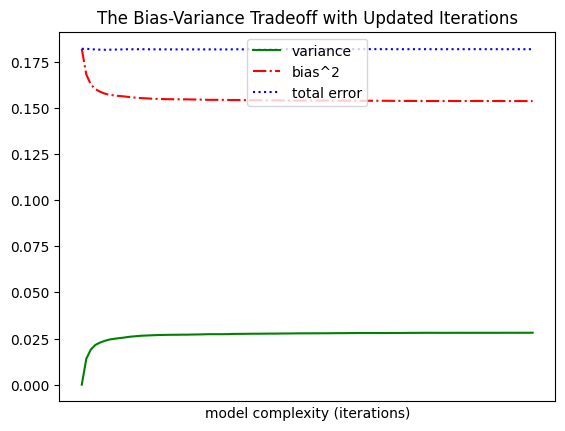

In [ ]:
# Definition von X und y
X = df13[['age', 'deliveryTime', 'price', 'category_count', 'manufacturer_count', 'count_without_size',
          'similar_product_count_size_color', 'count_without_color', 'total_products_in_cart',
          'return_rate_size_product_category', 'return_rate_color', 'category_variation', 'free_return',
          'average_cart_value', 'return_count', 'order_diff', 'discount_percentage', 'discount_rank',
          'price_rank', 'product_category_encoded', 'availability_season_Summer', 'availability_season_Winter',
          'availability_season_Spring', 'duplicate_item_return_rate']]
y = df13['returnShipment']

# Import und Split der Daten
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBClassifier

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialisiere das Modell
xgb_model = XGBClassifier(random_state=42)

# Liste, um Bootstrapping-Ergebnisse zu speichern
n_bootstrap_new = 100  # Anzahl der Bootstrapping-Durchläufe erhöhen
predictions_new = np.zeros((n_bootstrap_new, len(y_test)))
bias_list_new = []
variance_list_new = []

for i in range(n_bootstrap_new):
    # Erstelle einen neuen Bootstrap-Datensatz
    bootstrap_indices = np.random.choice(range(len(X_train)), size=len(X_train), replace=True)
    X_train_bootstrap = X_train.iloc[bootstrap_indices]
    y_train_bootstrap = y_train.iloc[bootstrap_indices]

    # Trainiere das Modell
    xgb_model.fit(X_train_bootstrap, y_train_bootstrap)

    # Vorhersagen auf dem Testset
    predictions_new[i] = xgb_model.predict(X_test)

    # Durchschnittliche Vorhersagen bis zur aktuellen Iteration
    avg_prediction = np.mean(predictions_new[:i+1], axis=0)

    # Berechne Bias und Variance
    bias = np.mean((avg_prediction - y_test.to_numpy()) ** 2)
    variance = np.mean(np.var(predictions_new[:i+1], axis=0))

    # Speichere die Ergebnisse
    bias_list_new.append(bias)
    variance_list_new.append(variance)

# Berechnete Werte für Bias, Variance und Total Error prüfen
print("Bias Werte:")
print(bias_list_new)
print("\nVariance Werte:")
print(variance_list_new)
print("\nTotal Error Werte:")
total_error_new = [b + v for b, v in zip(bias_list_new, variance_list_new)]
print(total_error_new)

# Visualisierung der aktualisierten Werte
xs_new = list(range(len(bias_list_new)))

plt.plot(xs_new, variance_list_new, 'g-', label='variance')  # Grüne Linie für Variance
plt.plot(xs_new, bias_list_new, 'r-.', label='bias^2')  # Rote gestrichelte Linie für Bias^2
plt.plot(xs_new, total_error_new, 'b:', label='total error')  # Blaue gepunktete Linie für Total Error

plt.legend(loc=9)  # Legende oben zentriert
plt.xlabel("model complexity (iterations)")
plt.xticks([])  # Keine spezifischen xticks
plt.title("The Bias-Variance Tradeoff with Updated Iterations")
plt.show()


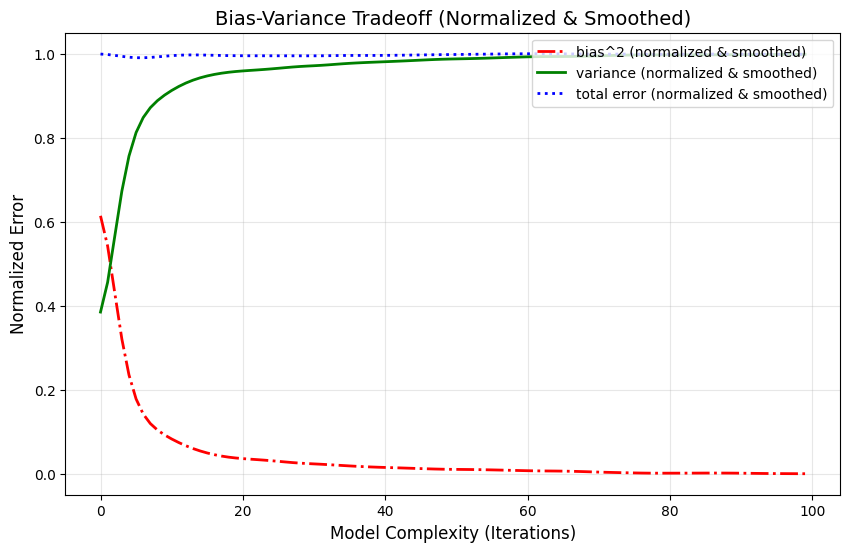

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d

# Normiere die Bias- und Variance-Werte auf eine Skala von 0 bis 1
bias_list_normalized = (np.array(bias_list_new) - np.min(bias_list_new)) / (np.max(bias_list_new) - np.min(bias_list_new))
variance_list_normalized = (np.array(variance_list_new) - np.min(variance_list_new)) / (np.max(variance_list_new) - np.min(variance_list_new))
total_error_normalized = bias_list_normalized + variance_list_normalized

# Glätte die Daten mit einem Gaussian Filter
bias_smoothed = gaussian_filter1d(bias_list_normalized, sigma=2)
variance_smoothed = gaussian_filter1d(variance_list_normalized, sigma=2)
total_error_smoothed = gaussian_filter1d(total_error_normalized, sigma=2)

# Visualisierung
plt.figure(figsize=(10, 6))

# Plot für Bias, Variance und Total Error
plt.plot(bias_smoothed, 'r-.', label='bias^2 (normalized & smoothed)', linewidth=2)  # Rote gestrichelte Linie für Bias
plt.plot(variance_smoothed, 'g-', label='variance (normalized & smoothed)', linewidth=2)  # Grüne durchgezogene Linie für Variance
plt.plot(total_error_smoothed, 'b:', label='total error (normalized & smoothed)', linewidth=2)  # Blaue gepunktete Linie für Total Error

# Beschriftung und Titel
plt.legend(loc='upper right', fontsize=10)  # Legende oben rechts
plt.xlabel('Model Complexity (Iterations)', fontsize=12)
plt.ylabel('Normalized Error', fontsize=12)
plt.title('Bias-Variance Tradeoff (Normalized & Smoothed)', fontsize=14)
plt.grid(alpha=0.3)

# Zeige den Plot
plt.show()


In [ ]:
from sklearn.model_selection import RandomizedSearchCV
import numpy as np

# Parameterbereich für Random Search
param_dist = {
    'max_depth': np.arange(3, 10),                # Baumtiefe
    'learning_rate': np.linspace(0.01, 0.3, 10), # Lernrate
    'n_estimators': np.arange(50, 300, 50),      # Anzahl der Bäume
    'subsample': np.linspace(0.6, 1.0, 5),       # Anteil der Daten
    'colsample_bytree': np.linspace(0.6, 1.0, 5),# Anteil der Features
    'gamma': np.linspace(0, 5, 5),               # Mindestverlustreduktion
    'reg_alpha': np.logspace(-3, 1, 5),          # L1-Regularisierung
    'reg_lambda': np.logspace(-3, 1, 5),         # L2-Regularisierung
}

# Randomized Search Initialisieren
random_search = RandomizedSearchCV(estimator=xgb_model, param_distributions=param_dist, n_iter=50, cv=3, scoring='f1', verbose=1, n_jobs=-1, random_state=42)

# Training
random_search.fit(X_train, y_train)

# Beste Parameter und Score
print("Beste Parameter:", random_search.best_params_)
print("Bester F1-Score:", random_search.best_score_)


Fitting 3 folds for each of 50 candidates, totalling 150 fits
Beste Parameter: {'subsample': 0.6, 'reg_lambda': 0.01, 'reg_alpha': 10.0, 'n_estimators': 200, 'max_depth': 8, 'learning_rate': 0.1711111111111111, 'gamma': 3.75, 'colsample_bytree': 0.6}
Bester F1-Score: 0.8164997945046456


In [ ]:
best_params = {'subsample': 0.6, 'reg_lambda': 0.01, 'reg_alpha': 10.0, 'n_estimators': 200,
               'max_depth': 8, 'learning_rate': 0.1711, 'gamma': 3.75, 'colsample_bytree': 0.6}

final_model = XGBClassifier(**best_params, random_state=42)
final_model.fit(X_train, y_train)

# Evaluierung
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
y_pred = final_model.predict(X_test)
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))


Accuracy: 0.822373959405107
Precision: 0.8085924509477885
Recall: 0.8315271988885327
F1 Score: 0.8198994699516318


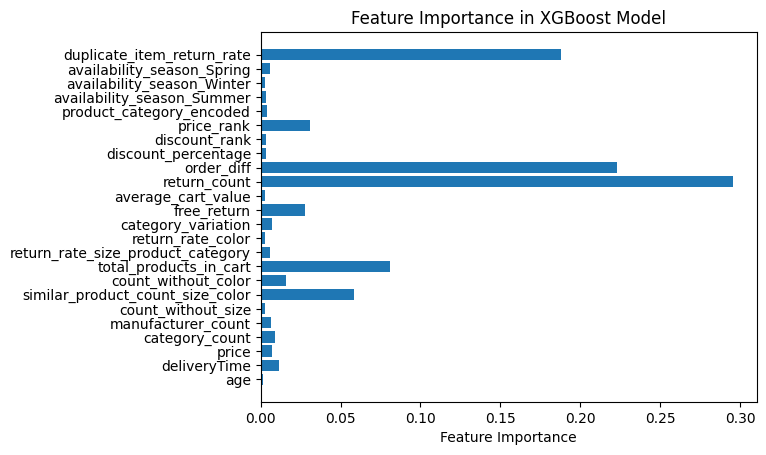

In [ ]:
import matplotlib.pyplot as plt
feature_importances = final_model.feature_importances_
plt.barh(X_train.columns, feature_importances)
plt.xlabel('Feature Importance')
plt.title('Feature Importance in XGBoost Model')
plt.show()


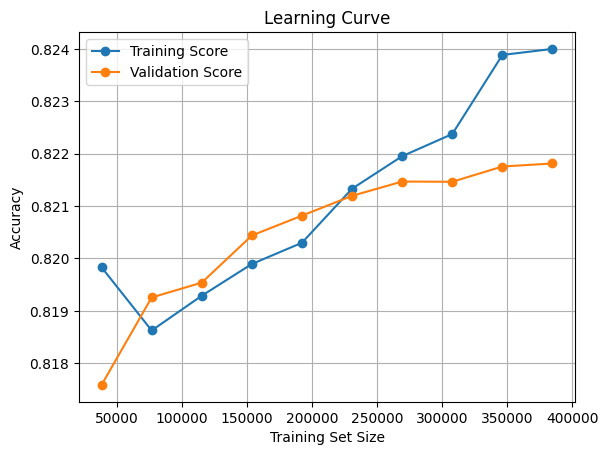

In [ ]:
# Definition von X und y
X = df13[['age', 'deliveryTime', 'price', 'category_count', 'manufacturer_count', 'count_without_size',
          'similar_product_count_size_color', 'count_without_color', 'total_products_in_cart',
          'return_rate_size_product_category', 'return_rate_color', 'category_variation', 'free_return',
          'average_cart_value', 'return_count', 'order_diff', 'discount_percentage', 'discount_rank',
          'price_rank', 'product_category_encoded', 'availability_season_Summer', 'availability_season_Winter',
          'availability_season_Spring', 'duplicate_item_return_rate']]
y = df13['returnShipment']

# Import und Split der Daten
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBClassifier

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Beste Parameter aus Hyperparameter-Tuning
best_params = {
    'subsample': 0.6,
    'reg_lambda': 0.01,
    'reg_alpha': 10.0,
    'n_estimators': 200,
    'max_depth': 8,
    'learning_rate': 0.1711,
    'gamma': 3.75,
    'colsample_bytree': 0.6
}

from sklearn.model_selection import learning_curve
import matplotlib.pyplot as plt

# Initialisiere das Modell mit den besten Parametern
xgb_model = XGBClassifier(**best_params, random_state=42)
train_sizes, train_scores, test_scores = learning_curve(
    xgb_model, X, y, cv=5, scoring='accuracy', n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 10)
)

plt.figure()
plt.plot(train_sizes, np.mean(train_scores, axis=1), label='Training Score', marker='o')
plt.plot(train_sizes, np.mean(test_scores, axis=1), label='Validation Score', marker='o')
plt.xlabel('Training Set Size')
plt.ylabel('Accuracy')
plt.title('Learning Curve')
plt.legend()
plt.grid(True)
plt.show()
#item_rto

Bias Werte:
[0.17982934763404318, 0.16943119342333635, 0.1654489584524193, 0.16368583647720306, 0.16285764765794702, 0.16203631530386123, 0.16159797876061224, 0.1612115005872021, 0.16105286563997076, 0.16060320726675603, 0.16040791586067563, 0.16033475716854256, 0.16020836588819723, 0.16018692264733658, 0.16019002945826133, 0.16014191908562758, 0.16006769591471529, 0.15996022576583588, 0.15981723249699964, 0.15978941269395858, 0.15974822081872517, 0.15970183892650539, 0.15966970119421373, 0.1596748765258883, 0.15960174185971585, 0.1596229625574941, 0.1595407259311324, 0.15952203847897156, 0.15949395020492974, 0.15949693465485565, 0.1594913567523982, 0.15946552428574398, 0.15945346250644107, 0.15947290586486831, 0.1594494277616263, 0.15940239819424282, 0.1593705939771208, 0.15936844961167332, 0.15936338630960753, 0.1593458022843721, 0.15940693838680609, 0.15941945220911508, 0.1593718249029331, 0.15935628918671155, 0.15936731265955917, 0.15937888501874, 0.15938713843298785, 0.15941396998

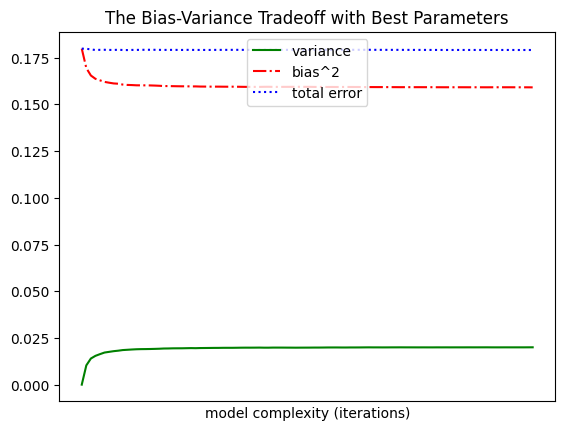

In [ ]:
# Definition von X und y
X = df13[['age', 'deliveryTime', 'price', 'category_count', 'manufacturer_count', 'count_without_size',
          'similar_product_count_size_color', 'count_without_color', 'total_products_in_cart',
          'return_rate_size_product_category', 'return_rate_color', 'category_variation', 'free_return',
          'average_cart_value', 'return_count', 'order_diff', 'discount_percentage', 'discount_rank',
          'price_rank', 'product_category_encoded', 'availability_season_Summer', 'availability_season_Winter',
          'availability_season_Spring', 'duplicate_item_return_rate']]
y = df13['returnShipment']

# Import und Split der Daten
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBClassifier

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Beste Parameter aus Hyperparameter-Tuning
best_params = {
    'subsample': 0.6,
    'reg_lambda': 0.01,
    'reg_alpha': 10.0,
    'n_estimators': 200,
    'max_depth': 8,
    'learning_rate': 0.1711,
    'gamma': 3.75,
    'colsample_bytree': 0.6
}

# Initialisiere das Modell mit den besten Parametern
xgb_model = XGBClassifier(**best_params, random_state=42)

# Liste, um Bootstrapping-Ergebnisse zu speichern
n_bootstrap_new = 100  # Anzahl der Bootstrapping-Durchläufe erhöhen
predictions_new = np.zeros((n_bootstrap_new, len(y_test)))
bias_list_new = []
variance_list_new = []

for i in range(n_bootstrap_new):
    # Erstelle einen neuen Bootstrap-Datensatz
    bootstrap_indices = np.random.choice(range(len(X_train)), size=len(X_train), replace=True)
    X_train_bootstrap = X_train.iloc[bootstrap_indices]
    y_train_bootstrap = y_train.iloc[bootstrap_indices]

    # Trainiere das Modell
    xgb_model.fit(X_train_bootstrap, y_train_bootstrap)

    # Vorhersagen auf dem Testset
    predictions_new[i] = xgb_model.predict(X_test)

    # Durchschnittliche Vorhersagen bis zur aktuellen Iteration
    avg_prediction = np.mean(predictions_new[:i+1], axis=0)

    # Berechne Bias und Variance
    bias = np.mean((avg_prediction - y_test.to_numpy()) ** 2)
    variance = np.mean(np.var(predictions_new[:i+1], axis=0))

    # Speichere die Ergebnisse
    bias_list_new.append(bias)
    variance_list_new.append(variance)

# Berechnete Werte für Bias, Variance und Total Error prüfen
print("Bias Werte:")
print(bias_list_new)
print("\nVariance Werte:")
print(variance_list_new)
print("\nTotal Error Werte:")
total_error_new = [b + v for b, v in zip(bias_list_new, variance_list_new)]
print(total_error_new)
# Zeige Bias und Varianz an
print(f"Bias: {bias:.4f}")
print(f"Variance: {variance:.4f}")

# Visualisierung der aktualisierten Werte
xs_new = list(range(len(bias_list_new)))

plt.plot(xs_new, variance_list_new, 'g-', label='variance')  # Grüne Linie für Variance
plt.plot(xs_new, bias_list_new, 'r-.', label='bias^2')  # Rote gestrichelte Linie für Bias^2
plt.plot(xs_new, total_error_new, 'b:', label='total error')  # Blaue gepunktete Linie für Total Error

plt.legend(loc=9)  # Legende oben zentriert
plt.xlabel("model complexity (iterations)")
plt.xticks([])  # Keine spezifischen xticks
plt.title("The Bias-Variance Tradeoff with Best Parameters")
plt.show()


In [ ]:
# Zeige Bias und Varianz an
print(f"Bias: {bias:.4f}")
print(f"Variance: {variance:.4f}")


Bias: 0.1591
Variance: 0.0200


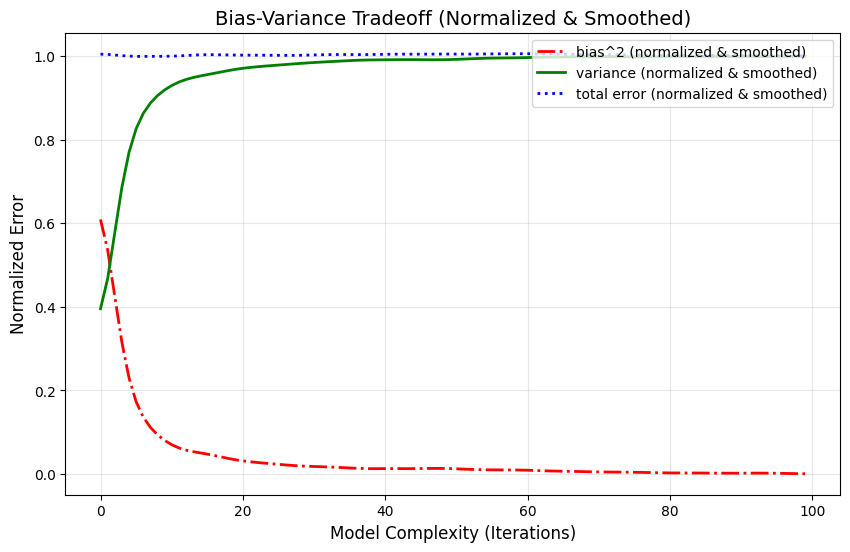

Bias: 0.1591
Variance: 0.0200


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter1d

# Normiere die Bias- und Variance-Werte auf eine Skala von 0 bis 1
bias_list_normalized = (np.array(bias_list_new) - np.min(bias_list_new)) / (np.max(bias_list_new) - np.min(bias_list_new))
variance_list_normalized = (np.array(variance_list_new) - np.min(variance_list_new)) / (np.max(variance_list_new) - np.min(variance_list_new))
total_error_normalized = bias_list_normalized + variance_list_normalized

# Glätte die Daten mit einem Gaussian Filter
bias_smoothed = gaussian_filter1d(bias_list_normalized, sigma=2)
variance_smoothed = gaussian_filter1d(variance_list_normalized, sigma=2)
total_error_smoothed = gaussian_filter1d(total_error_normalized, sigma=2)

# Visualisierung
plt.figure(figsize=(10, 6))

# Plot für Bias, Variance und Total Error
plt.plot(bias_smoothed, 'r-.', label='bias^2 (normalized & smoothed)', linewidth=2)  # Rote gestrichelte Linie für Bias
plt.plot(variance_smoothed, 'g-', label='variance (normalized & smoothed)', linewidth=2)  # Grüne durchgezogene Linie für Variance
plt.plot(total_error_smoothed, 'b:', label='total error (normalized & smoothed)', linewidth=2)  # Blaue gepunktete Linie für Total Error

# Beschriftung und Titel
plt.legend(loc='upper right', fontsize=10)  # Legende oben rechts
plt.xlabel('Model Complexity (Iterations)', fontsize=12)
plt.ylabel('Normalized Error', fontsize=12)
plt.title('Bias-Variance Tradeoff (Normalized & Smoothed)', fontsize=14)
plt.grid(alpha=0.3)

# Zeige den Plot
plt.show()
# Zeige Bias und Varianz an
print(f"Bias: {bias:.4f}")
print(f"Variance: {variance:.4f}")



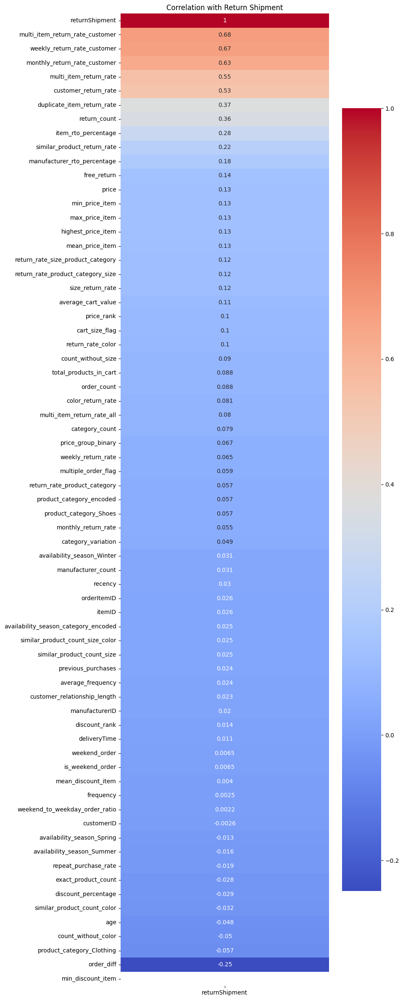

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Ensure 'returnShipment' is of numeric type
df13['returnShipment'] = df13['returnShipment'].astype(float)

# Select only numeric columns for the correlation matrix, ensuring 'returnShipment' is included
numeric_df = df13.select_dtypes(include=['float64', 'int64', 'int32', 'int16', 'int8'])

# Exclude 'average_return_time' from the correlation matrix
if 'average_return_time' in numeric_df.columns:
    numeric_df = numeric_df.drop(columns=['average_return_time'])

# Calculate the correlation matrix
corr_matrix = numeric_df.corr()

# Plot the correlation with returnShipment
if 'returnShipment' in corr_matrix.columns:
    plt.figure(figsize=(8, 30))  # Customize the size of the chart here
    sns.heatmap(
        corr_matrix[['returnShipment']].sort_values(by='returnShipment', ascending=False),
        annot=True,
        cmap='coolwarm'
    )
    plt.title('Correlation with Return Shipment')
    plt.show()
else:
    print("Column 'returnShipment' is not in the correlation matrix.")


In [ ]:
df13.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 481092 entries, 0 to 481091
Data columns (total 78 columns):
 #   Column                             Non-Null Count   Dtype         
---  ------                             --------------   -----         
 0   orderItemID                        481092 non-null  int32         
 1   orderDate                          481092 non-null  datetime64[ns]
 2   deliveryDate                       437013 non-null  datetime64[ns]
 3   itemID                             481092 non-null  int64         
 4   size                               481092 non-null  object        
 5   color                              481092 non-null  category      
 6   manufacturerID                     481092 non-null  int32         
 7   price                              481092 non-null  float64       
 8   customerID                         481092 non-null  int32         
 9   salutation                         481092 non-null  category      
 10  dateOfBirth         

# Creat excel

In [ ]:
# Define the output file path
output_path = r'df13.xlsx'

# Save df9 as an Excel file without the index column
df13.to_excel(output_path, index=False)

print(f"df10 has been saved as an Excel file at {output_path}")


df10 has been saved as an Excel file at df13.xlsx


In [ ]:
# Define the output file path
output_path = r'df13_all_dataset.parquet'

# Save df9 as a Parquet file
df13.to_parquet(output_path, index=False)

print(f"df13 has been saved as a Parquet file at {output_path}")


df13 has been saved as a Parquet file at df13_all_dataset.parquet


In [ ]:
df13

,orderItemID,orderDate,deliveryDate,itemID,size,color,manufacturerID,price,customerID,dateOfBirth,state,creationDate,returnShipment,non_null_delivery_count,unique_delivery_dates,deliveryTime,age,color_miss,color_hex,color_rgb,r,g,b,size_false,customer_return_rate,item_rto_percentage,manufacturer_rto_percentage,order_count,return_count,duplicate_item_return_rate,multiple_order_flag,similar_product_count_size,similar_product_count_color,similar_product_return_rate,product_category,international_size,size_category,size_category_encoded,international_UK_size,sub_category,target_group,order_key,category_count,manufacturer_count,count_without_size,count_without_color,similar_product_count_size_color,total_products_in_cart,free_return,highest_price_item,discount_percentage,discount_rank,price_rank,min_discount_item,max_discount_item,mean_discount_item,min_price_item,max_price_item,mean_price_item,discount_bins_custom,discount_bins_encoded,return_rate_size_product_category,return_rate_color,return_rate_product_category_size,return_rate_product_category,return_rate_size_itemid,return_rate_size_category_itemid,return_rate_color_itemid,return_rate_cutomer_product,return_rate_size_manufacturer,target_group_return_rate,customer_size_category_return_rate,customer_sub_category_return_rate,customer_international_UK_return_rate,first_availability_date,sales,availability_year,days_since_launch,days_since_launch_scaled,product_category_encoded,availability_season_category_encoded,availability_season_Spring,availability_season_Summer,availability_season_Winter,salutation_Family,salutation_Mr,salutation_Mrs,salutation_not reported,orders_per_item_customer,unique_order_dates_per_item_customer,multiple_orders_flag,first_order_date,last_order_date,days_between_first_last_order,repeat_rate_per_customer,same_day_as_creation,region,region_encoded,total_orders_region,total_returns_region,return_rate_region,total_kept_region,size_encoded
0,1,2012-04-01,2012-04-03,186,M,denim,25,69.9,794,1965-01-06,Baden-Wuerttemberg,2011-04-25,0,3,1,2,47,denim,#2243b6,"(34, 67, 182)",34,67,182,m,0.454545,0.643087,0.629746,1,0,0.0,0,0,0,0.0,Clothing,M,international,3,M,women_Tops,women,794_2012-04-01,1,1,1,1,0,3,1,69.9,0.000000,1.0,1.0,0.049928,0.429185,0.006082,39.9,69.9,69.474855,No Discount,0,0.471924,0.547246,0.471924,0.477259,0.573770,0.643087,0.655172,0.0,0.558824,0.480772,0.500000,0.500000,0.500000,2012-04-01,1,2012,0,-1.254764,1,1,1,0,0,0,0,1,0,1,1,0,2012-04-01,2012-04-01,0,0.833333,0,South,2,131730,63662,0.483276,68068,108
844,845,2012-04-01,2012-04-05,276,39,grey,17,169.9,1466,1953-04-12,North Rhine-Westphalia,2012-04-01,0,3,1,4,58,grey,#808080,"(128, 128, 128)",128,128,128,39,0.181818,0.696078,0.517942,1,0,0.0,0,0,0,0.0,Shoes,6,EU,0,6,women_Shoes,women,1466_2012-04-01,3,1,1,1,0,3,1,169.9,0.000000,1.0,3.0,0.235433,0.500294,0.233701,84.9,169.9,130.194118,No Discount,0,0.504912,0.537558,0.504912,0.517864,0.812500,0.696078,0.696078,0.0,0.513051,0.480772,0.250000,0.285714,0.333333,2012-04-01,1,2012,0,-1.254764,2,1,1,0,0,0,0,1,0,1,1,0,2012-04-01,2012-04-01,0,0.666667,1,West,3,176393,84554,0.479350,91839,59
1400,1401,2012-04-01,2012-04-06,146,L,red,3,21.9,1748,1968-02-06,Saxony,2012-04-01,0,10,1,5,44,red,#ff0000,"(255, 0, 0)",255,0,0,l,0.306122,0.271810,0.389253,2,0,0.0,1,1,1,0.0,Clothing,L,international,3,L,women_Tops,women,1748_2012-04-01,8,5,1,2,1,10,0,24.9,0.120482,7.0,1.0,0.120482,0.622490,0.066741,9.4,24.9,23.238140,Medium,2,0.479779,0.466823,0.479779,0.477259,0.270619,0.271810,0.300000,0.0,0.400543,0.480772,0.232558,0.214286,0.225000,2012-04-01,1,2012,0,-1.254764,1,1,1,0,0,0,0,1,0,7,3,1,2012-04-01,2012-08-18,139,0.857143,1,East,0,63882,31603,0.494709,32279,107
1401,1402,2012-04-01,2012-04-05,38,M,blue,25,49.9,1749,1968-12-06,Bavaria,2012-02-10,1,2,2,4,43,blue,#0000ff,"(0, 0, 255)",0,0,255,m,0.666667,0.596257,0.629746,1,0,0.0,0,0,0,0.0,Clothing,M,international,3,M,women_Tops,women,1749_2012-04-01,2,1,1,1,0,2,1,49.9,0.000000,1.0,1.0,NaN,0.000000,0.000000,49.9,49.9

# **Orders_class**

## filter data

In [ ]:
# Liste der eindeutigen Kunden-IDs in beiden Datensätzen
customers_df4 = set(df4['customerID'].unique())
customers_orders_class2 = set(orders_class2['customerID'].unique())

# Gemeinsame Kunden
common_customers = customers_df4.intersection(customers_orders_class2)

# Anzahl gemeinsamer Kunden
num_common_customers = len(common_customers)

# Anzahl der einzigartigen Kunden in beiden Datensätzen
num_customers_df4 = len(customers_df4)
num_customers_orders_class2 = len(customers_orders_class2)

print(f"Anzahl der Kunden in df4: {num_customers_df4}")
print(f"Anzahl der Kunden in orders_class2: {num_customers_orders_class2}")
print(f"Anzahl der gemeinsamen Kunden: {num_common_customers}")


Anzahl der Kunden in df4: 59754
Anzahl der Kunden in orders_class2: 12068
Anzahl der gemeinsamen Kunden: 7699


In [ ]:
print("Gemeinsame Kunden-IDs:")
print(common_customers)


Gemeinsame Kunden-IDs:
{6, 65547, 15, 65552, 32790, 32797, 32803, 32805, 65582, 32814, 48, 65585, 69, 72, 32842, 65610, 32849, 65624, 65627, 94, 65638, 104, 32873, 65647, 65649, 115, 32887, 119, 123, 32897, 135, 146, 159, 167, 169, 32938, 177, 180, 184, 32961, 32963, 198, 32969, 202, 32971, 203, 209, 213, 216, 32990, 65763, 65780, 245, 65781, 33016, 65786, 258, 33032, 65800, 33034, 65806, 65810, 275, 65811, 286, 299, 33068, 303, 65841, 65842, 305, 308, 309, 311, 313, 65850, 315, 316, 33085, 33091, 327, 336, 33110, 356, 33130, 65904, 65905, 65910, 33144, 33153, 65922, 387, 65924, 390, 393, 405, 410, 65946, 411, 414, 33189, 33195, 65965, 432, 65973, 65975, 442, 33213, 65982, 33218, 65987, 451, 66000, 33233, 33236, 33238, 33243, 33253, 488, 493, 494, 496, 33265, 499, 501, 502, 66040, 517, 531, 33309, 66087, 556, 33335, 569, 571, 33349, 33351, 584, 33353, 590, 593, 66133, 598, 600, 33372, 606, 66149, 622, 66158, 33402, 66177, 643, 649, 33420, 33426, 660, 664, 673, 674, 33445, 677, 33452, 6

In [ ]:
# Liste der eindeutigen Kunden-IDs in beiden Datensätzen
customers_df4 = set(df4['customerID'].unique())
customers_orders_class2 = set(orders_class2['customerID'].unique())

# Kunden, die nur in orders_class2 und nicht in df4 sind
customers_only_in_class2 = customers_orders_class2.difference(customers_df4)

# Anzahl dieser Kunden
num_customers_only_in_class2 = len(customers_only_in_class2)

print(f"Anzahl der Kunden nur in orders_class2, aber nicht in df4: {num_customers_only_in_class2}")


Anzahl der Kunden nur in orders_class2, aber nicht in df4: 4369


In [ ]:
# Ensures all columns are shown
pd.set_option('display.max_columns', None)
# Now print all columns with their names
print(df13.columns)


Index(['orderItemID', 'orderDate', 'deliveryDate', 'itemID', 'size', 'color',
       'manufacturerID', 'price', 'customerID', 'dateOfBirth',
       ...
       'min_delivery_date', 'max_delivery_date', 'delivery_time_diff',
       'multiple_packages_flag', 'cluster_age', 'cluster_age_return',
       'average_return_rate_age', 'return_rate_std_age',
       'log_likelihood_ratio_by_customer_and_price_rank',
       'log_likelihood_ratio_by_customer_and_discount_rank'],
      dtype='object', length=171)


In [ ]:
# Liste der eindeutigen Kunden-IDs in beiden Datensätzen
customers_df4 = set(df13['manufacturerID'].unique())
customers_orders_class2 = set(orders_class2['manufacturerID'].unique())

# Kunden, die nur in orders_class2 und nicht in df13 sind
customers_only_in_class2 = customers_orders_class2.difference(customers_df4)

# Anzahl dieser Kunden
num_customers_only_in_class2 = len(customers_only_in_class2)

print(f"Anzahl der manufacturerID nur in orders_class2, aber nicht in df13: {num_customers_only_in_class2}")


Anzahl der manufacturerID nur in orders_class2, aber nicht in df13: 0


In [ ]:
# Liste der eindeutigen Kunden-IDs in beiden Datensätzen
customers_df4 = set(df4['manufacturerID'].unique())
customers_orders_class2 = set(orders_class2['manufacturerID'].unique())

# Gemeinsame Kunden
common_customers = customers_df4.intersection(customers_orders_class2)

# Anzahl gemeinsamer Kunden
num_common_customers = len(common_customers)

# Anzahl der einzigartigen Kunden in beiden Datensätzen
num_customers_df4 = len(customers_df4)
num_customers_orders_class2 = len(customers_orders_class2)

print(f"Anzahl der Kunden in df4: {num_customers_df4}")
print(f"Anzahl der Kunden in orders_class2: {num_customers_orders_class2}")
print(f"Anzahl der gemeinsamen Kunden: {num_common_customers}")


Anzahl der Kunden in df4: 165
Anzahl der Kunden in orders_class2: 119
Anzahl der gemeinsamen Kunden: 119


In [ ]:
print("Kunden-IDs nur in orders_class2:")
print(customers_only_in_class2)


Kunden-IDs nur in orders_class2:
set()


In [ ]:
# Filtere Zeilen in orders_class2, deren customerID nicht in df13 vorhanden ist
missing_customers = orders_class2[~orders_class2['customerID'].isin(df13['customerID'])]

# Anzahl der Zeilen für diese fehlenden Kunden berechnen
missing_customer_rows_count = len(missing_customers)

# Ausgabe der Anzahl
print(f"Anzahl der Zeilen für die 4369 Kunden: {missing_customer_rows_count}")


Anzahl der Zeilen für die 4369 Kunden: 17507


In [ ]:
# Filter für fehlende Kombinationen von customerID und closest_price
missing_combinations = orders_class2[
    ~orders_class2.set_index([ 'product_category', 'price']).index.isin(
        df13.set_index([ 'product_category', 'price']).index
    )
]

# Anzahl der fehlenden Kombinationen
missing_combinations_count = len(missing_combinations)

# Ausgabe
print(f"Anzahl der fehlenden Kombinationen: {missing_combinations_count}")


Anzahl der fehlenden Kombinationen: 10


In [ ]:
# Filter für fehlende Kombinationen von customerID und closest_price
missing_combinations = orders_class2[
    ~orders_class2.set_index([ 'customerID']).index.isin(
        df13.set_index(['customerID']).index
    )
]

# Anzahl der fehlenden Kombinationen
missing_combinations_count = len(missing_combinations)

# Ausgabe
print(f"Anzahl der fehlenden Kombinationen: {missing_combinations_count}")


Anzahl der fehlenden Kombinationen: 17507


In [ ]:
# Filter für fehlende Kombinationen von customerID und closest_price
missing_combinations = orders_class2[
    ~orders_class2.set_index([ 'itemID', 'international_UK_size']).index.isin(
        df13.set_index(['itemID', 'international_UK_size']).index
    )
]

# Anzahl der fehlenden Kombinationen
missing_combinations_count = len(missing_combinations)

# Ausgabe
print(f"Anzahl der fehlenden Kombinationen: {missing_combinations_count}")


Anzahl der fehlenden Kombinationen: 202


In [ ]:
# Filter für fehlende Kombinationen von customerID und closest_price
missing_combinations = orders_class2[
    ~orders_class2.set_index([ 'itemID', 'size']).index.isin(
        df13.set_index(['itemID', 'size']).index
    )
]

# Anzahl der fehlenden Kombinationen
missing_combinations_count = len(missing_combinations)

# Ausgabe
print(f"Anzahl der fehlenden Kombinationen: {missing_combinations_count}")


Anzahl der fehlenden Kombinationen: 180


In [ ]:
# Filter für fehlende Kombinationen von customerID und closest_price
missing_combinations = orders_class2[
    ~orders_class2.set_index([ 'customerID', 'discount_bins_encoded']).index.isin(
        df13.set_index([ 'customerID', 'discount_bins_encoded']).index
    )
]

# Anzahl der fehlenden Kombinationen
missing_combinations_count = len(missing_combinations)

# Ausgabe
print(f"Anzahl der fehlenden Kombinationen: {missing_combinations_count}")


Anzahl der fehlenden Kombinationen: 22045


In [ ]:
# Filter für fehlende Kombinationen von customerID und closest_price
missing_combinations = orders_class2[
    ~orders_class2.set_index([ 'sub_category', 'international_UK_size']).index.isin(
        df13.set_index([ 'sub_category', 'international_UK_size']).index
    )
]

# Anzahl der fehlenden Kombinationen
missing_combinations_count = len(missing_combinations)

# Ausgabe
print(f"Anzahl der fehlenden Kombinationen: {missing_combinations_count}")


Anzahl der fehlenden Kombinationen: 0


In [ ]:
# Filter für fehlende Kombinationen von customerID und closest_price
missing_combinations = orders_class2[
    ~orders_class2.set_index([ 'customerID', 'state']).index.isin(
        df13.set_index([ 'customerID', 'state']).index
    )
]

# Anzahl der fehlenden Kombinationen
missing_combinations_count = len(missing_combinations)

# Ausgabe
print(f"Anzahl der fehlenden Kombinationen: {missing_combinations_count}")


Anzahl der fehlenden Kombinationen: 17507


In [ ]:
# Liste der eindeutigen Kunden-IDs in beiden Datensätzen
customers_df4 = set(df4['price'].unique())
customers_orders_class2 = set(orders_class2['price'].unique())

# Kunden, die nur in orders_class2 und nicht in df4 sind
price_only_in_class2 = customers_orders_class2.difference(customers_df4)

# Anzahl dieser Kunden
num_customers_only_in_class2 = len(price_only_in_class2)

print(f"Anzahl der price nur in orders_class2, aber nicht in df4: {num_customers_only_in_class2}")


In [ ]:
# Filter für fehlende Kombinationen von customerID und closest_price
missing_combinations = orders_class2[
    ~orders_class2.set_index([ 'itemID', 'size']).index.isin(
        df13.set_index([  'itemID', 'size']).index
    )
]

# Anzahl der fehlenden Kombinationen
missing_combinations_count = len(missing_combinations)

# Ausgabe
print(f"Anzahl der fehlenden Kombinationen: {missing_combinations_count}")


In [ ]:
print("price nur in orders_class2:")
print(price_only_in_class2)


In [ ]:
# Liste der eindeutigen Kunden-IDs in beiden Datensätzen
customers_df4 = set(df4['itemID'].unique())
customers_orders_class2 = set(orders_class2['itemID'].unique())

# Kunden, die nur in orders_class2 und nicht in df4 sind
price_only_in_class2 = customers_orders_class2.difference(customers_df4)

# Anzahl dieser Kunden
num_customers_only_in_class2 = len(price_only_in_class2)

print(f"Anzahl der itemID nur in orders_class2, aber nicht in df4: {num_customers_only_in_class2}")


In [ ]:
print("itemID nur in orders_class2:")
print(price_only_in_class2)


## Load the Dataset(orders_class.txt)


In [ ]:
import pandas as pd

# Load the dataset
orders_class_path = '/content/orders_class.txt'
orders_class = pd.read_csv(orders_class_path, delimiter=";")  # Use semicolon as the delimiter

# Convert date columns to datetime format
orders_class['orderDate'] = pd.to_datetime(orders_class['orderDate'], errors='coerce')
orders_class['deliveryDate'] = pd.to_datetime(orders_class['deliveryDate'], errors='coerce')
orders_class['dateOfBirth'] = pd.to_datetime(orders_class['dateOfBirth'], errors='coerce')
orders_class['creationDate'] = pd.to_datetime(orders_class['creationDate'], errors='coerce')

# Display the DataFrame to verify the changes
print(orders_class.head())


   orderItemID  orderDate deliveryDate  itemID size    color  manufacturerID  \
0            1 2013-04-01   2013-04-03    2347   43  magenta               1   
1            2 2013-04-01   2013-04-03    2741   43     grey               1   
2            3 2013-04-01   2013-04-03    2514    9     ecru              19   
3            4 2013-04-01   2013-05-06    2347   42    brown               1   
4            5 2013-04-01          NaT    2690   43     grey               1   

   price  customerID salutation dateOfBirth  state creationDate  
0   89.9       12489        Mrs  1963-04-26  Hesse   2012-04-23  
1   99.9       12489        Mrs  1963-04-26  Hesse   2012-04-23  
2   79.9       12489        Mrs  1963-04-26  Hesse   2012-04-23  
3   89.9       12489        Mrs  1963-04-26  Hesse   2012-04-23  
4  119.9       12489        Mrs  1963-04-26  Hesse   2012-04-23  


In [ ]:
orders_class.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50078 entries, 0 to 50077
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   orderItemID     50078 non-null  int64         
 1   orderDate       50078 non-null  datetime64[ns]
 2   deliveryDate    45810 non-null  datetime64[ns]
 3   itemID          50078 non-null  int64         
 4   size            50078 non-null  object        
 5   color           50078 non-null  object        
 6   manufacturerID  50078 non-null  int64         
 7   price           50078 non-null  float64       
 8   customerID      50078 non-null  int64         
 9   salutation      50078 non-null  object        
 10  dateOfBirth     44909 non-null  datetime64[ns]
 11  state           50078 non-null  object        
 12  creationDate    50078 non-null  datetime64[ns]
dtypes: datetime64[ns](4), float64(1), int64(4), object(4)
memory usage: 5.0+ MB


In [ ]:
print(orders_class.isnull().sum())


orderItemID          0
orderDate            0
deliveryDate      4268
itemID               0
size                 0
color                0
manufacturerID       0
price                0
customerID           0
salutation           0
dateOfBirth       5169
state                0
creationDate         0
dtype: int64


In [ ]:
orders_class

,orderItemID,orderDate,deliveryDate,itemID,size,color,manufacturerID,price,customerID,salutation,dateOfBirth,state,creationDate
0,1,2013-04-01,2013-04-03,2347,43,magenta,1,89.9,12489,Mrs,1963-04-26,Hesse,2012-04-23
1,2,2013-04-01,2013-04-03,2741,43,grey,1,99.9,12489,Mrs,1963-04-26,Hesse,2012-04-23
2,3,2013-04-01,2013-04-03,2514,9,ecru,19,79.9,12489,Mrs,1963-04-26,Hesse,2012-04-23
3,4,2013-04-01,2013-05-06,2347,42,brown,1,89.9,12489,Mrs,1963-04-26,Hesse,2012-04-23
4,5,2013-04-01,NaT,2690,43,grey,1,119.9,12489,Mrs,1963-04-26,Hesse,2012-04-23
...,...,...,...,...,...,...,...,...,...,...,...,...,...
50073,50074,2013-04-29,2013-05-03,2342,M,terracotta,5,69.9,91920,Mrs,1962-03-08,Bavaria,2013-04-29
50074,50075,2013-04-29,2013-05-03,2505,M,terracotta,5,64.9,91920,Mrs,1962-03-08,Bavaria,2013-04-29
50075,50076,2013-04-28,2013-05-02,2470,XL,white,5,79.9,85095,Mrs,1950-02-14,Berlin,2013-03-24
50076,50077,2013-04-28,NaT,2452,L,white,5,59.9,91922,Mrs,1969-11-27,Brandenburg,2013-04-28


In [ ]:
orders_class.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50078 entries, 0 to 50077
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   orderItemID     50078 non-null  int64         
 1   orderDate       50078 non-null  datetime64[ns]
 2   deliveryDate    45810 non-null  datetime64[ns]
 3   itemID          50078 non-null  int64         
 4   size            50078 non-null  object        
 5   color           50078 non-null  object        
 6   manufacturerID  50078 non-null  int64         
 7   price           50078 non-null  float64       
 8   customerID      50078 non-null  int64         
 9   salutation      50078 non-null  object        
 10  dateOfBirth     44909 non-null  datetime64[ns]
 11  state           50078 non-null  object        
 12  creationDate    50078 non-null  datetime64[ns]
dtypes: datetime64[ns](4), float64(1), int64(4), object(4)
memory usage: 5.0+ MB


### deliveryDate and deliveryDate

In [ ]:
# Kopieren von df13 in df14
#df14 = df13.copy()

# Erstellen einer neuen Spalte, um die Anzahl der `deliveryDate`, die nicht null sind, pro Bestellung zu zählen
orders_class['non_null_delivery_count'] = orders_class.groupby(['customerID', 'orderDate'])['deliveryDate'].transform(lambda x: x.notnull().sum())

# Fälle, bei denen `deliveryDate` null ist, aber keine nicht-null Werte in derselben Bestellung existieren
orders_class_missing_elsewhere = orders_class[(orders_class['deliveryDate'].isnull()) & (orders_class['non_null_delivery_count'] == 0)]

# Anzeigen der relevanten Spalten
orders_class_missing_elsewhere_result = orders_class_missing_elsewhere[['customerID', 'itemID', 'orderDate', 'deliveryDate']]

# Ergebnis anzeigen
print(f"Anzahl der Fälle: {orders_class_missing_elsewhere_result.shape[0]}")
orders_class_missing_elsewhere_result


Anzahl der Fälle: 1415


,customerID,itemID,orderDate,deliveryDate
24,19030,255,2013-04-01,NaT
25,41334,2903,2013-04-01,NaT
27,77370,1554,2013-04-01,NaT
115,83269,2703,2013-04-01,NaT
541,11822,2547,2013-04-01,NaT
...,...,...,...,...
50045,25893,1861,2013-04-29,NaT
50046,25893,1861,2013-04-29,NaT
50047,25893,313,2013-04-29,NaT
50076,91922,2452,2013-04-28,NaT


In [ ]:
# Define the placeholder date
placeholder_date = pd.to_datetime("1990-12-31")

# Count the rows where deliveryDate is equal to the placeholder date
placeholder_count = orders_class[orders_class['deliveryDate'] == placeholder_date].shape[0]

# Display the count
print(f"Number of rows with placeholder date 1990-12-31: {placeholder_count}")


Number of rows with placeholder date 1990-12-31: 540


In [ ]:
# Define placeholder date
placeholder_date = pd.to_datetime("1990-12-31")

# Convert placeholder date to NaN
orders_class['deliveryDate'] = orders_class['deliveryDate'].replace(placeholder_date, pd.NaT)

# Check if the conversion was successful
print(orders_class['deliveryDate'].isna().sum())


4808


In [ ]:
# Filtern der Fälle, bei denen deliveryDate gleich orderDate ist
matching_rows = orders_class[orders_class['deliveryDate'] == orders_class['orderDate']]

# Auswahl der gewünschten Spalten
matching_cases = matching_rows[['customerID', 'itemID', 'orderDate', 'deliveryDate']]

# Anzeigen der Fälle
print(matching_cases)

# Optional: Anzahl der Fälle
print(f"Anzahl der Fälle, bei denen deliveryDate gleich orderDate ist: {matching_cases.shape[0]}")


       customerID  itemID  orderDate deliveryDate
722         59052    2451 2013-04-01   2013-04-01
828         56735    2665 2013-04-01   2013-04-01
829         56735    2665 2013-04-01   2013-04-01
830         56735    2665 2013-04-01   2013-04-01
5963        49512    2342 2013-04-04   2013-04-04
...           ...     ...        ...          ...
46600       55283    2345 2013-04-29   2013-04-29
46601       55283    2345 2013-04-29   2013-04-29
46616       27390    3044 2013-04-29   2013-04-29
46618         115    2467 2013-04-29   2013-04-29
46886       80595    2491 2013-04-29   2013-04-29

[121 rows x 4 columns]
Anzahl der Fälle, bei denen deliveryDate gleich orderDate ist: 121


In [ ]:
matching_cases

,customerID,itemID,orderDate,deliveryDate
722,59052,2451,2013-04-01,2013-04-01
828,56735,2665,2013-04-01,2013-04-01
829,56735,2665,2013-04-01,2013-04-01
830,56735,2665,2013-04-01,2013-04-01
5963,49512,2342,2013-04-04,2013-04-04
...,...,...,...,...
46600,55283,2345,2013-04-29,2013-04-29
46601,55283,2345,2013-04-29,2013-04-29
46616,27390,3044,2013-04-29,2013-04-29
46618,115,2467,2013-04-29,2013-04-29


In [ ]:
orders_class.deliveryDate.info()

<class 'pandas.core.series.Series'>
RangeIndex: 50078 entries, 0 to 50077
Series name: deliveryDate
Non-Null Count  Dtype         
--------------  -----         
45270 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 391.4 KB


In [ ]:
import numpy as np

# Setzen von deliveryDate auf NaN, wenn deliveryDate gleich orderDate ist
orders_class.loc[orders_class['deliveryDate'] == orders_class['orderDate'], 'deliveryDate'] = np.nan

# Überprüfen, ob die Änderungen vorgenommen wurden
print("Alle deliveryDate-Werte, die gleich orderDate waren, wurden auf NaN gesetzt.")
print(orders_class[['customerID', 'itemID', 'orderDate', 'deliveryDate']].head())


Alle deliveryDate-Werte, die gleich orderDate waren, wurden auf NaN gesetzt.
   customerID  itemID  orderDate deliveryDate
0       12489    2347 2013-04-01   2013-04-03
1       12489    2741 2013-04-01   2013-04-03
2       12489    2514 2013-04-01   2013-04-03
3       12489    2347 2013-04-01   2013-05-06
4       12489    2690 2013-04-01          NaT


In [ ]:
# Check for any missing values
orders_class.isnull().sum()

,0
orderItemID,0
orderDate,0
deliveryDate,4929
itemID,0
size,0
color,0
manufacturerID,0
price,0
customerID,0
salutation,0


In [ ]:
# Kopieren von df13 in df14
#df14 = df13.copy()

# Erstellen einer neuen Spalte, um die Anzahl der `deliveryDate`, die nicht null sind, pro Bestellung zu zählen
orders_class['non_null_delivery_count'] = orders_class.groupby(['customerID', 'orderDate'])['deliveryDate'].transform(lambda x: x.notnull().sum())

# Fälle, bei denen `deliveryDate` null ist, aber keine nicht-null Werte in derselben Bestellung existieren
orders_class_missing_elsewhere = orders_class[(orders_class['deliveryDate'].isnull()) & (orders_class['non_null_delivery_count'] == 0)]

# Anzeigen der relevanten Spalten
orders_class_missing_elsewhere_result = orders_class_missing_elsewhere[['customerID', 'itemID', 'orderDate', 'deliveryDate']]

# Ergebnis anzeigen
print(f"Anzahl der Fälle: {orders_class_missing_elsewhere_result.shape[0]}")
orders_class_missing_elsewhere_result


Anzahl der Fälle: 1956


,customerID,itemID,orderDate,deliveryDate
24,19030,255,2013-04-01,NaT
25,41334,2903,2013-04-01,NaT
27,77370,1554,2013-04-01,NaT
115,83269,2703,2013-04-01,NaT
541,11822,2547,2013-04-01,NaT
...,...,...,...,...
50045,25893,1861,2013-04-29,NaT
50046,25893,1861,2013-04-29,NaT
50047,25893,313,2013-04-29,NaT
50076,91922,2452,2013-04-28,NaT


In [ ]:
# Kopieren von df13 in df14
#df14 = df13.copy()

# Hinzufügen einer Spalte, die die Anzahl der eindeutigen nicht-null deliveryDate pro Bestellung zählt
orders_class['unique_delivery_dates'] = orders_class.groupby(['customerID', 'orderDate'])['deliveryDate'].transform(lambda x: x.dropna().nunique())

# Hinzufügen einer Spalte mit der Anzahl der nicht-null deliveryDate pro Bestellung
orders_class['non_null_delivery_count'] = orders_class.groupby(['customerID', 'orderDate'])['deliveryDate'].transform(lambda x: x.notnull().sum())

# Filtern der Zeilen, bei denen deliveryDate null ist und die Bestellung nicht vollständig leer ist
orders_class_missing_but_present_elsewhere = orders_class[(orders_class['deliveryDate'].isnull()) & (orders_class['non_null_delivery_count'] > 0)]

# Identifikation der Use Cases
def identify_use_case(group):
    if group['unique_delivery_dates'].iloc[0] == 1:
        group['use_case'] = 'Use Case 1'  # Alle nicht-null deliveryDate-Werte sind gleich
    else:
        group['use_case'] = 'Use Case 2'  # Nicht-null deliveryDate-Werte sind nicht gleich
    return group

# Anwenden der Logik auf die gefilterten Daten
orders_class_with_use_cases = (
    orders_class_missing_but_present_elsewhere
    .groupby(['customerID', 'orderDate'])
    .apply(identify_use_case)
    .reset_index(drop=True)  # Index zurücksetzen
)

# Aufteilen in Use Case 1 und Use Case 2
use_case_1 = orders_class_with_use_cases[orders_class_with_use_cases['use_case'] == 'Use Case 1']
use_case_2 = orders_class_with_use_cases[orders_class_with_use_cases['use_case'] == 'Use Case 2']

# Ergebnisse anzeigen
use_case_1_count = use_case_1.shape[0]
use_case_2_count = use_case_2.shape[0]

print(f"Use Case 1: {use_case_1_count} rows")
print(f"Use Case 2: {use_case_2_count} rows")

# Ergebnisse speichern (optional)
use_case_1_result = use_case_1[['customerID', 'itemID', 'orderDate', 'deliveryDate', 'use_case']]
use_case_2_result = use_case_2[['customerID', 'itemID', 'orderDate', 'deliveryDate', 'use_case']]

# Optional: Rückgabe der Ergebnisse
use_case_1_result, use_case_2_result


Use Case 1: 1377 rows
Use Case 2: 1596 rows


<ipython-input-527-f4bb6cb22008>:25: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(identify_use_case)


(      customerID  itemID  orderDate deliveryDate    use_case
 1            177    2473 2013-04-30          NaT  Use Case 1
 2            177    3036 2013-04-30          NaT  Use Case 1
 5            302    2487 2013-04-01          NaT  Use Case 1
 6            315    2463 2013-04-01          NaT  Use Case 1
 7            405    2407 2013-04-11          NaT  Use Case 1
 ...          ...     ...        ...          ...         ...
 2956       91780    2590 2013-04-30          NaT  Use Case 1
 2957       91784    2457 2013-04-30          NaT  Use Case 1
 2963       91825    2368 2013-04-30          NaT  Use Case 1
 2964       91839    2655 2013-04-30          NaT  Use Case 1
 2965       91849    2561 2013-04-30          NaT  Use Case 1
 
 [1377 rows x 5 columns],
       customerID  itemID  orderDate deliveryDate    use_case
 0             72    2568 2013-04-16          NaT  Use Case 2
 3            180    2510 2013-04-20          NaT  Use Case 2
 4            299    2368 2013-04-24      

In [ ]:

#filtered_df12 = df13[(df13['deliveryDate'] == 'nan') ]
#df13_missing_delivery = df13[df13['deliveryDate'].isnull()]
#filtered_df12 = df13[(df13['customerID'] == 1317)& (df13['orderDate'] == '2012-04-01')]
#filtered_df12 = df13[(df13['customerID'] == 7824)& (df13['orderDate'] == '2013-03-31')]
#filtered_df12 = df13[(df13['customerID'] == 1360)& (df13['orderDate'] == '2012-04-01')]
#filtered_df12 = df13[(df13['customerID'] == 4390)& (df13['orderDate'] == '2013-03-31')]
#filtered_df12 = orders_class[(orders_class['customerID'] == 177)& (orders_class['orderDate'] == '2013-04-30')]
filtered_df12 = orders_class[(orders_class['customerID'] == 72)& (orders_class['orderDate'] == '2013-04-16')]

#filtered_df12 = df[(df['customerID'] == 808)& (df['orderDate'] == '2012-04-02')]
# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['customerID', 'itemID', 'orderDate','deliveryDate']]



,customerID,itemID,orderDate,deliveryDate
21018,72,3066,2013-04-16,2013-04-17
21019,72,2918,2013-04-16,2013-04-17
21020,72,2497,2013-04-16,2013-04-22
21021,72,2429,2013-04-16,2013-04-22
21022,72,2497,2013-04-16,2013-05-06
21023,72,2568,2013-04-16,NaT


In [ ]:
# 1. Alle eindeutigen nicht-null deliveryDates pro Bestellung (customerID, orderDate) speichern
delivery_info = (
    orders_class[['customerID', 'orderDate', 'deliveryDate']]
    .dropna(subset=['deliveryDate'])  # Entfernen von NaT-Werten
    .groupby(['customerID', 'orderDate'])
    .agg(unique_dates=('deliveryDate', lambda x: list(x.dropna().unique())))
    .reset_index()  # Zurücksetzen des Indexes, um einfacher zu mergen
)

# 2. Mappen Sie die eindeutigen Werte zurück in das ursprüngliche DataFrame mit eindeutigen Suffixen
orders_class = orders_class.merge(delivery_info, on=['customerID', 'orderDate'], how='left', suffixes=('', '_unique'))

# 3. Sicherstellen, dass 'unique_dates' immer eine Liste ist, auch wenn sie leer ist
orders_class['unique_dates'] = orders_class['unique_dates'].apply(lambda x: x if isinstance(x, list) else [])

# 4. Use Case 1: Wenn alle Werte gleich sind, fülle NaT-Werte
orders_class['deliveryDate'] = orders_class.apply(
    lambda row: row['unique_dates'][0] if pd.isnull(row['deliveryDate']) and len(row['unique_dates']) == 1 else row['deliveryDate'],
    axis=1
)

# 5. Use Case 2: Basierend auf itemID auffüllen
item_based_fills = (
    orders_class[['customerID', 'orderDate', 'itemID', 'deliveryDate']]
    .groupby(['customerID', 'orderDate', 'itemID'])
    .agg(item_based_date=('deliveryDate', lambda x: list(x.dropna())[0] if not x.dropna().empty else None))
    .reset_index()
)

# Mergen Sie die itemID-basierten Werte zurück mit eindeutigen Suffixen
orders_class = orders_class.merge(item_based_fills, on=['customerID', 'orderDate', 'itemID'], how='left', suffixes=('', '_item'))

# Füllen Sie die NaT-Werte mit den itemID-basierten Werten
orders_class['deliveryDate'] = orders_class['deliveryDate'].combine_first(orders_class['item_based_date'])

# 6. Verbleibende NaT-Werte mit dem frühesten Datum auffüllen
orders_class['deliveryDate'] = orders_class.apply(
    lambda row: min(row['unique_dates']) if pd.isnull(row['deliveryDate']) and row['unique_dates'] else row['deliveryDate'],
    axis=1
)

# 7. Entfernen der Hilfsspalten
orders_class = orders_class.drop(columns=['unique_dates', 'item_based_date'])

# Überprüfung auf verbleibende NaT-Werte
remaining_nats = orders_class['deliveryDate'].isnull().sum()
print(f"Anzahl der verbleibenden fehlenden Werte: {remaining_nats}")


Anzahl der verbleibenden fehlenden Werte: 1956


In [ ]:


# Step 2: Calculate median deliveryTime for valid entries
orders_class['deliveryTime'] = (orders_class['deliveryDate'] - orders_class['orderDate']).dt.days

# Check the DataFrame to ensure the erroneous dates are handled
print(orders_class[['orderDate', 'deliveryDate', 'deliveryTime','customerID']].head())


   orderDate deliveryDate  deliveryTime  customerID
0 2013-04-01   2013-04-03           2.0       12489
1 2013-04-01   2013-04-03           2.0       12489
2 2013-04-01   2013-04-03           2.0       12489
3 2013-04-01   2013-05-06          35.0       12489
4 2013-04-01   2013-04-03           2.0       12489


In [ ]:
orders_class.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50078 entries, 0 to 50077
Data columns (total 16 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   orderItemID              50078 non-null  int64         
 1   orderDate                50078 non-null  datetime64[ns]
 2   deliveryDate             48122 non-null  datetime64[ns]
 3   itemID                   50078 non-null  int64         
 4   size                     50078 non-null  object        
 5   color                    50078 non-null  object        
 6   manufacturerID           50078 non-null  int64         
 7   price                    50078 non-null  float64       
 8   customerID               50078 non-null  int64         
 9   salutation               50078 non-null  object        
 10  dateOfBirth              44909 non-null  datetime64[ns]
 11  state                    50078 non-null  object        
 12  creationDate             50078 n

In [ ]:
orders_class.deliveryTime.describe()

,deliveryTime
count,48122.000000
mean,16.323449
std,21.025044
min,1.000000
25%,2.000000
50%,5.000000
75%,26.000000
max,112.000000


In [ ]:
zero_deliveryTime_count = orders_class[orders_class['deliveryTime'] == 0].shape[0]
print(f"Anzahl der 0 day-deliveryTime: {zero_deliveryTime_count}")


Anzahl der 0 day-deliveryTime: 0


In [ ]:

# Check for any missing values
orders_class.isnull().sum()

,0
orderItemID,0
orderDate,0
deliveryDate,1956
itemID,0
size,0
color,0
manufacturerID,0
price,0
customerID,0
salutation,0


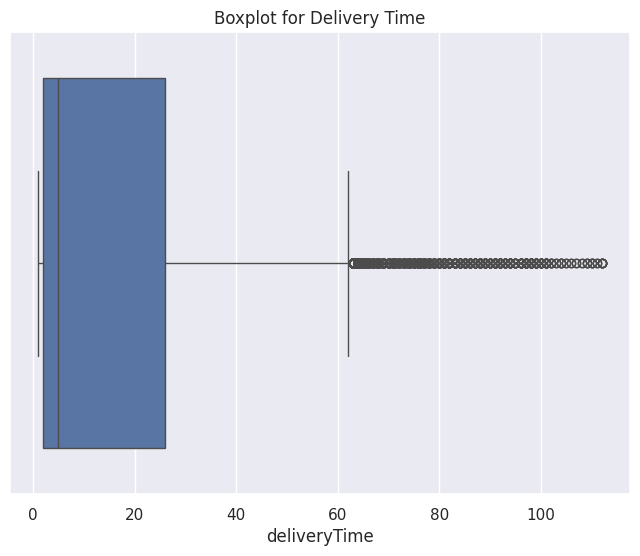

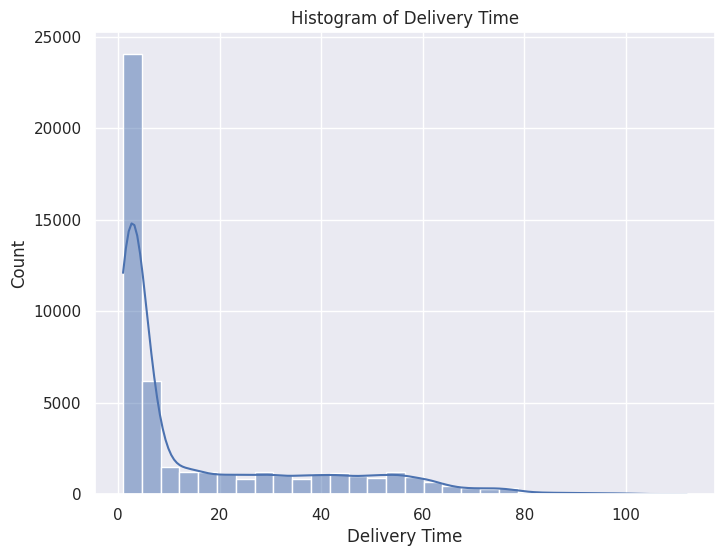

In [ ]:
import matplotlib.pyplot as plt # importing the pyplot module from matplotlib and giving it an alias of 'plt'
import seaborn as sns
# Boxplot for "deliveryTime"
plt.figure(figsize=(8, 6))
sns.boxplot(x=orders_class['deliveryTime'])
plt.title("Boxplot for Delivery Time")
plt.show()

# Histogramm für "deliveryTime"
plt.figure(figsize=(8, 6))
sns.histplot(orders_class['deliveryTime'], bins=30, kde=True)
plt.title("Histogram of Delivery Time")
plt.xlabel("Delivery Time")
plt.ylabel("Count")
plt.show()

In [ ]:
import numpy as np

# Calculate the interquartile range (IQR) for 'deliveryTime'
Q1 = orders_class['deliveryTime'].quantile(0.25)
Q3 = orders_class['deliveryTime'].quantile(0.75)
IQR = Q3 - Q1

# Define the limits for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Replace values ​​outside the limits with NaN
orders_class['deliveryTime'] = orders_class['deliveryTime'].apply(
    lambda x: np.nan if x == 0 or x < lower_bound or x > upper_bound else x
)


In [ ]:
# Check for any missing values
orders_class.isnull().sum()

,0
orderItemID,0
orderDate,0
deliveryDate,1956
itemID,0
size,0
color,0
manufacturerID,0
price,0
customerID,0
salutation,0


In [ ]:
zero_deliveryTime_count = orders_class[orders_class['deliveryTime'] == 0].shape[0]
print(f"Anzahl der 0 day-deliveryTime: {zero_deliveryTime_count}")


Anzahl der 0 day-deliveryTime: 0


In [ ]:
# Fill missing values ​​in 'deliveryTime' with the median
median_deliveryTime = orders_class['deliveryTime'].median()
orders_class['deliveryTime'].fillna(median_deliveryTime, inplace=True)

<ipython-input-539-aac8c09fe2f3>:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  orders_class['deliveryTime'].fillna(median_deliveryTime, inplace=True)


In [ ]:
# Check for any missing values
orders_class.isnull().sum()

,0
orderItemID,0
orderDate,0
deliveryDate,1956
itemID,0
size,0
color,0
manufacturerID,0
price,0
customerID,0
salutation,0


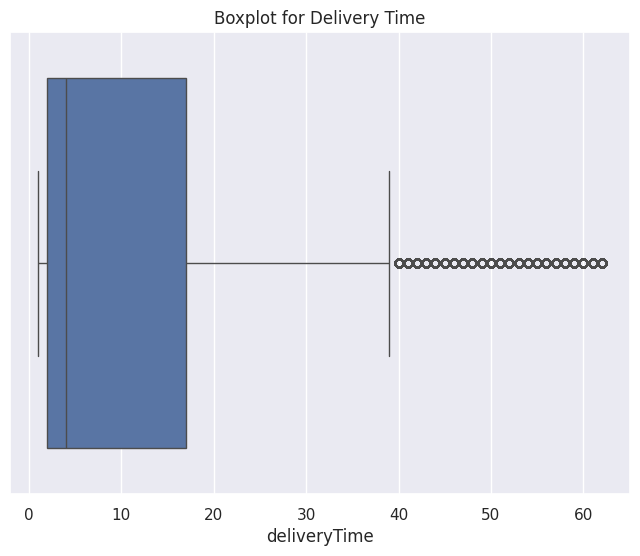

In [ ]:
# Boxplot for "deliveryTime"
plt.figure(figsize=(8, 6))
sns.boxplot(x=orders_class['deliveryTime'])
plt.title("Boxplot for Delivery Time")
plt.show()

In [ ]:
orders_class.deliveryTime.describe()

,deliveryTime
count,50078.000000
mean,12.956009
std,16.849215
min,1.000000
25%,2.000000
50%,4.000000
75%,17.000000
max,62.000000


In [ ]:
import numpy as np

# Calculate again the interquartile range (IQR) for 'deliveryTime'
Q1_delivery = orders_class['deliveryTime'].quantile(0.25)
Q3_delivery = orders_class['deliveryTime'].quantile(0.75)
IQR_delivery = Q3_delivery - Q1_delivery

# Set the limits for acceptable values
lower_bound_delivery = Q1_delivery - 1.5 * IQR_delivery
upper_bound_delivery = Q3_delivery + 1.5 * IQR_delivery

# Replace values ​​outside the limits with NaN
orders_class['deliveryTime'] = orders_class['deliveryTime'].apply(lambda x: np.nan if x < lower_bound_delivery or x > upper_bound_delivery else x)


# Ausgabe der aktualisierten Statistik, um zu überprüfen, ob die Ausreißer entfernt wurden
orders_class.deliveryTime.describe()


,deliveryTime
count,43847.000000
mean,7.590736
std,9.320776
min,1.000000
25%,2.000000
50%,4.000000
75%,7.000000
max,39.000000


In [ ]:
import numpy as np

# Calculate again the interquartile range (IQR) for 'deliveryTime'
Q1_delivery = orders_class['deliveryTime'].quantile(0.25)
Q3_delivery = orders_class['deliveryTime'].quantile(0.75)
IQR_delivery = Q3_delivery - Q1_delivery

# Set the limits for acceptable values
lower_bound_delivery = Q1_delivery - 1.5 * IQR_delivery
upper_bound_delivery = Q3_delivery + 1.5 * IQR_delivery

# Replace values ​​outside the limits with NaN
orders_class['deliveryTime'] = orders_class['deliveryTime'].apply(lambda x: np.nan if x < lower_bound_delivery or x > upper_bound_delivery else x)


# Ausgabe der aktualisierten Statistik, um zu überprüfen, ob die Ausreißer entfernt wurden
orders_class.deliveryTime.describe()


,deliveryTime
count,36647.000000
mean,3.825634
std,2.678745
min,1.000000
25%,2.000000
50%,3.000000
75%,4.000000
max,14.000000


In [ ]:
import numpy as np

# Option 1: Feste Obergrenze setzen
# Zum Beispiel, alle Werte über 30 Tage als Ausreißer betrachten
#upper_limit = 17

# Ersetze Werte, die die Obergrenze überschreiten, durch NaN
#orders_class['deliveryTime'] = orders_class['deliveryTime'].apply(
    #lambda x: np.nan if x > upper_limit else x
#)

# Überprüfen, ob es funktioniert hat
#print(orders_class['deliveryTime'].describe())


In [ ]:
orders_class.isnull().sum()

,0
orderItemID,0
orderDate,0
deliveryDate,1956
itemID,0
size,0
color,0
manufacturerID,0
price,0
customerID,0
salutation,0


In [ ]:
# Fill missing values ​​in 'deliveryTime' with the median
median_deliveryTime = orders_class['deliveryTime'].median()
orders_class['deliveryTime'].fillna(median_deliveryTime, inplace=True)

<ipython-input-547-aac8c09fe2f3>:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  orders_class['deliveryTime'].fillna(median_deliveryTime, inplace=True)


In [ ]:
orders_class.isnull().sum()

,0
orderItemID,0
orderDate,0
deliveryDate,1956
itemID,0
size,0
color,0
manufacturerID,0
price,0
customerID,0
salutation,0


In [ ]:
orders_class.deliveryTime.describe()

,deliveryTime
count,50078.000000
mean,3.604197
std,2.320539
min,1.000000
25%,2.000000
50%,3.000000
75%,4.000000
max,14.000000


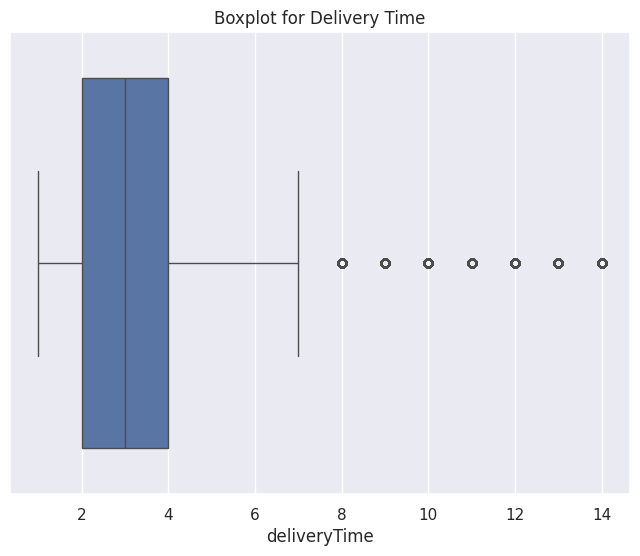

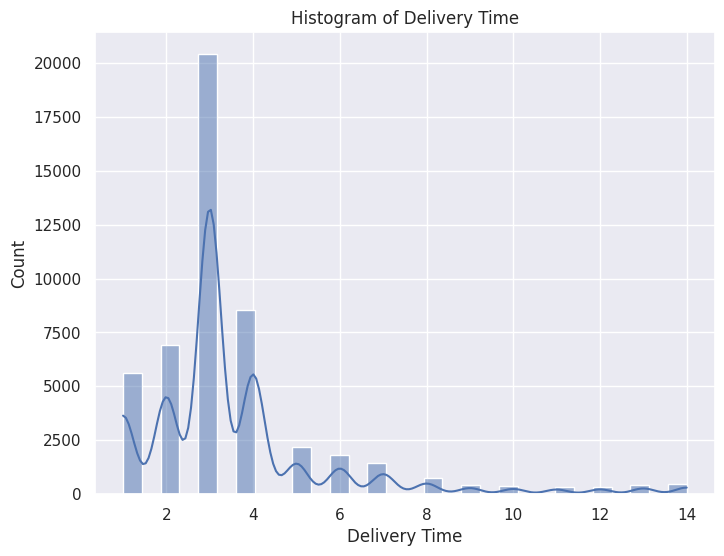

In [ ]:
# Boxplot for "deliveryTime"
plt.figure(figsize=(8, 6))
sns.boxplot(x=orders_class['deliveryTime'])
plt.title("Boxplot for Delivery Time")
plt.show()

# Histogramm für "deliveryTime"
plt.figure(figsize=(8, 6))
sns.histplot(orders_class['deliveryTime'], bins=30, kde=True)
plt.title("Histogram of Delivery Time")
plt.xlabel("Delivery Time")
plt.ylabel("Count")
plt.show()

<ipython-input-551-356ad4c0fd3f>:17: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=45, horizontalalignment='right')


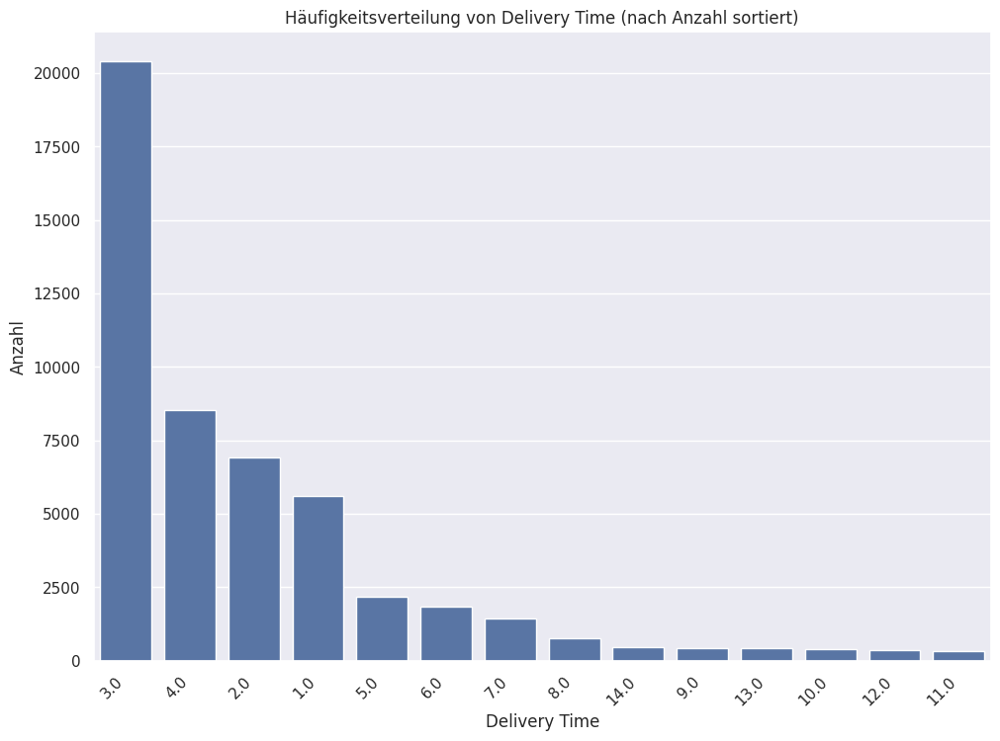

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Schritt 1: Häufigkeiten von deliveryTime berechnen und sortieren
delivery_counts = orders_class['deliveryTime'].value_counts().reset_index()
delivery_counts.columns = ['deliveryTime', 'count']

# Sortierung der X-Achse explizit festlegen nach Anzahl
delivery_counts = delivery_counts.sort_values(by='count', ascending=False)

# Schritt 2: Balkendiagramm erstellen
sns.set(rc={'figure.figsize': (11.7, 8.27)})
g = sns.barplot(x='deliveryTime', y='count', data=delivery_counts, order=delivery_counts['deliveryTime'])

# X-Achsenticks drehen
g.set_xticklabels(g.get_xticklabels(), rotation=45, horizontalalignment='right')

# Titel und Achsenbeschriftungen hinzufügen
plt.title('Häufigkeitsverteilung von Delivery Time (nach Anzahl sortiert)')
plt.xlabel('Delivery Time')
plt.ylabel('Anzahl')

# Diagramm anzeigen
plt.show()


In [ ]:
# Sicherstellen, dass deliveryTime und orderDate korrekt formatiert sind
orders_class['orderDate'] = pd.to_datetime(orders_class['orderDate'], errors='coerce')
orders_class['deliveryTime'] = pd.to_numeric(orders_class['deliveryTime'], errors='coerce')

# Füllen der fehlenden Werte in deliveryDate
orders_class['deliveryDate'] = orders_class.apply(
    lambda row: row['orderDate'] + pd.to_timedelta(row['deliveryTime'], unit='D')
    if pd.isnull(row['deliveryDate']) and not pd.isnull(row['orderDate']) and not pd.isnull(row['deliveryTime'])
    else row['deliveryDate'],
    axis=1
)

# Überprüfen, ob die fehlenden Werte gefüllt wurden
remaining_nan = orders_class['deliveryDate'].isnull().sum()
print(f"Anzahl der verbleibenden fehlenden Werte in deliveryDate: {remaining_nan}")

# Anzeige der aktualisierten Daten (optional)
print(orders_class[['customerID', 'itemID', 'orderDate', 'deliveryTime', 'deliveryDate']].head())


Anzahl der verbleibenden fehlenden Werte in deliveryDate: 0
   customerID  itemID  orderDate  deliveryTime deliveryDate
0       12489    2347 2013-04-01           2.0   2013-04-03
1       12489    2741 2013-04-01           2.0   2013-04-03
2       12489    2514 2013-04-01           2.0   2013-04-03
3       12489    2347 2013-04-01           3.0   2013-05-06
4       12489    2690 2013-04-01           2.0   2013-04-03


In [ ]:
orders_class.isnull().sum()

,0
orderItemID,0
orderDate,0
deliveryDate,0
itemID,0
size,0
color,0
manufacturerID,0
price,0
customerID,0
salutation,0


### dateOfBirth and age

In [ ]:
orders_class.describe()

,orderItemID,orderDate,deliveryDate,itemID,manufacturerID,price,customerID,dateOfBirth,creationDate,non_null_delivery_count,unique_delivery_dates,deliveryTime
count,50078.000000,50078,50078,50078.000000,50078.000000,50078.000000,50078.000000,44909,50078,50078.000000,50078.000000,50078.000000
mean,25039.500000,2013-04-16 10:14:29.843044864,2013-05-02 06:27:07.828587520,2446.780762,29.978274,71.133963,52828.989556,1964-06-11 08:40:53.601727936,2012-05-13 14:27:58.437637376,5.975958,2.199309,3.604197
min,1.000000,2013-04-01 00:00:00,2013-04-02 00:00:00,1.000000,1.000000,0.000000,6.000000,1900-11-19 00:00:00,2011-02-16 00:00:00,0.000000,0.000000,1.000000
25%,12520.250000,2013-04-10 00:00:00,2013-04-17 00:00:00,2378.000000,4.000000,39.900000,22189.000000,1959-04-19 00:00:00,2011-04-13 00:00:00,2.000000,1.000000,2.000000
50%,25039.500000,2013-04-18 00:00:00,2013-04-25 00:00:00,2464.000000,18.000000,69.900000,54087.000000,1964-12-27 00:00:00,2012-07-11 00:00:00,5.000000,2.000000,3.000000
75%,37558.750000,2013-04-23 00:00:00,2013-05-10 00:00:00,2593.000000,43.000000,99.900000,87384.750000,1970-04-21 00:00:00,2013-04-04 00:00:00,8.000000,3.000000,4.000000
max,50078.000000,2013-04-30 00:00:00,2013-07-23 00:00:00,3079.000000,166.000000,289.000000,91922.000000,2012-11-18 00:00:00,2013-04-30 00:00:00,52.000000,10.000000,14.000000
std,14456.417727,NaN,NaN,363.557259,35.797114,37.635147,31934.857945,NaN,NaN,5.175343,1.605672,2.320539


In [ ]:
orders_class

,orderItemID,orderDate,deliveryDate,itemID,size,color,manufacturerID,price,customerID,salutation,dateOfBirth,state,creationDate,non_null_delivery_count,unique_delivery_dates,deliveryTime
0,1,2013-04-01,2013-04-03,2347,43,magenta,1,89.9,12489,Mrs,1963-04-26,Hesse,2012-04-23,4,2,2.0
1,2,2013-04-01,2013-04-03,2741,43,grey,1,99.9,12489,Mrs,1963-04-26,Hesse,2012-04-23,4,2,2.0
2,3,2013-04-01,2013-04-03,2514,9,ecru,19,79.9,12489,Mrs,1963-04-26,Hesse,2012-04-23,4,2,2.0
3,4,2013-04-01,2013-05-06,2347,42,brown,1,89.9,12489,Mrs,1963-04-26,Hesse,2012-04-23,4,2,3.0
4,5,2013-04-01,2013-04-03,2690,43,grey,1,119.9,12489,Mrs,1963-04-26,Hesse,2012-04-23,4,2,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50073,50074,2013-04-29,2013-05-03,2342,M,terracotta,5,69.9,91920,Mrs,1962-03-08,Bavaria,2013-04-29,9,1,4.0
50074,50075,2013-04-29,2013-05-03,2505,M,terracotta,5,64.9,91920,Mrs,1962-03-08,Bavaria,2013-04-29,9,1,4.0
50075,50076,2013-04-28,2013-05-02,2470,XL,white,5,79.9,85095,Mrs,1950-02-14,Berlin,2013-03-24,1,1,4.0
50076,50077,2013-04-28,2013-05-02,2452,L,white,5,59.9,91922,Mrs,1969-11-27,Brandenburg,2013-04-28,0,0,4.0


In [ ]:

# Assuming your DataFrame is named df and 'orderDate' and 'dateOfBirth' are in datetime format

# Convert 'dateOfBirth' to datetime if not already in datetime format

# Step 1: Calculate the average age in years
# Create a temporary column 'age' by subtracting dateOfBirth from orderDate and converting to years
orders_class['age'] = (orders_class['orderDate'] - orders_class['dateOfBirth']).dt.days / 365.25

# Calculate the mean age, ignoring NaN values
mean_age = orders_class['age'].mean()

# Step 2: Fill NaN values in 'age' column with the mean age
orders_class['age'].fillna(mean_age, inplace=True)

# Step 3: Convert 'age' to integer
orders_class['age'] = orders_class['age'].astype(int)

# Step 4: Fill missing 'dateOfBirth' using the mean age
# Replace missing dateOfBirth with an estimated birth date calculated as orderDate - mean_age in days
orders_class.loc[orders_class['dateOfBirth'].isna(), 'dateOfBirth'] = orders_class['orderDate'] - pd.to_timedelta(mean_age * 365.25, unit='D')

# Check the result
orders_class


<ipython-input-556-0964b1eb1891>:13: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  orders_class['age'].fillna(mean_age, inplace=True)


,orderItemID,orderDate,deliveryDate,itemID,size,color,manufacturerID,price,customerID,salutation,dateOfBirth,state,creationDate,non_null_delivery_count,unique_delivery_dates,deliveryTime,age
0,1,2013-04-01,2013-04-03,2347,43,magenta,1,89.9,12489,Mrs,1963-04-26,Hesse,2012-04-23,4,2,2.0,49
1,2,2013-04-01,2013-04-03,2741,43,grey,1,99.9,12489,Mrs,1963-04-26,Hesse,2012-04-23,4,2,2.0,49
2,3,2013-04-01,2013-04-03,2514,9,ecru,19,79.9,12489,Mrs,1963-04-26,Hesse,2012-04-23,4,2,2.0,49
3,4,2013-04-01,2013-05-06,2347,42,brown,1,89.9,12489,Mrs,1963-04-26,Hesse,2012-04-23,4,2,3.0,49
4,5,2013-04-01,2013-04-03,2690,43,grey,1,119.9,12489,Mrs,1963-04-26,Hesse,2012-04-23,4,2,2.0,49
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50073,50074,2013-04-29,2013-05-03,2342,M,terracotta,5,69.9,91920,Mrs,1962-03-08,Bavaria,2013-04-29,9,1,4.0,51
50074,50075,2013-04-29,2013-05-03,2505,M,terracotta,5,64.9,91920,Mrs,1962-03-08,Bavaria,2013-04-29,9,1,4.0,51
50075,50076,2013-04-28,2013-05-02,2470,XL,white,5,79.9,85095,Mrs,1950-02-14,Berlin,2013-03-24,1,1,4.0,63
50076,50077,2013-04-28,2013-05-02,2452,L,white,5,59.9,91922,Mrs,1969-11-27,Brandenburg,2013-04-28,0,0,4.0,43


In [ ]:
print(orders_class.isnull().sum())


orderItemID                0
orderDate                  0
deliveryDate               0
itemID                     0
size                       0
color                      0
manufacturerID             0
price                      0
customerID                 0
salutation                 0
dateOfBirth                0
state                      0
creationDate               0
non_null_delivery_count    0
unique_delivery_dates      0
deliveryTime               0
age                        0
dtype: int64


In [ ]:
orders_class.age.describe()

,age
count,50078.000000
mean,48.331263
std,9.840666
min,0.000000
25%,43.000000
50%,48.000000
75%,53.000000
max,112.000000


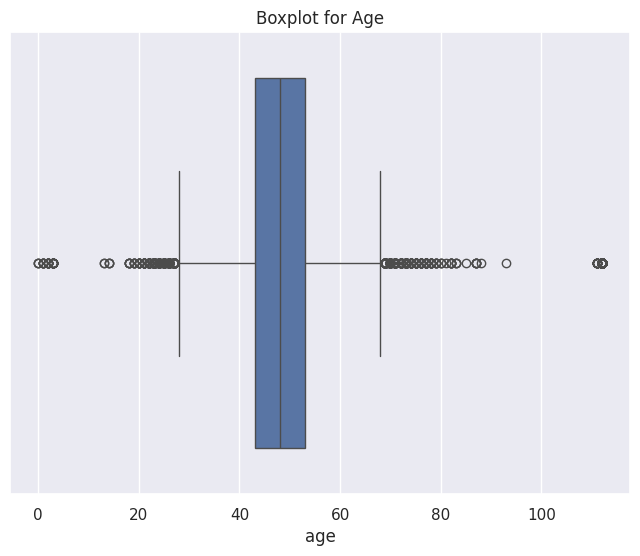

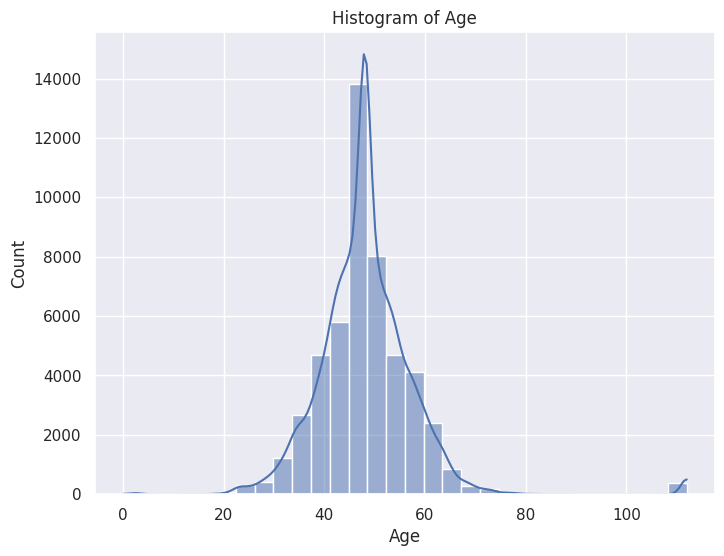

In [ ]:
# Boxplot for "age"
plt.figure(figsize=(8, 6))
sns.boxplot(x=orders_class['age'])
plt.title("Boxplot for Age")
plt.show()



# Histogramm fo "age" mit Count auf der y-Achse
plt.figure(figsize=(8, 6))
sns.histplot(orders_class['age'], bins=30, kde=True)
plt.title("Histogram of Age")
plt.xlabel("Age")
plt.ylabel("Count")
plt.show()

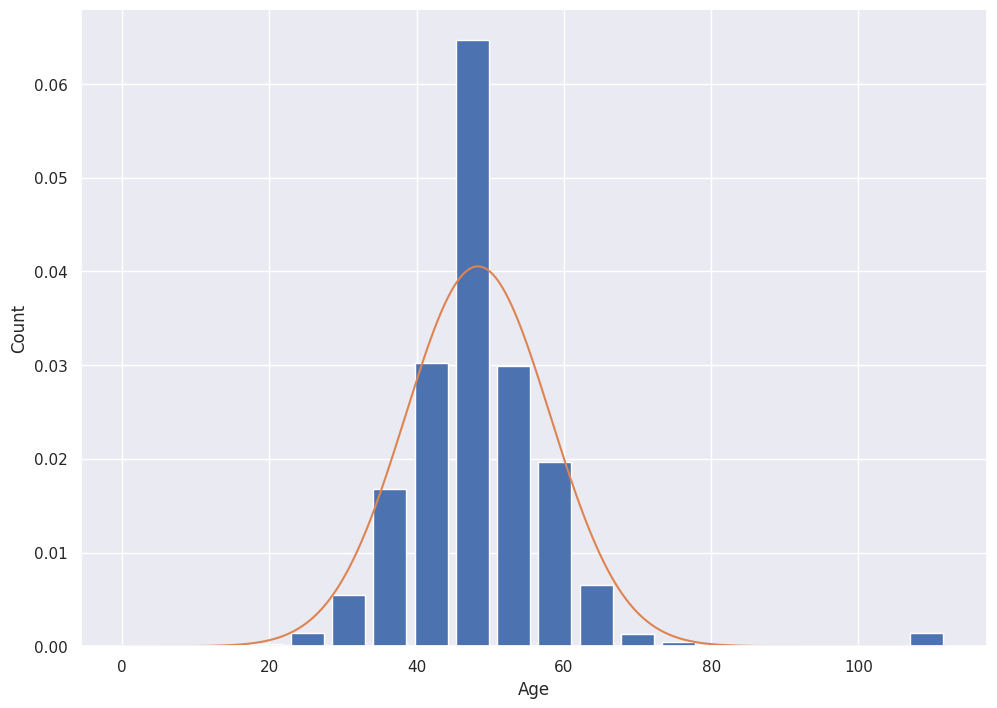

In [ ]:
from scipy.stats import norm
import numpy as np
plt.hist(orders_class.age, bins=20, rwidth=0.8, density=True)
plt.xlabel('Age')
plt.ylabel('Count')

rng = np.arange(orders_class.age.min(), orders_class.age.max(), 0.1)
plt.plot(rng, norm.pdf(rng,orders_class.age.mean(),orders_class.age.std()))

In [ ]:
upper_limit = orders_class.age.mean() + 3*orders_class.age.std()
upper_limit

77.8532604003495

In [ ]:
lower_limit = orders_class.age.mean() -3*orders_class.age.std()
lower_limit

18.809266058374888

In [ ]:
orders_class[(orders_class.age>upper_limit) | (orders_class.age<lower_limit)]

,orderItemID,orderDate,deliveryDate,itemID,size,color,manufacturerID,price,customerID,salutation,dateOfBirth,state,creationDate,non_null_delivery_count,unique_delivery_dates,deliveryTime,age
741,742,2013-04-01,2013-04-11,2328,l,blue,113,69.9,55553,Mrs,1900-11-19,Baden-Wuerttemberg,2011-09-25,3,1,10.0,112
742,743,2013-04-01,2013-04-11,2328,l,black,113,69.9,55553,Mrs,1900-11-19,Baden-Wuerttemberg,2011-09-25,3,1,10.0,112
743,744,2013-04-01,2013-04-11,2336,xl,basalt,3,39.9,55553,Mrs,1900-11-19,Baden-Wuerttemberg,2011-09-25,3,1,10.0,112
1036,1037,2013-04-01,2013-05-02,2334,XL,green,3,26.9,57498,Mrs,1900-11-19,Lower Saxony,2011-04-20,4,2,3.0,112
1037,1038,2013-04-01,2013-05-02,2334,XL,petrol,3,26.9,57498,Mrs,1900-11-19,Lower Saxony,2011-04-20,4,2,3.0,112
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48570,48571,2013-04-30,2013-05-09,2546,41,brown,24,99.9,21014,Mrs,2009-09-05,North Rhine-Westphalia,2011-02-16,7,3,9.0,3
48571,48572,2013-04-30,2013-05-10,2407,M,stained,3,39.9,21014,Mrs,2009-09-05,North Rhine-Westphalia,2011-02-16,7,3,10.0,3
48691,48692,2013-04-30,2013-05-02,2674,40,black,1,99.9,91708,Mrs,1901-02-16,Lower Saxony,2011-02-16,2,1,2.0,112
48692,48693,2013-04-30,2013-05-02,2674,40,red,1,99.9,91708,Mrs,1901-02-16,Lower Saxony,2011-02-16,2,1,2.0,112


In [ ]:
# Define the limits for acceptable values ​​in 'age'
upper_limit_age = orders_class['age'].mean() + 3 * orders_class['age'].std()
lower_limit_age = orders_class['age'].mean() - 3 * orders_class['age'].std()

# Replace outliers with NaN
orders_class['age'] = orders_class['age'].apply(lambda x: np.nan if x > upper_limit_age or x < lower_limit_age else x)  #df[(df.age>upper_limit) | (df.age<lower_limit)]

# Check
print(f"Number of NaN values ​​in 'age' after outlier treatment: {orders_class['age'].isna().sum()}")


Number of NaN values ​​in 'age' after outlier treatment: 465


In [ ]:
orders_class.age.info()


<class 'pandas.core.series.Series'>
RangeIndex: 50078 entries, 0 to 50077
Series name: age
Non-Null Count  Dtype  
--------------  -----  
49613 non-null  float64
dtypes: float64(1)
memory usage: 391.4 KB


In [ ]:
# Fill missing values ​​in 'deliveryTime' with the median
median_age = orders_class['age'].median()
orders_class['age'].fillna(median_age, inplace=True)


<ipython-input-566-4a1b3be4be2b>:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  orders_class['age'].fillna(median_age, inplace=True)


In [ ]:
# Check if all missing values ​​have been filled
orders_class.age.isna().sum()

0

In [ ]:
orders_class.age.describe()

,age
count,50078.000000
mean,47.856624
std,7.939384
min,19.000000
25%,43.000000
50%,48.000000
75%,53.000000
max,77.000000


### price

In [ ]:
orders_class.price.describe()


,price
count,50078.000000
mean,71.133963
std,37.635147
min,0.000000
25%,39.900000
50%,69.900000
75%,99.900000
max,289.000000


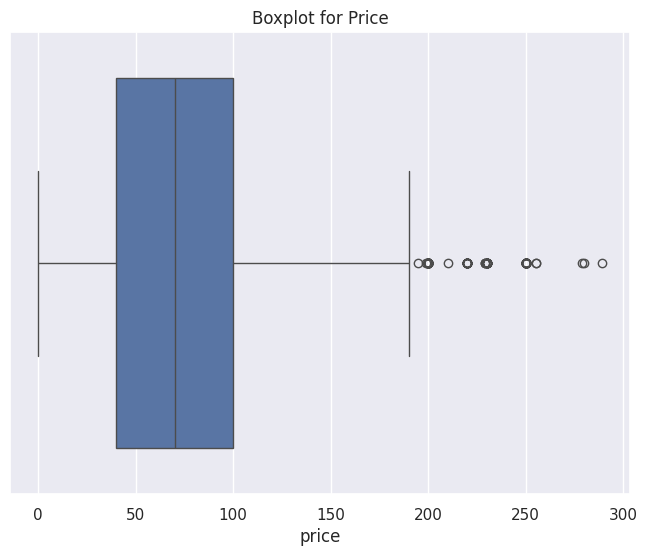

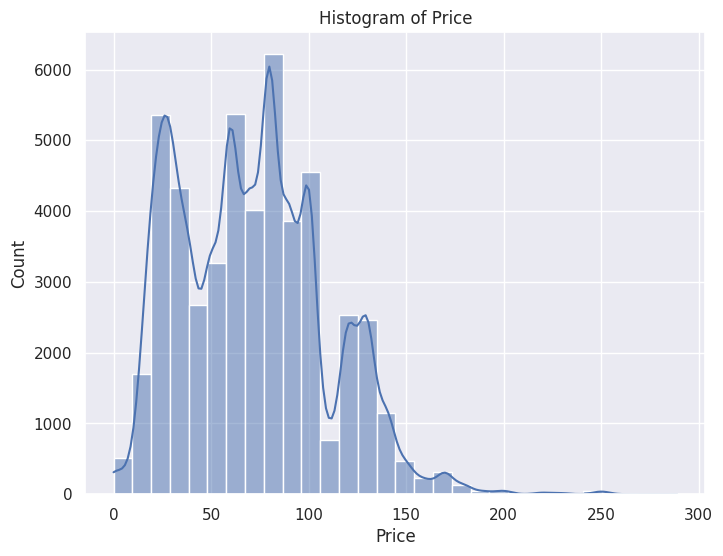

In [ ]:
# Boxplot for "price"
plt.figure(figsize=(8, 6))
sns.boxplot(x=orders_class['price'])
plt.title("Boxplot for Price")
plt.show()



# Histogramm für "price" mit Count auf der y-Achse
plt.figure(figsize=(8, 6))
sns.histplot(orders_class['price'], bins=30, kde=True)
plt.title("Histogram of Price")
plt.xlabel("Price")
plt.ylabel("Count")
plt.show()

#plt.hist(df.price, bins=20, rwidth=0.8)
#plt.xlabel( 'price')
#plt. ylabel( 'Count' )
#plt.show()

In [ ]:
zero_price_count = orders_class[orders_class['price'] == 0].shape[0]
print(f"Number of 0 €-Preise: {zero_price_count}")


Number of 0 €-Preise: 293


In [ ]:
# Convert 0 € prices to NaN
orders_class['price'] = orders_class['price'].replace(0, np.nan)


In [ ]:
print(orders_class.isnull().sum())


orderItemID                  0
orderDate                    0
deliveryDate                 0
itemID                       0
size                         0
color                        0
manufacturerID               0
price                      293
customerID                   0
salutation                   0
dateOfBirth                  0
state                        0
creationDate                 0
non_null_delivery_count      0
unique_delivery_dates        0
deliveryTime                 0
age                          0
dtype: int64


In [ ]:
orders_class.price.describe()


,price
count,49785.000000
mean,71.552609
std,37.346816
min,4.950000
25%,39.900000
50%,69.900000
75%,99.900000
max,289.000000


In [ ]:
import numpy as np

# Beispiel: Outlier in der Spalte 'price' finden und durch NaN ersetzen
#Q1 = orders_class['price'].quantile(0.25)
#Q3 = orders_class['price'].quantile(0.75)
#IQR = Q3 - Q1

# Definiere die Grenzen für Ausreißer
#lower_bound = Q1 - 1.5 * IQR
#upper_bound = Q3 + 1.5 * IQR

# Werte außerhalb der Grenzen durch NaN ersetzen
#orders_class['price'] = orders_class['price'].apply(lambda x: np.nan if x < lower_bound or x > upper_bound else x)


In [ ]:
print(orders_class.isnull().sum())


orderItemID                  0
orderDate                    0
deliveryDate                 0
itemID                       0
size                         0
color                        0
manufacturerID               0
price                      293
customerID                   0
salutation                   0
dateOfBirth                  0
state                        0
creationDate                 0
non_null_delivery_count      0
unique_delivery_dates        0
deliveryTime                 0
age                          0
dtype: int64


In [ ]:
# Fehlende Werte in 'price' mit dem Median auffüllen
median_price = orders_class['price'].median()
orders_class['price'].fillna(median_price, inplace=True)


<ipython-input-577-d29b8da971c6>:3: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  orders_class['price'].fillna(median_price, inplace=True)


In [ ]:
# Check for any missing values
orders_class.isnull().sum()

,0
orderItemID,0
orderDate,0
deliveryDate,0
itemID,0
size,0
color,0
manufacturerID,0
price,0
customerID,0
salutation,0


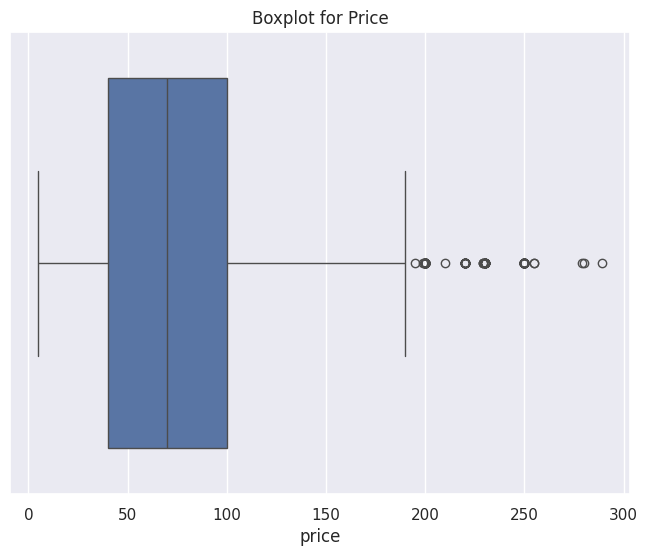

In [ ]:
# Boxplot for "price"
plt.figure(figsize=(8, 6))
sns.boxplot(x=orders_class['price'])
plt.title("Boxplot for Price")
plt.show()

In [ ]:
orders_class.price.describe()


,price
count,50078.000000
mean,71.542939
std,37.237611
min,4.950000
25%,39.900000
50%,69.900000
75%,99.900000
max,289.000000


## Color

In [ ]:
orders_class.color.value_counts()

,count
color,
black,8346
green,5226
blue,4794
grey,4443
red,3976
...,...
dark oliv,2
lemon,2
dark navy,1


In [ ]:
# Überprüfen Sie, ob df13 ein DataFrame ist
if isinstance(orders_class, pd.DataFrame):
    # Überprüfen, ob die Spalte 'color' in df13 vorhanden ist
    if 'color' in orders_class.columns:
        # Einzigartige Farben sortieren und anzeigen
        unique_colors = sorted(orders_class['color'].dropna().unique())
        print("Alphabetisch sortierte Farben:")
        for color in unique_colors:
            print(color)
    else:
        print("Die Spalte 'color' ist in df13 nicht vorhanden.")
else:
    print(f"df13 ist kein DataFrame, sondern ein {type(orders_class)}.")


Alphabetisch sortierte Farben:
almond
ancient
anthracite
antique pink
apricot
aqua
aquamarine
ash
aubergine
azure
baltic blue
basalt
beige
berry
black
blau
blue
bordeaux
brown
cognac
coral
crimson
curry
dark denim
dark navy
dark oliv
darkblue
denim
ecru
floral
fuchsia
gold
graphite
green
grey
habana
hibiscus
ingwer
iron
jade
kanel
khaki
lemon
leopard
magenta
mahagoni
mint
mocca
nature
navy
ocher
oliv
olive
orange
pallid
petrol
pink
purple
red
silver
stained
striped
terracotta
turquoise
white
yellow


In [ ]:
# Sicherstellen, dass die Spalte 'color' Strings enthält
orders_class['color'] = orders_class['color'].astype(str)

# Dictionary mit falsch geschriebenen Farben als Schlüssel und den Korrekturen als Werte
color_corrections = {
    'blau': 'blue',
    'brwon': 'brown',
    'darkblue': 'dark blue',
    'dark oliv': 'dark olive',
    'oliv': 'olive',
    'perlmutt': 'pearl',
    'mocca': 'mocha',
    'habana': 'havana',
    'dark garnet': 'garnet',
    'creme': 'cream',
    'champagner': 'champagne',
    'cortina mocca': 'mocha',
    'currant purple': 'currant violet',
    'cobalt blue': 'dark cobalt blue',
    'kanel': 'cinnamon',
    'mahagoni': 'mahogany',
    'floral': 'floral white',
    'vanille': 'vanilla',
    'ingwer': 'ginger',
    'pallid': 'pallid blue',
    'stained': 'stained glass',
    'curled': 'curlew'
}

# Eine Funktion, um die Farben basierend auf dem Dictionary zu korrigieren
def correct_colors(color):
    return color_corrections.get(color.lower(), color)

# Originale Spalte 'color' kopieren, um sie als 'color_miss' zu speichern
orders_class['color_miss'] = orders_class['color']

# Neue Spalte 'color' mit korrigierten Farben hinzufügen
orders_class['color'] = orders_class['color_miss'].apply(correct_colors)

# Alle einzigartigen, korrigierten Farben anzeigen
unique_colors_corrected = sorted(orders_class['color'].dropna().unique())
print("Alphabetisch sortierte, korrigierte Farben:")
for color in unique_colors_corrected:
    print(color)

# Ergebnis prüfen
print(orders_class[['color_miss', 'color']].head())


Alphabetisch sortierte, korrigierte Farben:
almond
ancient
anthracite
antique pink
apricot
aqua
aquamarine
ash
aubergine
azure
baltic blue
basalt
beige
berry
black
blue
bordeaux
brown
cinnamon
cognac
coral
crimson
curry
dark blue
dark denim
dark navy
dark olive
denim
ecru
floral white
fuchsia
ginger
gold
graphite
green
grey
havana
hibiscus
iron
jade
khaki
lemon
leopard
magenta
mahogany
mint
mocha
nature
navy
ocher
olive
orange
pallid blue
petrol
pink
purple
red
silver
stained glass
striped
terracotta
turquoise
white
yellow
  color_miss    color
0    magenta  magenta
1       grey     grey
2       ecru     ecru
3      brown    brown
4       grey     grey


In [ ]:
import pandas as pd
import matplotlib.colors as mcolors

# Lade die Farbnamen aus der CSV-Datei
url = "https://raw.githubusercontent.com/meodai/color-names/master/dist/colornames.csv"
color_names_df = pd.read_csv(url)

# Konvertiere Hex-Werte in RGB
def hex_to_rgb(hex_color):
    rgb = mcolors.hex2color(hex_color)  # Normalisierte Werte zwischen 0 und 1
    return tuple(int(c * 255) for c in rgb)  # Werte auf 0–255 skalieren

# Füge Spalten für RGB-Werte hinzu
color_names_df['rgb'] = color_names_df['hex'].apply(hex_to_rgb)

# Abgleich der Farbnamen
color_mapping_rgb = dict(zip(color_names_df['name'].str.lower(), color_names_df['rgb']))
color_mapping_hex = dict(zip(color_names_df['name'].str.lower(), color_names_df['hex']))

# Neue Spalten für Hex und RGB-Werte
orders_class['color_hex'] = orders_class['color'].str.lower().map(color_mapping_hex)
orders_class['color_rgb'] = orders_class['color'].str.lower().map(color_mapping_rgb)

# Fehlende Werte mit Fallbacks behandeln
default_hex = "#000000"  # Standardwert für Hex (Schwarz)
default_rgb = (0, 0, 0)  # Standardwert für RGB (Schwarz)

orders_class['color_hex'] = orders_class['color_hex'].fillna(default_hex)
orders_class['color_rgb'] = orders_class['color_rgb'].apply(lambda x: default_rgb if pd.isna(x) else x)

# Extrahiere R, G, B-Werte in separate Spalten
orders_class['r'] = orders_class['color_rgb'].apply(lambda x: x[0])
orders_class['g'] = orders_class['color_rgb'].apply(lambda x: x[1])
orders_class['b'] = orders_class['color_rgb'].apply(lambda x: x[2])

# Ergebnis prüfen
print(orders_class[['color', 'color_hex', 'color_rgb', 'r', 'g', 'b']].head())


     color color_hex        color_rgb    r    g    b
0  magenta   #ff00ff    (255, 0, 255)  255    0  255
1     grey   #808080  (128, 128, 128)  128  128  128
2     ecru   #c2b280  (194, 178, 128)  194  178  128
3    brown   #653700     (101, 55, 0)  101   55    0
4     grey   #808080  (128, 128, 128)  128  128  128


In [ ]:
"""
import pandas as pd
import matplotlib.colors as mcolors

# Lade die Farbnamen aus der CSV-Datei
url = "https://raw.githubusercontent.com/meodai/color-names/master/dist/colornames.csv"
color_names_df = pd.read_csv(url)

# Konvertiere Hex-Werte in RGB
def hex_to_rgb(hex_color):
    rgb = mcolors.hex2color(hex_color)  # Normalisierte Werte zwischen 0 und 1
    return tuple(int(c * 255) for c in rgb)  # Werte auf 0–255 skalieren

# Füge eine Spalte für RGB-Werte hinzu
color_names_df['rgb'] = color_names_df['hex'].apply(hex_to_rgb)

# Lade deinen DataFrame
# Beispiel: df13 mit einer Spalte `color` (Farbnamen, die abgeglichen werden sollen)
# df13 = pd.read_csv('your_dataset.csv')  # Beispiel-Datensatz
orders_class['color_rgb'] = None  # Neue Spalte für die RGB-Werte

# Abgleich der Farbnamen
color_mapping = dict(zip(color_names_df['name'].str.lower(), color_names_df['rgb']))

# Zuordnung der RGB-Werte zu den Farbnamen in df13
orders_class['color_rgb'] = orders_class['color'].str.lower().map(color_mapping)

# Ergebnis prüfen
print(orders_class[['color', 'color_rgb']].head())
"""

'\nimport pandas as pd\nimport matplotlib.colors as mcolors\n\n# Lade die Farbnamen aus der CSV-Datei\nurl = "https://raw.githubusercontent.com/meodai/color-names/master/dist/colornames.csv"\ncolor_names_df = pd.read_csv(url)\n\n# Konvertiere Hex-Werte in RGB\ndef hex_to_rgb(hex_color):\n    rgb = mcolors.hex2color(hex_color)  # Normalisierte Werte zwischen 0 und 1\n    return tuple(int(c * 255) for c in rgb)  # Werte auf 0–255 skalieren\n\n# Füge eine Spalte für RGB-Werte hinzu\ncolor_names_df[\'rgb\'] = color_names_df[\'hex\'].apply(hex_to_rgb)\n\n# Lade deinen DataFrame\n# Beispiel: df13 mit einer Spalte `color` (Farbnamen, die abgeglichen werden sollen)\n# df13 = pd.read_csv(\'your_dataset.csv\')  # Beispiel-Datensatz\norders_class[\'color_rgb\'] = None  # Neue Spalte für die RGB-Werte\n\n# Abgleich der Farbnamen\ncolor_mapping = dict(zip(color_names_df[\'name\'].str.lower(), color_names_df[\'rgb\']))\n\n# Zuordnung der RGB-Werte zu den Farbnamen in df13\norders_class[\'color_rgb\'

In [ ]:
#orders_class[['color', 'color_rgb']].drop_duplicates()
#orders_class[['color', 'color_rgb']]

## Size

In [ ]:
# Erstellen einer neuen Spalte, um die ursprünglichen Werte zu speichern
orders_class['size_false'] = orders_class['size']

# Konvertierung der Spalte "size" in einheitliches Großbuchstabenformat
orders_class['size'] = orders_class['size_false'].str.upper()

# Ergebnis anzeigen
print(orders_class[['size_false', 'size']].drop_duplicates())


      size_false  size
0             43    43
2              9     9
3             42    42
5             41    41
6             7+    7+
...          ...   ...
21279       3634  3634
39560         14    14
41344       3834  3834
41419         56    56
42747        46+   46+

[100 rows x 2 columns]


In [ ]:
orders_class[['size_false', 'size']].drop_duplicates()

,size_false,size
0,43,43
2,9,9
3,42,42
5,41,41
6,7+,7+
...,...,...
21279,3634,3634
39560,14,14
41344,3834,3834
41419,56,56


## Step 2: Calculate Each Feature

##  Average Frequency

In [ ]:
orders_class1 = orders_class.copy()


# Step 2: Remove duplicate orders for the same day in the new DataFrame
orders_class1 = orders_class1.drop_duplicates(subset=['customerID', 'orderDate'])

# Step 3: Sort by customerID and orderDate
orders_class1 = orders_class1.sort_values(by=['customerID', 'orderDate'])

# Step 4: Calculate Recency
orders_class1['previous_order_date'] = orders_class1.groupby('customerID')['orderDate'].shift(1)
orders_class1['recency'] = (orders_class1['orderDate'] - orders_class1['previous_order_date']).dt.days
orders_class1['recency'].fillna(-1, inplace=True)

# Step 5: Calculate Frequency (Cumulative Purchase Count)
orders_class1['frequency'] = orders_class1.groupby('customerID').cumcount()

# Step 6: Calculate Average Time Between Purchases (Alternative Frequency)
orders_class1['days_between_orders'] = orders_class1['recency']
orders_class1['average_frequency'] = orders_class1.groupby('customerID')['days_between_orders'].transform(lambda x: x.expanding().mean())
orders_class1['average_frequency'].fillna(-1, inplace=True)

# Step 7: Drop temporary columns if no longer needed
orders_class1.drop(columns=['previous_order_date', 'days_between_orders'], inplace=True)

# Display the new DataFrame with added features
orders_class1  = orders_class1.sort_values(by=['customerID'])
orders_class1


<ipython-input-589-c9c59c628345>:13: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  orders_class1['recency'].fillna(-1, inplace=True)
<ipython-input-589-c9c59c628345>:21: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try

,orderItemID,orderDate,deliveryDate,itemID,size,color,manufacturerID,price,customerID,salutation,dateOfBirth,state,creationDate,non_null_delivery_count,unique_delivery_dates,deliveryTime,age,color_miss,color_hex,color_rgb,r,g,b,size_false,recency,frequency,average_frequency
23160,23161,2013-04-17,2013-05-15,2586,M,black,20,39.90,6,Mrs,1970-01-08 00:00:00.000000000,Lower Saxony,2012-02-22,1,1,3.0,43.0,black,#000000,"(0, 0, 0)",0,0,0,m,-1.0,0,-1.0
24199,24200,2013-04-18,2013-04-19,2459,41,blue,38,99.90,15,Mrs,1969-08-31 00:00:00.000000000,Rhineland-Palatinate,2011-04-29,6,3,1.0,43.0,blue,#0000ff,"(0, 0, 255)",0,0,255,41,-1.0,0,-1.0
4198,4199,2013-04-03,2013-04-11,2413,L,purple,5,79.90,48,Mrs,1969-11-25 00:00:00.000000000,Rhineland-Palatinate,2012-01-22,3,1,8.0,43.0,purple,#800080,"(128, 0, 128)",128,0,128,L,-1.0,0,-1.0
2969,2970,2013-04-02,2013-04-09,2626,39,grey,50,79.95,59,Mrs,1976-09-20 00:00:00.000000000,Bavaria,2013-04-02,3,2,7.0,36.0,grey,#808080,"(128, 128, 128)",128,128,128,39,-1.0,0,-1.0
46130,46131,2013-04-28,2013-05-02,2546,39,black,24,99.90,61,Mrs,1964-06-22 23:03:03.170411456,Bavaria,2012-03-17,5,2,4.0,48.0,black,#000000,"(0, 0, 0)",0,0,0,39,-1.0,0,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50049,50050,2013-04-29,2013-05-03,2535,41,brown,38,129.90,91911,Mrs,1966-01-29 00:00:00.000000000,Baden-Wuerttemberg,2013-04-29,6,2,4.0,47.0,brown,#653700,"(101, 55, 0)",101,55,0,41,-1.0,0,-1.0
50057,50058,2013-04-27,2013-06-10,2516,39+,magenta,1,169.90,91912,Mrs,1962-03-19 00:00:00.000000000,Hesse,2013-04-27,5,1,3.0,51.0,magenta,#ff00ff,"(255, 0, 255)",255,0,255,39+,-1.0,0,-1.0
50062,50063,2013-04-29,2013-05-03,2601,38,black,40,119.90,91915,Mrs,1919-08-05 00:00:00.000000000,Baden-Wuerttemberg,2013-04-29,1,1,4.0,48.0,black,#000000,"(0, 0, 0)",0,0,0,38,-1.0,0,-1.0
50066,50067,2013-04-29,2013-05-03,2505,M,terracotta,5,64.90,91920,Mrs,1962-03-08 00:00:00.000000000,Bavaria,2013-04-29,9,1,4.0,51.0,terracotta,#cb6843,"(203, 104, 67)",203,104,67,M,-1.0,0,-1.0


In [ ]:
# Create a copy of df to keep the original dataset unchanged
orders_class2 = orders_class.copy()

# Check the columns in orders_class1 to ensure the new features are present
print("Columns in orders_class1:", orders_class1.columns)

# Perform the merge on the copy df2 with df1 and check the first rows to confirm new columns are included
orders_class2 = orders_class2.merge(orders_class1[['customerID', 'orderDate', 'recency', 'frequency', 'average_frequency']],
                on=['customerID', 'orderDate'], how='left')

# Check the columns in orders_class2 to confirm that the merge worked
print("Columns in merged orders_class2:", orders_class2.columns)




Columns in orders_class1: Index(['orderItemID', 'orderDate', 'deliveryDate', 'itemID', 'size', 'color',
       'manufacturerID', 'price', 'customerID', 'salutation', 'dateOfBirth',
       'state', 'creationDate', 'non_null_delivery_count',
       'unique_delivery_dates', 'deliveryTime', 'age', 'color_miss',
       'color_hex', 'color_rgb', 'r', 'g', 'b', 'size_false', 'recency',
       'frequency', 'average_frequency'],
      dtype='object')
Columns in merged orders_class2: Index(['orderItemID', 'orderDate', 'deliveryDate', 'itemID', 'size', 'color',
       'manufacturerID', 'price', 'customerID', 'salutation', 'dateOfBirth',
       'state', 'creationDate', 'non_null_delivery_count',
       'unique_delivery_dates', 'deliveryTime', 'age', 'color_miss',
       'color_hex', 'color_rgb', 'r', 'g', 'b', 'size_false', 'recency',
       'frequency', 'average_frequency'],
      dtype='object')


In [ ]:
orders_class2

,orderItemID,orderDate,deliveryDate,itemID,size,color,manufacturerID,price,customerID,salutation,dateOfBirth,state,creationDate,non_null_delivery_count,unique_delivery_dates,deliveryTime,age,color_miss,color_hex,color_rgb,r,g,b,size_false,recency,frequency,average_frequency
0,1,2013-04-01,2013-04-03,2347,43,magenta,1,89.9,12489,Mrs,1963-04-26,Hesse,2012-04-23,4,2,2.0,49.0,magenta,#ff00ff,"(255, 0, 255)",255,0,255,43,-1.0,0,-1.0
1,2,2013-04-01,2013-04-03,2741,43,grey,1,99.9,12489,Mrs,1963-04-26,Hesse,2012-04-23,4,2,2.0,49.0,grey,#808080,"(128, 128, 128)",128,128,128,43,-1.0,0,-1.0
2,3,2013-04-01,2013-04-03,2514,9,ecru,19,79.9,12489,Mrs,1963-04-26,Hesse,2012-04-23,4,2,2.0,49.0,ecru,#c2b280,"(194, 178, 128)",194,178,128,9,-1.0,0,-1.0
3,4,2013-04-01,2013-05-06,2347,42,brown,1,89.9,12489,Mrs,1963-04-26,Hesse,2012-04-23,4,2,3.0,49.0,brown,#653700,"(101, 55, 0)",101,55,0,42,-1.0,0,-1.0
4,5,2013-04-01,2013-04-03,2690,43,grey,1,119.9,12489,Mrs,1963-04-26,Hesse,2012-04-23,4,2,2.0,49.0,grey,#808080,"(128, 128, 128)",128,128,128,43,-1.0,0,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50073,50074,2013-04-29,2013-05-03,2342,M,terracotta,5,69.9,91920,Mrs,1962-03-08,Bavaria,2013-04-29,9,1,4.0,51.0,terracotta,#cb6843,"(203, 104, 67)",203,104,67,M,-1.0,0,-1.0
50074,50075,2013-04-29,2013-05-03,2505,M,terracotta,5,64.9,91920,Mrs,1962-03-08,Bavaria,2013-04-29,9,1,4.0,51.0,terracotta,#cb6843,"(203, 104, 67)",203,104,67,M,-1.0,0,-1.0
50075,50076,2013-04-28,2013-05-02,2470,XL,white,5,79.9,85095,Mrs,1950-02-14,Berlin,2013-03-24,1,1,4.0,63.0,white,#ffffff,"(255, 255, 255)",255,255,255,XL,5.0,1,2.0
50076,50077,2013-04-28,2013-05-02,2452,L,white,5,59.9,91922,Mrs,1969-11-27,Brandenburg,2013-04-28,0,0,4.0,43.0,white,#ffffff,"(255, 255, 255)",255,255,255,L,-1.0,0,-1.0


In [ ]:
orders_class2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50078 entries, 0 to 50077
Data columns (total 27 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   orderItemID              50078 non-null  int64         
 1   orderDate                50078 non-null  datetime64[ns]
 2   deliveryDate             50078 non-null  datetime64[ns]
 3   itemID                   50078 non-null  int64         
 4   size                     50078 non-null  object        
 5   color                    50078 non-null  object        
 6   manufacturerID           50078 non-null  int64         
 7   price                    50078 non-null  float64       
 8   customerID               50078 non-null  int64         
 9   salutation               50078 non-null  object        
 10  dateOfBirth              50078 non-null  datetime64[ns]
 11  state                    50078 non-null  object        
 12  creationDate             50078 n

## Apply the Return Rates customer to orders_class

In [ ]:
import pandas as pd

# Annahme: df4 ist dein Trainingsdatensatz und enthält die Spalten 'customerID' und 'returnShipment'.
# Und orders_class2 ist der Testdatensatz.

# Schritt 1: Berechne die Rücksenderate (customer_return_rate) pro Kunde im Trainingsdatensatz
customer_return_rate_dict = df13.groupby('customerID')['returnShipment'].mean().to_dict()

# Schritt 2: Mappe die Rücksenderate in den Testdatensatz
orders_class2['customer_return_rate'] = orders_class2['customerID'].map(customer_return_rate_dict)

# Schritt 3: Fülle fehlende Werte (Kunden ohne Historie im Trainingsdatensatz) mit dem Durchschnittswert
average_customer_return_rate = df13['returnShipment'].mean()
orders_class2['customer_return_rate'].fillna(average_customer_return_rate, inplace=True)

# Ergebnis anzeigen
print(orders_class2[['customerID', 'customer_return_rate']].head())


   customerID  customer_return_rate
0       12489                   1.0
1       12489                   1.0
2       12489                   1.0
3       12489                   1.0
4       12489                   1.0


<ipython-input-593-e8b448274808>:14: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  orders_class2['customer_return_rate'].fillna(average_customer_return_rate, inplace=True)


In [ ]:
# Filter the DataFrame for customerID = 6
#filtered_df12 = df12[df12['customerID'] == 18]
#filtered_df12 = df12[df12['customerID'] == 794]
#filtered_df1 = df4[df4['customerID'] == 18]
filtered_df1 = orders_class2[orders_class2['customerID'] == 90113]
#filtered_df12 = df12[df12['customerID'] == 26]
#filtered_df12 = df12[df12['customerID'] == 1775]

# Display the filtered results
filtered_df1[['customerID', 'customer_return_rate']]


,customerID,customer_return_rate
34380,90113,0.525482
34381,90113,0.525482
34382,90113,0.525482
34383,90113,0.525482
34384,90113,0.525482
34385,90113,0.525482
34386,90113,0.525482
34387,90113,0.525482
34388,90113,0.525482
34389,90113,0.525482


## product_category

In [ ]:
import re
import numpy as np

# Create a copy of df12
#df13 = df12.copy()

# Replace the '+' sign with '.5' in the 'size' column
orders_class2['size'] = orders_class2['size'].str.replace('+', '.5', regex=False)

# Convert all sizes to uppercase for consistency
orders_class2['size'] = orders_class2['size'].str.upper()

# Define regex patterns
clothing_letters_pattern = re.compile(r"^(L|M|S|XL|XS|XXL|XXXL|17|18|19|20|21|22)$")
accessories_pattern = re.compile(r"^(70|75|80|85|90|95|100|105|110|115|UNSIZED)$")

# Step 1: Handle UNSIZED for itemIDs with other sizes
def handle_unsized():
    for item_id in orders_class2['itemID'].unique():
        sizes_for_item_id = orders_class2[orders_class2['itemID'] == item_id]['size'].unique()
        # Check if UNSIZED is present with other non-accessory sizes
        if 'UNSIZED' in sizes_for_item_id:
            non_accessory_sizes = [
                s for s in sizes_for_item_id if not accessories_pattern.match(str(s)) and s != 'UNSIZED'
            ]
            if non_accessory_sizes:
                # Set UNSIZED to NaN for this itemID
                orders_class2.loc[(orders_class2['itemID'] == item_id) & (orders_class2['size'] == 'UNSIZED'), 'size'] = np.nan

# Apply UNSIZED handling
handle_unsized()

# Step 2: Define categorize_size function
def categorize_size(item_id, size):
    sizes_for_item_id = orders_class2[orders_class2['itemID'] == item_id]['size'].dropna().unique()

    # Regex patterns
    shoes_pattern_1_50 = re.compile(r"^(1[0-4](\.5)?|[1-4]?[0-9](\.5)?)$")  # Sizes 1-50 including .5 sizes

    # Rule 1: Ensure size 33 or 31 is always Shoes
    if any(str(s) in ['33', '31'] for s in sizes_for_item_id):
        return 'Shoes'


    # Rule 2: Clothing for specific letters and sizes 17-22
    if any(clothing_letters_pattern.match(str(s)) for s in sizes_for_item_id):
        return 'Clothing'

    # Rule 3: Shoes for sizes 1-50 (including .5 sizes)
    if all(shoes_pattern_1_50.match(str(s)) for s in sizes_for_item_id):
        return 'Shoes'

    # Rule 4: Shoes for sizes 23, 24, 25 if odd numbers follow
    if any(str(s) in ['23', '24', '25'] for s in sizes_for_item_id):
        has_odd = any(int(float(s)) % 2 == 1 for s in sizes_for_item_id if s.replace('.', '').isdigit())
        if has_odd:
            return 'Shoes'
        else:
            has_even = all(int(float(s)) % 2 == 0 for s in sizes_for_item_id if s.replace('.', '').isdigit())
            if has_even:
                return 'Clothing'

    # Rule 5: Accessories
    if all(accessories_pattern.match(str(s)) for s in sizes_for_item_id):
        return 'Accessories'

    # Rule 6: Clothing if all sizes are even numbers (excluding Shoes range)
    has_even = all(int(float(s)) % 2 == 0 for s in sizes_for_item_id if s.replace('.', '').isdigit())
    all_greater_than_14 = all(int(float(s)) > 14 for s in sizes_for_item_id if s.replace('.', '').isdigit())
    if has_even and all_greater_than_14:
        return 'Clothing'

    # Rule 7: Check "Other" conditions
    has_odd = any(int(float(s)) % 2 == 1 for s in sizes_for_item_id if s.replace('.', '').isdigit())
    if has_odd and has_even or has_odd:
        return 'Shoes'

    # Default: Other
    return 'Other'

# Step 3: Add a new column product_category
orders_class2['product_category'] = orders_class2.apply(
    lambda row: categorize_size(row['itemID'], row['size']), axis=1
)

# Verify the results: Display the first few rows
print("\nFinal Output:")
print(orders_class2[['itemID', 'size', 'product_category']].drop_duplicates().sort_values(by=['itemID', 'size']))



Final Output:
       itemID  size product_category
14752       1  37.5            Shoes
27497       1    38            Shoes
164         1    43            Shoes
5988        3    XL         Clothing
1410        4     7            Shoes
...       ...   ...              ...
13288    3075    36            Shoes
13287    3075    37            Shoes
16264    3076    37            Shoes
17599    3077     L         Clothing
28620    3079    40            Shoes

[4685 rows x 3 columns]


In [ ]:
# Größe für jede Produktkategorie drucken
for category in orders_class2['product_category'].unique():
    sizes = orders_class2[orders_class2['product_category'] == category]['size'].unique()

    # Sortiere Größen numerisch, wenn möglich, sonst alphanumerisch
    sorted_sizes = sorted(sizes, key=lambda x: (not x.isdigit(), x if not x.isdigit() else int(x)))

    print(f"Produktkategorie: {category}")
    print(f"Eindeutige Größen: {sorted_sizes}\n")


Produktkategorie: Shoes
Eindeutige Größen: ['1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '10.5', '11.5', '3.5', '36.5', '37.5', '38.5', '39.5', '4.5', '40.5', '41.5', '42.5', '43.5', '44.5', '45.5', '46.5', '5.5', '6.5', '7.5', '8.5', '9.5']

Produktkategorie: Accessories
Eindeutige Größen: ['UNSIZED']

Produktkategorie: Clothing
Eindeutige Größen: ['18', '19', '20', '21', '22', '23', '24', '25', '26', '36', '38', '40', '42', '44', '46', '48', '50', '52', '54', '56', '76', '80', '84', '88', '92', '96', '104', '116', '128', '140', '152', '176', '3334', '3434', '3634', '3834', '4034', 'L', 'M', 'S', 'XL', 'XS', 'XXL', 'XXXL']



In [ ]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
orders_class2['product_category_encoded'] = label_encoder.fit_transform(orders_class2['product_category'])


## size_category

In [ ]:

import pandas as pd
import re

# Definition der Größentabellen
# Damen
women_normal_sizes = [36, 38, 40, 42, 44, 46, 48, 50, 52]
women_short_sizes = [18, 19, 20, 21, 22, 23, 24, 25]
women_long_sizes = [76, 80, 84, 88, 92, 96]

# Herren
men_normal_sizes = [48, 50, 52, 54, 56, 58, 60, 62, 2932, 3132, 3332, 3432, 3632, 3832, 4034, 4234, 4434, 4634]
men_short_sizes = [24, 25, 26, 27, 28, 29, 30, 3430, 3630, 3830, 4032, 4232, 4432, 4632]
men_long_sizes = [98, 102, 106, 3434, 3634, 3834]

# Funktion zur Zuordnung der Größenkategorie
def assign_category_size(row):
    size = row['size']
    product_category = row['product_category']

    # Wenn Größe "UNSIZED", bleibt es unverändert
    if size == 'UNSIZED':
        return 'UNSIZED'

    # Wenn Größe internationale Bezeichnungen enthält
    if re.match(r'^(L|M|S|XL|XS|XXL|XXXL|l|m|s|xl|xs|xxl|xxxl)$', size, re.IGNORECASE):
        return 'international'

    try:
        # Konvertiere Größe in Ganzzahl oder Float
        size_num = float(size) if '.' in size else int(size)

        if product_category == 'Clothing':
            # Damen
            if size_num in women_normal_sizes:
                return 'normal size'
            elif size_num in women_short_sizes:
                return 'short size'
            elif size_num in women_long_sizes:
                return 'long size'

            # Herren
            if size_num in men_normal_sizes:
                return 'normal size'
            elif size_num in men_short_sizes:
                return 'short size'
            elif size_num in men_long_sizes:
                return 'long size'

            # Größen zwischen 104 und 176 für "Clothing" sind normal size
            if 104 <= size_num <= 176:
                return 'normal size'

            # Wenn Größe eine vierstellige Zahl ist, dann "normal size"
            if re.match(r'^\d{4}$', size):
                return 'normal size'

        elif product_category == 'Shoes':
            # Schuhgrößen: EU oder UK
            if 18 <= size_num <= 50:
                return 'EU'
            elif 1 <= size_num <= 15:
                return 'UK'

        elif product_category == 'Accessories':
            # Accessories: Wenn Größe numerisch, dann normal size
            if size.isdigit():
                return 'normal size'

        return 'Unclassified'  # Für nicht erkannte Größen
    except ValueError:
        return 'Unclassified'  # Für Größen, die keine Ganzzahlen sind


# Neue Spalte category_size hinzufügen
orders_class2['size_category'] = orders_class2.apply(assign_category_size, axis=1)

# Ergebnisse anzeigen
orders_class2[['product_category', 'size', 'size_category']].drop_duplicates()

# Kopiere df13 zu df14
#df14 = df13.copy()

# Neue Spalte category_size hinzufügen
#df14['size_category'] = df14.apply(assign_category_size, axis=1)


# Ergebnisse anzeigen
#df14[['customerID', 'itemID', 'product_category', 'size', 'size_category']].drop_duplicates()

,product_category,size,size_category
0,Shoes,43,EU
2,Shoes,9,UK
3,Shoes,42,EU
5,Shoes,41,EU
6,Shoes,7.5,UK
...,...,...,...
39560,Shoes,14,UK
41344,Clothing,3834,long size
41419,Clothing,56,normal size
42747,Shoes,46.5,EU


In [ ]:
orders_class2['size_category'] = orders_class2['size_category'].astype('category')



In [ ]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
orders_class2['size_category_encoded'] = label_encoder.fit_transform(orders_class2['size_category'])


In [ ]:
orders_class2

,orderItemID,orderDate,deliveryDate,itemID,size,color,manufacturerID,price,customerID,salutation,dateOfBirth,state,creationDate,non_null_delivery_count,unique_delivery_dates,deliveryTime,age,color_miss,color_hex,color_rgb,r,g,b,size_false,recency,frequency,average_frequency,customer_return_rate,product_category,product_category_encoded,size_category,size_category_encoded
0,1,2013-04-01,2013-04-03,2347,43,magenta,1,89.9,12489,Mrs,1963-04-26,Hesse,2012-04-23,4,2,2.0,49.0,magenta,#ff00ff,"(255, 0, 255)",255,0,255,43,-1.0,0,-1.0,1.000000,Shoes,2,EU,0
1,2,2013-04-01,2013-04-03,2741,43,grey,1,99.9,12489,Mrs,1963-04-26,Hesse,2012-04-23,4,2,2.0,49.0,grey,#808080,"(128, 128, 128)",128,128,128,43,-1.0,0,-1.0,1.000000,Shoes,2,EU,0
2,3,2013-04-01,2013-04-03,2514,9,ecru,19,79.9,12489,Mrs,1963-04-26,Hesse,2012-04-23,4,2,2.0,49.0,ecru,#c2b280,"(194, 178, 128)",194,178,128,9,-1.0,0,-1.0,1.000000,Shoes,2,UK,1
3,4,2013-04-01,2013-05-06,2347,42,brown,1,89.9,12489,Mrs,1963-04-26,Hesse,2012-04-23,4,2,3.0,49.0,brown,#653700,"(101, 55, 0)",101,55,0,42,-1.0,0,-1.0,1.000000,Shoes,2,EU,0
4,5,2013-04-01,2013-04-03,2690,43,grey,1,119.9,12489,Mrs,1963-04-26,Hesse,2012-04-23,4,2,2.0,49.0,grey,#808080,"(128, 128, 128)",128,128,128,43,-1.0,0,-1.0,1.000000,Shoes,2,EU,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50073,50074,2013-04-29,2013-05-03,2342,M,terracotta,5,69.9,91920,Mrs,1962-03-08,Bavaria,2013-04-29,9,1,4.0,51.0,terracotta,#cb6843,"(203, 104, 67)",203,104,67,M,-1.0,0,-1.0,0.525482,Clothing,1,international,3
50074,50075,2013-04-29,2013-05-03,2505,M,terracotta,5,64.9,91920,Mrs,1962-03-08,Bavaria,2013-04-29,9,1,4.0,51.0,terracotta,#cb6843,"(203, 104, 67)",203,104,67,M,-1.0,0,-1.0,0.525482,Clothing,1,international,3
50075,50076,2013-04-28,2013-05-02,2470,XL,white,5,79.9,85095,Mrs,1950-02-14,Berlin,2013-03-24,1,1,4.0,63.0,white,#ffffff,"(255, 255, 255)",255,255,255,XL,5.0,1,2.0,1.000000,Clothing,1,international,3
50076,50077,2013-04-28,2013-05-02,2452,L,white,5,59.9,91922,Mrs,1969-11-27,Brandenburg,2013-04-28,0,0,4.0,43.0,white,#ffffff,"(255, 255, 255)",255,255,255,L,-1.0,0,-1.0,0.525482,Clothing,1,international,3


## sub Category

In [ ]:
# Drop 'order_count' and 'return_count' columns from df9
#orders_class2 = orders_class2.drop(columns=['sub_category','target_group'])


In [ ]:
import pandas as pd

def assign_specific_category_and_target_group(row):
    product_category = row['product_category']
    size = row['size']
    size_category = row['size_category']

    # Initialisiere Rückgabewerte
    sub_category = None
    target_group = None

    # Versuche, die Größe in eine Zahl zu konvertieren
    try:
        size_num = float(size) if '.' in size else int(size)
    except ValueError:
        size_num = None

    # Kleidung: Unterscheidung nach Größe
    if product_category == 'Clothing':
        if size_category == 'international':
            # Wenn size_category 'international', setze beide Felder auf None
            return sub_category, target_group

        if size_num is not None:
            # Prüfe, ob die Größe eine vierstellige Zahl ist
            if len(str(size)) == 4 and size.isdigit():
                sub_category = 'men_Clothes'
                target_group = 'men'
                return sub_category, target_group

            # Damen
            if size_num in women_normal_sizes or size_num in women_short_sizes or size_num in women_long_sizes:
                if size_num in men_normal_sizes or size_num in men_short_sizes or size_num in men_long_sizes:
                    sub_category = 'unisex_Clothes'
                    target_group = 'unisex'
                    return sub_category, target_group
                sub_category = 'women_Clothes'
                target_group = 'women'
                return sub_category, target_group

            # Herren
            if size_num in men_normal_sizes or size_num in men_short_sizes or size_num in men_long_sizes:
                sub_category = 'men_Clothes'
                target_group = 'men'
                return sub_category, target_group

            # Kindergrößen
            if size_num >= 100:
                sub_category = 'kids_Clothes'
                target_group = 'kids'
                return sub_category, target_group

        # Unbekannte Größen oder wenn keine Regel zutrifft
        sub_category = 'unisex_Clothes'
        target_group = 'unisex'
        return sub_category, target_group

    # Schuhe: Unterscheidung nach Größe
    elif product_category == 'Shoes':
        if size_num is not None:
            # Kindergrößen
            if (18 <= size_num <= 35) or (1 <= size_num <= 2.5):  # EU und UK
                sub_category = 'kids_Shoes'
                target_group = 'kids'
                return sub_category, target_group

            # Frauenschuhe
            #elif (36 <= size_num <= 38.5) or (3 <= size_num <= 5.5):  # EU und UK
                #sub_category = 'women_Shoes'
                #target_group = 'women'
                #return sub_category, target_group
            elif (36 <= size_num <= 41.5) or (3 <= size_num <= 7.5):  # EU und UK
                sub_category = 'women_Shoes'
                target_group = 'women'
                return sub_category, target_group
            # Herrenschuhe
            elif (42 <= size_num <= 50) or (8 <= size_num <= 15):  # EU und UK
                sub_category = 'men_Shoes'
                target_group = 'men'
                return sub_category, target_group

            # Unisex-Schuhe
            #elif (39 <= size_num <= 41.5) or (6 <= size_num <= 7.5):  # EU und UK
                #sub_category = 'unisex_Shoes'
                #target_group = 'unisex'
                #return sub_category, target_group

    # Accessories: Prüfe, ob die Größe numerisch ist
    elif product_category == 'Accessories':
        if size.isdigit():  # Wenn die Größe aus Ziffern besteht
            sub_category = 'Belts'
            target_group = 'unisex'
            return sub_category, target_group

    # Standardwert für andere Kategorien
    return sub_category, target_group

# Wende die Funktion an, um die Spalten 'sub_category' und 'target_group' zu erstellen
orders_class2[['sub_category', 'target_group']] = orders_class2.apply(assign_specific_category_and_target_group, axis=1, result_type='expand')
orders_class2[['product_category', 'size', 'size_category','sub_category','target_group']].drop_duplicates()

,product_category,size,size_category,sub_category,target_group
0,Shoes,43,EU,men_Shoes,men
2,Shoes,9,UK,men_Shoes,men
3,Shoes,42,EU,men_Shoes,men
5,Shoes,41,EU,women_Shoes,women
6,Shoes,7.5,UK,women_Shoes,women
...,...,...,...,...,...
39560,Shoes,14,UK,men_Shoes,men
41344,Clothing,3834,long size,men_Clothes,men
41419,Clothing,56,normal size,men_Clothes,men
42747,Shoes,46.5,EU,men_Shoes,men


In [ ]:
# Entferne Duplikate in df13, um eindeutige Zuordnung zu gewährleisten
sub_category_target_group_data = df13[
    (df13['product_category'] == 'Clothing') & (df13['size_category'] == 'international') |
    (df13['product_category'] == 'Accessories') & (df13['size_category'] == 'UNSIZED')
][['itemID', 'sub_category', 'target_group']].drop_duplicates()

# Merge: Ergänze fehlende Werte in orders_class2 basierend auf itemID
orders_class2 = orders_class2.merge(
    sub_category_target_group_data,
    on='itemID',
    how='left',
    suffixes=('', '_from_df13')
)

# Fülle fehlende Werte in `sub_category` und `target_group` mit Werten aus df13
orders_class2['sub_category'] = orders_class2['sub_category'].fillna(orders_class2['sub_category_from_df13'])
orders_class2['target_group'] = orders_class2['target_group'].fillna(orders_class2['target_group_from_df13'])

# Entferne temporäre Spalten
orders_class2.drop(columns=['sub_category_from_df13', 'target_group_from_df13'], inplace=True)

# Ergebnisse überprüfen
print("Nach dem Auffüllen:")
print(orders_class2[['product_category','size', 'size_category','sub_category', 'target_group']].drop_duplicates().head())


Nach dem Auffüllen:
  product_category size size_category sub_category target_group
0            Shoes   43            EU    men_Shoes          men
2            Shoes    9            UK    men_Shoes          men
3            Shoes   42            EU    men_Shoes          men
5            Shoes   41            EU  women_Shoes        women
6            Shoes  7.5            UK  women_Shoes        women


In [ ]:
orders_class2[['product_category','size', 'size_category','sub_category', 'target_group']].drop_duplicates()
#orders_class2[['itemID','product_category','size', 'size_category','sub_category', 'target_group']].drop_duplicates()

,product_category,size,size_category,sub_category,target_group
0,Shoes,43,EU,men_Shoes,men
2,Shoes,9,UK,men_Shoes,men
3,Shoes,42,EU,men_Shoes,men
5,Shoes,41,EU,women_Shoes,women
6,Shoes,7.5,UK,women_Shoes,women
...,...,...,...,...,...
39560,Shoes,14,UK,men_Shoes,men
41344,Clothing,3834,long size,men_Clothes,men
41419,Clothing,56,normal size,men_Clothes,men
42747,Shoes,46.5,EU,men_Shoes,men


In [ ]:
orders_class2

,orderItemID,orderDate,deliveryDate,itemID,size,color,manufacturerID,price,customerID,salutation,dateOfBirth,state,creationDate,non_null_delivery_count,unique_delivery_dates,deliveryTime,age,color_miss,color_hex,color_rgb,r,g,b,size_false,recency,frequency,average_frequency,customer_return_rate,product_category,product_category_encoded,size_category,size_category_encoded,sub_category,target_group
0,1,2013-04-01,2013-04-03,2347,43,magenta,1,89.9,12489,Mrs,1963-04-26,Hesse,2012-04-23,4,2,2.0,49.0,magenta,#ff00ff,"(255, 0, 255)",255,0,255,43,-1.0,0,-1.0,1.000000,Shoes,2,EU,0,men_Shoes,men
1,2,2013-04-01,2013-04-03,2741,43,grey,1,99.9,12489,Mrs,1963-04-26,Hesse,2012-04-23,4,2,2.0,49.0,grey,#808080,"(128, 128, 128)",128,128,128,43,-1.0,0,-1.0,1.000000,Shoes,2,EU,0,men_Shoes,men
2,3,2013-04-01,2013-04-03,2514,9,ecru,19,79.9,12489,Mrs,1963-04-26,Hesse,2012-04-23,4,2,2.0,49.0,ecru,#c2b280,"(194, 178, 128)",194,178,128,9,-1.0,0,-1.0,1.000000,Shoes,2,UK,1,men_Shoes,men
3,4,2013-04-01,2013-05-06,2347,42,brown,1,89.9,12489,Mrs,1963-04-26,Hesse,2012-04-23,4,2,3.0,49.0,brown,#653700,"(101, 55, 0)",101,55,0,42,-1.0,0,-1.0,1.000000,Shoes,2,EU,0,men_Shoes,men
4,5,2013-04-01,2013-04-03,2690,43,grey,1,119.9,12489,Mrs,1963-04-26,Hesse,2012-04-23,4,2,2.0,49.0,grey,#808080,"(128, 128, 128)",128,128,128,43,-1.0,0,-1.0,1.000000,Shoes,2,EU,0,men_Shoes,men
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
50073,50074,2013-04-29,2013-05-03,2342,M,terracotta,5,69.9,91920,Mrs,1962-03-08,Bavaria,2013-04-29,9,1,4.0,51.0,terracotta,#cb6843,"(203, 104, 67)",203,104,67,M,-1.0,0,-1.0,0.525482,Clothing,1,international,3,women_Tops,women
50074,50075,2013-04-29,2013-05-03,2505,M,terracotta,5,64.9,91920,Mrs,1962-03-08,Bavaria,2013-04-29,9,1,4.0,51.0,terracotta,#cb6843,"(203, 104, 67)",203,104,67,M,-1.0,0,-1.0,0.525482,Clothing,1,international,3,women_Tops,women
50075,50076,2013-04-28,2013-05-02,2470,XL,white,5,79.9,85095,Mrs,1950-02-14,Berlin,2013-03-24,1,1,4.0,63.0,white,#ffffff,"(255, 255, 255)",255,255,255,XL,5.0,1,2.0,1.000000,Clothing,1,international,3,women_Tops,women
50076,50077,2013-04-28,2013-05-02,2452,L,white,5,59.9,91922,Mrs,1969-11-27,Brandenburg,2013-04-28,0,0,4.0,43.0,white,#ffffff,"(255, 255, 255)",255,255,255,L,-1.0,0,-1.0,0.525482,Clothing,1,international,3,women_Tops,women


In [ ]:
orders_class2[['itemID', 'product_category', 'size','size_category', 'sub_category', 'target_group']].drop_duplicates()


,itemID,product_category,size,size_category,sub_category,target_group
0,2347,Shoes,43,EU,men_Shoes,men
1,2741,Shoes,43,EU,men_Shoes,men
2,2514,Shoes,9,UK,men_Shoes,men
3,2347,Shoes,42,EU,men_Shoes,men
4,2690,Shoes,43,EU,men_Shoes,men
...,...,...,...,...,...,...
49851,2847,Shoes,46,EU,men_Shoes,men
49852,2822,Shoes,46,EU,men_Shoes,men
49853,2532,Shoes,40,EU,women_Shoes,women
49936,1730,Shoes,41,EU,women_Shoes,women


In [ ]:
#filtered_df12 = df13[df13['itemID'] == 134] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

#filtered_df12 = df13[df13['itemID'] == 473]
filtered_df12 = orders_class2[orders_class2['itemID'] == 473]

#filtered_df12 = df13[df13['itemID'] == 156] # 23,24 36 38 40 Clothing
#filtered_df12 = df13[(df13['customerID'] == 348) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['product_category', 'size','size_category', 'sub_category', 'target_group']]




,product_category,size,size_category,sub_category,target_group
4042,Accessories,UNSIZED,UNSIZED,women_Tops,women
5887,Accessories,UNSIZED,UNSIZED,women_Tops,women
32011,Accessories,UNSIZED,UNSIZED,women_Tops,women
48699,Accessories,UNSIZED,UNSIZED,women_Tops,women


In [ ]:
# Schritt 1: Ändere `product_category` und `size_category` für itemID = 473
orders_class2.loc[orders_class2['itemID'] == 473, 'product_category'] = 'Clothing'
orders_class2.loc[orders_class2['itemID'] == 473, 'size_category'] = 'international'

# Schritt 2: Fülle die Größe (`size`) basierend auf den Daten in `orders_class2`
# Liste der spezifischen Zuordnungen
specific_sizes = {
    87195: 'M',
    30747: 'M',
    2926: 'M',
    28376: 'XL'
}

# Finde die entsprechenden Zeilen für itemID = 473 und fülle die Größe
for customer_id, size in specific_sizes.items():
    orders_class2.loc[
        (orders_class2['itemID'] == 473) & (orders_class2['customerID'] == customer_id),
        'size'
    ] = size

# Ergebnisse überprüfen
print(orders_class2[orders_class2['itemID'] == 473][['customerID', 'product_category', 'size_category', 'size']])


       customerID product_category  size_category size
4042        28376         Clothing  international   XL
5887        87195         Clothing  international    M
32011        2926         Clothing  international    M
48699       30747         Clothing  international    M


In [ ]:
#filtered_df12 = df13[df13['itemID'] == 134] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

#filtered_df12 = df13[df13['itemID'] == 473]
filtered_df12 = orders_class2[orders_class2['itemID'] == 473]

#filtered_df12 = df13[df13['itemID'] == 156] # 23,24 36 38 40 Clothing
#filtered_df12 = df13[(df13['customerID'] == 348) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['product_category', 'size','size_category', 'sub_category', 'target_group']]




,product_category,size,size_category,sub_category,target_group
4042,Clothing,XL,international,women_Tops,women
5887,Clothing,M,international,women_Tops,women
32011,Clothing,M,international,women_Tops,women
48699,Clothing,M,international,women_Tops,women


In [ ]:
#filtered_df12 = df13[df13['itemID'] == 134] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

#filtered_df12 = df13[df13['itemID'] == 473]
filtered_df12 = orders_class2[orders_class2['itemID'] == 3077]

#filtered_df12 = df13[df13['itemID'] == 156] # 23,24 36 38 40 Clothing
#filtered_df12 = df13[(df13['customerID'] == 348) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['product_category', 'size','size_category', 'sub_category', 'target_group']]




,product_category,size,size_category,sub_category,target_group
17599,Clothing,L,international,NaN,NaN


In [ ]:
# Aktualisiere sub_category und target_group für itemID = 3077
orders_class2.loc[orders_class2['itemID'] == 3077, ['sub_category', 'target_group']] = ['women_Tops', 'women']

# Ergebnisse überprüfen
print(orders_class2[orders_class2['itemID'] == 3077][['itemID', 'product_category', 'size', 'size_category', 'sub_category', 'target_group']])


       itemID product_category size  size_category sub_category target_group
17599    3077         Clothing    L  international   women_Tops        women


In [ ]:
#filtered_df12 = df13[df13['itemID'] == 134] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

#filtered_df12 = df13[df13['itemID'] == 473]
filtered_df12 = orders_class2[orders_class2['itemID'] == 3077]

#filtered_df12 = df13[df13['itemID'] == 156] # 23,24 36 38 40 Clothing
#filtered_df12 = df13[(df13['customerID'] == 348) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['product_category', 'size','size_category', 'sub_category', 'target_group']]




,product_category,size,size_category,sub_category,target_group
17599,Clothing,L,international,women_Tops,women


In [ ]:
#filtered_df12 = df13[df13['itemID'] == 134] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

#filtered_df12 = df13[df13['itemID'] == 2069]
filtered_df12 = orders_class2[orders_class2['itemID'] == 2069]

#filtered_df12 = df13[df13['itemID'] == 156] # 23,24 36 38 40 Clothing
#filtered_df12 = df13[(df13['customerID'] == 348) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['product_category', 'size','size_category', 'sub_category', 'target_group']]


,product_category,size,size_category,sub_category,target_group
28615,Clothing,L,international,men_Tops,men


In [ ]:
orders_class2[['product_category', 'size','size_category', 'sub_category', 'target_group']].drop_duplicates()


,product_category,size,size_category,sub_category,target_group
0,Shoes,43,EU,men_Shoes,men
2,Shoes,9,UK,men_Shoes,men
3,Shoes,42,EU,men_Shoes,men
5,Shoes,41,EU,women_Shoes,women
6,Shoes,7.5,UK,women_Shoes,women
...,...,...,...,...,...
39560,Shoes,14,UK,men_Shoes,men
41344,Clothing,3834,long size,men_Clothes,men
41419,Clothing,56,normal size,men_Clothes,men
42747,Shoes,46.5,EU,men_Shoes,men


In [ ]:
# Filtern der ItemIDs ohne Zuweisung
unfilled_items = orders_class2[
    (orders_class2['product_category'] == 'Accessories') &
    (orders_class2['size_category'] == 'UNSIZED') &
    (orders_class2['sub_category'].isna()) &
    (orders_class2['target_group'].isna())
]['itemID'].unique()

print(f"Unfilled ItemIDs: {len(unfilled_items)}")
print(unfilled_items)


Unfilled ItemIDs: 0
[]


In [ ]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
orders_class2['target_group_encoded'] = label_encoder.fit_transform(orders_class2['target_group'])
label_encoder = LabelEncoder()
orders_class2['sub_category_encoded'] = label_encoder.fit_transform(orders_class2['sub_category'])

## international_UK_size

In [ ]:
# Drop 'order_count' and 'return_count' columns from df9
#orders_class2 = orders_class2.drop(columns=['target_group_encoded','sub_category_encoded'])


In [ ]:
# Importiere Pandas
import pandas as pd

# Stelle sicher, dass alle Spalten angezeigt werden
pd.set_option('display.max_columns', None)

# Gib die Namen aller Spalten aus
print("Spaltennamen der DataFrame:")
for column in orders_class2.columns:
    print(column)


Spaltennamen der DataFrame:
orderItemID
orderDate
deliveryDate
itemID
size
color
manufacturerID
price
customerID
salutation
dateOfBirth
state
creationDate
non_null_delivery_count
unique_delivery_dates
deliveryTime
age
color_miss
color_hex
color_rgb
r
g
b
size_false
recency
frequency
average_frequency
customer_return_rate
product_category
product_category_encoded
size_category
size_category_encoded
sub_category
target_group
target_group_encoded
sub_category_encoded


In [ ]:
import pandas as pd
import re

# Damengrößen-Mapping
size_mapping_women = {
    'XS': [16, 17, 32, 34, 64, 68],
    'S': [18, 19, 36, 38, 72, 76],
    'M': [20, 21, 40, 42, 80, 84],
    'L': [22, 23, 44, 46, 88, 92],
    'XL': [24, 25, 48, 50, 96],
}

# Herrengrößen-Mapping
size_mapping_men = {
    'S': [24, 25, 48, 98],
    'M': [26, 27, 50, 52, 102],
    'L': [28, 29, 54, 56, 106],
    'XL': [30, 58, 60],
    'XXL': [62],
}

# Jeansgrößen-Mapping
size_mapping_jeans = {
    'S': range(28, 32),
    'M': range(32, 36),
    'L': range(36, 40),
    'XL': range(40, 44),
    'XXL': range(44, 48),
}

# Schuhgrößen-Mapping
shoes_mapping = {
    '35': '2', '36': '3', '36.5': '3.5', '37': '4', '37.5': '4.5', '38': '5',
    '38.5': '5.5', '39': '6', '39.5': '6', '40': '6.5', '40.5': '6.5',
    '41': '7', '41.5': '7.5', '42': '8', '42.5': '8.5', '43': '9',
    '43.5': '9.5', '44': '10', '44.5': '10', '45': '10.5', '45.5': '10.5','46': '11',
    '46.5': '11.5','47': '12', '47.5': '12.5','48': '13', '48.5': '13.5','49': '14', '50': '15'
}

shoes_mapping_kids = {
    '18': '3-kids', '19': '3.5-kids', '20': '4-kids', '21': '4.5-kids', '22': '5-kids', '22.5': '5.5-kids',
    '23': '6-kids', '23.5': '6.5-kids', '24': '7-kids', '25': '7.5-kids', '25.5': '8-kids', '26': '8.5-kids',
    '26.5': '9-kids', '27': '9.5-kids', '27.5': '10-kids', '28': '10.5-kids', '29': '11-kids', '29.5': '11.5-kids',
    '30': '12-kids', '31': '12.5-kids', '31.5': '13-kids', '32': '13.5-kids', '33': '1', '33.5': '1.5-kids', '34': '2-kids'
}

# Funktion zur Konvertierung von Schuhgrößen
def convert_shoes_size(size, product_category):
    if product_category == 'Shoes':
        if size in shoes_mapping:
            return shoes_mapping[size]
        if size in shoes_mapping_kids:
            return shoes_mapping_kids[size]
    return size

# Funktion zur Zuordnung von Damengrößen
def map_women_size_to_text(size):
    try:
        size_int = int(size)
        for category, sizes in size_mapping_women.items():
            if size_int in sizes:
                return category
        return 'Unclassified'
    except ValueError:
        size_upper = size.upper() if isinstance(size, str) else size
        if size_upper in ['XS', 'S', 'M', 'L', 'XL', 'XXL', 'XXXL', 'UNSIZED']:
            return size_upper
        return 'Unclassified'

# Funktion zur Zuordnung von Herrengrößen
def map_men_size_to_text(size):
    try:
        size_int = int(size)
        for category, sizes in size_mapping_men.items():
            if size_int in sizes:
                return category
        return 'Unclassified'
    except ValueError:
        return 'Unclassified'

# Funktion zur Zuordnung von Jeansgrößen
def map_jeans_size_to_text(size):
    match = re.match(r'(\d{2})(\d{2})', size)
    if match:
        waist_size = int(match.group(1))
        for category, sizes in size_mapping_jeans.items():
            if waist_size in sizes:
                return category
    return 'Unclassified'

# Kombinierte Funktion zur Zuordnung
def map_size_to_text(row):
    size = row['size']
    product_category = row['product_category']

    # Bedingung für "Clothing": Wenn Größe zwischen 104 und 176, füge "-kids" hinzu
    if product_category == 'Clothing':
        try:
            size_int = int(size)
            if 104 <= size_int <= 176:
                return f"{size}-kids"
        except ValueError:
            pass

    # Bedingung für "Accessories": Größe mit "-Accessories" markieren
    if product_category == 'Accessories':
        return f"{size}-Accessories"

    # Wenn die Kategorie "Shoes" ist, konvertiere die Schuhgröße
    if product_category == 'Shoes':
        return convert_shoes_size(size, product_category)

    if size == 'UNSIZED':  # Wenn Größe 'unsized', bleibt es unverändert
        return 'UNSIZED'

    # Damengrößen zuordnen
    category = map_women_size_to_text(size)
    if category != 'Unclassified':
        return category

    # Herrengrößen zuordnen
    category = map_men_size_to_text(size)
    if category != 'Unclassified':
        return category

    # Jeansgrößen zuordnen
    category = map_jeans_size_to_text(size)
    if category != 'Unclassified':
        return category

    return 'Unclassified'

# Kopie von df13 erstellen
#df14 = df13.copy()

# Neue Spalte mit Textgrößen in `df14` erstellen
orders_class2['international_UK_size'] = orders_class2.apply(map_size_to_text, axis=1)

# Ergebnisse anzeigen
print(orders_class2[['product_category', 'size', 'international_UK_size']])


      product_category size international_UK_size
0                Shoes   43                     9
1                Shoes   43                     9
2                Shoes    9                     9
3                Shoes   42                     8
4                Shoes   43                     9
...                ...  ...                   ...
50073         Clothing    M                     M
50074         Clothing    M                     M
50075         Clothing   XL                    XL
50076         Clothing    L                     L
50077         Clothing    L                     L

[50078 rows x 3 columns]


In [ ]:
orders_class2[['product_category', 'size', 'size_category']].drop_duplicates()

,product_category,size,size_category
0,Shoes,43,EU
2,Shoes,9,UK
3,Shoes,42,EU
5,Shoes,41,EU
6,Shoes,7.5,UK
...,...,...,...
39560,Shoes,14,UK
41344,Clothing,3834,long size
41419,Clothing,56,normal size
42747,Shoes,46.5,EU


## exact_product_count

In [ ]:
# Schritt 1: Entferne das '+'-Zeichen aus der 'size'-Spalte für Konsistenz
orders_class2['size'] = orders_class2['size'].str.replace('+', '', regex=False)

# Schritt 2: Füge eine Spalte hinzu, um jedes Produkt eindeutig zu identifizieren (basierend auf itemID, size und color)
orders_class2['unique_product'] = (
    orders_class2['itemID'].astype(str) + '_' +
    orders_class2['size'].astype(str) + '_' +
    orders_class2['color'].astype(str)
)

# Schritt 3: Zähle die genauen Vorkommen jedes eindeutigen Produkts pro Kunde und Bestelldatum
exact_counts_orders_class2 = orders_class2.groupby(['customerID', 'orderDate', 'unique_product']).size().reset_index(name='exact_product_count')

# Schritt 4: Füge die Zählungen zurück in den ursprünglichen DataFrame ein
orders_class2 = orders_class2.merge(exact_counts_orders_class2, on=['customerID', 'orderDate', 'unique_product'], how='left')

# Schritt 5: Entferne die Hilfsspalte 'unique_product', um die Daten zu bereinigen
orders_class2.drop(columns=['unique_product'], inplace=True)

# Schritt 6: Ergebnisse prüfen
print(orders_class2[['customerID', 'orderDate', 'itemID', 'size', 'color', 'exact_product_count']].head())


   customerID  orderDate  itemID size    color  exact_product_count
0       12489 2013-04-01    2347   43  magenta                    1
1       12489 2013-04-01    2741   43     grey                    1
2       12489 2013-04-01    2514    9     ecru                    1
3       12489 2013-04-01    2347   42    brown                    1
4       12489 2013-04-01    2690   43     grey                    1


In [ ]:
orders_class2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50078 entries, 0 to 50077
Data columns (total 38 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   orderItemID               50078 non-null  int64         
 1   orderDate                 50078 non-null  datetime64[ns]
 2   deliveryDate              50078 non-null  datetime64[ns]
 3   itemID                    50078 non-null  int64         
 4   size                      50078 non-null  object        
 5   color                     50078 non-null  object        
 6   manufacturerID            50078 non-null  int64         
 7   price                     50078 non-null  float64       
 8   customerID                50078 non-null  int64         
 9   salutation                50078 non-null  object        
 10  dateOfBirth               50078 non-null  datetime64[ns]
 11  state                     50078 non-null  object        
 12  creationDate      

##  category_count

In [ ]:
# Schritt 1: Zähle die Vorkommen von Produkten innerhalb der gleichen Kategorie pro Kunde und Bestelldatum
category_counts_orders_class2 = (
    orders_class2.groupby(['customerID', 'orderDate', 'product_category'])
    .size()
    .reset_index(name='category_count')
)

# Schritt 2: Füge die Zählungen zurück in den ursprünglichen DataFrame ein
orders_class2 = orders_class2.merge(category_counts_orders_class2, on=['customerID', 'orderDate', 'product_category'], how='left')

# Schritt 3: Ergebnisse prüfen
print(orders_class2[['customerID', 'orderDate', 'product_category', 'category_count']].head())


   customerID  orderDate product_category  category_count
0       12489 2013-04-01            Shoes               5
1       12489 2013-04-01            Shoes               5
2       12489 2013-04-01            Shoes               5
3       12489 2013-04-01            Shoes               5
4       12489 2013-04-01            Shoes               5


## manufacturer_count

In [ ]:
# Schritt 1: Zähle die Vorkommen von Produkten mit demselben Hersteller pro Kunde und Bestelldatum
manufacturer_counts_orders_class2 = (
    orders_class2.groupby(['customerID', 'orderDate', 'manufacturerID'])
    .size()
    .reset_index(name='manufacturer_count')
)

# Schritt 2: Füge die berechneten Zählungen wieder in den ursprünglichen DataFrame ein
orders_class2 = orders_class2.merge(manufacturer_counts_orders_class2, on=['customerID', 'orderDate', 'manufacturerID'], how='left')

# Schritt 3: Ergebnisse prüfen
print(orders_class2[['customerID', 'orderDate', 'manufacturerID', 'manufacturer_count']].head())


   customerID  orderDate  manufacturerID  manufacturer_count
0       12489 2013-04-01               1                   4
1       12489 2013-04-01               1                   4
2       12489 2013-04-01              19                   1
3       12489 2013-04-01               1                   4
4       12489 2013-04-01               1                   4


## count_without_size

In [ ]:
# Schritt 1: Erstelle eine eindeutige Kennung für Produkte ohne die 'size'-Eigenschaft
orders_class2['product_without_size'] = (
    orders_class2['itemID'].astype(str) + '_' +
    orders_class2['color'].astype(str) + '_' +
    orders_class2['product_category'].astype(str)
)

# Schritt 2: Zähle die Vorkommen von Produkten mit denselben Attributen (ohne 'size') pro Kunde und Bestelldatum
without_size_counts_orders_class2 = (
    orders_class2.groupby(['customerID', 'orderDate', 'product_without_size'])
    .size()
    .reset_index(name='count_without_size')
)

# Schritt 3: Füge die berechneten Zählungen wieder in den ursprünglichen DataFrame ein
orders_class2 = orders_class2.merge(without_size_counts_orders_class2, on=['customerID', 'orderDate', 'product_without_size'], how='left')

# Schritt 4: Entferne die Hilfsspalte 'product_without_size', um den DataFrame aufzuräumen
orders_class2.drop(columns=['product_without_size'], inplace=True)

# Schritt 5: Ergebnisse prüfen
print(orders_class2[['customerID', 'orderDate', 'itemID', 'color', 'product_category', 'size', 'count_without_size']].head())


   customerID  orderDate  itemID    color product_category size  \
0       12489 2013-04-01    2347  magenta            Shoes   43   
1       12489 2013-04-01    2741     grey            Shoes   43   
2       12489 2013-04-01    2514     ecru            Shoes    9   
3       12489 2013-04-01    2347    brown            Shoes   42   
4       12489 2013-04-01    2690     grey            Shoes   43   

   count_without_size  
0                   1  
1                   1  
2                   1  
3                   1  
4                   1  


## count_without_color

In [ ]:
# Schritt 1: Erstelle eine eindeutige Kennung für Produkte ohne die 'color'-Eigenschaft
orders_class2['product_without_color'] = (
    orders_class2['itemID'].astype(str) + '_' +
    orders_class2['size'].astype(str) + '_' +
    orders_class2['product_category'].astype(str)
)

# Schritt 2: Zähle die Vorkommen von Produkten mit denselben Attributen (ohne 'color') pro Kunde und Bestelldatum
without_color_counts_orders_class2 = (
    orders_class2.groupby(['customerID', 'orderDate', 'product_without_color'])
    .size()
    .reset_index(name='count_without_color')
)

# Schritt 3: Füge die berechneten Zählungen wieder in den ursprünglichen DataFrame ein
orders_class2 = orders_class2.merge(without_color_counts_orders_class2, on=['customerID', 'orderDate', 'product_without_color'], how='left')

# Schritt 4: Entferne die Hilfsspalte 'product_without_color', um den DataFrame aufzuräumen
orders_class2.drop(columns=['product_without_color'], inplace=True)

# Schritt 5: Ergebnisse prüfen
print(orders_class2[['customerID', 'orderDate', 'itemID', 'size', 'product_category', 'color', 'count_without_color']].head())


   customerID  orderDate  itemID size product_category    color  \
0       12489 2013-04-01    2347   43            Shoes  magenta   
1       12489 2013-04-01    2741   43            Shoes     grey   
2       12489 2013-04-01    2514    9            Shoes     ecru   
3       12489 2013-04-01    2347   42            Shoes    brown   
4       12489 2013-04-01    2690   43            Shoes     grey   

   count_without_color  
0                    1  
1                    1  
2                    1  
3                    1  
4                    1  


## similar_product_count_size_color

In [ ]:
# Schritt 1: Hilfsspalte erstellen, um nach relevanten Attributen zu gruppieren (ohne Größe und Farbe)
orders_class2['similar_product_key'] = (
    orders_class2['itemID'].astype(str) + '_' +
    orders_class2['customerID'].astype(str) + '_' +
    orders_class2['orderDate'].astype(str)
)

# Schritt 2: Vorkommen ähnlicher Produkte zählen, die sich nur in Größe oder Farbe unterscheiden
similar_product_counts_orders_class2 = (
    orders_class2.groupby(['similar_product_key'])['itemID'].transform('count')
)

# Schritt 3: Den Zählwert zu einer neuen Spalte hinzufügen
orders_class2['similar_product_count_size_color'] = similar_product_counts_orders_class2 - 1  # Aktuelle Zeile ausschließen

# Schritt 4: Hilfsspalte löschen, um den DataFrame aufzuräumen
orders_class2.drop(columns=['similar_product_key'], inplace=True)

# Schritt 5: Ergebnisse prüfen
print(orders_class2[['customerID', 'orderDate', 'itemID', 'size', 'color', 'similar_product_count_size_color']].head())


   customerID  orderDate  itemID size    color  \
0       12489 2013-04-01    2347   43  magenta   
1       12489 2013-04-01    2741   43     grey   
2       12489 2013-04-01    2514    9     ecru   
3       12489 2013-04-01    2347   42    brown   
4       12489 2013-04-01    2690   43     grey   

   similar_product_count_size_color  
0                                 1  
1                                 0  
2                                 0  
3                                 1  
4                                 0  


## total_products_in_cart

In [ ]:
# Schritt 1: Die Gesamtanzahl der Produkte im Warenkorb pro Kunde und Bestelldatum zählen
total_products_in_cart_orders_class2 = (
    orders_class2.groupby(['customerID', 'orderDate']).size().reset_index(name='total_products_in_cart')
)

# Schritt 2: Die Gesamtanzahl der Produkte in den ursprünglichen DataFrame mergen
orders_class2 = orders_class2.merge(total_products_in_cart_orders_class2, on=['customerID', 'orderDate'], how='left')

# Schritt 3: Ergebnisse prüfen
print(orders_class2[['customerID', 'orderDate', 'itemID', 'size', 'color', 'product_category', 'total_products_in_cart']].head())


   customerID  orderDate  itemID size    color product_category  \
0       12489 2013-04-01    2347   43  magenta            Shoes   
1       12489 2013-04-01    2741   43     grey            Shoes   
2       12489 2013-04-01    2514    9     ecru            Shoes   
3       12489 2013-04-01    2347   42    brown            Shoes   
4       12489 2013-04-01    2690   43     grey            Shoes   

   total_products_in_cart  
0                       5  
1                       5  
2                       5  
3                       5  
4                       5  


## cart_size_flag

In [ ]:
# Schritt 1: Erstelle das Feature 'cart_size_flag' basierend auf der Gesamtanzahl der Produkte im Warenkorb
orders_class2['cart_size_flag'] = (orders_class2['total_products_in_cart'] > 5).astype(int)

# Schritt 2: Überprüfe das Ergebnis
print(orders_class2[['customerID', 'orderDate', 'total_products_in_cart', 'cart_size_flag']].drop_duplicates().head())


    customerID  orderDate  total_products_in_cart  cart_size_flag
0        12489 2013-04-01                       5               0
5         3649 2013-04-01                       4               0
8        22284 2013-04-01                       5               0
10       22026 2013-04-01                       3               0
13       38315 2013-04-01                       2               0


## return_rate_size_product_category

In [ ]:
# Füge die Return Rate direkt aus df13 zu orders_class2 hinzu
return_rate = df13[['product_category', 'size', 'return_rate_size_product_category']].drop_duplicates()

# Merge die Return Rate mit orders_class2
orders_class2 = orders_class2.merge(return_rate, on=['product_category', 'size'], how='left')

# Fülle fehlende Werte mit einem Standardwert (z. B. Durchschnitt aller Rückgabequoten aus df13)
average_return_rate = return_rate['return_rate_size_product_category'].mean()
orders_class2['return_rate_size_product_category'].fillna(average_return_rate, inplace=True)

# Ergebnisse überprüfen
print(orders_class2[['product_category', 'size', 'return_rate_size_product_category']].drop_duplicates().head())


  product_category size  return_rate_size_product_category
0            Shoes   43                           0.550533
2            Shoes    9                           0.605728
3            Shoes   42                           0.585527
5            Shoes   41                           0.596363
6            Shoes  7.5                           0.601493


<ipython-input-631-a33c871be993>:9: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  orders_class2['return_rate_size_product_category'].fillna(average_return_rate, inplace=True)


## return_rate_color

In [ ]:
# Extrahiere die bereits berechnete Return Rate nach 'color' und 'product_category' aus df13
return_rate_color = df13[['product_category', 'color', 'return_rate_color']].drop_duplicates()

# Merge die Return Rate nach 'color' mit orders_class2
orders_class2 = orders_class2.merge(return_rate_color, on=['product_category', 'color'], how='left')

# Fülle fehlende Werte mit einem Standardwert, z.B. dem Durchschnitt der Return Rate
average_return_rate_color = return_rate_color['return_rate_color'].mean()
orders_class2['return_rate_color'].fillna(average_return_rate_color, inplace=True)

# Ergebnisse anzeigen
print(orders_class2[['product_category', 'color', 'return_rate_color']].drop_duplicates().head())


  product_category    color  return_rate_color
0            Shoes  magenta           0.498891
1            Shoes     grey           0.593619
2            Shoes     ecru           0.677371
3            Shoes    brown           0.577980
5            Shoes     blue           0.550646


<ipython-input-632-3869b95dd142>:9: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  orders_class2['return_rate_color'].fillna(average_return_rate_color, inplace=True)


## category_variation

In [ ]:
import pandas as pd

# Gruppiere nach customerID und orderDate und berechne die Anzahl eindeutiger Produktkategorien
customer_category_variation_class2 = (
    orders_class2.groupby(['customerID', 'orderDate'])
    .agg(unique_categories=('product_category', 'nunique'))  # Anzahl eindeutiger Kategorien
    .reset_index()
)

# Markiere Bestellungen mit mehr als einer Produktkategorie
customer_category_variation_class2['category_variation'] = customer_category_variation_class2['unique_categories'].apply(lambda x: 1 if x > 1 else 0)

# Merge die Variation zurück in orders_class2
orders_class2 = orders_class2.merge(
    customer_category_variation_class2[['customerID', 'orderDate', 'category_variation']],
    on=['customerID', 'orderDate'],
    how='left'
)

# Ergebnisse anzeigen
print(orders_class2[['customerID', 'orderDate', 'category_variation']].drop_duplicates().head())


    customerID  orderDate  category_variation
0        12489 2013-04-01                   0
5         3649 2013-04-01                   0
8        22284 2013-04-01                   1
10       22026 2013-04-01                   0
13       38315 2013-04-01                   0


## free_return

In [ ]:
# Annahme: Die Spalte 'price' enthält die Produktpreise in Euro.

# Erstelle die Spalte 'free_return' basierend auf der Bedingung
orders_class2['free_return'] = orders_class2['price'].apply(lambda x: 1 if x >= 40 else 0)

# Ergebnisse anzeigen
print(orders_class2[['price', 'free_return']].head())


   price  free_return
0   89.9            1
1   99.9            1
2   79.9            1
3   89.9            1
4  119.9            1


## average_cart_value

In [ ]:
# Annahme: Spalte 'price' enthält den Preis pro Produkt, und wir berechnen pro Kunde und Bestellung.

# Berechnung des Gesamtwerts und der Anzahl der Produkte pro Kunde und Bestellung
cart_stats_class2 = (
    orders_class2.groupby(['customerID', 'orderDate'])
    .agg(total_cart_value=('price', 'sum'), product_count=('itemID', 'size'))
    .reset_index()
)

# Berechnung des durchschnittlichen Warenwerts
cart_stats_class2['average_cart_value'] = cart_stats_class2['total_cart_value'] / cart_stats_class2['product_count']

# Den durchschnittlichen Warenwert wieder in den Original-DataFrame mergen
orders_class2 = orders_class2.merge(cart_stats_class2[['customerID', 'orderDate', 'average_cart_value']], on=['customerID', 'orderDate'], how='left')

# Überprüfen der Ergebnisse
print(orders_class2[['customerID', 'orderDate', 'average_cart_value']].drop_duplicates())


       customerID  orderDate  average_cart_value
0           12489 2013-04-01           95.900000
5            3649 2013-04-01           89.900000
8           22284 2013-04-01           85.900000
10          22026 2013-04-01           66.566667
13          38315 2013-04-01           59.965000
...           ...        ...                 ...
50062       91915 2013-04-29          119.900000
50063       89065 2013-04-28           93.266667
50066       91920 2013-04-29           83.133333
50075       85095 2013-04-28           79.900000
50076       91922 2013-04-28           59.900000

[14029 rows x 3 columns]


## discount_percentage

In [ ]:
# Ensures all columns are shown
pd.set_option('display.max_columns', None)
# Now print all columns with their names
print(orders_class2.columns)


Index(['orderItemID', 'orderDate', 'deliveryDate', 'itemID', 'size', 'color',
       'manufacturerID', 'price', 'customerID', 'salutation', 'dateOfBirth',
       'state', 'creationDate', 'non_null_delivery_count',
       'unique_delivery_dates', 'deliveryTime', 'age', 'color_miss',
       'color_hex', 'color_rgb', 'r', 'g', 'b', 'size_false', 'recency',
       'frequency', 'average_frequency', 'customer_return_rate',
       'product_category', 'product_category_encoded', 'size_category',
       'size_category_encoded', 'sub_category', 'target_group',
       'target_group_encoded', 'sub_category_encoded', 'international_UK_size',
       'exact_product_count', 'category_count', 'manufacturer_count',
       'count_without_size', 'count_without_color',
       'similar_product_count_size_color', 'total_products_in_cart',
       'cart_size_flag', 'return_rate_size_product_category',
       'return_rate_color', 'free_return', 'average_cart_value'],
      dtype='object')


In [ ]:
import pandas as pd

# Annahme: Verwende den höchsten bekannten Preis eines Artikels als ursprünglichen Preis
price_stats_class2 = (
    orders_class2.groupby('itemID')
    .agg(highest_price_item=('price', 'max'))  # Höchster Preis als Proxy für 'original_price'
    .reset_index()
)

# Merge den geschätzten 'original_price' in den Hauptdatensatz
orders_class2 = orders_class2.merge(price_stats_class2, on='itemID', how='left')

# Rabattprozentsatz (discount_percentage): Rabattprozentsatz im Vergleich zum geschätzten ursprünglichen Preis
orders_class2['discount_percentage'] = 1 - (orders_class2['price'] / orders_class2['highest_price_item'])
orders_class2['discount_percentage'] = orders_class2['discount_percentage'].fillna(0)  # Setze NaN-Werte auf 0 (falls kein Rabatt vorhanden)

# Rang des Rabatts innerhalb eines Batches (discount_rank)
orders_class2['discount_rank'] = orders_class2.groupby(['customerID', 'orderDate'])['discount_percentage'].rank(method='min')

# Rang des Preises innerhalb eines Batches (price_rank)
orders_class2['price_rank'] = orders_class2.groupby(['customerID', 'orderDate'])['price'].rank(method='min')

# Minimaler und durchschnittlicher Rabatt eines Artikels (min_discount_item, mean_discount_item)
discount_stats_class2 = (
    orders_class2.groupby('itemID')
    .agg(min_discount_item=('discount_percentage', 'min'), mean_discount_item=('discount_percentage', 'mean'))
    .reset_index()
)
orders_class2 = orders_class2.merge(discount_stats_class2, on='itemID', how='left')

# Minimaler, maximaler und durchschnittlicher Preis eines Artikels (min_price_item, max_price_item, mean_price_item)
price_stats_class2 = (
    orders_class2.groupby('itemID')
    .agg(min_price_item=('price', 'min'), max_price_item=('price', 'max'), mean_price_item=('price', 'mean'))
    .reset_index()
)
orders_class2 = orders_class2.merge(price_stats_class2, on='itemID', how='left')

# Ergebnisse überprüfen
print(orders_class2[['customerID', 'orderDate', 'itemID', 'price', 'highest_price_item', 'discount_percentage', 'discount_rank', 'price_rank', 'min_discount_item', 'mean_discount_item', 'min_price_item', 'max_price_item', 'mean_price_item']].head())


   customerID  orderDate  itemID  price  highest_price_item  \
0       12489 2013-04-01    2347   89.9                89.9   
1       12489 2013-04-01    2741   99.9                99.9   
2       12489 2013-04-01    2514   79.9                79.9   
3       12489 2013-04-01    2347   89.9                89.9   
4       12489 2013-04-01    2690  119.9               119.9   

   discount_percentage  discount_rank  price_rank  min_discount_item  \
0                  0.0            1.0         2.0                0.0   
1                  0.0            1.0         4.0                0.0   
2                  0.0            1.0         1.0                0.0   
3                  0.0            1.0         2.0                0.0   
4                  0.0            1.0         5.0                0.0   

   mean_discount_item  min_price_item  max_price_item  mean_price_item  
0                 0.0            89.9            89.9             89.9  
1                 0.0            99.9     

In [ ]:
# Einzigartige Werte der Spalte discount_percentage
unique_values = orders_class2['discount_percentage'].unique()

# Werte sortieren und anzeigen
unique_values_sorted = sorted(unique_values)
print("Einzigartige Werte in discount_percentage:")
print(unique_values_sorted)


Einzigartige Werte in discount_percentage:
[0.0, 0.0016666666666667052, 0.013342228152101399, 0.02377972465581979, 0.026684456304202797, 0.02902902902902904, 0.029166666666666563, 0.03336113427856546, 0.03903903903903905, 0.04338153503893216, 0.045475216007276, 0.04765687053216838, 0.05003126954346471, 0.05006257822277849, 0.053117782909930744, 0.05368516833484993, 0.05905905905905906, 0.06256517205422318, 0.06257822277847314, 0.06671114076050699, 0.06672226855713093, 0.06980802792321117, 0.0714796283059328, 0.07153075822603716, 0.0718835304822566, 0.07422852376980826, 0.07499999999999996, 0.07621247113163976, 0.07698229407236334, 0.07704160246533143, 0.07905138339920947, 0.07907907907907918, 0.08340283569641371, 0.08347245409015025, 0.09016393442622939, 0.09099181073703366, 0.09166666666666667, 0.0918181818181818, 0.09272848565710479, 0.09887359198998757, 0.0990990990990992, 0.09924937447873228, 0.10012515644555697, 0.1002004008016032, 0.10033444816053516, 0.11117287381878826, 0.11123

In [ ]:
# Angepasste Bins für Rabatt
discount_bins = [-0.01, 0, 0.05, 0.2, 0.5, 1]  # Bereiche basieren auf der Verteilung
labels = ['No Discount', 'Low', 'Medium', 'High', 'Very High']

# Diskretisierung durchführen
orders_class2['discount_bins_custom'] = pd.cut(
    orders_class2['discount_percentage'],
    bins=discount_bins,
    labels=labels
)

# Ergebnis überprüfen
print(orders_class2[['discount_percentage', 'discount_bins_custom']].head())


   discount_percentage discount_bins_custom
0                  0.0          No Discount
1                  0.0          No Discount
2                  0.0          No Discount
3                  0.0          No Discount
4                  0.0          No Discount


In [ ]:
# Label-Encoding
discount_encoding = {'No Discount': 0, 'Low': 1, 'Medium': 2, 'High': 3, 'Very High': 4}
orders_class2['discount_bins_encoded'] = orders_class2['discount_bins_custom'].map(discount_encoding)

# Ergebnis überprüfen
print(orders_class2[['discount_bins_custom', 'discount_bins_encoded']].head())


  discount_bins_custom discount_bins_encoded
0          No Discount                     0
1          No Discount                     0
2          No Discount                     0
3          No Discount                     0
4          No Discount                     0


## availability_season

In [ ]:
# Liste der eindeutigen Kunden-IDs in beiden Datensätzen
customers_df4 = set(df4['itemID'].unique())
customers_orders_class2 = set(orders_class2['itemID'].unique())

# Kunden, die nur in orders_class2 und nicht in df4 sind
customers_only_in_class2 = customers_orders_class2.difference(customers_df4)

# Anzahl dieser Kunden
num_customers_only_in_class2 = len(customers_only_in_class2)

print(f"Anzahl der Kunden nur in orders_class2, aber nicht in df4: {num_customers_only_in_class2}")


Anzahl der Kunden nur in orders_class2, aber nicht in df4: 9


In [ ]:
orders_class2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50078 entries, 0 to 50077
Data columns (total 63 columns):
 #   Column                             Non-Null Count  Dtype         
---  ------                             --------------  -----         
 0   orderItemID                        50078 non-null  int64         
 1   orderDate                          50078 non-null  datetime64[ns]
 2   deliveryDate                       50078 non-null  datetime64[ns]
 3   itemID                             50078 non-null  int64         
 4   size                               50078 non-null  object        
 5   color                              50078 non-null  object        
 6   manufacturerID                     50078 non-null  int64         
 7   price                              50078 non-null  float64       
 8   customerID                         50078 non-null  int64         
 9   salutation                         50078 non-null  object        
 10  dateOfBirth                       

In [ ]:
import pandas as pd

# Sicherstellen, dass 'orderDate' in orders_class2 als Datumsformat vorliegt
orders_class2['orderDate'] = pd.to_datetime(orders_class2['orderDate'])

# Sicherstellen, dass 'itemID' in df13 als Schlüssel vorhanden ist
if 'itemID' not in df13.columns or 'itemID' not in orders_class2.columns:
    raise ValueError("Die Spalte 'itemID' fehlt entweder in df13 oder in orders_class2.")

# Merge die saisonalen Features aus df13 mit orders_class2
orders_class2 = orders_class2.merge(
    df13[['itemID', 'first_availability_date', 'availability_season']].drop_duplicates(),
    on='itemID',
    how='left'
)

# Identifiziere neue itemID-Werte, bei denen 'first_availability_date' NaN ist
new_item_ids = orders_class2[orders_class2['first_availability_date'].isna()]['itemID'].unique()

# Berechnung für neue itemIDs aus orders_class2
if len(new_item_ids) > 0:
    # Erster Verfügbarkeitstag für neue itemIDs
    first_availability_date_new = orders_class2[orders_class2['itemID'].isin(new_item_ids)].groupby('itemID')['orderDate'].min().reset_index()
    first_availability_date_new.rename(columns={'orderDate': 'first_availability_date'}, inplace=True)

    # Saison basierend auf 'first_availability_date'
    first_availability_date_new['availability_season'] = first_availability_date_new['first_availability_date'].dt.month.apply(determine_season)

    # Merge neue Berechnungen zurück in orders_class2
    orders_class2 = orders_class2.merge(
        first_availability_date_new,
        on='itemID',
        how='left',
        suffixes=('', '_new')
    )

    # Fülle fehlende Werte mit den neuen Berechnungen
    orders_class2['first_availability_date'] = orders_class2['first_availability_date'].fillna(orders_class2['first_availability_date_new'])
    orders_class2['availability_season'] = orders_class2['availability_season'].fillna(orders_class2['availability_season_new'])

    # Entferne temporäre Spalten
    orders_class2.drop(columns=['first_availability_date_new', 'availability_season_new'], inplace=True)

# Ergebnisse überprüfen
print(orders_class2[['itemID', 'first_availability_date', 'availability_season']].drop_duplicates())


KeyError: "['availability_season'] not in index"

In [ ]:
df13.info()

In [ ]:
# Zähle die Anzahl der Artikel pro Saison
season_distribution = orders_class2['availability_season'].value_counts()

# Visualisierung (z. B. Balkendiagramm)
import matplotlib.pyplot as plt

season_distribution.plot(kind='bar')
plt.title('Distribution of Item Availability by Season')
plt.xlabel('Season')
plt.ylabel('Number of Items')
plt.show()


In [ ]:
orders_class2[['itemID', 'first_availability_date', 'availability_season']]

## duplicate_flag_by_cust_date_cat_size

In [ ]:
import pandas as pd

# Sicherstellen, dass die notwendigen Spalten vorhanden sind
required_columns_class2 = ['customerID', 'orderDate', 'product_category', 'size']
if not all(col in orders_class2.columns for col in required_columns_class2):
    raise ValueError("Die Spalten 'customerID', 'orderDate', 'product_category' und 'size' fehlen in orders_class2.")

# Anzahl der Vorkommen pro Kombination aus Kunde, Datum, Kategorie und Größe
orders_class2['duplicate_flag_by_cust_date_cat_size'] = (
    orders_class2.groupby(['customerID', 'orderDate', 'product_category', 'size'])['itemID']
    .transform('count') > 1
)

# Konvertiere das Flag in 0 und 1
orders_class2['duplicate_flag_by_cust_date_cat_size'] = orders_class2['duplicate_flag_by_cust_date_cat_size'].astype(int)

# Ergebnisse überprüfen
print(orders_class2[['customerID', 'orderDate', 'product_category', 'size', 'duplicate_flag_by_cust_date_cat_size']].drop_duplicates())


       customerID  orderDate product_category size  \
0           12489 2013-04-01            Shoes   43   
2           12489 2013-04-01            Shoes    9   
3           12489 2013-04-01            Shoes   42   
5            3649 2013-04-01            Shoes   41   
6            3649 2013-04-01            Shoes  7.5   
...           ...        ...              ...  ...   
50066       91920 2013-04-29         Clothing    M   
50067       91920 2013-04-29            Shoes   38   
50071       91920 2013-04-29         Clothing   38   
50075       85095 2013-04-28         Clothing   XL   
50076       91922 2013-04-28         Clothing    L   

       duplicate_flag_by_cust_date_cat_size  
0                                         1  
2                                         0  
3                                         0  
5                                         1  
6                                         0  
...                                     ...  
50066                        

## duplicate_flag_by_cust_date_item

In [ ]:
# Anzahl der Vorkommen pro Kombination aus Kunde, Datum und Artikel-ID
orders_class2['duplicate_flag_by_cust_date_item'] = (
    orders_class2.groupby(['customerID', 'orderDate', 'itemID'])['itemID']
    .transform('count') > 1
)

# Konvertiere das Flag in 0 und 1
orders_class2['duplicate_flag_by_cust_date_item'] = orders_class2['duplicate_flag_by_cust_date_item'].astype(int)

# Ergebnisse überprüfen
print(orders_class2[['customerID', 'orderDate', 'itemID', 'duplicate_flag_by_cust_date_item']].drop_duplicates())


       customerID  orderDate  itemID  duplicate_flag_by_cust_date_item
0           12489 2013-04-01    2347                                 1
1           12489 2013-04-01    2741                                 0
2           12489 2013-04-01    2514                                 0
4           12489 2013-04-01    2690                                 0
5            3649 2013-04-01    2318                                 1
...           ...        ...     ...                               ...
50071       91920 2013-04-29    2547                                 0
50072       91920 2013-04-29    2470                                 0
50073       91920 2013-04-29    2342                                 0
50075       85095 2013-04-28    2470                                 0
50076       91922 2013-04-28    2452                                 1

[39138 rows x 4 columns]


## count_by_cust_date_cat_size

In [ ]:
import pandas as pd

# Berechnung der Anzahl der Produkte pro Kombination aus Kunde, Datum, Kategorie und Größe
orders_class2['count_by_cust_date_cat_size'] = (
    orders_class2.groupby(['customerID', 'orderDate', 'product_category', 'size'])['itemID']
    .transform('count')
)

# Ergebnisse überprüfen
print(orders_class2[['customerID', 'orderDate', 'product_category', 'size', 'count_by_cust_date_cat_size']].drop_duplicates())


       customerID  orderDate product_category size  \
0           12489 2013-04-01            Shoes   43   
2           12489 2013-04-01            Shoes    9   
3           12489 2013-04-01            Shoes   42   
5            3649 2013-04-01            Shoes   41   
6            3649 2013-04-01            Shoes  7.5   
...           ...        ...              ...  ...   
50066       91920 2013-04-29         Clothing    M   
50067       91920 2013-04-29            Shoes   38   
50071       91920 2013-04-29         Clothing   38   
50075       85095 2013-04-28         Clothing   XL   
50076       91922 2013-04-28         Clothing    L   

       count_by_cust_date_cat_size  
0                                3  
2                                1  
3                                1  
5                                3  
6                                1  
...                            ...  
50066                            5  
50067                            3  
50071             

In [ ]:
#orders_class2[['product_category', 'size', 'count_by_cust_date_cat_size','duplicate_flag_by_cust_date_cat_size_return_rate','returnShipment']].drop_duplicates()
#orders_class2[['orderItemID','count_by_cust_date_cat_size']].drop_duplicates()


In [ ]:

#filtered_df1 = df13[(df13['price'] == 289) ]
filtered_df12 = df13[(df13['customerID'] == 12489 ) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]
#filtered_df12 = df13[(df13['duplicate_flag_by_cust_date_cat_size'] == 1)& (df13['count_by_cust_date_cat_size'] == 4) &(df13['customerID'] == 1331) ]
#filtered_df12 = orders_class2[(orders_class2['duplicate_flag_by_cust_date_cat_size'] == 1)& (df13['count_by_cust_date_cat_size'] == 34)& (df13['customerID'] == 85913)]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
#filtered_df12[['customerID', 'orderDate','itemID','product_category', 'size', 'duplicate_flag_by_cust_date_cat_size','duplicate_flag_by_cust_date_cat_size_return_rate','category_count','duplicate_flag_by_cust_date_cat_size','count_by_cust_date_cat_size','returnShipment']]
filtered_df12[['customerID', 'orderDate','itemID','product_category', 'size', 'duplicate_flag_by_cust_date_cat_size_return_rate','duplicate_flag_by_cust_date_cat_size','count_by_cust_date_cat_size','returnShipment']]


,customerID,orderDate,itemID,product_category,size,duplicate_flag_by_cust_date_cat_size_return_rate,duplicate_flag_by_cust_date_cat_size,count_by_cust_date_cat_size,returnShipment
107111,12489,2012-04-23,172,Shoes,42,0.0,0,1,1


In [ ]:
# Importiere Pandas
import pandas as pd

# Stelle sicher, dass alle Spalten angezeigt werden
pd.set_option('display.max_columns', None)

# Gib die Namen aller Spalten aus
print("Spaltennamen der DataFrame:")
for column in orders_class2.columns:
    print(column)


Spaltennamen der DataFrame:
orderItemID
orderDate
deliveryDate
itemID
size
color
manufacturerID
price
customerID
salutation
dateOfBirth
state
creationDate
non_null_delivery_count
unique_delivery_dates
deliveryTime
age
color_miss
color_hex
color_rgb
r
g
b
size_false
recency
frequency
average_frequency
customer_return_rate
product_category
product_category_encoded
size_category
size_category_encoded
sub_category
target_group
target_group_encoded
sub_category_encoded
international_UK_size
exact_product_count
category_count
manufacturer_count
count_without_size
count_without_color
similar_product_count_size_color
total_products_in_cart
cart_size_flag
return_rate_size_product_category
total_orders
total_returns
return_rate_color
category_variation
free_return
average_cart_value
highest_price_item
discount_percentage
discount_rank
price_rank
min_discount_item
mean_discount_item
min_price_item
max_price_item
mean_price_item
discount_bins_custom
discount_bins_encoded
duplicate_flag_by_cust_dat

## count_by_cust_date_itemID

In [ ]:
import pandas as pd

# Berechnung der Anzahl der Produkte pro Kombination aus Kunde, Datum, Kategorie und Größe
orders_class2['count_by_cust_date_itemID'] = (
    orders_class2.groupby(['customerID', 'orderDate', 'itemID'])['itemID']
    .transform('count')
)

# Ergebnisse überprüfen
print(orders_class2[['customerID', 'orderDate', 'product_category', 'size', 'count_by_cust_date_itemID']].drop_duplicates())


       customerID  orderDate product_category size  count_by_cust_date_itemID
0           12489 2013-04-01            Shoes   43                          2
1           12489 2013-04-01            Shoes   43                          1
2           12489 2013-04-01            Shoes    9                          1
3           12489 2013-04-01            Shoes   42                          2
5            3649 2013-04-01            Shoes   41                          2
...           ...        ...              ...  ...                        ...
50067       91920 2013-04-29            Shoes   38                          1
50069       91920 2013-04-29         Clothing    M                          1
50071       91920 2013-04-29         Clothing   38                          1
50075       85095 2013-04-28         Clothing   XL                          1
50076       91922 2013-04-28         Clothing    L                          2

[30270 rows x 5 columns]


In [ ]:
orders_class2[['customerID', 'orderDate', 'product_category', 'size', 'count_by_cust_date_itemID']].drop_duplicates()

,customerID,orderDate,product_category,size,count_by_cust_date_itemID
0,12489,2013-04-01,Shoes,43,2
1,12489,2013-04-01,Shoes,43,1
2,12489,2013-04-01,Shoes,9,1
3,12489,2013-04-01,Shoes,42,2
5,3649,2013-04-01,Shoes,41,2
...,...,...,...,...,...
50067,91920,2013-04-29,Shoes,38,1
50069,91920,2013-04-29,Clothing,M,1
50071,91920,2013-04-29,Clothing,38,1
50075,85095,2013-04-28,Clothing,XL,1


In [ ]:
#filtered_df12 = df13[df13['itemID'] == 134] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

#filtered_df12 = df13[df13['itemID'] == 134]
#filtered_df12 = df13[df13['itemID'] == 156] # 23,24 36 38 40 Clothing
filtered_df12 = orders_class2[(orders_class2['customerID'] == 12489) ]
#filtered_df12 = df13[(df13['customerID'] == 348) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['customerID', 'orderDate', 'itemID', 'size', 'count_by_cust_date_itemID']]




,customerID,orderDate,itemID,size,count_by_cust_date_itemID
0,12489,2013-04-01,2347,43,2
1,12489,2013-04-01,2741,43,1
2,12489,2013-04-01,2514,9,1
3,12489,2013-04-01,2347,42,2
4,12489,2013-04-01,2690,43,1
23017,12489,2013-04-17,2383,43,4
23018,12489,2013-04-17,2383,42,4
23019,12489,2013-04-17,2383,42,4
23020,12489,2013-04-17,2383,43,4
23021,12489,2013-04-17,2368,42,1


In [ ]:
df13[['customerID', 'orderDate', 'product_category', 'size', 'count_by_cust_date_itemID']].drop_duplicates()

,customerID,orderDate,product_category,size,count_by_cust_date_itemID
12278,1576,2012-04-01,Clothing,XL,1
13569,1748,2012-04-01,Shoes,42,2
9059,1191,2012-04-01,Clothing,22,1
9060,1191,2012-04-01,Clothing,XL,1
9062,1191,2012-04-01,Clothing,L,1
...,...,...,...,...,...
281427,40053,2013-03-31,Clothing,L,2
273415,38418,2013-03-31,Shoes,5,1
281425,40053,2013-03-31,Clothing,L,1
281423,40053,2013-03-31,Shoes,41,3


In [ ]:
#filtered_df12 = df13[df13['itemID'] == 134] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
filtered_df12 = df13[(df13['itemID'] == 2605) & (df13['count_by_cust_date_itemID'] == 2)& (df13['duplicate_flag_by_cust_date_item'] == 1)]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

#filtered_df12 = df13[df13['itemID'] == 134]
#filtered_df12 = df13[df13['itemID'] == 265] # 23,24 36 38 40 Clothing
#filtered_df12 = df13[(df13['customerID'] == 6) ]
#filtered_df12 = df13[(df13['customerID'] == 348) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[[ 'customerID','orderDate','itemID', 'count_by_cust_date_itemID','duplicate_item_return_rate','duplicate_flag_by_cust_date_item','returnShipment']]




,customerID,orderDate,itemID,count_by_cust_date_itemID,duplicate_item_return_rate,duplicate_flag_by_cust_date_item,returnShipment
199017,25107,2013-01-04,2605,2,1.0,1,1
199018,25107,2013-01-04,2605,2,1.0,1,1
385347,67390,2013-01-04,2605,2,1.0,1,1
385346,67390,2013-01-04,2605,2,1.0,1,1
371226,62373,2013-01-06,2605,2,0.5,1,0
...,...,...,...,...,...,...,...
409838,75567,2013-03-25,2605,2,1.0,1,1
376094,64006,2013-03-26,2605,2,1.0,1,1
376099,64006,2013-03-26,2605,2,1.0,1,1
111678,13090,2013-03-29,2605,2,1.0,1,1


## duplicate_flag_by_cust_date_cat_size_return_rate

In [ ]:
# Drop 'order_count' and 'return_count' columns from df9
#orders_class2 = orders_class2.drop(columns=['duplicate_flag_by_cust_date_cat_size_return_rate'])


In [ ]:
import pandas as pd

# Schritt 1: Filter von df13
filtered_df13 = df13[
    (df13['returnShipment'] == 1) & (df13['duplicate_flag_by_cust_date_cat_size'] == 1)
]
filtered_df13 = filtered_df13[['product_category', 'count_by_cust_date_cat_size', 'duplicate_flag_by_cust_date_cat_size', 'duplicate_flag_by_cust_date_cat_size_return_rate']]

# Schritt 2: Aggregation
aggregated_return_rate = (
    filtered_df13
    .groupby(['product_category', 'count_by_cust_date_cat_size'])  # Gruppieren nach Kategorien und Count
    .agg(duplicate_flag_by_cust_date_cat_size_return_rate=('duplicate_flag_by_cust_date_cat_size_return_rate', 'mean'))  # Durchschnitt berechnen
    .reset_index()
)

# Schritt 3: Merge der aggregierten Werte in orders_class2
orders_class2 = orders_class2.merge(
    aggregated_return_rate,  # Die aggregierten Daten
    on=['product_category', 'count_by_cust_date_cat_size'],  # Verknüpfungskriterien
    how='left'  # 'Left join', um die Struktur von orders_class2 zu behalten
)

# Schritt 4: Fehlende Werte auffüllen
orders_class2['duplicate_flag_by_cust_date_cat_size_return_rate'] = orders_class2['duplicate_flag_by_cust_date_cat_size_return_rate'].fillna(0)

# Ergebnisse überprüfen
print(orders_class2[['product_category', 'count_by_cust_date_cat_size', 'duplicate_flag_by_cust_date_cat_size_return_rate']].drop_duplicates())




"""
import pandas as pd

# Schritt 1: Entferne Duplikate vor der Aggregation in df13
filtered_df13 = df13[
    (df13['returnShipment'] == 1) & (df13['duplicate_flag_by_cust_date_cat_size'] == 1)
]
filtered_df13 = filtered_df13[['product_category', 'count_by_cust_date_cat_size', 'duplicate_flag_by_cust_date_cat_size', 'duplicate_flag_by_cust_date_cat_size_return_rate']].drop_duplicates()

# Schritt 2: Aggregation
aggregated_return_rate = (
    filtered_df13
    .groupby(['product_category', 'count_by_cust_date_cat_size'])  # Gruppieren nach Kategorien und Count
    .agg(duplicate_flag_by_cust_date_cat_size_return_rate=('duplicate_flag_by_cust_date_cat_size_return_rate', 'mean'))  # Durchschnitt berechnen
    .reset_index()
)

# Schritt 3: Merge der aggregierten Werte in orders_class2
orders_class2 = orders_class2.merge(
    aggregated_return_rate,  # Die aggregierten Daten
    on=['product_category', 'count_by_cust_date_cat_size'],  # Verknüpfungskriterien
    how='left'  # 'Left join', um die Struktur von orders_class2 zu behalten
)

# Schritt 4: Fehlende Werte auffüllen
orders_class2['duplicate_flag_by_cust_date_cat_size_return_rate'] = orders_class2['duplicate_flag_by_cust_date_cat_size_return_rate'].fillna(0)

# Ergebnisse überprüfen
print(orders_class2[['product_category', 'count_by_cust_date_cat_size', 'duplicate_flag_by_cust_date_cat_size_return_rate']].drop_duplicates())
"""

      product_category  count_by_cust_date_cat_size  \
0                Shoes                            3   
2                Shoes                            1   
9          Accessories                            4   
10            Clothing                            3   
13               Shoes                            2   
19         Accessories                            1   
23            Clothing                            1   
34         Accessories                            3   
39            Clothing                            2   
59            Clothing                            4   
156           Clothing                            5   
182           Clothing                           12   
196        Accessories                            2   
214           Clothing                            6   
287           Clothing                            9   
345              Shoes                            6   
370              Shoes                            4   
410       

"\nimport pandas as pd\n\n# Schritt 1: Entferne Duplikate vor der Aggregation in df13\nfiltered_df13 = df13[\n    (df13['returnShipment'] == 1) & (df13['duplicate_flag_by_cust_date_cat_size'] == 1)\n]\nfiltered_df13 = filtered_df13[['product_category', 'count_by_cust_date_cat_size', 'duplicate_flag_by_cust_date_cat_size', 'duplicate_flag_by_cust_date_cat_size_return_rate']].drop_duplicates()\n\n# Schritt 2: Aggregation\naggregated_return_rate = (\n    filtered_df13\n    .groupby(['product_category', 'count_by_cust_date_cat_size'])  # Gruppieren nach Kategorien und Count\n    .agg(duplicate_flag_by_cust_date_cat_size_return_rate=('duplicate_flag_by_cust_date_cat_size_return_rate', 'mean'))  # Durchschnitt berechnen\n    .reset_index()\n)\n\n# Schritt 3: Merge der aggregierten Werte in orders_class2\norders_class2 = orders_class2.merge(\n    aggregated_return_rate,  # Die aggregierten Daten\n    on=['product_category', 'count_by_cust_date_cat_size'],  # Verknüpfungskriterien\n    how='le

In [ ]:
orders_class2[['product_category',  'count_by_cust_date_cat_size','duplicate_flag_by_cust_date_cat_size_return_rate','duplicate_flag_by_cust_date_cat_size']].drop_duplicates()


,product_category,count_by_cust_date_cat_size,duplicate_flag_by_cust_date_cat_size_return_rate,duplicate_flag_by_cust_date_cat_size
0,Shoes,3,0.818001,1
2,Shoes,1,0.000000,0
9,Accessories,4,0.710838,1
10,Clothing,3,0.786715,1
13,Shoes,2,0.847093,1
19,Accessories,1,0.000000,0
23,Clothing,1,0.000000,0
34,Accessories,3,0.722736,1
39,Clothing,2,0.850366,1
59,Clothing,4,0.761051,1


In [ ]:
# Filter von df13 für die spezifischen Bedingungen
filtered_df13 = df13[
    (df13['product_category'] == 'Shoes') &
    (df13['count_by_cust_date_cat_size'] == 6) &
    (df13['returnShipment'] == 1) &
    (df13['duplicate_flag_by_cust_date_cat_size'] == 1)
]

# Berechnung des Durchschnittswerts für 'duplicate_flag_by_cust_date_cat_size_return_rate'
average_return_rate = filtered_df13['duplicate_flag_by_cust_date_cat_size_return_rate'].mean()

# Ausgabe der gefilterten Daten und des Durchschnittswerts
print("Gefilterte Daten aus df13:")
print(filtered_df13[['product_category', 'count_by_cust_date_cat_size', 'duplicate_flag_by_cust_date_cat_size', 'duplicate_flag_by_cust_date_cat_size_return_rate']].drop_duplicates())

print(f"\nBerechneter Durchschnittswert für 'duplicate_flag_by_cust_date_cat_size_return_rate': {average_return_rate}")


Gefilterte Daten aus df13:
       product_category  count_by_cust_date_cat_size  \
8228              Shoes                            6   
13409             Shoes                            6   
22996             Shoes                            6   
31715             Shoes                            6   
53952             Shoes                            6   
214470            Shoes                            6   

        duplicate_flag_by_cust_date_cat_size  \
8228                                       1   
13409                                      1   
22996                                      1   
31715                                      1   
53952                                      1   
214470                                     1   

        duplicate_flag_by_cust_date_cat_size_return_rate  
8228                                            0.833333  
13409                                           1.000000  
22996                                           0.666667  
31715  

In [ ]:
filtered_df13[['product_category', 'count_by_cust_date_cat_size', 'duplicate_flag_by_cust_date_cat_size_return_rate','returnShipment']]

,product_category,count_by_cust_date_cat_size,duplicate_flag_by_cust_date_cat_size_return_rate,returnShipment
8228,Shoes,6,0.833333,1
8231,Shoes,6,0.833333,1
8230,Shoes,6,0.833333,1
8227,Shoes,6,0.833333,1
8226,Shoes,6,0.833333,1
...,...,...,...,...
440995,Shoes,6,1.000000,1
440996,Shoes,6,1.000000,1
441000,Shoes,6,1.000000,1
441001,Shoes,6,1.000000,1


In [ ]:
filtered_df13[['product_category', 'count_by_cust_date_cat_size', 'duplicate_flag_by_cust_date_cat_size_return_rate','returnShipment']]

,product_category,count_by_cust_date_cat_size,duplicate_flag_by_cust_date_cat_size_return_rate,returnShipment
8228,Shoes,6,0.833333,1
8231,Shoes,6,0.833333,1
8230,Shoes,6,0.833333,1
8227,Shoes,6,0.833333,1
8226,Shoes,6,0.833333,1
...,...,...,...,...
440995,Shoes,6,1.000000,1
440996,Shoes,6,1.000000,1
441000,Shoes,6,1.000000,1
441001,Shoes,6,1.000000,1


## duplicate_itemID_return_rate

In [ ]:
import pandas as pd

# Schritt 1: Filter von df13
filtered_df13 = df13[
    (df13['returnShipment'] == 1) & (df13['duplicate_flag_by_cust_date_item'] == 1)
]
filtered_df13 = filtered_df13[['itemID', 'count_by_cust_date_itemID', 'duplicate_flag_by_cust_date_item', 'duplicate_item_return_rate']]

# Schritt 2: Aggregation
aggregated_return_rate = (
    filtered_df13
    .groupby(['itemID', 'count_by_cust_date_itemID'], as_index=False)
    .agg(duplicate_item_return_rate=('duplicate_item_return_rate', 'mean'))  # Durchschnitt berechnen
)

# Schritt 3: Merge mit orders_class2
orders_class2 = orders_class2.merge(
    aggregated_return_rate,
    on=['itemID', 'count_by_cust_date_itemID'],  # Verknüpfungskriterien
    how='left'  # 'Left join', um die Struktur von orders_class2 zu behalten
)

# Schritt 4: Fehlende Werte auffüllen
orders_class2['duplicate_item_return_rate'] = orders_class2['duplicate_item_return_rate'].fillna(0)

# Ergebnisse überprüfen
print(orders_class2[['itemID', 'count_by_cust_date_itemID', 'duplicate_item_return_rate']].drop_duplicates())




"""
# mit duplikate
import pandas as pd

# Schritt 1: Filter und Entfernen von Duplikaten in df13
filtered_df13 = df13[
    (df13['returnShipment'] == 1) & (df13['duplicate_flag_by_cust_date_item'] == 1)
]
filtered_df13 = filtered_df13[['itemID', 'count_by_cust_date_itemID', 'duplicate_flag_by_cust_date_item', 'duplicate_item_return_rate']].drop_duplicates()

# Schritt 2: Aggregation
aggregated_return_rate = (
    filtered_df13
    .groupby(['itemID', 'count_by_cust_date_itemID'], as_index=False)
    .agg(duplicate_item_return_rate=('duplicate_item_return_rate', 'mean'))  # Durchschnitt berechnen
)

# Schritt 3: Merge mit orders_class2
orders_class2 = orders_class2.merge(
    aggregated_return_rate,
    on=['itemID', 'count_by_cust_date_itemID'],  # Verknüpfungskriterien
    how='left'  # 'Left join', um die Struktur von orders_class2 zu behalten
)

# Schritt 4: Fehlende Werte auffüllen
orders_class2['duplicate_item_return_rate'] = orders_class2['duplicate_item_return_rate'].fillna(0)

# Ergebnisse überprüfen
print(orders_class2[['itemID', 'count_by_cust_date_itemID', 'duplicate_item_return_rate']].drop_duplicates())
"""

       itemID  count_by_cust_date_itemID  duplicate_item_return_rate
0        2347                          2                    0.858209
1        2741                          1                    0.000000
2        2514                          1                    0.000000
4        2690                          1                    0.000000
5        2318                          2                    0.714286
...       ...                        ...                         ...
49061    2596                          6                    0.500000
49203    2790                          1                    0.000000
49720     983                          1                    0.000000
50037    2328                          3                    0.866667
50044    1861                          3                    0.000000

[2339 rows x 3 columns]


"\n# mit duplikate\nimport pandas as pd\n\n# Schritt 1: Filter und Entfernen von Duplikaten in df13\nfiltered_df13 = df13[\n    (df13['returnShipment'] == 1) & (df13['duplicate_flag_by_cust_date_item'] == 1)\n]\nfiltered_df13 = filtered_df13[['itemID', 'count_by_cust_date_itemID', 'duplicate_flag_by_cust_date_item', 'duplicate_item_return_rate']].drop_duplicates()\n\n# Schritt 2: Aggregation\naggregated_return_rate = (\n    filtered_df13\n    .groupby(['itemID', 'count_by_cust_date_itemID'], as_index=False)\n    .agg(duplicate_item_return_rate=('duplicate_item_return_rate', 'mean'))  # Durchschnitt berechnen\n)\n\n# Schritt 3: Merge mit orders_class2\norders_class2 = orders_class2.merge(\n    aggregated_return_rate,\n    on=['itemID', 'count_by_cust_date_itemID'],  # Verknüpfungskriterien\n    how='left'  # 'Left join', um die Struktur von orders_class2 zu behalten\n)\n\n# Schritt 4: Fehlende Werte auffüllen\norders_class2['duplicate_item_return_rate'] = orders_class2['duplicate_item_r

In [ ]:
# Importiere Pandas
import pandas as pd

# Stelle sicher, dass alle Spalten angezeigt werden
pd.set_option('display.max_columns', None)

# Gib die Namen aller Spalten aus
print("Spaltennamen der DataFrame:")
for column in df13.columns:
    print(column)


Spaltennamen der DataFrame:
orderItemID
orderDate
deliveryDate
itemID
size
color
manufacturerID
price
customerID
dateOfBirth
state
creationDate
returnShipment
non_null_delivery_count
unique_delivery_dates
deliveryTime
age
color_miss
color_hex
color_rgb
r
g
b
size_false
customer_return_rate
item_rto_percentage
manufacturer_rto_percentage
duplicate_item_return_rate
multiple_order_flag
similar_product_count_size
similar_product_count_color
similar_product_return_rate
product_category
size_category
size_category_encoded
international_UK_size
sub_category
target_group
order_key
sub_category_encoded
target_group_encoded
category_variation
exact_product_count
category_count
manufacturer_count
count_without_size
count_without_color
similar_product_count_size_color
total_products_in_cart
cart_size_flag
previous_purchases
free_return
average_cart_value
highest_price_item
discount_percentage
discount_rank
price_rank
min_discount_item
max_discount_item
mean_discount_item
min_price_item
max_price_i

In [ ]:
orders_class2[['itemID', 'count_by_cust_date_itemID', 'duplicate_item_return_rate']]

,itemID,count_by_cust_date_itemID,duplicate_item_return_rate
0,2347,2,0.858209
1,2741,1,0.000000
2,2514,1,0.000000
3,2347,2,0.858209
4,2690,1,0.000000
...,...,...,...
50073,2342,1,0.000000
50074,2505,2,0.919355
50075,2470,1,0.000000
50076,2452,2,0.847826


In [ ]:
# Filter von df13 für die spezifischen Bedingungen
filtered_df13 = orders_class2[
    (orders_class2['itemID'] == 2605) &
    (orders_class2['count_by_cust_date_itemID'] == 2) &
    #(orders_class2['returnShipment'] == 1) &
    (orders_class2['duplicate_flag_by_cust_date_item'] == 1)
]

# Berechnung des Durchschnittswerts für 'duplicate_flag_by_cust_date_cat_size_return_rate'
average_return_rate = filtered_df13['duplicate_item_return_rate'].mean()

# Ausgabe der gefilterten Daten und des Durchschnittswerts
print("Gefilterte Daten aus df13:")
print(filtered_df13[['itemID', 'count_by_cust_date_itemID', 'duplicate_flag_by_cust_date_item', 'duplicate_item_return_rate']].drop_duplicates())

print(f"\nBerechneter Durchschnittswert für 'duplicate_flag_by_cust_date_cat_size_return_rate': {average_return_rate}")


Gefilterte Daten aus df13:
     itemID  count_by_cust_date_itemID  duplicate_flag_by_cust_date_item  \
572    2605                          2                                 1   

     duplicate_item_return_rate  
572                    0.955882  

Berechneter Durchschnittswert für 'duplicate_flag_by_cust_date_cat_size_return_rate': 0.9558823529411763


In [ ]:
# Filter von df13 für die spezifischen Bedingungen
filtered_df13 = df13[
    (df13['itemID'] == 2605) &
    (df13['count_by_cust_date_itemID'] == 2) &
    (df13['returnShipment'] == 1) &
    (df13['duplicate_flag_by_cust_date_item'] == 1)
]

# Berechnung des Durchschnittswerts für 'duplicate_flag_by_cust_date_cat_size_return_rate'
average_return_rate_2 = filtered_df13['duplicate_item_return_rate'].mean()

# Ausgabe der gefilterten Daten und des Durchschnittswerts
print("Gefilterte Daten aus df13:")
print(filtered_df13[['itemID', 'count_by_cust_date_itemID', 'duplicate_flag_by_cust_date_item', 'duplicate_item_return_rate']].drop_duplicates())

print(f"\nBerechneter Durchschnittswert für 'duplicate_item_return_rate': {average_return_rate_2}")


Gefilterte Daten aus df13:
        itemID  count_by_cust_date_itemID  duplicate_flag_by_cust_date_item  \
199017    2605                          2                                 1   
371227    2605                          2                                 1   

        duplicate_item_return_rate  
199017                         1.0  
371227                         0.5  

Berechneter Durchschnittswert für 'duplicate_item_return_rate': 0.9558823529411765


In [ ]:
filtered_df13[['itemID', 'count_by_cust_date_itemID', 'duplicate_flag_by_cust_date_item', 'duplicate_item_return_rate']].drop_duplicates()

,itemID,count_by_cust_date_itemID,duplicate_flag_by_cust_date_item,duplicate_item_return_rate
199017,2605,2,1,1.0
371227,2605,2,1,0.5


## return_rate_product_category

In [ ]:
# Rücksendequote berechnen
category_summary['return_rate_product_category'] = (category_summary['total_returns'] / category_summary['total_orders'])

# Rücksendequote mit orders_class2 verbinden
orders_class2 = orders_class2.merge(
    category_summary[['product_category', 'return_rate_product_category']],
    on='product_category',
    how='left'
)

# Fehlende Werte (für Kategorien ohne Historie in df13) mit dem Durchschnitt auffüllen
average_return_rate = category_summary['return_rate_product_category'].mean()
orders_class2['return_rate_product_category'].fillna(average_return_rate, inplace=True)

# Ergebnisse überprüfen
print(orders_class2[['product_category', 'return_rate_product_category']].drop_duplicates())

   product_category  return_rate_product_category
0             Shoes                      0.572130
9       Accessories                      0.299596
10         Clothing                      0.515540


In [ ]:
# Ensures all columns are shown
pd.set_option('display.max_columns', None)

# Now print all columns with their names
print(orders_class2.columns)


Index(['orderItemID', 'orderDate', 'deliveryDate', 'itemID', 'size', 'color',
       'manufacturerID', 'price', 'customerID', 'salutation', 'dateOfBirth',
       'state', 'creationDate', 'non_null_delivery_count',
       'unique_delivery_dates', 'deliveryTime', 'age', 'color_miss',
       'color_hex', 'color_rgb', 'r', 'g', 'b', 'size_false', 'recency',
       'frequency', 'average_frequency', 'customer_return_rate',
       'product_category', 'product_category_encoded', 'size_category',
       'size_category_encoded', 'sub_category', 'target_group',
       'target_group_encoded', 'sub_category_encoded', 'international_UK_size',
       'exact_product_count', 'category_count', 'manufacturer_count',
       'count_without_size', 'count_without_color',
       'similar_product_count_size_color', 'total_products_in_cart',
       'cart_size_flag', 'return_rate_size_product_category', 'total_orders',
       'total_returns', 'return_rate_color', 'category_variation',
       'free_return', 'aver

In [ ]:

label_encoder = LabelEncoder()
orders_class2['product_category_encoded'] = label_encoder.fit_transform(orders_class2['product_category'])
from sklearn.preprocessing import LabelEncoder


In [ ]:
label_encoder = LabelEncoder()
#orders_class2['availability_season_category_encoded'] = label_encoder.fit_transform(orders_class2['availability_season'])

In [ ]:
from sklearn.preprocessing import LabelEncoder


# Convert the boolean columns to integers
#orders_class2 = pd.get_dummies(orders_class2, columns=['availability_season'], drop_first=True, dtype=int)
#orders_class2

In [ ]:
from sklearn.preprocessing import LabelEncoder


# Convert the boolean columns to integers
#orders_class2 = pd.get_dummies(orders_class2, columns=['salutation'], drop_first=True, dtype=int)
#orders_class2

In [ ]:
orders_class2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50078 entries, 0 to 50077
Data columns (total 70 columns):
 #   Column                                            Non-Null Count  Dtype         
---  ------                                            --------------  -----         
 0   orderItemID                                       50078 non-null  int64         
 1   orderDate                                         50078 non-null  datetime64[ns]
 2   deliveryDate                                      50078 non-null  datetime64[ns]
 3   itemID                                            50078 non-null  int64         
 4   size                                              50078 non-null  object        
 5   color                                             50078 non-null  object        
 6   manufacturerID                                    50078 non-null  int64         
 7   price                                             50078 non-null  float64       
 8   customerID                

In [ ]:
# Ensures all columns are shown
pd.set_option('display.max_columns', None)

# Now print all columns with their names
print(orders_class2.columns)


Index(['orderItemID', 'orderDate', 'deliveryDate', 'itemID', 'size', 'color',
       'manufacturerID', 'price', 'customerID', 'salutation', 'dateOfBirth',
       'state', 'creationDate', 'non_null_delivery_count',
       'unique_delivery_dates', 'deliveryTime', 'age', 'color_miss',
       'color_hex', 'color_rgb', 'r', 'g', 'b', 'size_false', 'recency',
       'frequency', 'average_frequency', 'customer_return_rate',
       'product_category', 'product_category_encoded', 'size_category',
       'size_category_encoded', 'sub_category', 'target_group',
       'target_group_encoded', 'sub_category_encoded', 'international_UK_size',
       'exact_product_count', 'category_count', 'manufacturer_count',
       'count_without_size', 'count_without_color',
       'similar_product_count_size_color', 'total_products_in_cart',
       'cart_size_flag', 'return_rate_size_product_category', 'total_orders',
       'total_returns', 'return_rate_color', 'category_variation',
       'free_return', 'aver

In [ ]:
# Ensures all columns are shown
pd.set_option('display.max_columns', None)

# Now print all columns with their names
print(orders_class2.columns)


Index(['orderItemID', 'orderDate', 'deliveryDate', 'itemID', 'size', 'color',
       'manufacturerID', 'price', 'customerID', 'salutation', 'dateOfBirth',
       'state', 'creationDate', 'non_null_delivery_count',
       'unique_delivery_dates', 'deliveryTime', 'age', 'color_miss',
       'color_hex', 'color_rgb', 'r', 'g', 'b', 'size_false', 'recency',
       'frequency', 'average_frequency', 'customer_return_rate',
       'product_category', 'product_category_encoded', 'size_category',
       'size_category_encoded', 'sub_category', 'target_group',
       'target_group_encoded', 'sub_category_encoded', 'international_UK_size',
       'exact_product_count', 'category_count', 'manufacturer_count',
       'count_without_size', 'count_without_color',
       'similar_product_count_size_color', 'total_products_in_cart',
       'cart_size_flag', 'return_rate_size_product_category', 'total_orders',
       'total_returns', 'return_rate_color', 'category_variation',
       'free_return', 'aver

In [ ]:
# Drop 'order_count' and 'return_count' columns from df9
#orders_class2 = orders_class2.drop(columns=['total_orders_x', 'total_returns_x','total_orders_y',
       #'total_returns_y'])


## Ähnlichkeitsberechnung

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors
import pandas as pd

# Feature-Auswahl
relevant_features = ['age', 'deliveryTime', 'price', 'category_count', 'manufacturer_count',
                     'count_without_size', 'similar_product_count_size_color',
                     'count_without_color', 'total_products_in_cart', 'return_rate_size_product_category',
                     'return_rate_color', 'category_variation', 'free_return', 'average_cart_value',
                     'discount_percentage', 'discount_rank', 'price_rank',
                     'product_category_encoded', 'availability_season_category_encoded',
                     'duplicate_flag_by_cust_date_cat_size', 'duplicate_flag_by_cust_date_item',
                     'customer_return_rate', 'salutation_Family', 'salutation_Mr',
                     'salutation_Mrs', 'salutation_not reported']

# Standardisierung der Features
scaler = StandardScaler()

df13_scaled = scaler.fit_transform(df13[relevant_features])
orders_class2_scaled = scaler.transform(orders_class2[relevant_features])


In [ ]:
# k-Nearest Neighbors-Modell initialisieren
knn = NearestNeighbors(n_neighbors=5, metric='euclidean')  # 5 Nachbarn
knn.fit(df13_scaled)

# Finde die 5 ähnlichsten Nachbarn für jede Zeile in orders_class2
distances, indices = knn.kneighbors(orders_class2_scaled)


In [ ]:
# Features, die aus den Trainingsdaten übernommen werden sollen
target_features = ['order_diff', 'return_count', 'duplicate_item_return_rate', 'duplicate_flag_by_cust_date_cat_size_return_rate']

# Berechnung der Features für unseen data basierend auf den ähnlichsten Nachbarn
calculated_features = []

for i, neighbors in enumerate(indices):
    similar_cases = df13.iloc[neighbors]  # Ähnliche Fälle aus df13

    # Mittelwerte der Zielvariablen-abhängigen Features berechnen
    avg_features = {feature: similar_cases[feature].mean() for feature in target_features}

    # Konvertiere 'order_diff' und 'return_count' zu Ganzzahlen (int)
    avg_features['order_diff'] = round(avg_features['order_diff'])  # Standard-Rundung
    avg_features['return_count'] = round(avg_features['return_count'])  # Standard-Rundung

    avg_features['index'] = i  # Speichere den Index des aktuellen Falls in orders_class2
    calculated_features.append(avg_features)

# Ergebnisse in ein DataFrame umwandeln
calculated_features_df = pd.DataFrame(calculated_features).set_index('index')

# Merge der berechneten Features mit orders_class2
orders_class2 = orders_class2.join(calculated_features_df, how='left')

# Sicherstellen, dass 'order_diff' und 'return_count' als Ganzzahlen vorliegen
orders_class2['order_diff'] = orders_class2['order_diff'].astype(int)
orders_class2['return_count'] = orders_class2['return_count'].astype(int)

# Ergebnisse prüfen
print(orders_class2[['order_diff', 'return_count', 'duplicate_item_return_rate', 'duplicate_flag_by_cust_date_cat_size_return_rate']].head())


   order_diff  return_count  duplicate_item_return_rate  \
0           4             1                    0.266667   
1           3             2                    0.000000   
2           2             2                    0.000000   
3           1             2                    0.700000   
4           3             3                    0.000000   

   duplicate_flag_by_cust_date_cat_size_return_rate  
0                                              0.35  
1                                              0.45  
2                                              0.00  
3                                              0.00  
4                                              0.40  


In [ ]:
orders_class2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50078 entries, 0 to 50077
Data columns (total 58 columns):
 #   Column                                            Non-Null Count  Dtype         
---  ------                                            --------------  -----         
 0   orderItemID                                       50078 non-null  int64         
 1   orderDate                                         50078 non-null  datetime64[ns]
 2   deliveryDate                                      45270 non-null  datetime64[ns]
 3   itemID                                            50078 non-null  int64         
 4   size                                              50078 non-null  object        
 5   color                                             50078 non-null  object        
 6   manufacturerID                                    50078 non-null  int64         
 7   price                                             50078 non-null  float64       
 8   customerID                

In [ ]:
# Statistiken der Zielvariablen in df13
df13_stats = df13[['order_diff', 'duplicate_item_return_rate', 'duplicate_flag_by_cust_date_cat_size_return_rate']].describe()

# Statistiken der berechneten Werte in orders_class2
orders_class2_stats = orders_class2[['order_diff', 'duplicate_item_return_rate', 'duplicate_flag_by_cust_date_cat_size_return_rate']].describe()

# Statistiken ausgeben
print("Statistiken für df13:")
print(df13_stats)

print("\nStatistiken für orders_class2:")
print(orders_class2_stats)


Statistiken für df13:
          order_diff  duplicate_item_return_rate  \
count  481092.000000               481092.000000   
mean        3.114174                    0.181599   
std         3.566309                    0.344432   
min         0.000000                    0.000000   
25%         1.000000                    0.000000   
50%         2.000000                    0.000000   
75%         4.000000                    0.000000   
max        63.000000                    1.000000   

       duplicate_flag_by_cust_date_cat_size_return_rate  
count                                     481092.000000  
mean                                           0.323822  
std                                            0.378638  
min                                            0.000000  
25%                                            0.000000  
50%                                            0.000000  
75%                                            0.666667  
max                                          

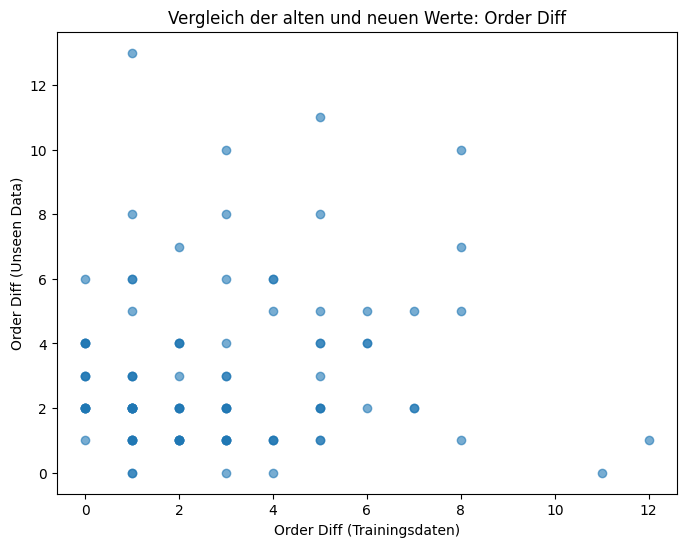

In [ ]:
import matplotlib.pyplot as plt

# Scatterplot für Vergleich von 'order_diff'
plt.figure(figsize=(8, 6))
plt.scatter(df13['order_diff'].sample(100), orders_class2['order_diff'].sample(100), alpha=0.6)
plt.xlabel('Order Diff (Trainingsdaten)')
plt.ylabel('Order Diff (Unseen Data)')
plt.title('Vergleich der alten und neuen Werte: Order Diff')
plt.show()


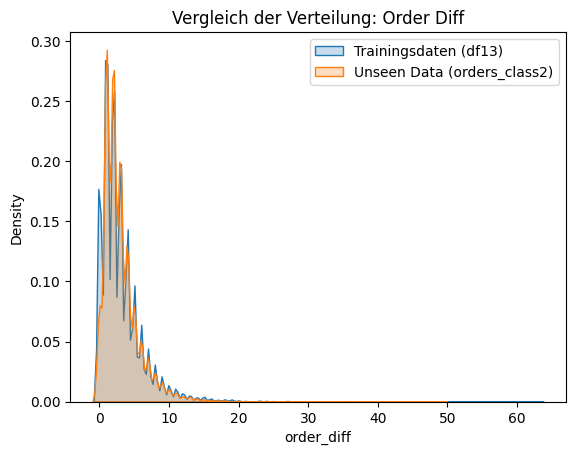

In [ ]:
import seaborn as sns

# Verteilung von 'order_diff' in df13 und orders_class2
sns.kdeplot(df13['order_diff'], label='Trainingsdaten (df13)', fill=True)
sns.kdeplot(orders_class2['order_diff'], label='Unseen Data (orders_class2)', fill=True)
plt.title('Vergleich der Verteilung: Order Diff')
plt.legend()
plt.show()


In [ ]:
# Zufällige Stichprobe aus orders_class2
sample_index = 10  # Beispielindex
sample = orders_class2.iloc[sample_index]

# Ähnlichste Fälle aus df13
neighbors = indices[sample_index]
similar_cases = df13.iloc[neighbors]

# Vergleich ausgeben
print("Unseen Data Beispiel:")
print(sample[['order_diff', 'duplicate_item_return_rate', 'duplicate_flag_by_cust_date_cat_size_return_rate']])

print("\nÄhnliche Fälle aus df13:")
print(similar_cases[['order_diff', 'duplicate_item_return_rate', 'duplicate_flag_by_cust_date_cat_size_return_rate']])


Unseen Data Beispiel:
order_diff                                                 3
duplicate_item_return_rate                               0.4
duplicate_flag_by_cust_date_cat_size_return_rate    0.266667
Name: 10, dtype: object

Ähnliche Fälle aus df13:
        order_diff  duplicate_item_return_rate  \
368912           3                         0.5   
368911           3                         0.5   
445533           2                         0.5   
382917           3                         0.0   
368910           3                         0.5   

        duplicate_flag_by_cust_date_cat_size_return_rate  
368912                                          0.500000  
368911                                          0.333333  
445533                                          0.000000  
382917                                          0.000000  
368910                                          0.500000  


## Holiday

In [ ]:
import requests
import pandas as pd

# Mapping von Bundeslandnamen zu API-Abkürzungen
state_abbreviations = {
    'Baden-Wuerttemberg': 'BW',
    'Bavaria': 'BY',
    'Berlin': 'BE',
    'Brandenburg': 'BB',
    'Bremen': 'HB',
    'Hamburg': 'HH',
    'Hesse': 'HE',
    'Mecklenburg-Western Pomerania': 'MV',
    'Lower Saxony': 'NI',
    'North Rhine-Westphalia': 'NW',
    'Rhineland-Palatinate': 'RP',
    'Saarland': 'SL',
    'Saxony': 'SN',
    'Saxony-Anhalt': 'ST',
    'Schleswig-Holstein': 'SH',
    'Thuringia': 'TH'
}

# Feiertage für ein Jahr und Bundesland abrufen
def fetch_feiertage(year, state_abbr):
    url = f"https://feiertage-api.de/api/?jahr={year}&nur_land={state_abbr}"
    response = requests.get(url)
    if response.status_code == 200:
        data = response.json()
        if isinstance(data, dict):
            return pd.DataFrame([
                {"datum": pd.to_datetime(v['datum']), "name": k}  # Key ist Feiertagsname
                for k, v in data.items() if 'datum' in v
            ])
    return pd.DataFrame(columns=["datum", "name"])

# Feiertage für 2012 und 2013 abrufen und kombinieren
feiertage = pd.concat([
    fetch_feiertage(2012, abbr).assign(state=state)
    for state, abbr in state_abbreviations.items()
] + [
    fetch_feiertage(2013, abbr).assign(state=state)
    for state, abbr in state_abbreviations.items()
], ignore_index=True)

# Sicherstellen, dass 'orders_class2' geladen ist
# df13 ist hier durch 'orders_class2' ersetzt
orders_class2['orderDate'] = pd.to_datetime(orders_class2['orderDate'])

# Neue Spalte mit Bundesland-Abkürzungen hinzufügen
orders_class2['state_abbr'] = orders_class2['state'].map(state_abbreviations)

# Feature "is_holiday" erstellen
def is_holiday(row):
    holidays = feiertage[(feiertage['state'] == row['state'])]['datum']
    return 1 if row['orderDate'] in holidays.values else 0

# Wende die Funktion auf dein Dataset orders_class2 an
orders_class2['is_holiday'] = orders_class2.apply(is_holiday, axis=1)

# Ergebnis anzeigen
print(orders_class2)


KeyboardInterrupt: 

In [ ]:
import pandas as pd
from datetime import timedelta

# Hilfsfunktion, um ein Datum in einem Intervall zu prüfen
def date_within(date, interval):
    start, end = interval
    return start <= date <= end

# Neue Funktion zum Klassifizieren von Tagen relativ zu Feiertagen
def classify_holiday(row):
    holidays = feiertage[(feiertage['state'] == row['state'])]['datum']
    for holiday in holidays:
        # Definieren der Intervalle relativ zum Feiertag
        interval = (holiday - timedelta(days=7), holiday + timedelta(days=7))
        before_int = (holiday - timedelta(days=14), holiday - timedelta(days=7))
        after_int = (holiday + timedelta(days=7), holiday + timedelta(days=14))

        # Prüfen, ob das Bestelldatum in einem der Intervalle liegt
        if date_within(row['orderDate'], interval):
            return "during"
        elif date_within(row['orderDate'], before_int):
            return "before"
        elif date_within(row['orderDate'], after_int):
            return "after"
    return "other"

# Sicherstellen, dass die Daten richtig formatiert sind
orders_class2['orderDate'] = pd.to_datetime(orders_class2['orderDate'])

# Neue Spalte holiday_class hinzufügen
orders_class2['holiday_class'] = orders_class2.apply(classify_holiday, axis=1)

# Ergebnis anzeigen
print(orders_class2)


In [ ]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
orders_class2['holiday_class_category_encoded'] = label_encoder.fit_transform(orders_class2['holiday_class'])


## log_likelihood_ratio_by_price / log_likelihood_ratio_by_customer_and_price

In [ ]:
#orders_class3 = orders_class2.copy()


# Schritt 1: Durchschnitt der Log-Likelihood-Ratio pro product_category und price berechnen
average_llr_by_category_price = (
    df13.groupby(['product_category', 'price'])['log_likelihood_ratio_by_customer_and_price']
    .mean()
    .reset_index()
)

# Schritt 2: Entferne Duplikate basierend auf 'product_category' und 'price'
average_llr_by_category_price = average_llr_by_category_price.drop_duplicates()

# Schritt 3: Merge mit orders_class2 basierend auf product_category und price
orders_class2 = orders_class2.merge(
    average_llr_by_category_price,  # Aggregierte Daten
    on=['product_category', 'price'],  # Verknüpfungskriterien
    how='left'  # 'Left join', um die Struktur von orders_class2 zu behalten
)

# Fehlende Werte in 'log_likelihood_ratio_by_customer_and_price' mit 0 auffüllen (falls nötig)
orders_class2['log_likelihood_ratio_by_customer_and_price'] = orders_class2['log_likelihood_ratio_by_customer_and_price'].fillna(0)

# Ergebnisse überprüfen
print(orders_class2[['product_category', 'price', 'log_likelihood_ratio_by_customer_and_price']].drop_duplicates().head())


  product_category  price  log_likelihood_ratio_by_customer_and_price
0            Shoes   89.9                                    0.161688
1            Shoes   99.9                                    0.150388
2            Shoes   79.9                                    0.195555
4            Shoes  119.9                                    0.223660
8            Shoes   29.9                                   -0.033949


In [ ]:
orders_class2[['product_category', 'price', 'log_likelihood_ratio_by_customer_and_price']]

,product_category,price,log_likelihood_ratio_by_customer_and_price
0,Shoes,89.9,0.161688
1,Shoes,99.9,0.150388
2,Shoes,79.9,0.195555
3,Shoes,89.9,0.161688
4,Shoes,119.9,0.223660
...,...,...,...
50073,Clothing,69.9,0.138048
50074,Clothing,64.9,0.234122
50075,Clothing,79.9,0.187627
50076,Clothing,59.9,-0.003647


In [ ]:
# Ensures all columns are shown
pd.set_option('display.max_columns', None)
# Now print all columns with their names
print(orders_class2.columns)


Index(['orderItemID', 'orderDate', 'deliveryDate', 'itemID', 'size', 'color',
       'manufacturerID', 'price', 'customerID', 'salutation', 'dateOfBirth',
       'state', 'creationDate', 'non_null_delivery_count',
       'unique_delivery_dates', 'deliveryTime', 'age', 'color_miss',
       'color_hex', 'color_rgb', 'r', 'g', 'b', 'recency', 'frequency',
       'average_frequency', 'customer_return_rate', 'product_category',
       'exact_product_count', 'category_count', 'manufacturer_count',
       'count_without_size', 'count_without_color',
       'similar_product_count_size_color', 'total_products_in_cart',
       'cart_size_flag', 'return_rate_size_product_category', 'total_orders',
       'total_returns', 'return_rate_color', 'category_variation',
       'free_return', 'average_cart_value', 'highest_price_item',
       'discount_percentage', 'discount_rank', 'price_rank',
       'min_discount_item', 'mean_discount_item', 'min_price_item',
       'max_price_item', 'mean_price_item'

In [ ]:
# Drop 'order_count' and 'return_count' columns from df9
#orders_class2 = orders_class2.drop(columns=['log_likelihood_ratio_by_customer_and_price'])


In [ ]:
# Filter für fehlende Kombinationen von customerID und closest_price
missing_combinations = orders_class2[
    ~orders_class2.set_index(['customerID', 'price']).index.isin(
        df13.set_index(['customerID', 'price']).index
    )
]

# Anzahl der fehlenden Kombinationen
missing_combinations_count = len(missing_combinations)

# Ausgabe
print(f"Anzahl der fehlenden Kombinationen: {missing_combinations_count}")


Anzahl der fehlenden Kombinationen: 35762


In [ ]:
# Extract unique prices from df13 and orders_class2
training_prices = df13['price'].unique()
class_prices = orders_class2['price'].unique()

# Find closest price for each price in orders_class2
closest_prices_mapping = {
    price: min(training_prices, key=lambda x: abs(x - price)) for price in class_prices
}

# Map the closest prices back to orders_class2
orders_class2['closest_price'] = orders_class2['price'].map(closest_prices_mapping)

# Display the updated orders_class2 DataFrame
#print(orders_class2)


In [ ]:
# Merge mit reduziertem `df13` durch Entfernen von Duplikaten
orders_class2 = orders_class2.merge(
    df13[['price', 'log_likelihood_ratio_by_price']].drop_duplicates(),
    left_on='closest_price',  # Verwende die bereits berechnete Spalte `closest_price`
    right_on='price',
    how='left'
)

# Optional: Entferne unnötige Spalten, um das DataFrame sauber zu halten
orders_class2.drop(columns=['price_y'], inplace=True)
orders_class2.rename(columns={'price_x': 'price'}, inplace=True)

# Ergebnis anzeigen
print(orders_class2[['price', 'closest_price', 'log_likelihood_ratio_by_price']].head())


   price  closest_price  log_likelihood_ratio_by_price
0   89.9           89.9                       0.169731
1   99.9           99.9                       0.125334
2   79.9           79.9                       0.189654
3   89.9           89.9                       0.169731
4  119.9          119.9                       0.269186


In [ ]:
orders_class2[['price','closest_price' ,'log_likelihood_ratio_by_price']]

,price,closest_price,log_likelihood_ratio_by_price
0,89.9,89.9,0.169731
1,99.9,99.9,0.125334
2,79.9,79.9,0.189654
3,89.9,89.9,0.169731
4,119.9,119.9,0.269186
...,...,...,...
50073,69.9,69.9,0.154487
50074,64.9,64.9,-0.037809
50075,79.9,79.9,0.189654
50076,59.9,59.9,-0.008041


In [ ]:
orders_class3.info()

NameError: name 'orders_class3' is not defined

In [ ]:
print(orders_class2[['customerID', 'closest_price']].dtypes)
print(df13[['customerID', 'price']].dtypes)


In [ ]:
orders_class2['customerID'] = orders_class2['customerID'].astype(str)
df13['customerID'] = df13['customerID'].astype(str)
orders_class2['closest_price'] = orders_class2['closest_price'].astype(float)
df13['price'] = df13['price'].astype(float)


In [ ]:
missing_combinations = orders_class2[
    ~orders_class2.set_index(['customerID', 'closest_price']).index.isin(
        df13.set_index(['customerID', 'price']).index
    )
]
print(f"Anzahl der fehlenden Kombinationen: {len(missing_combinations)}")
print(missing_combinations[['customerID', 'closest_price']].drop_duplicates())


In [ ]:
print(orders_class2['closest_price'].isna().sum())


In [ ]:
orders_class3 = orders_class2.copy()

# Entferne Duplikate basierend nur auf `price` in df13
df13_unique = df13[['price', 'log_likelihood_ratio_by_customer_and_price']].drop_duplicates(subset=['price'])

# Erstelle eine Kopie von orders_class2 in orders_class3
orders_class3 = orders_class2.copy()

# Merge basierend auf `closest_price` und `price`
orders_class3 = orders_class3.merge(
    df13_unique,
    left_on='closest_price',
    right_on='price',
    how='left'
)

# Fülle fehlende Werte in log_likelihood_ratio_by_customer_and_price
orders_class3['log_likelihood_ratio_by_customer_and_price'] = orders_class3['log_likelihood_ratio_by_customer_and_price'].fillna(
    orders_class3['log_likelihood_ratio_by_customer_and_price']
)

# Anzahl der Zeilen überprüfen
print(f"Anzahl der Zeilen in orders_class3 nach dem Merge: {len(orders_class3)}")

# Überprüfen der ersten Zeilen
print(orders_class3[['closest_price', 'price_x', 'log_likelihood_ratio_by_customer_and_price']].head())


In [ ]:
print(len(df13_unique))
print(df13_unique.duplicated(subset=['price']).sum())


In [ ]:
print(orders_class2['closest_price'].unique())
print(df13['price'].unique())


In [ ]:
orders_class3

### merg on log_likelihood_ratio_by_price

In [ ]:
# Erstelle eine Kopie von orders_class2 in orders_class3
orders_class3 = orders_class2.copy()

# Überprüfen, ob die Spalte 'log_likelihood_ratio_by_customer_and_price' existiert
if 'log_likelihood_ratio_by_customer_and_price' not in orders_class3.columns:
    # Spalte initialisieren, falls sie nicht existiert
    orders_class3['log_likelihood_ratio_by_customer_and_price'] = np.nan

# Fülle die fehlenden Werte mit 'log_likelihood_ratio_by_price'
orders_class3['log_likelihood_ratio_by_customer_and_price'] = orders_class3['log_likelihood_ratio_by_customer_and_price'].fillna(
    orders_class3['log_likelihood_ratio_by_price']
)

# Ergebnis überprüfen
print(orders_class3[['customerID', 'itemID', 'price', 'log_likelihood_ratio_by_customer_and_price']].head())

# Anzahl der verbleibenden fehlenden Werte
missing_values_count = orders_class3['log_likelihood_ratio_by_customer_and_price'].isna().sum()
print(f"Anzahl der verbleibenden fehlenden Werte: {missing_values_count}")


### merg on itemID,price

In [ ]:
# Erstelle eine Kopie von orders_class2 in orders_class3
orders_class3 = orders_class2.copy()

# Sicherstellen, dass `df13` eindeutige Kombinationen von `itemID` und `price` enthält
df13_unique = df13[['itemID', 'price', 'log_likelihood_ratio_by_customer_and_price']].drop_duplicates(subset=['itemID', 'price'])

# Merge basierend auf itemID und price
orders_class3 = orders_class3.merge(
    df13_unique,
    on=['itemID', 'price'],
    how='left'
)

# Fülle fehlende Werte in log_likelihood_ratio_by_customer_and_price auf
orders_class3['log_likelihood_ratio_by_customer_and_price'] = orders_class3['log_likelihood_ratio_by_customer_and_price'].fillna(
    orders_class3['log_likelihood_ratio_by_customer_and_price']
)

# Ergebnis anzeigen
print(orders_class3[['customerID', 'itemID', 'price', 'log_likelihood_ratio_by_customer_and_price']].head())



In [ ]:
# Überprüfe auf Duplikate in orders_class3
duplicates = orders_class3.duplicated()
print(f"Anzahl der Duplikate: {duplicates.sum()}")

# Entferne Duplikate, falls vorhanden
orders_class3 = orders_class3.drop_duplicates()

# Anzahl der Zeilen nach Entfernen der Duplikate
print(f"Anzahl der Zeilen nach Duplikatentfernung: {len(orders_class3)}")


In [ ]:
# Lade die ursprüngliche Version von orders_class2, falls verfügbar
# Ursprüngliche Version speichern
original_orders_class2 = orders_class2.copy()

# Vergleich der Zeilen in orders_class3, die nicht in der ursprünglichen orders_class2 sind
new_rows = orders_class3.merge(original_orders_class2, how='outer', indicator=True).query('_merge == "left_only"')

# Anzahl der neuen Zeilen anzeigen
print(f"Anzahl neuer Zeilen: {len(new_rows)}")

# Anzeige der neuen Zeilen
print(new_rows)


In [ ]:
# Vergleich mit Originalversion
differences = orders_class2.merge(original_orders_class2, how='outer', indicator=True)
print(differences['_merge'].value_counts())


In [ ]:
# Zeilenanzahl in der ursprünglichen Datenquelle prüfen
print(f"Zeilenanzahl in der ursprünglichen Quelle von orders_class2: {len(original_data_source)}")


In [ ]:
orders_class2[['customerID', 'price', 'closest_price', 'log_likelihood_ratio_by_customer_and_price','log_likelihood_ratio_by_price']]

In [ ]:

# Check for any missing values
orders_class2.isnull().sum()

In [ ]:


#filtered_df12 = df13[df13['itemID'] == 134] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

#filtered_df12 = df13[df13['itemID'] == 251]
#filtered_df12 = df13[df13['itemID'] == 156] # 23,24 36 38 40 Clothing
#filtered_df12 = df13[(df13['customerID'] == 6) ]
#filtered_df12 = df13[(df13['customerID'] == 348) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 12107) ]
filtered_df12 = df13[(df13['price'] == 17.4) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
filtered_df12[[''customerID', 'price', 'closest_price', 'log_likelihood_ratio_by_customer_and_price'']]


In [ ]:
# Log-Likelihood-Ratio nach Preis joinen
orders_class2 = orders_class2.merge(
    df13[['price', 'log_likelihood_ratio_by_price']].drop_duplicates(),
    on='price',
    how='left'
)

# Log-Likelihood-Ratio nach Kunde und Preis joinen
orders_class2 = orders_class2.merge(
    df13[['customerID', 'price', 'log_likelihood_ratio_by_customer_and_price']].drop_duplicates(),
    on=['customerID', 'price'],
    how='left'
)

# Ergebnis überprüfen
print(orders_class2.head())


In [ ]:
orders_class2.info()

In [ ]:
orders_class2['log_likelihood_ratio_by_price'].fillna(0, inplace=True)
orders_class2['log_likelihood_ratio_by_customer_and_price'].fillna(0, inplace=True)


In [ ]:
import pandas as pd
import numpy as np
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler

def knn_similarity_with_features(train_df, unseen_df, features, k=5):
    """
    Findet ähnliche Fälle basierend auf mehreren Features und berechnet LLR-Werte.
    """
    # Wähle die relevanten Features
    train_features = train_df[features].fillna(0)
    unseen_features = unseen_df[features].fillna(0)

    # Standard Scaling der Features
    scaler = StandardScaler()
    train_features_scaled = scaler.fit_transform(train_features)
    unseen_features_scaled = scaler.transform(unseen_features)

    # KNN-Modell trainieren
    knn = NearestNeighbors(n_neighbors=k, metric='euclidean')
    knn.fit(train_features_scaled)

    # Berechnung der Nachbarn
    distances, indices = knn.kneighbors(unseen_features_scaled)

    # LLR-Werte berechnen
    llr_by_price = []
    llr_by_customer_price = []

    for i in range(len(unseen_df)):
        # Ähnliche Zeilen aus Trainingsdaten
        similar_rows = train_df.iloc[indices[i]]

        # Mittelwert der LLR-Werte berechnen
        llr_by_price.append(similar_rows['log_likelihood_ratio_by_price'].mean())
        llr_by_customer_price.append(similar_rows['log_likelihood_ratio_by_customer_and_price'].mean())

    # Neue LLR-Features hinzufügen
    unseen_df['log_likelihood_ratio_by_price'] = llr_by_price
    unseen_df['log_likelihood_ratio_by_customer_and_price'] = llr_by_customer_price

    return unseen_df

# Liste der Features
features = ['age', 'deliveryTime', 'price', 'category_count', 'manufacturer_count',
            'count_without_size', 'similar_product_count_size_color', 'count_without_color',
            'total_products_in_cart', 'return_rate_size_product_category', 'return_rate_color',
            'category_variation', 'free_return', 'average_cart_value', 'discount_percentage',
            'discount_rank', 'price_rank', 'product_category_encoded',
            'availability_season_category_encoded', 'duplicate_flag_by_cust_date_cat_size',
            'duplicate_flag_by_cust_date_item', 'customer_return_rate', 'salutation_Family',
            'salutation_Mr', 'salutation_Mrs', 'salutation_not reported', 'order_diff',
            'return_count', 'duplicate_item_return_rate', 'duplicate_flag_by_cust_date_cat_size_return_rate']

# Beispielanwendung
orders_class2 = knn_similarity_with_features(df13, orders_class2, features)

# Ergebnis anzeigen
print(orders_class2.head())


## LOG DeliveryTime

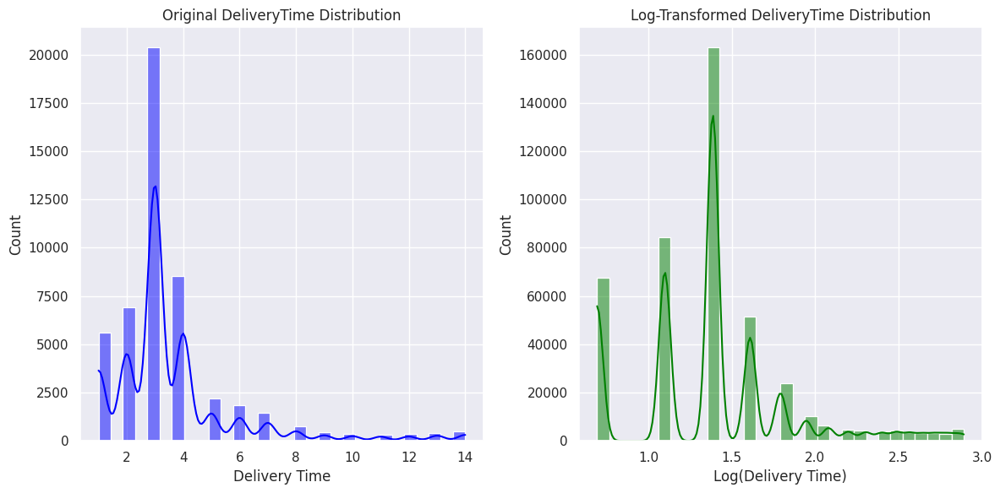

In [ ]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Log-Transformation der deliveryTime-Daten
orders_class2['deliveryTime_log'] = np.log1p(orders_class2['deliveryTime'])  # log1p für log(1+x), um 0-Werte zu vermeiden

# Originaldaten visualisieren
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.histplot(orders_class2['deliveryTime'], kde=True, bins=30, color='blue')
plt.title('Original DeliveryTime Distribution')
plt.xlabel('Delivery Time')

# Log-transformierte Daten visualisieren
plt.subplot(1, 2, 2)
sns.histplot(df13['deliveryTime_log'], kde=True, bins=30, color='green')
plt.title('Log-Transformed DeliveryTime Distribution')
plt.xlabel('Log(Delivery Time)')

plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd

# Annahme: df13 enthält die Spalte 'Delivery_Time'
def categorize_delivery_time(x):
    if x <= 3:
        return 'short'  # 1-3 Tage
    elif 4 <= x <= 6:
        return 'medium'  # 4-6 Tage
    else:
        return 'long'  # > 6 Tage

# Neue Spalte hinzufügen
orders_class2['delivery_time_category'] = orders_class2['deliveryTime'].apply(categorize_delivery_time)

# Kontrolle
print(orders_class2[['deliveryTime', 'delivery_time_category']].head())
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()
orders_class2['delivery_time_category_category_encoded'] = label_encoder.fit_transform(orders_class2['delivery_time_category'])


   deliveryTime delivery_time_category
0           2.0                  short
1           2.0                  short
2           2.0                  short
3           3.0                  short
4           2.0                  short


In [ ]:
import pandas as pd

# Neue Kategorisierungsfunktion
def categorize_delivery_time_v2(x):
    if x <= 2:
        return 'very_short'
    elif 3 <= x <= 4:
        return 'short'
    elif 5 <= x <= 6:
        return 'medium'
    else:
        return 'long'

# Neue Kategorie-Spalte erstellen
orders_class2['delivery_time_category_v2'] = orders_class2['deliveryTime'].apply(categorize_delivery_time_v2)

# Kodierung der neuen Kategorie
orders_class2['delivery_time_category_v2_encoded'] = orders_class2['delivery_time_category_v2'].astype('category').cat.codes

# Kontrolle
print(orders_class2[['deliveryTime', 'delivery_time_category_v2', 'delivery_time_category_v2_encoded']].head())


   deliveryTime delivery_time_category_v2  delivery_time_category_v2_encoded
0           2.0                very_short                                  3
1           2.0                very_short                                  3
2           2.0                very_short                                  3
3           3.0                     short                                  2
4           2.0                very_short                                  3


## price

In [ ]:
unique_prices = orders_class2['price'].nunique()
print(f"Anzahl der einzigartigen Preise: {unique_prices}")


Anzahl der einzigartigen Preise: 166


In [ ]:
unique_price_list = orders_class2['price'].unique()
print(unique_price_list)


[ 89.9   99.9   79.9  119.9   29.9  189.9   59.9   39.98  79.95  69.9
  35.95 129.9   34.9  119.95  49.9   39.9   24.9   20.   120.    69.95
  19.9   49.95  14.9  160.    16.9   29.95  25.95 139.9  159.9   44.95
  26.9   60.   199.95 129.   179.9    8.9   89.95 169.9  149.9  109.9
 125.    99.95 130.   179.    14.95  64.95  59.95 155.   124.9  109.95
 129.95   9.9   44.9   64.9   21.9  110.    96.    72.    54.9    7.95
  90.   150.    85.95 169.   104.   136.    57.95 279.9   94.   149.95
  74.9   78.   144.9  220.     4.95 249.9  135.    35.9  147.9   12.95
   9.95 126.   132.     6.95   5.95 123.    75.95 169.95 140.   117.
 145.    86.   100.   108.    39.95 189.   139.   109.    84.    75.9
  85.    17.9   23.9   49.98 149.    15.95 159.    19.95  80.   102.
   8.    45.    65.95 119.    34.95  54.95 279.    99.    62.95 134.9
 111.   199.9   55.95  74.95  15.9  219.9    8.95  97.    65.    25.13
  33.53  92.95 289.   255.   154.9   92.    27.9   32.95  37.95  72.95
 114.    54.  

<ipython-input-645-9c96b543ed7c>:16: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  g.set_xticklabels(g.get_xticklabels(), rotation=45, horizontalalignment='right')


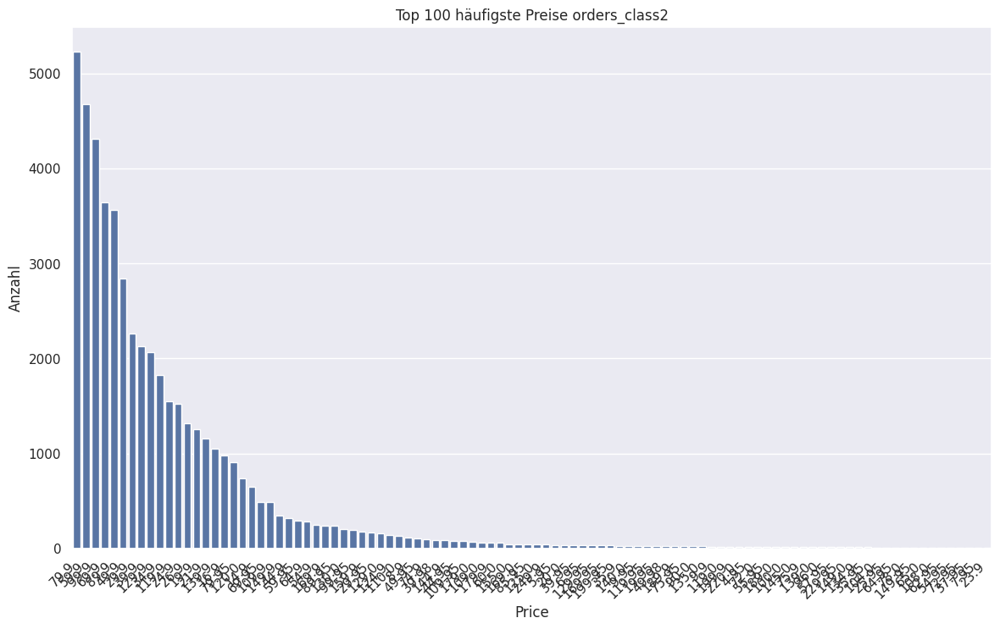

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt



# Top 100 häufigste Preise auswählen
top_100_prices = orders_class2['price'].value_counts().reset_index().head(100)
top_100_prices.columns = ['price', 'count']

# Diagramm erstellen
sns.set(rc={'figure.figsize': (14, 8)})
g = sns.barplot(x='price', y='count', data=top_100_prices, order=top_100_prices['price'])

# X-Achsenticks anpassen
g.set_xticklabels(g.get_xticklabels(), rotation=45, horizontalalignment='right')

# Titel und Achsenbeschriftungen hinzufügen
plt.title('Top 100 häufigste Preise orders_class2')
plt.xlabel('Price')
plt.ylabel('Anzahl')

# Diagramm anzeigen
plt.show()


In [ ]:
orders_class2['price_log'] = np.log1p(orders_class2['price'])


In [ ]:
import pandas as pd

# Neue Preisgrenzen und Labels definieren
bins = [0, 20, 50, 100, 150, 200, float('inf')]
labels = ['very_cheap', 'cheap', 'mid_price', 'high_price', 'very_high_price', 'luxury']


# Preise kategorisieren für orders_class2
orders_class2['price_category'] = pd.cut(orders_class2['price'], bins=bins, labels=labels)

# Kodierung der Kategorien
orders_class2['price_category_encoded'] = orders_class2['price_category'].cat.codes

# Ergebnisse überprüfen
print(orders_class2[['price', 'price_category', 'price_category_encoded']].head())


   price price_category  price_category_encoded
0   89.9      mid_price                       2
1   99.9      mid_price                       2
2   79.9      mid_price                       2
3   89.9      mid_price                       2
4  119.9     high_price                       3


In [ ]:
# Preise in 4 Quartile aufteilen
orders_class2['price_category_quantile'] = pd.qcut(orders_class2['price'], q=4, labels=['Q1', 'Q2', 'Q3', 'Q4'])

# Kodierung der Kategorien
orders_class2['price_category_quantile_encoded'] = orders_class2['price_category_quantile'].cat.codes

# Ergebnis überprüfen
print(orders_class2[['price', 'price_category_quantile', 'price_category_quantile_encoded']].head())


   price price_category_quantile  price_category_quantile_encoded
0   89.9                      Q3                                2
1   99.9                      Q3                                2
2   79.9                      Q3                                2
3   89.9                      Q3                                2
4  119.9                      Q4                                3


## cluster und days_since_launch

In [ ]:
# Ensures all columns are shown
pd.set_option('display.max_columns', None)
# Now print all columns with their names
print(orders_class2.columns)


Index(['orderItemID', 'orderDate', 'deliveryDate', 'itemID', 'size', 'color',
       'manufacturerID', 'price', 'customerID', 'salutation', 'dateOfBirth',
       'state', 'creationDate', 'non_null_delivery_count',
       'unique_delivery_dates', 'deliveryTime', 'age', 'color_miss',
       'color_hex', 'color_rgb', 'r', 'g', 'b', 'size_false', 'recency',
       'frequency', 'average_frequency', 'customer_return_rate',
       'product_category', 'product_category_encoded', 'size_category',
       'size_category_encoded', 'sub_category', 'target_group',
       'target_group_encoded', 'sub_category_encoded', 'international_UK_size',
       'exact_product_count', 'category_count', 'manufacturer_count',
       'count_without_size', 'count_without_color',
       'similar_product_count_size_color', 'total_products_in_cart',
       'cart_size_flag', 'return_rate_size_product_category',
       'return_rate_color', 'free_return', 'average_cart_value',
       'highest_price_item', 'discount_percen

In [ ]:
# Entferne Duplikate in df13 basierend auf `itemID` und `first_availability_date`
df13_deduplicated = df13[['itemID', 'first_availability_date']].drop_duplicates()

# Join `first_availability_date` von df13 zu orders_class2
orders_class2 = orders_class2.merge(
    df13_deduplicated,
    on='itemID',
    how='left'
)


In [ ]:
# Identifiziere neue `itemID`s
new_items = orders_class2[orders_class2['first_availability_date'].isna()]

# Berechne `first_availability_date` für neue `itemID`s
first_availability_new = new_items.groupby('itemID')['orderDate'].min().reset_index()
first_availability_new.rename(columns={'orderDate': 'first_availability_date'}, inplace=True)

# Aktualisiere `first_availability_date` für neue `itemID`s
orders_class2 = orders_class2.merge(
    first_availability_new,
    on='itemID',
    how='left',
    suffixes=('', '_new')
)

# Ersetze fehlende Werte in `first_availability_date` mit berechneten Werten
orders_class2['first_availability_date'] = orders_class2['first_availability_date'].fillna(
    orders_class2['first_availability_date_new']
)

# Entferne Hilfsspalte
orders_class2.drop(columns=['first_availability_date_new'], inplace=True)


In [ ]:
# Sicherstellen, dass `orderDate` und `first_availability_date` datetime sind
orders_class2['orderDate'] = pd.to_datetime(orders_class2['orderDate'])
orders_class2['first_availability_date'] = pd.to_datetime(orders_class2['first_availability_date'])

# Berechne `days_since_launch`
orders_class2['days_since_launch'] = (orders_class2['orderDate'] - orders_class2['first_availability_date']).dt.days


In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
orders_class2['days_since_launch_scaled'] = scaler.fit_transform(orders_class2[['days_since_launch']])


In [ ]:
"""
# Identifiziere neue `itemID`s
new_items = orders_class2[orders_class2['first_availability_date'].isna()]

# Berechne `first_availability_date` für neue `itemID`s
first_availability_new = new_items.groupby('itemID')['orderDate'].min().reset_index()
first_availability_new.rename(columns={'orderDate': 'first_availability_date'}, inplace=True)

# Aktualisiere `first_availability_date` für neue `itemID`s
orders_class2 = orders_class2.merge(
    first_availability_new,
    on='itemID',
    how='left',
    suffixes=('', '_new')
)

# Ersetze fehlende Werte in `first_availability_date` mit berechneten Werten
orders_class2['first_availability_date'] = orders_class2['first_availability_date'].fillna(
    orders_class2['first_availability_date_new']
)

# Entferne Hilfsspalte
orders_class2.drop(columns=['first_availability_date_new'], inplace=True)
"""

"\n# Identifiziere neue `itemID`s\nnew_items = orders_class2[orders_class2['first_availability_date'].isna()]\n\n# Berechne `first_availability_date` für neue `itemID`s\nfirst_availability_new = new_items.groupby('itemID')['orderDate'].min().reset_index()\nfirst_availability_new.rename(columns={'orderDate': 'first_availability_date'}, inplace=True)\n\n# Aktualisiere `first_availability_date` für neue `itemID`s\norders_class2 = orders_class2.merge(\n    first_availability_new,\n    on='itemID',\n    how='left',\n    suffixes=('', '_new')\n)\n\n# Ersetze fehlende Werte in `first_availability_date` mit berechneten Werten\norders_class2['first_availability_date'] = orders_class2['first_availability_date'].fillna(\n    orders_class2['first_availability_date_new']\n)\n\n# Entferne Hilfsspalte\norders_class2.drop(columns=['first_availability_date_new'], inplace=True)\n"

In [ ]:
# Zeige die wichtigsten Spalten
print(orders_class2[['itemID', 'orderDate', 'first_availability_date', 'days_since_launch']].head())

# Speichere das Ergebnis (falls nötig)
orders_class2.to_csv('orders_class2_with_features.csv', index=False)


   itemID  orderDate first_availability_date  days_since_launch
0    2347 2013-04-01              2013-01-02                 89
1    2741 2013-04-01              2013-01-05                 86
2    2514 2013-04-01              2013-01-02                 89
3    2347 2013-04-01              2013-01-02                 89
4    2690 2013-04-01              2013-01-04                 87


In [ ]:
"""
import pandas as pd

# Schritt 1: Sicherstellen, dass `orderDate` und `first_availability_date` in datetime konvertiert sind
df13['orderDate'] = pd.to_datetime(df13['orderDate'])
df13['first_availability_date'] = pd.to_datetime(df13['first_availability_date'])
orders_class2['orderDate'] = pd.to_datetime(orders_class2['orderDate'])

# Schritt 2: Duplikate aus df13 basierend auf `itemID` und `first_availability_date` entfernen
df13_deduplicated = df13[['itemID', 'first_availability_date']].drop_duplicates()

# Schritt 3: Merge der `first_availability_date` von df13 zu orders_class2
orders_class2 = orders_class2.merge(
    df13_deduplicated,
    on='itemID',
    how='left'
)

# Schritt 4: Identifikation neuer `itemID`s in orders_class2
new_items = orders_class2[orders_class2['first_availability_date'].isna()]

# Berechnung von `first_availability_date` für neue `itemID`s
first_availability_new = new_items.groupby('itemID')['orderDate'].min().reset_index()
first_availability_new.rename(columns={'orderDate': 'first_availability_date'}, inplace=True)

# Merge der berechneten `first_availability_date` für neue `itemID`s zurück in orders_class2
orders_class2 = orders_class2.merge(
    first_availability_new,
    on='itemID',
    how='left',
    suffixes=('', '_new')
)

# Ersetze fehlende Werte in `first_availability_date` mit den berechneten Werten
orders_class2['first_availability_date'] = orders_class2['first_availability_date'].fillna(
    orders_class2['first_availability_date_new']
)

# Entferne Hilfsspalte
orders_class2.drop(columns=['first_availability_date_new'], inplace=True)

# Schritt 5: Berechnung von `days_since_launch`
orders_class2['first_availability_date'] = pd.to_datetime(orders_class2['first_availability_date'])
orders_class2['days_since_launch'] = (orders_class2['orderDate'] - orders_class2['first_availability_date']).dt.days

# Ergebnisse überprüfen
print(orders_class2[['itemID', 'orderDate', 'first_availability_date', 'days_since_launch']].head())

# Anzahl neuer `itemID`s überprüfen
print(f"Anzahl neuer itemID in orders_class2: {len(new_items['itemID'].unique())}")
"""

'\nimport pandas as pd\n\n# Schritt 1: Sicherstellen, dass `orderDate` und `first_availability_date` in datetime konvertiert sind\ndf13[\'orderDate\'] = pd.to_datetime(df13[\'orderDate\'])\ndf13[\'first_availability_date\'] = pd.to_datetime(df13[\'first_availability_date\'])\norders_class2[\'orderDate\'] = pd.to_datetime(orders_class2[\'orderDate\'])\n\n# Schritt 2: Duplikate aus df13 basierend auf `itemID` und `first_availability_date` entfernen\ndf13_deduplicated = df13[[\'itemID\', \'first_availability_date\']].drop_duplicates()\n\n# Schritt 3: Merge der `first_availability_date` von df13 zu orders_class2\norders_class2 = orders_class2.merge(\n    df13_deduplicated,\n    on=\'itemID\',\n    how=\'left\'\n)\n\n# Schritt 4: Identifikation neuer `itemID`s in orders_class2\nnew_items = orders_class2[orders_class2[\'first_availability_date\'].isna()]\n\n# Berechnung von `first_availability_date` für neue `itemID`s\nfirst_availability_new = new_items.groupby(\'itemID\')[\'orderDate\'].min

In [ ]:
filtered_df12 = df13[(df13['itemID'] == 1567) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['itemID', 'orderDate', 'first_availability_date', 'days_since_launch']]


,itemID,orderDate,first_availability_date,days_since_launch
127540,1567,2012-07-27,2012-07-27,0
128655,1567,2012-07-29,2012-07-27,2
129468,1567,2012-07-30,2012-07-27,3
130593,1567,2012-08-01,2012-07-27,5
130696,1567,2012-08-01,2012-07-27,5
...,...,...,...,...
424751,1567,2013-03-21,2012-07-27,237
427630,1567,2013-03-23,2012-07-27,239
434441,1567,2013-03-27,2012-07-27,243
434961,1567,2013-03-27,2012-07-27,243


In [ ]:
filtered_df12 = orders_class2[(orders_class2['itemID'] == 1567) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['itemID', 'orderDate', 'first_availability_date', 'days_since_launch']]


,itemID,orderDate,first_availability_date,days_since_launch
23164,1567,2013-04-17,2012-07-27,264
36837,1567,2013-04-23,2012-07-27,270
43838,1567,2013-04-27,2012-07-27,274


## average_return_rate

In [ ]:
# Entferne Duplikate in df13 basierend auf `itemID` und `average_return_rate`
df13_deduplicated = df13[['itemID', 'average_return_rate']].drop_duplicates()

# Join von `average_return_rate` von df13 zu orders_class2
orders_class2 = orders_class2.merge(
    df13_deduplicated,
    on='itemID',
    how='left'
)

# Fehlende Werte in `average_return_rate` in orders_class2 mit 0 auffüllen
orders_class2['average_return_rate'] = orders_class2['average_return_rate'].fillna(0)

# Ergebnis prüfen
print(orders_class2.head())


   orderItemID  orderDate deliveryDate  itemID size    color  manufacturerID  \
0            1 2013-04-01   2013-04-03    2347   43  magenta               1   
1            2 2013-04-01   2013-04-03    2741   43     grey               1   
2            3 2013-04-01   2013-04-03    2514    9     ecru              19   
3            4 2013-04-01   2013-05-06    2347   42    brown               1   
4            5 2013-04-01   2013-04-03    2690   43     grey               1   

   price  customerID salutation dateOfBirth  state creationDate  \
0   89.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
1   99.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
2   79.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
3   89.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
4  119.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   

   non_null_delivery_count  unique_delivery_dates  deliveryTime   age  \
0                        4                 

## return_rate_std

In [ ]:
# Entferne Duplikate in df13 basierend auf `itemID` und `average_return_rate`
df13_deduplicated = df13[['itemID', 'return_rate_std']].drop_duplicates()

# Join von `average_return_rate` von df13 zu orders_class2
orders_class2 = orders_class2.merge(
    df13_deduplicated,
    on='itemID',
    how='left'
)

# Fehlende Werte in `average_return_rate` in orders_class2 mit 0 auffüllen
orders_class2['return_rate_std'] = orders_class2['return_rate_std'].fillna(0)

# Ergebnis prüfen
print(orders_class2.head())


   orderItemID  orderDate deliveryDate  itemID size    color  manufacturerID  \
0            1 2013-04-01   2013-04-03    2347   43  magenta               1   
1            2 2013-04-01   2013-04-03    2741   43     grey               1   
2            3 2013-04-01   2013-04-03    2514    9     ecru              19   
3            4 2013-04-01   2013-05-06    2347   42    brown               1   
4            5 2013-04-01   2013-04-03    2690   43     grey               1   

   price  customerID salutation dateOfBirth  state creationDate  \
0   89.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
1   99.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
2   79.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
3   89.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
4  119.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   

   non_null_delivery_count  unique_delivery_dates  deliveryTime   age  \
0                        4                 

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
orders_class2['days_since_launch_scaled'] = scaler.fit_transform(orders_class2[['days_since_launch']])


In [ ]:
orders_class2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50078 entries, 0 to 50077
Data columns (total 82 columns):
 #   Column                                            Non-Null Count  Dtype         
---  ------                                            --------------  -----         
 0   orderItemID                                       50078 non-null  int64         
 1   orderDate                                         50078 non-null  datetime64[ns]
 2   deliveryDate                                      50078 non-null  datetime64[ns]
 3   itemID                                            50078 non-null  int64         
 4   size                                              50078 non-null  object        
 5   color                                             50078 non-null  object        
 6   manufacturerID                                    50078 non-null  int64         
 7   price                                             50078 non-null  float64       
 8   customerID                

In [ ]:


#filtered_df12 = df13[df13['itemID'] == 2669] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

filtered_df12 = orders_class2[orders_class2['itemID'] == 2669]
#filtered_df12 = df13[df13['itemID'] == 134] # 23,24 36 38 40 Clothing
#filtered_df12 = df13[(df13['customerID'] == 6) ]
#filtered_df12 = df13[(df13['customerID'] == 348) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 12107) ]
#filtered_df12 = df13[(df13['orderDate'] == '2012-12-25') ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
filtered_df12[['orderDate',  'itemID', 'price','days_since_launch','average_return_rate','cluster']].drop_duplicates()


,orderDate,itemID,price,days_since_launch,average_return_rate,cluster
241,2013-04-01,2669,130.0,87,0.616216,1
1718,2013-04-02,2669,130.0,88,0.616216,1
3809,2013-04-03,2669,130.0,89,0.616216,1
5344,2013-04-04,2669,130.0,90,0.616216,1
6792,2013-04-05,2669,130.0,91,0.616216,1
9965,2013-04-08,2669,130.0,94,0.616216,1
10909,2013-04-09,2669,130.0,95,0.616216,1
12850,2013-04-10,2669,130.0,96,0.616216,1
13883,2013-04-07,2669,130.0,93,0.616216,1
14383,2013-04-11,2669,130.0,97,0.616216,1


## log_likelihood_ratio_by_itemID_price

In [ ]:
# Drop 'order_count' and 'return_count' columns from df9
#orders_class2 = orders_class2.drop(columns=['log_likelihood_ratio_by_itemID_price'])


In [ ]:
# Selektiere nur relevante Spalten aus df13
log_likelihood_mapping = df13[['itemID', 'price', 'log_likelihood_ratio_by_itemID_price']].drop_duplicates()

# Entferne potenzielle Konflikte vor dem Merge
if 'log_likelihood_ratio_by_itemID_price' in orders_class2.columns:
    orders_class2 = orders_class2.drop(columns=['log_likelihood_ratio_by_itemID_price'])

# Führe den Merge durch
orders_class2 = orders_class2.merge(
    log_likelihood_mapping,
    on=['itemID', 'price'],
    how='left'
)

# Fehlende Werte (NaN) in log_likelihood_ratio_by_itemID_price behandeln
orders_class2['log_likelihood_ratio_by_itemID_price'] = orders_class2['log_likelihood_ratio_by_itemID_price'].fillna(0)

# Ergebnis anzeigen
print(orders_class2.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50078 entries, 0 to 50077
Data columns (total 83 columns):
 #   Column                                            Non-Null Count  Dtype         
---  ------                                            --------------  -----         
 0   orderItemID                                       50078 non-null  int64         
 1   orderDate                                         50078 non-null  datetime64[ns]
 2   deliveryDate                                      50078 non-null  datetime64[ns]
 3   itemID                                            50078 non-null  int64         
 4   size                                              50078 non-null  object        
 5   color                                             50078 non-null  object        
 6   manufacturerID                                    50078 non-null  int64         
 7   price                                             50078 non-null  float64       
 8   customerID                

## log_likelihood_ratio_by_itemID_price_days

In [ ]:
# Drop 'order_count' and 'return_count' columns from df9
#orders_class2 = orders_class2.drop(columns=['log_likelihood_ratio_by_itemID_price_days'])


In [ ]:
orders_class2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50078 entries, 0 to 50077
Data columns (total 83 columns):
 #   Column                                            Non-Null Count  Dtype         
---  ------                                            --------------  -----         
 0   orderItemID                                       50078 non-null  int64         
 1   orderDate                                         50078 non-null  datetime64[ns]
 2   deliveryDate                                      50078 non-null  datetime64[ns]
 3   itemID                                            50078 non-null  int64         
 4   size                                              50078 non-null  object        
 5   color                                             50078 non-null  object        
 6   manufacturerID                                    50078 non-null  int64         
 7   price                                             50078 non-null  float64       
 8   customerID                

## log_likelihood_ratio_by_itemID_price_cluster

In [ ]:
# Selektiere relevante Spalten aus df13
log_likelihood_mapping = df13[['itemID', 'price', 'cluster', 'log_likelihood_ratio_by_itemID_price_cluster']].drop_duplicates()

# Merge mit orders_class2
orders_class2 = orders_class2.merge(
    log_likelihood_mapping,
    on=['itemID', 'price', 'cluster'],
    how='left'
)

# Fehlende Werte behandeln
orders_class2['log_likelihood_ratio_by_itemID_price_cluster'] = orders_class2['log_likelihood_ratio_by_itemID_price_cluster'].fillna(0)

# Ergebnis anzeigen
print(orders_class2[['itemID', 'price', 'cluster', 'log_likelihood_ratio_by_itemID_price_cluster']].head())


   itemID  price  cluster  log_likelihood_ratio_by_itemID_price_cluster
0    2347   89.9        2                                     -0.167373
1    2741   99.9        1                                      0.420733
2    2514   79.9        1                                      0.634191
3    2347   89.9        2                                     -0.167373
4    2690  119.9        2                                      0.101352


## log_likelihood_ratio_by_price_and_return_rate

In [ ]:
# Deduplizieren und relevante Spalten für das Mapping auswählen
log_likelihood_mapping = df13[['price', 'average_return_rate', 'log_likelihood_ratio_by_price_and_return_rate']].drop_duplicates()

# Merge mit `orders_class2`
orders_class2 = orders_class2.merge(
    log_likelihood_mapping,
    on=['price', 'average_return_rate'],
    how='left'
)

# Fehlende Werte (NaN) behandeln, falls erforderlich
orders_class2['log_likelihood_ratio_by_price_and_return_rate'] = orders_class2['log_likelihood_ratio_by_price_and_return_rate'].fillna(0)

# Ergebnis prüfen
print(orders_class2[['price', 'average_return_rate', 'log_likelihood_ratio_by_price_and_return_rate']].head())


   price  average_return_rate  log_likelihood_ratio_by_price_and_return_rate
0   89.9             0.458175                                      -0.167373
1   99.9             0.604938                                       0.420733
2   79.9             0.654255                                       0.634191
3   89.9             0.458175                                      -0.167373
4  119.9             0.525641                                       0.101352


## log_likelihood_ratio_by_item_price_and_return_rate

In [ ]:
# Deduplizieren und relevante Spalten auswählen
log_likelihood_mapping = df13[['itemID', 'price', 'average_return_rate', 'log_likelihood_ratio_by_item_price_and_return_rate']].drop_duplicates()

# Merge mit `orders_class2`
orders_class2 = orders_class2.merge(
    log_likelihood_mapping,
    on=['itemID', 'price', 'average_return_rate'],
    how='left'
)

# Fehlende Werte (NaN) behandeln
orders_class2['log_likelihood_ratio_by_item_price_and_return_rate'] = orders_class2['log_likelihood_ratio_by_item_price_and_return_rate'].fillna(0)

# Ergebnis prüfen
print(orders_class2[['itemID', 'price', 'average_return_rate', 'log_likelihood_ratio_by_item_price_and_return_rate']].head())


   itemID  price  average_return_rate  \
0    2347   89.9             0.458175   
1    2741   99.9             0.604938   
2    2514   79.9             0.654255   
3    2347   89.9             0.458175   
4    2690  119.9             0.525641   

   log_likelihood_ratio_by_item_price_and_return_rate  
0                                          -0.167373   
1                                           0.420733   
2                                           0.634191   
3                                          -0.167373   
4                                           0.101352   


## log_likelihood_ratio_by_manufacturer_and_price

In [ ]:
# Ensures all columns are shown
pd.set_option('display.max_columns', None)
# Now print all columns with their names
print(df13.columns)


Index(['orderItemID', 'orderDate', 'deliveryDate', 'itemID', 'size', 'color',
       'manufacturerID', 'price', 'customerID', 'dateOfBirth',
       ...
       'region_encoded', 'total_orders_region', 'total_returns_region',
       'return_rate_region', 'total_kept_region',
       'total_orders_region_customer', 'total_returns_region_customer',
       'total_kept_region_customer', 'customer_region_return_rate',
       'average_customer_region_return_rate'],
      dtype='object', length=204)


In [ ]:
# Entfernen von Duplikaten in df13, um nur eindeutige Kombinationen von manufacturerID, price und LLR zu behalten
log_likelihood_mapping = df13[['manufacturerID', 'price', 'log_likelihood_ratio_by_manufacturer_and_price']].drop_duplicates()

# Join von `log_likelihood_ratio_by_manufacturer_and_price` auf orders_class2
orders_class2 = orders_class2.merge(
    log_likelihood_mapping,
    on=['manufacturerID', 'price'],
    how='left'
)

# Fehlende Werte (NaN) in `log_likelihood_ratio_by_manufacturer_and_price` behandeln
# Option 1: Setze einen Standardwert (z. B. 0)
orders_class2['log_likelihood_ratio_by_manufacturer_and_price'] = orders_class2['log_likelihood_ratio_by_manufacturer_and_price'].fillna(0)

# Option 2: Markiere fehlende Werte für weitere Analysen
orders_class2['log_likelihood_ratio_missing'] = orders_class2['log_likelihood_ratio_by_manufacturer_and_price'].isna()

# Ergebnis anzeigen
print(orders_class2[['manufacturerID', 'price', 'log_likelihood_ratio_by_manufacturer_and_price']].head())


   manufacturerID  price  log_likelihood_ratio_by_manufacturer_and_price
0               1   89.9                                       -0.096756
1               1   99.9                                        0.129544
2              19   79.9                                        0.463884
3               1   89.9                                       -0.096756
4               1  119.9                                        0.285101


## average_return_rate_manufacturerID, return_rate_std_manufacturerID, cluster_manufacturerID

In [ ]:
# Entferne Duplikate in df13, um die Spalten für das Merging vorzubereiten
manufacturer_features = df13[['manufacturerID',
                               'average_return_rate_manufacturerID',
                               'return_rate_std_manufacturerID',
                               'cluster_manufacturerID']].drop_duplicates()

# Merge die neuen Features in orders_class2
orders_class2 = orders_class2.merge(
    manufacturer_features,
    on='manufacturerID',
    how='left'
)

# Überprüfe das Ergebnis
print(orders_class2.head())


   orderItemID  orderDate deliveryDate  itemID size    color  manufacturerID  \
0            1 2013-04-01   2013-04-03    2347   43  magenta               1   
1            2 2013-04-01   2013-04-03    2741   43     grey               1   
2            3 2013-04-01   2013-04-03    2514    9     ecru              19   
3            4 2013-04-01   2013-05-06    2347   42    brown               1   
4            5 2013-04-01   2013-04-03    2690   43     grey               1   

   price  customerID salutation dateOfBirth  state creationDate  \
0   89.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
1   99.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
2   79.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
3   89.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
4  119.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   

   non_null_delivery_count  unique_delivery_dates  deliveryTime   age  \
0                        4                 

In [ ]:
orders_class2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50078 entries, 0 to 50077
Data columns (total 86 columns):
 #   Column                                            Non-Null Count  Dtype         
---  ------                                            --------------  -----         
 0   orderItemID                                       50078 non-null  int64         
 1   orderDate                                         50078 non-null  datetime64[ns]
 2   deliveryDate                                      50078 non-null  datetime64[ns]
 3   itemID                                            50078 non-null  int64         
 4   size                                              50078 non-null  object        
 5   color                                             50078 non-null  object        
 6   manufacturerID                                    50078 non-null  int64         
 7   price                                             50078 non-null  float64       
 8   customerID                

## average_return_rate_customerID und return_rate_std_customerID und cluster_customerID

In [ ]:
# Selektiere die relevanten Spalten aus df13
customer_features = df13[['customerID', 'average_return_rate_customerID', 'return_rate_std_customerID', 'cluster_customerID']].drop_duplicates()

# Merge die Features mit orders_class2 basierend auf customerID
orders_class2 = orders_class2.merge(
    customer_features,
    on='customerID',
    how='left'
)

# Fehlende Werte behandeln
orders_class2['average_return_rate_customerID'] = orders_class2['average_return_rate_customerID'].fillna(0)
orders_class2['return_rate_std_customerID'] = orders_class2['return_rate_std_customerID'].fillna(0)
orders_class2['cluster_customerID'] = orders_class2['cluster_customerID'].fillna(-1).astype(int)

# Ergebnis anzeigen
print(orders_class2.head())


   orderItemID  orderDate deliveryDate  itemID size    color  manufacturerID  \
0            1 2013-04-01   2013-04-03    2347   43  magenta               1   
1            2 2013-04-01   2013-04-03    2741   43     grey               1   
2            3 2013-04-01   2013-04-03    2514    9     ecru              19   
3            4 2013-04-01   2013-05-06    2347   42    brown               1   
4            5 2013-04-01   2013-04-03    2690   43     grey               1   

   price  customerID salutation dateOfBirth  state creationDate  \
0   89.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
1   99.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
2   79.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
3   89.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
4  119.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   

   non_null_delivery_count  unique_delivery_dates  deliveryTime   age  \
0                        4                 

## die Anzahl der Bestellungen mit einem Preis unter 100 für jeden Kunden

In [ ]:
# Anzahl der Bestellungen mit niedrigem Preis (< 100) pro Kunde und Bestelldatum
orders_class2['num_low_price'] = orders_class2.groupby(['customerID', 'orderDate'])['price'].transform(lambda x: (x < 100).sum())

# Ergebnisse überprüfen
print(orders_class2[['customerID', 'orderDate', 'price', 'num_low_price']].drop_duplicates(subset=['customerID', 'orderDate']).head())


    customerID  orderDate  price  num_low_price
0        12489 2013-04-01  89.90              4
5         3649 2013-04-01  89.90              4
8        22284 2013-04-01  29.90              4
10       22026 2013-04-01  59.90              3
13       38315 2013-04-01  39.98              2


## die Anzahl der Bestellungen mit einem Rabatt kleiner als 0.8 pro Kunde

In [ ]:
# Anzahl der Bestellungen mit niedrigem Discount (< 0.8) pro Kunde und Bestelldatum
orders_class2['num_low_disc'] = orders_class2.groupby(['customerID', 'orderDate'])['discount_percentage'].transform(lambda x: (x < 0.8).sum())

# Ergebnisse überprüfen
print(orders_class2[['customerID', 'orderDate', 'discount_percentage', 'num_low_disc']].drop_duplicates(subset=['customerID', 'orderDate']).head())

    customerID  orderDate  discount_percentage  num_low_disc
0        12489 2013-04-01                  0.0             5
5         3649 2013-04-01                  0.0             4
8        22284 2013-04-01                  0.0             5
10       22026 2013-04-01                  0.0             3
13       38315 2013-04-01                  0.0             2


## Gesamtanzahl der Bestellungen pro Kunde


In [ ]:
# Gesamtanzahl der Bestellungen pro Kunde
orders_class2['num_order_pro_customer'] = orders_class2.groupby('customerID')['customerID'].transform('count')

# Ergebnisse überprüfen
print(orders_class2[['customerID', 'num_order_pro_customer']].drop_duplicates(subset=['customerID']).head())


    customerID  num_order_pro_customer
0        12489                      12
5         3649                       9
8        22284                       5
10       22026                       9
13       38315                       2


## Gesamtausgaben eines Kunden


In [ ]:
# Gesamtausgaben eines Kunden
orders_class2['total_spend_pro_customer'] = orders_class2.groupby('customerID')['price'].transform('sum')

# Ergebnisse überprüfen
print(orders_class2[['customerID', 'total_spend_pro_customer']].drop_duplicates(subset=['customerID']).head())


    customerID  total_spend_pro_customer
0        12489                   1148.90
5         3649                    704.10
8        22284                    429.50
10       22026                    502.20
13       38315                    119.93


## Durchschnittliche Ausgaben eines Kunden


In [ ]:
# Durchschnittliche Ausgaben eines Kunden
orders_class2['mean_spend_customer'] = orders_class2.groupby('customerID')['price'].transform('mean')

# Ergebnisse überprüfen
print(orders_class2[['customerID', 'mean_spend_customer']].drop_duplicates(subset=['customerID']).head())


    customerID  mean_spend_customer
0        12489            95.741667
5         3649            78.233333
8        22284            85.900000
10       22026            55.800000
13       38315            59.965000


## Saisonabhängigkeit eines Artikels basierend auf Verkaufsdatum


In [ ]:
# Konvertiere das Datum in den Tag des Jahres
orders_class2['first_availability_day_of_year'] = orders_class2['first_availability_date'].dt.day_of_year

# Funktion zur Bestimmung der Saison basierend auf dem Tag des Jahres
def determine_season(day_of_year):
    if day_of_year < 61:
        return 1  # Winter
    elif 61 <= day_of_year <= 152:
        return 2  # Frühling
    elif 153 <= day_of_year <= 244:
        return 3  # Sommer
    elif 245 <= day_of_year <= 336:
        return 4  # Herbst
    else:
        return 5  # Winter (Rest des Jahres)

# Berechnung der Saisonabhängigkeit
orders_class2['outseason.by.iid'] = orders_class2['first_availability_day_of_year'].apply(determine_season)

# Ergebnisse überprüfen
print(orders_class2[['itemID', 'first_availability_date', 'first_availability_day_of_year', 'outseason.by.iid']].head())


   itemID first_availability_date  first_availability_day_of_year  \
0    2347              2013-01-02                               2   
1    2741              2013-01-05                               5   
2    2514              2013-01-02                               2   
3    2347              2013-01-02                               2   
4    2690              2013-01-04                               4   

   outseason.by.iid  
0                 1  
1                 1  
2                 1  
3                 1  
4                 1  


## past_returns

In [ ]:
# Selektiere die relevanten Spalten aus df13 (itemID, price, past_returns)
item_price_features = df13[['itemID', 'price', 'past_returns']].drop_duplicates()

# Merge die Features mit orders_class2 basierend auf itemID und price
orders_class2 = orders_class2.merge(
    item_price_features,
    on=['itemID', 'price'],
    how='left'
)

# Fehlende Werte in past_returns behandeln
orders_class2['past_returns'] = orders_class2['past_returns'].fillna(0).astype(int)

# Ergebnis anzeigen
print(orders_class2[['itemID', 'price', 'past_returns']].head())


   itemID  price  past_returns
0    2347   89.9           241
1    2741   99.9            49
2    2514   79.9           123
3    2347   89.9           241
4    2690  119.9            41


## Markiere Bestellungen mit niedrigem Preis (< 150)


In [ ]:
# Markiere Bestellungen mit niedrigem Preis (< 100)
orders_class2['low_price'] = (orders_class2['price'] < 150).astype(int)

# Berechne die Anzahl der Bestellungen mit niedrigem Preis pro Kunde
orders_class2['nlowprice.by.cid'] = orders_class2.groupby('customerID')['low_price'].transform('sum')

# Berechne die Gesamtanzahl der Bestellungen pro Kunde
orders_class2['norder.by.cid'] = orders_class2.groupby('customerID')['price'].transform('count')

# Berechne das Verhältnis von niedrigen Preisen zu allen Bestellungen
orders_class2['rlowprice.by.cid'] = orders_class2['nlowprice.by.cid'] / orders_class2['norder.by.cid']

# Ergebnisse überprüfen
print(orders_class2[['customerID', 'price', 'low_price', 'nlowprice.by.cid', 'norder.by.cid', 'rlowprice.by.cid']].head())


   customerID  price  low_price  nlowprice.by.cid  norder.by.cid  \
0       12489   89.9          1                12             12   
1       12489   99.9          1                12             12   
2       12489   79.9          1                12             12   
3       12489   89.9          1                12             12   
4       12489  119.9          1                12             12   

   rlowprice.by.cid  
0               1.0  
1               1.0  
2               1.0  
3               1.0  
4               1.0  


## Log-Likelihood-Ratio_Customer_price

In [ ]:
import numpy as np


# Berechne die generische LLR nur basierend auf price
returns_by_price = df13.groupby('price')['returnShipment'].agg(
    returns='sum',
    total='count'
).reset_index()

# Anzahl der behaltenen Artikel
returns_by_price['kept'] = returns_by_price['total'] - returns_by_price['returns']

# Log-Likelihood-Ratio (LLR) generisch für price
returns_by_price['llr.by.price'] = np.log(
    (returns_by_price['returns'] + 0.5) /
    (returns_by_price['kept'] + 0.5)
)

# Merge der spezifischen LLR mit orders_class2
orders_class2 = orders_class2.merge(
    returns_by_cid_price[['customerID', 'price', 'llr.by.cid.price']],
    on=['customerID', 'price'],
    how='left'
)

# Merge der generischen LLR mit orders_class2
orders_class2 = orders_class2.merge(
    returns_by_price[['price', 'llr.by.price']],
    on='price',
    how='left'
)

# Fülle fehlende spezifische LLR-Werte mit generischen LLR-Werten
orders_class2['llr.by.cid.price'] = orders_class2['llr.by.cid.price'].fillna(orders_class2['llr.by.price'])

# Fülle verbleibende fehlende Werte mit 0 (kein Retourenverhalten bekannt)
orders_class2['llr.by.cid.price'] = orders_class2['llr.by.cid.price'].fillna(0)

# Ergebnisse überprüfen
print(orders_class2[['customerID', 'price', 'llr.by.cid.price', 'llr.by.price']].head())


   customerID  price  llr.by.cid.price  llr.by.price
0       12489   89.9          0.169731      0.169731
1       12489   99.9          0.125334      0.125334
2       12489   79.9          0.189654      0.189654
3       12489   89.9          0.169731      0.169731
4       12489  119.9          1.098612      0.269186


In [ ]:
# Ensures all columns are shown
pd.set_option('display.max_columns', None)
# Now print all columns with their names
print(orders_class2.columns)


Index(['orderItemID', 'orderDate', 'deliveryDate', 'itemID', 'size', 'color',
       'manufacturerID', 'price', 'customerID', 'salutation',
       ...
       'mean_spend_customer', 'first_availability_day_of_year',
       'outseason.by.iid', 'past_returns', 'low_price', 'nlowprice.by.cid',
       'norder.by.cid', 'rlowprice.by.cid', 'llr.by.cid.price',
       'llr.by.price'],
      dtype='object', length=108)


## is_discount

In [ ]:

# Ensures all columns are shown
pd.set_option('display.max_columns', None)
# Now print all columns with their names
print(orders_class2.columns)


Index(['orderItemID', 'orderDate', 'deliveryDate', 'itemID', 'size', 'color',
       'manufacturerID', 'price', 'customerID', 'salutation', 'dateOfBirth',
       'state', 'creationDate', 'non_null_delivery_count',
       'unique_delivery_dates', 'deliveryTime', 'age', 'color_miss',
       'color_hex', 'color_rgb', 'r', 'g', 'b', 'size_false', 'recency',
       'frequency', 'average_frequency', 'customer_return_rate',
       'product_category', 'product_category_encoded', 'size_category',
       'size_category_encoded', 'sub_category', 'target_group',
       'target_group_encoded', 'sub_category_encoded', 'international_UK_size',
       'exact_product_count', 'category_count', 'manufacturer_count',
       'count_without_size', 'count_without_color',
       'similar_product_count_size_color', 'total_products_in_cart',
       'cart_size_flag', 'return_rate_size_product_category', 'total_orders',
       'total_returns', 'return_rate_color', 'category_variation',
       'free_return', 'aver

In [ ]:
# Drop 'order_count' and 'return_count' columns from df9
orders_class2 = orders_class2.drop(columns=['highest_price_item'])


In [ ]:
# Berechne den höchsten Preis für jeden Artikel in df13
highest_price_df13 = df13.groupby('itemID')['price'].max().reset_index()
highest_price_df13.rename(columns={'price': 'highest_price_item'}, inplace=True)

# Berechne den höchsten Preis für jeden Artikel in orders_class2
highest_price_orders_class2 = orders_class2.groupby('itemID')['price'].max().reset_index()
highest_price_orders_class2.rename(columns={'price': 'highest_price_item'}, inplace=True)

# Kombiniere die höchsten Preise aus beiden Datensätzen
combined_highest_price = pd.concat([highest_price_df13, highest_price_orders_class2]).groupby('itemID', as_index=False).agg(
    highest_price_item=('highest_price_item', 'max')  # Globaler höchster Preis
)

# Merge den höchsten Preis mit orders_class2
orders_class2 = orders_class2.merge(combined_highest_price, on='itemID', how='left')

# Erstelle das Feature isdisc in orders_class2
orders_class2['is_discount'] = (orders_class2['price'] < orders_class2['highest_price_item']).astype(int)

# Ergebnisse überprüfen
print(orders_class2[['itemID', 'price', 'highest_price_item', 'is_discount']].head())


   itemID  price  highest_price_item  is_discount
0    2347   89.9                89.9            0
1    2741   99.9                99.9            0
2    2514   79.9                79.9            0
3    2347   89.9                89.9            0
4    2690  119.9               119.9            0


## Gewichtete durchschnittliche Retourenrate pro Kunde

In [ ]:
# Merge mit orders_class2 basierend auf customerID
orders_class2 = orders_class2.merge(weighted_rrate, on='customerID', how='left')

# Fehlende Werte (Kunden ohne historische Daten) auf 0 setzen
orders_class2['cbat.wavg.rrate'] = orders_class2['cbat.wavg.rrate'].fillna(0)

# Ergebnisse überprüfen
print(orders_class2[['customerID', 'cbat.wavg.rrate']].drop_duplicates().head())

    customerID  cbat.wavg.rrate
0        12489         0.333333
5         3649         0.000000
8        22284         0.222222
10       22026         0.396437
13       38315         0.529412


## 'total_purchases', 'total_returns', 'total_kept', 'kept_percentage'

In [ ]:
# Importiere Pandas
import pandas as pd

# Stelle sicher, dass alle Spalten angezeigt werden
pd.set_option('display.max_columns', None)

# Gib die Namen aller Spalten aus
print("Spaltennamen der DataFrame:")
for column in orders_class2.columns:
    print(column)


Spaltennamen der DataFrame:
orderItemID
orderDate
deliveryDate
itemID
size
color
manufacturerID
price
customerID
salutation
dateOfBirth
state
creationDate
non_null_delivery_count
unique_delivery_dates
deliveryTime
age
color_miss
color_hex
color_rgb
r
g
b
size_false
recency
frequency
average_frequency
customer_return_rate
product_category
size_category
exact_product_count
category_count
manufacturer_count
count_without_size
count_without_color
similar_product_count_size_color
total_products_in_cart
cart_size_flag
return_rate_size_product_category
total_orders
total_returns
return_rate_color
category_variation
free_return
average_cart_value
discount_percentage
discount_rank
price_rank
min_discount_item
mean_discount_item
min_price_item
max_price_item
mean_price_item
discount_bins_custom
discount_bins_encoded
duplicate_flag_by_cust_date_cat_size
duplicate_flag_by_cust_date_item
count_by_cust_date_cat_size
count_by_cust_date_itemID
duplicate_flag_by_cust_date_cat_size_return_rate
duplicate

In [ ]:
orders_class2 = orders_class2.drop(columns=['total_returns'])


In [ ]:
# Entferne Duplikate in den berechneten Features basierend auf `itemID`
item_stats_deduplicated = df13[['itemID', 'total_purchases', 'total_returns', 'total_kept', 'kept_percentage']].drop_duplicates()

# Merge die neuen Features in `orders_class2`
orders_class2 = orders_class2.merge(item_stats_deduplicated, on='itemID', how='left')

# Fehlende Werte behandeln (falls es neue itemIDs in `orders_class2` gibt, die in `df13` nicht existieren)
orders_class2[['total_purchases', 'total_returns', 'total_kept', 'kept_percentage']] = orders_class2[
    ['total_purchases', 'total_returns', 'total_kept', 'kept_percentage']
].fillna(0)

# Ergebnis anzeigen
print(orders_class2.head())


   orderItemID  orderDate deliveryDate  itemID size    color  manufacturerID  \
0            1 2013-04-01   2013-04-03    2347   43  magenta               1   
1            2 2013-04-01   2013-04-03    2741   43     grey               1   
2            3 2013-04-01   2013-04-03    2514    9     ecru              19   
3            4 2013-04-01   2013-05-06    2347   42    brown               1   
4            5 2013-04-01   2013-04-03    2690   43     grey               1   

   price  customerID salutation dateOfBirth  state creationDate  \
0   89.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
1   99.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
2   79.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
3   89.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
4  119.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   

   non_null_delivery_count  unique_delivery_dates  deliveryTime   age  \
0                        4                 

## 'total_purchases_per_order', 'total_returns_per_order', 'total_kept_per_order'

In [ ]:
# Berechne Durchschnittswerte für jede itemID aus `df13`
item_aggregates = df13.groupby('itemID').agg(
    total_purchases_per_order=('total_purchases_per_order', 'mean'),
    total_returns_per_order=('total_returns_per_order', 'mean'),
    total_kept_per_order=('total_kept_per_order', 'mean'),
    kept_percentage_per_order=('kept_percentage_per_order', 'mean')
).reset_index()

# Merge die aggregierten Werte in `orders_class2`
orders_class2 = orders_class2.merge(item_aggregates, on='itemID', how='left')

# Fehlende Werte behandeln
orders_class2[['total_purchases_per_order', 'total_returns_per_order', 'total_kept_per_order']] = orders_class2[
    ['total_purchases_per_order', 'total_returns_per_order', 'total_kept_per_order']
].fillna(0).astype(int)
orders_class2['kept_percentage_per_order'] = orders_class2['kept_percentage_per_order'].fillna(0)

# Ergebnis anzeigen
print(orders_class2.head())


   orderItemID  orderDate deliveryDate  itemID size    color  manufacturerID  \
0            1 2013-04-01   2013-04-03    2347   43  magenta               1   
1            2 2013-04-01   2013-04-03    2741   43     grey               1   
2            3 2013-04-01   2013-04-03    2514    9     ecru              19   
3            4 2013-04-01   2013-05-06    2347   42    brown               1   
4            5 2013-04-01   2013-04-03    2690   43     grey               1   

   price  customerID salutation dateOfBirth  state creationDate  \
0   89.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
1   99.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
2   79.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
3   89.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
4  119.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   

   non_null_delivery_count  unique_delivery_dates  deliveryTime   age  \
0                        4                 

## 'total_purchases_manufacturer', 'total_returns_manufacturer', 'total_kept_manufacturer', 'kept_percentage_manufacturer'

In [ ]:
# Entferne Duplikate in den berechneten Features basierend auf `manufacturerID`
manufacturer_stats_deduplicated = df13[['manufacturerID', 'total_purchases_manufacturer', 'total_returns_manufacturer',
                                        'total_kept_manufacturer', 'kept_percentage_manufacturer']].drop_duplicates()

# Merge die neuen Features in `orders_class2`
orders_class2 = orders_class2.merge(manufacturer_stats_deduplicated, on='manufacturerID', how='left')

# Fehlende Werte behandeln (falls es neue manufacturerIDs in `orders_class2` gibt, die in `df13` nicht existieren)
orders_class2[['total_purchases_manufacturer', 'total_returns_manufacturer', 'total_kept_manufacturer',
               'kept_percentage_manufacturer']] = orders_class2[
    ['total_purchases_manufacturer', 'total_returns_manufacturer', 'total_kept_manufacturer',
     'kept_percentage_manufacturer']
].fillna(0)

# Ergebnis anzeigen
print(orders_class2.head())


   orderItemID  orderDate deliveryDate  itemID size    color  manufacturerID  \
0            1 2013-04-01   2013-04-03    2347   43  magenta               1   
1            2 2013-04-01   2013-04-03    2741   43     grey               1   
2            3 2013-04-01   2013-04-03    2514    9     ecru              19   
3            4 2013-04-01   2013-05-06    2347   42    brown               1   
4            5 2013-04-01   2013-04-03    2690   43     grey               1   

   price  customerID salutation dateOfBirth  state creationDate  \
0   89.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
1   99.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
2   79.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
3   89.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
4  119.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   

   non_null_delivery_count  unique_delivery_dates  deliveryTime   age  \
0                        4                 

## popularity_score

In [ ]:
# Entferne Duplikate für den Beliebtheitsscore
popularity_stats = df13[['itemID', 'popularity_score']].drop_duplicates()

# Merge popularity_score in orders_class2
orders_class2 = orders_class2.merge(popularity_stats, on='itemID', how='left')

# Fehlende Werte behandeln (falls neue itemIDs in orders_class2 existieren, die nicht in df13 sind)
orders_class2['popularity_score'] = orders_class2['popularity_score'].fillna(0)

# Ergebnis anzeigen
print(orders_class2.head())


   orderItemID  orderDate deliveryDate  itemID size    color  manufacturerID  \
0            1 2013-04-01   2013-04-03    2347   43  magenta               1   
1            2 2013-04-01   2013-04-03    2741   43     grey               1   
2            3 2013-04-01   2013-04-03    2514    9     ecru              19   
3            4 2013-04-01   2013-05-06    2347   42    brown               1   
4            5 2013-04-01   2013-04-03    2690   43     grey               1   

   price  customerID salutation dateOfBirth  state creationDate  \
0   89.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
1   99.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
2   79.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
3   89.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
4  119.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   

   non_null_delivery_count  unique_delivery_dates  deliveryTime   age  \
0                        4                 

In [ ]:
# Entferne Duplikate in den berechneten Features basierend auf `itemID`
popularity_stats = df13[['itemID', 'popularity_score_kept', 'popularity_score_returned']].drop_duplicates()

# Merge die neuen Features in `orders_class2`
orders_class2 = orders_class2.merge(popularity_stats, on='itemID', how='left')

# Fehlende Werte behandeln (falls es neue itemIDs in `orders_class2` gibt, die in `df13` nicht existieren)
orders_class2[['popularity_score_kept', 'popularity_score_returned']] = orders_class2[
    ['popularity_score_kept', 'popularity_score_returned']
].fillna(0)

# Ergebnis anzeigen
print(orders_class2.head())


   orderItemID  orderDate deliveryDate  itemID size    color  manufacturerID  \
0            1 2013-04-01   2013-04-03    2347   43  magenta               1   
1            2 2013-04-01   2013-04-03    2741   43     grey               1   
2            3 2013-04-01   2013-04-03    2514    9     ecru              19   
3            4 2013-04-01   2013-05-06    2347   42    brown               1   
4            5 2013-04-01   2013-04-03    2690   43     grey               1   

   price  customerID salutation dateOfBirth  state creationDate  \
0   89.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
1   99.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
2   79.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
3   89.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
4  119.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   

   non_null_delivery_count  unique_delivery_dates  deliveryTime   age  \
0                        4                 

## size_availability

In [ ]:
# Entferne Duplikate, um nur die eindeutigen Werte für size_availability zu haben
size_availability_unique = df13[['itemID', 'size_availability']].drop_duplicates()

# Identifiziere neue itemIDs in orders_class2, die in df13 nicht existieren
new_items = orders_class2[~orders_class2['itemID'].isin(df13['itemID'])]

# Berechne die Anzahl der verfügbaren Größen für neue itemIDs (falls size-Daten verfügbar sind)
if not new_items.empty:
    new_size_availability = new_items.groupby('itemID')['size'].nunique().reset_index(name='size_availability')
else:
    new_size_availability = pd.DataFrame(columns=['itemID', 'size_availability'])

# Kombiniere bestehende und neue size_availability-Daten
combined_size_availability = pd.concat([size_availability_unique, new_size_availability], ignore_index=True)

# Merge size_availability in orders_class2
orders_class2 = orders_class2.merge(combined_size_availability, on='itemID', how='left')

# Fehlende Werte behandeln (falls size nicht verfügbar ist)
orders_class2['size_availability'] = orders_class2['size_availability'].fillna(0).astype(int)

# Ergebnis anzeigen
print(orders_class2[['itemID', 'size_availability']].head())


KeyError: "['size_availability'] not in index"

## avg_quantity_per_item

In [ ]:
# Entferne Duplikate für die Zuordnung aus df13
avg_quantity_per_item_unique = df13[['itemID', 'avg_quantity_per_item']].drop_duplicates()

# Finde neue `itemID`s in orders_class2, die nicht in df13 enthalten sind
new_items = orders_class2[~orders_class2['itemID'].isin(avg_quantity_per_item_unique['itemID'])]['itemID'].unique()

# Berechne für neue `itemID`s in orders_class2 eine Standardanzahl (z. B. 1 Bestellung als Default)
new_item_data = pd.DataFrame({
    'itemID': new_items,
    'avg_quantity_per_item': 1.0  # Annahme: Standardwert für neue Artikel
})

# Kombiniere bestehende Daten aus df13 mit den neuen `itemID`s
avg_quantity_combined = pd.concat([avg_quantity_per_item_unique, new_item_data], ignore_index=True)

# Merge `avg_quantity_per_item` in `orders_class2`
orders_class2 = orders_class2.merge(avg_quantity_combined, on='itemID', how='left')

# Fehlende Werte behandeln
orders_class2['avg_quantity_per_item'] = orders_class2['avg_quantity_per_item'].fillna(0)

# Ergebnis anzeigen
print(orders_class2[['itemID', 'avg_quantity_per_item']].head())


   itemID  avg_quantity_per_item
0    2347               9.703422
1    2741               1.913580
2    2514               3.787234
3    2347               9.703422
4    2690               2.205128


## return_rate_cutomer_product

In [ ]:
# Erstelle eine Kopie von df13, um die Originaldaten zu bewahren
df13_original = df13.copy()

# Entferne Duplikate in df13 basierend auf customerID, itemID und return_rate_cutomer_product
df13_deduplicated = df13[['customerID', 'itemID', 'return_rate_cutomer_product']].drop_duplicates()

# Erster Merge: Basierend auf customerID und itemID
if all(col in df13_deduplicated.columns for col in ['customerID', 'itemID', 'return_rate_cutomer_product']):
    orders_class2 = orders_class2.merge(
        df13_deduplicated[['customerID', 'itemID', 'return_rate_cutomer_product']],
        on=['customerID', 'itemID'],
        how='left'
    )
else:
    print("Spalten fehlen in df13_deduplicated!")

# Zweiter Merge: Rückgabequote basierend auf itemID auffüllen
if 'return_rate_cutomer_product' in orders_class2.columns:
    # Berechne durchschnittliche Rückgabequote je itemID aus df13_deduplicated
    if 'itemID' in df13_deduplicated.columns:
        item_return_rate = df13_deduplicated.groupby('itemID')['return_rate_cutomer_product'].mean().reset_index()
        item_return_rate.rename(columns={'return_rate_cutomer_product': 'return_rate_item'}, inplace=True)

        # Merge basierend auf itemID
        orders_class2 = orders_class2.merge(
            item_return_rate,
            on='itemID',
            how='left'
        )

        # Fülle fehlende Werte in return_rate_cutomer_product mit Werten aus return_rate_item
        orders_class2['return_rate_cutomer_product'] = orders_class2['return_rate_cutomer_product'].fillna(orders_class2['return_rate_item'])

        # Entferne die Hilfsspalte return_rate_item
        orders_class2.drop(columns=['return_rate_item'], inplace=True)

# Fehlende Werte in return_rate_cutomer_product mit 0 auffüllen
if 'return_rate_cutomer_product' in orders_class2.columns:
    orders_class2['return_rate_cutomer_product'] = orders_class2['return_rate_cutomer_product'].fillna(0)
else:
    print("Spalte 'return_rate_cutomer_product' fehlt in orders_class2!")

# Ergebnis überprüfen
print(orders_class2[['customerID', 'itemID', 'return_rate_cutomer_product']].head())


   customerID  itemID  return_rate_cutomer_product
0       12489    2347                     0.448627
1       12489    2741                     0.611979
2       12489    2514                     0.645688
3       12489    2347                     0.448627
4       12489    2690                     0.492647


In [ ]:
orders_class2[['customerID', 'itemID', 'return_rate_cutomer_product']]

,customerID,itemID,return_rate_cutomer_product
0,12489,2347,0.448627
1,12489,2741,0.611979
2,12489,2514,0.645688
3,12489,2347,0.448627
4,12489,2690,0.492647
...,...,...,...
50073,91920,2342,0.500080
50074,91920,2505,0.606617
50075,85095,2470,1.000000
50076,91922,2452,0.440509


In [ ]:
# Anzahl der Zeilen mit return_rate_cutomer_product = 0
zero_count = (orders_class2['return_rate_cutomer_product'] == 0).sum()

# Ausgabe der Anzahl
print(f"Anzahl der Zeilen mit return_rate_cutomer_product = 0: {zero_count}")


Anzahl der Zeilen mit return_rate_cutomer_product = 0: 1178


In [ ]:
print(customer_item_interaction.columns)


Index(['customerID', 'size', 'total_purchases', 'total_returns',
       'return_rate_cutomer_size'],
      dtype='object')


## return_rate_size_itemid

In [ ]:
# Entferne Duplikate, um eine eindeutige Zuordnung zu gewährleisten
item_size_return_rate_unique = item_size_return_rate[['itemID', 'size', 'return_rate_size_itemid']].drop_duplicates()

# Merge der Rücksendequote in `orders_class2`
orders_class2 = orders_class2.merge(item_size_return_rate_unique, on=['itemID', 'size'], how='left')

# Durchschnittliche Rücksendequote pro `product_category` und `size` berechnen
category_size_avg_return_rate = orders_class2.groupby(['product_category', 'size'])['return_rate_size_product_category'].mean().reset_index()
category_size_avg_return_rate.rename(columns={'return_rate_size_product_category': 'avg_return_rate_size_category'}, inplace=True)

# Merge des Durchschnittswerts in `orders_class2`
orders_class2 = orders_class2.merge(category_size_avg_return_rate, on=['product_category', 'size'], how='left')

# Fehlende Werte behandeln:
# Falls `return_rate_size_itemid` NaN ist, setze es auf den Durchschnittswert von `avg_return_rate_size_category`
orders_class2['return_rate_size_itemid'] = orders_class2['return_rate_size_itemid'].fillna(orders_class2['avg_return_rate_size_category'])

# Entferne Hilfsspalte `avg_return_rate_size_category`
orders_class2.drop(columns=['avg_return_rate_size_category'], inplace=True)

# Fülle verbleibende NaN-Werte in `return_rate_size_itemid` mit 0
orders_class2['return_rate_size_itemid'] = orders_class2['return_rate_size_itemid'].fillna(0)

# Ergebnis anzeigen
print(orders_class2[['itemID', 'size', 'product_category', 'return_rate_size_itemid']].head())


   itemID size product_category  return_rate_size_itemid
0    2347   43            Shoes                 0.473684
1    2741   43            Shoes                 0.800000
2    2514    9            Shoes                 0.619048
3    2347   42            Shoes                 0.461538
4    2690   43            Shoes                 0.666667


## return_rate_size_category_itemid

In [ ]:
# Drop 'order_count' and 'return_count' columns from df9
#orders_class2 = orders_class2.drop(columns=['return_rate_size_category_itemid'])


In [ ]:
# Entferne Duplikate in df13 basierend auf itemID und size_category
item_size_category_return_rate_unique = df13[['itemID', 'size_category', 'return_rate_size_category_itemid']].drop_duplicates()

# Merge der Rücksendequote in `orders_class2`
orders_class2 = orders_class2.merge(
    item_size_category_return_rate_unique,
    on=['itemID', 'size_category'],
    how='left'
)

# Durchschnittliche Rücksendequote pro `product_category` und `size_category` berechnen
category_size_category_avg_return_rate = (
    orders_class2.groupby(['product_category', 'size_category'])['return_rate_size_category_itemid']
    .mean()
    .reset_index()
)
category_size_category_avg_return_rate.rename(
    columns={'return_rate_size_category_itemid': 'avg_return_rate_size_category_itemid'}, inplace=True
)

# Merge des Durchschnittswerts in `orders_class2`
orders_class2 = orders_class2.merge(
    category_size_category_avg_return_rate,
    on=['product_category', 'size_category'],
    how='left'
)

# Fehlende Werte behandeln:
# Falls `return_rate_size_category_itemid` NaN ist, setze es auf den Durchschnittswert von `avg_return_rate_size_category_itemid`
orders_class2['return_rate_size_category_itemid'] = orders_class2['return_rate_size_category_itemid'].fillna(
    orders_class2['avg_return_rate_size_category_itemid']
)

# Entferne Hilfsspalte `avg_return_rate_size_category_itemid`
orders_class2.drop(columns=['avg_return_rate_size_category_itemid'], inplace=True)

# Fülle verbleibende NaN-Werte in `return_rate_size_category_itemid` mit 0
orders_class2['return_rate_size_category_itemid'] = orders_class2['return_rate_size_category_itemid'].fillna(0)

# Ergebnis anzeigen
print(orders_class2[['itemID', 'size_category', 'product_category', 'return_rate_size_category_itemid']].head())


KeyError: "['return_rate_size_category_itemid'] not in index"

## return_rate_color_itemid

In [ ]:
# Entferne Duplikate, um eine eindeutige Zuordnung zu gewährleisten
item_color_return_rate_unique = df13[['itemID', 'color', 'return_rate_color_itemid']].drop_duplicates()

# Merge der Rücksendequote in `orders_class2`
orders_class2 = orders_class2.merge(item_color_return_rate_unique, on=['itemID', 'color'], how='left')

# Durchschnittliche Rücksendequote pro `product_category` und `color` berechnen
category_color_avg_return_rate = orders_class2.groupby(['product_category', 'color'])['return_rate_color_itemid'].mean().reset_index()
category_color_avg_return_rate.rename(columns={'return_rate_color_itemid': 'avg_return_rate_color_category'}, inplace=True)

# Merge des Durchschnittswerts in `orders_class2`
orders_class2 = orders_class2.merge(category_color_avg_return_rate, on=['product_category', 'color'], how='left')

# Fehlende Werte behandeln:
# Falls `return_rate_color_itemid` NaN ist, setze es auf den Durchschnittswert von `avg_return_rate_color_category`
orders_class2['return_rate_color_itemid'] = orders_class2['return_rate_color_itemid'].fillna(orders_class2['avg_return_rate_color_category'])

# Entferne Hilfsspalte `avg_return_rate_color_category`
orders_class2.drop(columns=['avg_return_rate_color_category'], inplace=True)

# Fülle verbleibende NaN-Werte in `return_rate_color_itemid` mit 0
orders_class2['return_rate_color_itemid'] = orders_class2['return_rate_color_itemid'].fillna(0)

# Ergebnis überprüfen
print(orders_class2[['itemID', 'color', 'product_category', 'return_rate_color_itemid']].head())


   itemID    color product_category  return_rate_color_itemid
0    2347  magenta            Shoes                  0.500000
1    2741     grey            Shoes                  0.642857
2    2514     ecru            Shoes                  0.593220
3    2347    brown            Shoes                  0.571429
4    2690     grey            Shoes                  0.591837


## item_rto_percentage

In [ ]:
# Entferne Duplikate, um eindeutige Werte für die Zuordnung zu erhalten
item_rto_percentage_unique = df13[['itemID', 'item_rto_percentage']].drop_duplicates()

# Merge der item_rto_percentage in orders_class2 basierend auf itemID
orders_class2 = orders_class2.merge(item_rto_percentage_unique, on='itemID', how='left')

# Fehlende Werte behandeln (falls es neue itemIDs in orders_class2 gibt, die nicht in df4 enthalten sind)
orders_class2['item_rto_percentage'] = orders_class2['item_rto_percentage'].fillna(0)

# Ergebnis prüfen
print(orders_class2[['itemID', 'item_rto_percentage']].head())


   itemID  item_rto_percentage
0    2347             0.478175
1    2741             0.620253
2    2514             0.675824
3    2347             0.478175
4    2690             0.532468


## manufacturer_rto_percentage

In [ ]:
# Entferne Duplikate, um eindeutige Werte für die Zuordnung zu erhalten
manufacturer_rto_percentage_unique = df13[['manufacturerID', 'manufacturer_rto_percentage']].drop_duplicates()

# Merge der manufacturer_rto_percentage in orders_class2 basierend auf manufacturerID
orders_class2 = orders_class2.merge(manufacturer_rto_percentage_unique, on='manufacturerID', how='left')

# Fehlende Werte behandeln (falls es neue manufacturerIDs in orders_class2 gibt, die nicht in df4 enthalten sind)
orders_class2['manufacturer_rto_percentage'] = orders_class2['manufacturer_rto_percentage'].fillna(0)

# Ergebnis prüfen
print(orders_class2[['manufacturerID', 'manufacturer_rto_percentage']].head())


   manufacturerID  manufacturer_rto_percentage
0               1                     0.576651
1               1                     0.576651
2              19                     0.568525
3               1                     0.576651
4               1                     0.576651


## Pacage ID

In [ ]:
# Sicherstellen, dass 'orderDate' und 'deliveryDate' korrekt formatiert sind
orders_class2['orderDate'] = pd.to_datetime(orders_class2['orderDate'], errors='coerce')
orders_class2['deliveryDate'] = pd.to_datetime(orders_class2['deliveryDate'], errors='coerce')

# Berechnung der minimalen und maximalen Lieferdaten pro Bestellung (customerID und orderDate)
orders_class2['min_delivery_date'] = orders_class2.groupby(['customerID', 'orderDate'])['deliveryDate'].transform('min')
orders_class2['max_delivery_date'] = orders_class2.groupby(['customerID', 'orderDate'])['deliveryDate'].transform('max')

# Berechnung der maximalen zeitlichen Differenz in Tagen innerhalb der gleichen Bestellung
orders_class2['delivery_time_diff'] = (orders_class2['max_delivery_date'] - orders_class2['min_delivery_date']).dt.days

# Erstellen eines binären Features: 1 = Bestellung wurde in mehreren Paketen geliefert, 0 = Bestellung wurde in einem Paket geliefert
orders_class2['multiple_packages_flag'] = orders_class2['delivery_time_diff'].apply(lambda x: 1 if x > 0 else 0)

# Optional: Auswahl der relevanten Spalten zur Überprüfung
orders_class2[['customerID', 'orderDate', 'deliveryDate', 'delivery_time_diff', 'multiple_packages_flag']].drop_duplicates()



,customerID,orderDate,deliveryDate,delivery_time_diff,multiple_packages_flag
0,12489,2013-04-01,2013-04-03,33,1
3,12489,2013-04-01,2013-05-06,33,1
5,3649,2013-04-01,2013-04-02,72,1
6,3649,2013-04-01,2013-04-22,72,1
7,3649,2013-04-01,2013-06-13,72,1
...,...,...,...,...,...
50062,91915,2013-04-29,2013-05-03,0,0
50063,89065,2013-04-28,2013-06-19,0,0
50066,91920,2013-04-29,2013-05-03,0,0
50075,85095,2013-04-28,2013-05-02,0,0


In [ ]:
#filtered_df12 = df13[df13['itemID'] == 134] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

#filtered_df12 = df13[df13['itemID'] == 134]
#filtered_df12 = df13[df13['itemID'] == 156] # 23,24 36 38 40 Clothing
#filtered_df12 = df13[(df13['price'] == 289) ]
filtered_df12 = orders_class2[(orders_class2['customerID'] == 3649) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['customerID', 'orderDate', 'deliveryDate', 'delivery_time_diff', 'multiple_packages_flag']]


,customerID,orderDate,deliveryDate,delivery_time_diff,multiple_packages_flag
5,3649,2013-04-01,2013-04-02,72,1
6,3649,2013-04-01,2013-04-22,72,1
7,3649,2013-04-01,2013-06-13,72,1
921,3649,2013-04-01,2013-04-02,72,1
35410,3649,2013-04-22,2013-05-30,6,1
35411,3649,2013-04-22,2013-05-30,6,1
35412,3649,2013-04-22,2013-05-30,6,1
35413,3649,2013-04-22,2013-05-30,6,1
35414,3649,2013-04-22,2013-06-05,6,1


## cluster_age

Cluster-Zentren:
[[5.83510942e+01 2.79950024e-03]
 [4.73083304e+01 1.33349223e-03]
 [3.62643422e+01 2.42333836e-03]]
   customerID  average_age  age_std  cluster_age
0           6         43.0      0.0            1
1          15         43.0      0.0            1
2          48         43.0      0.0            1
3          59         36.0      0.0            2
4          61         48.0      0.0            1


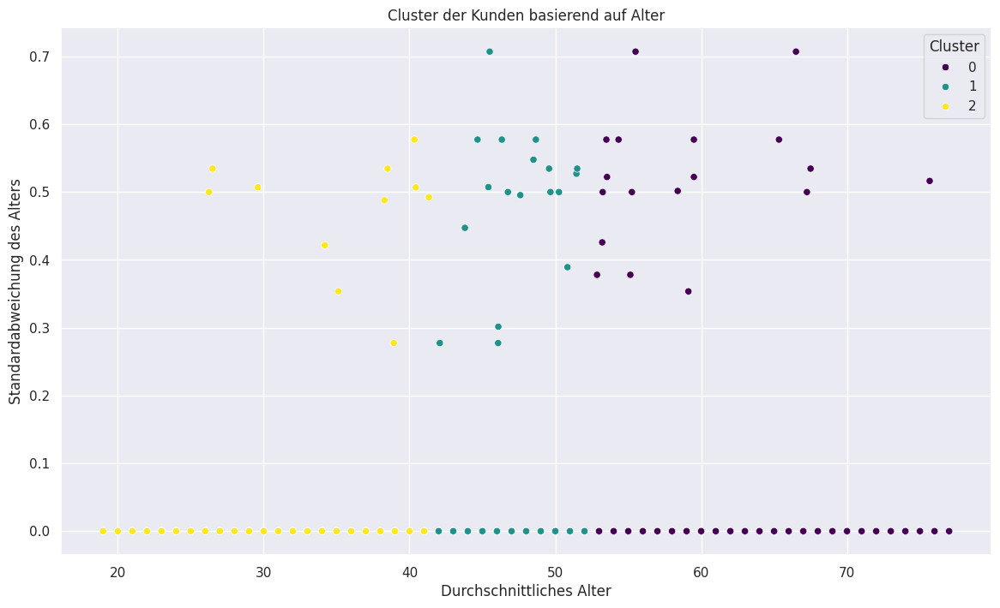

In [ ]:
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

# Berechne Durchschnitt und Standardabweichung des Alters pro Gruppe (oder insgesamt)
age_stats = orders_class2.groupby('customerID')['age'].agg(
    average_age='mean',
    age_std='std'
).reset_index()

# Fülle NaN-Werte (z. B. wenn nur eine Altersangabe vorliegt) mit 0
age_stats['age_std'] = age_stats['age_std'].fillna(0)

# Features für das Clustering
X = age_stats[['average_age', 'age_std']]

# k-Means Clustering
kmeans = KMeans(n_clusters=3, random_state=42)  # Passe die Anzahl der Cluster an, falls nötig
age_stats['cluster_age'] = kmeans.fit_predict(X)

# Cluster-Zentren anzeigen
print("Cluster-Zentren:")
print(kmeans.cluster_centers_)

# Ergebnis anzeigen
print(age_stats.head())

# Streudiagramm der Cluster basierend auf Altersgruppen
sns.scatterplot(
    x='average_age',
    y='age_std',
    hue='cluster_age',
    data=age_stats,
    palette='viridis'
)
plt.title('Cluster der Kunden basierend auf Alter')
plt.xlabel('Durchschnittliches Alter')
plt.ylabel('Standardabweichung des Alters')
plt.legend(title='Cluster')
plt.show()


In [ ]:
# Merge der Cluster-Zuordnung zurück in df13
orders_class2 = orders_class2.merge(age_stats[['customerID', 'cluster_age']], on='customerID', how='left')

# Überprüfen, ob die Cluster erfolgreich hinzugefügt wurden
print(orders_class2[['customerID', 'age', 'cluster_age']].head())


   customerID   age  cluster_age
0       12489  49.0            1
1       12489  49.0            1
2       12489  49.0            1
3       12489  49.0            1
4       12489  49.0            1


In [ ]:
# Entferne Duplikate, um eindeutige Zuordnungen von `age` und `cluster_age` sicherzustellen
age_clusters = df13[['age', 'cluster_age_return']].drop_duplicates()

# Merge `cluster_age` basierend auf dem Alter in `orders_class2`
orders_class2 = orders_class2.merge(age_clusters, on='age', how='left')

# Fehlende Werte in `cluster_age` behandeln, falls es neue Alterswerte in `orders_class2` gibt
orders_class2['cluster_age_return'] = orders_class2['cluster_age_return'].fillna(-1).astype(int)

# Ergebnis anzeigen
print(orders_class2[['age', 'cluster_age_return']].head())


    age  cluster_age_return
0  49.0                   1
1  49.0                   1
2  49.0                   1
3  49.0                   1
4  49.0                   1


In [ ]:
# Entferne Duplikate in df13 basierend auf `itemID` und `average_return_rate`
df13_deduplicated = df13[['age', 'average_return_rate_age']].drop_duplicates()

# Join von `average_return_rate` von df13 zu orders_class2
orders_class2 = orders_class2.merge(
    df13_deduplicated,
    on='age',
    how='left'
)

# Fehlende Werte in `average_return_rate` in orders_class2 mit 0 auffüllen
orders_class2['average_return_rate_age'] = orders_class2['average_return_rate_age'].fillna(0)

# Ergebnis prüfen
print(orders_class2.head())


   orderItemID  orderDate deliveryDate  itemID size    color  manufacturerID  \
0            1 2013-04-01   2013-04-03    2347   43  magenta               1   
1            2 2013-04-01   2013-04-03    2741   43     grey               1   
2            3 2013-04-01   2013-04-03    2514    9     ecru              19   
3            4 2013-04-01   2013-05-06    2347   42    brown               1   
4            5 2013-04-01   2013-04-03    2690   43     grey               1   

   price  customerID salutation dateOfBirth  state creationDate  \
0   89.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
1   99.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
2   79.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
3   89.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
4  119.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   

   non_null_delivery_count  unique_delivery_dates  deliveryTime   age  \
0                        4                 

In [ ]:
# Entferne Duplikate in df13 basierend auf `itemID` und `average_return_rate`
df13_deduplicated = df13[['age', 'return_rate_std_age']].drop_duplicates()

# Join von `average_return_rate` von df13 zu orders_class2
orders_class2 = orders_class2.merge(
    df13_deduplicated,
    on='age',
    how='left'
)

# Fehlende Werte in `average_return_rate` in orders_class2 mit 0 auffüllen
orders_class2['return_rate_std_age'] = orders_class2['return_rate_std_age'].fillna(0)

# Ergebnis prüfen
print(orders_class2.head())


   orderItemID  orderDate deliveryDate  itemID size    color  manufacturerID  \
0            1 2013-04-01   2013-04-03    2347   43  magenta               1   
1            2 2013-04-01   2013-04-03    2741   43     grey               1   
2            3 2013-04-01   2013-04-03    2514    9     ecru              19   
3            4 2013-04-01   2013-05-06    2347   42    brown               1   
4            5 2013-04-01   2013-04-03    2690   43     grey               1   

   price  customerID salutation dateOfBirth  state creationDate  \
0   89.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
1   99.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
2   79.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
3   89.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   
4  119.9       12489        Mrs  1963-04-26  Hesse   2012-04-23   

   non_null_delivery_count  unique_delivery_dates  deliveryTime   age  \
0                        4                 

In [ ]:
# Einzigartige Werte der Spalte discount_percentage
unique_values = df13['age'].unique()

# Werte sortieren und anzeigen
unique_values_sorted = sorted(unique_values)
print("Einzigartige Werte in age:")
print(unique_values_sorted)


Einzigartige Werte in age:
[17.0, 18.0, 19.0, 20.0, 21.0, 22.0, 23.0, 24.0, 25.0, 26.0, 27.0, 28.0, 29.0, 30.0, 31.0, 32.0, 33.0, 34.0, 35.0, 36.0, 37.0, 38.0, 39.0, 40.0, 41.0, 42.0, 43.0, 44.0, 45.0, 46.0, 47.0, 48.0, 49.0, 50.0, 51.0, 52.0, 53.0, 54.0, 55.0, 56.0, 57.0, 58.0, 59.0, 60.0, 61.0, 62.0, 63.0, 64.0, 65.0, 66.0, 67.0, 68.0, 69.0, 70.0, 71.0, 72.0, 73.0, 74.0, 75.0, 76.0, 77.0, 78.0, 79.0]


In [ ]:
# Definieren der Bins und Labels
age_bins = [0, 25, 35, 50, 65, 80]  # Altersgrenzen
age_labels = ['<25', '25-35', '35-50', '50-65', '65+']  # Kategorien

# Diskretisierung durchführen
orders_class2['age_bins'] = pd.cut(orders_class2['age'], bins=age_bins, labels=age_labels)

# Ergebnis überprüfen
print(orders_class2[['age', 'age_bins']].head())


    age age_bins
0  49.0    35-50
1  49.0    35-50
2  49.0    35-50
3  49.0    35-50
4  49.0    35-50


In [ ]:
# Label-Encoding für Altersgruppen
age_encoding = {'<25': 0, '25-35': 1, '35-50': 2, '50-65': 3, '65+': 4}
orders_class2['age_bins_encoded'] = orders_class2['age_bins'].map(age_encoding)

# Ergebnis überprüfen
print(orders_class2[['age_bins', 'age_bins_encoded']].head())


  age_bins age_bins_encoded
0    35-50                2
1    35-50                2
2    35-50                2
3    35-50                2
4    35-50                2


## log_likelihood_ratio_by_customer_and_price_rank

In [ ]:
# Entferne Duplikate in df13 basierend auf 'customerID' und 'price_rank'
df13_unique = df13[['customerID', 'price_rank', 'log_likelihood_ratio_by_customer_and_price_rank']].drop_duplicates()

# Merge mit orders_class2
orders_class2 = orders_class2.merge(
    df13_unique,
    on=['customerID', 'price_rank'],  # Verknüpfungskriterien
    how='left'  # 'Left join', um die Struktur von orders_class2 zu behalten
)

# Merge für log_likelihood_ratio_by_customer_and_price (basierend auf customerID und price)
df13_price = df13[['customerID', 'price', 'log_likelihood_ratio_by_customer_and_price']].drop_duplicates()
orders_class2 = orders_class2.merge(
    df13_price,
    on=['customerID', 'price'],
    how='left'
)

# Fülle NaN-Werte in log_likelihood_ratio_by_customer_and_price_rank mit Werten aus log_likelihood_ratio_by_customer_and_price
orders_class2['log_likelihood_ratio_by_customer_and_price_rank'] = orders_class2['log_likelihood_ratio_by_customer_and_price_rank'].fillna(
    orders_class2['log_likelihood_ratio_by_customer_and_price']
)

# Berechnung der Durchschnittswerte pro price_rank
average_llr_by_rank = df13.groupby('price_rank')['log_likelihood_ratio_by_customer_and_price_rank'].mean()

# Fülle verbleibende NaN-Werte mit Durchschnittswerten pro price_rank
orders_class2['log_likelihood_ratio_by_customer_and_price_rank'] = orders_class2.apply(
    lambda row: average_llr_by_rank[row['price_rank']]
    if pd.isna(row['log_likelihood_ratio_by_customer_and_price_rank']) else row['log_likelihood_ratio_by_customer_and_price_rank'],
    axis=1
)

# Ergebnisse überprüfen
print(orders_class2[['customerID', 'price_rank', 'log_likelihood_ratio_by_customer_and_price_rank']].drop_duplicates().head())


   customerID  price_rank  log_likelihood_ratio_by_customer_and_price_rank
0       12489         2.0                                        -1.098612
1       12489         4.0                                         0.123976
2       12489         1.0                                        -1.098612
4       12489         5.0                                         1.098612
5        3649         2.0                                        -0.080308


In [ ]:
# Statistische Analyse der fehlenden Kombinationen
missing_stats = missing_combinations.groupby('price_rank').size()
print("Anzahl der fehlenden Kombinationen nach price_rank:")
print(missing_stats)


NameError: name 'missing_combinations' is not defined

## log_likelihood_ratio_by_customer_and_discount_rank

In [ ]:
# Entferne Duplikate in df13 basierend auf 'customerID' und 'discount_rank'
df13_unique = df13[['customerID', 'discount_rank', 'log_likelihood_ratio_by_customer_and_discount_rank']].drop_duplicates()

# Merge mit orders_class2
orders_class2 = orders_class2.merge(
    df13_unique,
    on=['customerID', 'discount_rank'],  # Verknüpfungskriterien
    how='left'  # 'Left join', um die Struktur von orders_class2 zu behalten
)

# Durchschnittswerte pro discount_rank berechnen
average_llr_by_discount_rank = df13.groupby('discount_rank')['log_likelihood_ratio_by_customer_and_discount_rank'].mean()

# Fehlende Werte in orders_class2 auffüllen
orders_class2['log_likelihood_ratio_by_customer_and_discount_rank'] = orders_class2.apply(
    lambda row: average_llr_by_discount_rank[row['discount_rank']]
    if pd.isna(row['log_likelihood_ratio_by_customer_and_discount_rank']) else row['log_likelihood_ratio_by_customer_and_discount_rank'],
    axis=1
)

# Ergebnisse überprüfen
print(orders_class2[['customerID', 'discount_rank', 'log_likelihood_ratio_by_customer_and_discount_rank']].drop_duplicates().head())


    customerID  discount_rank  \
0        12489            1.0   
5         3649            1.0   
8        22284            1.0   
10       22026            1.0   
13       38315            1.0   

    log_likelihood_ratio_by_customer_and_discount_rank  
0                                           -0.510826   
5                                           -0.058770   
8                                           -0.847298   
10                                          -0.587787   
13                                          -0.336472   


## similar_product_category_count_size

In [ ]:
# Drop 'order_count' and 'return_count' columns from df9
#orders_class3 = orders_class3.drop(columns=['similar_product_category_return_rate'])


In [ ]:
# Step 1: Erstelle df12 als Kopie von df9


# Step 2: Entferne 'customerID' aus dem Index, falls es als Index gesetzt ist
if 'customerID' in orders_class2.index.names:
    orders_class2.reset_index(inplace=True)

# Step 3: Erstelle das neue Feature 'similar_product_count_size'
orders_class2['similar_product_category_count_size'] = orders_class2.groupby(['customerID', 'orderDate', 'product_category'])['size'].transform('count') - 1

# Step 4: Überprüfe das Ergebnis
print(orders_class2[['customerID', 'orderDate', 'product_category', 'size', 'similar_product_category_count_size']].head())


   customerID  orderDate product_category size  \
0       12489 2013-04-01            Shoes   43   
1       12489 2013-04-01            Shoes   43   
2       12489 2013-04-01            Shoes    9   
3       12489 2013-04-01            Shoes   42   
4       12489 2013-04-01            Shoes   43   

   similar_product_category_count_size  
0                                    4  
1                                    4  
2                                    4  
3                                    4  
4                                    4  


In [ ]:

orders_class3 = orders_class2.copy()

# Schritt 1: Filter und Auswahl relevanter Spalten aus df13
filtered_df13 = df13[['product_category', 'similar_product_category_count_size', 'similar_product_category_return_rate']]

# Schritt 2: Aggregation
aggregated_return_rate = (
    filtered_df13
    .groupby(['product_category', 'similar_product_category_count_size'], as_index=False)  # Gruppieren nach Kategorie und Count
    .agg(similar_product_category_return_rate=('similar_product_category_return_rate', 'mean'))  # Durchschnitt berechnen
)

# Schritt 3: Merge mit orders_class2
orders_class2 = orders_class2.merge(
    aggregated_return_rate,  # Die aggregierten Daten
    on=['product_category', 'similar_product_category_count_size'],  # Verknüpfungskriterien
    how='left'  # 'Left join', um die Struktur von orders_class2 zu behalten
)

# Schritt 4: Fehlende Werte auffüllen
orders_class2['similar_product_category_return_rate'] = orders_class2['similar_product_category_return_rate'].fillna(0)

# Ergebnisse überprüfen
print(orders_class2[['product_category', 'similar_product_category_count_size', 'similar_product_category_return_rate']].drop_duplicates().head())


   product_category  similar_product_category_count_size  \
0             Shoes                                    4   
5             Shoes                                    3   
8             Shoes                                    0   
9          Clothing                                    3   
10         Clothing                                    2   

    similar_product_category_return_rate  
0                               0.618412  
5                               0.587235  
8                               0.000000  
9                               0.453041  
10                              0.418609  


In [ ]:
orders_class2[['product_category', 'similar_product_category_count_size', 'similar_product_category_return_rate']]

,product_category,similar_product_category_count_size,similar_product_category_return_rate
0,Shoes,4,0.618412
1,Shoes,4,0.618412
2,Shoes,4,0.618412
3,Shoes,4,0.618412
4,Shoes,4,0.618412
...,...,...,...
50073,Clothing,5,0.485984
50074,Clothing,5,0.485984
50075,Clothing,0,0.000000
50076,Clothing,1,0.399023


## return_rate_size_manufacturer

In [ ]:
# Entferne Duplikate, um eine eindeutige Zuordnung zu gewährleisten
manufacturer_size_return_rate_unique = manufacturer_size_return_rate[['manufacturerID', 'size', 'return_rate_size_manufacturer']].drop_duplicates()

# Merge der Rücksendequote in `orders_class2`
orders_class2 = orders_class2.merge(manufacturer_size_return_rate_unique, on=['manufacturerID', 'size'], how='left')

# Durchschnittliche Rücksendequote pro `product_category` und `size` berechnen
category_size_avg_return_rate = orders_class2.groupby(['product_category', 'size'])['return_rate_size_manufacturer'].mean().reset_index()
category_size_avg_return_rate.rename(columns={'return_rate_size_manufacturer': 'avg_return_rate_size_category'}, inplace=True)

# Merge des Durchschnittswerts in `orders_class2`
orders_class2 = orders_class2.merge(category_size_avg_return_rate, on=['product_category', 'size'], how='left')

# Fehlende Werte behandeln:
# Falls `return_rate_size_manufacturer` NaN ist, setze es auf den Durchschnittswert von `avg_return_rate_size_category`
orders_class2['return_rate_size_manufacturer'] = orders_class2['return_rate_size_manufacturer'].fillna(orders_class2['avg_return_rate_size_category'])

# Entferne Hilfsspalte `avg_return_rate_size_category`
orders_class2.drop(columns=['avg_return_rate_size_category'], inplace=True)

# Fülle verbleibende NaN-Werte in `return_rate_size_manufacturer` mit 0
orders_class2['return_rate_size_manufacturer'] = orders_class2['return_rate_size_manufacturer'].fillna(0)

# Ergebnis überprüfen
print(orders_class2[['manufacturerID', 'size', 'product_category', 'return_rate_size_manufacturer']].head())


   manufacturerID size product_category  return_rate_size_manufacturer
0               1   43            Shoes                       0.579154
1               1   43            Shoes                       0.579154
2              19    9            Shoes                       0.528967
3               1   42            Shoes                       0.589320
4               1   43            Shoes                       0.579154


In [ ]:
# Importiere Pandas
import pandas as pd

# Stelle sicher, dass alle Spalten angezeigt werden
pd.set_option('display.max_columns', None)

# Gib die Namen aller Spalten aus
print("Spaltennamen der DataFrame:")
for column in orders_class2.columns:
    print(column)


Spaltennamen der DataFrame:
orderItemID
orderDate
deliveryDate
itemID
size
color
manufacturerID
price
customerID
salutation
dateOfBirth
state
creationDate
non_null_delivery_count
unique_delivery_dates
deliveryTime
age
color_miss
color_hex
color_rgb
r
g
b
size_false
recency
frequency
average_frequency
customer_return_rate
product_category
product_category_encoded
size_category
size_category_encoded
sub_category
target_group
target_group_encoded
sub_category_encoded
international_UK_size
exact_product_count
category_count
manufacturer_count
count_without_size
count_without_color
similar_product_count_size_color
total_products_in_cart
cart_size_flag
return_rate_size_product_category
return_rate_color
free_return
average_cart_value
highest_price_item
discount_percentage
discount_rank
price_rank
min_discount_item
mean_discount_item
min_price_item
max_price_item
mean_price_item
discount_bins_custom
discount_bins_encoded
deliveryTime_log
delivery_time_category
delivery_time_category_category_

In [ ]:
# Drop 'order_count' and 'return_count' columns from df9
#orders_class2 = orders_class2.drop(columns=['return_rate_cutomer_product_x','return_rate_cutomer_product_item','return_rate_cutomer_product_y','return_rate_cutomer_product','return_rate_cutomer_product_item'])


## Durchschnittlicher Preis pro Kategorie in der Bestellung


In [ ]:
orders_class2['avg_price_per_category_in_order'] = orders_class2.groupby(['customerID', 'orderDate', 'product_category'])['price'].transform('mean')


## return_rate_per_size_in_order

In [ ]:
# Schritt 1: Berechnung der Rücksendequote pro Größe innerhalb der Bestellung in df13
size_return_rate = df13.groupby(['customerID', 'size']).agg(
    return_rate_per_size_in_order=('returnShipment', 'mean')  # Rücksendequote berechnen
).reset_index()

# Merge mit orders_class2 basierend auf customerID und size
orders_class2 = orders_class2.merge(
    size_return_rate,  # Die aggregierten Daten
    on=['customerID', 'size'],  # Verknüpfungskriterien
    how='left'  # 'Left join', um die Struktur von orders_class2 zu behalten
)

# Schritt 2: Berechnung der Durchschnittswerte pro itemID und size in df13
item_size_return_rate = df13.groupby(['itemID', 'size']).agg(
    avg_return_rate_item_size=('returnShipment', 'mean')  # Rücksendequote berechnen
).reset_index()

# Merge der Durchschnittswerte pro itemID und size
orders_class2 = orders_class2.merge(
    item_size_return_rate,  # Durchschnittswerte
    on=['itemID', 'size'],
    how='left'
)

# Fülle fehlende Werte in 'return_rate_per_size_in_order' mit Werten pro itemID und size
orders_class2['return_rate_per_size_in_order'] = orders_class2['return_rate_per_size_in_order'].fillna(
    orders_class2['avg_return_rate_item_size']
)

# Schritt 3: Berechnung der Durchschnittswerte pro size in df13
average_return_rate_by_size = df13.groupby('size').agg(
    avg_return_rate_size=('returnShipment', 'mean')  # Durchschnittswerte berechnen
).reset_index()

# Merge der Durchschnittswerte pro size
orders_class2 = orders_class2.merge(
    average_return_rate_by_size,
    on='size',
    how='left'
)

# Fülle verbleibende NaN-Werte in 'return_rate_per_size_in_order' mit Durchschnittswerten pro size
orders_class2['return_rate_per_size_in_order'] = orders_class2['return_rate_per_size_in_order'].fillna(
    orders_class2['avg_return_rate_size']
)

# Entferne temporäre Spalten
orders_class2.drop(columns=['avg_return_rate_item_size', 'avg_return_rate_size'], inplace=True)

# Fülle verbleibende NaN-Werte in 'return_rate_per_size_in_order' mit 0
orders_class2['return_rate_per_size_in_order'] = orders_class2['return_rate_per_size_in_order'].fillna(0)

# Ergebnisse überprüfen
print(orders_class2[['customerID', 'itemID', 'size', 'return_rate_per_size_in_order']].drop_duplicates().head())


   customerID  itemID size  return_rate_per_size_in_order
0       12489    2347   43                       0.473684
1       12489    2741   43                       0.800000
2       12489    2514    9                       0.619048
3       12489    2347   42                       1.000000
4       12489    2690   43                       0.666667


## Likelihood zwischen price und product_category

In [ ]:
# Entferne Duplikate in df13 basierend auf 'price' und 'product_category'
df13_unique = df13[['price', 'product_category', 'category_likelihood']].drop_duplicates()

# Merge mit orders_class2 basierend auf 'price' und 'product_category'
orders_class2 = orders_class2.merge(
    df13_unique,
    on=['price', 'product_category'],  # Verknüpfungskriterien
    how='left'  # 'Left join', um die Struktur von orders_class2 zu behalten
)

# Fehlende Werte in 'category_likelihood' mit 0 auffüllen (falls nötig)
orders_class2['category_likelihood'] = orders_class2['category_likelihood'].fillna(0)

# Ergebnisse überprüfen
print(orders_class2[['price', 'product_category', 'category_likelihood']].drop_duplicates().head())


   price product_category  category_likelihood
0   89.9            Shoes             0.507647
1   99.9            Shoes             0.572459
2   79.9            Shoes             0.557320
4  119.9            Shoes             0.693066
8   29.9            Shoes             0.822879


In [ ]:
# Entferne Duplikate in df13 basierend auf 'product_category' und 'price'
df13_unique = df13[['product_category', 'price', 'log_likelihood_ratio_by_category_and_price']].drop_duplicates()

# Merge mit orders_class2 basierend auf 'product_category' und 'price'
orders_class2 = orders_class2.merge(
    df13_unique,
    on=['product_category', 'price'],  # Verknüpfungskriterien
    how='left'  # 'Left join', um die Struktur von orders_class2 zu behalten
)

# Fehlende Werte in 'log_likelihood_ratio_by_category_and_price' mit 0 auffüllen (falls nötig)
orders_class2['log_likelihood_ratio_by_category_and_price'] = orders_class2['log_likelihood_ratio_by_category_and_price'].fillna(0)

# Ergebnisse überprüfen
print(orders_class2[['product_category', 'price', 'log_likelihood_ratio_by_category_and_price']].drop_duplicates().head())


  product_category  price  log_likelihood_ratio_by_category_and_price
0            Shoes   89.9                                    0.140005
1            Shoes   99.9                                    0.118208
2            Shoes   79.9                                    0.201940
4            Shoes  119.9                                    0.235102
8            Shoes   29.9                                   -0.041685


## multiple_orders_flag

In [ ]:
import pandas as pd

# Schritt 1: Analyse von Kunden aus orders_class2 mit itemID in df13 und orders_class2
# Berechnung der eindeutigen orderDate in df13
df13_item_orders = (
    df13.groupby(['customerID', 'itemID'])
    .agg(unique_order_dates=('orderDate', 'nunique'))  # Anzahl der eindeutigen Bestelldaten
    .reset_index()
)

# Filtern von Kunden/Artikel-Kombinationen in df13 mit mehr als einem orderDate
df13_item_orders = df13_item_orders[df13_item_orders['unique_order_dates'] > 1]

# Schritt 2: Berechnung der eindeutigen orderDate in orders_class2
orders_class2_item_orders = (
    orders_class2.groupby(['customerID', 'itemID'])
    .agg(unique_order_dates=('orderDate', 'nunique'))  # Anzahl der eindeutigen Bestelldaten
    .reset_index()
)

# Filtern von Kunden/Artikel-Kombinationen in orders_class2 mit mehr als einem orderDate
orders_class2_item_orders = orders_class2_item_orders[orders_class2_item_orders['unique_order_dates'] > 1]

# Schritt 3: Kunden prüfen, die in beiden Datenframes sind
# Überprüfung von Kunden/Artikel-Kombinationen aus orders_class2, die auch in df13 existieren
common_customers = pd.merge(
    orders_class2_item_orders, df13_item_orders, on=['customerID', 'itemID'], how='inner'
)

# Schritt 4: Kunden prüfen, die nur in orders_class2 sind
# Überprüfung von Kunden/Artikel-Kombinationen aus orders_class2, die NICHT in df13 existieren
only_orders_class2 = pd.merge(
    orders_class2_item_orders, df13_item_orders, on=['customerID', 'itemID'], how='left', indicator=True
)
only_orders_class2 = only_orders_class2[only_orders_class2['_merge'] == 'left_only']

# Schritt 5: Ergebnisse ausgeben
print("Fall 1: Kunden/Artikel in df13 und orders_class2 mit mehreren orderDate:")
print(common_customers[['customerID', 'itemID']])

print("\nFall 2: Kunden/Artikel nur in orders_class2 mit mehreren orderDate:")
print(only_orders_class2[['customerID', 'itemID']])

# Zusammenfassungen
print(f"\nAnzahl der Kunden/Artikel mit mehreren Bestellungen in df13 und orders_class2: {len(common_customers)}")
print(f"Anzahl der Kunden/Artikel mit mehreren Bestellungen nur in orders_class2: {len(only_orders_class2)}")


Fall 1: Kunden/Artikel in df13 und orders_class2 mit mehreren orderDate:
    customerID  itemID
0          405    2407
1          878    2334
2         2341    2344
3         2922    2336
4         4537    2345
5         4690    2436
6        14556    2416
7        21182    2449
8        22374    2373
9        28164    2539
10       35688    2631
11       38899    2362
12       46560    2459
13       48688    2546
14       70514    1657
15       75012    2334
16       75012    2336
17       81633    2393

Fall 2: Kunden/Artikel nur in orders_class2 mit mehreren orderDate:
      customerID  itemID
0            177    2396
1            202    2630
2            302    2447
3            356    2372
5            405    2519
...          ...     ...
1391       90682    2807
1392       90726    2513
1393       90860    2524
1394       90865     242
1395       91047    2972

[1378 rows x 2 columns]

Anzahl der Kunden/Artikel mit mehreren Bestellungen in df13 und orders_class2: 18
Anzahl der Ku

In [ ]:
#filtered_df12 = df13[df13['itemID'] == 134] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

#filtered_df12 = df13[df13['itemID'] == 134]
#filtered_df12 = df13[df13['itemID'] == 156] # 23,24 36 38 40 Clothing
#filtered_df12 = df13[(df13['price'] == 289) ]
filtered_df12 = df13[(df13['customerID'] == 356) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['customerID','orderDate','itemID','multiple_orders_flag']]


,customerID,orderDate,itemID,multiple_orders_flag
4110,356,2012-04-05,141,0
4111,356,2012-04-05,100,0
4112,356,2012-04-05,402,1
51438,356,2012-05-17,402,1
51439,356,2012-05-17,183,0
53895,356,2012-05-19,233,1
53896,356,2012-05-19,258,0
64729,356,2012-05-28,402,1
83685,356,2012-06-16,425,0
83686,356,2012-06-16,138,0


In [ ]:
# Schritt 1: Berechnung der eindeutigen orderDate in df13
df13_item_orders = (
    df13.groupby(['customerID', 'itemID'])
    .agg(unique_order_dates=('orderDate', 'nunique'))  # Anzahl der eindeutigen Bestelldaten
    .reset_index()
)

# Flag für Kunden/Artikel-Kombinationen mit mehr als einem orderDate in df13
df13_item_orders['multiple_orders_flag_df13'] = (df13_item_orders['unique_order_dates'] > 1).astype(int)

# Schritt 2: Berechnung der eindeutigen orderDate in orders_class2
orders_class2_item_orders = (
    orders_class2.groupby(['customerID', 'itemID'])
    .agg(unique_order_dates=('orderDate', 'nunique'))  # Anzahl der eindeutigen Bestelldaten
    .reset_index()
)

# Flag für Kunden/Artikel-Kombinationen mit mehr als einem orderDate in orders_class2
orders_class2_item_orders['multiple_orders_flag_orders_class2'] = (
    orders_class2_item_orders['unique_order_dates'] > 1
).astype(int)

# Schritt 3: Überprüfung der Fälle
# Merge der Flags aus df13 mit orders_class2
orders_class2 = orders_class2.merge(
    df13_item_orders[['customerID', 'itemID', 'multiple_orders_flag_df13']],
    on=['customerID', 'itemID'],
    how='left'
)

# Auffüllen von NaN-Werten in multiple_orders_flag_df13 (falls ein Kunde/Artikel nicht in df13 existiert)
orders_class2['multiple_orders_flag_df13'] = orders_class2['multiple_orders_flag_df13'].fillna(0)

# Merge der Flags für orders_class2 selbst
orders_class2 = orders_class2.merge(
    orders_class2_item_orders[['customerID', 'itemID', 'multiple_orders_flag_orders_class2']],
    on=['customerID', 'itemID'],
    how='left'
)

# Schritt 4: Erstellung des finalen Flags
# Setze 1, wenn einer der beiden Fälle zutrifft, sonst 0
orders_class2['multiple_orders_flag'] = (
    (orders_class2['multiple_orders_flag_df13'] == 1) |
    (orders_class2['multiple_orders_flag_orders_class2'] == 1)
).astype(int)

# Optional: Temporäre Spalten entfernen
orders_class2.drop(columns=['multiple_orders_flag_df13', 'multiple_orders_flag_orders_class2'], inplace=True)

# Ergebnisse überprüfen
print(orders_class2[['customerID', 'itemID', 'multiple_orders_flag']].drop_duplicates().head())

# Gesamtanzahl der Fälle ausgeben
total_flags = orders_class2['multiple_orders_flag'].sum()
print(f"Anzahl der Artikel mit mehrfachen Bestellungen (alle Fälle): {total_flags}")


   customerID  itemID  multiple_orders_flag
0       12489    2347                     0
1       12489    2741                     0
2       12489    2514                     0
4       12489    2690                     0
5        3649    2318                     0
Anzahl der Artikel mit mehrfachen Bestellungen (alle Fälle): 4230


In [ ]:
#filtered_df12 = df13[df13['itemID'] == 134] #shoes
# Filter the DataFrame for size == 25 and product_category == 'Clothing'

#filtered_df12 = df13[df13['product_category'] == 'Clothing']
# Filter the DataFrame for size == 25 and product_category == 'Clothing'
#filtered_df12 = df13[(df13['size'] == '36') & (df13['product_category'] == 'Clothing')]
#filtered_df12 = df13[(df13['size'] == '23') & (df13['product_category'] == 'Shoes')]
#filtered_df12 = df13[(df13['size'] == '100') & (df13['product_category'] == 'Clothing')]

#filtered_df12 = df13[df13['itemID'] == 134]
#filtered_df12 = df13[df13['itemID'] == 156] # 23,24 36 38 40 Clothing
#filtered_df12 = df13[(df13['price'] == 289) ]
filtered_df12 = orders_class2[(orders_class2['customerID'] == 177) ]
#filtered_df12 = df13[(df13['customerID'] == 850) ]
#filtered_df12 = df13[(df13['customerID'] == 55) ]
#filtered_df12 = df13[(df13['customerID'] == 86609) ]

# Display the filtered results
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','product_category','category_count','manufacturer_count','exact_product_count','count_without_size','count_without_color','similar_product_count_size_color','total_products_in_cart','cart_size_flag','order_count', 'return_count', 'order_diff','previous_purchases']]
#filtered_df12[['customerID', 'orderDate', 'itemID', 'manufacturerID','size','color','first_purchase_date','months_since_first_purchase','months_between_orders']]
#filtered_df12[['customerID','orderDate','itemID', 'price','discount_percentage','min_price_item', 'max_price_item', 'trend_discount','trend_price', 'delta_price', 'delta_discount','returnShipment']]
#filtered_df12[['customerID','orderDate','itemID', 'first_availability_date', 'availability_season']]
#filtered_df12[['customerID', 'itemID','color','size','product_category', 'most_returned_size_by_cat_cust','most_purchased_size_by_cat_cust', 'most_returned_color_by_cat_cust','most_purchased_color_by_cat_cust', 'returnShipment']]
filtered_df12[['customerID','orderDate','itemID','multiple_orders_flag']]


,customerID,orderDate,itemID,multiple_orders_flag
25787,177,2013-04-18,2396,1
25788,177,2013-04-18,2637,0
25789,177,2013-04-18,2349,0
25790,177,2013-04-18,2345,0
25791,177,2013-04-18,2345,0
25792,177,2013-04-18,3044,0
25793,177,2013-04-18,3044,0
48348,177,2013-04-30,2396,1
48349,177,2013-04-30,2473,0
48350,177,2013-04-30,2496,0


## repeat_rate_per_customer

In [ ]:
# Schritt 1: Merge von repeat_rate_per_customer aus df13 mit orders_class2
orders_class2 = orders_class2.merge(
    df13[['customerID', 'repeat_rate_per_customer']].drop_duplicates(),
    on='customerID',
    how='left'
)

# Schritt 2: Identifikation neuer Kunden (Kunden in orders_class2, aber nicht in df13)
new_customers = orders_class2[orders_class2['repeat_rate_per_customer'].isna()]

# Schritt 3: Berechnung der Wiederkaufrate für neue Kunden
# Anzahl eindeutiger orderDate für neue Kunden in orders_class2
new_customer_order_dates = (
    new_customers.groupby('customerID')['orderDate']
    .nunique()
    .reset_index(name='unique_order_dates')
)

# Wiederkaufrate für neue Kunden berechnen
new_customer_order_dates['repeat_rate_per_customer_new'] = (
    new_customer_order_dates['unique_order_dates']
    .apply(lambda x: 1 - (1 / x) if x > 1 else 0)
)

# Merge der berechneten Werte für neue Kunden zurück in orders_class2
orders_class2 = orders_class2.merge(
    new_customer_order_dates[['customerID', 'repeat_rate_per_customer_new']],
    on='customerID',
    how='left'
)

# Schritt 4: Finales Feature erstellen
# Verwende die Wiederkaufrate aus df13, wenn vorhanden, ansonsten die neue
orders_class2['repeat_rate_per_customer'] = orders_class2['repeat_rate_per_customer'].fillna(
    orders_class2['repeat_rate_per_customer_new']
)

# Verbleibende NaN-Werte auffüllen mit 0
orders_class2['repeat_rate_per_customer'] = orders_class2['repeat_rate_per_customer'].fillna(0)

# Temporäre Spalte entfernen
orders_class2.drop(columns=['repeat_rate_per_customer_new'], inplace=True)

# Ergebnisse überprüfen
print(orders_class2[['customerID', 'repeat_rate_per_customer']].drop_duplicates().head())

# Zusammenfassung ausgeben
num_new_customers = len(new_customer_order_dates)
print(f"Anzahl der neuen Kunden in orders_class2: {num_new_customers}")


    customerID  repeat_rate_per_customer
0        12489                  0.000000
5         3649                  0.500000
8        22284                  0.666667
10       22026                  0.833333
13       38315                  0.666667
Anzahl der neuen Kunden in orders_class2: 4426


## same_day_as_creation

In [ ]:
# Schritt 1: Überprüfung, ob orderDate und creationDate am selben Tag liegen
orders_class2['same_day_as_creation'] = (orders_class2['orderDate'].dt.date == orders_class2['creationDate'].dt.date).astype(int)

# Ergebnisse überprüfen
print(orders_class2[['customerID', 'orderDate', 'creationDate', 'same_day_as_creation']].head())

# Anzahl der Fälle, bei denen die Bestellung am selben Tag wie die Kontoerstellung erfolgt ist
same_day_count = orders_class2['same_day_as_creation'].sum()
total_orders = len(orders_class2)
print(f"Bestellungen am selben Tag wie die Kontoerstellung: {same_day_count} von {total_orders} ({same_day_count / total_orders:.2%})")


   customerID  orderDate creationDate  same_day_as_creation
0       12489 2013-04-01   2012-04-23                     0
1       12489 2013-04-01   2012-04-23                     0
2       12489 2013-04-01   2012-04-23                     0
3       12489 2013-04-01   2012-04-23                     0
4       12489 2013-04-01   2012-04-23                     0
Bestellungen am selben Tag wie die Kontoerstellung: 13210 von 50078 (26.38%)


## weekday

In [ ]:
# Schritt 1: Überprüfung, ob orderDate ein Wochentag ist (Montag bis Freitag)
orders_class2['is_weekday'] = orders_class2['orderDate'].dt.weekday < 5  # Montag=0, Sonntag=6
orders_class2['is_weekday'] = orders_class2['is_weekday'].astype(int)  # Codierung in 1 (Wochentag) oder 0 (Wochenende)

# Ergebnisse überprüfen
print(orders_class2[['customerID', 'orderDate', 'is_weekday']].head())

# Analyse der Verteilung von Bestellungen nach Wochentagen
weekday_count = orders_class2['is_weekday'].sum()
weekend_count = len(orders_class2) - weekday_count

print(f"Anzahl der Bestellungen an Wochentagen: {weekday_count}")
print(f"Anzahl der Bestellungen am Wochenende: {weekend_count}")


   customerID  orderDate  is_weekday
0       12489 2013-04-01           1
1       12489 2013-04-01           1
2       12489 2013-04-01           1
3       12489 2013-04-01           1
4       12489 2013-04-01           1
Anzahl der Bestellungen an Wochentagen: 38179
Anzahl der Bestellungen am Wochenende: 11899


## geo daten

In [ ]:
from sklearn.preprocessing import LabelEncoder

# Definition der Regionen basierend auf den Bundesländern
region_mapping = {
    'Mecklenburg-Western Pomerania': 'East',
    'Brandenburg': 'East',
    'Berlin': 'East',
    'Thuringia': 'East',
    'Saxony-Anhalt': 'East',
    'Saxony': 'East',
    'North Rhine-Westphalia': 'West',
    'Saarland': 'West',
    'Rhineland-Palatinate': 'West',
    'Hesse': 'West',
    'Bavaria': 'South',
    'Baden-Wuerttemberg': 'South',
    'Hamburg': 'North',
    'Schleswig-Holstein': 'North',
    'Lower Saxony': 'North',
    'Bremen': 'North'
}

# Neues Feature 'region' basierend auf der Spalte 'state' erstellen
orders_class2['region'] = orders_class2['state'].map(region_mapping)

# Label Encoding der Regionen
label_encoder = LabelEncoder()
orders_class2['region_encoded'] = label_encoder.fit_transform(orders_class2['region'])

# Überprüfung der Ergebnisse
print(orders_class2[['state', 'region', 'region_encoded']].drop_duplicates().sort_values(by='region_encoded'))

# Mapping der Label-Codes zu den Regionen ausgeben
region_label_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))
print("\nRegion-Label-Mapping:")
print(region_label_mapping)


                             state region  region_encoded
19   Mecklenburg-Western Pomerania   East               0
65                     Brandenburg   East               0
78                          Berlin   East               0
86                          Saxony   East               0
129                      Thuringia   East               0
733                  Saxony-Anhalt   East               0
20                    Lower Saxony  North               1
27              Schleswig-Holstein  North               1
37                         Hamburg  North               1
77                          Bremen  North               1
10              Baden-Wuerttemberg  South               2
13                         Bavaria  South               2
0                            Hesse   West               3
8             Rhineland-Palatinate   West               3
25          North Rhine-Westphalia   West               3
376                       Saarland   West               3

Region-Label-

## return_rate_region

In [ ]:
# Entferne Duplikate aus df13, um eindeutige Werte pro Region zu gewährleisten
region_return_rate_unique = df13[['region', 'total_kept_region', 'total_orders_region', 'total_returns_region', 'return_rate_region']].drop_duplicates()

# Merge mit orders_class2
orders_class2 = orders_class2.merge(region_return_rate_unique, on='region', how='left')

# Ergebnisse überprüfen
print(orders_class2[['region', 'total_kept_region', 'total_orders_region', 'total_returns_region', 'return_rate_region']].drop_duplicates().head())

# Anzahl fehlender Werte überprüfen
missing_values = orders_class2[['total_kept_region', 'total_orders_region', 'total_returns_region', 'return_rate_region']].isna().sum()
print("\nFehlende Werte pro Feature:")
print(missing_values)


   region  total_kept_region  total_orders_region  total_returns_region  \
0    West              77856               162410                 84554   
10  South              57007               120669                 63662   
19   East              26986                58589                 31603   
20  North              47733               100005                 52272   

    return_rate_region  
0             0.520621  
10            0.527575  
19            0.539402  
20            0.522694  

Fehlende Werte pro Feature:
total_kept_region       0
total_orders_region     0
total_returns_region    0
return_rate_region      0
dtype: int64


## customer_region_return_rate

In [ ]:
# Importiere Pandas
import pandas as pd

# Stelle sicher, dass alle Spalten angezeigt werden
pd.set_option('display.max_columns', None)

# Gib die Namen aller Spalten aus
print("Spaltennamen der DataFrame:")
for column in orders_class2.columns:
    print(column)


Spaltennamen der DataFrame:
orderItemID
orderDate
deliveryDate
itemID
size
color
manufacturerID
price
customerID
salutation
dateOfBirth
state
creationDate
non_null_delivery_count
unique_delivery_dates
deliveryTime
age
color_miss
color_hex
color_rgb
r
g
b
size_false
recency
frequency
average_frequency
customer_return_rate
product_category
product_category_encoded
size_category
size_category_encoded
sub_category
target_group
target_group_encoded
sub_category_encoded
international_UK_size
exact_product_count
category_count
manufacturer_count
count_without_size
count_without_color
similar_product_count_size_color
total_products_in_cart
cart_size_flag
return_rate_size_product_category
return_rate_color
free_return
average_cart_value
highest_price_item
discount_percentage
discount_rank
price_rank
min_discount_item
mean_discount_item
min_price_item
max_price_item
mean_price_item
discount_bins_custom
discount_bins_encoded
deliveryTime_log
delivery_time_category
delivery_time_category_category_

In [ ]:
# Entferne Duplikate aus df13, um eine eindeutige Zuordnung pro Kunde und Region zu gewährleisten
customer_region_data = df13[['customerID', 'region', 'total_kept_region_customer', 'total_orders_region_customer', 'total_returns_region_customer', 'customer_region_return_rate']].drop_duplicates()

# Merge mit orders_class2 basierend auf customerID und region
orders_class2 = orders_class2.merge(
    customer_region_data,
    on=['customerID', 'region'],
    how='left'
)

# Berechnung von Durchschnittswerten pro Region aus df13
region_averages = customer_region_data.groupby('region').agg(
    avg_total_kept_region_customer=('total_kept_region_customer', 'mean'),
    avg_total_orders_region_customer=('total_orders_region_customer', 'mean'),
    avg_total_returns_region_customer=('total_returns_region_customer', 'mean'),
    avg_customer_region_return_rate=('customer_region_return_rate', 'mean')
).reset_index()

# Merge der Durchschnittswerte pro Region in orders_class2
orders_class2 = orders_class2.merge(region_averages, on='region', how='left')

# Auffüllen fehlender Werte mit Durchschnittswerten pro Region (gerundet für Integer-Spalten)
orders_class2['total_kept_region_customer'] = orders_class2['total_kept_region_customer'].fillna(orders_class2['avg_total_kept_region_customer']).round().astype(int)
orders_class2['total_orders_region_customer'] = orders_class2['total_orders_region_customer'].fillna(orders_class2['avg_total_orders_region_customer']).round().astype(int)
orders_class2['total_returns_region_customer'] = orders_class2['total_returns_region_customer'].fillna(orders_class2['avg_total_returns_region_customer']).round().astype(int)

# Für die Rücksendequote (float) bleibt der Wert unverändert
orders_class2['customer_region_return_rate'] = orders_class2['customer_region_return_rate'].fillna(orders_class2['avg_customer_region_return_rate'])

# Entferne temporäre Durchschnittsspalten
orders_class2.drop(columns=['avg_total_kept_region_customer', 'avg_total_orders_region_customer', 'avg_total_returns_region_customer', 'avg_customer_region_return_rate'], inplace=True)

# Ergebnisse überprüfen
print(orders_class2[['customerID', 'region', 'total_kept_region_customer', 'total_orders_region_customer', 'total_returns_region_customer', 'customer_region_return_rate']].drop_duplicates().head())


    customerID region  total_kept_region_customer  \
0        12489   West                           0   
5         3649   West                           4   
8        22284   West                           4   
10       22026  South                          23   
13       38315  South                           2   

    total_orders_region_customer  total_returns_region_customer  \
0                              1                              1   
5                              8                              4   
8                              5                              1   
10                            36                             13   
13                             6                              4   

    customer_region_return_rate  
0                      1.000000  
5                      0.467657  
8                      0.200000  
10                     0.361111  
13                     0.666667  


## produces_multiple_categories


In [ ]:
# Schritt 1: Anzahl der Kategorien pro manufacturerID in df13 berechnen
df13_category_count = (
    df13.groupby('manufacturerID')['product_category']
    .nunique()
    .reset_index(name='categories_in_df13')
)

# Schritt 2: Anzahl der Kategorien pro manufacturerID in orders_class2 berechnen
orders_class2_category_count = (
    orders_class2.groupby('manufacturerID')['product_category']
    .nunique()
    .reset_index(name='categories_in_orders_class2')
)

# Schritt 3: Merge der beiden Ergebnisse für den Vergleich
manufacturer_comparison = orders_class2_category_count.merge(
    df13_category_count,
    on='manufacturerID',
    how='left'
)

# Schritt 4: Identifizieren von Abweichungen
# Hersteller, die mehr Kategorien in orders_class2 haben als in df13
manufacturer_comparison['orders_class2_has_more_categories'] = (
    manufacturer_comparison['categories_in_orders_class2'] > manufacturer_comparison['categories_in_df13']
).astype(int)

# Hersteller, die weniger Kategorien in orders_class2 haben als in df13
manufacturer_comparison['orders_class2_has_fewer_categories'] = (
    manufacturer_comparison['categories_in_orders_class2'] < manufacturer_comparison['categories_in_df13']
).astype(int)

# Ergebnisse anzeigen
print("\nHersteller mit Abweichungen zwischen df13 und orders_class2:")
print(manufacturer_comparison[
    (manufacturer_comparison['orders_class2_has_more_categories'] == 1) |
    (manufacturer_comparison['orders_class2_has_fewer_categories'] == 1)
])

# Zusammenfassung der Abweichungen
print("\nZusammenfassung der Abweichungen:")
summary = manufacturer_comparison[['orders_class2_has_more_categories', 'orders_class2_has_fewer_categories']].sum()
print(summary)



Hersteller mit Abweichungen zwischen df13 und orders_class2:
    manufacturerID  categories_in_orders_class2  categories_in_df13  \
4                5                            2                   3   
14              15                            1                   2   
24              25                            1                   2   
26              27                            2                   3   
38              39                            2                   3   
41              42                            1                   2   
45              46                            1                   2   
52              54                            1                   2   
67              74                            1                   2   
68              75                            1                   2   
76              94                            1                   2   
87             118                            1                   2   

    orders_cla

In [ ]:
# Entferne Duplikate aus df13, um eine eindeutige Zuordnung pro manufacturerID zu gewährleisten
manufacturer_features = df13[['manufacturerID', 'unique_categories_per_manufacturer', 'produces_multiple_categories']].drop_duplicates()

# Merge mit orders_class2 basierend auf manufacturerID
orders_class2 = orders_class2.merge(
    manufacturer_features,
    on='manufacturerID',
    how='left'
)

# Ergebnisse überprüfen
print(orders_class2[['manufacturerID', 'unique_categories_per_manufacturer', 'produces_multiple_categories']].drop_duplicates().head())

# Anzahl fehlender Werte überprüfen
missing_values = orders_class2[['unique_categories_per_manufacturer', 'produces_multiple_categories']].isna().sum()
print("\nFehlende Werte pro Feature:")
print(missing_values)

# Optional: Fehlende Werte auffüllen (z. B. mit 0 für `produces_multiple_categories` und 1 für `unique_categories_per_manufacturer`)
orders_class2['unique_categories_per_manufacturer'] = orders_class2['unique_categories_per_manufacturer'].fillna(1)
orders_class2['produces_multiple_categories'] = orders_class2['produces_multiple_categories'].fillna(0)

# Überprüfen nach dem Auffüllen
print("\nNach Auffüllen fehlender Werte:")
print(orders_class2[['manufacturerID', 'unique_categories_per_manufacturer', 'produces_multiple_categories']].drop_duplicates().head())


KeyError: "['unique_categories_per_manufacturer', 'produces_multiple_categories'] not in index"

## return_rate_category_manufacturer

In [ ]:
# Entferne Duplikate aus df13, um eine eindeutige Zuordnung pro manufacturerID und product_category zu gewährleisten
manufacturer_category_features = df13[['manufacturerID', 'product_category', 'return_rate_category_manufacturer']].drop_duplicates()

# Merge mit orders_class2 basierend auf manufacturerID und product_category
orders_class2 = orders_class2.merge(
    manufacturer_category_features,
    on=['manufacturerID', 'product_category'],
    how='left'
)

# Ergebnisse überprüfen
print(orders_class2[['manufacturerID', 'product_category', 'return_rate_category_manufacturer']].drop_duplicates().head())

# Anzahl fehlender Werte überprüfen
missing_values = orders_class2['return_rate_category_manufacturer'].isna().sum()
print(f"\nAnzahl fehlender Werte in 'return_rate_category_manufacturer': {missing_values}")

# Optional: Fehlende Werte auffüllen (z. B. mit 0 oder einem globalen Durchschnitt)
global_average_return_rate = df13['return_rate_category_manufacturer'].mean()
orders_class2['return_rate_category_manufacturer'] = orders_class2['return_rate_category_manufacturer'].fillna(global_average_return_rate)

# Überprüfen nach dem Auffüllen
print("\nNach Auffüllen fehlender Werte:")
print(orders_class2[['manufacturerID', 'product_category', 'return_rate_category_manufacturer']].drop_duplicates().head())


   manufacturerID product_category  return_rate_category_manufacturer
0               1            Shoes                           0.579909
2              19            Shoes                           0.568525
6              57            Shoes                           0.549493
8              51            Shoes                           0.533828
9             153      Accessories                           0.636364

Anzahl fehlender Werte in 'return_rate_category_manufacturer': 0

Nach Auffüllen fehlender Werte:
   manufacturerID product_category  return_rate_category_manufacturer
0               1            Shoes                           0.579909
2              19            Shoes                           0.568525
6              57            Shoes                           0.549493
8              51            Shoes                           0.533828
9             153      Accessories                           0.636364


## return_rate_size_category_manufacturer

In [ ]:
# Entferne Duplikate aus df13, um eine eindeutige Zuordnung pro manufacturerID, product_category und size zu gewährleisten
manufacturer_category_size_features = df13[['manufacturerID', 'product_category', 'size', 'return_rate_size_category_manufacturer']].drop_duplicates()

# Merge mit orders_class2 basierend auf manufacturerID, product_category und size
orders_class2 = orders_class2.merge(
    manufacturer_category_size_features,
    on=['manufacturerID', 'product_category', 'size'],
    how='left'
)

# Ergebnisse überprüfen
print(orders_class2[['manufacturerID', 'product_category', 'size', 'return_rate_size_category_manufacturer']].drop_duplicates().head())

# Anzahl fehlender Werte überprüfen
missing_values = orders_class2['return_rate_size_category_manufacturer'].isna().sum()
print(f"\nAnzahl fehlender Werte in 'return_rate_size_category_manufacturer': {missing_values}")

# Optional: Fehlende Werte auffüllen (z. B. mit einem globalen Durchschnitt oder 0)
global_average_return_rate = df13['return_rate_size_category_manufacturer'].mean()
orders_class2['return_rate_size_category_manufacturer'] = orders_class2['return_rate_size_category_manufacturer'].fillna(global_average_return_rate)

# Überprüfen nach dem Auffüllen
print("\nNach Auffüllen fehlender Werte:")
print(orders_class2[['manufacturerID', 'product_category', 'size', 'return_rate_size_category_manufacturer']].drop_duplicates().head())


   manufacturerID product_category size  \
0               1            Shoes   43   
2              19            Shoes    9   
3               1            Shoes   42   
5               1            Shoes   41   
6              57            Shoes  7.5   

   return_rate_size_category_manufacturer  
0                                0.579154  
2                                0.528967  
3                                0.589320  
5                                0.574633  
6                                0.502392  

Anzahl fehlender Werte in 'return_rate_size_category_manufacturer': 3

Nach Auffüllen fehlender Werte:
   manufacturerID product_category size  \
0               1            Shoes   43   
2              19            Shoes    9   
3               1            Shoes   42   
5               1            Shoes   41   
6              57            Shoes  7.5   

   return_rate_size_category_manufacturer  
0                                0.579154  
2                         

## favourite_size

In [ ]:
# Drop 'order_count' and 'return_count' columns from df9
orders_class2 = orders_class2.drop(columns=['favourite_size',
'favourite_size_new'

])


In [ ]:
# Importiere Pandas
import pandas as pd

# Stelle sicher, dass alle Spalten angezeigt werden
pd.set_option('display.max_columns', None)

# Gib die Namen aller Spalten aus
print("Spaltennamen der DataFrame:")
for column in orders_class2.columns:
    print(column)


Spaltennamen der DataFrame:
orderItemID
orderDate
deliveryDate
itemID
size
color
manufacturerID
price
customerID
salutation
dateOfBirth
state
creationDate
non_null_delivery_count
unique_delivery_dates
deliveryTime
age
color_miss
color_hex
color_rgb
r
g
b
size_false
recency
frequency
average_frequency
customer_return_rate
product_category
size_category
exact_product_count
category_count
manufacturer_count
count_without_size
count_without_color
similar_product_count_size_color
total_products_in_cart
cart_size_flag
return_rate_size_product_category
total_orders
return_rate_color
category_variation
free_return
average_cart_value
discount_percentage
discount_rank
price_rank
min_discount_item
mean_discount_item
min_price_item
max_price_item
mean_price_item
discount_bins_custom
discount_bins_encoded
duplicate_flag_by_cust_date_cat_size
duplicate_flag_by_cust_date_item
count_by_cust_date_cat_size
count_by_cust_date_itemID
duplicate_flag_by_cust_date_cat_size_return_rate
duplicate_item_return_r

In [ ]:
# Schritt 1: Entferne Duplikate in df13, um eindeutige Zuordnungen zu gewährleisten
favourite_size_by_category = df13[['customerID', 'product_category', 'favourite_size']].drop_duplicates()

# Schritt 2: Merge `favourite_size` von `df13` in `orders_class2`
orders_class2 = orders_class2.merge(
    favourite_size_by_category,
    on=['customerID', 'product_category'],
    how='left'
)

# Schritt 3: Identifiziere neue Kunden in `orders_class2`, die keine `favourite_size` haben
new_customers_size = orders_class2[orders_class2['favourite_size'].isna()]

# Schritt 4: Berechne die Lieblingsgröße für neue Kunden in `orders_class2`
# Basierend auf den vorhandenen Größenwerten in `orders_class2`
new_customer_favourite_size = (
    new_customers_size.groupby(['customerID', 'product_category'])['size']
    .agg(lambda x: x.mode()[0] if not x.mode().empty else None)  # Modus (häufigster Wert)
    .reset_index(name='favourite_size_new')
)

# Filter nur neue Kategorien, die noch nicht in `favourite_size` vorhanden sind
new_categories = set(new_customer_favourite_size['favourite_size_new'].unique()) - set(orders_class2['favourite_size'].cat.categories)

# Nur wirklich neue Kategorien hinzufügen
if new_categories:
    orders_class2['favourite_size'] = orders_class2['favourite_size'].cat.add_categories(list(new_categories))

# Merge der berechneten Lieblingsgröße für neue Kunden
orders_class2 = orders_class2.merge(
    new_customer_favourite_size,
    on=['customerID', 'product_category'],
    how='left'
)

# Schritt 5: Fülle fehlende Werte in `favourite_size` mit berechneten Werten
orders_class2['favourite_size'] = orders_class2['favourite_size'].fillna(orders_class2['favourite_size_new'])

# Entferne die temporäre Spalte
orders_class2.drop(columns=['favourite_size_new'], inplace=True)

# Ergebnisse überprüfen
print(orders_class2[['customerID', 'product_category', 'favourite_size']].drop_duplicates().head())


    customerID product_category favourite_size
0        12489            Shoes             42
5         3649            Shoes             41
8        22284            Shoes             41
9        22284         Clothing        UNSIZED
10       22026         Clothing              L


## favourite_color

In [ ]:
# Schritt 1: Merge `favourite_color` von `df13` in `orders_class2`
orders_class2 = orders_class2.merge(
    favourite_color_by_category,
    on=['customerID', 'product_category'],
    how='left'
)

# Schritt 2: Identifiziere neue Kunden in `orders_class2`, die nicht in `df13` existieren
new_customers = orders_class2[orders_class2['favourite_color'].isna()]

# Schritt 3: Berechne `favourite_color` für neue Kunden in `orders_class2`
new_customer_favourite_color = (
    new_customers.groupby(['customerID', 'product_category'])['color']
    .agg(lambda x: x.mode()[0] if not x.mode().empty else None)  # Modus (häufigster Wert)
    .reset_index(name='favourite_color')
)

# Merge der berechneten Lieblingsfarbe für neue Kunden
orders_class2 = orders_class2.merge(
    new_customer_favourite_color,
    on=['customerID', 'product_category'],
    how='left',
    suffixes=('', '_new')
)

# Schritt 4: Fülle fehlende Werte in `favourite_color` mit berechneten Werten
orders_class2['favourite_color'] = orders_class2['favourite_color'].fillna(
    orders_class2['favourite_color_new']
)

# Entferne die temporäre Spalte
orders_class2.drop(columns=['favourite_color_new'], inplace=True)

# Ergebnisse überprüfen
print(orders_class2[['customerID', 'product_category', 'favourite_color']].drop_duplicates().head())


    customerID product_category favourite_color
0        12489            Shoes           beige
5         3649            Shoes            blue
8        22284            Shoes           black
9        22284         Clothing   stained glass
10       22026         Clothing           black


In [ ]:
orders_class2['favourite_color'] = orders_class2['favourite_color'].astype('category')


## target_group_return_rate

In [ ]:
# Entferne Duplikate in df13 basierend auf 'target_group' und 'target_group_return_rate'
target_group_return_rate_unique = df13[['target_group', 'target_group_return_rate']].drop_duplicates()

# Merge mit `orders_class2`
orders_class2 = orders_class2.merge(
    target_group_return_rate_unique,
    on='target_group',
    how='left'
)

# Ergebnisse überprüfen
print("Beispiele für die Rücksendequote pro Zielgruppe in orders_class2:")
print(orders_class2[['target_group', 'target_group_return_rate']].drop_duplicates().head())


Beispiele für die Rücksendequote pro Zielgruppe in orders_class2:
   target_group  target_group_return_rate
0           men                  0.562200
5         women                  0.522104
8          kids                  0.428821
19       unisex                  0.545782


## customer_size_category_return_rate

In [ ]:
# Entferne Duplikate in df13 basierend auf 'customerID' und 'size_category'
customer_size_category_return_rate_unique = df13[['customerID', 'size_category', 'customer_size_category_return_rate']].drop_duplicates()

# Merge mit `orders_class2`
orders_class2 = orders_class2.merge(
    customer_size_category_return_rate_unique,
    on=['customerID', 'size_category'],
    how='left'
)

# Ergebnisse überprüfen
print("Beispiele für die Rücksendequote pro Kunde und size_category in orders_class2:")
print(orders_class2[['customerID', 'size_category', 'customer_size_category_return_rate']].drop_duplicates().head())


Beispiele für die Rücksendequote pro Kunde und size_category in orders_class2:
   customerID size_category  customer_size_category_return_rate
0       12489            EU                                 1.0
2       12489            UK                                 NaN
5        3649            EU                                 NaN
6        3649            UK                                 NaN
8       22284            EU                                 0.2


In [ ]:
# Berechnung des Durchschnitts der Rücksendequote pro size_category
average_return_rate_by_size_category = df13.groupby('size_category')['customer_size_category_return_rate'].mean().reset_index()
average_return_rate_by_size_category.rename(columns={'customer_size_category_return_rate': 'avg_return_rate_by_size_category'}, inplace=True)

# Merge mit orders_class2, um Durchschnittswerte hinzuzufügen
orders_class2 = orders_class2.merge(
    average_return_rate_by_size_category,
    on='size_category',
    how='left'
)

# Fülle fehlende Werte in 'customer_size_category_return_rate' mit Durchschnittswerten
orders_class2['customer_size_category_return_rate'] = orders_class2['customer_size_category_return_rate'].fillna(
    orders_class2['avg_return_rate_by_size_category']
)

# Entferne die temporäre Spalte
orders_class2.drop(columns=['avg_return_rate_by_size_category'], inplace=True)

# Verbleibende fehlende Werte mit 0 auffüllen
orders_class2['customer_size_category_return_rate'] = orders_class2['customer_size_category_return_rate'].fillna(0)

# Ergebnisse überprüfen
print("Fehlende Kombinationen aufgefüllt:")
print(orders_class2[['customerID', 'size_category', 'customer_size_category_return_rate']].drop_duplicates().head())


Fehlende Kombinationen aufgefüllt:
   customerID size_category  customer_size_category_return_rate
0       12489            EU                            1.000000
2       12489            UK                            0.598525
5        3649            EU                            0.568948
6        3649            UK                            0.598525
8       22284            EU                            0.200000


## customer_sub_category_return_rate

In [ ]:
# Drop 'order_count' and 'return_count' columns from df9
#orders_class2 = orders_class2.drop(columns=['customer_sub_category_return_rate_x','customer_sub_category_return_rate_y'])


In [ ]:
# Entferne Duplikate in df13 basierend auf 'customerID' und 'sub_category'
customer_sub_category_return_rate_unique = df13[['customerID', 'sub_category', 'customer_sub_category_return_rate']].drop_duplicates()

# Merge mit `orders_class2`
orders_class2 = orders_class2.merge(
    customer_sub_category_return_rate_unique,
    on=['customerID', 'sub_category'],
    how='left'
)

# Ergebnisse überprüfen
print("Beispiele für die Rücksendequote pro Kunde und sub_category in orders_class2:")
print(orders_class2[['customerID', 'sub_category', 'customer_sub_category_return_rate']].drop_duplicates().head())


Beispiele für die Rücksendequote pro Kunde und sub_category in orders_class2:
    customerID       sub_category  customer_sub_category_return_rate
0        12489          men_Shoes                                1.0
5         3649        women_Shoes                                NaN
8        22284         kids_Shoes                                0.0
9        22284  women_Accessories                                NaN
10       22026         women_Tops                                0.3


In [ ]:
# Berechnung des Durchschnitts der Rücksendequote pro sub_category in df13
average_return_rate_by_sub_category = (
    df13.groupby('sub_category')['customer_sub_category_return_rate']
    .mean()
    .reset_index()
)
average_return_rate_by_sub_category.rename(
    columns={'customer_sub_category_return_rate': 'avg_return_rate_by_sub_category'}, inplace=True
)

# Überprüfung der berechneten Durchschnittswerte
print("Durchschnittswerte pro sub_category:")
print(average_return_rate_by_sub_category.head())

# Merge der Durchschnittswerte in orders_class2
orders_class2 = orders_class2.merge(
    average_return_rate_by_sub_category,
    on='sub_category',
    how='left'
)

# Überprüfung nach dem Merge
print("Nach dem Merge von avg_return_rate_by_sub_category:")
print(orders_class2[['sub_category', 'avg_return_rate_by_sub_category']].drop_duplicates().head())

# Füllen der fehlenden Werte in 'customer_sub_category_return_rate' mit den Durchschnittswerten pro sub_category
orders_class2['customer_sub_category_return_rate'] = orders_class2['customer_sub_category_return_rate'].fillna(
    orders_class2['avg_return_rate_by_sub_category']
)

# Entfernen der temporären Spalte
if 'avg_return_rate_by_sub_category' in orders_class2.columns:
    orders_class2.drop(columns=['avg_return_rate_by_sub_category'], inplace=True)

# Füllen verbleibender NaN-Werte mit 0
orders_class2['customer_sub_category_return_rate'] = orders_class2['customer_sub_category_return_rate'].fillna(0)

# Ergebnisse überprüfen
print("Fehlende Werte in 'customer_sub_category_return_rate' aufgefüllt:")
print(orders_class2[['customerID', 'sub_category', 'customer_sub_category_return_rate']].drop_duplicates().head())


Durchschnittswerte pro sub_category:
       sub_category  avg_return_rate_by_sub_category
0             Belts                         0.391304
1  kids_Accessories                         0.200000
2      kids_Clothes                         0.271296
3        kids_Shoes                         0.485176
4   men_Accessories                         0.246225
Nach dem Merge von avg_return_rate_by_sub_category:
         sub_category  avg_return_rate_by_sub_category
0           men_Shoes                         0.575741
5         women_Shoes                         0.573855
8          kids_Shoes                         0.485176
9   women_Accessories                         0.304978
10         women_Tops                         0.511999
Fehlende Werte in 'customer_sub_category_return_rate' aufgefüllt:
    customerID       sub_category  customer_sub_category_return_rate
0        12489          men_Shoes                           1.000000
5         3649        women_Shoes                          

## customer_international_UK_return_rate

In [ ]:
# Entferne Duplikate in df13 basierend auf 'customerID' und 'international_UK_size'
customer_international_UK_return_rate_unique = df13[['customerID', 'international_UK_size', 'customer_international_UK_return_rate']].drop_duplicates()

# Merge mit `orders_class2`
orders_class2 = orders_class2.merge(
    customer_international_UK_return_rate_unique,
    on=['customerID', 'international_UK_size'],
    how='left'
)

# Ergebnisse überprüfen
print("Beispiele für die Rücksendequote pro Kunde und international_UK_size in orders_class2:")
print(orders_class2[['customerID', 'international_UK_size', 'customer_international_UK_return_rate']].drop_duplicates().head())


Beispiele für die Rücksendequote pro Kunde und international_UK_size in orders_class2:
   customerID international_UK_size  customer_international_UK_return_rate
0       12489                     9                                    NaN
3       12489                     8                                    1.0
5        3649                     7                                    NaN
6        3649                   7.5                                    NaN
8       22284                2-kids                                    NaN


In [ ]:
# Durchschnittswerte berechnen
average_return_rate_by_size = df13.groupby('international_UK_size')['customer_international_UK_return_rate'].mean().reset_index()
average_return_rate_by_size.rename(columns={'customer_international_UK_return_rate': 'avg_return_rate_by_size'}, inplace=True)

# Merge Durchschnittswerte in orders_class2
orders_class2 = orders_class2.merge(
    average_return_rate_by_size,
    on='international_UK_size',
    how='left'
)

# Fülle fehlende Werte mit Durchschnittswerten
orders_class2['customer_international_UK_return_rate'] = orders_class2['customer_international_UK_return_rate'].fillna(
    orders_class2['avg_return_rate_by_size']
)

# Entferne temporäre Spalte
orders_class2.drop(columns=['avg_return_rate_by_size'], inplace=True)

# Verbleibende fehlende Werte mit 0 auffüllen
orders_class2['customer_international_UK_return_rate'] = orders_class2['customer_international_UK_return_rate'].fillna(0)

# Ergebnisse überprüfen
print(orders_class2[['customerID', 'international_UK_size', 'customer_international_UK_return_rate']].head())


   customerID international_UK_size  customer_international_UK_return_rate
0       12489                     9                               0.563321
1       12489                     9                               0.563321
2       12489                     9                               0.563321
3       12489                     8                               1.000000
4       12489                     9                               0.563321


## sub_category_size_return_rate

In [ ]:
# Entferne Duplikate in df13 basierend auf 'sub_category' und 'international_UK_size'
sub_category_size_return_rate_unique = df13[['sub_category', 'international_UK_size', 'sub_category_size_return_rate']].drop_duplicates()

# Merge mit `orders_class2`
orders_class2 = orders_class2.merge(
    sub_category_size_return_rate_unique,
    on=['sub_category', 'international_UK_size'],
    how='left'
)

# Ergebnisse überprüfen
print("Beispiele für die Rücksendequote pro sub_category und international_UK_size in orders_class2:")
print(orders_class2[['sub_category', 'international_UK_size', 'sub_category_size_return_rate']].drop_duplicates().head())


Beispiele für die Rücksendequote pro sub_category und international_UK_size in orders_class2:
  sub_category international_UK_size  sub_category_size_return_rate
0    men_Shoes                     9                       0.563321
3    men_Shoes                     8                       0.589332
5  women_Shoes                     7                       0.599203
6  women_Shoes                   7.5                       0.598425
8   kids_Shoes                2-kids                       0.536957


## item_internationalsize_return_rate

In [ ]:
# Entferne Duplikate in df13 basierend auf 'itemID' und 'international_UK_size'
item_size_return_rate_unique = df13[['itemID', 'international_UK_size', 'item_internationalsize_return_rate']].drop_duplicates()

# Merge mit `orders_class2`
orders_class2 = orders_class2.merge(
    item_size_return_rate_unique,
    on=['itemID', 'international_UK_size'],
    how='left'
)

# Ergebnisse überprüfen
print("Beispiele für die Rücksendequote pro itemID und international_UK_size in orders_class2:")
print(orders_class2[['itemID', 'international_UK_size', 'item_internationalsize_return_rate']].drop_duplicates().head())


Beispiele für die Rücksendequote pro itemID und international_UK_size in orders_class2:
   itemID international_UK_size  item_internationalsize_return_rate
0    2347                     9                            0.473684
1    2741                     9                            0.800000
2    2514                     9                            0.619048
3    2347                     8                            0.461538
4    2690                     9                            0.666667


In [ ]:
# Durchschnittswerte pro international_UK_size berechnen
average_return_rate_by_size = df13.groupby('international_UK_size')['item_internationalsize_return_rate'].mean().reset_index()
average_return_rate_by_size.rename(columns={'item_internationalsize_return_rate': 'avg_return_rate_by_size'}, inplace=True)

# Merge Durchschnittswerte in orders_class2
orders_class2 = orders_class2.merge(
    average_return_rate_by_size,
    on='international_UK_size',
    how='left'
)

# Fülle fehlende Werte mit Durchschnittswerten
orders_class2['item_internationalsize_return_rate'] = orders_class2['item_internationalsize_return_rate'].fillna(
    orders_class2['avg_return_rate_by_size']
)

# Entferne temporäre Spalte
orders_class2.drop(columns=['avg_return_rate_by_size'], inplace=True)

# Verbleibende fehlende Werte mit 0 auffüllen
orders_class2['item_internationalsize_return_rate'] = orders_class2['item_internationalsize_return_rate'].fillna(0)

# Ergebnisse überprüfen
print(orders_class2[['itemID', 'international_UK_size', 'item_internationalsize_return_rate']].head())


   itemID international_UK_size  item_internationalsize_return_rate
0    2347                     9                            0.473684
1    2741                     9                            0.800000
2    2514                     9                            0.619048
3    2347                     8                            0.461538
4    2690                     9                            0.666667


# Model Evaluation on Unseen Data: Optimizing Return Prediction Threshold by Minimizing Classification Errors

In [ ]:
# **Modell laden (Decision Tree statt XGBoost)**
model_path = 'dt_model.pkl'
dt_model = joblib.load(model_path)

In [ ]:
import joblib  # Import joblib for loading the model

# Load the XGBoost model from the saved .pkl file
model_path = 'xgb_model.pkl'
xgb_model = joblib.load(model_path)


In [ ]:
orders_class.deliveryDate.info()

<class 'pandas.core.series.Series'>
RangeIndex: 50078 entries, 0 to 50077
Series name: deliveryDate
Non-Null Count  Dtype         
--------------  -----         
45810 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 391.4 KB


<ipython-input-9-caa8f8c80185>:33: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_orders_class2['return_prediction_probs'] = y_pred_probs


Optimaler Threshold basierend auf minimalen Fehlerpunkten: 0.4701746106147766

Performance des Modells auf den Unseen Data (gesamte Daten, minimalste Fehlerpunkte):
Accuracy: 0.6936
Precision: 0.6702
Recall: 0.7619
F1 Score: 0.7131


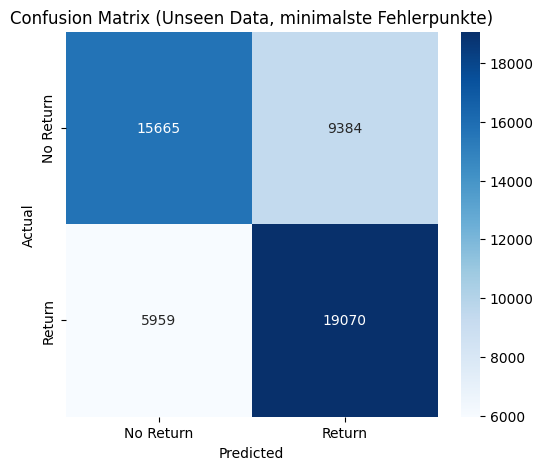

In [ ]:
import numpy as np
from sklearn.metrics import precision_recall_curve, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Sicherstellen, dass deliveryDate im orders_class korrekt als datetime erkannt wird
orders_class['deliveryDate'] = pd.to_datetime(orders_class['deliveryDate'], errors='coerce')

# Identifizieren der orderItemID mit deliveryDate = NaT
nat_order_ids = orders_class[orders_class['deliveryDate'].isna()]['orderItemID']

# Setzen von `return_prediction_probs = 0` für diese orderItemIDs in orders_class2
orders_class2.loc[orders_class2['orderItemID'].isin(nat_order_ids), 'return_prediction_probs'] = 0

# Filtern der gültigen Daten (ohne NaT orderItemIDs für Modellvorhersagen)
valid_orders_class2 = orders_class2[~orders_class2['orderItemID'].isin(nat_order_ids)]

# Features für Vorhersagen extrahieren (nur gültige Daten)
X_orders_class2 = valid_orders_class2[['category_count', 'count_without_size', 'similar_product_count_size_color',
                                             'count_without_color', 'total_products_in_cart', 'price_rank',
                                             'product_category_encoded', 'customer_return_rate',
                                             'multiple_packages_flag', 'discount_bins_encoded', 'return_rate_size_itemid',
                                             'return_rate_color_itemid', 'multiple_orders_flag', 'repeat_rate_per_customer',
                                             'same_day_as_creation', 'region_encoded', 'return_rate_region',
                                             'total_kept_region_customer', 'size_category_encoded', 'free_return',
                                             'days_since_launch_scaled', 'target_group_encoded', 'sub_category_encoded',
                                             'price_category_encoded']]

# Wahrscheinlichkeiten vorhersagen (nur für gültige Daten)
y_pred_probs = loaded_model.predict_proba(X_orders_class2)[:, 1]

# Speichern der Wahrscheinlichkeiten in `return_prediction_probs` (nur für gültige Zeilen)
valid_orders_class2['return_prediction_probs'] = y_pred_probs

# Kombinieren der Vorhersagen mit den ursprünglichen Daten
orders_class2.update(valid_orders_class2)

# Vorhersagen vorbereiten (Zusammenführen der Dateien)
comparison_df = actual_solution.merge(
    orders_class2[['orderItemID', 'return_prediction_probs']],
    on='orderItemID',
    how='left'
)

# Überprüfen auf fehlende Vorhersagen
missing_predictions = comparison_df['return_prediction_probs'].isnull().sum()
if missing_predictions > 0:
    print(f"Warnung: {missing_predictions} Vorhersagen fehlen. Diese werden ignoriert.")
    comparison_df = comparison_df.dropna(subset=['return_prediction_probs'])

# Tatsächliche Werte extrahieren
y_true = comparison_df['returnShipment']
y_pred_probs = comparison_df['return_prediction_probs'].astype(float)  # Konvertierung zu Float für Berechnung

# Precision-Recall-Kurve berechnen
precision, recall, thresholds = precision_recall_curve(y_true, y_pred_probs)

# Berechnen von Fehlerpunkten (False Positives + False Negatives) für jeden Threshold
error_points = []
for thresh in thresholds:
    y_pred_thresh = (y_pred_probs >= thresh).astype(int)
    cm = confusion_matrix(y_true, y_pred_thresh)
    false_positives = cm[0, 1]
    false_negatives = cm[1, 0]
    error_points.append(false_positives + false_negatives)

# Optimalen Threshold basierend auf minimalen Fehlerpunkten finden
optimal_index = np.argmin(error_points)
optimal_threshold = thresholds[optimal_index]
print(f"Optimaler Threshold basierend auf minimalen Fehlerpunkten: {optimal_threshold}")

# Anwenden des optimalen Thresholds
y_pred_adjusted = (y_pred_probs >= optimal_threshold).astype(int)

# Performance-Metriken berechnen
accuracy = accuracy_score(y_true, y_pred_adjusted)
precision = precision_score(y_true, y_pred_adjusted)
recall = recall_score(y_true, y_pred_adjusted)
f1 = f1_score(y_true, y_pred_adjusted)

# Ergebnisse anzeigen
print("\nPerformance des Modells auf den Unseen Data (gesamte Daten, minimalste Fehlerpunkte):")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Confusion Matrix plotten
cm = confusion_matrix(y_true, y_pred_adjusted)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Return', 'Return'], yticklabels=['No Return', 'Return'])
plt.title('Confusion Matrix (Unseen Data, minimalste Fehlerpunkte)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


## Without top 3 Features

<ipython-input-9-c0b91c39b3ae>:32: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_orders_class2['return_prediction_2'] = valid_predictions


Erste Zeilen mit NaT in deliveryDate (sollten return_prediction_2 = 0 haben):
       customerID  orderDate deliveryDate  return_prediction_2
4           12489 2013-04-01   2013-04-03                  0.0
9           22284 2013-04-01   2013-04-02                  0.0
11          22026 2013-04-01   2013-04-09                  0.0
12          22026 2013-04-01   2013-04-09                  0.0
14          38315 2013-04-01   2013-05-02                  0.0
...           ...        ...          ...                  ...
50056       91911 2013-04-29   2013-05-03                  0.0
50064       89065 2013-04-28   2013-06-19                  0.0
50065       89065 2013-04-28   2013-06-19                  0.0
50076       91922 2013-04-28   2013-05-02                  0.0
50077       91922 2013-04-28   2013-05-02                  0.0

[4268 rows x 4 columns]

Erste Zeilen mit gültigem deliveryDate (Vorhersagen vom Modell):
   customerID  orderDate deliveryDate  return_prediction_2
0       12489 20

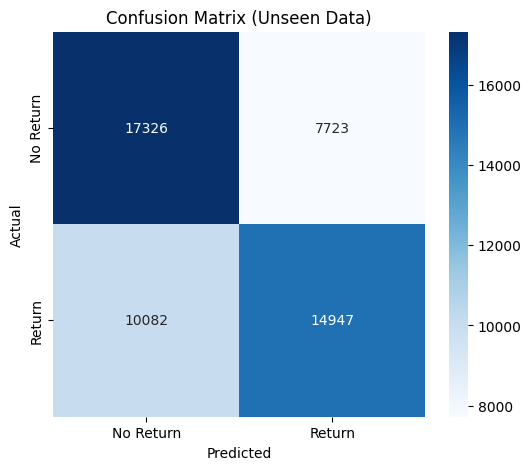

In [ ]:
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
# Load the XGBoost model from the .pkl file
model_path = 'xgb_model.pkl'  # Replace with the correct path to your model file
loaded_model = joblib.load(model_path)
# Sicherstellen, dass deliveryDate im orders_class korrekt erkannt wird
orders_class['deliveryDate'] = pd.to_datetime(orders_class['deliveryDate'], errors='coerce')

# Identifizieren der orderItemID mit deliveryDate = NaT
nat_order_ids = orders_class[orders_class['deliveryDate'].isna()]['orderItemID']

# Setzen von `return_prediction_2 = 0` für diese orderItemIDs in orders_class2
orders_class2.loc[orders_class2['orderItemID'].isin(nat_order_ids), 'return_prediction_2'] = 0

# Filtern der Daten: Nur orderItemIDs mit gültigem deliveryDate werden vom Modell verwendet
valid_orders_class2 = orders_class2[~orders_class2['orderItemID'].isin(nat_order_ids)]

# Features für Vorhersagen extrahieren (nur gültige Zeilen)
X_valid_orders_class2 = valid_orders_class2[['category_count', 'count_without_size', 'similar_product_count_size_color', 'count_without_color',
                   'total_products_in_cart', 'price_rank', 'product_category_encoded',
                    'multiple_packages_flag', 'discount_bins_encoded','multiple_orders_flag','repeat_rate_per_customer',
                   'same_day_as_creation','region_encoded','return_rate_region','total_kept_region_customer','size_category_encoded','free_return'
                    ,'days_since_launch_scaled','target_group_encoded','sub_category_encoded','price_category_encoded'
]]

# Vorhersagen mit dem Modell generieren (nur für gültige orderItemIDs)
valid_predictions = loaded_model.predict(X_valid_orders_class2)

# Speichern der Vorhersagen in `return_prediction_2` (nur für gültige Zeilen)
valid_orders_class2['return_prediction_2'] = valid_predictions

# Kombinieren der Vorhersagen mit den ursprünglichen Daten
orders_class2.update(valid_orders_class2)

# Überprüfung der Ergebnisse
print("Erste Zeilen mit NaT in deliveryDate (sollten return_prediction_2 = 0 haben):")
print(orders_class2[orders_class2['orderItemID'].isin(nat_order_ids)][['customerID', 'orderDate', 'deliveryDate', 'return_prediction_2']])

print("\nErste Zeilen mit gültigem deliveryDate (Vorhersagen vom Modell):")
print(orders_class2[~orders_class2['orderItemID'].isin(nat_order_ids)][['customerID', 'orderDate', 'deliveryDate', 'return_prediction_2']].head())

# Tatsächliche Lösung laden
actual_solution = pd.read_csv("DMC 2014_realclass.txt", sep=";", dtype={'orderItemID': int, 'returnShipment': int})

# Vorhersagen vorbereiten (Zusammenführen der Dateien)
comparison_df = actual_solution.merge(
    orders_class2[['orderItemID', 'return_prediction_2']],
    on='orderItemID',
    how='left'
)

# Überprüfung der Vorhersagen
print("Vergleich von tatsächlicher Lösung und Vorhersagen:")
print(comparison_df.head())

# Tatsächliche und vorhergesagte Werte extrahieren
y_true = comparison_df['returnShipment']
y_pred = comparison_df['return_prediction_2']

# Performance-Metriken berechnen
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = f1_score(y_true, y_pred)

# Ergebnisse anzeigen
print("\nPerformance des Modells auf den Unseen Data:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Confusion Matrix plotten
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Return', 'Return'], yticklabels=['No Return', 'Return'])
plt.title('Confusion Matrix (Unseen Data)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


## Gemeinsame customerID zwischen df13 und orders_class2 identifizieren


<ipython-input-10-d60b2ac0d343>:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_filtered_orders_class2['return_prediction'] = filtered_predictions


Index(['orderItemID', 'orderDate', 'deliveryDate', 'itemID', 'size', 'color',
       'manufacturerID', 'price', 'customerID', 'salutation', 'dateOfBirth',
       'state', 'creationDate', 'non_null_delivery_count',
       'unique_delivery_dates', 'deliveryTime', 'age', 'color_miss',
       'color_hex', 'color_rgb', 'r', 'g', 'b', 'size_false', 'recency',
       'frequency', 'average_frequency', 'customer_return_rate',
       'product_category', 'product_category_encoded', 'size_category',
       'size_category_encoded', 'sub_category', 'target_group',
       'target_group_encoded', 'sub_category_encoded', 'international_UK_size',
       'exact_product_count', 'category_count', 'manufacturer_count',
       'count_without_size', 'count_without_color',
       'similar_product_count_size_color', 'total_products_in_cart',
       'cart_size_flag', 'return_rate_size_product_category',
       'return_rate_color', 'free_return', 'average_cart_value',
       'highest_price_item', 'discount_percen

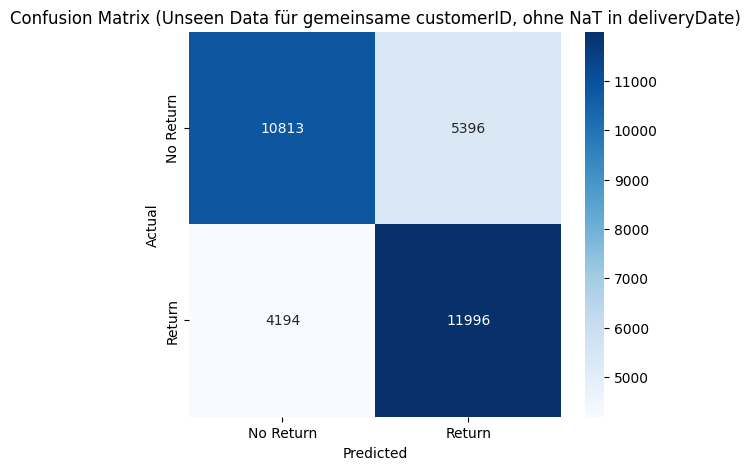

In [ ]:
import pandas as pd
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Sicherstellen, dass deliveryDate im orders_class korrekt als datetime erkannt wird
orders_class['deliveryDate'] = pd.to_datetime(orders_class['deliveryDate'], errors='coerce')

# Identifizieren der orderItemID mit deliveryDate = NaT
nat_order_ids = orders_class[orders_class['deliveryDate'].isna()]['orderItemID']

# Gemeinsame customerID zwischen df13 und orders_class2 identifizieren
common_customer_ids = set(df13['customerID']).intersection(set(orders_class2['customerID']))

# Filterung von orders_class2 auf gemeinsame customerID
filtered_orders_class2 = orders_class2[orders_class2['customerID'].isin(common_customer_ids)].copy()

# Setzen von `return_prediction = 0` für orderItemIDs mit deliveryDate = NaT
filtered_orders_class2.loc[filtered_orders_class2['orderItemID'].isin(nat_order_ids), 'return_prediction'] = 0

# Filtern der gültigen Daten (ohne NaT orderItemIDs für Modellvorhersagen)
valid_filtered_orders_class2 = filtered_orders_class2[~filtered_orders_class2['orderItemID'].isin(nat_order_ids)]

# Features für Vorhersagen extrahieren (nur gültige Daten)
X_orders_class2_filtered = valid_filtered_orders_class2[[
    'category_count', 'count_without_size', 'similar_product_count_size_color', 'count_without_color',
    'total_products_in_cart', 'price_rank', 'product_category_encoded', 'customer_return_rate',
    'multiple_packages_flag', 'discount_bins_encoded', 'return_rate_size_itemid',
    'return_rate_color_itemid', 'multiple_orders_flag', 'repeat_rate_per_customer',
    'same_day_as_creation', 'region_encoded', 'return_rate_region', 'total_kept_region_customer',
    'size_category_encoded', 'free_return', 'days_since_launch_scaled', 'target_group_encoded',
    'sub_category_encoded', 'price_category_encoded'
]]

# Vorhersagen mit dem trainierten Modell generieren (nur für gültige orderItemIDs)
filtered_predictions = xgb_model.predict(X_orders_class2_filtered)

# Speichern der Vorhersagen in `return_prediction` (nur für gültige Zeilen)
valid_filtered_orders_class2['return_prediction'] = filtered_predictions

# Kombinieren der Vorhersagen mit den ursprünglichen Daten
filtered_orders_class2.update(valid_filtered_orders_class2)

# Überprüfung, ob die Spalte existiert
print(filtered_orders_class2.columns)

# Filterung von actual_solution auf relevante orderItemIDs
orders_class2_filtered = filtered_orders_class2[filtered_orders_class2['orderItemID'].isin(actual_solution['orderItemID'])]

# Vorhersagen vorbereiten (Zusammenführen der Dateien)
comparison_df = actual_solution.merge(
    orders_class2_filtered[['orderItemID', 'return_prediction']],
    on='orderItemID',
    how='left'
)

# Überprüfen auf fehlende Vorhersagen
missing_predictions = comparison_df['return_prediction'].isnull().sum()
if missing_predictions > 0:
    print(f"Warnung: {missing_predictions} Vorhersagen fehlen. Diese werden ignoriert.")
    comparison_df = comparison_df.dropna(subset=['return_prediction'])

# Konvertierung in Integer
comparison_df['return_prediction'] = comparison_df['return_prediction'].astype(int)

# Tatsächliche und vorhergesagte Werte extrahieren
y_true = comparison_df['returnShipment']
y_pred = comparison_df['return_prediction']

# Performance-Metriken berechnen
accuracy = accuracy_score(y_true, y_pred)
precision = precision_score(y_true, y_pred)
recall = recall_score(y_true, y_pred)
f1 = f1_score(y_true, y_pred)

# Ergebnisse anzeigen
print("\nPerformance des Modells auf den Unseen Data (für gemeinsame customerID, ohne NaT in deliveryDate):")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Confusion Matrix plotten
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Return', 'Return'], yticklabels=['No Return', 'Return'])
plt.title('Confusion Matrix (Unseen Data für gemeinsame customerID, ohne NaT in deliveryDate)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


<ipython-input-11-45548d99325e>:39: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_filtered_orders_class2['return_prediction_probs'] = y_pred_probs


Warnung: 17679 Vorhersagen fehlen. Diese werden ignoriert.
Optimaler Threshold basierend auf minimalen Fehlerpunkten: 0.48150959610939026

Performance des Modells auf den Unseen Data (für gemeinsame customerID, minimalste Fehlerpunkte):
Accuracy: 0.7056
Precision: 0.6864
Recall: 0.7565
F1 Score: 0.7197


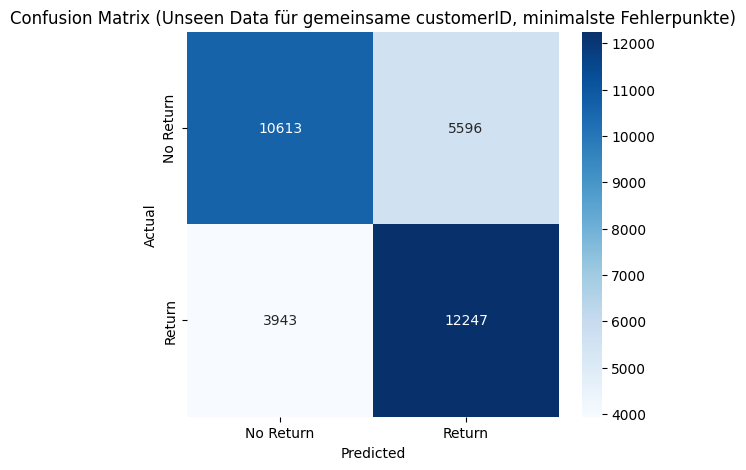

In [ ]:
import numpy as np
from sklearn.metrics import precision_recall_curve, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Sicherstellen, dass deliveryDate im orders_class korrekt erkannt wird
orders_class['deliveryDate'] = pd.to_datetime(orders_class['deliveryDate'], errors='coerce')

# Identifizieren der orderItemID mit deliveryDate = NaT
nat_order_ids = orders_class[orders_class['deliveryDate'].isna()]['orderItemID']

# Gemeinsame customerID zwischen df13 und orders_class2 identifizieren
common_customer_ids = set(df13['customerID']).intersection(set(orders_class2['customerID']))

# Filterung von orders_class2 auf gemeinsame customerID
filtered_orders_class2 = orders_class2[orders_class2['customerID'].isin(list(common_customer_ids))].copy()

# Setzen von `return_prediction_probs = 0` für orderItemIDs mit deliveryDate = NaT
filtered_orders_class2.loc[filtered_orders_class2['orderItemID'].isin(nat_order_ids), 'return_prediction_probs'] = 0

# Filtern der gültigen Daten (ohne NaT orderItemIDs für Modellvorhersagen)
valid_filtered_orders_class2 = filtered_orders_class2[~filtered_orders_class2['orderItemID'].isin(nat_order_ids)]

# Features für Vorhersagen extrahieren (nur gültige Daten)
X_orders_class2_filtered = valid_filtered_orders_class2[[
    'category_count', 'count_without_size', 'similar_product_count_size_color', 'count_without_color',
    'total_products_in_cart', 'price_rank', 'product_category_encoded', 'customer_return_rate',
    'multiple_packages_flag', 'discount_bins_encoded', 'return_rate_size_itemid',
    'return_rate_color_itemid', 'multiple_orders_flag', 'repeat_rate_per_customer',
    'same_day_as_creation', 'region_encoded', 'return_rate_region', 'total_kept_region_customer',
    'size_category_encoded', 'free_return', 'days_since_launch_scaled', 'target_group_encoded',
    'sub_category_encoded', 'price_category_encoded'
]]

# Wahrscheinlichkeiten vorhersagen (nur für gültige Daten)
y_pred_probs = xgb_model.predict_proba(X_orders_class2_filtered)[:, 1]

# Speichern der Wahrscheinlichkeiten in `return_prediction_probs` (nur für gültige Zeilen)
valid_filtered_orders_class2['return_prediction_probs'] = y_pred_probs

# Kombinieren der Wahrscheinlichkeiten mit den ursprünglichen Daten
filtered_orders_class2.update(valid_filtered_orders_class2)

# Filterung von actual_solution auf relevante orderItemIDs (wie im Code ohne Threshold)
comparison_df = actual_solution.merge(
    filtered_orders_class2[['orderItemID', 'return_prediction_probs']],
    on='orderItemID',
    how='left'
)

# Überprüfen auf fehlende Vorhersagen
missing_predictions = comparison_df['return_prediction_probs'].isnull().sum()
if missing_predictions > 0:
    print(f"Warnung: {missing_predictions} Vorhersagen fehlen. Diese werden ignoriert.")
    comparison_df = comparison_df.dropna(subset=['return_prediction_probs'])

# Tatsächliche Werte extrahieren
y_true = comparison_df['returnShipment']
y_pred_probs = comparison_df['return_prediction_probs'].astype(float)

# Precision-Recall-Kurve berechnen
precision, recall, thresholds = precision_recall_curve(y_true, y_pred_probs)

# Berechnen von Fehlerpunkten (False Positives + False Negatives) für jeden Threshold
error_points = []
for thresh in thresholds:
    y_pred_thresh = (y_pred_probs >= thresh).astype(int)
    cm = confusion_matrix(y_true, y_pred_thresh)
    false_positives = cm[0, 1]
    false_negatives = cm[1, 0]
    error_points.append(false_positives + false_negatives)

# Optimalen Threshold basierend auf minimalen Fehlerpunkten finden
optimal_index = np.argmin(error_points)
optimal_threshold = thresholds[optimal_index]
print(f"Optimaler Threshold basierend auf minimalen Fehlerpunkten: {optimal_threshold}")

# Anwenden des optimalen Thresholds
y_pred_adjusted = (y_pred_probs >= optimal_threshold).astype(int)

# Performance-Metriken berechnen
accuracy = accuracy_score(y_true, y_pred_adjusted)
precision = precision_score(y_true, y_pred_adjusted)
recall = recall_score(y_true, y_pred_adjusted)
f1 = f1_score(y_true, y_pred_adjusted)

# Ergebnisse anzeigen
print("\nPerformance des Modells auf den Unseen Data (für gemeinsame customerID, minimalste Fehlerpunkte):")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Confusion Matrix plotten
cm = confusion_matrix(y_true, y_pred_adjusted)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Return', 'Return'], yticklabels=['No Return', 'Return'])
plt.title('Confusion Matrix (Unseen Data für gemeinsame customerID, minimalste Fehlerpunkte)')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()


Optimaler Threshold basierend auf minimalen Fehlerpunkten: 0.4701746106147766


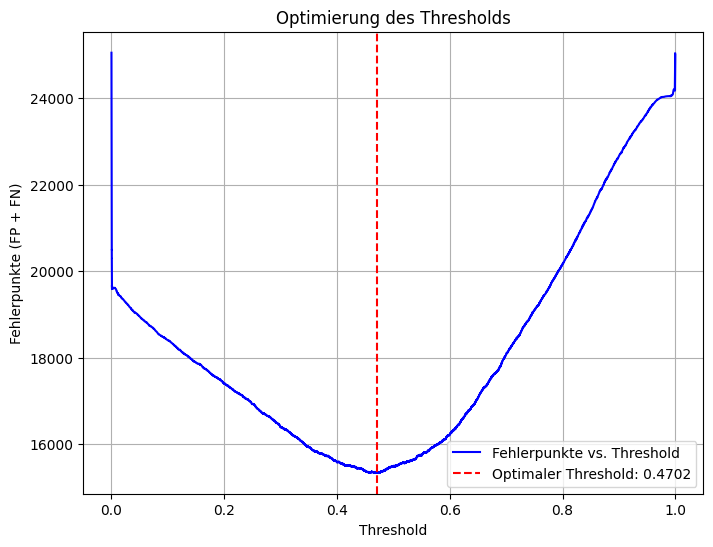


Performance des Modells nach Optimierung:
Accuracy: 0.6936
Precision: 0.6702
Recall: 0.7619
F1 Score: 0.7131


In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import precision_recall_curve, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from evidently.report import Report
from evidently.metric_preset import ClassificationPreset

# Sicherstellen, dass deliveryDate korrekt erkannt wird
orders_class['deliveryDate'] = pd.to_datetime(orders_class['deliveryDate'], errors='coerce')

# Identifizieren der orderItemID mit deliveryDate = NaT
nat_order_ids = orders_class[orders_class['deliveryDate'].isna()]['orderItemID']

# Gemeinsame und nicht-gemeinsame customerIDs identifizieren
common_customer_ids = set(df13['customerID']).intersection(set(orders_class2['customerID']))
non_common_customer_ids = set(orders_class2['customerID']).difference(set(df13['customerID']))

# Datensätze für gemeinsame und nicht-gemeinsame customerIDs filtern
common_orders_class2 = orders_class2[orders_class2['customerID'].isin(common_customer_ids)].copy()
non_common_orders_class2 = orders_class2[orders_class2['customerID'].isin(non_common_customer_ids)].copy()

# Setzen von `return_prediction_probs = 0` für orderItemIDs mit deliveryDate = NaT
common_orders_class2.loc[common_orders_class2['orderItemID'].isin(nat_order_ids), 'return_prediction_probs'] = 0
non_common_orders_class2.loc[non_common_orders_class2['orderItemID'].isin(nat_order_ids), 'return_prediction_probs'] = 0

# Entfernen von NaT orderItemIDs für Modellvorhersagen
valid_common_orders_class2 = common_orders_class2[~common_orders_class2['orderItemID'].isin(nat_order_ids)]
valid_non_common_orders_class2 = non_common_orders_class2[~non_common_orders_class2['orderItemID'].isin(nat_order_ids)]

# Features für Vorhersagen extrahieren
features = [
    'category_count', 'count_without_size', 'similar_product_count_size_color', 'count_without_color',
    'total_products_in_cart', 'price_rank', 'product_category_encoded', 'customer_return_rate',
    'multiple_packages_flag', 'discount_bins_encoded', 'return_rate_size_itemid', 'return_rate_color_itemid',
    'multiple_orders_flag', 'repeat_rate_per_customer', 'same_day_as_creation', 'region_encoded', 'return_rate_region',
    'total_kept_region_customer', 'size_category_encoded', 'free_return', 'days_since_launch_scaled',
    'target_group_encoded', 'sub_category_encoded', 'price_category_encoded'
]

X_common = valid_common_orders_class2[features]
X_non_common = valid_non_common_orders_class2[features]

# Wahrscheinlichkeiten vorhersagen
y_pred_probs_common = xgb_model.predict_proba(X_common)[:, 1]
y_pred_probs_non_common = xgb_model.predict_proba(X_non_common)[:, 1]

# Speichern der Wahrscheinlichkeiten
valid_common_orders_class2['return_prediction_probs'] = y_pred_probs_common
valid_non_common_orders_class2['return_prediction_probs'] = y_pred_probs_non_common

# Aktualisieren der ursprünglichen Daten
common_orders_class2.update(valid_common_orders_class2)
non_common_orders_class2.update(valid_non_common_orders_class2)

# Daten kombinieren
final_predictions = pd.concat([common_orders_class2, non_common_orders_class2])

# Vergleich mit actual_solution
comparison_df = actual_solution.merge(
    final_predictions[['orderItemID', 'return_prediction_probs', 'customerID']],
    on='orderItemID',
    how='left'
)

# Überprüfen auf fehlende Vorhersagen
missing_predictions = comparison_df['return_prediction_probs'].isnull().sum()
if missing_predictions > 0:
    print(f"Warnung: {missing_predictions} Vorhersagen fehlen. Diese werden ignoriert.")
    comparison_df = comparison_df.dropna(subset=['return_prediction_probs'])

# Tatsächliche Werte extrahieren
y_true = comparison_df['returnShipment']
y_pred_probs = comparison_df['return_prediction_probs'].astype(float)

# Evidently Report für Modellbewertung
classification_report = Report(metrics=[ClassificationPreset()])
classification_report.run(reference_data=pd.DataFrame({'target': y_true, 'prediction': y_pred_probs}),
                          current_data=pd.DataFrame({'target': y_true, 'prediction': y_pred_probs}))

# Report anzeigen
classification_report.show()

# Precision-Recall-Kurve berechnen
precision, recall, thresholds = precision_recall_curve(y_true, y_pred_probs)

# Fehlerpunkte berechnen
error_points = []
for thresh in thresholds:
    y_pred_thresh = (y_pred_probs >= thresh).astype(int)
    cm = confusion_matrix(y_true, y_pred_thresh)
    false_positives = cm[0, 1]
    false_negatives = cm[1, 0]
    error_points.append(false_positives + false_negatives)

# Optimalen Threshold basierend auf minimalen Fehlerpunkten finden
optimal_index = np.argmin(error_points)
optimal_threshold = thresholds[optimal_index]
print(f"Optimaler Threshold basierend auf minimalen Fehlerpunkten: {optimal_threshold}")

# Threshold-Visualisierung vor und nach Optimierung
plt.figure(figsize=(8, 6))
plt.plot(thresholds, error_points, label='Fehlerpunkte vs. Threshold', color='blue')
plt.axvline(x=optimal_threshold, color='red', linestyle='--', label=f'Optimaler Threshold: {optimal_threshold:.4f}')
plt.xlabel('Threshold')
plt.ylabel('Fehlerpunkte (FP + FN)')
plt.title('Optimierung des Thresholds')
plt.legend()
plt.grid()
plt.show()

# Anwenden des optimalen Thresholds
y_pred_adjusted = (y_pred_probs >= optimal_threshold).astype(int)

# Performance-Metriken berechnen
accuracy = accuracy_score(y_true, y_pred_adjusted)
precision = precision_score(y_true, y_pred_adjusted)
recall = recall_score(y_true, y_pred_adjusted)
f1 = f1_score(y_true, y_pred_adjusted)

# Ergebnisse anzeigen
print("\nPerformance des Modells nach Optimierung:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")


Optimaler Threshold basierend auf ROC-AUC (Youden's Index): 0.4701746106147766


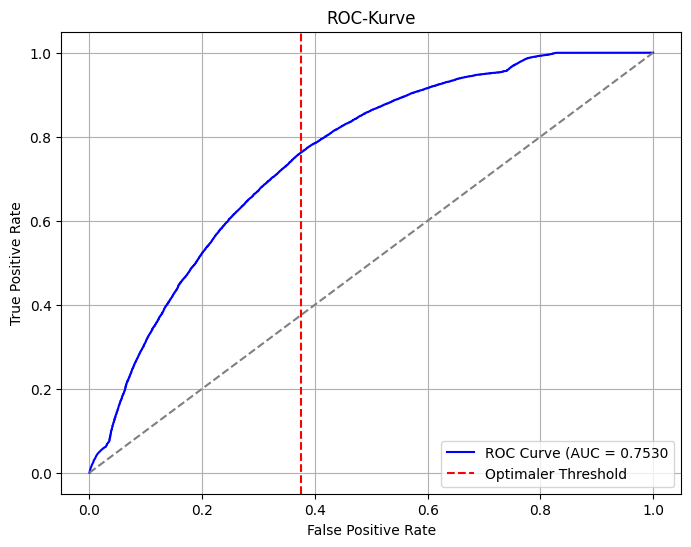


Performance des Modells nach Optimierung mit ROC-AUC Threshold:
Accuracy: 0.6936
Precision: 0.6702
Recall: 0.7619
F1 Score: 0.7131


In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import precision_recall_curve, roc_curve, auc, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from evidently.report import Report
from evidently.metric_preset import ClassificationPreset

# Sicherstellen, dass deliveryDate korrekt erkannt wird
orders_class['deliveryDate'] = pd.to_datetime(orders_class['deliveryDate'], errors='coerce')

# Identifizieren der orderItemID mit deliveryDate = NaT
nat_order_ids = orders_class[orders_class['deliveryDate'].isna()]['orderItemID']

# Gemeinsame und nicht-gemeinsame customerIDs identifizieren
common_customer_ids = set(df13['customerID']).intersection(set(orders_class2['customerID']))
non_common_customer_ids = set(orders_class2['customerID']).difference(set(df13['customerID']))

# Datensätze für gemeinsame und nicht-gemeinsame customerIDs filtern
common_orders_class2 = orders_class2[orders_class2['customerID'].isin(common_customer_ids)].copy()
non_common_orders_class2 = orders_class2[orders_class2['customerID'].isin(non_common_customer_ids)].copy()

# Setzen von `return_prediction_probs = 0` für orderItemIDs mit deliveryDate = NaT
common_orders_class2.loc[common_orders_class2['orderItemID'].isin(nat_order_ids), 'return_prediction_probs'] = 0
non_common_orders_class2.loc[non_common_orders_class2['orderItemID'].isin(nat_order_ids), 'return_prediction_probs'] = 0

# Entfernen von NaT orderItemIDs für Modellvorhersagen
valid_common_orders_class2 = common_orders_class2[~common_orders_class2['orderItemID'].isin(nat_order_ids)]
valid_non_common_orders_class2 = non_common_orders_class2[~non_common_orders_class2['orderItemID'].isin(nat_order_ids)]

# Features für Vorhersagen extrahieren
features = [
    'category_count', 'count_without_size', 'similar_product_count_size_color', 'count_without_color',
    'total_products_in_cart', 'price_rank', 'product_category_encoded', 'customer_return_rate',
    'multiple_packages_flag', 'discount_bins_encoded', 'return_rate_size_itemid', 'return_rate_color_itemid',
    'multiple_orders_flag', 'repeat_rate_per_customer', 'same_day_as_creation', 'region_encoded', 'return_rate_region',
    'total_kept_region_customer', 'size_category_encoded', 'free_return', 'days_since_launch_scaled',
    'target_group_encoded', 'sub_category_encoded', 'price_category_encoded'
]

X_common = valid_common_orders_class2[features]
X_non_common = valid_non_common_orders_class2[features]

# Wahrscheinlichkeiten vorhersagen
y_pred_probs_common = xgb_model.predict_proba(X_common)[:, 1]
y_pred_probs_non_common = xgb_model.predict_proba(X_non_common)[:, 1]

# Speichern der Wahrscheinlichkeiten
valid_common_orders_class2['return_prediction_probs'] = y_pred_probs_common
valid_non_common_orders_class2['return_prediction_probs'] = y_pred_probs_non_common

# Aktualisieren der ursprünglichen Daten
common_orders_class2.update(valid_common_orders_class2)
non_common_orders_class2.update(valid_non_common_orders_class2)

# Daten kombinieren
final_predictions = pd.concat([common_orders_class2, non_common_orders_class2])

# Vergleich mit actual_solution
comparison_df = actual_solution.merge(
    final_predictions[['orderItemID', 'return_prediction_probs', 'customerID']],
    on='orderItemID',
    how='left'
)

# Überprüfen auf fehlende Vorhersagen
missing_predictions = comparison_df['return_prediction_probs'].isnull().sum()
if missing_predictions > 0:
    print(f"Warnung: {missing_predictions} Vorhersagen fehlen. Diese werden ignoriert.")
    comparison_df = comparison_df.dropna(subset=['return_prediction_probs'])

# Tatsächliche Werte extrahieren
y_true = comparison_df['returnShipment']
y_pred_probs = comparison_df['return_prediction_probs'].astype(float)

# ROC-Kurve berechnen
fpr, tpr, roc_thresholds = roc_curve(y_true, y_pred_probs)
roc_auc = auc(fpr, tpr)

# Besten Threshold basierend auf Youden's J-Statistik berechnen (max TPR - FPR)
youden_index = np.argmax(tpr - fpr)
optimal_threshold_roc = roc_thresholds[youden_index]
print(f"Optimaler Threshold basierend auf ROC-AUC (Youden's Index): {optimal_threshold_roc}")

# ROC-Kurve visualisieren
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label=f'ROC Curve (AUC = {roc_auc:.4f}')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray')
plt.axvline(x=fpr[youden_index], color='red', linestyle='--', label='Optimaler Threshold')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC-Kurve')
plt.legend()
plt.grid()
plt.show()

# Anwenden des optimalen ROC-Thresholds
y_pred_adjusted = (y_pred_probs >= optimal_threshold_roc).astype(int)

# Performance-Metriken berechnen
accuracy = accuracy_score(y_true, y_pred_adjusted)
precision = precision_score(y_true, y_pred_adjusted)
recall = recall_score(y_true, y_pred_adjusted)
f1 = f1_score(y_true, y_pred_adjusted)

# Ergebnisse anzeigen
print("\nPerformance des Modells nach Optimierung mit ROC-AUC Threshold:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")


## der customerID, die in orders_class2, aber nicht in df13 vorhanden sind

<ipython-input-14-7e5600a8bc3d>:47: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_common_orders_class2['return_prediction_probs'] = y_pred_probs_common
<ipython-input-14-7e5600a8bc3d>:48: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  valid_non_common_orders_class2['return_prediction_probs'] = y_pred_probs_non_common


Gemeinsame Kunden gefunden: 32399
Nicht-gemeinsame Kunden gefunden: 17679
Shape cm_common: (2, 2), Shape cm_non_common: (2, 2)

Summierte Confusion Matrix (gemeinsame + nicht-gemeinsame customerID):
[[15629  9420]
 [ 5891 19138]]


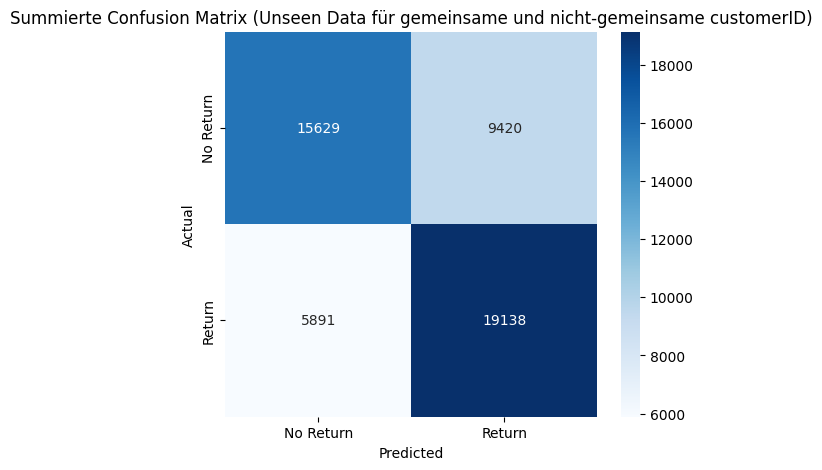

In [ ]:
import numpy as np
import pandas as pd
from sklearn.metrics import precision_recall_curve, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Sicherstellen, dass deliveryDate korrekt erkannt wird
orders_class['deliveryDate'] = pd.to_datetime(orders_class['deliveryDate'], errors='coerce')

# Identifizieren der orderItemID mit deliveryDate = NaT
nat_order_ids = orders_class[orders_class['deliveryDate'].isna()]['orderItemID']

# Gemeinsame und nicht-gemeinsame customerIDs identifizieren
common_customer_ids = set(df13['customerID']).intersection(set(orders_class2['customerID']))
non_common_customer_ids = set(orders_class2['customerID']).difference(set(df13['customerID']))

# Datensätze für gemeinsame und nicht-gemeinsame customerIDs filtern
common_orders_class2 = orders_class2[orders_class2['customerID'].isin(common_customer_ids)].copy()
non_common_orders_class2 = orders_class2[orders_class2['customerID'].isin(non_common_customer_ids)].copy()

# Setzen von `return_prediction_probs = 0` für orderItemIDs mit deliveryDate = NaT
common_orders_class2.loc[common_orders_class2['orderItemID'].isin(nat_order_ids), 'return_prediction_probs'] = 0
non_common_orders_class2.loc[non_common_orders_class2['orderItemID'].isin(nat_order_ids), 'return_prediction_probs'] = 0

# Entfernen von NaT orderItemIDs für Modellvorhersagen
valid_common_orders_class2 = common_orders_class2[~common_orders_class2['orderItemID'].isin(nat_order_ids)]
valid_non_common_orders_class2 = non_common_orders_class2[~non_common_orders_class2['orderItemID'].isin(nat_order_ids)]

# Features für Vorhersagen extrahieren
features = [
    'category_count', 'count_without_size', 'similar_product_count_size_color', 'count_without_color',
    'total_products_in_cart', 'price_rank', 'product_category_encoded', 'customer_return_rate',
    'multiple_packages_flag', 'discount_bins_encoded', 'return_rate_size_itemid', 'return_rate_color_itemid',
    'multiple_orders_flag', 'repeat_rate_per_customer', 'same_day_as_creation', 'region_encoded', 'return_rate_region',
    'total_kept_region_customer', 'size_category_encoded', 'free_return', 'days_since_launch_scaled',
    'target_group_encoded', 'sub_category_encoded', 'price_category_encoded'
]

X_common = valid_common_orders_class2[features]
X_non_common = valid_non_common_orders_class2[features]

# Wahrscheinlichkeiten vorhersagen
y_pred_probs_common = xgb_model.predict_proba(X_common)[:, 1]
y_pred_probs_non_common = xgb_model.predict_proba(X_non_common)[:, 1]

# Speichern der Wahrscheinlichkeiten
valid_common_orders_class2['return_prediction_probs'] = y_pred_probs_common
valid_non_common_orders_class2['return_prediction_probs'] = y_pred_probs_non_common

# Aktualisieren der ursprünglichen Daten
common_orders_class2.update(valid_common_orders_class2)
non_common_orders_class2.update(valid_non_common_orders_class2)

# Daten kombinieren
final_predictions = pd.concat([common_orders_class2, non_common_orders_class2])

# Vergleich mit actual_solution
comparison_df = actual_solution.merge(
    final_predictions[['orderItemID', 'return_prediction_probs', 'customerID']],
    on='orderItemID',
    how='left'
)

# Überprüfen auf fehlende Vorhersagen
missing_predictions = comparison_df['return_prediction_probs'].isnull().sum()
if missing_predictions > 0:
    print(f"Warnung: {missing_predictions} Vorhersagen fehlen. Diese werden ignoriert.")
    comparison_df = comparison_df.dropna(subset=['return_prediction_probs'])

# Tatsächliche Werte extrahieren
y_true = comparison_df['returnShipment']
y_pred_probs = comparison_df['return_prediction_probs'].astype(float)

# Definierte Thresholds für beide Gruppen
threshold_common = 0.48150959610939026
threshold_non_common = 0.45681852102279663

# Prüfen, ob 'customerID' in comparison_df existiert
if 'customerID' in comparison_df.columns:
    # Gemeinsame customerIDs Confusion Matrix
    mask_common = comparison_df['customerID'].isin(common_customer_ids)
    print(f"Gemeinsame Kunden gefunden: {mask_common.sum()}")
    y_pred_common = (y_pred_probs[mask_common] >= threshold_common).astype(int)
    cm_common = confusion_matrix(y_true[mask_common], y_pred_common)

    # Nicht-gemeinsame customerIDs Confusion Matrix
    mask_non_common = comparison_df['customerID'].isin(non_common_customer_ids)
    print(f"Nicht-gemeinsame Kunden gefunden: {mask_non_common.sum()}")
    y_pred_non_common = (y_pred_probs[mask_non_common] >= threshold_non_common).astype(int)
    cm_non_common = confusion_matrix(y_true[mask_non_common], y_pred_non_common)

    # Debugging: Prüfen, ob beide Matrizen dieselbe Form haben
    print(f"Shape cm_common: {cm_common.shape}, Shape cm_non_common: {cm_non_common.shape}")
    if cm_common.shape == cm_non_common.shape:
        total_cm = cm_common + cm_non_common
    else:
        print("Fehler: Die Confusion Matrices haben unterschiedliche Dimensionen und können nicht summiert werden.")
        total_cm = None
else:
    print("Warnung: Spalte 'customerID' fehlt in comparison_df. Berechnung der getrennten Confusion Matrices nicht möglich.")
    total_cm = confusion_matrix(y_true, (y_pred_probs >= (threshold_common + threshold_non_common) / 2).astype(int))

# Ergebnisse ausgeben
if total_cm is not None:
    print("\nSummierte Confusion Matrix (gemeinsame + nicht-gemeinsame customerID):")
    print(total_cm)

    # Confusion Matrix plotten
    plt.figure(figsize=(6, 5))
    sns.heatmap(total_cm, annot=True, fmt='d', cmap='Blues', xticklabels=['No Return', 'Return'], yticklabels=['No Return', 'Return'])
    plt.title('Summierte Confusion Matrix (Unseen Data für gemeinsame und nicht-gemeinsame customerID)')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()


In [ ]:
actual_solution

,orderItemID,returnShipment
0,1,1
1,2,1
2,3,1
3,4,0
4,5,0
...,...,...
50073,50074,1
50074,50075,1
50075,50076,0
50076,50077,0


# Korrelationen analysieren

In [ ]:
df3.info()

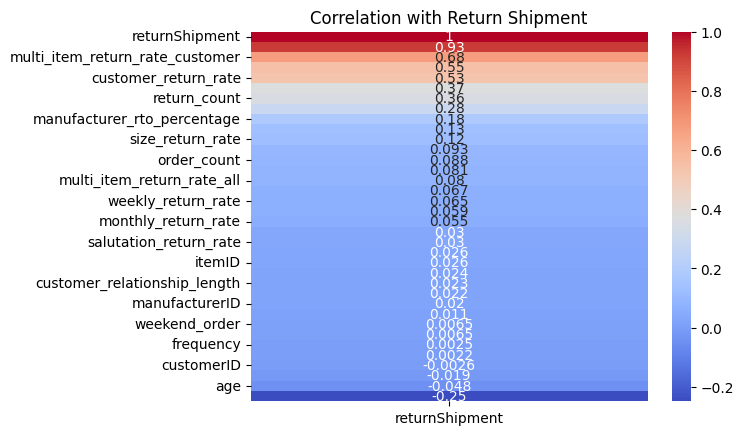

In [ ]:
# Ensure 'returnShipment' is of numeric type
df9['returnShipment'] = df9['returnShipment'].astype(float)

# Select only numeric columns for the correlation matrix, ensuring 'returnShipment' is included
numeric_df = df9.select_dtypes(include=['float64', 'int64', 'int32','int16','int8'])

# Calculate the correlation matrix
corr_matrix = numeric_df.corr()

# Plot the correlation with returnShipment
if 'returnShipment' in corr_matrix.columns:
    sns.heatmap(corr_matrix[['returnShipment']].sort_values(by='returnShipment', ascending=False), annot=True, cmap='coolwarm')
    plt.title('Correlation with Return Shipment')
    plt.show()
else:
    print("Column 'returnShipment' is not in the correlation matrix.")

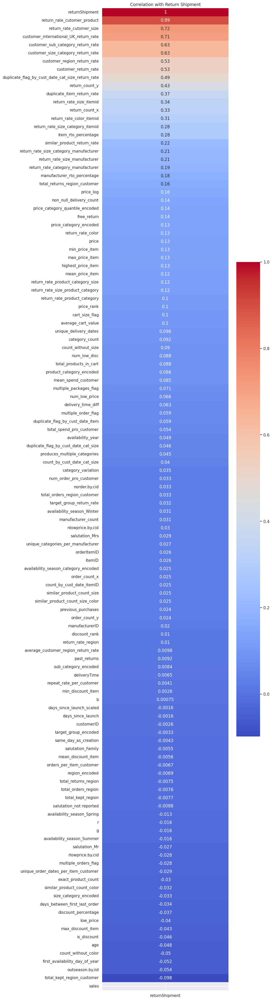

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Ensure 'returnShipment' is of numeric type
df13['returnShipment'] = df13['returnShipment'].astype(float)

# Select only numeric columns for the correlation matrix, ensuring 'returnShipment' is included
numeric_df = df13.select_dtypes(include=['float64', 'int64', 'int32', 'int16', 'int8'])

# Exclude 'average_return_time' from the correlation matrix
if 'average_return_time' in numeric_df.columns:
    numeric_df = numeric_df.drop(columns=['average_return_time'])

# Calculate the correlation matrix
corr_matrix = numeric_df.corr()

# Plot the correlation with returnShipment
if 'returnShipment' in corr_matrix.columns:
    plt.figure(figsize=(8, 50))  # Customize the size of the chart here
    sns.heatmap(
        corr_matrix[['returnShipment']].sort_values(by='returnShipment', ascending=False),
        annot=True,
        cmap='coolwarm'
    )
    plt.title('Correlation with Return Shipment')
    plt.show()
else:
    print("Column 'returnShipment' is not in the correlation matrix.")


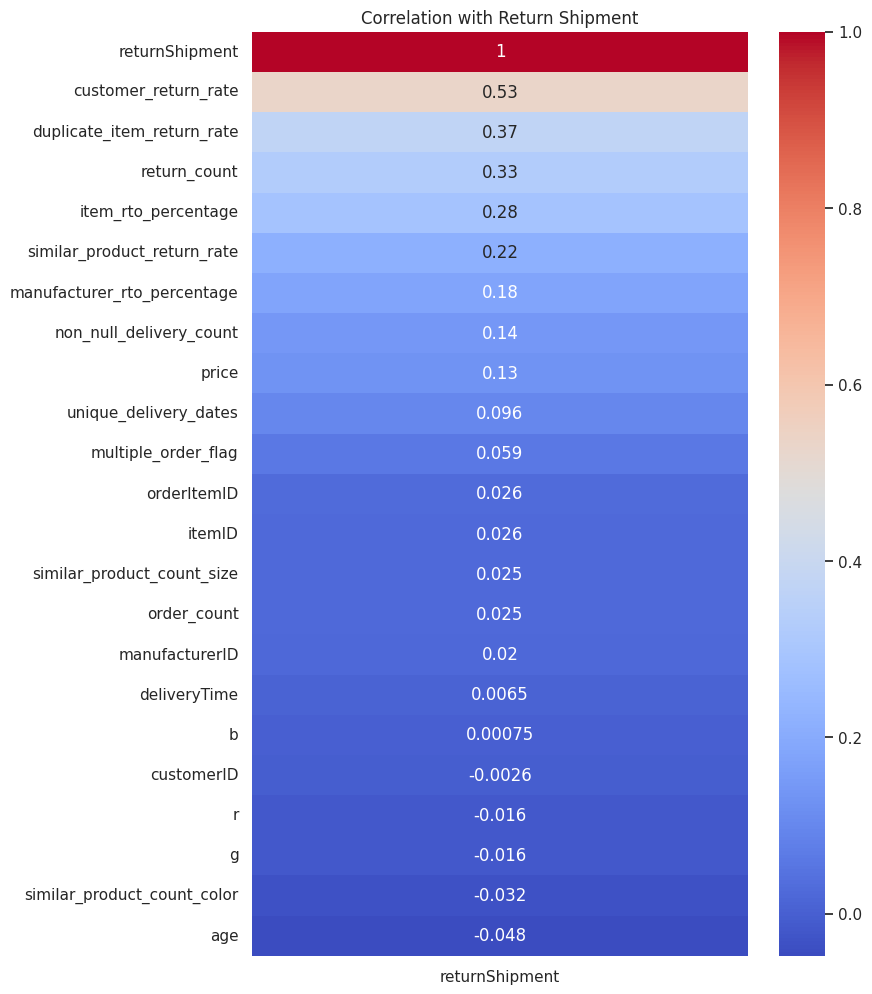

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Ensure 'returnShipment' is of numeric type
df12['returnShipment'] = df12['returnShipment'].astype(float)

# Select only numeric columns for the correlation matrix, ensuring 'returnShipment' is included
numeric_df = df12.select_dtypes(include=['float64', 'int64', 'int32', 'int16', 'int8'])

# Calculate the correlation matrix
corr_matrix = numeric_df.corr()

# Plot the correlation with returnShipment
if 'returnShipment' in corr_matrix.columns:
    plt.figure(figsize=(8, 12))  # Customize the size of the chart here
    sns.heatmap(
        corr_matrix[['returnShipment']].sort_values(by='returnShipment', ascending=False),
        annot=True,
        cmap='coolwarm'
    )
    plt.title('Correlation with Return Shipment')
    plt.show()
else:
    print("Column 'returnShipment' is not in the correlation matrix.")


In [ ]:
df12.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 481092 entries, 0 to 481091
Data columns (total 50 columns):
 #   Column                           Non-Null Count   Dtype         
---  ------                           --------------   -----         
 0   orderItemID                      481092 non-null  int32         
 1   orderDate                        481092 non-null  datetime64[ns]
 2   deliveryDate                     437013 non-null  datetime64[ns]
 3   itemID                           481092 non-null  int64         
 4   size                             481092 non-null  category      
 5   color                            481092 non-null  category      
 6   manufacturerID                   481092 non-null  int32         
 7   price                            481092 non-null  float64       
 8   customerID                       481092 non-null  int32         
 9   salutation                       481092 non-null  category      
 10  dateOfBirth                      481092 non-